# Section 0, cell 1 - MRI classification overview and settings guide

This notebook evaluates MRI classification with one fixed patient split and three possible workflows:
Section 1 trains an end-to-end CNN with the backbone frozen, Section 2 extracts CNN features and then
tests classical machine-learning models, and Section 3 trains an end-to-end CNN with fine-tuning.

The visible cell labels in this notebook use the format `Section X, cell Y`. Use those labels together
with the quoted code lines below to find settings quickly. The quoted code line is the exact text to
search for in the notebook.

Plain-language terms used in the notebook:

- `CV` (cross-validation): the development patients are split into folds so each fold can be tested by a model that did not train on those patients.
- `OOF` (out-of-fold): the prediction for each development patient made by a model that did not train on that patient.
- `holdout`: the final test patients kept out of all training and setting selection.
- `AUC` is a threshold-free ranking score; higher is better.
- `LR`: learning rate in training settings such as `LR_HEAD`, and logistic regression in model names such as `LOGREG`.
- `optimization arm`: one tested combination of settings, for example one image size, one slice count and one augmentation level.

### Main workflow and shared-data settings

| Location | Search for this code line | Plain-language meaning |
|---|---|---|
| Section 0, cell 3 | `PACKAGE_PINS = {` | Package versions installed at the start of the notebook. |
| Section 0, cell 3 | `RUN_FROZEN_CNN_E2E    = True` | Runs Section 1, the frozen-backbone end-to-end CNN workflow. |
| Section 0, cell 3 | `RUN_CNN_LR            = True` | Runs Section 2, the frozen-CNN feature extraction plus machine-learning workflow. |
| Section 0, cell 3 | `RUN_CNN_FINETUNE_E2E  = False` | Runs Section 3 when set to `True`; skips fine-tuning when set to `False`. |
| Section 0, cell 3 | `GLOBAL_SEED = 42` | Sets the base random seed so splits and training are repeatable. |
| Section 0, cell 3 | `HF_TOKEN = ""` | Optional Hugging Face access key; leave blank when using public downloads or a Colab Secret. |
| Section 0, cell 3 | `SHARED_BACKBONES = [` | CNN architectures considered by the workflows. |
| Section 0, cell 3 | `SHARED_THRESHOLDS = ["thrfull"]` | Outcome label files to use. |
| Section 0, cell 3 | `N_DEV_PATIENTS = 150` | Number of sorted patients used for development; the remaining patients become the holdout test set. |
| Section 0, cell 3 | `CNN_INPUT_SIZE_SHARED = 224` | Default image size in pixels for CNN inputs. |
| Section 0, cell 3 | `N_SLICES         = 1` | Number of tumour-bearing slices used per patient. Valid choices are 1, 3 or 5. |
| Section 0, cell 3 | `SLICE_SPACING_MM = 2.0` | Physical distance, in millimetres, between neighbouring selected slices. |
| Section 0, cell 3 | `SHOW_ANALYSED_SLICES = True` | Shows visual checks of the slices before long runs. |
| Section 0, cell 3 | `QC_N_PATIENTS        = 35` | Number of patients shown in the visual check. |
| Section 0, cell 3 | `QC_PATIENTS_PER_FIG  = 1` | Number of patients placed in each visual-check figure. |

### Optimization comparison settings

| Location | Search for this code line | Plain-language meaning |
|---|---|---|
| Section 0, cell 3 | `OPTIMIZATION = True` | When `True`, compare multiple setting combinations before summarising results. |
| Section 0, cell 3 | `OPTIMIZATION_INPUT_SIZES = (128, 224)` | Compare multiple image sizes. |
| Section 0, cell 3 | `OPTIMIZATION_N_SLICES    = (1,)` | Slice counts to compare; keep the comma for a one-item tuple. |
| Section 0, cell 3 | `OPTIMIZATION_AUG_LEVELS  = ("FLIPS", "BASIC", "COMPLEX")` | Training augmentation levels to compare for CNN training workflows. |
| Section 0, cell 3 | `TUMOR_CONTEXT_MODE = "MIN_BBOX"` | Chooses what image content is kept: minimal bounding-box crop or tumour-only pixels. |
| Section 0, cell 3 | `ROI_ONLY_BACKGROUND_VALUE = 0.5` | Background fill value used only when `TUMOR_CONTEXT_MODE` is `ROI_ONLY`. |
| Section 0, cell 3 | `OPTIMIZATION_INCLUDE_REFERENCE_ARM = True` | Adds the current standard setting combination so every comparison has a reference. |
| Section 0, cell 3 | `OPTIMIZATION_BACKBONES = ("radimagenet_densenet121", "radimagenet_resnet10t", "radimagenet_resnet18")` | CNN architectures included in the optimization comparison. |
| Section 0, cell 3 | `OPTIMIZATION_N_FOLDS   = 5` | Cross-validation folds used during optimization comparisons. |
| Section 0, cell 3 | `OPTIMIZATION_N_REPEATS = 2` | How many repeated cross-validation runs are used during optimization comparisons. |
| Section 0, cell 3 | `OPTIMIZATION_MIN_DELTA = 0.02` | Minimum AUC gain required before a new setting is treated as meaningfully better. |
| Section 0, cell 3 | `OPTIMIZATION_REFERENCE_AUG_BY_WORKFLOW = {` | Reference augmentation level for each CNN training workflow. |

### Augmentation and image-preparation settings

| Location | Search for this code line | Plain-language meaning |
|---|---|---|
| Section 0, cell 3 | `TRAIN_AUGMENTATION_LEVEL = "BASIC"` | Training augmentation level used when optimization comparison is off. |
| Section 0, cell 3 | `AUG_ROTATE_DEG  = 12.0` | Maximum random rotation, in degrees, used by `BASIC`, `COMPLEX` and `COMPLEX_JITTER`. |
| Section 0, cell 3 | `AUG_SCALE_RANGE = (0.92, 1.08)` | Random zoom range used by `COMPLEX` and `COMPLEX_JITTER`. |
| Section 0, cell 3 | `AUG_TRANSLATE   = 0.06` | Random shift as a fraction of image size, used by `COMPLEX` and `COMPLEX_JITTER`. |
| Section 0, cell 3 | `AUG_GAMMA_RANGE = (0.80, 1.25)` | Random gamma/intensity curve range used by `COMPLEX_JITTER`. |
| Section 0, cell 3 | `AUG_BRIGHTNESS  = 0.10` | Random brightness change used by `COMPLEX_JITTER`. |
| Section 0, cell 3 | `AUG_CONTRAST    = 0.10` | Random contrast change used by `COMPLEX_JITTER`. |
| Section 0, cell 3 | `AUG_NOISE_STD   = 0.02` | Random image noise strength used by `COMPLEX_JITTER`. |
| Section 0, cell 3 | `CROP_SAFETY_MARGIN_PX = 2` | Extra native pixels kept around the tumour crop on every side. |
| Section 0, cell 3 | `INTENSITY_Z_SPAN_SD = 2.5` | Intensity range kept after z-scoring, before rescaling to 0-1. |
| Section 0, cell 3 | `LOCAL_CACHE_DIR = "/content/IMAGE_LOCAL_CACHE_PATIENT_SAFE"` | Local Colab cache folder for copied MRI files. |
| Section 0, cell 3 | `SAVE_SLICE_LEVEL_FEATURE_CSVS = False` | Whether to write per-slice feature CSVs in addition to patient-level features. |

### Shared evaluation, feature-selection and output settings

| Location | Search for this code line | Plain-language meaning |
|---|---|---|
| Section 0, cell 3 | `TOP_RISK_PERCENT = 25.0` | Also reports metrics for the highest-risk 25 percent of patients. |
| Section 0, cell 3 | `MAX_DISPLAY_ROWS = 200` | Maximum rows shown by notebook table displays. |
| Section 0, cell 3 | `USE_FEATURE_SELECTOR_VOTING = True` | Turns on feature-selector voting in the Section 2 machine-learning workflow. |
| Section 0, cell 3 | `RUN_FEATURE_SELECTOR_COMBINATIONS = [` | Feature-selection methods used together as a voting group. |
| Section 0, cell 3 | `FEATURE_SELECTOR_TOP_K = 25` | Number of features nominated by each feature-selection method. |
| Section 0, cell 3 | `FEATURE_SELECTOR_MIN_KEEP = 4` | Minimum number of features kept after voting. |
| Section 0, cell 3 | `FEATURE_SELECTOR_MIN_VOTES = 3` | Votes required for a feature to be kept. |
| Section 0, cell 3 | `RUN_CLASSIFIERS = [` | Classical machine-learning classifiers run in Section 2. |
| Section 0, cell 3 | `OUT_ROOT = "/content/drive/MyDrive/RESULTS/ANALYSIS_1"` | Main Google Drive folder for all result files. |
| Section 0, cell 3 | `PART1_OUT_DIR         = os.path.join(OUT_ROOT, "PART1_frozen_e2e_cnn")` | Result folder for Section 1. |
| Section 0, cell 3 | `PART2_OUT_DIR         = os.path.join(OUT_ROOT, "PART2_cnn_features")` | Result folder for Section 2 feature extraction. |
| Section 0, cell 3 | `SEG2_FEATURE_DIR      = os.path.join(PART2_OUT_DIR, "patient_features")` | Folder containing patient-level feature CSVs. |
| Section 0, cell 3 | `PART3_OUT_DIR         = os.path.join(OUT_ROOT, "PART3_cnn_ml")` | Result folder for Section 2 machine-learning models. |
| Section 0, cell 3 | `FINETUNE_OUT_DIR      = os.path.join(OUT_ROOT, "PART4_finetuning")` | Result folder for Section 3 fine-tuning. |
| Section 0, cell 3 | `COMBINED_OVERVIEW_DIR = os.path.join(OUT_ROOT, "combined_overview")` | Folder for final combined overview files. |

### Workflow-specific settings

| Location | Search for this code line | Plain-language meaning |
|---|---|---|
| Section 0, cell 3 | `INPUT_ROOT = "/content/drive/MyDrive/DATA/images_and_masks"` | Input folder holding the paired image and mask volumes, used by every section; it must match Notebook 1's `output_root`. |
| Section 0, cell 3 | `LABELS_CONFIGS = [` | Label CSV files, one per outcome definition, used by every section. |
| Section 0, cell 3 | `WEIGHTS_BASE = "/content/drive/MyDrive/DATA/weights"` | Folder containing the downloaded RadImageNet checkpoints, used by every section. |
| Section 1, cell 3 | `RADIMAGENET_NORM_BY_BACKBONE = {` | Input normalisation used for each RadImageNet backbone. |
| Section 1, cell 3 | `CHANNEL_POLICY = "gray3"` | Uses the MRI image as three grey channels and does not pass the mask as a channel. |
| Section 1, cell 3 | `N_FOLDS         = int(OPTIMIZATION_N_FOLDS) if OPTIMIZATION else 5` | Cross-validation folds for Section 1. |
| Section 1, cell 3 | `N_REPEATS       = int(OPTIMIZATION_N_REPEATS) if OPTIMIZATION else 2` | Repeated cross-validation runs for Section 1. |
| Section 1, cell 3 | `EPOCHS_HEAD     = 15` | Maximum training epochs for the classification head. |
| Section 1, cell 3 | `LR_HEAD         = 1e-3` | Learning rate for the classification head. |
| Section 1, cell 3 | `FROZEN_E2E_AUGMENTATION_LEVEL = "FLIPS"` | Augmentation level used by Section 1 when optimization comparison is off. |
| Section 1, cell 3 | `BATCH_SIZE      = 8` | Patients per training batch. |
| Section 1, cell 3 | `DROPOUT         = 0.5` | Dropout strength in the classifier head. |
| Section 1, cell 3 | `WEIGHT_DECAY    = 1e-4` | Regularisation strength for training. |
| Section 1, cell 3 | `EARLY_STOP_PATIENCE = 10` | Stops training after this many epochs without improvement. |
| Section 1, cell 3 | `USE_POS_WEIGHT   = True` | Gives extra weight to the positive class when classes are imbalanced. |
| Section 1, cell 3 | `POS_WEIGHT_SCALE = 1.0` | Strength of positive-class weighting. |
| Section 1, cell 3 | `DECISION_THRESHOLD = 0.5` | Fallback probability cut-off when top-risk reporting is disabled. |
| Section 1, cell 11 | `AUC_CI_CONFIDENCE = 0.95` | Confidence level for AUC interval estimates. |
| Section 1, cell 11 | `AUC_BOOTSTRAP_REPEATS = 2000` | Number of bootstrap repeats used for AUC intervals. |
| Section 2, cell 4 | `COPY_IMAGES_TO_LOCAL_RUNTIME = True` | Copies MRI files to local Colab storage before feature extraction. |
| Section 2, cell 4 | `FORCE_REFRESH_LOCAL_IMAGE_CACHE = False` | Reuses the existing local cache instead of copying again. |
| Section 2, cell 4 | `BATCH_SIZE_FEATURES = 32` | Image slices per feature-extraction batch. |
| Section 2, cell 4 | `USE_GITHUB_IDH_PRETRAINED_WEIGHTS = True` | Uses the released Choi IDH checkpoint for that backbone. |
| Section 2, cell 4 | `CHANNEL_POLICIES_TO_COMPARE = globals().get("CHANNEL_POLICIES_TO_COMPARE", ["gray3"])` | Channel policies tested by the feature-extraction workflow. |
| Section 2, cell 13 | `USE_UNION_FS = bool(USE_FEATURE_SELECTOR_VOTING)` | Uses feature-selector voting from Section 0. |
| Section 2, cell 13 | `USE_POSTHOC_IMPORTANCE_FS = False` | Optional final feature-ranking and refit stage. |
| Section 2, cell 13 | `USE_CORR_FILTER = True` | Removes highly correlated features before modelling. |
| Section 2, cell 13 | `OUTER_FOLDS = int(OPTIMIZATION_N_FOLDS) if OPTIMIZATION else 3` | Outer folds used to estimate model performance. |
| Section 2, cell 13 | `INNER_FOLDS = 3` | Inner folds used to tune model settings. |
| Section 2, cell 13 | `OUTER_REPEATS = int(OPTIMIZATION_N_REPEATS) if OPTIMIZATION else 1` | Repeats of the outer cross-validation loop. |
| Section 2, cell 13 | `INNER_REPEATS = 1` | Repeats of the inner tuning loop. |
| Section 2, cell 13 | `SEARCH_MAX_CANDIDATES = 30` | Maximum random search candidates when a grid is large. |
| Section 2, cell 13 | `SEARCH_NJOBS = max(1, (os.cpu_count() or 2) - 1)` | CPU workers used for inner model search. |
| Section 2, cell 13 | `SVM_KERNEL_MODE = "linear+rbf"` | Support-vector-machine kernels to test. |
| Section 2, cell 13 | `BALANCING_METHOD = "upsample"` | Class-balancing method for machine-learning models. |
| Section 2, cell 13 | `SCALING_METHOD = "zscore"` | Feature rescaling method before modelling. |
| Section 2, cell 13 | `VARIANCE_THRESHOLD = 1e-6` | Removes almost-constant features. |
| Section 2, cell 13 | `USE_AUC_FILTER = True` | Turns on the single-feature AUC filter. |
| Section 2, cell 13 | `INVERT_LOW_AUC_FEATURES = True` | Reverses features whose lower values predict the positive class. |
| Section 2, cell 13 | `MIN_FEATURES_AFTER_AUC  = 50` | Minimum feature count after the AUC filter. |
| Section 2, cell 13 | `MAX_FEATURES_AFTER_AUC  = 3000` | Maximum feature count after the AUC filter. |
| Section 2, cell 13 | `PCA_VARIANTS = ["no_pca"]` | Principal-component-analysis options; currently no PCA. |
| Section 2, cell 13 | `PCA_VARIANCE_GRID = [0.90, 0.95, 0.99]` | PCA variance levels available if PCA is enabled. |
| Section 2, cell 13 | `TOP_IMPORTANCE_MODELS = 5` | Number of top models used in optional post-hoc feature ranking. |
| Section 2, cell 13 | `TOP_FEATURES_PER_MODEL = 35` | Number of important features nominated by each top model. |
| Section 2, cell 13 | `POSTHOC_MIN_VOTES = 4` | Votes required during optional post-hoc feature ranking. |
| Section 2, cell 13 | `POSTHOC_MAX_KEEP  = None` | Optional maximum number of post-hoc features to keep. |
| Section 2, cell 13 | `FINAL_REFIT_CLASSIFIERS = ["LOGREG"]` | Classifiers used in the optional final refit stage. |
| Section 3, cell 8 | `RADIMAGENET_RESNET50_USE_OFFICIAL_NORM = False` | Chooses whether ResNet50 uses its official RadImageNet normalisation. |
| Section 3, cell 8 | `N_FOLDS         = 5` | Cross-validation folds for fine-tuning. |
| Section 3, cell 8 | `N_REPEATS       = 3` | Repeated cross-validation runs for fine-tuning. |
| Section 3, cell 8 | `INNER_VAL_FRACTION = 0.20` | Fraction of each training fold reserved for inner validation. |
| Section 3, cell 8 | `EPOCHS_HEAD_MAX       = 20` | Maximum head-only training epochs before fine-tuning. |
| Section 3, cell 8 | `EPOCHS_FINETUNE_MAX   = 15` | Maximum fine-tuning epochs. |
| Section 3, cell 8 | `LR_HEAD               = 1e-3` | Learning rate for the head-only phase. |
| Section 3, cell 8 | `WEIGHT_DECAY_HEAD     = 1e-4` | Weight decay during the head-only phase. |
| Section 3, cell 8 | `INNER_BACKBONE_LR_CANDIDATES = {` | Backbone learning rates tested inside the inner split. |
| Section 3, cell 8 | `LR_FINETUNE_HEAD      = 1e-4` | Head learning rate during fine-tuning. |
| Section 3, cell 8 | `WEIGHT_DECAY_BACKBONE = 1e-5` | Weight decay applied to trainable backbone weights. |
| Section 3, cell 8 | `FINETUNE_WARMUP_EPOCHS = 3` | Warm-up epochs before the full fine-tuning learning rate is used. |
| Section 3, cell 8 | `FINETUNE_MIN_SELECTION_EPOCH = 1` | Earliest fine-tuning epoch allowed to be selected. |
| Section 3, cell 8 | `FINETUNE_MIN_LR_FACTOR = 0.05` | Lowest learning-rate factor reached by cosine decay. |
| Section 3, cell 8 | `L2SP_LAMBDA = 1e-4` | Strength of the penalty that keeps weights near their pretrained values. |
| Section 3, cell 8 | `EARLY_STOP_PATIENCE_HEAD     = 6` | Head-only patience for early stopping. |
| Section 3, cell 8 | `EARLY_STOP_PATIENCE_FINETUNE = 5` | Fine-tuning patience for early stopping. |
| Section 3, cell 8 | `MIN_AUC_IMPROVEMENT          = 1e-4` | Smallest validation-AUC improvement counted as progress. |
| Section 3, cell 8 | `VAL_LOGLOSS_TIE_TOL          = 0.002` | Log-loss tolerance used to break near-ties. |
| Section 3, cell 8 | `GRAD_CLIP_NORM               = 1000.0` | Gradient clipping threshold. |
| Section 3, cell 8 | `FINETUNE_CLIP_FRACTION_WARN_MAX = 0.50` | Warning level for how often gradient clipping is active. |
| Section 3, cell 8 | `USE_EMA   = False` | Optional exponential moving average of weights. |
| Section 3, cell 8 | `EMA_DECAY = 0.97` | Decay setting used only when EMA is enabled. |
| Section 3, cell 8 | `USE_SWA    = False` | Optional stochastic weight averaging. |
| Section 3, cell 8 | `SWA_WINDOW = 5` | Number of final epochs averaged when SWA is enabled. |
| Section 3, cell 8 | `USE_TTA                     = False` | Optional test-time augmentation. |
| Section 3, cell 8 | `USE_TTA_ROTATIONS           = False` | Optional rotated test-time copies. |
| Section 3, cell 8 | `TTA_ROTATION_DEGREES        = (90.0, 180.0, 270.0)` | Rotation angles used if rotated test-time augmentation is enabled. |
| Section 3, cell 8 | `USE_TTA_FOR_EPOCH_SELECTION = False` | Whether test-time augmentation also affects epoch selection. |
| Section 3, cell 8 | `USE_MIXUP   = False` | Optional training on blended patient images and labels. |
| Section 3, cell 8 | `MIXUP_ALPHA = 0.2` | Blend strength used only when mixup is enabled. |
| Section 3, cell 8 | `USE_STAGED_UNFREEZE           = False` | Optional gradual unfreezing of deeper backbone layers. |
| Section 3, cell 8 | `STAGE1_UNFREEZE_EPOCHS        = 5` | Epoch at which the next backbone stage can be unfrozen. |
| Section 3, cell 8 | `STAGE2_LR_FACTOR              = 0.5` | Learning-rate multiplier for the second unfreezing stage. |
| Section 3, cell 8 | `USE_COMPLEXITY_GATE           = False` | Requires more complex choices to outperform the simpler choice by a margin. |
| Section 3, cell 8 | `INNER_COMPLEXITY_MIN_AUC_GAIN = 0.04` | Required AUC gain for the complexity gate. |
| Section 3, cell 8 | `USE_MOVEMENT_CAP          = True` | Stops fine-tuning when the backbone moves too far from the pretrained weights. |
| Section 3, cell 8 | `FINETUNE_MAX_REL_RMS_MOVE = 0.03` | Movement cap: 3 percent relative RMS movement. |
| Section 3, cell 8 | `LABEL_SMOOTHING = 0.0` | Soft-label training amount; 0.0 uses hard labels. |
| Section 3, cell 8 | `DROP_PATH_RATE = 0.05` | Stochastic-depth rate for supported ResNet-10t backbones. |
| Section 3, cell 8 | `SLICE_POOLING     = "mean"` | How multiple slices are combined into one patient prediction. |
| Section 3, cell 8 | `ATTENTION_HIDDEN  = 128` | Hidden width used only for attention pooling. |
| Section 3, cell 8 | `DENSENET_STAGE1_LAST_DENSE_LAYERS = 6` | Number of DenseNet denseblock4 layers trainable in stage 1. |
| Section 3, cell 8 | `USE_SMOOTHED_SELECTION = True` | Chooses epochs from a smoothed validation curve. |
| Section 3, cell 8 | `SMOOTHING_WINDOW       = 3` | Window size for smoothed epoch selection. |
| Section 3, cell 8 | `SKIP_FINETUNE_IF_HEAD_WINS   = False` | Continues fine-tuning even if the head-only model wins in diagnostics. |
| Section 3, cell 8 | `FORCE_FINAL_REFIT_FINETUNE = True` | Forces the final refit to include the fine-tuning phase. |
| Section 3, cell 8 | `FINETUNE_REL_RMS_MOVE_WARN_MIN    = 0.005` | Warning threshold for small but visible backbone movement. |
| Section 3, cell 8 | `SKIP_FINETUNE_MIN_POOLED_OOF_DELTA = 0.0` | Minimum pooled OOF gain used by the optional skip rule. |
| Section 3, cell 8 | `END2END_MODES = ["finetune_improved"]` | Fine-tuning mode name written to result tables. |
| Section 3, cell 8 | `BATCH_SIZE = 8` | Patients per training batch in fine-tuning. |
| Section 3, cell 8 | `DROPOUT    = 0.30` | Dropout strength in the fine-tuning classifier head. |
| Section 3, cell 8 | `USE_POS_WEIGHT   = True` | Gives extra weight to positive cases during fine-tuning. |
| Section 3, cell 8 | `POS_WEIGHT_SCALE = 1.0` | Strength of positive-class weighting in fine-tuning. |
| Section 3, cell 8 | `DECISION_THRESHOLD = 0.5` | Fallback probability cut-off for fine-tuning. |
| Section 3, cell 8 | `MIN_RADIMAGENET_LOAD_FRACTION = 0.95` | Minimum acceptable fraction of pretrained weights loaded. |
| Section 3, cell 8 | `CHECKPOINT_SHA256 = {}` | Optional checksum records for pretrained checkpoint files. |
| Section 3, cell 8 | `RUN_FINAL_REFIT_AND_HOLDOUT = True` | Runs the final development-set refit and holdout evaluation. |


## Section 0, cell 2 - Settings and Google Drive


In [ ]:
# Section 0, cell 3: Settings, package installation, and shared helper functions
# ═══ USER SETTINGS — EDIT THESE PATHS, THEN RUN ALL ══════════════════════
# Every path used by the notebook is defined here and nowhere else.
#   INPUT_ROOT      paired image and mask folder; must match Notebook 1 output_root
#   LABELS_CONFIGS  one CSV per outcome definition; "enabled": False skips one
#   WEIGHTS_BASE    folder holding the downloaded RadImageNet checkpoints
#   OUT_ROOT        folder receiving every result table, feature CSV and model

INPUT_ROOT = "/content/drive/MyDrive/DATA/images_and_masks"

LABELS_CONFIGS = [
    {"tag": "thr35",   "path": "/content/drive/MyDrive/DATA/labels-35.csv", "enabled": True},
    {"tag": "thr50",   "path": "/content/drive/MyDrive/DATA/labels-50.csv", "enabled": True},
    {"tag": "thrfull", "path": "/content/drive/MyDrive/DATA/labels.csv",    "enabled": True},
]

# RadImageNet weights are not downloaded automatically: fetch them once from the
# RadImageNet repository into WEIGHTS_BASE. ResNet-10t requires the exact file
# name "RadImageNet_ResNet10t.pth" (lowercase t, .pth).
WEIGHTS_BASE = "/content/drive/MyDrive/DATA/weights"
RADIMAGENET_RESNET10T_WEIGHTS_PATH   = f"{WEIGHTS_BASE}/RadImageNet_ResNet10t.pth"
RADIMAGENET_RESNET18_WEIGHTS_PATH    = f"{WEIGHTS_BASE}/RadImageNet_ResNet18.pt"
RADIMAGENET_RESNET50_WEIGHTS_PATH    = f"{WEIGHTS_BASE}/RadImageNet_ResNet50.pt"
RADIMAGENET_DENSENET121_WEIGHTS_PATH = f"{WEIGHTS_BASE}/RadImageNet_DenseNet121.pt"
# Section 2 refers to the ResNet-50 checkpoint by the alias below and may also
# look for an InceptionV3 checkpoint in the same folder.
RADIMAGENET_WEIGHTS_PATH             = RADIMAGENET_RESNET50_WEIGHTS_PATH
RADIMAGENET_WEIGHTS_DIR              = WEIGHTS_BASE
RADIMAGENET_INCEPTIONV3_WEIGHTS_PATH = f"{WEIGHTS_BASE}/RadImageNet_InceptionV3.pt"

# Every result table, feature CSV, model file and overview is written below it.
OUT_ROOT = "/content/drive/MyDrive/RESULTS/ANALYSIS_1"

# Raw-volume cache, shared. Per-patient subdirectories avoid basename collisions.
LOCAL_CACHE_DIR = "/content/IMAGE_LOCAL_CACHE_PATIENT_SAFE"

# ═════════════════════════════════════════════════════════════════════════

# ── Whole-notebook wall-clock timer ─────────────────────────────────────────
# Starts before package installation and Drive setup so "Run all" measures
# the complete executable notebook from the first code cell to the final output.
import time as _notebook_time
from datetime import datetime as _notebook_datetime

_NOTEBOOK_RUN_T0_MONOTONIC = _notebook_time.perf_counter()
_NOTEBOOK_RUN_STARTED_AT = _notebook_datetime.now().astimezone()
print(
    "[RUN TIMER] Notebook started:",
    _NOTEBOOK_RUN_STARTED_AT.isoformat(timespec="seconds"),
)

# Install every required package here, once, before any import.
# Versions are pinned in this cell only.

# ── Package-version pins — the single source of truth ──────────────────────
# Keep protocol version checks elsewhere pointed at this mapping; do not repeat
# version literals in downstream workflow cells.
PACKAGE_PINS = {
    "SimpleITK": "2.5.5",
    "pandas": "2.2.3",
    "scikit-learn": "1.9.0",
    "tqdm": "4.69.0",
    "timm": "1.0.28",
}

# ── MASTER WORKFLOW SWITCHES ────────────────────────────────────────────────
# Set a workflow to False to skip its section.
RUN_FROZEN_CNN_E2E    = True   # Section 1: frozen-backbone end-to-end CNN
RUN_CNN_LR            = True  # Section 2: frozen CNN features + downstream LR/ML workflow
RUN_CNN_FINETUNE_E2E  = True   # Section 3: fine-tuned end-to-end CNN

print(
    "[WORKFLOW SWITCHES] "
    f"frozen_e2e={RUN_FROZEN_CNN_E2E} | "
    f"cnn_lr={RUN_CNN_LR} | "
    f"finetune_e2e={RUN_CNN_FINETUNE_E2E}"
)

!pip -q install SimpleITK==2.5.5 nibabel pandas==2.2.3 scikit-learn==1.9.0 tqdm==4.69.0 timm==1.0.28
!pip -q install imbalanced-learn xgboost lightgbm catboost shap


import os, sys, random, re, warnings
import numpy as np

# ── Reproducibility — the single base seed for every workflow ──────────────
GLOBAL_SEED = 42

def seed_everything(seed=None):
    """Seed Python, NumPy and PyTorch from one notebook-wide base seed."""
    seed = GLOBAL_SEED if seed is None else int(seed)
    random.seed(seed)
    np.random.seed(seed)
    import torch as _torch
    _torch.manual_seed(seed)
    _torch.cuda.manual_seed_all(seed)


# ── Hugging Face access key (optional) ────────────────────────────────────
# Public pretrained weights download without a key; a token only raises rate limits.
# Prefer a Colab Secret named HF_TOKEN to the literal below.
HF_TOKEN = ""  # Leave blank unless no Colab Secret is set.

def configure_optional_hf_token():
    """Use the first available Hugging Face access key, or download public files without one."""
    token = os.environ.get("HF_TOKEN", "").strip()
    source = "environment variable"

    if not token:
        try:
            from google.colab import userdata
            token = (userdata.get("HF_TOKEN") or "").strip()
            source = "Colab Secret"
        except Exception:
            token = ""

    if not token:
        token = str(globals().get("HF_TOKEN", "") or "").strip()
        source = "notebook HF_TOKEN line"

    if token:
        # Export before any download library is imported.
        os.environ["HF_TOKEN"] = token
        print(f"[Hugging Face] Optional access key found in: {source}.")
        return True

    print("[Hugging Face] No HF_TOKEN found; public pretrained weights will be downloaded without an access key.")
    return False

HF_AUTHENTICATED = configure_optional_hf_token()

# Longer timeouts for slow weight downloads.
os.environ.setdefault("HF_HUB_ETAG_TIMEOUT", "30")
os.environ.setdefault("HF_HUB_DOWNLOAD_TIMEOUT", "120")

# Single-threaded BLAS: reproducible cross-validation, no oversubscription of cores.
os.environ.setdefault("OMP_NUM_THREADS", "1")
os.environ.setdefault("OPENBLAS_NUM_THREADS", "1")
os.environ.setdefault("MKL_NUM_THREADS", "1")
os.environ.setdefault("VECLIB_MAXIMUM_THREADS", "1")
os.environ.setdefault("NUMEXPR_NUM_THREADS", "1")

def ensure_drive_mounted(mountpoint="/content/drive"):
    """Connect Google Drive only when it is not already connected."""
    global IN_COLAB
    if os.path.exists(os.path.join(mountpoint, "MyDrive")):
        IN_COLAB = True
        return True
    try:
        from google.colab import drive
        drive.mount(mountpoint)            # Mount only when needed.
        IN_COLAB = True
        return True
    except Exception as _e:
        IN_COLAB = False
        print("[Google Drive] Could not connect. The notebook may not be running in Colab:", repr(_e))
        return False

ensure_drive_mounted()

# ── CNN architectures — the only definition, shared by all three sections ──
# Sections 1 and 3 use the architectures they support end to end and print the
# ones they skip; Section 2 extracts features with all of them.

SHARED_BACKBONES = [
    "radimagenet_densenet121",
    "imagenet_densenet121",
    "radimagenet_inceptionv3",
   "imagenet_inceptionv3",
    "radimagenet_resnet10t",
    "imagenet_resnet10t",
    "radimagenet_resnet18",
    "imagenet_resnet18",
    "radimagenet_resnet50",
    "imagenet_resnet50",

    "choi_idh",
]

# ── Binary outcome definitions — available: "thr35", "thr50", "thrfull" ───
# Each name identifies a CSV of 0/1 labels read by the image-based sections.
SHARED_THRESHOLDS = ["thrfull"]


# ── Development / holdout split — the only definition ─────────────────────
# Patients sorted by ascending canonical ID; the first N_DEV_PATIENTS are the
# development set, the rest the untouched holdout. All three sections read this
# value, and get_or_create_patient_split() below stops the run if they disagree.
N_DEV_PATIENTS = 162

# ── Image preprocessing — the only definition, shared by all sections ─────
# Slice offsets, minimal-square tumour crop and intensity scaling are identical everywhere.
CNN_INPUT_SIZE_SHARED = 224
# ── How many slices represent each patient ────────────────────────────────
# N_SLICES:  1  the largest-cross-section slice only
#            3  the largest slice plus one on each side
#            5  the largest slice plus two on each side
# SLICE_SPACING_MM is the physical step between neighbouring selected slices.
# SLICE_OFFSETS_MM is derived from the two and is used by all three sections;
# each patient uses as many of the requested slices as its tumour can supply.
N_SLICES         = 5
SLICE_SPACING_MM = 2.0

# ── Slice visual-QC controls ──────────────────────────────────────────────
SHOW_ANALYSED_SLICES = True
QC_N_PATIENTS        = 35
QC_PATIENTS_PER_FIG  = 1

if int(N_SLICES) not in (1, 3, 5):
    raise ValueError(f"N_SLICES must be 1, 3 or 5; got {N_SLICES}")
if not (0.0 < float(SLICE_SPACING_MM) <= 10.0):
    raise ValueError(f"SLICE_SPACING_MM out of range: {SLICE_SPACING_MM}")
_half = (int(N_SLICES) - 1) // 2
SLICE_OFFSETS_MM = tuple(float(k) * float(SLICE_SPACING_MM)
                         for k in range(-_half, _half + 1))


# ══════════════════════════════════════════════════════════════════════════════
# OPTIMIZATION MODE - compare image size, slice count and augmentation level on selected backbones
# ══════════════════════════════════════════════════════════════════════════════
# OPTIMIZATION = False -> run every configured backbone with one setting,
#   nested CV, final refit and holdout evaluation.
#
# OPTIMIZATION = True -> enabled workflows use the comparison settings below.
#   Frozen end-to-end CNN and fine-tuned end-to-end CNN run once for each
#   setting combination in OPTIMIZATION_BACKBONES. Frozen-CNN features + downstream ML run once for each unique
#   image representation (input size x slice count) on the same backbones; augmentation
#   is a training-only factor and is not applicable to a frozen feature extractor.
#   In every workflow:
#     * Each setting combination gets a final refit on all development patients followed by
#       evaluation on the same holdout test cohort. The comparison stores
#       predictions, not model checkpoints. The comparison is decided from development data
#       alone, so the holdout test set is not used to choose settings.
#     * Each setting combination uses the same seed and therefore the same fold assignment,
#       so settings are compared patient-by-patient rather than as unrelated runs.
#     * The main readout is the pooled development OOF AUC for each setting combination
#       and its paired delta against the reference setting, with a bootstrap CI.
#
# Accept a setting combination only when the paired delta clears OPTIMIZATION_MIN_DELTA and its CI
# excludes zero. On ~150 patients a smaller difference is treated as random variation.
OPTIMIZATION = False

# ── The three settings compared ──────────────────────────────────────────────────
# Every combination of these lists is tested. To test one setting at a time, as suited
# to a cohort of about 150 patients, collapse the other lists to a
# single level, e.g. OPTIMIZATION_INPUT_SIZES = (224,).
OPTIMIZATION_INPUT_SIZES = (128, 224)      # CNN_INPUT_SIZE_SHARED per arm
OPTIMIZATION_N_SLICES    = (1,)         # fixed at one slice for this optimization run
OPTIMIZATION_AUG_LEVELS  = ("FLIPS", "BASIC", "COMPLEX")

# Stop immediately for the common one-item tuple mistake: (1) is an int, while (1,) is iterable.
if not isinstance(OPTIMIZATION_N_SLICES, (tuple, list)):
    raise TypeError("OPTIMIZATION_N_SLICES must be a tuple/list, e.g. (1,) for one slice.")

# ── Tumour context representation — MANUAL GLOBAL SWITCH ONLY ───────────────
# Choose one mode here before running the notebook; it is not compared automatically.
# The same mode is then used by every setting combination and every enabled image
# workflow (frozen CNN, CNN features/ML, and fine-tuning).
#
# "MIN_BBOX": keep MRI signal inside the minimal bounding-box crop.
# "ROI_ONLY": keep the same crop/scale/slices, but replace pixels outside the tumour
#             mask with ROI_ONLY_BACKGROUND_VALUE.
TUMOR_CONTEXT_MODE = "MIN_BBOX"  # "MIN_BBOX" or "ROI_ONLY"
ROI_ONLY_BACKGROUND_VALUE = 0.5
_VALID_TUMOR_CONTEXT_MODES = ("MIN_BBOX", "ROI_ONLY")
if str(TUMOR_CONTEXT_MODE).upper() not in _VALID_TUMOR_CONTEXT_MODES:
    raise ValueError(
        f"Unknown TUMOR_CONTEXT_MODE={TUMOR_CONTEXT_MODE!r}; "
        f"valid: {_VALID_TUMOR_CONTEXT_MODES}"
    )
if not np.isfinite(float(ROI_ONLY_BACKGROUND_VALUE)) or not (0.0 <= float(ROI_ONLY_BACKGROUND_VALUE) <= 1.0):
    raise ValueError(
        f"ROI_ONLY_BACKGROUND_VALUE must be in [0,1]; got {ROI_ONLY_BACKGROUND_VALUE}"
    )

#   Available augmentation levels. These names are used by TRAIN_AUGMENTATION_LEVEL, OPTIMIZATION_AUG_LEVELS and the augmentation functions:
#     "NONE"           no augmentation at all
#     "FLIPS"          random horizontal and vertical flips; current standard setting
#     "BASIC"          flips plus rotation up to AUG_ROTATE_DEG degrees
#     "COMPLEX"        BASIC plus random scaling and shifting
#     "COMPLEX_JITTER" COMPLEX plus random gamma, brightness, contrast and additive noise
#   Current optimization compares FLIPS, BASIC and COMPLEX at each image size listed in OPTIMIZATION_INPUT_SIZES.
#   To test intensity jitter as an additional level as well:
#     OPTIMIZATION_AUG_LEVELS = ("FLIPS", "BASIC", "COMPLEX", "COMPLEX_JITTER")

# The current standard setting is added when needed and measured on the same folds
# as the other settings, allowing paired deltas against it.

OPTIMIZATION_INCLUDE_REFERENCE_ARM = True

# ── Comparison scope and statistics ───────────────────────────────────────────────
# Two structurally different backbones, not one: in the 77c->77d comparison the
# 224->128 change cost the deep networks 0.03-0.05 OOF AUC while BOTH ResNet-10t
# variants gained 0.02-0.03. A single-backbone comparison would have selected the wrong
# resolution for half the model set.
OPTIMIZATION_BACKBONES = ("radimagenet_densenet121", "radimagenet_resnet10t", "radimagenet_resnet18")

# More repeats than the production run improve resolution of small paired
# differences across the three selected optimization backbones.
OPTIMIZATION_N_FOLDS   = 5
OPTIMIZATION_N_REPEATS = 2

# Predefined decision rule; the winner is not chosen by visual judgement.
OPTIMIZATION_MIN_DELTA = 0.02

# ══════════════════════════════════════════════════════════════════════════════
# TRAINING AUGMENTATION — level and parameters
# ══════════════════════════════════════════════════════════════════════════════
# The level used when OPTIMIZATION = False. In OPTIMIZATION mode each arm sets it.
TRAIN_AUGMENTATION_LEVEL = "BASIC"

# Parameters owned by the levels above. Geometry is safe because the crop is already
# tumour-centred; the ranges are the ones script 28 used.
AUG_ROTATE_DEG  = 12.0          # BASIC, COMPLEX, COMPLEX_JITTER: rotation +/- degrees
AUG_SCALE_RANGE = (0.92, 1.08)  # COMPLEX, COMPLEX_JITTER: object scale factor
AUG_TRANSLATE   = 0.06          # COMPLEX, COMPLEX_JITTER: shift, fraction of image size
AUG_GAMMA_RANGE = (0.80, 1.25)  # COMPLEX_JITTER only
AUG_BRIGHTNESS  = 0.10          # COMPLEX_JITTER only: additive, on [0,1] data
AUG_CONTRAST    = 0.10          # COMPLEX_JITTER only: multiplicative about the mean
AUG_NOISE_STD   = 0.02          # COMPLEX_JITTER only: gaussian sigma on [0,1] data

_VALID_AUG_LEVELS = ("NONE", "FLIPS", "BASIC", "COMPLEX", "COMPLEX_JITTER")
for _lvl in tuple(OPTIMIZATION_AUG_LEVELS) + (TRAIN_AUGMENTATION_LEVEL,):
    if str(_lvl).upper() not in _VALID_AUG_LEVELS:
        raise ValueError(f"Unknown augmentation level {_lvl!r}; valid: {_VALID_AUG_LEVELS}")

# ── Which arm each workflow is measured against ──────────────────────────────
# The reference arm is the current protocol, which differs between sections:
# Section 1 trains its frozen head with
# FROZEN_E2E_AUGMENTATION_LEVEL ("FLIPS") while Section 3 fine-tunes with
# TRAIN_AUGMENTATION_LEVEL. A single shared reference level therefore labels one
# section against a configuration it does not use. Each workflow therefore names
# its own reference level, and build_optimization_arms() includes all of them
# in the grid, so both sections get a paired "versus production"
# delta on the same folds. CNN+ML has no training augmentation at all and keys
# its reference on size x slice count only.
OPTIMIZATION_REFERENCE_AUG_BY_WORKFLOW = {
    "frozen_e2e":    "FLIPS",
    "finetuned_e2e": str(TRAIN_AUGMENTATION_LEVEL).upper(),
}
for _wf, _wf_lvl in OPTIMIZATION_REFERENCE_AUG_BY_WORKFLOW.items():
    if str(_wf_lvl).upper() not in _VALID_AUG_LEVELS:
        raise ValueError(
            f"Reference augmentation for workflow {_wf!r} is {_wf_lvl!r}; "
            f"valid: {_VALID_AUG_LEVELS}"
        )


def optimization_reference_triple(workflow):
    """The (input size, slice count, augmentation) this workflow runs in production."""
    workflow = str(workflow)
    if workflow not in OPTIMIZATION_REFERENCE_AUG_BY_WORKFLOW:
        raise KeyError(
            f"Unknown optimization workflow {workflow!r}; "
            f"known: {sorted(OPTIMIZATION_REFERENCE_AUG_BY_WORKFLOW)}"
        )
    return (
        int(OPTIMIZATION_REFERENCE_INPUT_SIZE),
        int(OPTIMIZATION_REFERENCE_N_SLICES),
        str(OPTIMIZATION_REFERENCE_AUG_BY_WORKFLOW[workflow]).upper(),
    )


def optimization_arm_is_reference(workflow, arm):
    """True when `arm` is the production protocol of `workflow`.

    Reference status belongs to the (arm, workflow) pair rather than to the arm:
    one grid serves both end-to-end sections and they use different current augmentation settings.
    """
    if arm is None:
        return False
    return (
        int(arm["input_size"]),
        int(arm["n_slices"]),
        str(arm["augmentation"]).upper(),
    ) == optimization_reference_triple(workflow)


def tumor_context_tag(mode=None, background=None):
    """Short filesystem-safe tag identifying the tumour-image representation.

    Used in output folder names and file prefixes so two runs that differ only in
    TUMOR_CONTEXT_MODE cannot overwrite each other's results.
    """
    mode = str(TUMOR_CONTEXT_MODE if mode is None else mode).upper()
    background = float(ROI_ONLY_BACKGROUND_VALUE if background is None else background)
    if mode == "ROI_ONLY":
        return "ROIONLY_bg" + f"{background:.3f}".replace(".", "p")
    return "MINBBOX"


def build_optimization_arms():
    """Full factorial of ONLY image size × slice count × augmentation, plus reference.

    TUMOR_CONTEXT_MODE and ROI_ONLY_BACKGROUND_VALUE are manual global settings.
    They are held constant across every arm and are carried only as provenance metadata.
    """
    arms = []
    seen = set()

    def _canon(size, n_slices, aug):
        return (int(size), int(n_slices), str(aug).upper())

    def _add(size, n_slices, aug, is_reference=False):
        key = _canon(size, n_slices, aug)
        if key in seen:
            if is_reference:
                for a in arms:
                    if _canon(a["input_size"], a["n_slices"], a["augmentation"]) == key:
                        a["is_reference"] = True
            return

        seen.add(key)
        arms.append({
            "arm_id": (
                f"s{int(size)}_sl{int(n_slices)}_{str(aug).upper()}_"
                f"{tumor_context_tag()}"
            ),
            "input_size": int(size),
            "n_slices": int(n_slices),
            "augmentation": str(aug).upper(),

            # Provenance only. These values are recorded only; they are not compared automatically.
            "context_mode": str(TUMOR_CONTEXT_MODE).upper(),
            "roi_background": float(ROI_ONLY_BACKGROUND_VALUE),
            "is_reference": bool(is_reference),
        })

    if OPTIMIZATION_INCLUDE_REFERENCE_ARM:
        # One reference arm per workflow, de-duplicated when two workflows happen
        # to use the same current augmentation level. The arm-level "is_reference" flag
        # below marks the production protocol of at least one workflow;
        # optimization_arm_is_reference() answers the per-workflow question.
        for _ref_aug in dict.fromkeys(OPTIMIZATION_REFERENCE_AUG_BY_WORKFLOW.values()):
            _add(
                CNN_INPUT_SIZE_SHARED,
                N_SLICES,
                _ref_aug,
                is_reference=True,
            )

    for _size in OPTIMIZATION_INPUT_SIZES:
        for _ns in OPTIMIZATION_N_SLICES:
            for _aug in OPTIMIZATION_AUG_LEVELS:
                _add(_size, _ns, _aug)

    if not any(a["is_reference"] for a in arms) and arms:
        arms[0]["is_reference"] = True

    return arms


OPTIMIZATION_REFERENCE_INPUT_SIZE = int(CNN_INPUT_SIZE_SHARED)
OPTIMIZATION_REFERENCE_N_SLICES = int(N_SLICES)
OPTIMIZATION_ARMS = build_optimization_arms() if OPTIMIZATION else []

def build_ml_optimization_arms():
    """Unique image-representation arms for frozen CNN features + downstream ML.

    Augmentation is deliberately excluded here: the CNN is never trained and the existing
    feature table contains one deterministic row per patient. Applying training augmentation
    would require fold-specific augmented feature extraction and a different data model.
    Size and slice count remain fully optimized and are paired on the same development split.
    """
    if not OPTIMIZATION_ARMS:
        return []
    arms, by_key = [], {}
    for src in OPTIMIZATION_ARMS:
        key = (int(src["input_size"]), int(src["n_slices"]))
        if key not in by_key:
            arm = dict(src)
            arm["arm_id"] = (
                f"s{key[0]}_sl{key[1]}_FROZENFEATURES_{tumor_context_tag()}"
            )
            arm["augmentation"] = "NOT_APPLICABLE"
            arm["source_augmentation_levels"] = []
            arm["is_reference"] = False
            by_key[key] = arm
            arms.append(arm)
        arm = by_key[key]
        _src_aug = str(src.get("augmentation", "")).upper()
        if _src_aug and _src_aug not in arm["source_augmentation_levels"]:
            arm["source_augmentation_levels"].append(_src_aug)
        if bool(src.get("is_reference")):
            arm["is_reference"] = True
    if arms and not any(a["is_reference"] for a in arms):
        arms[0]["is_reference"] = True
    return arms

OPTIMIZATION_ML_ARMS = build_ml_optimization_arms() if OPTIMIZATION else []

# Per-workflow pooled development OOF predictions used for paired arm comparisons.
# The original name is retained for fine-tuning compatibility.
OPTIMIZATION_OOF_STORE = {}
OPTIMIZATION_FROZEN_OOF_STORE = {}
OPTIMIZATION_ML_OOF_STORE = {}

def _batch_auc_positives_first(scores, n_positive):
    """AUC of every row of `scores`, whose first `n_positive` columns are the positives.

    Tie-aware Mann-Whitney statistic on average ranks, which is exactly what
    sklearn.metrics.roc_auc_score computes, including its half credit for tied
    scores. Scoring a whole block of bootstrap resamples in one call is what makes
    the paired bootstrap below affordable at full resample counts.
    """
    scores = np.asarray(scores, dtype=float)
    n_batch, n_total = scores.shape
    n_positive = int(n_positive)
    n_negative = n_total - n_positive
    if n_positive < 1 or n_negative < 1:
        return np.full(n_batch, np.nan)

    order = np.argsort(scores, axis=1, kind="stable")
    ordered = np.take_along_axis(scores, order, axis=1)

    # Tied values must share one averaged rank, so mark where each run of equal
    # scores starts and give every member of the run that run's mean rank.
    starts_run = np.empty((n_batch, n_total), dtype=bool)
    starts_run[:, 0] = True
    np.not_equal(ordered[:, 1:], ordered[:, :-1], out=starts_run[:, 1:])
    run_id = np.cumsum(starts_run, axis=1) - 1

    flat_run = (np.arange(n_batch)[:, None] * n_total + run_id).ravel()
    ordinal = np.broadcast_to(np.arange(1.0, n_total + 1.0), (n_batch, n_total))
    run_rank_sum = np.bincount(flat_run, weights=ordinal.ravel(), minlength=n_batch * n_total)
    run_size = np.bincount(flat_run, minlength=n_batch * n_total)
    mean_rank = (run_rank_sum / np.maximum(run_size, 1)).reshape(n_batch, n_total)

    ranks_ordered = np.take_along_axis(mean_rank, run_id, axis=1)
    ranks = np.empty_like(ranks_ordered)
    np.put_along_axis(ranks, order, ranks_ordered, axis=1)

    positive_rank_sum = ranks[:, :n_positive].sum(axis=1)
    return (
        positive_rank_sum - n_positive * (n_positive + 1) / 2.0
    ) / (n_positive * n_negative)


def optimization_paired_bootstrap_auc_delta(
    y_true, reference_score, candidate_score, confidence=0.95,
    n_bootstrap=2000, random_state=GLOBAL_SEED + 137, resample_block=512,
):
    """Fast paired patient-level bootstrap for AUC(candidate) - AUC(reference).

    Positives and negatives are resampled separately in the same order as the older loop.
    The complete bootstrap index matrix is pre-drawn in the SAME per-replicate RNG
    order (positive draw, then negative draw), so changing `resample_block` cannot
    change which bootstrap samples are analysed. Only the AUC scoring is vectorised.
    """
    y_true = np.asarray(y_true, dtype=int).ravel()
    reference_score = np.asarray(reference_score, dtype=float).ravel()
    candidate_score = np.asarray(candidate_score, dtype=float).ravel()
    valid = np.isfinite(y_true) & np.isfinite(reference_score) & np.isfinite(candidate_score)
    y_true, reference_score, candidate_score = (
        y_true[valid], reference_score[valid], candidate_score[valid]
    )
    if y_true.size == 0 or np.unique(y_true).size != 2:
        nan = float("nan")
        return {"reference_auc": nan, "candidate_auc": nan, "delta": nan,
                "ci_lower": nan, "ci_upper": nan, "n_bootstrap": 0,
                "p_candidate_gt_reference": nan}

    pos_idx = np.flatnonzero(y_true == 1)
    neg_idx = np.flatnonzero(y_true == 0)
    n_positive, n_negative = pos_idx.size, neg_idx.size

    # Point estimates use the same tie-aware Mann-Whitney AUC statistic as the
    # vectorised bootstrap scoring (mathematically identical to roc_auc_score).
    _paired = np.stack([
        np.concatenate([reference_score[pos_idx], reference_score[neg_idx]]),
        np.concatenate([candidate_score[pos_idx], candidate_score[neg_idx]]),
    ])
    ref_auc, cand_auc = (float(v) for v in _batch_auc_positives_first(_paired, n_positive))
    observed = cand_auc - ref_auc

    n_bootstrap = int(n_bootstrap)
    if n_positive < 1 or n_negative < 1 or n_bootstrap < 2:
        nan = float("nan")
        return {"reference_auc": ref_auc, "candidate_auc": cand_auc, "delta": observed,
                "ci_lower": nan, "ci_upper": nan, "n_bootstrap": 0,
                "p_candidate_gt_reference": nan}

    # IMPORTANT: keep the old RNG call order exactly. The inexpensive Python loop
    # only draws indices; the former 2 * n_bootstrap sklearn AUC calls are gone.
    rng = np.random.default_rng(int(random_state))
    _take_all = np.empty((n_bootstrap, n_positive + n_negative), dtype=np.intp)
    for _b in range(n_bootstrap):
        _take_all[_b, :n_positive] = rng.choice(
            pos_idx, size=n_positive, replace=True
        )
        _take_all[_b, n_positive:] = rng.choice(
            neg_idx, size=n_negative, replace=True
        )

    # Score in blocks only to cap temporary memory. Because all indices were already
    # drawn above, the result is invariant to `resample_block`.
    _block = max(1, int(resample_block))
    deltas = np.empty(n_bootstrap, dtype=float)
    for _start in range(0, n_bootstrap, _block):
        _stop = min(_start + _block, n_bootstrap)
        _take = _take_all[_start:_stop]
        deltas[_start:_stop] = (
            _batch_auc_positives_first(candidate_score[_take], n_positive)
            - _batch_auc_positives_first(reference_score[_take], n_positive)
        )

    alpha = 1.0 - float(confidence)
    return {
        "reference_auc": ref_auc, "candidate_auc": cand_auc, "delta": float(observed),
        "ci_lower": float(np.quantile(deltas, alpha / 2.0)),
        "ci_upper": float(np.quantile(deltas, 1.0 - alpha / 2.0)),
        "n_bootstrap": int(deltas.size),
        "p_candidate_gt_reference": float(np.mean(deltas > 0.0)),
    }

if OPTIMIZATION:
    print("=" * 78)
    print(f"[OPTIMIZATION] ON - CNN training workflows: {len(OPTIMIZATION_ARMS)} arms x "
          f"{len(OPTIMIZATION_BACKBONES)} backbone(s), "
          f"{OPTIMIZATION_N_FOLDS}x{OPTIMIZATION_N_REPEATS} CV + final refit + holdout test per arm.")
    print(f"[OPTIMIZATION] CNN+ML: {len(OPTIMIZATION_ML_ARMS)} unique size x slice-count "
          "representation arms; augmentation is NOT_APPLICABLE to frozen feature extraction.")
    print("[OPTIMIZATION] EVERY arm is final-refit on all development patients and then "
          "evaluated on the SAME holdout test set.")
    print("[OPTIMIZATION][TEST-REUSE WARNING] If holdout metrics are used to choose an arm, "
          "this cohort functions as an optimization/validation set rather than an untouched final test.")
    for _a in OPTIMIZATION_ARMS:
        _bg_txt = (f"bg={_a['roi_background']:.3f}"
                   if _a["context_mode"] == "ROI_ONLY" else "bg=n/a ")
        _ref_for = [
            _wf for _wf in OPTIMIZATION_REFERENCE_AUG_BY_WORKFLOW
            if optimization_arm_is_reference(_wf, _a)
        ]
        print(f"    {_a['arm_id']:46s} size={_a['input_size']:3d} | slices={_a['n_slices']} | "
              f"aug={_a['augmentation']:15s} | {_a['context_mode']:8s} | {_bg_txt}"
              + (f"   <- REFERENCE for {', '.join(_ref_for)}" if _ref_for else ""))
    print(f"[OPTIMIZATION] Adoption rule: paired delta >= {OPTIMIZATION_MIN_DELTA:+.3f} "
          "AND bootstrap CI excluding zero.")
    if len(OPTIMIZATION_ARMS) > 8:
        print(f"[OPTIMIZATION][multiplicity warning] {len(OPTIMIZATION_ARMS)} arms is a wide "
              "grid for ~150 patients. Varying ONE factor at a time from the reference "
              "(collapse the other level lists to a single value) resolves a real effect "
              "more reliably than a full factorial does.")
    print("=" * 78)
# One patient-level crop is shared by all selected slices. It is the smallest
# physical square containing the union tumour bounding box after adding this many
# native pixels of safety margin on every side, then it is resized to 224x224.
CROP_SAFETY_MARGIN_PX = 2
INTENSITY_Z_SPAN_SD = 2.5

# ── Tumour context validation ───────────────────────────────────────────────
# TUMOR_CONTEXT_MODE and ROI_ONLY_BACKGROUND_VALUE are defined once in the
# master manual switch above. Do not redefine them here. This block only
# normalises and validates the selected mode before image processing.
_VALID_TUMOR_CONTEXT_MODES = ("MIN_BBOX", "ROI_ONLY")
TUMOR_CONTEXT_MODE = str(TUMOR_CONTEXT_MODE).upper()
if TUMOR_CONTEXT_MODE not in _VALID_TUMOR_CONTEXT_MODES:
    raise ValueError(
        f"TUMOR_CONTEXT_MODE must be one of {_VALID_TUMOR_CONTEXT_MODES}; got {TUMOR_CONTEXT_MODE!r}"
    )
if not np.isfinite(float(ROI_ONLY_BACKGROUND_VALUE)) or not (0.0 <= float(ROI_ONLY_BACKGROUND_VALUE) <= 1.0):
    raise ValueError(
        f"ROI_ONLY_BACKGROUND_VALUE must be finite and within [0,1]; got {ROI_ONLY_BACKGROUND_VALUE}"
    )

# ══════════════════════════════════════════════════════════════════════════════
# COMMON IMAGE PREPROCESSING — defined once for all image workflows
# ══════════════════════════════════════════════════════════════════════════════
# These functions intentionally resolve sitk / torch / F / CHANNEL_MODE at call
# time, after the active workflow has imported its libraries and set its channel
# policy. Geometry, normalization and ROI handling therefore remain identical
# across Sections 1, 2 and 3 without later cells redefining the same function names.

def read_sitk_pair(image_path: str, mask_path: str):
    """Read image and mask. If geometry differs, resample mask to image grid with nearest-neighbor."""
    img = sitk.ReadImage(str(image_path))
    mask = sitk.ReadImage(str(mask_path))
    if (img.GetSize() != mask.GetSize() or
        img.GetSpacing() != mask.GetSpacing() or
        img.GetDirection() != mask.GetDirection() or
        img.GetOrigin() != mask.GetOrigin()):
        mask = sitk.Resample(mask, img, sitk.Transform(), sitk.sitkNearestNeighbor, 0, mask.GetPixelID())
    img_arr = sitk.GetArrayFromImage(img).astype(np.float32)   # z,y,x
    mask_arr = sitk.GetArrayFromImage(mask)                 # z,y,x; labels kept as-is
    spacing_zyx = np.array(img.GetSpacing()[::-1], dtype=np.float32)
    return img_arr, mask_arr, spacing_zyx

def normalize_volume_for_cnn(img_arr, mask_arr):
    """Clip/z-score/scale similarly to the uploaded notebooks: output mostly in [0, 1]."""
    finite = np.isfinite(img_arr)
    tumor_vals = img_arr[(mask_arr > 0) & finite]
    if tumor_vals.size >= 10:
        vals = tumor_vals
    else:
        vals = img_arr[(img_arr != 0) & finite]
    if vals.size < 10:
        vals = img_arr[finite]
    mean = float(np.mean(vals))
    sd = float(np.std(vals)) + 1e-8
    out = (img_arr.astype(np.float32) - mean) / sd
    # Map +/- INTENSITY_Z_SPAN_SD standard deviations onto [0, 1]. At 2.5 SD the
    # within-ROI pixel SD lands near 0.2-0.3, the contrast range these backbones
    # were pretrained on and the range their frozen BatchNorm statistics expect.
    z_span = float(INTENSITY_Z_SPAN_SD)
    out = np.clip(out, -z_span, z_span)
    out = out / (2.0 * z_span) + 0.5
    out[~np.isfinite(out)] = 0.0
    return out.astype(np.float32)

def selected_tumor_slice_indices(mask_arr, spacing_zyx=None, offsets_mm=None):
    """Select up to five DISTINCT tumour-bearing native slices near the requested mm offsets.

    The peak-area slice is always preferred for the 0-mm target. Requested positions are
    assigned in central-first order (0, -2, +2, -4, +4 for the default settings). The
    requested side of the peak is preferred, but if that side has no unused tumour-bearing
    slice the nearest unused tumour-bearing slice from the opposite side is used instead.
    Therefore, whenever at least len(offsets_mm) tumour-bearing native slices exist, exactly
    that many non-overlapping slices are returned. If fewer exist, every available tumour
    slice is used once and a warning is emitted; slices are never duplicated merely to pad
    the patient to five.
    """
    if offsets_mm is None:
        offsets_mm = SLICE_OFFSETS_MM
    offsets_mm = tuple(float(o) for o in offsets_mm)

    areas = (mask_arr > 0).reshape(mask_arr.shape[0], -1).sum(axis=1)
    nonzero = np.flatnonzero(areas > 0)
    if nonzero.size == 0:
        raise ValueError("Empty segmentation mask.")
    z_peak = int(np.argmax(areas))

    dz = 1.0
    spacing_fallback = False
    if spacing_zyx is not None:
        try:
            cand = float(np.asarray(spacing_zyx, dtype=float).ravel()[0])
            if np.isfinite(cand) and cand > 1e-6:
                dz = cand
            else:
                spacing_fallback = True
        except Exception:
            spacing_fallback = True
    else:
        spacing_fallback = True
    if spacing_fallback:
        warnings.warn(
            "Missing/invalid slice thickness; using 1.0 mm for slice-target matching.",
            RuntimeWarning,
        )

    unused = set(int(z) for z in nonzero.tolist())
    picked = {}
    side_fallback = {}

    def preferred_side(off_mm, pool):
        if off_mm < 0:
            return [z for z in pool if z <= z_peak]
        if off_mm > 0:
            return [z for z in pool if z >= z_peak]
        return list(pool)

    for off_mm in sorted(offsets_mm, key=lambda o: (abs(o), o)):
        if not unused:
            break
        preferred = preferred_side(off_mm, unused)
        pool = preferred if preferred else list(unused)
        used_fallback = not bool(preferred)
        z_ideal = z_peak + off_mm / dz
        z = min(pool, key=lambda zz: (abs(float(zz) - z_ideal), abs(zz - z_peak), zz))
        picked[off_mm] = int(z)
        side_fallback[off_mm] = bool(used_fallback)
        unused.remove(int(z))

    n_unique = len(picked)
    if n_unique < len(offsets_mm):
        warnings.warn(
            f"Only {int(nonzero.size)} tumour-containing native slice(s) are available for "
            f"{len(offsets_mm)} requested offsets; this patient contributes {n_unique} distinct slice(s).",
            RuntimeWarning,
        )

    rows = []
    for off_mm in sorted(picked):
        z = int(picked[off_mm])
        actual_offset_mm = float((z - z_peak) * dz)
        rows.append({
            "offset_mm": float(off_mm),
            "requested_offset_mm": float(off_mm),
            "actual_offset_mm": actual_offset_mm,
            "offset_error_mm": float(actual_offset_mm - off_mm),
            "z_index": z,
            "peak_z_index": int(z_peak),
            "tumor_area": float(areas[z]),
            "slice_thickness_mm": float(dz),
            "side_fallback": bool(side_fallback[off_mm]),
            "reused": False,
            "n_unique_tumour_slices": int(n_unique),
            "n_available_tumour_slices": int(nonzero.size),
        })

    if any(r["tumor_area"] <= 0 for r in rows):
        raise ValueError("Selected a slice with zero tumour area; this must not happen.")
    if len({r["z_index"] for r in rows}) != len(rows):
        raise ValueError("Duplicate native slices were selected; this must not happen.")
    return rows

def build_patient_min_square_crop_spec(mask_arr, slice_rows, spacing_zyx,
                                       safety_margin_px=None):
    """Build one minimal patient-level physical-square crop for all selected slices.

    The union bounding box of the complete tumour across the selected native slices is
    expanded by CROP_SAFETY_MARGIN_PX native pixels on every side. The smallest
    physical square that contains that expanded box is then used for every selected
    slice, preserving a common field of view and scale. If the requested crop extends
    beyond the image, zero-padding preserves the full safety margin before resizing.
    """
    if safety_margin_px is None:
        safety_margin_px = CROP_SAFETY_MARGIN_PX
    safety_margin_px = int(safety_margin_px)
    if safety_margin_px < 0:
        raise ValueError(f"CROP_SAFETY_MARGIN_PX must be >= 0; got {safety_margin_px}")
    if not slice_rows:
        raise ValueError("Cannot build a crop without selected tumour slices.")

    sp = np.asarray(spacing_zyx, dtype=float).ravel()
    if sp.size < 3 or not np.isfinite(sp[1:3]).all() or np.any(sp[1:3] <= 1e-6):
        raise ValueError(f"Invalid in-plane spacing for physical crop: {spacing_zyx}")
    sy, sx = float(sp[1]), float(sp[2])

    binary = (mask_arr > 0)
    areas_px = binary.reshape(binary.shape[0], -1).sum(axis=1)
    z_peak = int(np.argmax(areas_px))
    peak_coords = np.argwhere(binary[z_peak])
    if peak_coords.size == 0:
        raise ValueError("Peak tumour slice unexpectedly has an empty mask.")

    py0, px0 = peak_coords.min(axis=0).astype(int)
    py1, px1 = (peak_coords.max(axis=0) + 1).astype(int)

    # Union bounding box across the selected native slices. This is the smallest
    # rectangle that contains the complete tumour on every slice used for the patient.
    selected_boxes = []
    for row in slice_rows:
        z = int(row["z_index"])
        coords = np.argwhere(binary[z])
        if coords.size == 0:
            raise ValueError(f"Selected slice z={z} unexpectedly has an empty tumour mask.")
        y0, x0 = coords.min(axis=0).astype(int)
        y1, x1 = (coords.max(axis=0) + 1).astype(int)
        selected_boxes.append((y0, y1, x0, x1))

    uy0 = int(min(b[0] for b in selected_boxes))
    uy1 = int(max(b[1] for b in selected_boxes))
    ux0 = int(min(b[2] for b in selected_boxes))
    ux1 = int(max(b[3] for b in selected_boxes))

    # Add the requested native-pixel safety margin on all four sides BEFORE
    # squaring. Bounds are intentionally allowed outside the image; padding below
    # preserves the full margin for edge-touching tumours.
    req_y0 = uy0 - safety_margin_px
    req_y1 = uy1 + safety_margin_px
    req_x0 = ux0 - safety_margin_px
    req_x1 = ux1 + safety_margin_px

    req_h_px = int(req_y1 - req_y0)
    req_w_px = int(req_x1 - req_x0)
    req_h_mm = float(req_h_px * sy)
    req_w_mm = float(req_w_px * sx)

    # Smallest physical square containing the margin-expanded union box.
    requested_side_mm = float(max(req_h_mm, req_w_mm))
    crop_h_px = max(req_h_px, int(np.ceil(requested_side_mm / sy - 1e-12)))
    crop_w_px = max(req_w_px, int(np.ceil(requested_side_mm / sx - 1e-12)))

    # Centre on the union tumour box while guaranteeing that the full
    # margin-expanded box is inside the crop.
    preferred_cy_px = (float(uy0) + float(uy1)) / 2.0
    preferred_cx_px = (float(ux0) + float(ux1)) / 2.0

    def _place_interval(required_lo, required_hi, length, preferred_center):
        start_min = int(required_hi - length)
        start_max = int(required_lo)
        if start_min > start_max:
            raise ValueError("Crop length is smaller than the tumour plus safety margin.")
        preferred_start = float(preferred_center) - float(length) / 2.0
        start = int(np.rint(preferred_start))
        start = min(max(start, start_min), start_max)
        return int(start), int(start + length)

    y0i, y1i = _place_interval(req_y0, req_y1, crop_h_px, preferred_cy_px)
    x0i, x1i = _place_interval(req_x0, req_x1, crop_w_px, preferred_cx_px)

    H, W = binary.shape[1:]
    pad_top = max(0, -y0i)
    pad_left = max(0, -x0i)
    pad_bottom = max(0, y1i - H)
    pad_right = max(0, x1i - W)
    y0c, y1c = max(0, y0i), min(H, y1i)
    x0c, x1c = max(0, x0i), min(W, x1i)

    crop_height_mm = float(crop_h_px * sy)
    crop_width_mm = float(crop_w_px * sx)
    crop_area_mm2 = float(crop_height_mm * crop_width_mm)

    peak_area_px = float(areas_px[z_peak])
    peak_area_mm2 = float(peak_area_px * sy * sx)
    achieved_peak_occupancy = float(peak_area_mm2 / crop_area_mm2)

    peak_bbox_h_mm = float((py1 - py0) * sy)
    peak_bbox_w_mm = float((px1 - px0) * sx)
    peak_min_square_side_mm = float(max(peak_bbox_h_mm, peak_bbox_w_mm))
    union_h_mm = float((uy1 - uy0) * sy)
    union_w_mm = float((ux1 - ux0) * sx)
    union_min_square_side_mm = float(max(union_h_mm, union_w_mm))

    return {
        "y0": int(y0c), "y1": int(y1c), "x0": int(x0c), "x1": int(x1c),
        "pad_top": int(pad_top), "pad_bottom": int(pad_bottom),
        "pad_left": int(pad_left), "pad_right": int(pad_right),
        "crop_center_y_px": float((y0i + y1i) / 2.0),
        "crop_center_x_px": float((x0i + x1i) / 2.0),
        "crop_preferred_center_y_px": float(preferred_cy_px),
        "crop_preferred_center_x_px": float(preferred_cx_px),
        "crop_height_px": int(crop_h_px), "crop_width_px": int(crop_w_px),
        "crop_height_mm": crop_height_mm, "crop_width_mm": crop_width_mm,
        "crop_area_mm2": crop_area_mm2,
        "crop_requested_side_mm": requested_side_mm,
        "crop_safety_margin_px": int(safety_margin_px),
        "crop_union_bbox_height_px": int(uy1 - uy0),
        "crop_union_bbox_width_px": int(ux1 - ux0),
        "crop_margin_box_height_px": int(req_h_px),
        "crop_margin_box_width_px": int(req_w_px),
        "crop_peak_tumor_area_px": peak_area_px,
        "crop_peak_tumor_area_mm2": peak_area_mm2,
        "crop_peak_occupancy": achieved_peak_occupancy,
        "crop_peak_min_side_mm": peak_min_square_side_mm,
        "crop_all_selected_min_side_mm": union_min_square_side_mm,
        "crop_physical_square_error_mm": float(abs(crop_height_mm - crop_width_mm)),
        "crop_limiting_reason": "union_bbox_plus_safety_margin_min_physical_square",
        "crop_peak_z_index": int(z_peak),
    }

def attach_crop_diagnostics(slice_rows, crop_spec, spacing_zyx):
    """Attach common-crop and per-slice occupancy diagnostics to slice metadata."""
    sp = np.asarray(spacing_zyx, dtype=float).ravel()
    sy, sx = float(sp[1]), float(sp[2])
    crop_area_mm2 = float(crop_spec["crop_area_mm2"])
    common = {k: v for k, v in crop_spec.items()
              if k.startswith("crop_") and k not in {"crop_peak_tumor_area_px"}}
    out = []
    for row in slice_rows:
        r = dict(row)
        r.update(common)
        r["slice_tumor_area_px"] = float(r["tumor_area"])
        r["slice_tumor_area_mm2"] = float(r["tumor_area"] * sy * sx)
        r["slice_tumor_occupancy"] = float(r["slice_tumor_area_mm2"] / crop_area_mm2)
        out.append(r)
    return out

def crop_resize_slice(img2d, mask2d, crop_spec, out_size):
    """Apply one precomputed patient-level crop, verify no tumour was clipped, then resize."""
    y0, y1 = int(crop_spec["y0"]), int(crop_spec["y1"])
    x0, x1 = int(crop_spec["x0"]), int(crop_spec["x1"])
    img_crop = img2d[y0:y1, x0:x1]
    mask_crop = (mask2d[y0:y1, x0:x1] > 0).astype(np.float32)

    pads = (
        int(crop_spec["pad_top"]), int(crop_spec["pad_bottom"]),
        int(crop_spec["pad_left"]), int(crop_spec["pad_right"]),
    )
    pad_top, pad_bottom, pad_left, pad_right = pads
    if any(v > 0 for v in pads):
        img_crop = np.pad(img_crop, ((pad_top, pad_bottom), (pad_left, pad_right)), mode="constant")
        mask_crop = np.pad(mask_crop, ((pad_top, pad_bottom), (pad_left, pad_right)), mode="constant")

    full_tumour_px = int((mask2d > 0).sum())
    kept_tumour_px = int(np.rint(mask_crop.sum()))
    if kept_tumour_px != full_tumour_px:
        raise ValueError(
            f"Patient crop clipped tumour pixels: kept {kept_tumour_px}/{full_tumour_px}."
        )

    # Optional tumour-ROI-only representation. Geometry is deliberately unchanged:
    # the same patient crop, slice positions and resize are used, so this switch tests
    # removal of peritumoural/anatomical context rather than a different object scale.
    _context_mode = str(TUMOR_CONTEXT_MODE).upper()
    if _context_mode == "ROI_ONLY":
        _bg = float(ROI_ONLY_BACKGROUND_VALUE)
        img_crop = np.where(mask_crop > 0.5, img_crop, _bg).astype(np.float32, copy=False)
    elif _context_mode != "MIN_BBOX":
        raise ValueError(f"Unknown TUMOR_CONTEXT_MODE={TUMOR_CONTEXT_MODE!r}")

    if CHANNEL_MODE == "t1cc_t1cc_mask":
        ch = np.stack([img_crop, img_crop, mask_crop], axis=0)
    elif CHANNEL_MODE == "t1cc_masked_mask":
        ch = np.stack([img_crop, img_crop * mask_crop, mask_crop], axis=0)
    else:
        raise ValueError(f"Unknown CHANNEL_MODE={CHANNEL_MODE}")

    x = torch.from_numpy(ch[None]).float()
    x = F.interpolate(x, size=(int(out_size), int(out_size)), mode="bilinear", align_corners=False)
    return x.squeeze(0)


# Slice-level CSVs are not exported; slice features are still computed internally
# to form the patient means.
SAVE_SLICE_LEVEL_FEATURE_CSVS = True

# One split record for the whole notebook. The first section to see the full cohort
# creates it; every later section must present the same canonical patient list.
GLOBAL_PATIENT_SPLIT_KEY = "global_patient_split"
PATIENT_SPLIT_RECORDS = {}


def canonical_patient_id(value) -> str:
    """Convert patient IDs to one consistent format so IDs from different files can be compared."""
    if value is None:
        return ""
    s = str(value).strip()
    if not s or s.lower() in {"nan", "none", "null"}:
        return ""
    m = re.search(r"\d+", s)
    return str(int(m.group(0))) if m else s


def patient_id_sort_key(value):
    """Sort numeric patient IDs by number and place any non-numeric IDs afterwards."""
    cid = canonical_patient_id(value)
    if cid.isdigit():
        return (0, int(cid), cid)
    return (1, 0, cid)


def _canonical_unique_patient_ids(patient_ids, context="patient cohort"):
    """Convert IDs to the shared format and stop if an ID is blank or repeated."""
    ids = [canonical_patient_id(v) for v in list(patient_ids)]
    blank_positions = [i for i, cid in enumerate(ids) if not cid]
    if blank_positions:
        raise ValueError(
            f"{context}: blank/unusable patient IDs at row positions {blank_positions[:20]}"
        )

    counts = {}
    for cid in ids:
        counts[cid] = counts.get(cid, 0) + 1
    duplicates = sorted(
        [cid for cid, count in counts.items() if count > 1],
        key=patient_id_sort_key,
    )
    if duplicates:
        raise ValueError(f"{context}: patient IDs become duplicates after standard formatting: {duplicates}")
    return ids


def patient_split_record_key(label_tag) -> str:
    """Return the ONE split-record key used by every section and outcome definition."""
    tag = str(label_tag).strip()
    if not tag:
        raise ValueError("A non-empty label/threshold tag is required for the patient split.")
    return GLOBAL_PATIENT_SPLIT_KEY


def infer_patient_split_key_from_feature_file(path) -> str:
    """Read the outcome-definition label from a PART 2 patient-feature filename."""
    name = os.path.basename(str(path))
    match = re.search(r"__label_([^./\\]+)\.csv$", name, flags=re.IGNORECASE)
    if match:
        return patient_split_record_key(match.group(1))
    if len(SHARED_THRESHOLDS) == 1:
        return patient_split_record_key(SHARED_THRESHOLDS[0])
    raise ValueError(
        f"Cannot infer threshold tag from feature filename '{name}'. "
        "Expected a name ending in '__label_<tag>.csv'."
    )


def get_or_create_patient_split(split_key, patient_ids, context, n_dev=None):
    """Create the patient division once, then check that every later part uses exactly the same division."""
    if n_dev is None:
        n_dev = N_DEV_PATIENTS
    n_dev = int(n_dev)
    if n_dev < 1:
        raise ValueError(f"{context}: n_dev must be >=1; got {n_dev}.")

    canonical_ids = _canonical_unique_patient_ids(patient_ids, context=context)
    ordered_ids = tuple(sorted(canonical_ids, key=patient_id_sort_key))
    if len(ordered_ids) <= n_dev:
        raise ValueError(
            f"{context}: need more than N_DEV_PATIENTS={n_dev} unique patients "
            f"to preserve a holdout; got {len(ordered_ids)}."
        )

    key = GLOBAL_PATIENT_SPLIT_KEY
    current = PATIENT_SPLIT_RECORDS.get(key)
    if current is None:
        current = {
            "n_dev": n_dev,
            "all_ids": ordered_ids,
            "dev_ids": ordered_ids[:n_dev],
            "test_ids": ordered_ids[n_dev:],
            "created_by": str(context),
        }
        PATIENT_SPLIT_RECORDS[key] = current
        print(
            f"[PATIENT SPLIT] Created patient-split record '{key}' from {context}: "
            f"development={len(current['dev_ids'])}, holdout={len(current['test_ids'])}."
        )
    else:
        if int(current["n_dev"]) != n_dev:
            raise ValueError(
                f"{context}: patient-split record '{key}' was created with n_dev={current['n_dev']}, "
                f"but the current setting is {n_dev}. Restart the Colab session and rerun from Section 0."
            )
        expected = tuple(current["all_ids"])
        if ordered_ids != expected:
            expected_set, actual_set = set(expected), set(ordered_ids)
            missing = sorted(expected_set - actual_set, key=patient_id_sort_key)
            unexpected = sorted(actual_set - expected_set, key=patient_id_sort_key)
            raise ValueError(
                f"{context}: patient list does not match patient-split record '{key}'. "
                f"Missing={missing}; unexpected={unexpected}; "
                f"expected_n={len(expected)}, actual_n={len(ordered_ids)}."
            )

    return list(current["dev_ids"]), list(current["test_ids"])


def print_patient_split(section, dev_ids, test_ids):
    """Print the complete patient lists so the development and holdout groups can be checked."""
    dev_ids = [canonical_patient_id(v) for v in dev_ids]
    test_ids = [canonical_patient_id(v) for v in test_ids]
    overlap = sorted(set(dev_ids) & set(test_ids), key=patient_id_sort_key)
    if overlap:
        raise RuntimeError(f"{section}: development/test patient overlap: {overlap}")
    print(f"\n[PATIENT SPLIT CHECK] {section}")
    print(f"  DEVELOPMENT ({len(dev_ids)}): {dev_ids}")
    print(f"  HOLDOUT TEST ({len(test_ids)}): {test_ids}")
    print(f"  Boundary: DEV last={dev_ids[-1]} | TEST first={test_ids[0]}")

# ── Score-to-class cut-offs, reported side by side ────────────────────────
#   1) Out-of-fold cut-off: Youden's J from development out-of-fold predictions only,
#      then applied unchanged to the holdout. This is the primary rule.
#   2) Top-risk cut-off: the highest-scoring TOP_RISK_PERCENT of the evaluated group.
#      Secondary; it does not replace (1).
TOP_RISK_PERCENT = 25.0

def top_risk_mode_enabled():
    """State whether the additional top-risk result should be calculated and reported."""
    return TOP_RISK_PERCENT is not False and TOP_RISK_PERCENT is not None

def threshold_for_top_risk(scores, percentage=None):
    """
    Return the score that separates the requested highest-risk percentage from the rest.

    Scores equal to or above this value are classified as positive. CNN and machine-learning
    scores are usually continuous, so equal scores at the cut-off are uncommon. When equal scores
    occur, slightly more than the requested percentage may be classified as positive.
    """
    values = np.asarray(scores, dtype=float).ravel()
    values = values[np.isfinite(values)]
    if values.size == 0:
        return float("nan")

    pct = TOP_RISK_PERCENT if percentage is None else percentage
    if pct is False or pct is None:
        raise ValueError("Top-risk evaluation is disabled.")

    pct = float(pct)
    if not 0.0 <= pct <= 100.0:
        raise ValueError("TOP_RISK_PERCENT must be from 0 to 100, or False.")

    if pct == 0.0:
        return float(np.nextafter(np.max(values), np.inf))
    if pct == 100.0:
        return float(np.min(values))

    requested_count = values.size * pct / 100.0
    n_positive = max(1, int(np.floor(requested_count + 0.5)))
    n_positive = min(values.size, n_positive)
    ordered = np.sort(values)[::-1]
    return float(ordered[n_positive - 1])

# ── Table display ─────────────────────────────────────────────────────────
# Rows are capped so that an accidental display() of a wide feature table cannot
# flood the notebook. Result tables print through to_string(), which is unaffected.
MAX_DISPLAY_ROWS = 200
import pandas as pd
pd.set_option("display.max_colwidth", None)
pd.set_option("display.width", None)
pd.set_option("display.max_columns", None)
pd.set_option("display.max_rows", MAX_DISPLAY_ROWS)

# ── Section 2 feature selection and classifiers ───────────────────────────
# Each entry is one combination of selection methods, applied as a consensus vote:
#   N_MRMR / mRMR  relevance minus redundancy      N_BORUTA  shadow-feature test
#   N_L1           sparse logistic regression      N_ENET    elastic-net logistic
#   RFE            recursive elimination (available, not selected)
USE_FEATURE_SELECTOR_VOTING = True
RUN_FEATURE_SELECTOR_COMBINATIONS = [
    ("N_MRMR", "mRMR", "N_BORUTA", "N_L1", "N_ENET"),
]
FEATURE_SELECTOR_TOP_K = 25       # nominations per method
FEATURE_SELECTOR_MIN_KEEP = 4     # floor on features kept
FEATURE_SELECTOR_MIN_VOTES = 3    # votes needed to keep a feature

# Classifiers compared and tuned in Section 2. Valid names:
# SVM, LDA, LOGREG, ADABOOST, RANDOM_FOREST, DECISION_TREE, XGBOOST,
# NAIVE_BAYES, GAUSSIAN_PROCESS, AE, EXTRATREES, HIST_GBDT, SGD_LOGLOSS,
# LIGHTGBM, CATBOOST, BAGGING
RUN_CLASSIFIERS = [
    "NAIVE_BAYES",

    "LOGREG",

]

# Architectures trainable end to end (Sections 1 and 3). Anything in SHARED_BACKBONES
# outside this set is feature-extraction only: InceptionV3 needs 299-pixel input and
# Choi-IDH is used with its released checkpoint unchanged.
_SEG1_SUPPORTED_BACKBONES = {
    "radimagenet_resnet10t", "radimagenet_resnet18",
    "radimagenet_resnet50", "radimagenet_densenet121",
    "imagenet_resnet10t", "imagenet_resnet18",
    "imagenet_resnet50", "imagenet_densenet121",
}

# ── Result tables and folders shared between parts ────────────────────────
RESULTS_REGISTRY = {}  # result table of each section, read by the final overview

# Result sub-folders, derived from OUT_ROOT set at the top of this cell.

PART1_OUT_DIR         = os.path.join(OUT_ROOT, "PART1_frozen_e2e_cnn")
PART2_OUT_DIR         = os.path.join(OUT_ROOT, "PART2_cnn_features")
SEG2_FEATURE_DIR      = os.path.join(PART2_OUT_DIR, "patient_features")
PART3_OUT_DIR         = os.path.join(OUT_ROOT, "PART3_cnn_ml")
FINETUNE_OUT_DIR      = os.path.join(OUT_ROOT, "PART4_finetuning")
COMBINED_OVERVIEW_DIR = os.path.join(OUT_ROOT, "combined_overview")

for _d in (
    OUT_ROOT, PART1_OUT_DIR, PART2_OUT_DIR, SEG2_FEATURE_DIR,
    PART3_OUT_DIR, FINETUNE_OUT_DIR, COMBINED_OVERVIEW_DIR,
):
    os.makedirs(_d, exist_ok=True)

print("[SECTION 0] CNN architectures for PART 1 and PART 2:", SHARED_BACKBONES)
print("[SECTION 0] Outcome definitions:", SHARED_THRESHOLDS)
print(f"[SECTION 0] Slices per patient: {int(N_SLICES)} at {float(SLICE_SPACING_MM):g} mm "
      f"spacing -> offsets {SLICE_OFFSETS_MM} mm")
print("[SECTION 0] Number of development patients:", N_DEV_PATIENTS)
print("[SECTION 0] Percentage classified as top risk:", TOP_RISK_PERCENT)
print("[SECTION 0] CNN architectures trained in PART 1:",
      [b for b in SHARED_BACKBONES if b.lower() in _SEG1_SUPPORTED_BACKBONES])
print("[SECTION 0] Tumour-crop safety margin (all image sections):", f"{CROP_SAFETY_MARGIN_PX} native pixels per side")
print("[SECTION 0] Tumour image mode:", TUMOR_CONTEXT_MODE, "| ROI-only neutral background:", ROI_ONLY_BACKGROUND_VALUE)
print("[SECTION 0] Folder for PART 2 feature files:", SEG2_FEATURE_DIR)
print("[SECTION 0] Output root for every section:", OUT_ROOT)
print("[SECTION 0]   PART 1 (frozen end-to-end CNN):", PART1_OUT_DIR)
print("[SECTION 0]   PART 2 (CNN features):          ", PART2_OUT_DIR)
print("[SECTION 0]   PART 3 (CNN+ML):                ", PART3_OUT_DIR + "/<feature-file sub-folder>")
print("[SECTION 0]   FINE-TUNING:                   ", FINETUNE_OUT_DIR)
print("[SECTION 0]   Combined final table:          ", COMBINED_OVERVIEW_DIR)
print("[SECTION 0] Feature-selection combinations for PART 3:", RUN_FEATURE_SELECTOR_COMBINATIONS)
print("[SECTION 0] Classifiers for PART 3:", RUN_CLASSIFIERS)


[RUN TIMER] Notebook started: 2026-09-22T08:40:27+00:00
[WORKFLOW SWITCHES] frozen_e2e=True | cnn_lr=True | finetune_e2e=True
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.4/57.4 kB 3.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.8/40.8 kB 3.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 52.8/52.8 MB 47.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.1/9.1 MB 135.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 676.7/676.7 kB 48.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.6/2.6 MB 101.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.1/97.1 MB 7.7 MB/s eta 0:00:00
[Hugging Face] No HF_TOKEN found; public pretrained weights will be downloaded without an access key.
Mounted at /content/drive
[SECTION 0] CNN architectures for PART 1 and PART 2: ['radimagenet_densenet121', 'imagenet_densenet121', 'radimagenet_inceptionv3', 'imagenet_inceptionv3', 'radimagenet_resnet10t', 'imagenet_r

## Section 1, cell 1 - End-to-end CNN with frozen backbone

A 2D CNN is trained directly on the tumour images. The pretrained backbone stays frozen and only
the classification head is trained. `EPOCHS_HEAD` is the maximum CV epoch budget; the final refit
uses the median fold-best validation-AUC epoch selected within development-set cross-validation.

**Input.** Paired NRRD image and tumour mask per patient; the mask is resampled to the image grid
when geometry differs. One patient-specific crop is shared by all selected slices: the union tumour
bounding box across those slices is expanded by `CROP_SAFETY_MARGIN_PX = 2` native pixels on every
side, converted to the smallest enclosing physical square, and then resized to 224×224. This retains
the complete tumour at one common field of view and scale without an additional occupancy target.
The ROI is z-scored, clipped at `INTENSITY_Z_SPAN_SD = 2.5` SD and rescaled to [0, 1]. The configured
1, 3 or 5 axial slices are taken at `SLICE_OFFSETS_MM` from the peak-tumour-area slice, resampled to
`CNN_INPUT_SIZE = 224`, and the grey channel is replicated to three (`CHANNEL_POLICY = "gray3"`).
Per-backbone normalisation then matches each network's pretraining. Slice features are mean-pooled
into one patient-level prediction.

**Evaluation.** `N_FOLDS` × `N_REPEATS` cross-validation within the development set. Each fold records
the epoch with the best validation AUC; the median of those fold-best epochs is then used to retrain
one model on the full development set before a single evaluation on the untouched holdout.

**Output.** `OUT_ROOT/PART1_frozen_e2e_cnn`, plus `RESULTS_REGISTRY['segment1_cnn']` for the final
overview.

In [ ]:
# Section 1, cell 2: Imports
if globals().get("RUN_FROZEN_CNN_E2E", True):
    import sys, subprocess, os, warnings, re, shutil, random, math
    from pathlib import Path
    from copy import deepcopy


    import numpy as np
    import pandas as pd
    import torch
    import torch.nn as nn
    import torch.nn.functional as F
    from torch.utils.data import Dataset, DataLoader
    import torchvision.models as tv_models
    import timm
    import SimpleITK as sitk
    from sklearn.model_selection import StratifiedKFold, RepeatedStratifiedKFold
    from sklearn.metrics import (
        roc_auc_score, balanced_accuracy_score, f1_score, accuracy_score,
        precision_score, recall_score, confusion_matrix, matthews_corrcoef,
        brier_score_loss
    )
    from tqdm.auto import tqdm

    warnings.filterwarnings("ignore")

    ensure_drive_mounted()   # helper defined in Section 0

    seed_everything(GLOBAL_SEED)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Device: {device}")
else:
    print('[SKIP] Section 1 — frozen end-to-end CNN disabled by RUN_FROZEN_CNN_E2E=False.')


Device: cuda


In [ ]:
# Section 1, cell 3: Configuration
if globals().get("RUN_FROZEN_CNN_E2E", True):

    # ── Data paths ────────────────────────────────────────────────────────────────
    # INPUT_ROOT, LABELS_CONFIGS, WEIGHTS_BASE and the RadImageNet checkpoint
    # paths are defined once in Section 0, cell 3 and are reused here.


    def find_weight_file(preferred_path, patterns, search_dirs=None):
        """Resolve a RadImageNet weight path, allowing small filename/folder differences."""
        preferred = Path(str(preferred_path)).expanduser()
        if preferred.exists():
            return str(preferred)
        search_roots = []
        if preferred.parent and str(preferred.parent) not in ("", "."):
            search_roots.append(preferred.parent)
        if search_dirs:
            search_roots.extend(Path(str(d)).expanduser() for d in search_dirs)
        seen = set()
        for root in search_roots:
            if not root.exists():
                continue
            root_key = str(root.resolve())
            if root_key in seen:
                continue
            seen.add(root_key)
            for pat in patterns:
                # Root plus one level only; full rglob on Drive times out.
                candidates = list(root.glob(pat))
                for sub in root.iterdir():
                    if sub.is_dir():
                        candidates.extend(sub.glob(pat))
                matches = sorted([m for m in candidates if m.is_file()])
                if matches:
                    return str(matches[0])
        return str(preferred)


    # Resolve filename variants: case, extension and one subfolder level.
    RADIMAGENET_RESNET10T_WEIGHTS_PATH = find_weight_file(
        RADIMAGENET_RESNET10T_WEIGHTS_PATH,
        ["RadImageNet*ResNet*10*.pt", "RadImageNet*ResNet*10*.pth", "*ResNet*10*.pt",
         "*ResNet*10*.pth", "*resnet10*", "*ResNet10*"],
        [WEIGHTS_BASE],
    )
    RADIMAGENET_RESNET18_WEIGHTS_PATH = find_weight_file(
        RADIMAGENET_RESNET18_WEIGHTS_PATH,
        ["RadImageNet*ResNet*18*.pt", "RadImageNet*ResNet*18*.pth",
         "*ResNet*18*.pt", "*ResNet*18*.pth", "*resnet18*", "*ResNet18*"],
        [WEIGHTS_BASE],
    )
    RADIMAGENET_RESNET50_WEIGHTS_PATH = find_weight_file(
        RADIMAGENET_RESNET50_WEIGHTS_PATH,
        ["RadImageNet*ResNet*50*.pt", "RadImageNet*ResNet*50*.pth",
         "*ResNet*50*.pt", "*ResNet*50*.pth", "*resnet50*", "*ResNet50*"],
        [WEIGHTS_BASE],
    )
    RADIMAGENET_DENSENET121_WEIGHTS_PATH = find_weight_file(
        RADIMAGENET_DENSENET121_WEIGHTS_PATH,
        ["RadImageNet*DenseNet*121*.pt", "RadImageNet*DenseNet*121*.pth",
         "*DenseNet*121*.pt", "*DenseNet*121*.pth"],
        [WEIGHTS_BASE],
    )

    # Per-backbone input normalisation, matching each checkpoint's pretraining.
    # Must stay consistent with Section 2: a mismatch degrades features silently.
    RADIMAGENET_NORM_BY_BACKBONE = {
        "radimagenet_resnet18":    "imagenet",
        "radimagenet_resnet50":    "unit_interval",
        "radimagenet_resnet10t":   "imagenet",
        "radimagenet_densenet121": "unit_interval",
    }
    def radimagenet_norm_for(backbone_name):
        return RADIMAGENET_NORM_BY_BACKBONE.get(str(backbone_name).lower(), "unit_interval")

    # ── Output ────────────────────────────────────────────────────────────────────
    for _required in ("LOCAL_CACHE_DIR", "CNN_INPUT_SIZE_SHARED", "SLICE_OFFSETS_MM",
                      "CROP_SAFETY_MARGIN_PX", "INTENSITY_Z_SPAN_SD",
                      "TUMOR_CONTEXT_MODE", "ROI_ONLY_BACKGROUND_VALUE"):
        if _required not in globals():
            raise RuntimeError(f"{_required} is missing. Run Section 0 before PART 1.")

    # Sub-folder of the Section 0 output root, so results persist after the session.
    OUT_DIR         = PART1_OUT_DIR
    os.makedirs(LOCAL_CACHE_DIR, exist_ok=True)
    os.makedirs(OUT_DIR, exist_ok=True)

    # ── Backbones trainable in this section ───────────────────────────────────────
    _seg1_backbone_source = (list(OPTIMIZATION_BACKBONES) if OPTIMIZATION else list(SHARED_BACKBONES))
    RUN_BACKBONES = [b for b in _seg1_backbone_source
                     if str(b).lower() in _SEG1_SUPPORTED_BACKBONES]
    _seg1_skipped_backbones = [b for b in _seg1_backbone_source
                               if str(b).lower() not in _SEG1_SUPPORTED_BACKBONES]
    if _seg1_skipped_backbones:
        print(f"[PART 1] Not trained end-to-end (feature-extracted in PART 2 only): {_seg1_skipped_backbones}")
    CHANNEL_POLICY = "gray3"   # replicate T1cc into all 3 channels; mask channel dropped
    CNN_INPUT_SIZE = CNN_INPUT_SIZE_SHARED  # shared in Section 0
    # ── Preprocessing constants, shared with Section 2 ────────────────────────────
    CHANNEL_MODE   = "t1cc_t1cc_mask"  # intermediate slice assembly before gray3 is applied

    # ── Training ──────────────────────────────────────────────────────────────────
    # N_DEV_PATIENTS comes from Section 0.
    N_FOLDS         = int(OPTIMIZATION_N_FOLDS) if OPTIMIZATION else 5
    N_REPEATS       = int(OPTIMIZATION_N_REPEATS) if OPTIMIZATION else 2
    EPOCHS_HEAD     = 15     # Maximum CV epochs; final refit uses the median fold-best epoch.
    LR_HEAD         = 1e-3

    # One execution mode; backbone parameters are never unfrozen here.
    END2END_MODES = ['frozen']
    # Preserve the historical PART 1 protocol when optimization is off. In optimization
    # mode this value is replaced per arm by apply_part1_optimization_arm().
    FROZEN_E2E_AUGMENTATION_LEVEL = "FLIPS"
    print(f"[PART 1] modes={END2END_MODES} | backbone remains frozen")

    def apply_part1_optimization_arm(arm):
        """Apply the shared optimization arm to frozen end-to-end CNN training."""
        global CNN_INPUT_SIZE, N_SLICES, SLICE_OFFSETS_MM
        global FROZEN_E2E_AUGMENTATION_LEVEL
        if arm is None:
            CNN_INPUT_SIZE = int(CNN_INPUT_SIZE_SHARED)
            N_SLICES = int(globals().get("OPTIMIZATION_REFERENCE_N_SLICES", N_SLICES))
            _half = (int(N_SLICES) - 1) // 2
            SLICE_OFFSETS_MM = tuple(
                float(k) * float(SLICE_SPACING_MM) for k in range(-_half, _half + 1)
            )
            FROZEN_E2E_AUGMENTATION_LEVEL = "FLIPS"
        else:
            CNN_INPUT_SIZE = int(arm["input_size"])
            N_SLICES = int(arm["n_slices"])
            if N_SLICES not in (1, 3, 5):
                raise ValueError(f"N_SLICES must be 1, 3 or 5; got {N_SLICES}")
            _half = (N_SLICES - 1) // 2
            SLICE_OFFSETS_MM = tuple(
                float(k) * float(SLICE_SPACING_MM) for k in range(-_half, _half + 1)
            )
            FROZEN_E2E_AUGMENTATION_LEVEL = str(arm["augmentation"]).upper()
        try:
            _SLICE_CACHE.clear()
        except Exception:
            pass
        if arm is not None:
            print("\n" + "=" * 78)
            print(f"[PART 1 OPTIMIZATION ARM] {arm['arm_id']}"
                  + ("   (REFERENCE)"
                     if optimization_arm_is_reference("frozen_e2e", arm) else ""))
            print(f"    input size={CNN_INPUT_SIZE} | slices={N_SLICES} "
                  f"offsets={SLICE_OFFSETS_MM} | augmentation={FROZEN_E2E_AUGMENTATION_LEVEL}")
            print("=" * 78)

    PART1_OPTIMIZATION_ARM_MODE_PAIRS = (
        [(_arm, _mode) for _arm in OPTIMIZATION_ARMS for _mode in END2END_MODES]
        if OPTIMIZATION else [(None, _mode) for _mode in END2END_MODES]
    )

    BATCH_SIZE      = 8
    DROPOUT         = 0.5
    WEIGHT_DECAY    = 1e-4
    EARLY_STOP_PATIENCE = 10  # Stop after this many epochs without an AUC improvement.

    # ── Class-imbalance / decision threshold ──────────────────────────────────────
    USE_POS_WEIGHT   = True   # if True, BCEWithLogitsLoss uses pos_weight to counter imbalance
    POS_WEIGHT_SCALE = 1.0    # multiplier on the automatic n_neg/n_pos ratio:
                              # 1.0 = fully balanced (default), <1.0 = milder, >1.0 = stronger.
                              # Ignored when USE_POS_WEIGHT is False.
    DECISION_THRESHOLD = 0.5  # fallback threshold,
                              # used only when TOP_RISK_PERCENT is False.

    # ── ImageNet normalisation constants ──────────────────────────────────────────
    IMAGENET_MEAN = [0.485, 0.456, 0.406]
    IMAGENET_STD  = [0.229, 0.224, 0.225]

    ACTIVE_LABEL_CONFIGS = [c for c in LABELS_CONFIGS
                            if c["enabled"] and c["tag"] in SHARED_THRESHOLDS]
    print(f"Active thresholds: {[c['tag'] for c in ACTIVE_LABEL_CONFIGS]}")
    print(f"Backbones: {RUN_BACKBONES}")
    print(f"Channel policy: {CHANNEL_POLICY}")

    def _print_weight_status(label, path):
        p = Path(str(path))
        status = "FOUND" if p.exists() else "MISSING"
        size = f" ({p.stat().st_size/1024**2:.1f} MB)" if p.exists() else ""
        print(f"  {label}: {status}{size} | {p}")

    print("RadImageNet weights:")
    _print_weight_status("ResNet-10t", RADIMAGENET_RESNET10T_WEIGHTS_PATH)
    _print_weight_status("ResNet-18", RADIMAGENET_RESNET18_WEIGHTS_PATH)
    _print_weight_status("ResNet-50", RADIMAGENET_RESNET50_WEIGHTS_PATH)
    _print_weight_status("DenseNet-121", RADIMAGENET_DENSENET121_WEIGHTS_PATH)
    print("RadImageNet norm per backbone:",
          {b: radimagenet_norm_for(b) for b in RUN_BACKBONES})


[PART 1] Not trained end-to-end (feature-extracted in PART 2 only): ['radimagenet_inceptionv3', 'imagenet_inceptionv3', 'choi_idh']
[PART 1] modes=['frozen'] | backbone remains frozen
Active thresholds: ['thrfull']
Backbones: ['radimagenet_densenet121', 'imagenet_densenet121', 'radimagenet_resnet10t', 'imagenet_resnet10t', 'radimagenet_resnet18', 'imagenet_resnet18', 'radimagenet_resnet50', 'imagenet_resnet50']
Channel policy: gray3
RadImageNet weights:
  ResNet-10t: FOUND (38.3 MB) | /content/drive/MyDrive/!HERWIN-aDEEPLEARNING-2026/T1cc/weights/RadImageNet_ResNet10t.pth
  ResNet-18: FOUND (86.0 MB) | /content/drive/MyDrive/!HERWIN-aDEEPLEARNING-2026/T1cc/weights/RadImageNet_ResNet18.pth
  ResNet-50: FOUND (90.0 MB) | /content/drive/MyDrive/!HERWIN-aDEEPLEARNING-2026/T1cc/weights/RadImageNet_ResNet50.pt
  DenseNet-121: FOUND (27.1 MB) | /content/drive/MyDrive/!HERWIN-aDEEPLEARNING-2026/T1cc/weights/RadImageNet_DenseNet121.pt
RadImageNet norm per backbone: {'radimagenet_densenet121': '

In [ ]:
# Section 1, cell 4: Patient IDs and image/mask pairing
if globals().get("RUN_FROZEN_CNN_E2E", True):

    def strip_nii_gz(name: str) -> str:
        for ext in (".nii.gz", ".nii", ".nrrd", ".mha", ".mhd", ".nhdr"):
            if name.lower().endswith(ext):
                return name[: -len(ext)]
        return name

    # canonical_patient_id() is defined in Section 0.

    _MASK_KEYWORDS = ("seg", "gtv", "mask", "label", "roi", "contour",
                      "annotation", "delineation")

    def _is_mask_file(name: str) -> bool:
        low = name.lower()
        return any(k in low for k in _MASK_KEYWORDS)

    def normalize_patient_id_from_name(filename: str) -> str:
        base = strip_nii_gz(Path(filename).name)
        suffixes = ["mask.seg", "-t1c", "_t1c", "-seg", "_seg", "-mask", "_mask",
                    "-gtv", "_gtv", "-roi", "_roi", "-label", "_label",
                    "-t1cc", "_t1cc", "_t1", "-t1"]
        low = base.lower()
        for s in suffixes:
            if low.endswith(s.lower()):
                base = base[: -len(s)]
                break
        return base

    def _collect_files(root: str):
        allowed = {".nii", ".nrrd", ".mha", ".nhdr"}
        all_files = []
        for p in Path(root).rglob("*"):
            if p.is_file():
                name = p.name
                sfx = "".join(p.suffixes).lower()
                if sfx == ".nii.gz" or p.suffix.lower() in allowed:
                    all_files.append(p)
        return all_files

    def collect_generic_image_mask_pairs(root: str):
        """Pair image+mask by exact canonical patient ID. No substring matching."""
        files = _collect_files(root)
        image_by_cid, mask_by_cid = {}, {}
        for p in files:
            if _is_mask_file(p.name):
                cid = canonical_patient_id(normalize_patient_id_from_name(p.name))
                mask_by_cid.setdefault(cid, []).append(p)
            else:
                cid = canonical_patient_id(normalize_patient_id_from_name(p.name))
                image_by_cid.setdefault(cid, []).append(p)

        pairs, unpaired = [], []
        all_cids = sorted(set(image_by_cid) | set(mask_by_cid), key=patient_id_sort_key)
        for cid in all_cids:
            imgs = image_by_cid.get(cid, [])
            masks = mask_by_cid.get(cid, [])
            if len(imgs) == 1 and len(masks) == 1:
                pairs.append({
                    "patient_id": normalize_patient_id_from_name(imgs[0].name),
                    "canonical_id": cid,
                    "image": str(imgs[0]),
                    "mask":  str(masks[0]),
                })
            else:
                unpaired.append({"canonical_id": cid, "images": imgs, "masks": masks})

        print(f"Paired: {len(pairs)} | Unpaired/ambiguous: {len(unpaired)}")
        if unpaired:
            print("  Unpaired CIDs:", [u["canonical_id"] for u in unpaired[:10]])
        return pairs

    def cache_local(pairs):
        """Cache each patient's image/mask safely without flattening basenames."""
        for item in tqdm(pairs, desc="Caching files locally"):
            cid = canonical_patient_id(item.get("canonical_id", item.get("patient_id")))
            if not cid:
                raise ValueError(f"Cannot cache pair with blank patient ID: {item}")
            patient_dir = Path(LOCAL_CACHE_DIR) / f"patient_{cid}"
            patient_dir.mkdir(parents=True, exist_ok=True)
            for key in ("image", "mask"):
                src = Path(item[key])
                dst = patient_dir / f"{key}_{src.name}"
                if dst.exists():
                    if dst.stat().st_size != src.stat().st_size:
                        raise RuntimeError(
                            f"Cache collision/size mismatch for patient {cid}: {src} -> {dst}"
                        )
                else:
                    shutil.copy2(src, dst)
                item[key] = str(dst)
        return pairs


In [ ]:
# Section 1, cell 5: Label loading
if globals().get("RUN_FROZEN_CNN_E2E", True):

    def load_label_csv(path: str) -> pd.DataFrame:
        df = pd.read_csv(path)
        # Expect one patient-id column and one label column.
        df.columns = [str(c).strip().lower() for c in df.columns]
        id_col = next((c for c in df.columns if "patient" in c or c in ("id", "pid", "case")), df.columns[0])
        lbl_col = next((c for c in df.columns if c in ("label", "outcome", "class", "target", "y")), df.columns[-1])
        df = df[[id_col, lbl_col]].copy()
        df.columns = ["patient_id", "label"]
        df["canonical_id"] = df["patient_id"].map(canonical_patient_id)
        _canonical_unique_patient_ids(df["canonical_id"], context=f"PART 1 labels: {path}")

        numeric_labels = pd.to_numeric(df["label"], errors="coerce")
        if numeric_labels.isna().any():
            raise ValueError(f"{path}: labels contain missing or non-numeric values.")
        if not np.allclose(numeric_labels.to_numpy(), numeric_labels.astype(int).to_numpy()):
            raise ValueError(f"{path}: labels must be integer 0/1 values.")
        df["label"] = numeric_labels.astype(int)
        classes = set(df["label"].unique().tolist())
        if classes != {0, 1}:
            raise ValueError(f"{path}: labels must be exactly {{0, 1}}; found {sorted(classes)}.")
        return df[["canonical_id", "label"]]

    def attach_labels(pairs: list, label_df: pd.DataFrame) -> list:
        """Return the unique image/mask pairs that have an exact canonical-ID label."""
        _canonical_unique_patient_ids(
            [item.get("canonical_id", item.get("patient_id")) for item in pairs],
            context="PART 1 image/mask pairs",
        )
        _canonical_unique_patient_ids(label_df["canonical_id"], context="PART 1 label table")
        lmap = dict(zip(label_df["canonical_id"].astype(str), label_df["label"].astype(int)))
        out = []
        for item in pairs:
            cid = canonical_patient_id(item.get("canonical_id", item.get("patient_id")))
            if cid in lmap:
                out.append({**item, "canonical_id": cid, "label": int(lmap[cid])})
        print(f"  Labelled pairs: {len(out)} / {len(pairs)}")
        return out

    # ── Discover and cache image/mask pairs ───────────────────────────────────
    raw_pairs = collect_generic_image_mask_pairs(INPUT_ROOT)
    raw_pairs = cache_local(raw_pairs)

    # ── Load label tables ─────────────────────────────────────────────────────
    all_labels_dfs = {}
    for cfg in ACTIVE_LABEL_CONFIGS:
        try:
            all_labels_dfs[cfg["tag"]] = load_label_csv(cfg["path"])
            print(f"Labels '{cfg['tag']}': {len(all_labels_dfs[cfg['tag']])} rows  "
                  f"| class balance: {all_labels_dfs[cfg['tag']]['label'].value_counts().to_dict()}")
        except Exception as e:
            print(f"[warning] could not load {cfg['tag']}: {e}")


Paired: 191 | Unpaired/ambiguous: 3
  Unpaired CIDs: ['134', '506', '909']


Caching files locally:   0%|          | 0/191 [00:00<?, ?it/s]

Labels 'thrfull': 191 rows  | class balance: {0: 146, 1: 45}


In [ ]:
# Section 1, cell 6: Volume preprocessing
if globals().get("RUN_FROZEN_CNN_E2E", True):
    import warnings

    # Tumour-centred square crop with patient-relative physical crop and padding, ROI z-score, then
    # CHANNEL_MODE assembly. Identical to Section 2, so both operate on the same voxels.
    # read_sitk_pair returns (image, mask, spacing_zyx).

    # Preprocessing is identical in every epoch and fold, so each patient's slice tensor
    # is computed once and cached. The crop safety margin and physical offsets are part of the
    # cache key so changing either setting cannot silently reuse stale tensors.
    _SLICE_CACHE = {}

    def make_frozen_e2e_patient_slices(image_path: str, mask_path: str,
                            out_size: int = None, use_cache: bool = True) -> torch.Tensor:
        """Return (n_slices, 3, H, W) using one common minimal-square crop; ROI_ONLY can neutralize pixels outside the tumour."""
        if out_size is None:
            out_size = CNN_INPUT_SIZE
        key = (
            str(image_path), str(mask_path), int(out_size),
            int(CROP_SAFETY_MARGIN_PX), tuple(float(x) for x in SLICE_OFFSETS_MM),
            str(TUMOR_CONTEXT_MODE).upper(), float(ROI_ONLY_BACKGROUND_VALUE),
        )
        if use_cache and key in _SLICE_CACHE:
            return _SLICE_CACHE[key]

        img_arr, mask_arr, spacing_zyx = read_sitk_pair(image_path, mask_path)
        binary_mask = (mask_arr > 0).astype(np.uint8)
        img_norm = normalize_volume_for_cnn(img_arr, binary_mask)
        slice_meta = selected_tumor_slice_indices(binary_mask, spacing_zyx=spacing_zyx,
                                                  offsets_mm=SLICE_OFFSETS_MM)
        crop_spec = build_patient_min_square_crop_spec(binary_mask, slice_meta, spacing_zyx)
        slice_meta = attach_crop_diagnostics(slice_meta, crop_spec, spacing_zyx)
        tensors = [
            crop_resize_slice(img_norm[row["z_index"]], binary_mask[row["z_index"]],
                              crop_spec=crop_spec, out_size=out_size)
            for row in slice_meta
        ]
        result = torch.stack(tensors, dim=0)
        if use_cache:
            _SLICE_CACHE[key] = result
        return result


In [ ]:
# Section 1, cell 7: Dataset and augmentation
if globals().get("RUN_FROZEN_CNN_E2E", True):

    def _augment_slices_frozen_e2e(xs):
        """Training-only augmentation for PART 1, controlled per optimization arm."""
        level = str(globals().get("FROZEN_E2E_AUGMENTATION_LEVEL", "FLIPS")).upper()
        if level == "NONE":
            return xs
        if level not in ("FLIPS", "BASIC", "COMPLEX", "COMPLEX_JITTER"):
            raise ValueError(f"Unknown PART 1 augmentation level: {level!r}")

        _roi_only = str(globals().get("TUMOR_CONTEXT_MODE", "MIN_BBOX")).upper() == "ROI_ONLY"
        _bg_value = float(globals().get("ROI_ONLY_BACKGROUND_VALUE", 0.5))
        _bg_mask = ((xs - _bg_value).abs() < 1e-4).to(xs.dtype) if _roi_only else None

        if random.random() > 0.5:
            xs = torch.flip(xs, dims=[-1])
        if random.random() > 0.5:
            xs = torch.flip(xs, dims=[-2])
        if level == "FLIPS":
            return xs

        angle = math.radians(random.uniform(-float(AUG_ROTATE_DEG), float(AUG_ROTATE_DEG)))
        if level == "BASIC":
            scale, tx, ty = 1.0, 0.0, 0.0
        else:
            scale = random.uniform(float(AUG_SCALE_RANGE[0]), float(AUG_SCALE_RANGE[1]))
            tx = random.uniform(-float(AUG_TRANSLATE), float(AUG_TRANSLATE)) * 2.0
            ty = random.uniform(-float(AUG_TRANSLATE), float(AUG_TRANSLATE)) * 2.0
        cos_a, sin_a = math.cos(angle), math.sin(angle)
        inv = 1.0 / float(scale)
        theta = torch.tensor(
            [[cos_a * inv, -sin_a * inv, tx],
             [sin_a * inv,  cos_a * inv, ty]],
            dtype=xs.dtype, device=xs.device,
        ).unsqueeze(0).expand(xs.shape[0], -1, -1)
        grid = F.affine_grid(theta, list(xs.shape), align_corners=False)
        xs = F.grid_sample(xs, grid, mode="bilinear", padding_mode="border", align_corners=False)
        if _bg_mask is not None:
            _bg_mask = F.grid_sample(_bg_mask, grid, mode="nearest", padding_mode="border", align_corners=False)
        if level in ("BASIC", "COMPLEX"):
            return xs

        xs = xs.clamp(0.0, 1.0)
        gamma = random.uniform(float(AUG_GAMMA_RANGE[0]), float(AUG_GAMMA_RANGE[1]))
        xs = xs.clamp_min(1e-6).pow(gamma)
        contrast = 1.0 + random.uniform(-float(AUG_CONTRAST), float(AUG_CONTRAST))
        _mean = xs.mean()
        xs = (xs - _mean) * contrast + _mean
        xs = xs + random.uniform(-float(AUG_BRIGHTNESS), float(AUG_BRIGHTNESS))
        if float(AUG_NOISE_STD) > 0.0:
            xs = xs + torch.randn_like(xs) * float(AUG_NOISE_STD)
        xs = xs.clamp(0.0, 1.0)
        if _bg_mask is not None:
            xs = torch.where(_bg_mask > 0.5, torch.full_like(xs, _bg_value), xs)
        return xs

    class SliceDataset(Dataset):
        """
        Returns (slices, label) per patient, slices as (S, 3, input_size, input_size) with
        gray3 applied and normalised per `norm`, label as a float32 0/1 scalar.

        norm: "imagenet" applies ImageNet mean/std; "unit_interval" keeps slices in [0, 1].
        """
        def __init__(self, pairs: list, input_size: int = 224,
                     augment: bool = False, norm: str = "imagenet"):
            self.pairs      = pairs
            self.input_size = input_size
            self.augment    = augment
            self.norm       = str(norm).lower()
            self._mean = torch.tensor(IMAGENET_MEAN).view(1, 3, 1, 1)
            self._std  = torch.tensor(IMAGENET_STD ).view(1, 3, 1, 1)

        def __len__(self):
            return len(self.pairs)

        def __getitem__(self, idx):
            item = self.pairs[idx]
            # Slices are built directly at the backbone's input size; upsampling from a
            # smaller crop would blur the tumour margin without adding detail.
            xs = make_frozen_e2e_patient_slices(item["image"], item["mask"], out_size=self.input_size)

            # gray3: replicate the T1cc channel three times, drop the mask channel
            xs = xs[:, 0:1, :, :].repeat(1, 3, 1, 1)  # (S, 3, input_size, input_size)

            # Training-only augmentation; the optimization arm controls its level.
            # One patient-level transform is applied coherently to all selected slices.
            if self.augment:
                xs = _augment_slices_frozen_e2e(xs)

            # Per-backbone normalisation; "unit_interval" leaves slices in [0, 1].
            if self.norm == "imagenet":
                xs = (xs - self._mean) / self._std  # (S, 3, H, W)

            label = torch.tensor(float(item["label"]), dtype=torch.float32)
            return xs, label


  Labelled pairs: 190 / 191
[QC] Section 1 input slices | outcome 'thrfull' | 5 slice(s) at 2 mm spacing


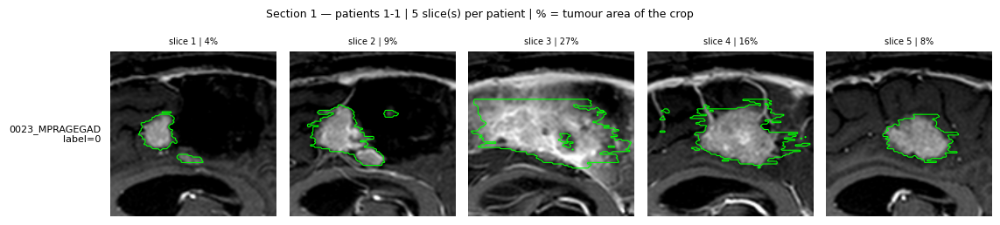

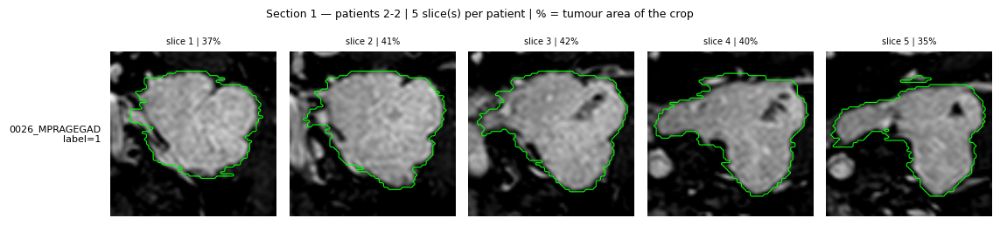

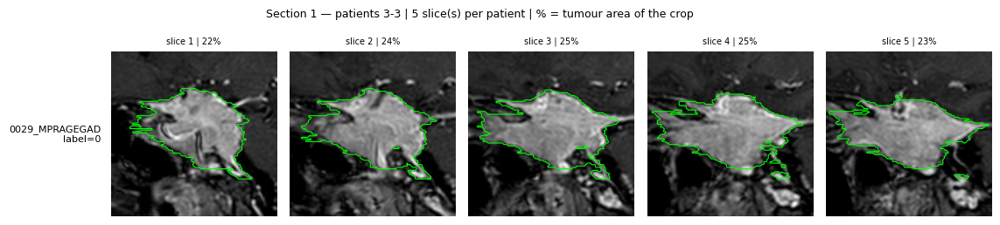

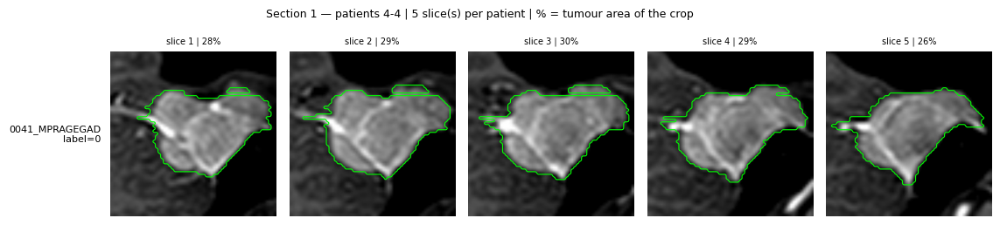

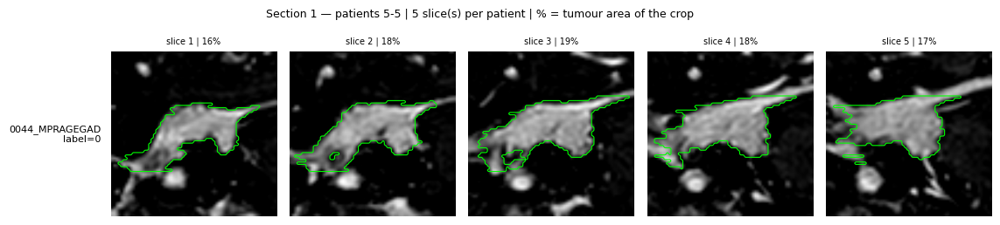

...

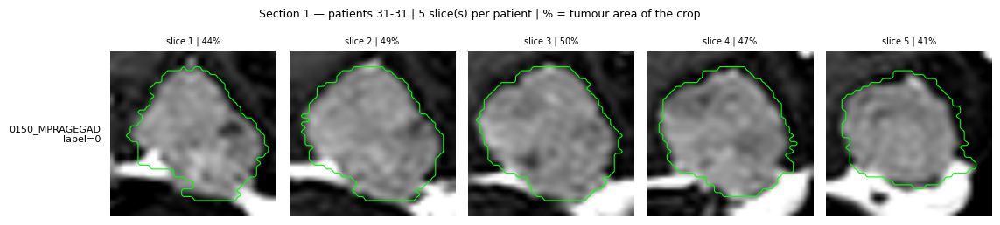

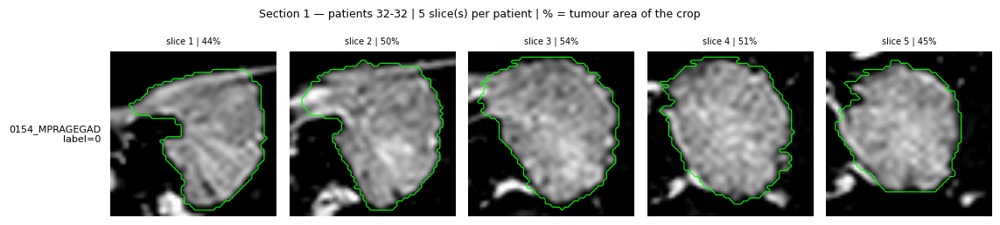

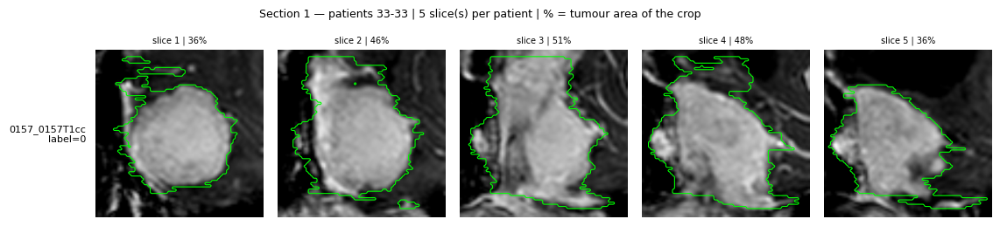

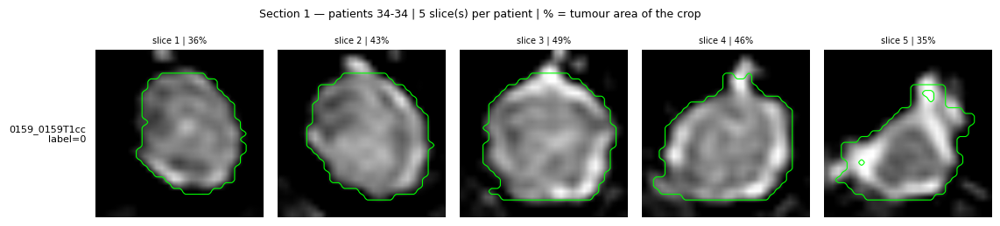

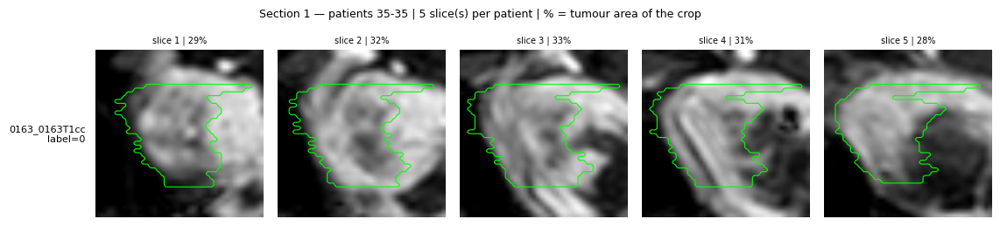

In [ ]:
# Section 1, cell 8: Visual check of analysed slices
if globals().get("RUN_FROZEN_CNN_E2E", True):
    # Renders the slices exactly as they reach the CNN: after tumour-centred cropping,
    # intensity normalisation and resampling to CNN_INPUT_SIZE. The green outline is the
    # segmentation carried in channel 2, so the crop framing can be judged directly.
    # Run this before committing to a long training run.
    import matplotlib.pyplot as plt

    def preview_analysed_slices(pairs, slice_fn, n_patients=QC_N_PATIENTS,
                                per_fig=QC_PATIENTS_PER_FIG, title=""):
        """Show the CNN input slices for the first n_patients.

        slice_fn(item) must return either a (S, 3, H, W) tensor or a
        (tensor, slice_rows) pair; channel 0 is the image and channel 2 the mask.
        """
        if not SHOW_ANALYSED_SLICES:
            print("[QC] Slice preview skipped (SHOW_ANALYSED_SLICES = False).")
            return
        items = list(pairs)[:int(n_patients)]
        if not items:
            print("[QC] No patients available to preview.")
            return

        for start in range(0, len(items), int(per_fig)):
            chunk = items[start:start + int(per_fig)]
            rendered = []
            for item in chunk:
                try:
                    out = slice_fn(item)
                    xs, meta = out if isinstance(out, tuple) else (out, None)
                    rendered.append((item, np.asarray(xs.detach().cpu().numpy()), meta))
                except Exception as exc:
                    print(f"[QC] {item.get('patient_id')}: could not render ({exc!r})")
            if not rendered:
                continue

            ncols = max(int(x.shape[0]) for _, x, _ in rendered)
            nrows = len(rendered)
            fig, axes = plt.subplots(nrows, ncols, figsize=(2.4 * ncols, 2.6 * nrows),
                                     squeeze=False)
            for r, (item, xs, meta) in enumerate(rendered):
                for c in range(ncols):
                    ax = axes[r][c]
                    ax.axis("off")
                    if c >= xs.shape[0]:
                        continue
                    img = xs[c, 0]
                    msk = xs[c, 2] if xs.shape[1] > 2 else None
                    ax.imshow(img, cmap="gray", vmin=0.0, vmax=1.0)
                    if msk is not None and float(msk.max()) > 0:
                        ax.contour(msk, levels=[0.5], colors="lime", linewidths=0.8)
                        frac = float((msk > 0.5).mean()) * 100.0
                    else:
                        frac = float("nan")
                    if meta is not None and c < len(meta):
                        off = meta[c].get("actual_offset_mm", meta[c].get("offset_mm"))
                        ax.set_title(f"{float(off):+.0f} mm | {frac:.0f}%", fontsize=7)
                    else:
                        ax.set_title(f"slice {c + 1} | {frac:.0f}%", fontsize=7)
                axes[r][0].text(-0.06, 0.5,
                                f"{item.get('patient_id')}\nlabel={item.get('label')}",
                                transform=axes[r][0].transAxes, fontsize=8,
                                va="center", ha="right")
            n_from = start + 1
            fig.suptitle(f"{title}patients {n_from}-{n_from + len(rendered) - 1} "
                         f"| {ncols} slice(s) per patient | % = tumour area of the crop",
                         fontsize=9)
            fig.tight_layout(rect=(0.04, 0, 1, 0.96))
            plt.show()
            plt.close(fig)


    # Run it on the first patients of the first active outcome definition.
    try:
        _qc_tag = ACTIVE_LABEL_CONFIGS[0]["tag"]
        _qc_pairs = attach_labels(raw_pairs, all_labels_dfs[_qc_tag])
        print(f"[QC] Section 1 input slices | outcome '{_qc_tag}' | "
              f"{int(N_SLICES)} slice(s) at {float(SLICE_SPACING_MM):g} mm spacing")
        preview_analysed_slices(
            _qc_pairs,
            lambda it: make_frozen_e2e_patient_slices(it["image"], it["mask"], out_size=CNN_INPUT_SIZE),
            title="Section 1 — ",
        )
    except Exception as _e:
        print("[QC] Slice preview unavailable:", repr(_e))


In [ ]:
# Section 1, cell 9: Backbone builders
if globals().get("RUN_FROZEN_CNN_E2E", True):

    def _make_timm_resnet10t_backbone() -> tuple:
        """Return (feature_net, feature_dim) for ResNet-10t, without head."""
        model = timm.create_model("resnet10t", pretrained=False, num_classes=0, global_pool="avg")
        dim = model.num_features
        return model, int(dim)

    def _make_torchvision_densenet121_backbone() -> tuple:
        """Return (feature_net, feature_dim) for DenseNet-121, without classifier."""
        net = tv_models.densenet121(weights=None)
        dim = net.classifier.in_features  # 1024
        net.classifier = nn.Identity()
        return net, int(dim)

    def _make_torchvision_resnet18_backbone() -> tuple:
        """Return (feature_net, feature_dim) for ResNet-18, without classifier."""
        net = tv_models.resnet18(weights=None)
        dim = net.fc.in_features  # 512
        net.fc = nn.Identity()  # keep global avg-pool, drop the 1000-way head
        return net, int(dim)

    def _make_torchvision_resnet50_backbone() -> tuple:
        """Return (feature_net, feature_dim) for ResNet-50, without classifier."""
        net = tv_models.resnet50(weights=None)
        dim = net.fc.in_features  # 2048
        net.fc = nn.Identity()  # keep global avg-pool, drop the 1000-way head
        return net, int(dim)


    def load_radimagenet_weights(net, weights_path, architecture_name="RadImageNet backbone"):
        p = Path(weights_path) if weights_path else None
        if (p is None) or (not p.exists()):
            parent = p.parent if p is not None else Path(".")
            nearby = []
            if parent.exists():
                nearby = sorted([str(x) for x in parent.rglob("*.pt")][:20] + [str(x) for x in parent.rglob("*.pth")][:20])
            raise FileNotFoundError(
                f"{architecture_name} weights not found at the resolved path. "
                "If the file is visible in Drive, check that Cell 2 runs again after Drive mounts, "
                "and that the filename/folder matches exactly. "
                f"Looked at: {weights_path}. "
                f"Nearby .pt/.pth files under {parent}: {nearby[:20]}"
            )

        try:
            raw = torch.load(str(p), map_location="cpu", weights_only=False)
        except TypeError:
            raw = torch.load(str(p), map_location="cpu")

        def _unwrap_state_dict(obj):
            """Find the actual tensor state_dict inside common checkpoint wrappers."""
            if hasattr(obj, "state_dict"):
                obj = obj.state_dict()
            if not isinstance(obj, dict):
                return obj, "<non-dict checkpoint>"

            # Already a state_dict.
            tensor_like_values = [v for v in obj.values() if torch.is_tensor(v)]
            if len(tensor_like_values) >= 10:
                return obj, "<top-level>"

            for key in (
                "state_dict", "model_state_dict", "model", "net", "network",
                "backbone", "encoder", "weights", "params", "module",
                "model_weights", "weight", "pretrained_dict",
            ):
                if key in obj:
                    nested, where = _unwrap_state_dict(obj[key])
                    if isinstance(nested, dict):
                        return nested, key if where == "<top-level>" else f"{key}.{where}"
            return obj, "<dict without tensor state_dict>"

        sd, sd_location = _unwrap_state_dict(raw)
        if not isinstance(sd, dict):
            raise RuntimeError(
                f"{architecture_name} checkpoint at {p} did not contain a PyTorch state_dict. "
                f"Loaded object type: {type(sd)}"
            )

        current = net.state_dict()
        loadable = {}

        import re as _re

        def _densenet_legacy(key):
            """Convert older torchvision DenseNet keys (norm.N/conv.N) to modern (normN/convN).

            torchvision below ~0.12 serialised dense-layer sub-modules as Sequential
            children, e.g. features.denseblock1.denselayer1.norm.1.weight against the
            modern ...norm1.weight. Pass 1 finds no matches on such a checkpoint.
            """
            key = _re.sub(r'\.norm\.(\d+)', r'.norm\1', key)
            key = _re.sub(r'\.conv\.(\d+)', r'.conv\1', key)
            return key

        def candidate_keys(key):
            # Try the key as-is, then strip known wrapper prefixes only. The
            # torchvision DenseNet "features." prefix is genuine and is kept.
            candidates = []
            seen = set()
            queue = [key]
            prefixes = (
                "module.", "backbone.", "model.", "encoder.", "resnet.",
                "base_model.", "feature_extractor.", "network.", "net.",
                "densenet.", "inception.", "inception_v3.",
                "0.", "1.", "2.", "3.",   # nn.Sequential / numeric-index wrappers
                "_orig_mod.",             # torch.compile saves with this prefix (e.g. ResNet-18)
            )
            while queue:
                cur = queue.pop(0)
                if cur not in seen:
                    seen.add(cur)
                    candidates.append(cur)
                    for pre in prefixes:
                        if cur.startswith(pre):
                            stripped = cur[len(pre):]
                            if stripped not in seen:
                                queue.append(stripped)
            return candidates

        _HEAD_PREFIXES = ("fc.", "classifier.", "AuxLogits.fc.")
        _pass3_rescued = 0  # initialised here; may be updated in Pass 3 below

        tensor_items = []
        non_tensor_keys = []
        for k, v in sd.items():
            if not torch.is_tensor(v):
                non_tensor_keys.append(str(k))
                continue
            tensor_items.append((str(k), v))
            for nk in candidate_keys(str(k)):
                if nk.startswith(_HEAD_PREFIXES):
                    continue
                if nk in current and tuple(current[nk].shape) == tuple(v.shape):
                    loadable[nk] = v
                    break

        # Pass 2 — older DenseNet key names: "norm.1"/"conv.1" -> "norm1"/"conv1".
        # Runs for DenseNet, or whenever pass 1 matched fewer than five tensors.
        _arch_lower = architecture_name.lower()
        if "densenet" in _arch_lower or len(loadable) < 5:
            _matched_so_far = set(loadable.keys())
            for k, v in tensor_items:
                modern_k = _densenet_legacy(k)
                if modern_k == k:
                    continue  # key unchanged; already tried in pass 1
                for nk in candidate_keys(modern_k):
                    if nk.startswith(_HEAD_PREFIXES) or nk in _matched_so_far:
                        continue
                    if nk in current and tuple(current[nk].shape) == tuple(v.shape):
                        loadable[nk] = v
                        _matched_so_far.add(nk)
                        break

        # Pass 3 — sequential wrappers. RadImageNet checkpoints saved through an
        # nn.Sequential('backbone') use backbone.N.subkey instead of named keys, e.g.
        # ResNet-50 backbone.0.weight -> conv1.weight, DenseNet-121 backbone.0.conv0.weight
        # -> features.conv0.weight. Keys are remapped, then matching is retried.
        _inception_had_aux = False  # default; set precisely in Pass 3 if needed
        _pass3_rescued = 0
        if len(loadable) < 5:
            _matched_so_far = set(loadable.keys())
            _ckpt_keys = [k for k, _ in tensor_items]
            _uses_backbone_prefix = any(k.startswith("backbone.") for k in _ckpt_keys)

            # InceptionV3 variant is identified by the largest backbone.N index:
            #   max_idx <= 17  no AuxLogits, backbone.15/16/17 = Mixed_7a/7b/7c
            #   max_idx >= 18  AuxLogits present, 15 = AuxLogits, 16/17/18 = Mixed_7a/7b/7c
            # Each variant needs its own map. Using the wrong one either leaves 54 tensors
            # unmatched or, because Mixed_7b and Mixed_7c share shapes, loads them into the
            # wrong block; the load-fraction check below catches both.
            _inception_had_aux = False
            if _uses_backbone_prefix and "inception" in _arch_lower:
                _bb_idxs = {
                    int(_m.group(1)) for _k in _ckpt_keys
                    for _m in [_re.match(r"backbone\.(\d+)\.", _k)] if _m
                }
                _inception_had_aux = max(_bb_idxs, default=0) >= 18

            def _normalize_key(k):
                if not _uses_backbone_prefix:
                    return k
                if "densenet" in _arch_lower:
                    if k.startswith("backbone.0."):
                        return "features." + k[len("backbone.0."):]
                elif "inception" in _arch_lower:
                    _imap = {
                        "backbone.0.":  "Conv2d_1a_3x3.", "backbone.1.":  "Conv2d_2a_3x3.",
                        "backbone.2.":  "Conv2d_2b_3x3.",
                        "backbone.4.":  "Conv2d_3b_1x1.", "backbone.5.":  "Conv2d_4a_3x3.",
                        "backbone.7.":  "Mixed_5b.",       "backbone.8.":  "Mixed_5c.",
                        "backbone.9.":  "Mixed_5d.",       "backbone.10.": "Mixed_6a.",
                        "backbone.11.": "Mixed_6b.",       "backbone.12.": "Mixed_6c.",
                        "backbone.13.": "Mixed_6d.",       "backbone.14.": "Mixed_6e.",
                    }
                    if _inception_had_aux:
                        # AuxLogits present (max index >= 18).
                        _imap.update({
                            "backbone.15.": "AuxLogits.",
                            "backbone.16.": "Mixed_7a.",
                            "backbone.17.": "Mixed_7b.",
                            "backbone.18.": "Mixed_7c.",
                        })
                    else:
                        # No AuxLogits (max index <= 17).
                        _imap.update({
                            "backbone.15.": "Mixed_7a.",
                            "backbone.16.": "Mixed_7b.",
                            "backbone.17.": "Mixed_7c.",
                        })
                    for old, dst in _imap.items():
                        if k.startswith(old):
                            return dst + k[len(old):]
                else:  # resnet-50 / resnet-18 / resnet-10t
                    # backbone.N indexes the top-level ResNet children: 0=conv1, 1=bn1,
                    # 4..7=layer1..4. Activations and pooling carry no parameters and are
                    # absent from the checkpoint. The ResNet-10t stem sits inside child 0 as
                    # a conv1 sequence, so the same map applies with the inner index kept.
                    _rmap = {
                        "backbone.0.": "conv1.", "backbone.1.": "bn1.",
                        "backbone.4.": "layer1.", "backbone.5.": "layer2.",
                        "backbone.6.": "layer3.", "backbone.7.": "layer4.",
                    }
                    for old, dst in _rmap.items():
                        if k.startswith(old):
                            return dst + k[len(old):]
                return k

            for orig_k, v in tensor_items:
                norm_k = _normalize_key(orig_k)
                for nk in candidate_keys(norm_k):
                    if nk.startswith(_HEAD_PREFIXES) or nk in _matched_so_far:
                        continue
                    if nk in current and tuple(current[nk].shape) == tuple(v.shape):
                        loadable[nk] = v
                        _matched_so_far.add(nk)
                        _pass3_rescued += 1
                        break

            if _pass3_rescued:
                print(f"[RadImageNet] Pass 3 (sequential-backbone remapping) rescued {_pass3_rescued} tensors")

        sample_ckpt = [(k, tuple(v.shape)) for k, v in tensor_items[:12]]
        sample_expected = [(k, tuple(v.shape)) for k, v in list(current.items())[:12]]

        print(f"[RadImageNet] {architecture_name}: checkpoint={p.name} | state_dict_location={sd_location}")
        print(f"[RadImageNet] tensor keys in checkpoint: {len(tensor_items)} | non-tensor keys: {len(non_tensor_keys)}")
        print(f"[RadImageNet] sample checkpoint keys: {sample_ckpt}")
        print(f"[RadImageNet] sample expected torchvision keys: {sample_expected}")

        if len(loadable) == 0:
            raise RuntimeError(
                f"{architecture_name} loaded 0 compatible tensors from {p}. "
                "This usually means the checkpoint key names do not match the torchvision "
                "architecture expected for this backbone.\n"
                "Common causes:\n"
                "  • Wrong .pt file (e.g. ResNet50 file used for DenseNet121).\n"
                "  • DenseNet saved with old torchvision (<0.12): norm.1/conv.1 vs norm1/conv1 "
                "(pass 2 should have fixed this automatically — if you still see this, the file "
                "may not be a torchvision DenseNet at all).\n"
                "  • InceptionV3 checkpoint from a custom/non-torchvision implementation.\n"
                "  • Checkpoint is a full Keras/TF model, not a PyTorch state_dict.\n"
                "Inspect the sample checkpoint keys printed above vs. the expected torchvision keys "
                "and add an architecture-specific key-conversion pass if needed."
            )

        missing, unexpected = net.load_state_dict(loadable, strict=False)
        _used_legacy = ("densenet" in architecture_name.lower() or len(loadable) < 5) and any(
            _densenet_legacy(k) != k for k, _ in tensor_items
        )
        _strategy = ("densenet_legacy_keys" if _used_legacy
                     else "sequential_backbone_remapping" if _pass3_rescued
                     else "standard")
        print(f"[RadImageNet] {architecture_name}: loaded {len(loadable)}/{len(current)} compatible "
              f"backbone tensors from {p.name} (strategy={_strategy})")

        # ── Load completeness ──────────────────────────────────────────────────────
        # Counting the target model's non-head tensors gives an exact load fraction for
        # every architecture, so the incomplete-load warning stays meaningful.
        _n_expected = len([k for k in current if not k.startswith(_HEAD_PREFIXES)])
        _load_frac = len(loadable) / max(1, _n_expected)
        if _load_frac < 0.80:
            print(
                f"[RadImageNet][warning] {architecture_name}: loaded {len(loadable)}/{_n_expected} "
                f"expected tensors ({_load_frac:.0%}). A healthy load is typically >90%. "
                "Inspect the sample keys above for a naming mismatch."
            )

        # ── Strict InceptionV3 check ──────────────────────────────────────────────
        # Key order alone cannot confirm the pass-3 index map, and equal shapes can hide a
        # wrong assignment. A wrong map leaves target slots empty, so the load fraction
        # falls; a correct load fills all 94 convolution blocks and ~98% of non-head slots,
        # the remainder being the auxiliary branch. Anything below 0.95 raises.
        if "inception" in _arch_lower:
            _bb_indices = sorted({
                int(_m.group(1)) for _k, _ in tensor_items
                for _m in [_re.match(r"backbone\.(\d+)\.", _k)] if _m
            })
            print(f"[RadImageNet] {architecture_name}: checkpoint backbone.N block "
                  f"indices present: {_bb_indices} | inferred aux_logits_when_saved={_inception_had_aux}")
            if _load_frac < 0.95:
                raise RuntimeError(
                    f"[RadImageNet][FATAL] {architecture_name}: loaded only "
                    f"{len(loadable)}/{_n_expected} non-head tensors ({_load_frac:.0%}); "
                    "a correct InceptionV3 load is ~98%. A partial load means the "
                    "backbone.N -> torchvision index map (Pass 3) does not match this "
                    "checkpoint's Sequential order, which risks silently loading weights "
                    "into the WRONG Inception block. "
                    f"Observed backbone.N indices: {_bb_indices}. "
                    "Validate them against the torchvision inception_v3 child order "
                    "(Conv2d_1a/2a/2b, [maxpool], Conv2d_3b/4a, [maxpool], "
                    "Mixed_5b/5c/5d/6a/6b/6c/6d/6e, [AuxLogits], Mixed_7a/7b/7c) and "
                    "correct the _imap in Pass 3 before trusting InceptionV3 features."
                )

        # ── BatchNorm statistics ──────────────────────────────────────────────────
        # A missing running_mean/running_var makes eval() fall back to mean 0, variance 1
        # for that layer, which silently corrupts the features.
        _bn_expected_keys = [k for k in current if k.endswith((".running_mean", ".running_var"))]
        _bn_missing_keys  = [k for k in missing  if k.endswith((".running_mean", ".running_var"))]
        if _bn_missing_keys:
            _bn_frac = len(_bn_missing_keys) / max(1, len(_bn_expected_keys))
            if _bn_frac > 0.5:
                raise RuntimeError(
                    f"[RadImageNet][FATAL] {architecture_name}: "
                    f"{len(_bn_missing_keys)}/{len(_bn_expected_keys)} BatchNorm "
                    "running_mean/running_var buffers MISSING from checkpoint. "
                    "In eval() mode every BN layer normalises with mean=0/var=1, "
                    "producing silently invalid features. The checkpoint likely stores "
                    "only learnable parameters (conv weights + BN scale/bias) without "
                    "running statistics. "
                    f"Sample missing BN keys: {_bn_missing_keys[:4]}"
                )
            print(
                f"[RadImageNet][warning] {architecture_name}: "
                f"{len(_bn_missing_keys)}/{len(_bn_expected_keys)} BN running buffers "
                "missing — those layers use default statistics in eval() mode."
            )
        else:
            print(
                f"[RadImageNet] {architecture_name}: all "
                f"{len(_bn_expected_keys)} BN running buffers loaded OK."
            )
        return net


    # CPU cache of the original pretrained weights. Every fold builds a fresh model from
    # these same starting weights, so no learned weights, BatchNorm statistics or optimiser
    # state from one fold could influence another fold. Each checkpoint is read and remapped only once.
    _BACKBONE_SD_CACHE = {}
    _BACKBONE_META_CACHE = {}


    def _clone_state_dict_to_cpu(module: nn.Module):
        """Create a separate CPU copy of the model weights."""
        return {
            key: value.detach().cpu().clone()
            for key, value in module.state_dict().items()
        }


    def _build_imagenet_architecture(backbone_name: str, pretrained: bool):
        """Build an ImageNet model and optionally load pretrained weights."""
        name = str(backbone_name).lower()

        if name == "imagenet_resnet10t":
            net = timm.create_model(
                "resnet10t",
                pretrained=bool(pretrained),
                num_classes=0,
                global_pool="avg",
            )
            return net, int(net.num_features)

        def _torchvision_model(factory):
            if pretrained:
                try:
                    return factory(weights="DEFAULT")
                except TypeError:
                    return factory(pretrained=True)
            try:
                return factory(weights=None)
            except TypeError:
                return factory(pretrained=False)

        if name == "imagenet_resnet18":
            net = _torchvision_model(tv_models.resnet18)
            dim = int(net.fc.in_features)
            net.fc = nn.Identity()
        elif name == "imagenet_resnet50":
            net = _torchvision_model(tv_models.resnet50)
            dim = int(net.fc.in_features)
            net.fc = nn.Identity()
        elif name == "imagenet_densenet121":
            net = _torchvision_model(tv_models.densenet121)
            dim = int(net.classifier.in_features)
            net.classifier = nn.Identity()
        else:
            raise ValueError(f"Unknown ImageNet backbone: {backbone_name!r}")

        return net, dim


    def build_feature_backbone(backbone_name: str):
        """
        Return a fresh (backbone_nn_module, feature_dim, norm_mode).

        Every call returns a newly constructed model object. The model starts from
        the same pristine pretrained weights held in _BACKBONE_SD_CACHE, so folds
        remain independent without repeating remote downloads or Drive checkpoint
        remapping.
        """
        name = str(backbone_name).lower()

        imagenet_names = {
            "imagenet_resnet10t",
            "imagenet_resnet18",
            "imagenet_resnet50",
            "imagenet_densenet121",
        }

        if name in imagenet_names:
            if name not in _BACKBONE_SD_CACHE:
                # Only the first call touches the network; later ones hit the disk cache.
                net, dim = _build_imagenet_architecture(name, pretrained=True)
                _BACKBONE_SD_CACHE[name] = _clone_state_dict_to_cpu(net)
                _BACKBONE_META_CACHE[name] = {
                    "feature_dim": int(dim),
                    "norm": "imagenet",
                    "source": "ImageNet pretrained",
                }
                print(
                    f"[ImageNet cache primed] {name}: pretrained weights loaded once "
                    f"| feature_dim={dim}"
                )
            else:
                # Architecture only: no download, no network access.
                net, dim = _build_imagenet_architecture(name, pretrained=False)
                net.load_state_dict(_BACKBONE_SD_CACHE[name], strict=True)

            meta = _BACKBONE_META_CACHE[name]
            return net, int(meta["feature_dim"]), str(meta["norm"])

        if name == "radimagenet_resnet10t":
            net, dim = _make_timm_resnet10t_backbone()
            weights_path, label = RADIMAGENET_RESNET10T_WEIGHTS_PATH, "RadImageNet ResNet-10t"
        elif name == "radimagenet_resnet18":
            net, dim = _make_torchvision_resnet18_backbone()
            weights_path, label = RADIMAGENET_RESNET18_WEIGHTS_PATH, "RadImageNet ResNet-18"
        elif name == "radimagenet_resnet50":
            net, dim = _make_torchvision_resnet50_backbone()
            weights_path, label = RADIMAGENET_RESNET50_WEIGHTS_PATH, "RadImageNet ResNet-50"
        elif name == "radimagenet_densenet121":
            net, dim = _make_torchvision_densenet121_backbone()
            weights_path, label = RADIMAGENET_DENSENET121_WEIGHTS_PATH, "RadImageNet DenseNet-121"
        else:
            raise ValueError(f"Unknown backbone: {backbone_name!r}")

        if name not in _BACKBONE_SD_CACHE:
            net = load_radimagenet_weights(net, weights_path, label)
            _BACKBONE_SD_CACHE[name] = _clone_state_dict_to_cpu(net)
            _BACKBONE_META_CACHE[name] = {
                "feature_dim": int(dim),
                "norm": radimagenet_norm_for(name),
                "source": label,
            }
            print(
                f"[RadImageNet cache primed] {name}: checkpoint read/remapped once "
                f"| feature_dim={dim}"
            )
        else:
            net.load_state_dict(_BACKBONE_SD_CACHE[name], strict=True)

        meta = _BACKBONE_META_CACHE[name]
        return net, int(meta["feature_dim"]), str(meta["norm"])


    def prime_backbone_initial_state(backbone_name: str):
        """
        Load/download one backbone before CV begins, then discard the temporary model.

        This makes any network/download problem occur once at a clearly labelled
        preflight step instead of appearing to freeze in the middle of fold 1.
        """
        name = str(backbone_name).lower()
        if name in _BACKBONE_SD_CACHE:
            return

        print(f"\n[backbone setup] Preparing original starting weights for: {name}")
        temporary_model, feature_dim, norm_mode = build_feature_backbone(name)
        del temporary_model
        if torch.cuda.is_available():
            torch.cuda.empty_cache()
        print(
            f"[backbone setup complete] {name} | feature_dim={feature_dim} "
            f"| norm={norm_mode} | all folds use the CPU weight cache"
        )

    def freeze_backbone(net: nn.Module):
        for p in net.parameters():
            p.requires_grad = False


In [ ]:
# Section 1, cell 10: Multi-slice classifier
if globals().get("RUN_FROZEN_CNN_E2E", True):

    class MultiSliceCNNClassifier(nn.Module):
        """
        Wraps a CNN backbone with a binary classification head.
        Input: (B, S, 3, H, W)  — S slices per patient
        Output: (B,)             — raw logits (use BCEWithLogitsLoss)

        All S slices are pushed through the shared backbone;
        features are mean-pooled across slices before the head.
        """
        def __init__(self, backbone: nn.Module, feature_dim: int, dropout: float = 0.5):
            super().__init__()
            self.backbone = backbone
            self.head = nn.Sequential(
                nn.BatchNorm1d(feature_dim),
                nn.Dropout(dropout),
                nn.Linear(feature_dim, 1),
            )

        def forward(self, x: torch.Tensor, slice_mask: torch.Tensor = None) -> torch.Tensor:
            # x: (B, S, 3, H, W). slice_mask: (B, S) True for real slices, False for padding.
            B, S, C, H, W = x.shape
            # Flatten batch × slice for efficient backbone pass
            feats = self.backbone(x.view(B * S, C, H, W))  # (B*S, D)
            # Reduce spatial feature maps (e.g. DenseNet) to vectors.
            if feats.dim() > 2:
                feats = F.adaptive_avg_pool2d(feats, 1).flatten(1)
            feats = feats.view(B, S, -1)
            # Mean over real slices only, so a patient with three tumour slices weights
            # each of them 1/3 rather than diluting them with padded slots.
            if slice_mask is None:
                feats = feats.mean(dim=1)                     # (B, D)
            else:
                m = slice_mask.to(feats.dtype).unsqueeze(-1)  # (B, S, 1)
                feats = (feats * m).sum(dim=1) / m.sum(dim=1).clamp(min=1.0)
            return self.head(feats).squeeze(-1)              # (B,)


    def build_classifier(backbone_name: str, dropout: float = DROPOUT):
        backbone, feat_dim, norm = build_feature_backbone(backbone_name)
        model = MultiSliceCNNClassifier(backbone, feat_dim, dropout=dropout)
        freeze_backbone(model.backbone)
        print(f"Built classifier | backbone={backbone_name} | feature_dim={feat_dim} | norm={norm}")
        n_trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
        print(f"  Trainable parameters (head only): {n_trainable:,}")
        return model, feat_dim, norm


In [ ]:
# Section 1, cell 11: Training and evaluation utilities
if globals().get("RUN_FROZEN_CNN_E2E", True):

    def compute_pos_weight(labels: list):
        """BCEWithLogitsLoss pos_weight for class imbalance, controlled by the Cell-2 config.

        Returns None when USE_POS_WEIGHT is False (unweighted loss). Otherwise returns
        (n_neg / n_pos) * POS_WEIGHT_SCALE so the weighting strength can be tuned.
        """
        if not USE_POS_WEIGHT:
            return None
        arr = np.array(labels)
        n_pos = arr.sum()
        n_neg = len(arr) - n_pos
        pw = (float(n_neg) / max(float(n_pos), 1.0)) * float(POS_WEIGHT_SCALE)
        return torch.tensor([pw], device=device)


    def pad_slices_collate(batch):
        """Collate patients whose slice counts differ.

        Each patient contributes (S_i, 3, H, W) with S_i = its number of tumour-bearing
        slices. The batch is padded to max(S_i) by repeating that patient's last real
        slice, and a boolean mask marks which slots are real. Padding with a real slice
        rather than zeros keeps the backbone's BatchNorm inputs in-distribution; the mask
        then excludes those slots from pooling, so they cannot affect the patient feature.
        """
        xs_list, ys = zip(*batch)
        s_max = max(int(x.shape[0]) for x in xs_list)
        B = len(xs_list)
        C_, H_, W_ = xs_list[0].shape[1:]
        out = xs_list[0].new_zeros((B, s_max, C_, H_, W_))
        mask = torch.zeros((B, s_max), dtype=torch.bool)
        for i, x in enumerate(xs_list):
            s = int(x.shape[0])
            out[i, :s] = x
            mask[i, :s] = True
            if s < s_max:
                out[i, s:] = x[-1:].expand(s_max - s, -1, -1, -1)
        return out, mask, torch.stack(ys)


    def make_dataloader(pairs: list, input_size: int, augment: bool, batch_size: int,
                        norm: str = "imagenet") -> DataLoader:
        ds = SliceDataset(pairs, input_size=input_size, augment=augment, norm=norm)
        # drop_last avoids a final training batch of size 1, which the head BatchNorm1d
        # cannot handle; never applied to val/test so every case is scored.
        drop_last = augment and (len(ds) > batch_size)
        # num_workers=0 keeps the slice cache in-process; the dataset is fully cached
        # after epoch 1, so workers would add overhead.
        return DataLoader(
            ds, batch_size=batch_size, shuffle=augment,
            num_workers=0, pin_memory=torch.cuda.is_available(), drop_last=drop_last,
            collate_fn=pad_slices_collate,
        )


    def train_one_epoch(model, loader, optimiser, criterion):
        model.train()
        # Backbone BatchNorm stays in eval mode so the pretrained running statistics are
        # used rather than overwritten by small-batch estimates. The head, including its
        # BatchNorm1d, stays in train mode.
        model.backbone.eval()
        total_loss, all_logits, all_labels = 0.0, [], []
        for xs, slice_mask, ys in loader:
            xs, slice_mask, ys = xs.to(device), slice_mask.to(device), ys.to(device)
            optimiser.zero_grad()
            logits = model(xs, slice_mask)
            loss   = criterion(logits, ys)
            loss.backward()
            nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
            optimiser.step()
            total_loss += loss.item() * len(ys)
            all_logits.extend(logits.detach().cpu().tolist())
            all_labels.extend(ys.cpu().tolist())
        mean_loss = total_loss / max(len(all_labels), 1)
        try:
            auc = roc_auc_score(all_labels, all_logits)
        except Exception:
            auc = float("nan")
        return mean_loss, auc


    # ── Holdout AUC confidence intervals ───────────────────────────────────────
    # Three patient-level estimates: DeLong analytic, delete-one jackknife, and a
    # stratified nonparametric bootstrap percentile interval. All three read the saved
    # holdout labels and scores without retraining. The bootstrap resamples within class
    # so every replicate contains both classes.
    AUC_CI_CONFIDENCE = 0.95
    AUC_BOOTSTRAP_REPEATS = 2000


    def _prepare_auc_inputs(y_true, y_score):
        """Return valid one-dimensional labels and scores for AUC calculations."""
        y_true = np.asarray(y_true, dtype=int).ravel()
        y_score = np.asarray(y_score, dtype=float).ravel()

        valid = np.isfinite(y_true) & np.isfinite(y_score)
        y_true = y_true[valid]
        y_score = y_score[valid]

        if y_true.size == 0 or y_true.size != y_score.size:
            raise ValueError("AUC requires equal non-empty label and score arrays.")
        if not np.all(np.isin(y_true, [0, 1])):
            raise ValueError("AUC labels must contain only 0 and 1.")
        if np.unique(y_true).size != 2:
            raise ValueError("AUC requires both outcome classes.")

        return y_true, y_score


    def format_auc_with_ci(auc, ci_lower, ci_upper) -> str:
        """Format AUC and a two-sided confidence interval."""
        values = np.asarray([auc, ci_lower, ci_upper], dtype=float)
        if not np.all(np.isfinite(values)):
            return "nan"
        return f"{float(auc):.3f} ({float(ci_lower):.3f}–{float(ci_upper):.3f})"


    def delong_auc_ci(y_true, y_score, confidence: float = AUC_CI_CONFIDENCE):
        """
        Calculate AUC and a two-sided DeLong confidence interval.

        This is the single-model DeLong variance estimate. It uses pairwise
        comparisons between positive and negative test scores and a normal
        approximation for the confidence limits.
        """
        from statistics import NormalDist

        try:
            y_true, y_score = _prepare_auc_inputs(y_true, y_score)
        except ValueError:
            nan = float("nan")
            return nan, nan, nan

        positive_scores = y_score[y_true == 1]
        negative_scores = y_score[y_true == 0]
        n_positive = positive_scores.size
        n_negative = negative_scores.size

        if n_positive < 2 or n_negative < 2:
            nan = float("nan")
            return nan, nan, nan

        comparisons = (
            (positive_scores[:, None] > negative_scores[None, :]).astype(float)
            + 0.5 * (positive_scores[:, None] == negative_scores[None, :]).astype(float)
        )

        positive_placements = comparisons.mean(axis=1)
        negative_placements = comparisons.mean(axis=0)
        auc = float(positive_placements.mean())

        variance = (
            np.var(positive_placements, ddof=1) / n_positive
            + np.var(negative_placements, ddof=1) / n_negative
        )
        standard_error = float(np.sqrt(max(float(variance), 0.0)))

        alpha = 1.0 - float(confidence)
        z_value = NormalDist().inv_cdf(1.0 - alpha / 2.0)
        lower = max(0.0, auc - z_value * standard_error)
        upper = min(1.0, auc + z_value * standard_error)
        return auc, float(lower), float(upper)


    def jackknife_auc_ci(y_true, y_score, confidence: float = AUC_CI_CONFIDENCE):
        """
        Calculate a delete-one jackknife confidence interval for AUC.

        The function removes one test patient at a time. The CI uses the standard
        jackknife standard error with a normal approximation. It also returns the
        lowest and highest leave-one-out AUC values.
        """
        from statistics import NormalDist

        try:
            y_true, y_score = _prepare_auc_inputs(y_true, y_score)
        except ValueError:
            nan = float("nan")
            return nan, nan, nan, nan, nan

        observed_auc = float(roc_auc_score(y_true, y_score))
        n_patients = y_true.size
        leave_one_out_aucs = []

        for patient_index in range(n_patients):
            keep = np.ones(n_patients, dtype=bool)
            keep[patient_index] = False

            # Undefined if deleting a patient leaves one class.
            if np.unique(y_true[keep]).size != 2:
                continue

            leave_one_out_aucs.append(
                float(roc_auc_score(y_true[keep], y_score[keep]))
            )

        leave_one_out_aucs = np.asarray(leave_one_out_aucs, dtype=float)
        if leave_one_out_aucs.size < 2:
            nan = float("nan")
            return observed_auc, nan, nan, nan, nan

        jackknife_mean = float(leave_one_out_aucs.mean())
        jackknife_se = float(
            np.sqrt(
                ((leave_one_out_aucs.size - 1.0) / leave_one_out_aucs.size)
                * np.sum((leave_one_out_aucs - jackknife_mean) ** 2)
            )
        )

        alpha = 1.0 - float(confidence)
        z_value = NormalDist().inv_cdf(1.0 - alpha / 2.0)
        lower = max(0.0, observed_auc - z_value * jackknife_se)
        upper = min(1.0, observed_auc + z_value * jackknife_se)

        return (
            observed_auc,
            float(lower),
            float(upper),
            float(np.min(leave_one_out_aucs)),
            float(np.max(leave_one_out_aucs)),
        )


    def bootstrap_auc_ci(
        y_true,
        y_score,
        confidence: float = AUC_CI_CONFIDENCE,
        n_bootstrap: int = AUC_BOOTSTRAP_REPEATS,
        random_state: int = GLOBAL_SEED,
    ):
        """
        Calculate a stratified nonparametric patient-level bootstrap CI for AUC.

        Positive and negative patients are independently sampled with replacement,
        preserving the original class counts in every replicate. The CI is the
        percentile interval across bootstrap AUC values.
        """
        try:
            y_true, y_score = _prepare_auc_inputs(y_true, y_score)
        except ValueError:
            nan = float("nan")
            return nan, nan, nan, 0

        observed_auc = float(roc_auc_score(y_true, y_score))
        pos_idx = np.flatnonzero(y_true == 1)
        neg_idx = np.flatnonzero(y_true == 0)

        if pos_idx.size < 1 or neg_idx.size < 1 or int(n_bootstrap) < 2:
            nan = float("nan")
            return observed_auc, nan, nan, 0

        rng = np.random.default_rng(int(random_state))
        aucs = np.empty(int(n_bootstrap), dtype=float)

        for b in range(int(n_bootstrap)):
            sample_pos = rng.choice(pos_idx, size=pos_idx.size, replace=True)
            sample_neg = rng.choice(neg_idx, size=neg_idx.size, replace=True)
            sample_idx = np.concatenate([sample_pos, sample_neg])
            aucs[b] = roc_auc_score(y_true[sample_idx], y_score[sample_idx])

        alpha = 1.0 - float(confidence)
        lower = float(np.quantile(aucs, alpha / 2.0))
        upper = float(np.quantile(aucs, 1.0 - alpha / 2.0))
        return observed_auc, lower, upper, int(aucs.size)


    def calculate_auc_intervals(y_true, y_score, confidence: float = AUC_CI_CONFIDENCE):
        """
        Return AUC plus DeLong, delete-one Jackknife and patient-level Bootstrap CIs.
        """
        auc, delong_lower, delong_upper = delong_auc_ci(
            y_true,
            y_score,
            confidence=confidence,
        )
        (
            jackknife_auc,
            jackknife_lower,
            jackknife_upper,
            jackknife_min,
            jackknife_max,
        ) = jackknife_auc_ci(
            y_true,
            y_score,
            confidence=confidence,
        )
        (
            bootstrap_auc,
            bootstrap_lower,
            bootstrap_upper,
            bootstrap_repeats,
        ) = bootstrap_auc_ci(
            y_true,
            y_score,
            confidence=confidence,
        )

        # All three estimate the same observed AUC; take DeLong's, else jackknife,
        # else bootstrap.
        if not np.isfinite(auc):
            auc = jackknife_auc
        if not np.isfinite(auc):
            auc = bootstrap_auc

        return {
            "AUC": float(auc),
            "DeLong_CI_lower": float(delong_lower),
            "DeLong_CI_upper": float(delong_upper),
            "AUC_with_DeLong_95CI": format_auc_with_ci(
                auc, delong_lower, delong_upper
            ),
            "Jackknife_CI_lower": float(jackknife_lower),
            "Jackknife_CI_upper": float(jackknife_upper),
            "AUC_with_Jackknife_95CI": format_auc_with_ci(
                auc, jackknife_lower, jackknife_upper
            ),
            "Jackknife_min_AUC": float(jackknife_min),
            "Jackknife_max_AUC": float(jackknife_max),
            "Bootstrap_CI_lower": float(bootstrap_lower),
            "Bootstrap_CI_upper": float(bootstrap_upper),
            "AUC_with_Bootstrap_95CI": format_auc_with_ci(
                auc, bootstrap_lower, bootstrap_upper
            ),
            "Bootstrap_repeats": int(bootstrap_repeats),
        }


    def optimal_threshold_youden(labels, probs):
        """
        Estimate a classification threshold by maximizing Youden's J.

        This helper is used on pooled development OOF predictions. The selected
        threshold is then frozen and applied unchanged to the untouched holdout test.
        """
        labels = np.asarray(labels, dtype=int).ravel()
        probs = np.asarray(probs, dtype=float).ravel()
        valid = np.isfinite(labels) & np.isfinite(probs)
        labels = labels[valid]
        probs = probs[valid]

        if labels.size == 0 or np.unique(labels).size != 2:
            return float(DECISION_THRESHOLD)

        scores = np.unique(probs)
        if scores.size > 1001:
            scores = np.unique(np.quantile(probs, np.linspace(0.0, 1.0, 1001)))

        if scores.size > 1:
            thresholds = (scores[:-1] + scores[1:]) / 2.0
            thresholds = np.r_[scores[0] - 1e-12, thresholds, scores[-1] + 1e-12]
        else:
            thresholds = np.array([scores[0]], dtype=float)

        best_t = float(thresholds[0])
        best_j = -np.inf
        for threshold in thresholds:
            preds = (probs >= threshold).astype(int)
            tn, fp, fn, tp = confusion_matrix(labels, preds, labels=[0, 1]).ravel()
            sensitivity = tp / (tp + fn) if (tp + fn) else 0.0
            specificity = tn / (tn + fp) if (tn + fp) else 0.0
            youden = sensitivity + specificity - 1.0
            if youden > best_j:
                best_j = youden
                best_t = float(threshold)

        return best_t


    def compute_binary_metrics(
        labels,
        probs,
        threshold: float = DECISION_THRESHOLD,
        threshold_source: str = "explicit classification threshold",
    ):
        labels = np.array(labels, dtype=int)
        probs = np.array(probs, dtype=float)
        threshold = float(threshold)
        preds = (probs >= threshold).astype(int)

        out = {
            "threshold": float(threshold),
            "threshold_source": str(threshold_source),
        }
        try:
            out["auc"] = roc_auc_score(labels, probs)
        except Exception:
            out["auc"] = float("nan")

        try:
            out["accuracy"] = accuracy_score(labels, preds)
            out["balacc"] = balanced_accuracy_score(labels, preds)
            out["f1"] = f1_score(labels, preds, zero_division=0)
            out["precision"] = precision_score(labels, preds, zero_division=0)
            out["sensitivity"] = recall_score(labels, preds, zero_division=0)
            out["mcc"] = matthews_corrcoef(labels, preds)
            out["brier"] = brier_score_loss(labels, probs)

            cm = confusion_matrix(labels, preds, labels=[0, 1])
            tn, fp, fn, tp = cm.ravel()
            out["specificity"] = tn / (tn + fp) if (tn + fp) > 0 else float("nan")
            out["tn"], out["fp"], out["fn"], out["tp"] = int(tn), int(fp), int(fn), int(tp)
        except Exception:
            for k in [
                "accuracy", "balacc", "f1", "precision", "sensitivity",
                "specificity", "mcc", "brier",
            ]:
                out[k] = float("nan")
            out["tn"] = out["fp"] = out["fn"] = out["tp"] = 0

        return out


    def compute_top_risk_binary_metrics(labels, probs, percentage=TOP_RISK_PERCENT):
        """Calculate classification metrics when the highest-risk percentage is positive."""
        threshold = threshold_for_top_risk(probs, percentage=percentage)
        return compute_binary_metrics(
            labels,
            probs,
            threshold=threshold,
            threshold_source=f"top {float(percentage):g}% risk scores in evaluated set",
        )


    @torch.no_grad()
    def evaluate(model, loader, threshold: float = DECISION_THRESHOLD):
        model.eval()
        all_logits, all_labels = [], []
        for xs, slice_mask, ys in loader:
            xs, slice_mask = xs.to(device), slice_mask.to(device)
            logits = model(xs, slice_mask).cpu()
            all_logits.extend(logits.tolist())
            all_labels.extend(ys.tolist())
        probs = torch.sigmoid(torch.tensor(all_logits)).numpy()
        labels = np.array(all_labels, dtype=int)
        metrics = compute_binary_metrics(
            labels,
            probs,
            threshold=threshold,
            threshold_source=f"fixed CNN threshold {float(threshold):g}",
        )
        metrics.update({"probs": probs, "labels": labels})
        return metrics


    def train_classifier(
        model: nn.Module,
        train_pairs: list,
        val_pairs: list,
        backbone_name: str,
        input_size: int = CNN_INPUT_SIZE,
        feat_dim: int = 512,
        norm: str = "imagenet",
    ):
        """
        Frozen-backbone CV training: train the classification head only.
        Returns best validation AUC, best model weights, and the epoch at which
        validation AUC was best. The fold-best epoch is later used for the
        development-set final-refit epoch vote.
        """
        train_loader = make_dataloader(train_pairs, input_size, augment=True,  batch_size=BATCH_SIZE, norm=norm)
        val_loader   = make_dataloader(val_pairs,   input_size, augment=False, batch_size=BATCH_SIZE, norm=norm)

        pos_weight = compute_pos_weight([p["label"] for p in train_pairs])
        criterion  = nn.BCEWithLogitsLoss(pos_weight=pos_weight)

        # -inf, not 0.0: a fold whose validation AUC is nan or exactly 0.0 must still be
        # able to set best_state, otherwise the model silently keeps its last-epoch weights.
        # np.isfinite() additionally prevents nan from winning.
        best_auc, patience_ctr = -np.inf, 0
        best_state = None
        best_epoch = None

        # ── Frozen backbone: head only ──────────────────────────────────────────
        opt_p1 = torch.optim.AdamW(
            filter(lambda p: p.requires_grad, model.parameters()),
            lr=LR_HEAD, weight_decay=WEIGHT_DECAY
        )
        sch_p1 = torch.optim.lr_scheduler.CosineAnnealingLR(opt_p1, T_max=EPOCHS_HEAD)

        print(f"  Frozen backbone — head only ({EPOCHS_HEAD} epochs)")
        for epoch in range(1, EPOCHS_HEAD + 1):
            tr_loss, tr_auc = train_one_epoch(model, train_loader, opt_p1, criterion)
            val_metrics     = evaluate(model, val_loader)
            sch_p1.step()

            val_auc = val_metrics["auc"]
            if np.isfinite(val_auc) and val_auc > best_auc:
                best_auc   = val_auc
                best_state = deepcopy(model.state_dict())
                best_epoch = int(epoch)
                patience_ctr = 0
            else:
                patience_ctr += 1

            print(f"    ep{epoch:02d}/{EPOCHS_HEAD} | loss={tr_loss:.4f}  tr_auc={tr_auc:.3f}  "
                  f"val_auc={val_auc:.3f}  val_balacc={val_metrics['balacc']:.3f}")

            if patience_ctr >= EARLY_STOP_PATIENCE:
                print(f"    Early stop (phase 1) at epoch {epoch}")
                break

        # Load the best weights.
        if best_state is not None:
            model.load_state_dict(best_state)
        else:
            # No epoch produced a usable validation AUC; report that rather than
            # returning the sentinel as a score.
            print("    [warning] no finite validation AUC in any epoch; "
                  "keeping last-epoch weights and reporting AUC=nan")
            best_auc = float("nan")
        return best_auc, best_state, best_epoch


    def train_classifier_fixed_budget(
        model: nn.Module,
        train_pairs: list,
        backbone_name: str,
        input_size: int = CNN_INPUT_SIZE,
        norm: str = "imagenet",
        head_epochs: int = EPOCHS_HEAD,
    ):
        """
        Final retrain on the full development set.
        No validation data are used here. The epoch budget is selected beforehand
        from development-set CV as the median fold-best validation-AUC epoch, then
        applied once to all development patients before untouched-holdout evaluation.
        """
        train_loader = make_dataloader(train_pairs, input_size, augment=True, batch_size=BATCH_SIZE, norm=norm)
        pos_weight = compute_pos_weight([p["label"] for p in train_pairs])
        criterion = nn.BCEWithLogitsLoss(pos_weight=pos_weight)
        history = []

        # Frozen backbone, head only. The final-refit epoch budget comes only from CV.
        head_epochs = int(np.clip(int(head_epochs), 1, EPOCHS_HEAD))
        opt_p1 = torch.optim.AdamW(
            filter(lambda p: p.requires_grad, model.parameters()),
            lr=LR_HEAD, weight_decay=WEIGHT_DECAY
        )
        sch_p1 = torch.optim.lr_scheduler.CosineAnnealingLR(opt_p1, T_max=head_epochs)

        print(
            f"  Final retrain — full development set, frozen backbone / head only "
            f"({head_epochs} CV-selected epochs)"
        )
        for epoch in range(1, head_epochs + 1):
            tr_loss, tr_auc = train_one_epoch(model, train_loader, opt_p1, criterion)
            sch_p1.step()
            history.append({
                "phase": "head_only",
                "epoch": epoch,
                "train_loss": tr_loss,
                "train_auc": tr_auc,
                "cv_selected_refit_epochs": head_epochs,
            })
            print(f"    ep{epoch:02d}/{head_epochs} | loss={tr_loss:.4f}  tr_auc={tr_auc:.3f}")

        return history


In [ ]:
# Section 1, cell 12: Cross-validation and holdout test
if globals().get("RUN_FROZEN_CNN_E2E", True):

    def safe_token(s: str) -> str:
        return re.sub(r"[^\w]+", "_", str(s)).strip("_")


    def split_dev_test_by_patient_id(labelled_pairs: list, split_key, context, n_dev=None):
        """Apply the shared patient division and return patients in exactly the same order."""
        if n_dev is None:
            n_dev = N_DEV_PATIENTS

        pair_by_id = {}
        for item in labelled_pairs:
            cid = canonical_patient_id(item.get("canonical_id", item.get("patient_id")))
            if not cid:
                raise ValueError(f"{context}: blank patient ID in labelled pairs.")
            if cid in pair_by_id:
                raise ValueError(f"{context}: duplicate patient ID in labelled pairs: {cid}")
            pair_by_id[cid] = {**item, "canonical_id": cid}

        dev_ids, test_ids = get_or_create_patient_split(
            split_key=split_key,
            patient_ids=pair_by_id.keys(),
            context=context,
            n_dev=n_dev,
        )
        return [pair_by_id[cid] for cid in dev_ids], [pair_by_id[cid] for cid in test_ids]


    def mean_std(values):
        values = np.array(values, dtype=float)
        return float(np.nanmean(values)), float(np.nanstd(values))


    def fmt_metric(x):
        return "nan" if pd.isna(x) else f"{x:.3f}"


    def print_metrics(prefix: str, metrics: dict):
        print(
            f"{prefix}: "
            f"AUC={fmt_metric(metrics.get('auc'))} | "
            f"Acc={fmt_metric(metrics.get('accuracy'))} | "
            f"BalAcc={fmt_metric(metrics.get('balacc'))} | "
            f"F1={fmt_metric(metrics.get('f1'))} | "
            f"Sens={fmt_metric(metrics.get('sensitivity'))} | "
            f"Spec={fmt_metric(metrics.get('specificity'))} | "
            f"MCC={fmt_metric(metrics.get('mcc'))} | "
            f"Brier={fmt_metric(metrics.get('brier'))}"
        )


    def print_cv_threshold_line(cv_summary: dict, prefix: str, cutoff_label: str):
        """Print one line of threshold-dependent CV fold metrics, naming its cut-off.

        Every threshold-dependent CV number must say which cut-off produced it, so
        the fixed-0.5 fold metrics can never again be read as if they came from the
        tuned out-of-fold threshold.
        """
        def g(metric):
            return cv_summary.get(f"{prefix}_mean_{metric}", float("nan"))

        def s(metric):
            return cv_summary.get(f"{prefix}_std_{metric}", float("nan"))

        print(
            f"  Mean over folds @ {cutoff_label}: "
            f"Acc={fmt_metric(g('accuracy'))} ± {fmt_metric(s('accuracy'))} | "
            f"BalAcc={fmt_metric(g('balacc'))} ± {fmt_metric(s('balacc'))} | "
            f"F1={fmt_metric(g('f1'))} ± {fmt_metric(s('f1'))} | "
            f"Sens={fmt_metric(g('sensitivity'))} ± {fmt_metric(s('sensitivity'))} | "
            f"Spec={fmt_metric(g('specificity'))} ± {fmt_metric(s('specificity'))} | "
            f"MCC={fmt_metric(g('mcc'))} ± {fmt_metric(s('mcc'))}"
        )


    def print_final_retrain_summary(rows: list, title: str):
        """Tabulate, per backbone x threshold: the development-CV AUC (mean ± std across
        all n_folds x n_repeats folds) next to the final-retrain holdout-test metrics."""
        if not rows:
            print(f"\n{title}: (no completed runs)")
            return
        df = pd.DataFrame(rows)

        # CV AUC as mean ± SD per backbone and threshold.
        df["CV AUC (mean±sd)"] = [
            ("nan" if pd.isna(m) else f"{m:.3f} ± {(0.0 if pd.isna(s) else s):.3f}")
            for m, s in zip(df["cv_mean_auc"], df["cv_std_auc"])
        ]

        cols = (["backbone"]
                + (["e2e_mode"] if "e2e_mode" in df.columns else [])
                + ["threshold", "CV AUC (mean±sd)",
                "final_test_auc", "final_test_accuracy", "final_test_balacc",
                "final_test_f1", "final_test_sensitivity", "final_test_specificity",
                "final_test_mcc", "final_test_brier"])
        disp = df[cols].rename(columns={
            "final_test_auc": "Test_AUC", "final_test_accuracy": "Acc",
            "final_test_balacc": "BalAcc", "final_test_f1": "F1",
            "final_test_sensitivity": "Sens", "final_test_specificity": "Spec",
            "final_test_mcc": "MCC", "final_test_brier": "Brier",
        })
        print("\n" + "=" * 100)
        print(title)
        print("-" * 100)
        print(disp.to_string(index=False, float_format=lambda x: f"{x:.3f}"))
        # CV AUC mean is a formatted string column; holdout means stay numeric.
        num = disp.select_dtypes(include="number")
        if len(disp) > 1 and not num.empty:
            means = num.mean()
            cv_mean_over_runs = float(np.nanmean(df["cv_mean_auc"].to_numpy(dtype=float)))
            print("-" * 100)
            print(
                f"Mean over runs: CV_AUC={cv_mean_over_runs:.3f} | "
                + " | ".join(f"{c}={means[c]:.3f}" for c in num.columns)
            )
        print("=" * 100)


    all_results = []   # one row per arm x backbone x threshold when OPTIMIZATION is on

    print("\n" + "#" * 78)
    print("# PART 1: FROZEN-BACKBONE END-TO-END CNN")
    print("#" * 78)

    for _opt_arm, e2e_mode in PART1_OPTIMIZATION_ARM_MODE_PAIRS:
        apply_part1_optimization_arm(_opt_arm)
        print("\n" + "#" * 78)
        print(f"# END-TO-END MODE: {e2e_mode}")
        print("#" * 78)
        for backbone_name in RUN_BACKBONES:
            # Backbone loaded once; each fold still gets its own model instance.
            try:
                prime_backbone_initial_state(backbone_name)
            except Exception as _preflight_error:
                print(
                    f"\n[backbone skipped after setup error] {backbone_name}: "
                    f"{repr(_preflight_error)}"
                )
                continue

            for lcfg in ACTIVE_LABEL_CONFIGS:
                ltag = lcfg["tag"]
                label_df = all_labels_dfs.get(ltag)
                if label_df is None:
                    print(f"[skip] no labels for {ltag}")
                    continue

                print(f"\n{'='*78}")
                print(f"Backbone: {backbone_name} | Mode: {e2e_mode} | Threshold: {ltag} | Policy: {CHANNEL_POLICY}")
                print(f"Split: first {N_DEV_PATIENTS} patients by ascending patient ID = development/CV; remainder = holdout test")

                labelled_pairs = attach_labels(raw_pairs, label_df)
                if len(labelled_pairs) < 4:
                    print(f"  [skip] too few labelled cases: {len(labelled_pairs)}")
                    continue

                try:
                    dev_pairs, test_pairs = split_dev_test_by_patient_id(
                        labelled_pairs,
                        split_key=patient_split_record_key(ltag),
                        context=f"PART 1 | threshold={ltag}",
                    )
                except Exception as e:
                    print(f"  [skip] could not create development/test split: {e}")
                    continue

                print(
                    f"  Total labelled={len(labelled_pairs)} | development={len(dev_pairs)} "
                    f"(pos={sum(p['label'] for p in dev_pairs)}) | holdout test={len(test_pairs)} "
                    f"(pos={sum(p['label'] for p in test_pairs)})"
                )
                print_patient_split(
                    section=f"PART 1 | backbone={backbone_name} | mode={e2e_mode} | threshold={ltag}",
                    dev_ids=[p["canonical_id"] for p in dev_pairs],
                    test_ids=[p["canonical_id"] for p in test_pairs],
                )

                # ── Cross-validation inside development set only ────────────────────
                indices = list(range(len(dev_pairs)))
                y_dev = np.array([p["label"] for p in dev_pairs])
                n_folds = min(N_FOLDS, int(y_dev.sum()), int((1 - y_dev).sum()))
                if n_folds < 2:
                    print(f"  [skip] not enough minority samples for {n_folds}-fold CV inside development set")
                    continue

                rskf = RepeatedStratifiedKFold(n_splits=n_folds, n_repeats=N_REPEATS, random_state=GLOBAL_SEED)

                fold_metrics = []
                fold_best_epochs = []
                # Average the repeats per patient: each patient is validated N_REPEATS
                # times, so pooling raw predictions would double-count them.
                oof_prob_accum, oof_label_by_pid = {}, {}

                for fold_idx, (train_idx, val_idx) in enumerate(rskf.split(indices, y_dev)):
                    print(f"\n  CV fold {fold_idx + 1}/{n_folds * N_REPEATS}")
                    train_pairs_fold = [dev_pairs[i] for i in train_idx]
                    val_pairs_fold   = [dev_pairs[i] for i in val_idx]
                    print(f"    train={len(train_pairs_fold)} (pos={sum(p['label'] for p in train_pairs_fold)})  "
                          f"val={len(val_pairs_fold)} (pos={sum(p['label'] for p in val_pairs_fold)})")

                    seed_everything(GLOBAL_SEED + fold_idx)

                    model, feat_dim, norm_mode = build_classifier(backbone_name, dropout=DROPOUT)
                    model = model.to(device)

                    best_val_auc, _, best_epoch = train_classifier(
                        model, train_pairs_fold, val_pairs_fold,
                        backbone_name=backbone_name,
                        input_size=CNN_INPUT_SIZE,
                        feat_dim=feat_dim,
                        norm=norm_mode,
                    )

                    val_loader = make_dataloader(val_pairs_fold, CNN_INPUT_SIZE, augment=False, batch_size=BATCH_SIZE, norm=norm_mode)
                    val_metrics = evaluate(model, val_loader)
                    fold_metrics.append(val_metrics)
                    if best_epoch is not None:
                        fold_best_epochs.append(int(best_epoch))
                    else:
                        print("    [warning] fold produced no finite validation-AUC epoch; "
                              "excluding it from the final-refit epoch median")
                    # val_loader preserves patient order.
                    for _p, _prob in zip(val_pairs_fold, val_metrics["probs"].tolist()):
                        _pid = str(_p["canonical_id"])
                        oof_prob_accum.setdefault(_pid, []).append(float(_prob))
                        oof_label_by_pid[_pid] = int(_p["label"])

                    print_metrics("    CV validation", val_metrics)

                    del model
                    if torch.cuda.is_available():
                        torch.cuda.empty_cache()

                # ── CV-selected epoch budget for the final development-set refit ──
                # Each fold contributes the epoch at which its validation AUC was maximal.
                # The median is robust to unusually early/late folds. With an even number
                # of folds, .5 medians are rounded half-up, matching the fine-tuning section.
                if fold_best_epochs:
                    cv_best_epoch_median_raw = float(np.median(np.asarray(fold_best_epochs, dtype=float)))
                    selected_refit_epochs = int(np.clip(
                        np.floor(cv_best_epoch_median_raw + 0.5), 1, EPOCHS_HEAD
                    ))
                else:
                    # Defensive fallback only; normally every stratified fold has a finite AUC.
                    cv_best_epoch_median_raw = float(EPOCHS_HEAD)
                    selected_refit_epochs = int(EPOCHS_HEAD)
                    print(
                        "  [warning] no usable fold-best epochs; "
                        f"falling back to EPOCHS_HEAD={EPOCHS_HEAD}"
                    )

                print(
                    f"  CV fold-best epochs: {fold_best_epochs} | "
                    f"median={cv_best_epoch_median_raw:.2f} -> "
                    f"final refit={selected_refit_epochs} epochs"
                )

                _oof_pids       = list(oof_label_by_pid.keys())
                fold_labels_all = [oof_label_by_pid[_pid] for _pid in _oof_pids]
                fold_probs_all  = [float(np.mean(oof_prob_accum[_pid])) for _pid in _oof_pids]

                # Youden's J from pooled development OOF predictions only, then frozen for
                # the holdout. Computed before the fold summary, which re-scores at it.
                oof_youden_threshold = optimal_threshold_youden(fold_labels_all, fold_probs_all)
                oof_metrics = compute_binary_metrics(
                    fold_labels_all,
                    fold_probs_all,
                    threshold=oof_youden_threshold,
                    threshold_source="development pooled OOF Youden threshold",
                )

                # Secondary top-risk view.
                oof_toprisk_metrics = None
                if top_risk_mode_enabled():
                    oof_toprisk_metrics = compute_top_risk_binary_metrics(
                        fold_labels_all,
                        fold_probs_all,
                        percentage=TOP_RISK_PERCENT,
                    )

                # ── Per-fold CV summary; every column names its cut-off ────────────
                #   cv_mean_* / cv_std_*   AUC and Brier — no cut-off involved
                #   cv_fixed05_*           the fixed 0.5 cut-off used by evaluate()
                #   cv_oofthr_*            the frozen development OOF-Youden cut-off,
                #                          the same one applied to the holdout
                #   cv_toprisk_*           each fold's own top-TOP_RISK_PERCENT cut-off
                # Re-scoring is free: evaluate() already returned per-fold probabilities.
                _CV_THRESHOLD_FREE_KEYS = ["auc", "brier"]
                _CV_THRESHOLD_DEPENDENT_KEYS = [
                    "accuracy", "balacc", "f1", "precision",
                    "sensitivity", "specificity", "mcc",
                ]

                cv_summary = {}
                for key in _CV_THRESHOLD_FREE_KEYS:
                    cv_summary[f"cv_mean_{key}"], cv_summary[f"cv_std_{key}"] = mean_std(
                        [m[key] for m in fold_metrics]
                    )

                _fold_at_oofthr = [
                    compute_binary_metrics(
                        m["labels"], m["probs"],
                        threshold=oof_youden_threshold,
                        threshold_source="development pooled OOF Youden threshold",
                    )
                    for m in fold_metrics
                ]
                _fold_at_toprisk = None
                if top_risk_mode_enabled():
                    _fold_at_toprisk = [
                        compute_top_risk_binary_metrics(
                            m["labels"], m["probs"], percentage=TOP_RISK_PERCENT
                        )
                        for m in fold_metrics
                    ]

                for key in _CV_THRESHOLD_DEPENDENT_KEYS:
                    cv_summary[f"cv_fixed05_mean_{key}"], cv_summary[f"cv_fixed05_std_{key}"] = (
                        mean_std([m[key] for m in fold_metrics])
                    )
                    cv_summary[f"cv_oofthr_mean_{key}"], cv_summary[f"cv_oofthr_std_{key}"] = (
                        mean_std([m[key] for m in _fold_at_oofthr])
                    )
                    if _fold_at_toprisk is not None:
                        cv_summary[f"cv_toprisk_mean_{key}"], cv_summary[f"cv_toprisk_std_{key}"] = (
                            mean_std([m[key] for m in _fold_at_toprisk])
                        )
                    else:
                        cv_summary[f"cv_toprisk_mean_{key}"] = np.nan
                        cv_summary[f"cv_toprisk_std_{key}"] = np.nan

                # Provenance columns for the exported CSV.
                cv_summary["cv_threshold_free_metrics"] = "auc, brier"
                cv_summary["cv_fixed05_threshold"] = float(DECISION_THRESHOLD)
                cv_summary["cv_fixed05_threshold_source"] = (
                    f"fixed CNN threshold {float(DECISION_THRESHOLD):g} (never tuned)"
                )
                cv_summary["cv_oofthr_threshold"] = float(oof_youden_threshold)
                cv_summary["cv_oofthr_threshold_source"] = (
                    "development pooled OOF Youden threshold "
                    "(the same cut-off frozen and applied to the holdout)"
                )
                cv_summary["cv_toprisk_percent"] = (
                    float(TOP_RISK_PERCENT) if _fold_at_toprisk is not None else np.nan
                )
                cv_summary["cv_toprisk_threshold_source"] = (
                    f"top {float(TOP_RISK_PERCENT):g}% risk scores within each fold"
                    if _fold_at_toprisk is not None else ""
                )

                # Epoch-selection provenance for the final refit.
                cv_summary["cv_fold_best_epochs"] = ",".join(str(int(x)) for x in fold_best_epochs)
                cv_summary["cv_best_epoch_median_raw"] = float(cv_best_epoch_median_raw)
                cv_summary["final_refit_head_epochs"] = int(selected_refit_epochs)
                cv_summary["final_refit_epoch_source"] = (
                    "median of fold-best validation-AUC epochs in development CV"
                )

                print(f"\n  ── CV summary inside development set [{backbone_name} | {ltag}] ──")
                print(
                    f"  Mean over folds, cut-off independent: "
                    f"AUC={fmt_metric(cv_summary['cv_mean_auc'])} ± {fmt_metric(cv_summary['cv_std_auc'])} | "
                    f"Brier={fmt_metric(cv_summary['cv_mean_brier'])} ± {fmt_metric(cv_summary['cv_std_brier'])}"
                )
                print_cv_threshold_line(
                    cv_summary, "cv_oofthr",
                    f"development OOF-Youden cut-off {float(oof_youden_threshold):.4f}",
                )
                print_cv_threshold_line(
                    cv_summary, "cv_fixed05",
                    f"fixed {float(DECISION_THRESHOLD):g} cut-off (untuned)",
                )
                if _fold_at_toprisk is not None:
                    print_cv_threshold_line(
                        cv_summary, "cv_toprisk",
                        f"top {float(TOP_RISK_PERCENT):g}% risk within each fold",
                    )
                print_metrics("  Pooled OOF @ OOF-Youden threshold", oof_metrics)
                if oof_toprisk_metrics is not None:
                    print_metrics(
                        f"  Pooled OOF @ top {float(TOP_RISK_PERCENT):g}% risk",
                        oof_toprisk_metrics,
                    )

                # ── Final retrain on all development patients, evaluate holdout test ─
                print(f"\n  ── Final retrain on all development patients, then untouched holdout test [{backbone_name} | {ltag}] ──")
                seed_everything(GLOBAL_SEED + 10_000)
                final_model, feat_dim, norm_mode = build_classifier(backbone_name, dropout=DROPOUT)
                final_model = final_model.to(device)

                final_history = train_classifier_fixed_budget(
                    final_model,
                    dev_pairs,
                    backbone_name=backbone_name,
                    input_size=CNN_INPUT_SIZE,
                    norm=norm_mode,
                    head_epochs=selected_refit_epochs,
                )

                test_loader = make_dataloader(test_pairs, CNN_INPUT_SIZE, augment=False, batch_size=BATCH_SIZE, norm=norm_mode)
                test_scored = evaluate(final_model, test_loader)

                # Threshold comes from pooled development OOF predictions only; holdout
                # labels never inform it.
                test_metrics = compute_binary_metrics(
                    test_scored["labels"],
                    test_scored["probs"],
                    threshold=oof_youden_threshold,
                    threshold_source="development pooled OOF Youden threshold applied unchanged to holdout",
                )
                test_metrics.update({
                    "labels": test_scored["labels"],
                    "probs": test_scored["probs"],
                })

                # Secondary top-risk view on the same scores.
                test_toprisk_metrics = None
                if top_risk_mode_enabled():
                    test_toprisk_metrics = compute_top_risk_binary_metrics(
                        test_scored["labels"],
                        test_scored["probs"],
                        percentage=TOP_RISK_PERCENT,
                    )

                test_auc_intervals = calculate_auc_intervals(
                    test_metrics["labels"],
                    test_metrics["probs"],
                )
                test_metrics.update(test_auc_intervals)

                print_metrics("  HOLDOUT TEST @ development OOF-Youden threshold", test_metrics)
                if test_toprisk_metrics is not None:
                    print_metrics(
                        f"  HOLDOUT TEST @ top {float(TOP_RISK_PERCENT):g}% risk",
                        test_toprisk_metrics,
                    )
                print(f"  DeLong AUC with 95% CI: {test_metrics['AUC_with_DeLong_95CI']}")
                print(f"  Jackknife AUC with 95% CI: {test_metrics['AUC_with_Jackknife_95CI']}")
                print(f"  Bootstrap AUC with 95% CI: {test_metrics['AUC_with_Bootstrap_95CI']}")
                print(
                    f"  Jackknife leave-one-out AUC range: "
                    f"{test_metrics['Jackknife_min_AUC']:.3f}–"
                    f"{test_metrics['Jackknife_max_AUC']:.3f}"
                )

                # Write per-backbone results as they complete.
                _arm_prefix = (safe_token(_opt_arm["arm_id"]) + "__") if _opt_arm is not None else ""
                out_prefix = (f"{_arm_prefix}{safe_token(backbone_name)}_{safe_token(ltag)}_"
                              f"{CHANNEL_POLICY}_{safe_token(e2e_mode)}")
                pd.DataFrame(final_history).to_csv(Path(OUT_DIR) / f"{out_prefix}_final_retrain_history.csv", index=False)
                _test_pred_export = {
                    "true_label": test_metrics["labels"],
                    "probability": test_metrics["probs"],
                    "predicted_label_oof_youden": (
                        test_metrics["probs"] >= test_metrics["threshold"]
                    ).astype(int),
                    "classification_threshold_oof_youden": test_metrics["threshold"],
                    "threshold_source_oof_youden": test_metrics["threshold_source"],
                }
                if test_toprisk_metrics is not None:
                    _test_pred_export.update({
                        "predicted_label_top_risk": (
                            test_metrics["probs"] >= test_toprisk_metrics["threshold"]
                        ).astype(int),
                        "classification_threshold_top_risk": test_toprisk_metrics["threshold"],
                        "threshold_source_top_risk": test_toprisk_metrics["threshold_source"],
                    })
                pd.DataFrame(_test_pred_export).to_csv(
                    Path(OUT_DIR) / f"{out_prefix}_holdout_test_predictions.csv",
                    index=False,
                )
                torch.save(final_model.state_dict(), Path(OUT_DIR) / f"{out_prefix}_final_retrain_model.pt")

                row = {
                    "backbone": backbone_name,
                    "e2e_mode": e2e_mode,
                    "threshold": ltag,
                    "channel_policy": CHANNEL_POLICY,
                    "optimization": bool(OPTIMIZATION),
                    "opt_arm_id": (_opt_arm["arm_id"] if _opt_arm is not None else ""),
                    "opt_is_reference": bool(
                        optimization_arm_is_reference("frozen_e2e", _opt_arm)
                    ),
                    "opt_input_size": int(CNN_INPUT_SIZE),
                    "opt_n_slices": int(N_SLICES),
                    "opt_augmentation": str(FROZEN_E2E_AUGMENTATION_LEVEL).upper(),
                    "tumor_context_mode": str(TUMOR_CONTEXT_MODE).upper(),
                    "roi_only_background_value": (
                        float(ROI_ONLY_BACKGROUND_VALUE)
                        if str(TUMOR_CONTEXT_MODE).upper() == "ROI_ONLY" else np.nan
                    ),
                    "n_total_cases": len(labelled_pairs),
                    "n_dev_cases": len(dev_pairs),
                    "n_test_cases": len(test_pairs),
                    "n_folds": n_folds,
                    "n_repeats": N_REPEATS,
                    **cv_summary,

                    # Development OOF metrics at the pooled OOF Youden cut-off.
                    "oof_auc": oof_metrics["auc"],
                    "oof_accuracy": oof_metrics["accuracy"],
                    "oof_balacc": oof_metrics["balacc"],
                    "oof_f1": oof_metrics["f1"],
                    "oof_sensitivity": oof_metrics["sensitivity"],
                    "oof_specificity": oof_metrics["specificity"],
                    "oof_mcc": oof_metrics["mcc"],
                    "oof_brier": oof_metrics["brier"],
                    "oof_youden_threshold": float(oof_youden_threshold),

                    # Development OOF, top-risk cut-off.
                    "oof_toprisk_percent": float(TOP_RISK_PERCENT) if oof_toprisk_metrics is not None else np.nan,
                    "oof_toprisk_threshold": (
                        oof_toprisk_metrics["threshold"] if oof_toprisk_metrics is not None else np.nan
                    ),
                    "oof_toprisk_accuracy": (
                        oof_toprisk_metrics["accuracy"] if oof_toprisk_metrics is not None else np.nan
                    ),
                    "oof_toprisk_balacc": (
                        oof_toprisk_metrics["balacc"] if oof_toprisk_metrics is not None else np.nan
                    ),
                    "oof_toprisk_f1": (
                        oof_toprisk_metrics["f1"] if oof_toprisk_metrics is not None else np.nan
                    ),
                    "oof_toprisk_sensitivity": (
                        oof_toprisk_metrics["sensitivity"] if oof_toprisk_metrics is not None else np.nan
                    ),
                    "oof_toprisk_specificity": (
                        oof_toprisk_metrics["specificity"] if oof_toprisk_metrics is not None else np.nan
                    ),
                    "oof_toprisk_mcc": (
                        oof_toprisk_metrics["mcc"] if oof_toprisk_metrics is not None else np.nan
                    ),

                    # Holdout AUC and intervals — threshold-free.
                    "final_test_auc": test_metrics["auc"],
                    "final_test_DeLong_CI_lower": test_metrics["DeLong_CI_lower"],
                    "final_test_DeLong_CI_upper": test_metrics["DeLong_CI_upper"],
                    "final_test_AUC_with_DeLong_95CI": test_metrics["AUC_with_DeLong_95CI"],
                    "final_test_Jackknife_CI_lower": test_metrics["Jackknife_CI_lower"],
                    "final_test_Jackknife_CI_upper": test_metrics["Jackknife_CI_upper"],
                    "final_test_AUC_with_Jackknife_95CI": test_metrics["AUC_with_Jackknife_95CI"],
                    "final_test_Jackknife_min_AUC": test_metrics["Jackknife_min_AUC"],
                    "final_test_Jackknife_max_AUC": test_metrics["Jackknife_max_AUC"],
                    "final_test_Bootstrap_CI_lower": test_metrics["Bootstrap_CI_lower"],
                    "final_test_Bootstrap_CI_upper": test_metrics["Bootstrap_CI_upper"],
                    "final_test_AUC_with_Bootstrap_95CI": test_metrics["AUC_with_Bootstrap_95CI"],
                    "final_test_Bootstrap_repeats": test_metrics["Bootstrap_repeats"],

                    # Holdout metrics at the OOF-derived Youden cut-off.
                    "final_test_accuracy": test_metrics["accuracy"],
                    "final_test_balacc": test_metrics["balacc"],
                    "final_test_f1": test_metrics["f1"],
                    "final_test_precision": test_metrics["precision"],
                    "final_test_sensitivity": test_metrics["sensitivity"],
                    "final_test_specificity": test_metrics["specificity"],
                    "final_test_mcc": test_metrics["mcc"],
                    "final_test_brier": test_metrics["brier"],
                    "final_test_threshold": test_metrics["threshold"],
                    "final_test_threshold_source": test_metrics["threshold_source"],

                    # Holdout metrics, top-risk cut-off.
                    "final_test_toprisk_percent": float(TOP_RISK_PERCENT) if test_toprisk_metrics is not None else np.nan,
                    "final_test_toprisk_threshold": (
                        test_toprisk_metrics["threshold"] if test_toprisk_metrics is not None else np.nan
                    ),
                    "final_test_toprisk_accuracy": (
                        test_toprisk_metrics["accuracy"] if test_toprisk_metrics is not None else np.nan
                    ),
                    "final_test_toprisk_balacc": (
                        test_toprisk_metrics["balacc"] if test_toprisk_metrics is not None else np.nan
                    ),
                    "final_test_toprisk_f1": (
                        test_toprisk_metrics["f1"] if test_toprisk_metrics is not None else np.nan
                    ),
                    "final_test_toprisk_precision": (
                        test_toprisk_metrics["precision"] if test_toprisk_metrics is not None else np.nan
                    ),
                    "final_test_toprisk_sensitivity": (
                        test_toprisk_metrics["sensitivity"] if test_toprisk_metrics is not None else np.nan
                    ),
                    "final_test_toprisk_specificity": (
                        test_toprisk_metrics["specificity"] if test_toprisk_metrics is not None else np.nan
                    ),
                    "final_test_toprisk_mcc": (
                        test_toprisk_metrics["mcc"] if test_toprisk_metrics is not None else np.nan
                    ),
                    "final_test_toprisk_brier": (
                        test_toprisk_metrics["brier"] if test_toprisk_metrics is not None else np.nan
                    ),
                    "final_test_toprisk_threshold_source": (
                        test_toprisk_metrics["threshold_source"] if test_toprisk_metrics is not None else ""
                    ),
                }

                if OPTIMIZATION and _opt_arm is not None:
                    OPTIMIZATION_FROZEN_OOF_STORE[(_opt_arm["arm_id"], backbone_name, ltag)] = {
                        "probs": {str(_pid): float(_p) for _pid, _p in zip(_oof_pids, fold_probs_all)},
                        "labels": {str(_pid): int(_l) for _pid, _l in zip(_oof_pids, fold_labels_all)},
                        "oof_auc": float(oof_metrics["auc"]),
                        "is_reference": bool(
                            optimization_arm_is_reference("frozen_e2e", _opt_arm)
                        ),
                        "input_size": int(_opt_arm["input_size"]),
                        "n_slices": int(_opt_arm["n_slices"]),
                        "augmentation": str(_opt_arm["augmentation"]),
                        "context_mode": str(_opt_arm["context_mode"]),
                        "roi_background": float(_opt_arm["roi_background"]),
                        "test_results": {
                            _k: _v for _k, _v in row.items() if str(_k).startswith("final_test_")
                        },
                    }

                all_results.append(row)

                print(f"\n  ── Completed [{backbone_name} | {ltag}] ──")
                print(
                    f"  CV mean AUC={row['cv_mean_auc']:.3f} ± {row['cv_std_auc']:.3f} | "
                    f"Pooled OOF AUC={row['oof_auc']:.3f} | "
                    f"Final holdout-test AUC={row['final_test_auc']:.3f}"
                )

                del final_model
                if torch.cuda.is_available():
                    torch.cuda.empty_cache()

            # ── Per-backbone summary across thresholds ────────────────────────────
            _bb_rows = [
                r for r in all_results
                if r["backbone"] == backbone_name
                and r.get("e2e_mode") == e2e_mode
                and (not OPTIMIZATION or r.get("opt_arm_id") == (_opt_arm["arm_id"] if _opt_arm else ""))
            ]
            print_final_retrain_summary(
                _bb_rows,
                f"FINAL-RETRAIN SUMMARY (holdout test) — backbone={backbone_name}, mode={e2e_mode}, all thresholds",
            )

    # ── Overall summary: every backbone × threshold ──
    print_final_retrain_summary(
        all_results,
        "OVERALL FINAL-RETRAIN SUMMARY (holdout test) — all CNNs × all thresholds",
    )

    if OPTIMIZATION:
        # Do not carry the final setting combination's representation into the next workflow's setup or visual check.
        apply_part1_optimization_arm(None)

    print("\n" + "="*78)
    print("All backbone × threshold runs complete.")



##############################################################################
# PART 1: FROZEN-BACKBONE END-TO-END CNN
##############################################################################

##############################################################################
# END-TO-END MODE: frozen
##############################################################################

[backbone setup] Preparing original starting weights for: radimagenet_densenet121
[RadImageNet] Pass 3 (sequential-backbone remapping) rescued 725 tensors
[RadImageNet] RadImageNet DenseNet-121: checkpoint=RadImageNet_DenseNet121.pt | state_dict_location=<top-level>
[RadImageNet] tensor keys in checkpoint: 725 | non-tensor keys: 0
[RadImageNet] sample checkpoint keys: [('backbone.0.conv0.weight', (64, 3, 7, 7)), ('backbone.0.norm0.weight', (64,)), ('backbone.0.norm0.bias', (64,)), ('backbone.0.norm0.running_mean', (64,)), ('backbone.0.norm0.running_var', (64,)), ('backbone.0.norm0.num_batches_tracked', ()),

100%|██████████| 30.8M/30.8M [00:00<00:00, 211MB/s]


[ImageNet cache primed] imagenet_densenet121: pretrained weights loaded once | feature_dim=1024
[backbone setup complete] imagenet_densenet121 | feature_dim=1024 | norm=imagenet | all folds use the CPU weight cache

Backbone: imagenet_densenet121 | Mode: frozen | Threshold: thrfull | Policy: gray3
Split: first 162 patients by ascending patient ID = development/CV; remainder = holdout test
  Labelled pairs: 190 / 191
  Total labelled=190 | development=162 (pos=39) | holdout test=28 (pos=6)

[PATIENT SPLIT CHECK] PART 1 | backbone=imagenet_densenet121 | mode=frozen | threshold=thrfull
  DEVELOPMENT (162): ['23', '26', '29', '41', '44', '45', '48', '50', '56', '58', '62', '66', '67', '68', '69', '70', '82', '98', '99', '100', '103', '104', '113', '116', '118', '123', '125', '140', '142', '144', '150', '154', '157', '159', '163', '165', '173', '175', '178', '191', '222', '232', '242', '248', '250', '252', '255', '257', '259', '263', '278', '286', '287', '297', '315', '319', '343', '357', '

model.safetensors: reconstructing file:   0%|          |  0.00B / 21.8MB            

model.safetensors: downloading bytes:           |  0.00B            

[ImageNet cache primed] imagenet_resnet10t: pretrained weights loaded once | feature_dim=512
[backbone setup complete] imagenet_resnet10t | feature_dim=512 | norm=imagenet | all folds use the CPU weight cache

Backbone: imagenet_resnet10t | Mode: frozen | Threshold: thrfull | Policy: gray3
Split: first 162 patients by ascending patient ID = development/CV; remainder = holdout test
  Labelled pairs: 190 / 191
  Total labelled=190 | development=162 (pos=39) | holdout test=28 (pos=6)

[PATIENT SPLIT CHECK] PART 1 | backbone=imagenet_resnet10t | mode=frozen | threshold=thrfull
  DEVELOPMENT (162): ['23', '26', '29', '41', '44', '45', '48', '50', '56', '58', '62', '66', '67', '68', '69', '70', '82', '98', '99', '100', '103', '104', '113', '116', '118', '123', '125', '140', '142', '144', '150', '154', '157', '159', '163', '165', '173', '175', '178', '191', '222', '232', '242', '248', '250', '252', '255', '257', '259', '263', '278', '286', '287', '297', '315', '319', '343', '357', '360', '394

100%|██████████| 44.7M/44.7M [00:00<00:00, 221MB/s]


[ImageNet cache primed] imagenet_resnet18: pretrained weights loaded once | feature_dim=512
[backbone setup complete] imagenet_resnet18 | feature_dim=512 | norm=imagenet | all folds use the CPU weight cache

Backbone: imagenet_resnet18 | Mode: frozen | Threshold: thrfull | Policy: gray3
Split: first 162 patients by ascending patient ID = development/CV; remainder = holdout test
  Labelled pairs: 190 / 191
  Total labelled=190 | development=162 (pos=39) | holdout test=28 (pos=6)

[PATIENT SPLIT CHECK] PART 1 | backbone=imagenet_resnet18 | mode=frozen | threshold=thrfull
  DEVELOPMENT (162): ['23', '26', '29', '41', '44', '45', '48', '50', '56', '58', '62', '66', '67', '68', '69', '70', '82', '98', '99', '100', '103', '104', '113', '116', '118', '123', '125', '140', '142', '144', '150', '154', '157', '159', '163', '165', '173', '175', '178', '191', '222', '232', '242', '248', '250', '252', '255', '257', '259', '263', '278', '286', '287', '297', '315', '319', '343', '357', '360', '394', '

100%|██████████| 97.8M/97.8M [00:00<00:00, 232MB/s]


[ImageNet cache primed] imagenet_resnet50: pretrained weights loaded once | feature_dim=2048
[backbone setup complete] imagenet_resnet50 | feature_dim=2048 | norm=imagenet | all folds use the CPU weight cache

Backbone: imagenet_resnet50 | Mode: frozen | Threshold: thrfull | Policy: gray3
Split: first 162 patients by ascending patient ID = development/CV; remainder = holdout test
  Labelled pairs: 190 / 191
  Total labelled=190 | development=162 (pos=39) | holdout test=28 (pos=6)

[PATIENT SPLIT CHECK] PART 1 | backbone=imagenet_resnet50 | mode=frozen | threshold=thrfull
  DEVELOPMENT (162): ['23', '26', '29', '41', '44', '45', '48', '50', '56', '58', '62', '66', '67', '68', '69', '70', '82', '98', '99', '100', '103', '104', '113', '116', '118', '123', '125', '140', '142', '144', '150', '154', '157', '159', '163', '165', '173', '175', '178', '191', '222', '232', '242', '248', '250', '252', '255', '257', '259', '263', '278', '286', '287', '297', '315', '319', '343', '357', '360', '394',

In [ ]:
# Section 1, cell 13: Results export
if globals().get("RUN_FROZEN_CNN_E2E", True):

    results_df = pd.DataFrame(all_results)

    # CV AUC as mean ± SD.
    if len(results_df) > 0:
        results_df["cv_auc_mean_sd"] = [
            ("nan" if pd.isna(m) else f"{m:.3f} ± {(0.0 if pd.isna(s) else s):.3f}")
            for m, s in zip(results_df["cv_mean_auc"], results_df["cv_std_auc"])
        ]

    display_cols = [
        "backbone", "threshold", "channel_policy",
        "optimization", "opt_arm_id", "opt_is_reference",
        "opt_input_size", "opt_n_slices", "opt_augmentation",
        "tumor_context_mode", "roi_only_background_value",
        "n_total_cases", "n_dev_cases", "n_test_cases", "n_folds", "n_repeats",
        "cv_auc_mean_sd",
        # Cut-off independent.
        "cv_mean_auc", "cv_std_auc", "cv_mean_brier", "cv_std_brier",
        # Threshold-dependent metrics; the cut-off is named in the column.
        "cv_oofthr_threshold", "cv_oofthr_threshold_source",
        "cv_oofthr_mean_accuracy", "cv_oofthr_mean_balacc", "cv_oofthr_mean_f1",
        "cv_oofthr_mean_sensitivity", "cv_oofthr_mean_specificity",
        "cv_oofthr_mean_mcc",
        "cv_fixed05_threshold",
        "cv_fixed05_mean_accuracy", "cv_fixed05_mean_balacc", "cv_fixed05_mean_f1",
        "cv_fixed05_mean_sensitivity", "cv_fixed05_mean_specificity",
        "cv_fixed05_mean_mcc",
        "oof_auc",
        "final_test_auc",
        "final_test_DeLong_CI_lower", "final_test_DeLong_CI_upper",
        "final_test_AUC_with_DeLong_95CI",
        "final_test_Jackknife_CI_lower", "final_test_Jackknife_CI_upper",
        "final_test_AUC_with_Jackknife_95CI",
        "final_test_Jackknife_min_AUC", "final_test_Jackknife_max_AUC",
        "final_test_Bootstrap_CI_lower", "final_test_Bootstrap_CI_upper",
        "final_test_AUC_with_Bootstrap_95CI", "final_test_Bootstrap_repeats",
        "final_test_accuracy", "final_test_balacc", "final_test_f1",
        "final_test_sensitivity", "final_test_specificity", "final_test_mcc", "final_test_brier",
        "final_test_threshold", "final_test_threshold_source",
        "final_test_toprisk_percent", "final_test_toprisk_threshold",
        "final_test_toprisk_accuracy", "final_test_toprisk_balacc",
        "final_test_toprisk_sensitivity", "final_test_toprisk_specificity",
        "final_test_toprisk_f1", "final_test_toprisk_mcc",
        "final_test_toprisk_threshold_source",
    ]

    if "e2e_mode" in results_df.columns and "e2e_mode" not in display_cols:
        display_cols.insert(1, "e2e_mode")

    print("\n── Final Results ──")
    if len(results_df) == 0:
        print("No completed runs.")
    else:
        # Print only the columns this run produced.
        _show_cols = [c for c in display_cols if c in results_df.columns]
        _missing = [c for c in display_cols if c not in results_df.columns]
        if _missing:
            print(f"[note] columns not present in this run: {_missing}")
        print(results_df[_show_cols].sort_values("final_test_auc", ascending=False).to_string(index=False))

    # Mode tag and development-set size are part of the filename.
    _modes_tag = "_".join(safe_token(m) for m in END2END_MODES) or "none"
    _opt_tag = "_OPTIMIZATION_ALL_ARMS" if OPTIMIZATION else ""
    out_csv = (Path(OUT_DIR) /
               f"cnn_classification_results_{CHANNEL_POLICY}_all_supported_backbones"
               f"_dev{int(N_DEV_PATIENTS)}_mode_{_modes_tag}{_opt_tag}_holdout.csv")
    results_df.to_csv(out_csv, index=False)
    print(f"\nResults CSV: {out_csv}")

    # OUT_DIR is already under OUT_ROOT; no second copy is made.

    # Hand the result table to the final overview.
    try:
        RESULTS_REGISTRY['segment1_cnn'] = results_df.copy()
        print('[PART 1] final overview contains', len(results_df), 'backbone x threshold rows.')
    except Exception as _e:
        print('[PART 1] result table is unavailable:', repr(_e))



── Final Results ──
               backbone e2e_mode threshold channel_policy  optimization opt_arm_id  opt_is_reference  opt_input_size  opt_n_slices opt_augmentation tumor_context_mode  roi_only_background_value  n_total_cases  n_dev_cases  n_test_cases  n_folds  n_repeats cv_auc_mean_sd  cv_mean_auc  cv_std_auc  cv_mean_brier  cv_std_brier  cv_oofthr_threshold                                                                   cv_oofthr_threshold_source  cv_oofthr_mean_accuracy  cv_oofthr_mean_balacc  cv_oofthr_mean_f1  cv_oofthr_mean_sensitivity  cv_oofthr_mean_specificity  cv_oofthr_mean_mcc  cv_fixed05_threshold  cv_fixed05_mean_accuracy  cv_fixed05_mean_balacc  cv_fixed05_mean_f1  cv_fixed05_mean_sensitivity  cv_fixed05_mean_specificity  cv_fixed05_mean_mcc  oof_auc  final_test_auc  final_test_DeLong_CI_lower  final_test_DeLong_CI_upper final_test_AUC_with_DeLong_95CI  final_test_Jackknife_CI_lower  final_test_Jackknife_CI_upper final_test_AUC_with_Jackknife_95CI  final_test_Jack

## Section 2, cell 1 - Frozen-CNN feature extraction

No training. Each of the `SHARED_BACKBONES` networks runs over the same configured 1, 3 or 5 slices per patient
with frozen weights, and its embeddings are mean-pooled into one row of numbers per patient.

Backbones come from three pretraining sources: RadImageNet (radiology), ImageNet (natural images)
and the Choi IDH brain-tumour network. One CSV is written per backbone × channel policy × outcome
definition to `SEG2_FEATURE_DIR`, which Section 2's machine-learning cells then read.

In [ ]:
# Section 2, cell 2: Reset Section 1 settings
if globals().get("RUN_CNN_LR", True):
    # Delete Section 1 values here and rebuild them from the Section 0 settings.
    for _name in [
        "RUN_BACKBONES", "IMAGENET_CHANNEL_POLICY", "CHANNEL_POLICIES_TO_COMPARE",
        "RADIMAGENET_WEIGHTS_PATH", "RADIMAGENET_WEIGHTS_DIR",
        "RADIMAGENET_DENSENET121_WEIGHTS_PATH", "RADIMAGENET_INCEPTIONV3_WEIGHTS_PATH",
        "RADIMAGENET_RESNET18_WEIGHTS_PATH", "RADIMAGENET_RESNET10T_WEIGHTS_PATH",
        "RADIMAGENET_RESNET50_WEIGHTS_PATH",
        "RADIMAGENET_NORM", "RADIMAGENET_NORM_BY_BACKBONE",
    ]:
        globals().pop(_name, None)

    # In optimization mode, use the same backbone scope as both end-to-end workflows.
    # Otherwise Section 2 keeps its original full shared list.
    RUN_BACKBONES = (list(OPTIMIZATION_BACKBONES) if OPTIMIZATION else list(SHARED_BACKBONES))
    print("[PART 2] feature extraction backbones:", RUN_BACKBONES)
else:
    print('[SKIP] Section 2 — CNN+LR/ML workflow disabled by RUN_CNN_LR=False.')


[PART 2] feature extraction backbones: ['radimagenet_densenet121', 'imagenet_densenet121', 'radimagenet_inceptionv3', 'imagenet_inceptionv3', 'radimagenet_resnet10t', 'imagenet_resnet10t', 'radimagenet_resnet18', 'imagenet_resnet18', 'radimagenet_resnet50', 'imagenet_resnet50', 'choi_idh']


In [ ]:
# Section 2, cell 3: Imports
if globals().get("RUN_CNN_LR", True):
    import sys, subprocess, os, warnings

    # Packages were installed in Section 0.

    warnings.filterwarnings("ignore")
    print("Dependencies installed.")


Dependencies installed.


In [ ]:
# Section 2, cell 4: Paths and configuration
if globals().get("RUN_CNN_LR", True):
    from pathlib import Path
    import os, re, time, shutil, hashlib, random, math
    import numpy as np
    import pandas as pd
    from tqdm.auto import tqdm

    import SimpleITK as sitk

    import torch
    import torch.nn as nn
    import torch.nn.functional as F
    from torch.utils.data import Dataset, DataLoader

    ensure_drive_mounted()   # helper defined in Section 0

    # ── File locations ────────────────────────────────────────────────────────
    # INPUT_ROOT and LABELS_CONFIGS come from Section 0, cell 3. Each label
    # entry is one binarisation of the continuous outcome; "enabled": False skips one.
    # Enabled definitions only.
    ACTIVE_LABEL_CONFIGS = [c for c in LABELS_CONFIGS
                            if c.get("enabled") and c.get("path")
                            and c.get("tag") in SHARED_THRESHOLDS]
    assert len(ACTIVE_LABEL_CONFIGS) >= 1, "At least one label config must be enabled and have a path."
    COPY_IMAGES_TO_LOCAL_RUNTIME = True
    LOCAL_INPUT_ROOT = LOCAL_CACHE_DIR  # single shared raw-volume cache from Section 0
    FORCE_REFRESH_LOCAL_IMAGE_CACHE = False  # reuse the existing cache

    # OUT_DIR holds this section's tables and summaries. Patient-level feature CSVs go
    # straight to SEG2_FEATURE_DIR: unnamed ID column, "labels", then cnn_f0000...
    OUT_DIR = PART2_OUT_DIR
    Path(OUT_DIR).mkdir(parents=True, exist_ok=True)
    Path(SEG2_FEATURE_DIR).mkdir(parents=True, exist_ok=True)

    # ── Feature-extraction settings ───────────────────────────────────────────
    CNN_INPUT_SIZE = CNN_INPUT_SIZE_SHARED  # shared in Section 0
    # ── Preprocessing constants, shared with Section 1 ────────────────────────
    BATCH_SIZE_FEATURES = 32

    # T1cc is a single modality but the CNNs expect three channels. Default assembly is
    # [T1cc, T1cc, mask]; "t1cc_masked_mask" uses [T1cc, T1cc inside the tumour, mask].
    CHANNEL_MODE = "t1cc_t1cc_mask"

    # Load the published Choi-IDH weights. False gives a randomly initialised network,
    # valid only as a wiring test and never for reported results.
    USE_GITHUB_IDH_PRETRAINED_WEIGHTS = True
    GITHUB_MODEL2_URL = "https://github.com/yoonchoi-neuro/automated_hybrid_IDH/releases/download/final/MODEL2_CNNclassifier.pth"
    MODEL2_CKPT_PATH = str(Path(OUT_DIR) / "MODEL2_CNNclassifier.pth")

    # ── Models ────────────────────────────────────────────────────────────────
    # All models see the same configured tumour-centred slices, so their outputs are
    # directly comparable; the model name is written into each filename. Entries read
    # "<pretraining>_<architecture>"; embedding width per scan:
    #   choi_idh 512 | resnet18 512 | resnet10t 512 | densenet121 1024
    #   resnet50 2048 | inceptionv3 2048

    # Parameter counts: resnet10t ~5M < densenet121 ~8M < resnet18 ~11.7M
    # < inceptionv3 ~24M < resnet50 ~25.6M

    # RUN_BACKBONES is set once in Section 2 Cell 1 from the Section 0 scope.
    # Do not reassign it here; feature extraction uses that already-reset list.

    PART2_OPTIMIZATION_ARMS = (list(OPTIMIZATION_ML_ARMS) if OPTIMIZATION else [None])

    def apply_part2_optimization_arm(arm):
        """Apply size/slice representation settings to frozen feature extraction."""
        global CNN_INPUT_SIZE, N_SLICES, SLICE_OFFSETS_MM
        if arm is None:
            CNN_INPUT_SIZE = int(CNN_INPUT_SIZE_SHARED)
            N_SLICES = int(globals().get("OPTIMIZATION_REFERENCE_N_SLICES", N_SLICES))
        else:
            CNN_INPUT_SIZE = int(arm["input_size"])
            N_SLICES = int(arm["n_slices"])
        if int(N_SLICES) not in (1, 3, 5):
            raise ValueError(f"N_SLICES must be 1, 3 or 5; got {N_SLICES}")
        _half = (int(N_SLICES) - 1) // 2
        SLICE_OFFSETS_MM = tuple(
            float(k) * float(SLICE_SPACING_MM) for k in range(-_half, _half + 1)
        )
        if arm is not None:
            print("\n" + "=" * 78)
            print(f"[PART 2 CNN+ML OPTIMIZATION ARM] {arm['arm_id']}"
                  + ("   (REFERENCE)" if arm.get("is_reference") else ""))
            print(f"    preprocessing size={CNN_INPUT_SIZE} | slices={N_SLICES} | "
                  f"offsets={SLICE_OFFSETS_MM}")
            print("    augmentation=NOT_APPLICABLE (CNN is frozen; one deterministic feature row per patient)")
            print("=" * 78)

    # Current model name, used by the helpers and by one-off runs.
    BACKBONE = str(RUN_BACKBONES[0])

    # Channel policy, one CSV per entry in CHANNEL_POLICIES_TO_COMPARE:
    #   "gray3"  T1cc replicated three times; the mask only defines the crop. Closest to
    #            how these networks were pretrained.
    #   "keep"   [T1cc, T1cc, mask]; supplies tumour location but gives the third channel
    #            a distribution unlike anything seen in pretraining.
    IMAGENET_CHANNEL_POLICY = globals().get("IMAGENET_CHANNEL_POLICY", "gray3")
    # options: "gray3", "keep"
    CHANNEL_POLICIES_TO_COMPARE = globals().get("CHANNEL_POLICIES_TO_COMPARE", ["gray3"])

    # RadImageNet checkpoint paths come from Section 0, cell 3.
    RADIMAGENET_WEIGHTS_DIR = globals().get("RADIMAGENET_WEIGHTS_DIR", WEIGHTS_BASE)


    def find_weight_file(preferred_path, patterns, search_dirs=None):
        """Find a RadImageNet weights file, tolerating small differences in its name or folder."""
        preferred = Path(str(preferred_path)).expanduser()
        if preferred.exists():
            return str(preferred)

        search_roots = []
        if preferred.parent and str(preferred.parent) not in ("", "."):
            search_roots.append(preferred.parent)
        if search_dirs:
            search_roots.extend(Path(str(d)).expanduser() for d in search_dirs)

        seen = set()
        for root in search_roots:
            if not root.exists():
                continue
            root_key = str(root.resolve())
            if root_key in seen:
                continue
            seen.add(root_key)
            for pat in patterns:
                # Root plus one level only; a full recursive scan times out on Drive.
                candidates = list(root.glob(pat))
                for sub in root.iterdir():
                    if sub.is_dir():
                        candidates.extend(sub.glob(pat))
                matches = sorted([m for m in candidates if m.is_file()])
                if matches:
                    return str(matches[0])
        return str(preferred)


    # Resolve filename variants and files kept one subfolder below /weights.

    _RADIMAGENET_SEARCH_DIRS = [RADIMAGENET_WEIGHTS_DIR]
    RADIMAGENET_WEIGHTS_PATH = find_weight_file(
        RADIMAGENET_WEIGHTS_PATH,
        ["RadImageNet*ResNet*50*.pt", "RadImageNet*ResNet*50*.pth", "*ResNet*50*.pt", "*ResNet*50*.pth"],
        _RADIMAGENET_SEARCH_DIRS,
    )
    RADIMAGENET_DENSENET121_WEIGHTS_PATH = find_weight_file(
        RADIMAGENET_DENSENET121_WEIGHTS_PATH,
        ["RadImageNet*DenseNet*121*.pt", "RadImageNet*DenseNet*121*.pth", "*DenseNet*121*.pt", "*DenseNet*121*.pth"],
        _RADIMAGENET_SEARCH_DIRS,
    )
    RADIMAGENET_INCEPTIONV3_WEIGHTS_PATH = find_weight_file(
        RADIMAGENET_INCEPTIONV3_WEIGHTS_PATH,
        ["RadImageNet*Inception*V3*.pt", "RadImageNet*Inception*V3*.pth", "*Inception*V3*.pt", "*Inception*V3*.pth", "*Inception*v3*.pt", "*Inception*v3*.pth"],
        _RADIMAGENET_SEARCH_DIRS,
    )
    RADIMAGENET_RESNET18_WEIGHTS_PATH = find_weight_file(
        RADIMAGENET_RESNET18_WEIGHTS_PATH,
        ["RadImageNet*ResNet*18*.pt", "RadImageNet*ResNet*18*.pth", "*ResNet*18*.pt", "*ResNet*18*.pth"],
        _RADIMAGENET_SEARCH_DIRS,
    )
    RADIMAGENET_RESNET10T_WEIGHTS_PATH = find_weight_file(
        RADIMAGENET_RESNET10T_WEIGHTS_PATH,
        ["RadImageNet*ResNet*10*.pt", "RadImageNet*ResNet*10*.pth", "*ResNet*10*.pt", "*ResNet*10*.pth",
         "*resnet10*", "*ResNet10*"],
        _RADIMAGENET_SEARCH_DIRS,
    )

    # Input scaling per RadImageNet checkpoint, matching its pretraining. A mismatch
    # degrades features silently, without raising.
    RADIMAGENET_NORM = globals().get("RADIMAGENET_NORM", "unit_interval")  # fallback for models absent from the map
    RADIMAGENET_NORM_BY_BACKBONE = globals().get("RADIMAGENET_NORM_BY_BACKBONE", {
        "radimagenet_resnet50":    "unit_interval",  # official release
        "radimagenet_densenet121": "unit_interval",  # official release
        "radimagenet_inceptionv3": "unit_interval",  # official release
        "radimagenet_resnet18":    "imagenet",       # re-trained release
        "radimagenet_resnet10t":   "imagenet",       # re-trained release
    })

    # Accept common spelling variants of each model name.
    _RADIMAGENET_NAME_ALIASES = {
        "radimagenet": "radimagenet_resnet50",
        "radimagenet50": "radimagenet_resnet50",
        "radimagenet121": "radimagenet_densenet121",
        "radimagenet_densenet": "radimagenet_densenet121",
        "radimagenet_inception": "radimagenet_inceptionv3",
        "radimagenet_inception_v3": "radimagenet_inceptionv3",
        "radimagenet18": "radimagenet_resnet18",
        "radimagenet10t": "radimagenet_resnet10t",
        "radimagenet_resnet10": "radimagenet_resnet10t",
    }

    def radimagenet_norm_for(backbone_name):
        """Return the scaling ('imagenet' or 'unit_interval') for one radiology model.

        Accepts alternative spellings via the alias table, looks the model up in the
        per-model map above, and falls back to the global default if it isn't listed."""
        name = str(backbone_name).lower()
        key = _RADIMAGENET_NAME_ALIASES.get(name, name)
        val = RADIMAGENET_NORM_BY_BACKBONE.get(key, RADIMAGENET_NORM)
        return "imagenet" if str(val).lower() == "imagenet" else "unit_interval"

    def print_weight_status(label, path):
        p = Path(str(path))
        status = "FOUND" if p.exists() else "MISSING"
        size_mb = f" ({p.stat().st_size / 1024**2:.1f} MB)" if p.exists() else ""
        print(f"  {label}: {status}{size_mb} | {p}")

    print("CNN backbones scheduled to run:", RUN_BACKBONES)
    print("RadImageNet weights:")
    print_weight_status("ResNet-50", RADIMAGENET_WEIGHTS_PATH)
    print_weight_status("DenseNet-121", RADIMAGENET_DENSENET121_WEIGHTS_PATH)
    print_weight_status("InceptionV3", RADIMAGENET_INCEPTIONV3_WEIGHTS_PATH)
    print_weight_status("ResNet-18",  RADIMAGENET_RESNET18_WEIGHTS_PATH)
    print_weight_status("ResNet-10t", RADIMAGENET_RESNET10T_WEIGHTS_PATH)
    print("RadImageNet norm (per backbone):")
    for _bk in ("radimagenet_resnet50", "radimagenet_densenet121", "radimagenet_inceptionv3",
                "radimagenet_resnet18", "radimagenet_resnet10t"):
        print(f"  {_bk}: {radimagenet_norm_for(_bk)}")

    # Fixed seed for reproducibility.
    seed_everything(GLOBAL_SEED)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print("Device:", device, torch.cuda.get_device_name(0) if device.type == "cuda" else "")


CNN backbones scheduled to run: ['radimagenet_densenet121', 'imagenet_densenet121', 'radimagenet_inceptionv3', 'imagenet_inceptionv3', 'radimagenet_resnet10t', 'imagenet_resnet10t', 'radimagenet_resnet18', 'imagenet_resnet18', 'radimagenet_resnet50', 'imagenet_resnet50', 'choi_idh']
RadImageNet weights:
  ResNet-50: FOUND (90.0 MB) | /content/drive/MyDrive/!HERWIN-aDEEPLEARNING-2026/T1cc/weights/RadImageNet_ResNet50.pt
  DenseNet-121: FOUND (27.1 MB) | /content/drive/MyDrive/!HERWIN-aDEEPLEARNING-2026/T1cc/weights/RadImageNet_DenseNet121.pt
  InceptionV3: FOUND (83.4 MB) | /content/drive/MyDrive/!HERWIN-aDEEPLEARNING-2026/T1cc/weights/RadImageNet_InceptionV3.pt
  ResNet-18: FOUND (86.0 MB) | /content/drive/MyDrive/!HERWIN-aDEEPLEARNING-2026/T1cc/weights/RadImageNet_ResNet18.pth
  ResNet-10t: FOUND (38.3 MB) | /content/drive/MyDrive/!HERWIN-aDEEPLEARNING-2026/T1cc/weights/RadImageNet_ResNet10t.pth
RadImageNet norm (per backbone):
  radimagenet_resnet50: unit_interval
  radimagenet_dense

In [ ]:
# Section 2, cell 5: Image/mask pairing and reading
if globals().get("RUN_CNN_LR", True):

    def strip_nii_gz(name: str) -> str:
        if str(name).endswith(".nii.gz"):
            return str(name)[:-7]
        return Path(str(name)).stem


    def normalize_patient_id_from_name(filename: str) -> str:
        """Work out a patient ID from a scan/mask filename (dropping tags like _mask, _seg, _roi)."""
        base = strip_nii_gz(Path(filename).name)
        suffixes = [
            "-t1c", "_t1c", "-t1cc", "_t1cc", "-t1ce", "_t1ce",
            "mask.seg", "-seg", "_seg", "-gtv", "_gtv", "-mask", "_mask", "-label", "_label", "-roi", "_roi",
            ".seg", ".gtv", ".mask", ".label", ".roi",
        ]
        low = base.lower()
        for s in suffixes:
            if low.endswith(s.lower()):
                base = base[:-len(s)]
                break
        return base


    # canonical_patient_id() (Section 0) normalises IDs so patients match across files.

    def is_medical_volume_file(path: Path):
        name = str(path).lower()
        return name.endswith(".nrrd") or name.endswith(".nii") or name.endswith(".nii.gz")


    def copy_medical_files_to_local_runtime(src_dir, dst_dir, force_refresh=False, max_copy_retries=3):
        """Copy the scan files from Google Drive onto this machine's local disk.

        Reading straight from Drive inside a long loop occasionally fails at random;
        working from a local copy avoids those intermittent errors.
        """
        src_dir = Path(src_dir)
        dst_dir = Path(dst_dir)

        if not src_dir.exists():
            raise RuntimeError(f"Source image folder does not exist or Drive is disconnected: {src_dir}")

        if force_refresh and dst_dir.exists():
            dst_resolved = dst_dir.resolve()
            if str(dst_resolved).startswith("/content/") and dst_resolved != Path("/content"):
                print(f"[local-cache] removing old local cache: {dst_dir}")
                shutil.rmtree(dst_dir)
            else:
                print(f"[warning] refusing to delete unsafe cache path: {dst_dir}")

        dst_dir.mkdir(parents=True, exist_ok=True)
        src_files = sorted([p for p in src_dir.rglob("*") if p.is_file() and is_medical_volume_file(p)])
        if len(src_files) == 0:
            raise RuntimeError(f"No NRRD/NIfTI files found in image source folder: {src_dir}")

        copied, skipped, failed = 0, 0, []
        for src_path in tqdm(src_files, desc="Copying image volumes to local runtime"):
            rel = src_path.relative_to(src_dir)
            dst_path = dst_dir / rel
            dst_path.parent.mkdir(parents=True, exist_ok=True)
            try:
                src_size = src_path.stat().st_size
                if (not force_refresh) and dst_path.exists() and dst_path.stat().st_size == src_size:
                    skipped += 1
                    continue

                tmp_path = dst_path.with_name(dst_path.name + ".tmp")
                if tmp_path.exists():
                    tmp_path.unlink()

                last_error = None
                for attempt in range(1, int(max_copy_retries) + 1):
                    try:
                        shutil.copyfile(str(src_path), str(tmp_path))
                        if tmp_path.stat().st_size != src_size:
                            raise IOError(f"Size mismatch: source={src_size}, local_tmp={tmp_path.stat().st_size}")
                        tmp_path.replace(dst_path)
                        copied += 1
                        last_error = None
                        break
                    except Exception as e:
                        last_error = e
                        try:
                            if tmp_path.exists():
                                tmp_path.unlink()
                        except Exception:
                            pass
                        time.sleep(0.5 * attempt)
                if last_error is not None:
                    raise last_error
            except Exception as e:
                failed.append({"source": str(src_path), "dest": str(dst_path), "error": repr(e)})

        if failed:
            fail_path = Path(OUT_DIR) / "failed_local_copy.csv"
            pd.DataFrame(failed).to_csv(fail_path, index=False)
            print(f"[local-cache] failed copies: {len(failed)}. Saved: {fail_path}")
            print(pd.DataFrame(failed).head(10).to_string(index=False))
            raise RuntimeError("Some image files failed to copy. See failed_local_copy.csv")

        print(f"[local-cache] copied={copied}, skipped={skipped}, destination={dst_dir}")
        return str(dst_dir)


    def collect_generic_image_mask_pairs(root: str):
        """Pair each image with its mask, matching ONLY on the exact standardised patient ID.

        Looser guesses (matching on part of a filename) are deliberately turned off,
        so the wrong image and mask can never be paired by accident.
        """
        root = Path(root)
        all_files = []
        for pat in ["*.nrrd", "*.nii", "*.nii.gz"]:
            all_files += list(root.rglob(pat))
        all_files = sorted(set(all_files))

        mask_keys = ("seg", "gtv", "mask", "label", "roi")
        masks, images = [], []
        for f in all_files:
            low = f.name.lower()
            if any(k in low for k in mask_keys):
                masks.append(f)
            else:
                images.append(f)

        def _group_by_canonical_id(files):
            grouped = {}
            for f in files:
                raw_id = normalize_patient_id_from_name(f.name)
                canonical_id = canonical_patient_id(raw_id)
                grouped.setdefault(canonical_id, []).append({
                    "path": str(f), "name": f.name, "raw_id": raw_id, "canonical_id": canonical_id,
                })
            return grouped

        image_by_id = _group_by_canonical_id(images)
        mask_by_id = _group_by_canonical_id(masks)
        all_ids = sorted(set(image_by_id) | set(mask_by_id), key=lambda x: (len(str(x)), str(x)))

        pairs, audit_rows = [], []
        for cid in all_ids:
            img_entries = image_by_id.get(cid, [])
            mask_entries = mask_by_id.get(cid, [])
            if len(img_entries) == 1 and len(mask_entries) == 1:
                pairs.append({
                    "patient_id": cid,
                    "canonical_id": cid,
                    "image": img_entries[0]["path"],
                    "mask": mask_entries[0]["path"],
                })
                status = "paired_exact"
            elif len(img_entries) == 0:
                status = "mask_without_image"
            elif len(mask_entries) == 0:
                status = "image_without_mask"
            elif len(img_entries) > 1 and len(mask_entries) > 1:
                status = "ambiguous_multiple_images_and_masks"
            elif len(img_entries) > 1:
                status = "ambiguous_multiple_images"
            else:
                status = "ambiguous_multiple_masks"

            if status != "paired_exact":
                audit_rows.append({
                    "canonical_id": cid,
                    "status": status,
                    "n_images": len(img_entries),
                    "n_masks": len(mask_entries),
                    "image_names": " | ".join(x["name"] for x in img_entries),
                    "mask_names": " | ".join(x["name"] for x in mask_entries),
                    "image_paths": " | ".join(x["path"] for x in img_entries),
                    "mask_paths": " | ".join(x["path"] for x in mask_entries),
                })

        if audit_rows:
            audit_path = Path(OUT_DIR) / "image_mask_pairing_audit_exact_ids.csv"
            pd.DataFrame(audit_rows).to_csv(audit_path, index=False)
            print(f"[image pairing] {len(audit_rows)} unpaired/ambiguous canonical ID(s). Saved: {audit_path}")
            print(pd.DataFrame(audit_rows).head(12).to_string(index=False))

        print(f"Image files found: {len(images)}")
        print(f"Mask files found: {len(masks)}")
        print(f"Paired image+mask cases by exact canonical ID: {len(pairs)}")
        print("[image pairing] Substring and first-token fallbacks are disabled.")
        return pairs


    def validate_pairs_exist(pairs, context="pairs", save_csv_name="dropped_missing_pairs.csv"):
        good, bad = [], []
        for item in pairs:
            img_ok = Path(item["image"]).is_file()
            mask_ok = Path(item["mask"]).is_file()
            if img_ok and mask_ok:
                good.append(item)
            else:
                bad.append({
                    "patient_id": item.get("patient_id"), "image": item.get("image"), "mask": item.get("mask"),
                    "image_exists": img_ok, "mask_exists": mask_ok,
                })
        if bad:
            out_path = Path(OUT_DIR) / save_csv_name
            pd.DataFrame(bad).to_csv(out_path, index=False)
            print(f"[{context}] dropped {len(bad)} pair(s) with missing image/mask. Saved: {out_path}")
            print(pd.DataFrame(bad).head(10).to_string(index=False))
        print(f"[{context}] usable pairs after existence check: {len(good)} / {len(pairs)}")
        return good


    def load_labels(path):
        df = pd.read_csv(path)
        if "patient_id" not in df.columns:
            first = df.columns[0]
            print(f"[info] patient_id column not found; using first column: {first}")
            df = df.rename(columns={first: "patient_id"})
        if "label" not in df.columns:
            raise ValueError("Labels CSV must contain a 'label' column with binary 0/1 response.")

        df["patient_id"] = df["patient_id"].astype(str)
        df["canonical_id"] = df["patient_id"].map(canonical_patient_id)
        _canonical_unique_patient_ids(df["canonical_id"], context=f"PART 2 labels: {path}")

        numeric_labels = pd.to_numeric(df["label"], errors="coerce")
        if numeric_labels.isna().any():
            raise ValueError(f"Labels CSV has missing/non-numeric labels: {path}")
        if not np.allclose(numeric_labels.to_numpy(), numeric_labels.astype(int).to_numpy()):
            raise ValueError(f"Labels CSV has non-integer labels: {path}")
        df["label"] = numeric_labels.astype(int)
        classes = set(df["label"].unique().tolist())
        if classes != {0, 1}:
            raise ValueError(f"Labels must be exactly {{0, 1}}; found {sorted(classes)} in {path}")

        return df[["patient_id", "canonical_id", "label"]]


    def match_pairs_to_labels(pairs, labels_df):
        """Attach each patient's outcome label to their image+mask pair (exact ID match only)."""
        label_map = {str(r.canonical_id): (str(r.patient_id), int(r.label)) for r in labels_df.itertuples(index=False)}
        keep, missing = [], []
        for item in pairs:
            cid = canonical_patient_id(item["patient_id"])
            hit = label_map.get(cid)
            if hit is None:
                missing.append({
                    "pair_patient_id": item.get("patient_id"),
                    "canonical_id": cid,
                    "image": item.get("image"),
                    "mask": item.get("mask"),
                })
                continue
            label_patient_id, label = hit
            item2 = dict(item)
            item2["patient_id"] = label_patient_id
            item2["canonical_id"] = cid
            item2["label"] = label
            keep.append(item2)
        print(f"Pairs matched to labels: {len(keep)} / {len(pairs)}")
        if missing:
            out = Path(OUT_DIR) / "pairs_without_label_match.csv"
            pd.DataFrame(missing).to_csv(out, index=False)
            print(f"Saved unmatched pair list: {out}")
            print(pd.DataFrame(missing).head(10).to_string(index=False))
        return keep


    def print_image_mask_matches(pairs, title="[image] image-mask matches", csv_name="image_mask_matches.csv"):
        rows = []
        for i, item in enumerate(pairs, start=1):
            rows.append({
                "n": i,
                "patient_id": item.get("patient_id"),
                "canonical_id": item.get("canonical_id", canonical_patient_id(item.get("patient_id", ""))),
                "label": item.get("label", ""),
                "image_file": Path(str(item.get("image", ""))).name,
                "mask_file": Path(str(item.get("mask", ""))).name,
                "image_path": item.get("image"),
                "mask_path": item.get("mask"),
            })
        print("\n" + "=" * 120)
        print(f"{title}: {len(rows)} pair(s)")
        print("=" * 120)
        for row in rows[:200]:
            label_text = f" | label={row['label']}" if row.get("label") != "" else ""
            print(f"{row['n']:03d} | patient_id={row['patient_id']} | canonical_id={row['canonical_id']}{label_text}")
            print(f"      image: {row['image_file']}")
            print(f"      mask : {row['mask_file']}")
        if len(rows) > 200:
            print(f"... printed first 200 of {len(rows)} pairs")
        out_path = Path(OUT_DIR) / csv_name
        pd.DataFrame(rows).to_csv(out_path, index=False)
        print(f"Saved match list to: {out_path}")




In [ ]:
# Section 2, cell 6: Load pairs and labels
if globals().get("RUN_CNN_LR", True):
    # Features are extracted once and reused for every outcome definition, so a scan is
    # kept if its patient appears in any active label file. Cell 9 then writes one
    # feature CSV per definition, naming the definition in each filename.
    all_labels_dfs = {}
    for _lcfg in ACTIVE_LABEL_CONFIGS:
        try:
            _ldf = load_labels(_lcfg["path"])
            all_labels_dfs[_lcfg["tag"]] = _ldf
            print(f"[labels] tag={_lcfg['tag']} | {len(_ldf)} rows "
                  f"| classes: {_ldf['label'].value_counts().sort_index().to_dict()}")
        except Exception as _le:
            print(f"[labels][warning] tag={_lcfg['tag']}: could not load — {_le}")

    assert len(all_labels_dfs) >= 1, "No label files loaded successfully."

    # Labels are merged only to decide which scans to keep; the label attached here is
    # a placeholder that Cell 9 replaces per outcome definition.
    _labels_for_extraction_parts = []
    for _ltag, _ldf in all_labels_dfs.items():
        _tmp = _ldf.copy()
        _tmp["label_tag_used_for_matching"] = _ltag
        _labels_for_extraction_parts.append(_tmp)

    labels_for_extraction_df = (
        pd.concat(_labels_for_extraction_parts, ignore_index=True)
          .sort_values(["canonical_id", "label_tag_used_for_matching"])
          .drop_duplicates("canonical_id", keep="first")
          [["patient_id", "canonical_id", "label"]]
          .reset_index(drop=True)
    )

    labels_df = labels_for_extraction_df
    print("Union label set for feature extraction:", labels_df.shape)
    print(labels_df.head().to_string(index=False))
    print(
        "NOTE: labels shown here are temporary matching labels only; "
        "Cell 9 writes one correctly relabeled feature CSV per threshold."
    )

    # Reuse the local scan cache written by Section 1. Volumes are large, so they are
    # read from local disk rather than from Drive on every access.
    _existing_local_vols = []
    if Path(LOCAL_INPUT_ROOT).exists():
        for _pat in ("*.nrrd", "*.nii", "*.nii.gz"):
            _existing_local_vols += list(Path(LOCAL_INPUT_ROOT).rglob(_pat))
    if _existing_local_vols:
        image_scan_root = LOCAL_INPUT_ROOT
        print(f"[PART 2] Reusing {len(_existing_local_vols)} locally cached "
              f"volume(s) from PART 1 at {LOCAL_INPUT_ROOT} "
              f"(skipping the Drive->local re-copy).")
    else:
        image_scan_root = INPUT_ROOT
        if COPY_IMAGES_TO_LOCAL_RUNTIME:
            image_scan_root = copy_medical_files_to_local_runtime(
                INPUT_ROOT,
                LOCAL_INPUT_ROOT,
                force_refresh=FORCE_REFRESH_LOCAL_IMAGE_CACHE,
            )

    image_pairs_all = collect_generic_image_mask_pairs(image_scan_root)
    image_pairs_all = validate_pairs_exist(
        image_pairs_all,
        context="image collected pairs",
        save_csv_name="dropped_missing_pairs_after_collection.csv",
    )
    print_image_mask_matches(
        image_pairs_all,
        title="[image load finished] Exact image-mask matches after collection/existence check",
        csv_name="image_mask_matches_after_load.csv",
    )

    image_pairs = match_pairs_to_labels(image_pairs_all, labels_df)
    assert len(image_pairs) > 0, "No image+mask pairs matched to any active label threshold."
    print_image_mask_matches(
        image_pairs,
        title="[image final cohort] Image-mask matches entering CNN feature extraction "
              "(matched to union of active thresholds)",
        csv_name="image_mask_matches_final_labeled.csv",
    )


[labels] tag=thrfull | 191 rows | classes: {0: 146, 1: 45}
Union label set for feature extraction: (191, 3)
patient_id canonical_id  label
       100          100      1
      1001         1001      0
      1018         1018      0
       103          103      0
      1033         1033      0
NOTE: labels shown here are temporary matching labels only; Cell 9 writes one correctly relabeled feature CSV per threshold.
[PART 2] Reusing 382 locally cached volume(s) from PART 1 at /content/GKRS_NRRD_T1cc_LOCAL_CACHE_PATIENT_SAFE (skipping the Drive->local re-copy).
GKRS image files found: 191
GKRS mask files found: 191
GKRS paired image+mask cases by exact canonical ID: 191
[GKRS pairing] Substring and first-token fallbacks are disabled.
[GKRS collected pairs] usable pairs after existence check: 191 / 191

[GKRS load finished] Exact image-mask matches after collection/existence check: 191 pair(s)
001 | patient_id=23 | canonical_id=23
      image: image_0023_MPRAGEGAD.nrrd
      mask : mask_0

In [ ]:
# Section 2, cell 7: Slice extraction
if globals().get("RUN_CNN_LR", True):
    import warnings

    def make_patient_2d_cnn_inputs(image_path, mask_path):
        """Build one patient's variable-count CNN slices with one common relative crop."""
        img_arr, mask_arr, spacing_zyx = read_sitk_pair(image_path, mask_path)
        mask_arr = (mask_arr > 0).astype(np.uint8)
        img_norm = normalize_volume_for_cnn(img_arr, mask_arr)
        slice_rows = selected_tumor_slice_indices(mask_arr, spacing_zyx=spacing_zyx,
                                                  offsets_mm=SLICE_OFFSETS_MM)
        crop_spec = build_patient_min_square_crop_spec(mask_arr, slice_rows, spacing_zyx)
        slice_rows = attach_crop_diagnostics(slice_rows, crop_spec, spacing_zyx)

        tensors = [
            crop_resize_slice(img_norm[row["z_index"]], mask_arr[row["z_index"]],
                              crop_spec=crop_spec, out_size=CNN_INPUT_SIZE)
            for row in slice_rows
        ]
        return torch.stack(tensors, dim=0), slice_rows


    # Basic input check on the first patient before the full run.
    first = image_pairs[0]
    x5, meta5 = make_patient_2d_cnn_inputs(first["image"], first["mask"])
    print("First patient:", first["patient_id"], "label=", first["label"])
    print("CNN input tensor:", tuple(x5.shape), "min/max:", float(x5.min()), float(x5.max()))
    print(pd.DataFrame(meta5).to_string(index=False))


First patient: 23 label= 0
CNN input tensor: (5, 3, 224, 224) min/max: 0.0 1.0
 offset_mm  requested_offset_mm  actual_offset_mm  offset_error_mm  z_index  peak_z_index  tumor_area  slice_thickness_mm  side_fallback  reused  n_unique_tumour_slices  n_available_tumour_slices  crop_center_y_px  crop_center_x_px  crop_preferred_center_y_px  crop_preferred_center_x_px  crop_height_px  crop_width_px  crop_height_mm  crop_width_mm  crop_area_mm2  crop_requested_side_mm  crop_safety_margin_px  crop_union_bbox_height_px  crop_union_bbox_width_px  crop_margin_box_height_px  crop_margin_box_width_px  crop_peak_tumor_area_mm2  crop_peak_occupancy  crop_peak_min_side_mm  crop_all_selected_min_side_mm  crop_physical_square_error_mm                              crop_limiting_reason  crop_peak_z_index  slice_tumor_area_px  slice_tumor_area_mm2  slice_tumor_occupancy
      -4.0                 -4.0         -4.000004        -0.000004       84            88       574.0            1.000001          False

[QC] Section 2 input slices | 5 slice(s) at 2 mm spacing


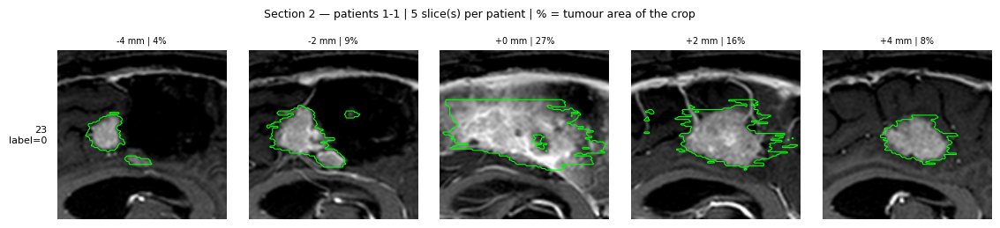

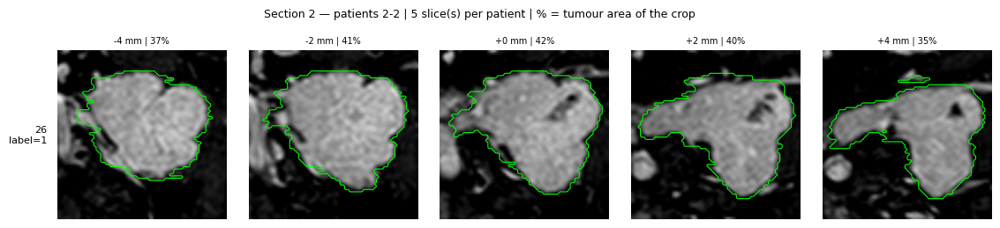

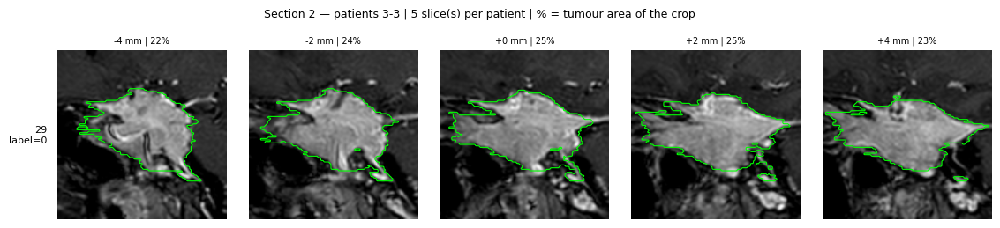

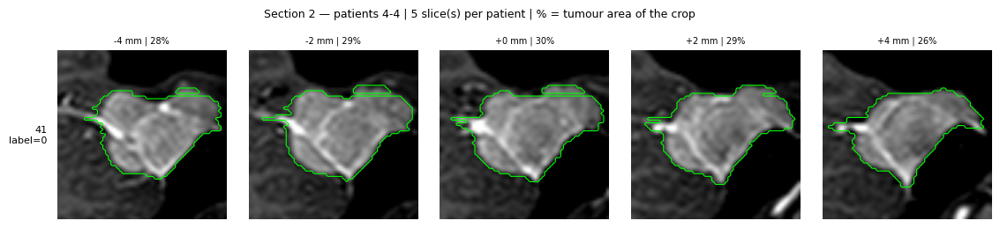

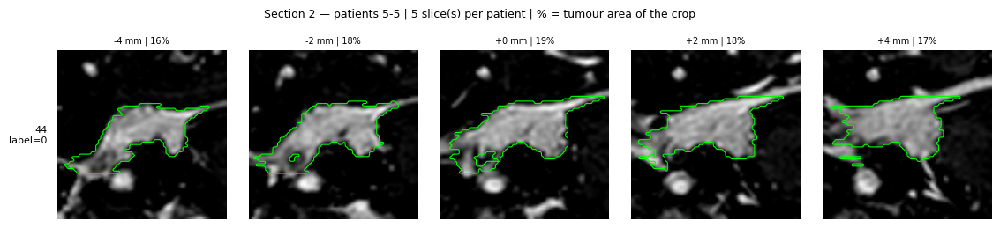

...

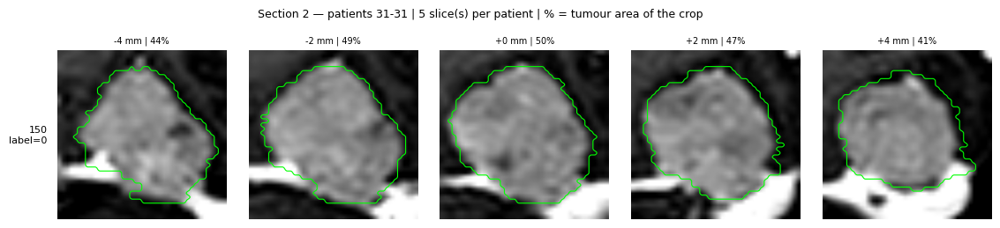

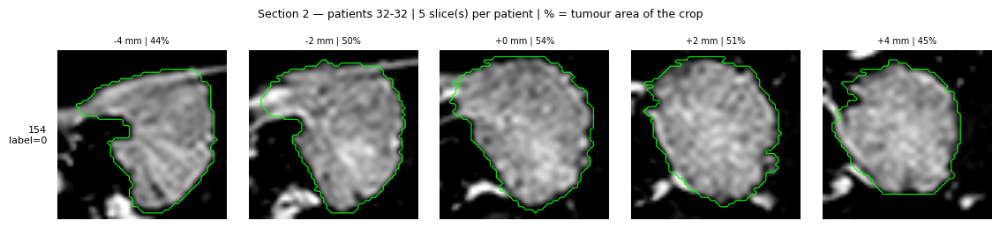

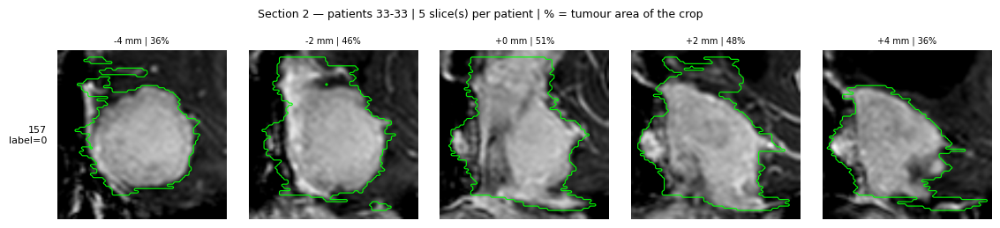

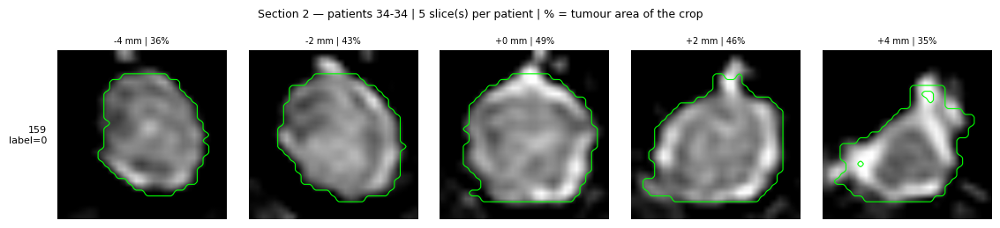

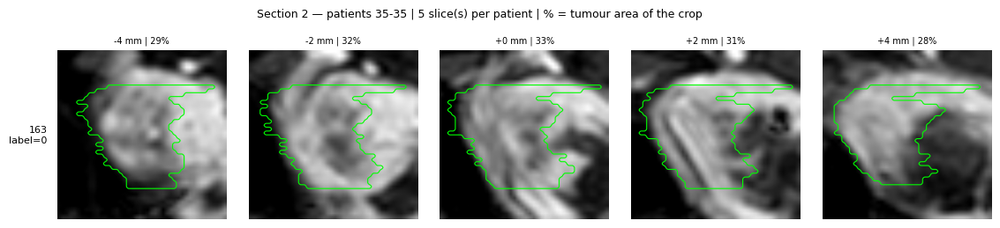

In [ ]:
# Section 2, cell 8: Visual check of analysed slices
if globals().get("RUN_CNN_LR", True):
    # Same panel as Section 1 Cell 6b, run on this section's own extractor so the frozen
    # feature inputs can be inspected. preview_analysed_slices() is defined in Section 1.
    print(f"[QC] Section 2 input slices | {int(N_SLICES)} slice(s) at "
          f"{float(SLICE_SPACING_MM):g} mm spacing")
    try:
        preview_analysed_slices(
            image_pairs,
            lambda it: make_patient_2d_cnn_inputs(it["image"], it["mask"]),
            title="Section 2 — ",
        )
    except NameError:
        print("[QC] preview_analysed_slices() is defined in Section 1 Cell 6b; run that first.")


In [ ]:
# Section 2, cell 9: Feature-extractor construction
if globals().get("RUN_CNN_LR", True):

    def conv3x3(in_planes, out_planes, stride=1, groups=1, dilation=1):
        return nn.Conv2d(
            in_planes, out_planes, kernel_size=3, stride=stride,
            padding=dilation, groups=groups, bias=False, dilation=dilation,
        )


    def conv1x1(in_planes, out_planes, stride=1):
        return nn.Conv2d(in_planes, out_planes, kernel_size=1, stride=stride, bias=False)


    class BasicBlock(nn.Module):
        expansion = 1

        def __init__(self, inplanes, planes, stride=1, downsample=None):
            super().__init__()
            self.conv1 = conv3x3(inplanes, planes, stride)
            self.bn1 = nn.BatchNorm2d(planes)
            self.relu1 = nn.ReLU(inplace=True)
            self.conv2 = conv3x3(planes, planes)
            self.bn2 = nn.BatchNorm2d(planes)
            self.relu2 = nn.ReLU(inplace=True)
            self.downsample = downsample
            self.stride = stride

        def forward(self, x):
            residual = x
            out = self.conv1(x)
            out = self.bn1(out)
            out = self.relu1(out)
            out = self.conv2(out)
            out = self.bn2(out)
            if self.downsample is not None:
                residual = self.downsample(x)
            out += residual
            out = self.relu2(out)
            return out


    class ResNetFeatureExtractor(nn.Module):
        """The image half of the published Choi IDH network (a ResNet-34-style CNN); gives 512 numbers per image."""
        def __init__(self, n_seqs=3, block=BasicBlock, layers=(3, 4, 6, 3)):
            super().__init__()
            self.inplanes = 64
            self.conv1 = nn.Conv2d(n_seqs, 64, kernel_size=7, stride=2, padding=3, bias=False)
            self.bn1 = nn.BatchNorm2d(64)
            self.relu = nn.ReLU(inplace=True)
            self.layer1 = self._make_layer(block, 64, layers[0])
            self.layer2 = self._make_layer(block, 128, layers[1], stride=2)
            self.layer3 = self._make_layer(block, 256, layers[2], stride=2)
            self.layer4 = self._make_layer(block, 512, layers[3], stride=2)
            self.avgpool = nn.AvgPool2d(8, stride=1)
            self.out_dim = 512 * block.expansion

        def _make_layer(self, block, planes, blocks, stride=1):
            downsample = None
            if stride != 1 or self.inplanes != planes * block.expansion:
                downsample = nn.Sequential(
                    nn.Conv2d(self.inplanes, planes * block.expansion, kernel_size=1, stride=stride, bias=False),
                    nn.BatchNorm2d(planes * block.expansion),
                )
            layers = [block(self.inplanes, planes, stride, downsample)]
            self.inplanes = planes * block.expansion
            for _ in range(1, blocks):
                layers.append(block(self.inplanes, planes))
            return nn.Sequential(*layers)

        def forward(self, x):
            x = self.conv1(x)     # 128 -> 64
            x = self.bn1(x)
            x = self.relu(x)
            x = self.layer1(x)    # 64
            x = self.layer2(x)    # 32
            x = self.layer3(x)    # 16
            x = self.layer4(x)    # 8
            x = self.avgpool(x)   # 1
            x = x.view(x.size(0), -1)
            return x


    def download_github_model2_checkpoint(url=GITHUB_MODEL2_URL, dst=MODEL2_CKPT_PATH):
        dst = Path(dst)
        if dst.exists() and dst.stat().st_size > 1024:
            print(f"Checkpoint already exists: {dst}")
            return str(dst)
        from torch.hub import download_url_to_file
        print(f"Downloading GitHub Model 2 checkpoint to: {dst}")
        download_url_to_file(url, str(dst), progress=True)
        return str(dst)


    def load_github_model2_image_backbone_weights(feature_model, ckpt_path):
        """Copy in only the image-processing weights from the saved Choi IDH file.

        In that file the image layers are usually tagged with a 'model_pre.' name
        prefix. We take those and skip the final decision layers and the separate
        numeric-input layers, which aren't used here.
        """
        # This checkpoint carries a few non-tensor entries, so weights_only is relaxed;
        # the file comes from a trusted release.
        try:
            ckpt = torch.load(ckpt_path, map_location="cpu", weights_only=False)
        except TypeError:
            # Older PyTorch has no weights_only argument.
            ckpt = torch.load(ckpt_path, map_location="cpu")
        sd = ckpt.get("model_state_dict", ckpt)
        current = feature_model.state_dict()
        loadable = {}

        for k, v in sd.items():
            nk = None
            for prefix in ("model_pre.", "module.model_pre."):
                if k.startswith(prefix):
                    nk = k[len(prefix):]
                    break
            # Also accept a plain ResNet checkpoint without the 'model_pre.' prefix.
            if nk is None and (k.startswith("conv1.") or k.startswith("bn1.") or k.startswith("layer")):
                nk = k
            if nk is None:
                continue
            if nk.startswith("fc.") or nk.startswith("fc"):
                continue
            if nk in current and tuple(current[nk].shape) == tuple(v.shape):
                loadable[nk] = v

        missing, unexpected = feature_model.load_state_dict(loadable, strict=False)
        print(f"Loaded {len(loadable)} compatible image-backbone tensors from: {ckpt_path}")
        print(f"Model tensors total: {len(current)}")
        if len(loadable) == 0:
            raise RuntimeError("The checkpoint contains no compatible CNN backbone weights.")
        return feature_model


    # ── Shared input wrapper, plus one builder per model ──────────────────────
    # Every model receives slices as (batch, 3, H, W) with channel 0 the scan and
    # channel 2 the mask, and returns a fixed-width embedding. The wrapper applies each
    # model's own resizing, channel policy and normalisation, so all models see the
    # same crops and their outputs stay comparable.
    import torchvision

    IMAGENET_MEAN = [0.485, 0.456, 0.406]
    IMAGENET_STD = [0.229, 0.224, 0.225]

    class BackboneFeatureExtractor(nn.Module):
        def __init__(self, backbone, out_dim, input_size=128,
                     channel_policy="keep", norm="none", mean=None, std=None):
            super().__init__()
            self.backbone = backbone
            self.out_dim = int(out_dim)
            self.input_size = int(input_size)
            self.channel_policy = channel_policy   # "keep" retains the mask channel, "gray3" drops it
            self.norm = norm                       # "none" | "imagenet" | "unit_interval"
            self.register_buffer("_mean", torch.tensor(mean if mean else [0.0, 0.0, 0.0]).view(1, 3, 1, 1))
            self.register_buffer("_std", torch.tensor(std if std else [1.0, 1.0, 1.0]).view(1, 3, 1, 1))

        def _prep(self, x):
            # x: (batch, 3, H, W); channel 0 is the scan, channel 2 the mask.
            if self.channel_policy == "gray3":
                x = x[:, 0:1, :, :].repeat(1, 3, 1, 1)
            if x.shape[-1] != self.input_size or x.shape[-2] != self.input_size:
                x = F.interpolate(x, size=(self.input_size, self.input_size),
                                  mode="bilinear", align_corners=False)
            if self.norm == "imagenet":
                x = (x - self._mean) / self._std
            # "unit_interval"/"none" need nothing further: preprocessing already
            # delivered roughly [0, 1].
            return x

        def forward(self, x):
            h = self.backbone(self._prep(x))
            if h.dim() > 2:
                h = F.adaptive_avg_pool2d(h, 1).flatten(1)
            return h


    def _make_torchvision_resnet(arch, pretrained):
        try:
            net = getattr(torchvision.models, arch)(weights=("DEFAULT" if pretrained else None))
        except TypeError:
            net = getattr(torchvision.models, arch)(pretrained=bool(pretrained))
        dim = net.fc.in_features
        net.fc = nn.Identity()   # forward returns the pooled feature with shape (B, dim)
        return net, dim


    def _make_torchvision_densenet121(pretrained=False):
        try:
            net = torchvision.models.densenet121(weights=("DEFAULT" if pretrained else None))
        except TypeError:
            net = torchvision.models.densenet121(pretrained=bool(pretrained))
        dim = net.classifier.in_features
        net.classifier = nn.Identity()
        return net, dim


    def _make_torchvision_inception_v3(pretrained=False):
        try:
            net = torchvision.models.inception_v3(
                weights=("DEFAULT" if pretrained else None), aux_logits=True, init_weights=False
            )
        except TypeError:
            net = torchvision.models.inception_v3(
                pretrained=bool(pretrained), aux_logits=True, init_weights=False
            )
        dim = net.fc.in_features
        net.fc = nn.Identity()
        return net, dim


    def _make_timm_resnet10t():
        """Build the small ResNet-10t model as a feature extractor (512 numbers per image)."""
        import timm
        # num_classes=0 drops the classifier and returns the pooled embedding.
        net = timm.create_model("resnet10t", pretrained=False, num_classes=0)
        dim = net.num_features  # 512
        return net, dim


    def load_radimagenet_weights(net, weights_path, architecture_name="RadImageNet backbone"):
        p = Path(weights_path) if weights_path else None
        if (p is None) or (not p.exists()):
            parent = p.parent if p is not None else Path(".")
            nearby = []
            if parent.exists():
                nearby = sorted([str(x) for x in parent.rglob("*.pt")][:20] + [str(x) for x in parent.rglob("*.pth")][:20])
            raise FileNotFoundError(
                f"{architecture_name} weights not found at the resolved path. "
                "If the file is visible in Drive, check that Cell 2 runs again after Drive mounts, "
                "and that the filename/folder matches exactly. "
                f"Looked at: {weights_path}. "
                f"Nearby .pt/.pth files under {parent}: {nearby[:20]}"
            )

        try:
            raw = torch.load(str(p), map_location="cpu", weights_only=False)
        except TypeError:
            raw = torch.load(str(p), map_location="cpu")

        def _unwrap_state_dict(obj):
            """Dig out the real table of weights, which saved files often bury inside wrapper layers."""
            if hasattr(obj, "state_dict"):
                obj = obj.state_dict()
            if not isinstance(obj, dict):
                return obj, "<non-dict checkpoint>"

            # Already a state_dict.
            tensor_like_values = [v for v in obj.values() if torch.is_tensor(v)]
            if len(tensor_like_values) >= 10:
                return obj, "<top-level>"

            for key in (
                "state_dict", "model_state_dict", "model", "net", "network",
                "backbone", "encoder", "weights", "params", "module",
                "model_weights", "weight", "pretrained_dict",
            ):
                if key in obj:
                    nested, where = _unwrap_state_dict(obj[key])
                    if isinstance(nested, dict):
                        return nested, key if where == "<top-level>" else f"{key}.{where}"
            return obj, "<dict without tensor state_dict>"

        sd, sd_location = _unwrap_state_dict(raw)
        if not isinstance(sd, dict):
            raise RuntimeError(
                f"{architecture_name} checkpoint at {p} did not contain a PyTorch state_dict. "
                f"Loaded object type: {type(sd)}"
            )

        current = net.state_dict()
        loadable = {}

        import re as _re

        def _densenet_legacy(key):
            """Rename older DenseNet keys (...norm.1.weight) to the modern form (...norm1.weight).

            Pass 1 finds no matches on a checkpoint using the old spelling.
            """
            key = _re.sub(r'\.norm\.(\d+)', r'.norm\1', key)
            key = _re.sub(r'\.conv\.(\d+)', r'.conv\1', key)
            return key

        def candidate_keys(key):
            # Try each key as-is, then strip known wrapper prefixes only. DenseNet's own
            # "features." prefix is genuine and is kept.
            candidates = []
            seen = set()
            queue = [key]
            prefixes = (
                "module.", "backbone.", "model.", "encoder.", "resnet.",
                "base_model.", "feature_extractor.", "network.", "net.",
                "densenet.", "inception.", "inception_v3.",
                "0.", "1.", "2.", "3.",   # nn.Sequential / numeric-index wrappers
                "_orig_mod.",             # torch.compile saves with this prefix (e.g. ResNet-18)
            )
            while queue:
                cur = queue.pop(0)
                if cur not in seen:
                    seen.add(cur)
                    candidates.append(cur)
                    for pre in prefixes:
                        if cur.startswith(pre):
                            stripped = cur[len(pre):]
                            if stripped not in seen:
                                queue.append(stripped)
            return candidates

        _HEAD_PREFIXES = ("fc.", "classifier.", "AuxLogits.fc.")
        _pass3_rescued = 0  # initialised here; may be updated in Pass 3 below

        tensor_items = []
        non_tensor_keys = []
        for k, v in sd.items():
            if not torch.is_tensor(v):
                non_tensor_keys.append(str(k))
                continue
            tensor_items.append((str(k), v))
            for nk in candidate_keys(str(k)):
                if nk.startswith(_HEAD_PREFIXES):
                    continue
                if nk in current and tuple(current[nk].shape) == tuple(v.shape):
                    loadable[nk] = v
                    break

        # Pass 2 — older DenseNet key names: "norm.1"/"conv.1" -> "norm1"/"conv1". Runs for
        # DenseNet, or whenever pass 1 matched fewer than five tensors.
        _arch_lower = architecture_name.lower()
        if "densenet" in _arch_lower or len(loadable) < 5:
            _matched_so_far = set(loadable.keys())
            for k, v in tensor_items:
                modern_k = _densenet_legacy(k)
                if modern_k == k:
                    continue  # key unchanged; already tried in pass 1
                for nk in candidate_keys(modern_k):
                    if nk.startswith(_HEAD_PREFIXES) or nk in _matched_so_far:
                        continue
                    if nk in current and tuple(current[nk].shape) == tuple(v.shape):
                        loadable[nk] = v
                        _matched_so_far.add(nk)
                        break

        # Pass 3 — positional keys. Some RadImageNet checkpoints index by position
        # ("backbone.0", "backbone.1", ...) rather than by name, e.g.
        #   ResNet-50     backbone.0.weight       -> conv1.weight
        #   DenseNet-121  backbone.0.conv0.weight -> features.conv0.weight
        #   InceptionV3   backbone.0.conv.weight  -> Conv2d_1a_3x3.conv.weight
        _inception_had_aux = False  # set in pass 3
        _pass3_rescued = 0
        if len(loadable) < 5:
            _matched_so_far = set(loadable.keys())
            _ckpt_keys = [k for k, _ in tensor_items]
            _uses_backbone_prefix = any(k.startswith("backbone.") for k in _ckpt_keys)

            # InceptionV3's training-only AuxLogits branch may or may not be present, and
            # its presence shifts every positional index by one. The highest index decides:
            #   <= 17  no AuxLogits, positions 15/16/17 are the final blocks
            #   >= 18  AuxLogits at 15, final blocks at 16/17/18
            # The wrong map loads weights into a neighbouring block without raising, since
            # the shapes match; the completeness check below catches it.
            _inception_had_aux = False
            if _uses_backbone_prefix and "inception" in _arch_lower:
                _bb_idxs = {
                    int(_m.group(1)) for _k in _ckpt_keys
                    for _m in [_re.match(r"backbone\.(\d+)\.", _k)] if _m
                }
                _inception_had_aux = max(_bb_idxs, default=0) >= 18

            def _normalize_key(k):
                if not _uses_backbone_prefix:
                    return k
                if "densenet" in _arch_lower:
                    if k.startswith("backbone.0."):
                        return "features." + k[len("backbone.0."):]
                elif "inception" in _arch_lower:
                    _imap = {
                        "backbone.0.":  "Conv2d_1a_3x3.", "backbone.1.":  "Conv2d_2a_3x3.",
                        "backbone.2.":  "Conv2d_2b_3x3.",
                        "backbone.4.":  "Conv2d_3b_1x1.", "backbone.5.":  "Conv2d_4a_3x3.",
                        "backbone.7.":  "Mixed_5b.",       "backbone.8.":  "Mixed_5c.",
                        "backbone.9.":  "Mixed_5d.",       "backbone.10.": "Mixed_6a.",
                        "backbone.11.": "Mixed_6b.",       "backbone.12.": "Mixed_6c.",
                        "backbone.13.": "Mixed_6d.",       "backbone.14.": "Mixed_6e.",
                    }
                    if _inception_had_aux:
                        # AuxLogits present (max index >= 18).
                        _imap.update({
                            "backbone.15.": "AuxLogits.",
                            "backbone.16.": "Mixed_7a.",
                            "backbone.17.": "Mixed_7b.",
                            "backbone.18.": "Mixed_7c.",
                        })
                    else:
                        # No AuxLogits (max index <= 17).
                        _imap.update({
                            "backbone.15.": "Mixed_7a.",
                            "backbone.16.": "Mixed_7b.",
                            "backbone.17.": "Mixed_7c.",
                        })
                    for old, dst in _imap.items():
                        if k.startswith(old):
                            return dst + k[len(old):]
                else:  # resnet-50 / resnet-18 / resnet-10t
                    # ResNet positions: 0 = conv1, 1 = bn1, 4..7 = layer1..4. Parameterless
                    # layers are absent from the checkpoint. The ResNet-10t stem follows the
                    # same layout, so one map covers both.
                    _rmap = {
                        "backbone.0.": "conv1.", "backbone.1.": "bn1.",
                        "backbone.4.": "layer1.", "backbone.5.": "layer2.",
                        "backbone.6.": "layer3.", "backbone.7.": "layer4.",
                    }
                    for old, dst in _rmap.items():
                        if k.startswith(old):
                            return dst + k[len(old):]
                return k

            for orig_k, v in tensor_items:
                norm_k = _normalize_key(orig_k)
                for nk in candidate_keys(norm_k):
                    if nk.startswith(_HEAD_PREFIXES) or nk in _matched_so_far:
                        continue
                    if nk in current and tuple(current[nk].shape) == tuple(v.shape):
                        loadable[nk] = v
                        _matched_so_far.add(nk)
                        _pass3_rescued += 1
                        break

            if _pass3_rescued:
                print(f"[RadImageNet] Pass 3 (sequential-backbone remapping) rescued {_pass3_rescued} tensors")

        sample_ckpt = [(k, tuple(v.shape)) for k, v in tensor_items[:12]]
        sample_expected = [(k, tuple(v.shape)) for k, v in list(current.items())[:12]]

        print(f"[RadImageNet] {architecture_name}: checkpoint={p.name} | state_dict_location={sd_location}")
        print(f"[RadImageNet] tensor keys in checkpoint: {len(tensor_items)} | non-tensor keys: {len(non_tensor_keys)}")
        print(f"[RadImageNet] sample checkpoint keys: {sample_ckpt}")
        print(f"[RadImageNet] sample expected torchvision keys: {sample_expected}")

        if len(loadable) == 0:
            raise RuntimeError(
                f"{architecture_name} loaded 0 compatible tensors from {p}. "
                "This usually means the checkpoint key names do not match the torchvision "
                "architecture expected for this backbone.\n"
                "Common causes:\n"
                "  • Wrong .pt file (e.g. ResNet50 file used for DenseNet121).\n"
                "  • DenseNet saved with old torchvision (<0.12): norm.1/conv.1 vs norm1/conv1 "
                "(pass 2 should have fixed this automatically — if you still see this, the file "
                "may not be a torchvision DenseNet at all).\n"
                "  • InceptionV3 checkpoint from a custom/non-torchvision implementation.\n"
                "  • Checkpoint is a full Keras/TF model, not a PyTorch state_dict.\n"
                "Inspect the sample checkpoint keys printed above vs. the expected torchvision keys "
                "and add an architecture-specific key-conversion pass if needed."
            )

        missing, unexpected = net.load_state_dict(loadable, strict=False)
        _used_legacy = ("densenet" in architecture_name.lower() or len(loadable) < 5) and any(
            _densenet_legacy(k) != k for k, _ in tensor_items
        )
        _strategy = ("densenet_legacy_keys" if _used_legacy
                     else "sequential_backbone_remapping" if _pass3_rescued
                     else "standard")
        print(f"[RadImageNet] {architecture_name}: loaded {len(loadable)}/{len(current)} compatible "
              f"backbone tensors from {p.name} (strategy={_strategy})")

        # ── Load completeness ─────────────────────────────────────────────────
        # Counting the model's non-head tensors gives an exact load fraction, keeping the
        # incomplete-load warning reliable for every architecture.
        _n_expected = len([k for k in current if not k.startswith(_HEAD_PREFIXES)])
        _load_frac = len(loadable) / max(1, _n_expected)
        if _load_frac < 0.80:
            print(
                f"[RadImageNet][warning] {architecture_name}: loaded {len(loadable)}/{_n_expected} "
                f"expected tensors ({_load_frac:.0%}). A healthy load is typically >90%. "
                "Inspect the sample keys above for a naming mismatch."
            )

        # ── Strict InceptionV3 check ──────────────────────────────────────────
        # The positional map cannot be verified from the checkpoint alone, and equal shapes
        # hide a wrong assignment. A wrong map leaves slots empty, so the load fraction
        # falls; a correct load fills all 94 convolution blocks, ~98% of non-head tensors,
        # the remainder being AuxLogits. Below 0.95 raises.
        if "inception" in _arch_lower:
            _bb_indices = sorted({
                int(_m.group(1)) for _k, _ in tensor_items
                for _m in [_re.match(r"backbone\.(\d+)\.", _k)] if _m
            })
            print(f"[RadImageNet] {architecture_name}: checkpoint backbone.N block "
                  f"indices present: {_bb_indices} | inferred aux_logits_when_saved={_inception_had_aux}")
            if _load_frac < 0.95:
                raise RuntimeError(
                    f"[RadImageNet][FATAL] {architecture_name}: loaded only "
                    f"{len(loadable)}/{_n_expected} non-head tensors ({_load_frac:.0%}); "
                    "a correct InceptionV3 load is ~98%. A partial load means the "
                    "backbone.N -> torchvision index map (Pass 3) does not match this "
                    "checkpoint's Sequential order, which risks silently loading weights "
                    "into the WRONG Inception block. "
                    f"Observed backbone.N indices: {_bb_indices}. "
                    "Validate them against the torchvision inception_v3 child order "
                    "(Conv2d_1a/2a/2b, [maxpool], Conv2d_3b/4a, [maxpool], "
                    "Mixed_5b/5c/5d/6a/6b/6c/6d/6e, [AuxLogits], Mixed_7a/7b/7c) and "
                    "correct the _imap in Pass 3 before trusting InceptionV3 features."
                )

        # ── BatchNorm statistics ──────────────────────────────────────────────
        # Missing running_mean/running_var makes eval() fall back to mean 0, variance 1
        # and silently corrupts the features.
        _bn_expected_keys = [k for k in current if k.endswith((".running_mean", ".running_var"))]
        _bn_missing_keys  = [k for k in missing  if k.endswith((".running_mean", ".running_var"))]
        if _bn_missing_keys:
            _bn_frac = len(_bn_missing_keys) / max(1, len(_bn_expected_keys))
            if _bn_frac > 0.5:
                raise RuntimeError(
                    f"[RadImageNet][FATAL] {architecture_name}: "
                    f"{len(_bn_missing_keys)}/{len(_bn_expected_keys)} BatchNorm "
                    "running_mean/running_var buffers MISSING from checkpoint. "
                    "In eval() mode every BN layer normalises with mean=0/var=1, "
                    "producing silently invalid features. The checkpoint likely stores "
                    "only learnable parameters (conv weights + BN scale/bias) without "
                    "running statistics. "
                    f"Sample missing BN keys: {_bn_missing_keys[:4]}"
                )
            print(
                f"[RadImageNet][warning] {architecture_name}: "
                f"{len(_bn_missing_keys)}/{len(_bn_expected_keys)} BN running buffers "
                "missing — those layers use default statistics in eval() mode."
            )
        else:
            print(
                f"[RadImageNet] {architecture_name}: all "
                f"{len(_bn_expected_keys)} BN running buffers loaded OK."
            )
        return net


    def _build_backbone_extractor_native(backbone_name, channel_policy=None):
        name = str(backbone_name).lower()
        _cp = channel_policy if channel_policy is not None else IMAGENET_CHANNEL_POLICY
        if name in ("choi_idh", "choi", "idh"):
            fe = ResNetFeatureExtractor(n_seqs=3, block=BasicBlock, layers=(3, 4, 6, 3))
            if USE_GITHUB_IDH_PRETRAINED_WEIGHTS:
                ckpt_path = download_github_model2_checkpoint()
                fe = load_github_model2_image_backbone_weights(fe, ckpt_path)
            else:
                print("WARNING: random Choi-architecture features (debug only, not meaningful).")
            return BackboneFeatureExtractor(fe, out_dim=fe.out_dim, input_size=128,
                                            channel_policy="keep", norm="none")
        if name in ("imagenet_resnet10t", "imagenet10t", "imagenet_resnet10"):
            import timm as _timm
            net = _timm.create_model("resnet10t", pretrained=True, num_classes=0)
            dim = net.num_features
            print("[ImageNet] resnet10t: timm ImageNet-pretrained (c3_in1k) weights")
            return BackboneFeatureExtractor(net, out_dim=dim, input_size=224,
                                            channel_policy=_cp, norm="imagenet",
                                            mean=IMAGENET_MEAN, std=IMAGENET_STD)
        if name in ("imagenet_resnet50", "imagenet50", "imagenet"):
            net, dim = _make_torchvision_resnet("resnet50", pretrained=True)
            return BackboneFeatureExtractor(net, out_dim=dim, input_size=224,
                                            channel_policy=_cp, norm="imagenet",
                                            mean=IMAGENET_MEAN, std=IMAGENET_STD)
        if name in ("imagenet_resnet18", "imagenet18"):
            net, dim = _make_torchvision_resnet("resnet18", pretrained=True)
            return BackboneFeatureExtractor(net, out_dim=dim, input_size=224,
                                            channel_policy=_cp, norm="imagenet",
                                            mean=IMAGENET_MEAN, std=IMAGENET_STD)
        if name in ("imagenet_densenet121", "imagenet_densenet", "imagenet121"):
            net, dim = _make_torchvision_densenet121(pretrained=True)
            return BackboneFeatureExtractor(net, out_dim=dim, input_size=224,
                                            channel_policy=_cp, norm="imagenet",
                                            mean=IMAGENET_MEAN, std=IMAGENET_STD)
        if name in ("imagenet_inceptionv3", "imagenet_inception_v3", "imagenet_inception"):
            net, dim = _make_torchvision_inception_v3(pretrained=True)
            return BackboneFeatureExtractor(net, out_dim=dim, input_size=299,
                                            channel_policy=_cp, norm="imagenet",
                                            mean=IMAGENET_MEAN, std=IMAGENET_STD)
        if name in ("radimagenet_resnet50", "radimagenet", "radimagenet50"):
            net, dim = _make_torchvision_resnet("resnet50", pretrained=False)
            net = load_radimagenet_weights(net, RADIMAGENET_WEIGHTS_PATH, "RadImageNet ResNet-50")
            rin_norm = radimagenet_norm_for(name)
            return BackboneFeatureExtractor(net, out_dim=dim, input_size=224,
                                            channel_policy=_cp, norm=rin_norm,
                                            mean=IMAGENET_MEAN, std=IMAGENET_STD)
        if name in ("radimagenet_densenet121", "radimagenet_densenet", "radimagenet121"):
            net, dim = _make_torchvision_densenet121(pretrained=False)
            net = load_radimagenet_weights(net, RADIMAGENET_DENSENET121_WEIGHTS_PATH, "RadImageNet DenseNet-121")
            rin_norm = radimagenet_norm_for(name)
            return BackboneFeatureExtractor(net, out_dim=dim, input_size=224,
                                            channel_policy=_cp, norm=rin_norm,
                                            mean=IMAGENET_MEAN, std=IMAGENET_STD)
        if name in ("radimagenet_inceptionv3", "radimagenet_inception_v3", "radimagenet_inception"):
            net, dim = _make_torchvision_inception_v3(pretrained=False)
            net = load_radimagenet_weights(net, RADIMAGENET_INCEPTIONV3_WEIGHTS_PATH, "RadImageNet InceptionV3")
            rin_norm = radimagenet_norm_for(name)
            return BackboneFeatureExtractor(net, out_dim=dim, input_size=299,
                                            channel_policy=_cp, norm=rin_norm,
                                            mean=IMAGENET_MEAN, std=IMAGENET_STD)
        if name in ("radimagenet_resnet18", "radimagenet18"):
            net, dim = _make_torchvision_resnet("resnet18", pretrained=False)
            net = load_radimagenet_weights(net, RADIMAGENET_RESNET18_WEIGHTS_PATH, "RadImageNet ResNet-18")
            rin_norm = radimagenet_norm_for(name)
            return BackboneFeatureExtractor(net, out_dim=dim, input_size=224,
                                            channel_policy=_cp, norm=rin_norm,
                                            mean=IMAGENET_MEAN, std=IMAGENET_STD)
        if name in ("radimagenet_resnet10t", "radimagenet10t", "radimagenet_resnet10"):
            net, dim = _make_timm_resnet10t()
            net = load_radimagenet_weights(net, RADIMAGENET_RESNET10T_WEIGHTS_PATH, "RadImageNet ResNet-10t")
            rin_norm = radimagenet_norm_for(name)
            return BackboneFeatureExtractor(net, out_dim=dim, input_size=224,
                                            channel_policy=_cp, norm=rin_norm,
                                            mean=IMAGENET_MEAN, std=IMAGENET_STD)
        raise ValueError(
            f"Unknown BACKBONE={backbone_name!r}. Use choi_idh, imagenet_resnet50, "
            "imagenet_resnet18, imagenet_densenet121, imagenet_inceptionv3, "
            "radimagenet_resnet50, radimagenet_densenet121, radimagenet_inceptionv3, "
            "radimagenet_resnet18, or radimagenet_resnet10t."
        )


    def cnn_weight_source(backbone_name):
        name = str(backbone_name).lower()
        if name in ("choi_idh", "choi", "idh"):
            if USE_GITHUB_IDH_PRETRAINED_WEIGHTS:
                return f"github_idh_model2:{MODEL2_CKPT_PATH}"
            return "random_init_debug_only"
        if name in (
            "imagenet_resnet50", "imagenet50", "imagenet",
            "imagenet_resnet18", "imagenet18",
            "imagenet_densenet121", "imagenet_densenet", "imagenet121",
            "imagenet_inceptionv3", "imagenet_inception_v3", "imagenet_inception",
        ):
            return "torchvision_default_imagenet"
        if name in ("radimagenet_resnet50", "radimagenet", "radimagenet50"):
            return f"radimagenet_file:{RADIMAGENET_WEIGHTS_PATH}"
        if name in ("radimagenet_densenet121", "radimagenet_densenet", "radimagenet121"):
            return f"radimagenet_file:{RADIMAGENET_DENSENET121_WEIGHTS_PATH}"
        if name in ("radimagenet_inceptionv3", "radimagenet_inception_v3", "radimagenet_inception"):
            return f"radimagenet_file:{RADIMAGENET_INCEPTIONV3_WEIGHTS_PATH}"
        if name in ("radimagenet_resnet18", "radimagenet18"):
            return f"radimagenet_file:{RADIMAGENET_RESNET18_WEIGHTS_PATH}"
        if name in ("radimagenet_resnet10t", "radimagenet10t", "radimagenet_resnet10"):
            return f"radimagenet_file:{RADIMAGENET_RESNET10T_WEIGHTS_PATH}"
        return "unknown"


    def cnn_weight_status(backbone_name):
        name = str(backbone_name).lower()
        if name in ("choi_idh", "choi", "idh"):
            return "loaded_github_idh_model2" if USE_GITHUB_IDH_PRETRAINED_WEIGHTS else "random_init_debug_only"
        if name.startswith("imagenet") or name in ("imagenet50", "imagenet18", "imagenet", "imagenet121"):
            return "loaded_torchvision_imagenet"
        if name.startswith("radimagenet") or name in ("radimagenet", "radimagenet50", "radimagenet121", "radimagenet18"):
            return "loaded_radimagenet_compatible_tensors"
        return "unknown"


    def cnn_feature_metadata(feature_model=None, backbone_name=None):
        feature_model = feature_model if feature_model is not None else globals().get("feature_extractor")
        backbone_name = str(backbone_name if backbone_name is not None else globals().get("BACKBONE", "unknown"))
        return {
            "cnn_backbone": backbone_name,
            "cnn_weight_source": cnn_weight_source(backbone_name),
            "cnn_weight_status": cnn_weight_status(backbone_name),
            "cnn_feature_dim": int(getattr(feature_model, "out_dim", -1)),
            "cnn_input_size": int(getattr(feature_model, "input_size", -1)),
            # What the weights were pretrained at, which is what the network consumes
            # unless an optimization arm asked for a different size.
            "cnn_native_input_size": int(getattr(
                feature_model, "native_input_size",
                getattr(feature_model, "input_size", -1),
            )),
            "cnn_channel_policy": str(getattr(feature_model, "channel_policy", "unknown")),
            "cnn_norm": str(getattr(feature_model, "norm", "unknown")),
            "cnn_workflow": "frozen_feature_extractor_only",
            "cnn_training_epochs": "none",
            "cnn_learning_rate": "none",
            "cnn_optimizer": "none",
            "cnn_gradient_updates": "disabled_torch_no_grad",
            "cnn_mode": "eval",
            "slice_strategy": f"{len(SLICE_OFFSETS_MM)} axial tumor-centered slices",
            "slice_offsets": str(tuple(SLICE_OFFSETS_MM)),
            "patient_feature_aggregation": "mean_of_selected_slice_embeddings",
            "downstream_training": "classical_ml_cv_only_in_cell_10",
        }


    def print_cnn_feature_info(feature_info):
        print("CNN feature source:")
        for k, v in feature_info.items():
            print(f"  {k}: {v}")


    def print_feature_extraction_protocol(feature_info, n_cases=None):
        print("CNN extraction protocol:")
        print("  task: frozen CNN embedding extraction, not CNN training/fine-tuning")
        print(f"  backbone: {feature_info.get('cnn_backbone')}")
        print(f"  weight_source: {feature_info.get('cnn_weight_source')}")
        print(f"  weight_status: {feature_info.get('cnn_weight_status')}")
        print(f"  model_mode: {feature_info.get('cnn_mode')} | gradients: {feature_info.get('cnn_gradient_updates')}")
        print(f"  epochs: {feature_info.get('cnn_training_epochs')} | learning_rate: {feature_info.get('cnn_learning_rate')} | optimizer: {feature_info.get('cnn_optimizer')}")
        print(f"  input_channels: [T1cc, T1cc, tumor_mask] | channel_policy: {feature_info.get('cnn_channel_policy')}")
        print(f"  selected_slices: {feature_info.get('slice_strategy')} | offsets: {feature_info.get('slice_offsets')}")
        print(f"  patient_embedding: {feature_info.get('patient_feature_aggregation')}")
        if n_cases is not None:
            print(f"  cases_to_process: {n_cases}")


    # Smallest spatial input each architecture family can consume; below
    # this the forward pass either raises or collapses to a 1x1 feature map.
    _BACKBONE_MIN_INPUT_SIZE = (("inception", 75),)
    _BACKBONE_DEFAULT_MIN_INPUT_SIZE = 32

    def _backbone_min_input_size(backbone_name):
        name = str(backbone_name).lower()
        for _needle, _floor in _BACKBONE_MIN_INPUT_SIZE:
            if _needle in name:
                return int(_floor)
        return int(_BACKBONE_DEFAULT_MIN_INPUT_SIZE)

    def build_backbone_extractor(backbone_name, channel_policy=None, input_size=None):
        """Frozen extractor, optionally consuming a size other than its native one.

        Every factory branch pins the resolution its weights were pretrained at, and
        BackboneFeatureExtractor._prep resizes whatever it receives to that value.
        That is right for a fixed protocol, but it silently cancels an optimization
        arm that compares image size: a 128 px arm would be resampled straight back
        up to 224 and would measure a blur round-trip rather than the 128 px forward
        pass that Sections 1 and 3 measure for the same arm ID. Passing input_size
        makes the network consume the arm's size for real; leaving it None keeps the
        native pretraining size, so the non-optimization protocol is unchanged.
        """
        extractor = _build_backbone_extractor_native(
            backbone_name, channel_policy=channel_policy
        )
        extractor.native_input_size = int(extractor.input_size)
        if input_size is not None:
            _requested = int(input_size)
            _floor = _backbone_min_input_size(backbone_name)
            if _requested < _floor:
                raise ValueError(
                    f"{backbone_name}: requested input_size={_requested} is below the "
                    f"{_floor} px minimum this architecture can consume."
                )
            extractor.input_size = _requested
        return extractor

    def prepare_backbone(backbone_name, channel_policy=None, input_size=None):
        global BACKBONE, feature_extractor, CNN_FEATURE_INFO
        BACKBONE = str(backbone_name)
        _cp = channel_policy if channel_policy is not None else IMAGENET_CHANNEL_POLICY
        print("\n" + "=" * 72)
        print(f"Preparing CNN backbone: {BACKBONE} | channel_policy={_cp}")
        feature_extractor = build_backbone_extractor(
            BACKBONE, channel_policy=_cp, input_size=input_size
        ).to(device)
        feature_extractor.eval()
        CNN_FEATURE_INFO = cnn_feature_metadata(feature_extractor, BACKBONE)
        _native = int(getattr(feature_extractor, "native_input_size", feature_extractor.input_size))
        _size_txt = (
            f"{feature_extractor.input_size} (native {_native})"
            if int(feature_extractor.input_size) != _native
            else f"{feature_extractor.input_size}"
        )
        print(f"Backbone='{BACKBONE}' ready | feature_dim={feature_extractor.out_dim} "
              f"| input_size={_size_txt} "
              f"| channel_policy={feature_extractor.channel_policy} | norm={feature_extractor.norm}")
        print_cnn_feature_info(CNN_FEATURE_INFO)
        return feature_extractor, CNN_FEATURE_INFO


    print("Backbone factory ready. Scheduled backbones:", RUN_BACKBONES)


Backbone factory ready. Scheduled backbones: ['radimagenet_densenet121', 'imagenet_densenet121', 'radimagenet_inceptionv3', 'imagenet_inceptionv3', 'radimagenet_resnet10t', 'imagenet_resnet10t', 'radimagenet_resnet18', 'imagenet_resnet18', 'radimagenet_resnet50', 'imagenet_resnet50', 'choi_idh']


In [ ]:
# Section 2, cell 10: Feature extraction to CSV
if globals().get("RUN_CNN_LR", True):

    def feature_columns(prefix="cnn_f", n=512):
        return [f"{prefix}{i:04d}" for i in range(n)]


    def safe_filename_token(x):
        """Clean up a tag so it is safe to drop into a CSV filename."""
        return re.sub(r"[^A-Za-z0-9]+", "_", str(x)).strip("_").lower() or "unknown"


    def extract_features_for_pairs(pairs, feature_model, batch_size=BATCH_SIZE_FEATURES):
        patient_rows_all, slice_rows_all = [], []
        n_failures = 0
        first_error_repr = None
        fcols = feature_columns(n=feature_model.out_dim)
        feature_info = cnn_feature_metadata(feature_model, globals().get("BACKBONE", "unknown"))
        print_feature_extraction_protocol(feature_info, n_cases=len(pairs))

        feature_model.eval()
        with torch.no_grad():
            for item in tqdm(pairs, desc="Extracting CNN features"):
                try:
                    xs, meta = make_patient_2d_cnn_inputs(item["image"], item["mask"])
                    feats = []
                    for start in range(0, len(xs), batch_size):
                        # make_patient_2d_cnn_inputs returns the slices already stacked
                        # as (slices, 3, H, W); batch and move to device without restacking.
                        xb = xs[start:start + batch_size].to(device)
                        fb = feature_model(xb).detach().cpu().numpy()
                        feats.append(fb)
                    feats = np.vstack(feats)
                    mean_feat = feats.mean(axis=0)

                    base = {
                        "patient_id": item["patient_id"],
                        "canonical_id": item["canonical_id"],
                        "label": int(item["label"]),
                        "image": item["image"],
                        "mask": item["mask"],
                        "n_slices": len(meta),
                        "selected_z_indices": ",".join(str(int(m["z_index"])) for m in meta),
                        "selected_actual_offsets_mm": ",".join(f"{float(m['actual_offset_mm']):.3f}" for m in meta),
                    }
                    # The crop is patient-level, so these values are identical on every
                    # selected slice; keep one copy in the patient diagnostics table.
                    if meta:
                        for _k in [
                            "crop_safety_margin_px", "crop_peak_occupancy",
                            "crop_height_px", "crop_width_px", "crop_height_mm", "crop_width_mm",
                            "crop_area_mm2", "crop_requested_side_mm", "crop_peak_tumor_area_mm2",
                            "crop_union_bbox_height_px", "crop_union_bbox_width_px",
                            "crop_margin_box_height_px", "crop_margin_box_width_px",
                            "crop_peak_min_side_mm", "crop_all_selected_min_side_mm",
                            "crop_physical_square_error_mm", "crop_limiting_reason",
                            "crop_peak_z_index", "n_available_tumour_slices",
                        ]:
                            base[_k] = meta[0].get(_k)
                    base.update(feature_info)
                    base.update({c: float(v) for c, v in zip(fcols, mean_feat)})
                    patient_rows_all.append(base)

                    for m, vec in zip(meta, feats):
                        out = {
                            "patient_id": item["patient_id"],
                            "canonical_id": item["canonical_id"],
                            "label": int(item["label"]),
                            "image": item["image"],
                            "mask": item["mask"],
                        }
                        out.update(m)
                        out.update(feature_info)
                        out.update({c: float(v) for c, v in zip(fcols, vec)})
                        slice_rows_all.append(out)

                except Exception as e:
                    n_failures += 1
                    if first_error_repr is None:
                        first_error_repr = repr(e)
                    print(f"[feature extraction warning] skipped patient={item.get('patient_id')} | {repr(e)}")
                    fail_path = Path(OUT_DIR) / "feature_extraction_failures.csv"
                    pd.DataFrame([{
                        "patient_id": item.get("patient_id"),
                        "image": item.get("image"),
                        "mask": item.get("mask"),
                        "error": repr(e),
                    }]).to_csv(fail_path, mode="a", index=False, header=not fail_path.exists())

        if not patient_rows_all:
            raise RuntimeError(
                f"Feature extraction produced 0 usable patient rows: all {n_failures} case(s) failed. "
                f"First error: {first_error_repr}. "
                "See feature_extraction_failures.csv in OUT_DIR for the full list."
            )
        return pd.DataFrame(patient_rows_all), pd.DataFrame(slice_rows_all)


    all_feature_output_rows = []

    for _opt_arm in PART2_OPTIMIZATION_ARMS:
        apply_part2_optimization_arm(_opt_arm)
        _opt_row_meta = {
            "optimization": bool(OPTIMIZATION),
            "opt_arm_id": (_opt_arm["arm_id"] if _opt_arm is not None else ""),
            "opt_is_reference": bool(_opt_arm.get("is_reference")) if _opt_arm is not None else False,
            "opt_input_size": int(CNN_INPUT_SIZE),
            "opt_n_slices": int(N_SLICES),
            "opt_augmentation": "NOT_APPLICABLE",
            "tumor_context_mode": str(TUMOR_CONTEXT_MODE).upper(),
            "roi_only_background_value": (
                float(ROI_ONLY_BACKGROUND_VALUE)
                if str(TUMOR_CONTEXT_MODE).upper() == "ROI_ONLY" else np.nan
            ),
        }
        for backbone_name in RUN_BACKBONES:
            # Channel policies apply only to the ImageNet/RadImageNet models; Choi-IDH always
            # takes its fixed [T1cc, T1cc, mask] input.
            _is_choi = str(backbone_name).lower() in ("choi_idh", "choi", "idh")
            _policies = ["keep"] if _is_choi else CHANNEL_POLICIES_TO_COMPARE

            for _cp in _policies:
                _base_bb_tag = (
                    safe_filename_token(backbone_name)
                    + f"__{safe_filename_token(_cp)}"
                )
                _bb_tag = ((safe_filename_token(_opt_arm["arm_id"]) + "__")
                           if _opt_arm is not None else "") + _base_bb_tag
                try:
                    feature_extractor, CNN_FEATURE_INFO = prepare_backbone(
                        backbone_name,
                        channel_policy=_cp,
                        # The arm's size has to reach the network, or the extractor's
                        # own resize undoes the compared setting. When optimization comparison is off, this stays
                        # None so every backbone keeps its native resolution.
                        input_size=(
                            int(CNN_INPUT_SIZE)
                            if (OPTIMIZATION and _opt_arm is not None) else None
                        ),
                    )
                except Exception as e:
                    err = repr(e)
                    print(f"[backbone skipped] {backbone_name} ({_cp}): {err}")
                    for _lcfg in ACTIVE_LABEL_CONFIGS:
                        all_feature_output_rows.append({
                            **_opt_row_meta,
                            "cnn_backbone": str(backbone_name),
                            "cnn_channel_policy": _cp,
                            "label_tag": _lcfg["tag"],
                            "label_csv": _lcfg["path"],
                            "cnn_weight_source": cnn_weight_source(backbone_name),
                            "cnn_weight_status": "skipped_weight_load_failed",
                            "cnn_workflow": "frozen_feature_extractor_only",
                            "cnn_training_epochs": "none",
                            "cnn_learning_rate": "none",
                            "cnn_optimizer": "none",
                            "cnn_gradient_updates": "disabled_torch_no_grad",
                            "downstream_training": "not_run_for_skipped_backbone",
                            "status": "skipped",
                            "skip_reason": err,
                            "patient_csv": "",
                            "slice_csv": "",
                            "n_patients": 0,
                            "n_slice_rows": 0,
                        })
                    if torch.cuda.is_available():
                        torch.cuda.empty_cache()
                    continue

                try:
                    # Features do not depend on the outcome definition, so each model runs once
                    # per channel policy and only the label column is swapped.
                    patient_features_base_df, slice_features_base_df = extract_features_for_pairs(
                        image_pairs, feature_extractor
                    )

                    # Preprocessing diagnostics are independent of the CNN backbone. This file
                    # is overwritten with the same patient-level geometry on each completed
                    # backbone so the latest run documents the crop used.
                    _diag_cols = [
                        "patient_id", "canonical_id", "n_slices", "n_available_tumour_slices",
                        "selected_z_indices", "selected_actual_offsets_mm",
                        "crop_safety_margin_px", "crop_peak_occupancy",
                        "crop_peak_tumor_area_mm2", "crop_area_mm2",
                        "crop_width_mm", "crop_height_mm", "crop_width_px", "crop_height_px",
                        "crop_requested_side_mm", "crop_union_bbox_height_px", "crop_union_bbox_width_px",
                        "crop_margin_box_height_px", "crop_margin_box_width_px",
                        "crop_peak_min_side_mm", "crop_all_selected_min_side_mm",
                        "crop_physical_square_error_mm", "crop_limiting_reason", "crop_peak_z_index",
                    ]
                    _diag_cols = [c for c in _diag_cols if c in patient_features_base_df.columns]
                    _diag_suffix = ("__" + safe_filename_token(_opt_arm["arm_id"])) if _opt_arm is not None else ""
                    preprocessing_diag_csv = Path(OUT_DIR) / f"min_square_crop_preprocessing_diagnostics{_diag_suffix}.csv"
                    (patient_features_base_df[_diag_cols]
                        .drop_duplicates(subset=["canonical_id"])
                        .sort_values("canonical_id", key=lambda x: x.map(patient_id_sort_key))
                        .to_csv(preprocessing_diag_csv, index=False))
                    print("[PART 2] Saved minimal-square crop diagnostics:", preprocessing_diag_csv)
                except Exception as e:
                    err = repr(e)
                    print(f"[feature extraction skipped] {backbone_name} ({_cp}): {err}")
                    for _lcfg in ACTIVE_LABEL_CONFIGS:
                        all_feature_output_rows.append({
                            **_opt_row_meta,
                            **CNN_FEATURE_INFO,
                            "label_tag": _lcfg["tag"],
                            "label_csv": _lcfg["path"],
                            "status": "skipped",
                            "skip_reason": err,
                            "patient_csv": "",
                            "slice_csv": "",
                            "n_patients": 0,
                            "n_slice_rows": 0,
                        })
                    del feature_extractor
                    if torch.cuda.is_available():
                        torch.cuda.empty_cache()
                    continue

                saved_threshold_files = []

                for _lcfg in ACTIVE_LABEL_CONFIGS:
                    _raw_ltag = str(_lcfg["tag"])
                    _ltag = safe_filename_token(_raw_ltag)
                    _ldf = all_labels_dfs.get(_raw_ltag)

                    if _ldf is None:
                        err = f"Label file for tag={_raw_ltag} is unavailable."
                        print(f"[threshold skipped] {backbone_name} ({_cp}) | {_raw_ltag}: {err}")
                        all_feature_output_rows.append({
                            **_opt_row_meta,
                            **CNN_FEATURE_INFO,
                            "label_tag": _raw_ltag,
                            "label_csv": _lcfg.get("path", ""),
                            "status": "skipped",
                            "skip_reason": err,
                            "patient_csv": "",
                            "slice_csv": "",
                            "n_patients": 0,
                            "n_slice_rows": 0,
                        })
                        continue

                    _label_df = _ldf[["canonical_id", "label"]].copy()
                    _label_df["canonical_id"] = _label_df["canonical_id"].astype(str)
                    _label_df["label"] = _label_df["label"].astype(int)

                    # Replace the placeholder label with this definition's label.
                    patient_features_df = (
                        patient_features_base_df
                        .drop(columns=["label", "label_tag", "label_csv"], errors="ignore")
                        .assign(canonical_id=lambda d: d["canonical_id"].astype(str))
                        .merge(_label_df, on="canonical_id", how="inner")
                    )
                    slice_features_df = (
                        slice_features_base_df
                        .drop(columns=["label", "label_tag", "label_csv"], errors="ignore")
                        .assign(canonical_id=lambda d: d["canonical_id"].astype(str))
                        .merge(_label_df, on="canonical_id", how="inner")
                    )

                    if len(patient_features_df) == 0:
                        err = f"No extracted feature rows matched label threshold tag={_raw_ltag}."
                        print(f"[threshold skipped] {backbone_name} ({_cp}) | {_raw_ltag}: {err}")
                        all_feature_output_rows.append({
                            **_opt_row_meta,
                            **CNN_FEATURE_INFO,
                            "label_tag": _raw_ltag,
                            "label_csv": _lcfg.get("path", ""),
                            "status": "skipped",
                            "skip_reason": err,
                            "patient_csv": "",
                            "slice_csv": "",
                            "n_patients": 0,
                            "n_slice_rows": 0,
                        })
                        continue

                    try:
                        dev_ids, test_ids = get_or_create_patient_split(
                            split_key=patient_split_record_key(_raw_ltag),
                            patient_ids=patient_features_df["canonical_id"],
                            context=(
                                f"PART 2 | backbone={backbone_name} | "
                                f"channel={_cp} | threshold={_raw_ltag}"
                            ),
                        )
                    except Exception as e:
                        err = f"Patient split/cohort validation failed: {e}"
                        print(f"[threshold skipped] {backbone_name} ({_cp}) | {_raw_ltag}: {err}")
                        all_feature_output_rows.append({
                            **_opt_row_meta,
                            **CNN_FEATURE_INFO,
                            "label_tag": _raw_ltag,
                            "label_csv": _lcfg.get("path", ""),
                            "status": "skipped",
                            "skip_reason": err,
                            "patient_csv": "",
                            "slice_csv": "",
                            "n_patients": 0,
                            "n_slice_rows": 0,
                        })
                        continue

                    print_patient_split(
                        section=(
                            f"PART 2 | backbone={backbone_name} | "
                            f"channel={_cp} | threshold={_raw_ltag}"
                        ),
                        dev_ids=dev_ids,
                        test_ids=test_ids,
                    )

                    # Fixed patient order across every exported table.
                    split_order = {cid: i for i, cid in enumerate(dev_ids + test_ids)}
                    patient_features_df["_shared_split_order"] = patient_features_df["canonical_id"].map(split_order)
                    if patient_features_df["_shared_split_order"].isna().any():
                        raise RuntimeError("PART 2 patient table contains IDs that are not present in the shared patient-split record.")
                    patient_features_df = (
                        patient_features_df.sort_values("_shared_split_order", kind="mergesort")
                                           .drop(columns="_shared_split_order")
                                           .reset_index(drop=True)
                    )
                    slice_features_df["_shared_split_order"] = slice_features_df["canonical_id"].map(split_order)
                    if slice_features_df["_shared_split_order"].isna().any():
                        raise RuntimeError("PART 2 slice table contains IDs that are not present in the shared patient-split record.")
                    slice_features_df = (
                        slice_features_df.sort_values(["_shared_split_order", "canonical_id"], kind="mergesort")
                                         .drop(columns="_shared_split_order")
                                         .reset_index(drop=True)
                    )

                    patient_features_df.insert(0, "label_tag", _raw_ltag)
                    patient_features_df.insert(1, "label_csv", _lcfg["path"])
                    slice_features_df.insert(0, "label_tag", _raw_ltag)
                    slice_features_df.insert(1, "label_csv", _lcfg["path"])

                    # Patient-level CSVs are the input to the machine-learning cell and are
                    # written straight into the shared feature folder, named per definition.
                    patient_csv = Path(SEG2_FEATURE_DIR) / f"cnn_features_patient_mean__{_bb_tag}__label_{_ltag}.csv"
                    slice_csv = (
                        Path(OUT_DIR) / f"cnn_features_5slices__{_bb_tag}__label_{_ltag}.csv"
                        if SAVE_SLICE_LEVEL_FEATURE_CSVS else None
                    )
                    # CSV layout: unnamed patient-ID column, "labels", then cnn_f0000...
                    _feat_cols = [c for c in patient_features_df.columns
                                  if re.fullmatch(r"cnn_f\d+", str(c))]
                    patient_export_df = (
                        patient_features_df[["patient_id", "label"] + _feat_cols]
                        .rename(columns={"label": "labels"})
                        .set_index("patient_id")
                    )
                    patient_export_df.index.name = None      # blank header on the ID column
                    patient_export_df.to_csv(patient_csv)
                    if slice_csv is not None:
                        slice_features_df.to_csv(slice_csv, index=False)

                    print(f"Saved patient-level CNN feature table [{_raw_ltag}]:", patient_csv, patient_features_df.shape)
                    if slice_csv is not None:
                        print(f"Saved slice-level CNN feature table   [{_raw_ltag}]:", slice_csv, slice_features_df.shape)
                    else:
                        print("[PART 2] Slice-level CSV saving disabled; patient means are retained for PART 3.")
                    print_cnn_feature_info(CNN_FEATURE_INFO)
                    print(patient_features_df[
                        ["label_tag", "patient_id", "canonical_id", "label", "n_slices",
                         "cnn_backbone", "cnn_weight_source"]
                    ].head().to_string(index=False))

                    saved_threshold_files.append(patient_csv)
                    if slice_csv is not None:
                        saved_threshold_files.append(slice_csv)


                    all_feature_output_rows.append({
                        **_opt_row_meta,
                        **CNN_FEATURE_INFO,
                        "label_tag": _raw_ltag,
                        "label_csv": _lcfg["path"],
                        "status": "completed",
                        "skip_reason": "",
                        "patient_csv": str(patient_csv),
                        "slice_csv": (str(slice_csv) if slice_csv is not None else ""),
                        "n_patients": int(patient_features_df.shape[0]),
                        "n_slice_rows": int(slice_features_df.shape[0]),
                    })

                # The feature folder holds feature CSVs only; diagnostic tables stay in OUT_DIR.

                del feature_extractor
                if torch.cuda.is_available():
                    torch.cuda.empty_cache()

    if OPTIMIZATION:
        apply_part2_optimization_arm(None)

    feature_output_summary_df = pd.DataFrame(all_feature_output_rows)
    feature_output_summary_csv = Path(OUT_DIR) / "cnn_feature_output_summary__all_backbones_all_labels.csv"
    feature_output_summary_df.to_csv(feature_output_summary_csv, index=False)
    print("\nFeature extraction complete for all scheduled backbones and active label thresholds.")
    print(feature_output_summary_df.to_string(index=False))
    skipped_feature_df = feature_output_summary_df[
        feature_output_summary_df.get("status", pd.Series(dtype=str)).eq("skipped")
    ]
    if len(skipped_feature_df) > 0:
        print("\nSKIPPED BACKBONES/THRESHOLDS DURING FEATURE EXTRACTION:")
        print(skipped_feature_df[
            ["cnn_backbone", "cnn_channel_policy", "label_tag", "cnn_weight_status", "skip_reason"]
        ].to_string(index=False))
    else:
        print("\nAll requested backbones and thresholds complete feature extraction.")
    print("Saved feature output summary:", feature_output_summary_csv)

    print(f"[PART 2] Persistent patient-feature folder: {SEG2_FEATURE_DIR}")



Preparing CNN backbone: radimagenet_densenet121 | channel_policy=gray3
[RadImageNet] Pass 3 (sequential-backbone remapping) rescued 725 tensors
[RadImageNet] RadImageNet DenseNet-121: checkpoint=RadImageNet_DenseNet121.pt | state_dict_location=<top-level>
[RadImageNet] tensor keys in checkpoint: 725 | non-tensor keys: 0
[RadImageNet] sample checkpoint keys: [('backbone.0.conv0.weight', (64, 3, 7, 7)), ('backbone.0.norm0.weight', (64,)), ('backbone.0.norm0.bias', (64,)), ('backbone.0.norm0.running_mean', (64,)), ('backbone.0.norm0.running_var', (64,)), ('backbone.0.norm0.num_batches_tracked', ()), ('backbone.0.denseblock1.denselayer1.norm1.weight', (64,)), ('backbone.0.denseblock1.denselayer1.norm1.bias', (64,)), ('backbone.0.denseblock1.denselayer1.norm1.running_mean', (64,)), ('backbone.0.denseblock1.denselayer1.norm1.running_var', (64,)), ('backbone.0.denseblock1.denselayer1.norm1.num_batches_tracked', ()), ('backbone.0.denseblock1.denselayer1.conv1.weight', (128, 64, 1, 1))]
[RadIm

Extracting CNN features:   0%|          | 0/190 [00:00<?, ?it/s]

[PART 2] Saved minimal-square crop diagnostics: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/min_square_crop_preprocessing_diagnostics.csv

[PATIENT SPLIT CHECK] PART 2 | backbone=radimagenet_densenet121 | channel=gray3 | threshold=thrfull
  DEVELOPMENT (162): ['23', '26', '29', '41', '44', '45', '48', '50', '56', '58', '62', '66', '67', '68', '69', '70', '82', '98', '99', '100', '103', '104', '113', '116', '118', '123', '125', '140', '142', '144', '150', '154', '157', '159', '163', '165', '173', '175', '178', '191', '222', '232', '242', '248', '250', '252', '255', '257', '259', '263', '278', '286', '287', '297', '315', '319', '343', '357', '360', '394', '399', '409', '415', '427', '428', '436', '437', '442', '443', '469', '484', '490', '500', '516', '517', '522', '530', '531', '532', '534', '536', '537', '539', '542', '550', '552', '558', '565', '570', '584', '591', '594', '597', '600', '613', '618', '62

Extracting CNN features:   0%|          | 0/190 [00:00<?, ?it/s]

[PART 2] Saved minimal-square crop diagnostics: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/min_square_crop_preprocessing_diagnostics.csv

[PATIENT SPLIT CHECK] PART 2 | backbone=imagenet_densenet121 | channel=gray3 | threshold=thrfull
  DEVELOPMENT (162): ['23', '26', '29', '41', '44', '45', '48', '50', '56', '58', '62', '66', '67', '68', '69', '70', '82', '98', '99', '100', '103', '104', '113', '116', '118', '123', '125', '140', '142', '144', '150', '154', '157', '159', '163', '165', '173', '175', '178', '191', '222', '232', '242', '248', '250', '252', '255', '257', '259', '263', '278', '286', '287', '297', '315', '319', '343', '357', '360', '394', '399', '409', '415', '427', '428', '436', '437', '442', '443', '469', '484', '490', '500', '516', '517', '522', '530', '531', '532', '534', '536', '537', '539', '542', '550', '552', '558', '565', '570', '584', '591', '594', '597', '600', '613', '618', '621',

Extracting CNN features:   0%|          | 0/190 [00:00<?, ?it/s]

[PART 2] Saved minimal-square crop diagnostics: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/min_square_crop_preprocessing_diagnostics.csv

[PATIENT SPLIT CHECK] PART 2 | backbone=radimagenet_inceptionv3 | channel=gray3 | threshold=thrfull
  DEVELOPMENT (162): ['23', '26', '29', '41', '44', '45', '48', '50', '56', '58', '62', '66', '67', '68', '69', '70', '82', '98', '99', '100', '103', '104', '113', '116', '118', '123', '125', '140', '142', '144', '150', '154', '157', '159', '163', '165', '173', '175', '178', '191', '222', '232', '242', '248', '250', '252', '255', '257', '259', '263', '278', '286', '287', '297', '315', '319', '343', '357', '360', '394', '399', '409', '415', '427', '428', '436', '437', '442', '443', '469', '484', '490', '500', '516', '517', '522', '530', '531', '532', '534', '536', '537', '539', '542', '550', '552', '558', '565', '570', '584', '591', '594', '597', '600', '613', '618', '62

100%|██████████| 104M/104M [00:00<00:00, 241MB/s] 


Backbone='imagenet_inceptionv3' ready | feature_dim=2048 | input_size=299 | channel_policy=gray3 | norm=imagenet
CNN feature source:
  cnn_backbone: imagenet_inceptionv3
  cnn_weight_source: torchvision_default_imagenet
  cnn_weight_status: loaded_torchvision_imagenet
  cnn_feature_dim: 2048
  cnn_input_size: 299
  cnn_native_input_size: 299
  cnn_channel_policy: gray3
  cnn_norm: imagenet
  cnn_workflow: frozen_feature_extractor_only
  cnn_training_epochs: none
  cnn_learning_rate: none
  cnn_optimizer: none
  cnn_gradient_updates: disabled_torch_no_grad
  cnn_mode: eval
  slice_strategy: 5 axial tumor-centered slices
  slice_offsets: (-4.0, -2.0, 0.0, 2.0, 4.0)
  patient_feature_aggregation: mean_of_selected_slice_embeddings
  downstream_training: classical_ml_cv_only_in_cell_10
CNN extraction protocol:
  task: frozen CNN embedding extraction, not CNN training/fine-tuning
  backbone: imagenet_inceptionv3
  weight_source: torchvision_default_imagenet
  weight_status: loaded_torchvisio

Extracting CNN features:   0%|          | 0/190 [00:00<?, ?it/s]

[PART 2] Saved minimal-square crop diagnostics: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/min_square_crop_preprocessing_diagnostics.csv

[PATIENT SPLIT CHECK] PART 2 | backbone=imagenet_inceptionv3 | channel=gray3 | threshold=thrfull
  DEVELOPMENT (162): ['23', '26', '29', '41', '44', '45', '48', '50', '56', '58', '62', '66', '67', '68', '69', '70', '82', '98', '99', '100', '103', '104', '113', '116', '118', '123', '125', '140', '142', '144', '150', '154', '157', '159', '163', '165', '173', '175', '178', '191', '222', '232', '242', '248', '250', '252', '255', '257', '259', '263', '278', '286', '287', '297', '315', '319', '343', '357', '360', '394', '399', '409', '415', '427', '428', '436', '437', '442', '443', '469', '484', '490', '500', '516', '517', '522', '530', '531', '532', '534', '536', '537', '539', '542', '550', '552', '558', '565', '570', '584', '591', '594', '597', '600', '613', '618', '621',

Extracting CNN features:   0%|          | 0/190 [00:00<?, ?it/s]

[PART 2] Saved minimal-square crop diagnostics: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/min_square_crop_preprocessing_diagnostics.csv

[PATIENT SPLIT CHECK] PART 2 | backbone=radimagenet_resnet10t | channel=gray3 | threshold=thrfull
  DEVELOPMENT (162): ['23', '26', '29', '41', '44', '45', '48', '50', '56', '58', '62', '66', '67', '68', '69', '70', '82', '98', '99', '100', '103', '104', '113', '116', '118', '123', '125', '140', '142', '144', '150', '154', '157', '159', '163', '165', '173', '175', '178', '191', '222', '232', '242', '248', '250', '252', '255', '257', '259', '263', '278', '286', '287', '297', '315', '319', '343', '357', '360', '394', '399', '409', '415', '427', '428', '436', '437', '442', '443', '469', '484', '490', '500', '516', '517', '522', '530', '531', '532', '534', '536', '537', '539', '542', '550', '552', '558', '565', '570', '584', '591', '594', '597', '600', '613', '618', '621'

Extracting CNN features:   0%|          | 0/190 [00:00<?, ?it/s]

[PART 2] Saved minimal-square crop diagnostics: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/min_square_crop_preprocessing_diagnostics.csv

[PATIENT SPLIT CHECK] PART 2 | backbone=imagenet_resnet10t | channel=gray3 | threshold=thrfull
  DEVELOPMENT (162): ['23', '26', '29', '41', '44', '45', '48', '50', '56', '58', '62', '66', '67', '68', '69', '70', '82', '98', '99', '100', '103', '104', '113', '116', '118', '123', '125', '140', '142', '144', '150', '154', '157', '159', '163', '165', '173', '175', '178', '191', '222', '232', '242', '248', '250', '252', '255', '257', '259', '263', '278', '286', '287', '297', '315', '319', '343', '357', '360', '394', '399', '409', '415', '427', '428', '436', '437', '442', '443', '469', '484', '490', '500', '516', '517', '522', '530', '531', '532', '534', '536', '537', '539', '542', '550', '552', '558', '565', '570', '584', '591', '594', '597', '600', '613', '618', '621', '

Extracting CNN features:   0%|          | 0/190 [00:00<?, ?it/s]

[PART 2] Saved minimal-square crop diagnostics: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/min_square_crop_preprocessing_diagnostics.csv

[PATIENT SPLIT CHECK] PART 2 | backbone=radimagenet_resnet18 | channel=gray3 | threshold=thrfull
  DEVELOPMENT (162): ['23', '26', '29', '41', '44', '45', '48', '50', '56', '58', '62', '66', '67', '68', '69', '70', '82', '98', '99', '100', '103', '104', '113', '116', '118', '123', '125', '140', '142', '144', '150', '154', '157', '159', '163', '165', '173', '175', '178', '191', '222', '232', '242', '248', '250', '252', '255', '257', '259', '263', '278', '286', '287', '297', '315', '319', '343', '357', '360', '394', '399', '409', '415', '427', '428', '436', '437', '442', '443', '469', '484', '490', '500', '516', '517', '522', '530', '531', '532', '534', '536', '537', '539', '542', '550', '552', '558', '565', '570', '584', '591', '594', '597', '600', '613', '618', '621',

Extracting CNN features:   0%|          | 0/190 [00:00<?, ?it/s]

[PART 2] Saved minimal-square crop diagnostics: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/min_square_crop_preprocessing_diagnostics.csv

[PATIENT SPLIT CHECK] PART 2 | backbone=imagenet_resnet18 | channel=gray3 | threshold=thrfull
  DEVELOPMENT (162): ['23', '26', '29', '41', '44', '45', '48', '50', '56', '58', '62', '66', '67', '68', '69', '70', '82', '98', '99', '100', '103', '104', '113', '116', '118', '123', '125', '140', '142', '144', '150', '154', '157', '159', '163', '165', '173', '175', '178', '191', '222', '232', '242', '248', '250', '252', '255', '257', '259', '263', '278', '286', '287', '297', '315', '319', '343', '357', '360', '394', '399', '409', '415', '427', '428', '436', '437', '442', '443', '469', '484', '490', '500', '516', '517', '522', '530', '531', '532', '534', '536', '537', '539', '542', '550', '552', '558', '565', '570', '584', '591', '594', '597', '600', '613', '618', '621', '6

Extracting CNN features:   0%|          | 0/190 [00:00<?, ?it/s]

[PART 2] Saved minimal-square crop diagnostics: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/min_square_crop_preprocessing_diagnostics.csv

[PATIENT SPLIT CHECK] PART 2 | backbone=radimagenet_resnet50 | channel=gray3 | threshold=thrfull
  DEVELOPMENT (162): ['23', '26', '29', '41', '44', '45', '48', '50', '56', '58', '62', '66', '67', '68', '69', '70', '82', '98', '99', '100', '103', '104', '113', '116', '118', '123', '125', '140', '142', '144', '150', '154', '157', '159', '163', '165', '173', '175', '178', '191', '222', '232', '242', '248', '250', '252', '255', '257', '259', '263', '278', '286', '287', '297', '315', '319', '343', '357', '360', '394', '399', '409', '415', '427', '428', '436', '437', '442', '443', '469', '484', '490', '500', '516', '517', '522', '530', '531', '532', '534', '536', '537', '539', '542', '550', '552', '558', '565', '570', '584', '591', '594', '597', '600', '613', '618', '621',

Extracting CNN features:   0%|          | 0/190 [00:00<?, ?it/s]

[PART 2] Saved minimal-square crop diagnostics: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/min_square_crop_preprocessing_diagnostics.csv

[PATIENT SPLIT CHECK] PART 2 | backbone=imagenet_resnet50 | channel=gray3 | threshold=thrfull
  DEVELOPMENT (162): ['23', '26', '29', '41', '44', '45', '48', '50', '56', '58', '62', '66', '67', '68', '69', '70', '82', '98', '99', '100', '103', '104', '113', '116', '118', '123', '125', '140', '142', '144', '150', '154', '157', '159', '163', '165', '173', '175', '178', '191', '222', '232', '242', '248', '250', '252', '255', '257', '259', '263', '278', '286', '287', '297', '315', '319', '343', '357', '360', '394', '399', '409', '415', '427', '428', '436', '437', '442', '443', '469', '484', '490', '500', '516', '517', '522', '530', '531', '532', '534', '536', '537', '539', '542', '550', '552', '558', '565', '570', '584', '591', '594', '597', '600', '613', '618', '621', '6

100%|██████████| 181M/181M [00:06<00:00, 30.1MB/s]


Loaded 216 compatible image-backbone tensors from: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/MODEL2_CNNclassifier.pth
Model tensors total: 216
Backbone='choi_idh' ready | feature_dim=512 | input_size=128 | channel_policy=keep | norm=none
CNN feature source:
  cnn_backbone: choi_idh
  cnn_weight_source: github_idh_model2:/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/MODEL2_CNNclassifier.pth
  cnn_weight_status: loaded_github_idh_model2
  cnn_feature_dim: 512
  cnn_input_size: 128
  cnn_native_input_size: 128
  cnn_channel_policy: keep
  cnn_norm: none
  cnn_workflow: frozen_feature_extractor_only
  cnn_training_epochs: none
  cnn_learning_rate: none
  cnn_optimizer: none
  cnn_gradient_updates: disabled_torch_no_grad
  cnn_mode: eval
  slice_strategy: 5 axial tumor-centered slices
  slice_offsets: (-4.0, -2.0, 0.0, 2.0, 4.0

Extracting CNN features:   0%|          | 0/190 [00:00<?, ?it/s]

[PART 2] Saved minimal-square crop diagnostics: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/min_square_crop_preprocessing_diagnostics.csv

[PATIENT SPLIT CHECK] PART 2 | backbone=choi_idh | channel=keep | threshold=thrfull
  DEVELOPMENT (162): ['23', '26', '29', '41', '44', '45', '48', '50', '56', '58', '62', '66', '67', '68', '69', '70', '82', '98', '99', '100', '103', '104', '113', '116', '118', '123', '125', '140', '142', '144', '150', '154', '157', '159', '163', '165', '173', '175', '178', '191', '222', '232', '242', '248', '250', '252', '255', '257', '259', '263', '278', '286', '287', '297', '315', '319', '343', '357', '360', '394', '399', '409', '415', '427', '428', '436', '437', '442', '443', '469', '484', '490', '500', '516', '517', '522', '530', '531', '532', '534', '536', '537', '539', '542', '550', '552', '558', '565', '570', '584', '591', '594', '597', '600', '613', '618', '621', '635', '640'

In [ ]:
# Section 2, cell 11: Feature-file handover
if globals().get("RUN_CNN_LR", True):
    import os
    from pathlib import Path

    _seg2_feature_csvs = []
    try:
        _summary = feature_output_summary_df.copy()
        if {"status", "patient_csv"}.issubset(set(_summary.columns)):
            _seg2_feature_csvs = (
                _summary.loc[
                    _summary["status"].astype(str).str.lower().eq("completed")
                    & _summary["patient_csv"].notna()
                    & _summary["patient_csv"].astype(str).str.len().gt(0),
                    "patient_csv",
                ]
                .astype(str)
                .tolist()
            )
    except Exception as _e:
        raise RuntimeError(f"[PART 2] cannot read feature_output_summary_df: {_e!r}") from _e

    # De-duplicate while preserving run order.
    _seen = set()
    _seg2_feature_csvs = [
        _f for _f in _seg2_feature_csvs
        if not (_f in _seen or _seen.add(_f))
    ]
    _missing = [_f for _f in _seg2_feature_csvs if not os.path.isfile(_f)]
    if _missing:
        raise RuntimeError(
            "[PART 2] Current-run patient feature file(s) are missing: " + repr(_missing[:20])
        )

    _wrong_root = [
        _f for _f in _seg2_feature_csvs
        if Path(_f).resolve().parent != Path(SEG2_FEATURE_DIR).resolve()
    ]
    if _wrong_root:
        raise RuntimeError(
            "[PART 2] Feature files escaped the single configured feature directory: "
            + repr(_wrong_root[:20])
        )

    print(f"[PART 2] {len(_seg2_feature_csvs)} current patient-level feature CSV(s) "
          f"ready for PART 3 in {SEG2_FEATURE_DIR}")

    # Exact current-run provenance for each feature file, including optimization arm.
    SEG2_FEATURE_METADATA_BY_PATH = {}
    try:
        _completed = _summary.loc[
            _summary["status"].astype(str).str.lower().eq("completed")
            & _summary["patient_csv"].notna()
        ].copy()
        for _, _r in _completed.iterrows():
            _p = os.path.abspath(str(_r["patient_csv"]))
            SEG2_FEATURE_METADATA_BY_PATH[_p] = _r.to_dict()
    except Exception as _e:
        raise RuntimeError(f"[PART 2] cannot build feature metadata map: {_e!r}") from _e

    RESULTS_REGISTRY['segment2_features'] = feature_output_summary_df.copy()


[PART 2] 11 current patient-level feature CSV(s) ready for PART 3 in /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/patient_features


### Section 2, cell 12 - Classical machine learning on the extracted features

Nested cross-validation on each feature CSV: an outer loop scores the model on held-out development
patients while an inner loop tunes hyper-parameters on the remaining ones only, so no model is
tuned on the patients used to score it.

Feature selection (variance, univariate AUC, correlation and consensus voting) runs inside the
pipeline, and therefore inside each fold. Every feature file in `FEATURE_INPUT_DIR` is processed;
a file that fails its format checks is recorded and skipped without stopping the run.

In [ ]:
# Section 2, cell 13: Nested cross-validation and model comparison
if globals().get("RUN_CNN_LR", True):
    # Outer split scores each model, inner split tunes its hyper-parameters on different
    # patients, so settings are never tuned on the patients used to judge the model.
    # Feature selection sits inside the pipeline and is therefore refitted per fold.
    #
    # Reported per model: pooled out-of-fold AUC over all development patients, the
    # fold-mean AUC with its SD, and the holdout-test metrics.


    import os
    import json
    import math
    import shutil
    import itertools
    import re
    import numpy as np
    import pandas as pd

    from dataclasses import dataclass
    from typing import Dict, Any
    from collections import Counter

    # Colab packages
    import shap

    os.environ["OMP_NUM_THREADS"] = "1"
    os.environ["OPENBLAS_NUM_THREADS"] = "1"
    os.environ["MKL_NUM_THREADS"] = "1"
    os.environ["VECLIB_MAXIMUM_THREADS"] = "1"
    os.environ["NUMEXPR_NUM_THREADS"] = "1"

    from sklearn.base import BaseEstimator, TransformerMixin

    from sklearn.model_selection import StratifiedKFold, RepeatedStratifiedKFold, RandomizedSearchCV, GridSearchCV, ParameterGrid

    from sklearn.impute import SimpleImputer
    from sklearn.preprocessing import StandardScaler, MinMaxScaler
    from sklearn.feature_selection import VarianceThreshold, RFE
    from sklearn.decomposition import PCA
    from sklearn.feature_selection import mutual_info_classif
    from sklearn.inspection import permutation_importance
    from sklearn.utils import check_random_state

    from xgboost import XGBClassifier


    from sklearn.metrics import (
        roc_auc_score, accuracy_score, balanced_accuracy_score,
        confusion_matrix, matthews_corrcoef, precision_score, recall_score, f1_score,
        brier_score_loss
    )

    from sklearn.svm import SVC
    from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
    from sklearn.linear_model import LogisticRegression
    from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier
    from sklearn.gaussian_process import GaussianProcessClassifier
    from sklearn.tree import DecisionTreeClassifier
    from sklearn.naive_bayes import GaussianNB
    from sklearn.neural_network import MLPClassifier
    from sklearn.ensemble import ExtraTreesClassifier, BaggingClassifier
    from sklearn.linear_model import SGDClassifier
    from sklearn.ensemble import HistGradientBoostingClassifier

    from lightgbm import LGBMClassifier
    from catboost import CatBoostClassifier


    from imblearn.pipeline import Pipeline as ImbPipeline
    from imblearn.over_sampling import RandomOverSampler, SMOTE


    from scipy.stats import kruskal
    from scipy.stats import loguniform, randint
    from IPython.display import display

    import lightgbm as lgb

    import warnings
    import time

    import joblib
    from pathlib import Path

    warnings.filterwarnings("ignore", category=UserWarning, module="lightgbm")

    # ── Master switches ─────────────────────────────────────────────────────────

    USE_UNION_FS = bool(USE_FEATURE_SELECTOR_VOTING)  # Keep features supported by several methods; set in Section 0.
    USE_POSTHOC_IMPORTANCE_FS = False   # Optional final stage: rank features, retain the top ones and retrain.
    USE_CORR_FILTER = True

    # ── 1 · User settings ───────────────────────────────────────────────────────


    OUTER_FOLDS = int(OPTIMIZATION_N_FOLDS) if OPTIMIZATION else 3
    INNER_FOLDS = 3

    OUTER_REPEATS = int(OPTIMIZATION_N_REPEATS) if OPTIMIZATION else 1
    INNER_REPEATS = 1


    # Hyper-parameter grids shorter than this are searched exhaustively; longer ones are
    # sampled with RandomizedSearchCV at this cap, under a fixed seed.
    SEARCH_MAX_CANDIDATES = 30

    # One parallel level for the inner search; estimators stay n_jobs=1 to avoid nested
    # oversubscription. One core is left free so the VM stays responsive during long
    # searches. Set -1 to use every core.
    SEARCH_NJOBS = max(1, (os.cpu_count() or 2) - 1)
    print(f"[PART 3] Inner-CV search parallelism: SEARCH_NJOBS={SEARCH_NJOBS} "
          f"of {os.cpu_count()} detected CPUs (one core left free for the runtime).")

    # SVM (support vector machine) kernel options:
    SVM_KERNEL_MODE = "linear+rbf"  # "linear" or "linear+rbf"

    # Class imbalance: "upsample" (duplicate minority cases), "smote" (synthesise), none.
    BALANCING_METHOD = "upsample"

    # Rescale features by: "zscore" (shift to mean 0, spread 1) or "minmax" (squash to 0-1)
    SCALING_METHOD = "zscore"

    VARIANCE_THRESHOLD = 1e-6

    # Univariate AUC filter, refitted inside each fold so held-out patients cannot influence the filter.
    USE_AUC_FILTER = True      # Main switch for the single-feature AUC filter.


    # ── Preprocessing values offered to the inner search ────────────────────────
    GLOBAL_TUNE_GRID = {}

    if USE_AUC_FILTER:
        GLOBAL_TUNE_GRID.update({
            "aucf__high": [0.58],
            "aucf__low":  [0.42],
        })

    if USE_CORR_FILTER:
        GLOBAL_TUNE_GRID.update({
            "corr__threshold": [0.98],
        })

    GLOBAL_COMBOS = list(ParameterGrid(GLOBAL_TUNE_GRID)) if GLOBAL_TUNE_GRID else [dict()]

    print(
        f"[GLOBAL_GRID] combos={len(GLOBAL_COMBOS)} | "
        f"AUC_FILTER={USE_AUC_FILTER} | CORR_FILTER={USE_CORR_FILTER} | "
        f"keys={list(GLOBAL_TUNE_GRID.keys())}"
    )


    # ── Feature-selector voting ─────────────────────────────────────────────────
    # Each enabled method nominates features; a feature is kept only with enough votes.
    # Runs after the AUC and correlation filters. Methods and vote count come from Section 0.

    UNION_FS_K = int(FEATURE_SELECTOR_TOP_K)
    UNION_FS_MIN_KEEP = int(FEATURE_SELECTOR_MIN_KEEP)

    # Internal names of the available selection methods.
    FS_METHODS_ALL = ["N_MRMR", "mRMR", "N_BORUTA", "N_L1", "N_ENET", "RFE"]

    # Read the feature-selection combinations chosen in Section 0.
    FS_COMBOS = [tuple(combo) for combo in RUN_FEATURE_SELECTOR_COMBINATIONS]
    # Keep a feature when at least this many selected methods choose it.
    UNION_FS_MIN_VOTES = int(FEATURE_SELECTOR_MIN_VOTES)

    def _validate_fs_combo(combo):
        combo = tuple(combo)
        bad = [m for m in combo if m not in FS_METHODS_ALL]
        if bad:
            raise ValueError(f"Unknown FS methods in combo {combo}: {bad}")
        if len(combo) < 1:
            raise ValueError("FS combo cannot be empty.")
        if UNION_FS_MIN_VOTES < 1 or UNION_FS_MIN_VOTES > len(combo):
            raise ValueError(
                f"UNION_FS_MIN_VOTES must be 1..{len(combo)} for combo {combo} "
                f"(got {UNION_FS_MIN_VOTES})"
            )
        return combo

    FS_COMBOS = [_validate_fs_combo(c) for c in FS_COMBOS]
    print(f"[UNION_FS] combos={len(FS_COMBOS)} | min_votes={UNION_FS_MIN_VOTES}")

    # ========================================================================

    # AUC
    print(f"[UNION_FS] selectors voting={len(FS_METHODS_ALL)} | min_votes={UNION_FS_MIN_VOTES}")
    INVERT_LOW_AUC_FEATURES = True   # reverse low-AUC features so higher values consistently support the positive class
    MIN_FEATURES_AFTER_AUC  = 50    # keep at least this many features even if the AUC filter is strict

    MAX_FEATURES_AFTER_AUC  = 3000     # keep at most this many of the strongest features (None = no cap)


    # PCA (principal component analysis) options. Current setting: no PCA.
    PCA_VARIANTS = ["no_pca"]
    PCA_VARIANCE_GRID = [0.90, 0.95, 0.99]


    # Classifiers, read from RUN_CLASSIFIERS in Section 0.
    CLASSIFIERS = [c.upper() for c in RUN_CLASSIFIERS]
    print("Configured CLASSIFIERS:", CLASSIFIERS)

    # ── Optional final refit: rank features, keep the top ones, retrain ─────────
    TOP_IMPORTANCE_MODELS = 5        # Number of top models used for feature ranking.
    TOP_FEATURES_PER_MODEL = 35      # Number of features nominated by each model.

    POSTHOC_MIN_VOTES = 4   # keep a feature only if at least this many of those models nominate it
    POSTHOC_MAX_KEEP  = None  # optional cap on how many features to keep (None = no cap)


    # "LOGREG", "ADABOOST", "EXTRATREES", "RANDOM_FOREST"
    FINAL_REFIT_CLASSIFIERS = ["LOGREG"]  # Classifiers to retrain on the retained features.


    # ── Run settings ────────────────────────────────────────────────────────────

    _valid_classifiers = {
        "SVM", "LDA", "LOGREG", "ADABOOST", "RANDOM_FOREST", "DECISION_TREE",
        "XGBOOST", "NAIVE_BAYES", "GAUSSIAN_PROCESS", "AE",
        "EXTRATREES", "HIST_GBDT", "SGD_LOGLOSS", "LIGHTGBM", "CATBOOST", "BAGGING"
    }

    bad_c = [c for c in CLASSIFIERS if c not in _valid_classifiers]
    if bad_c:
        raise ValueError(f"Unknown classifier(s) in RUN_CLASSIFIERS: {bad_c}")



    # ── 2 · Google Drive ────────────────────────────────────────────────────────
    ensure_drive_mounted()   # connect to Google Drive once (set up in Section 0)

    # Paths
    # Read the feature CSVs that Part 2 just produced.
    FEATURE_INPUT_DIR = SEG2_FEATURE_DIR
    # PART3_OUT_DIR is defined once from OUT_ROOT in Section 0.
    if "PART3_OUT_DIR" not in globals():
        raise RuntimeError("PART3_OUT_DIR is missing. Run Section 0 before PART 3.")
    os.makedirs(PART3_OUT_DIR, exist_ok=True)


    def _safe_run_name(name: str, max_len: int = 120) -> str:
        name = re.sub(r"[^0-9a-zA-Z._-]+", "_", str(name)).strip("._-")
        return (name[:max_len] or "feature_file")


    def _list_feature_input_files(folder: str):
        """List the patient-level feature CSVs that Part 2 just produced.

        The previous cell empties and refills this folder, so a simple filename filter
        is enough to skip slice tables, summaries, hidden files and unrelated CSVs.
        """
        files = []
        pattern = re.compile(r"^cnn_features_patient_mean__.*\.csv$")
        for name in sorted(os.listdir(folder)):
            path = os.path.join(folder, name)
            if (
                os.path.isfile(path)
                and pattern.match(name)
                and not name.startswith(".")
                and not name.startswith("~$")
            ):
                files.append(path)
        if not files:
            print(f"[FEATURE INPUT] No current patient-level feature CSVs found in: {folder}")
            print("[FEATURE INPUT] PART 3 is skipped instead of reusing stale files.")
        return files


    # Use only the exact files produced by the current PART 2 run. This is especially
    # important in optimization mode because several arm-specific CSVs share the folder.
    FEATURE_INPUT_FILES = list(globals().get("_seg2_feature_csvs", []))
    if not FEATURE_INPUT_FILES:
        FEATURE_INPUT_FILES = _list_feature_input_files(FEATURE_INPUT_DIR)
    print(f"[FEATURE INPUT] Folder: {FEATURE_INPUT_DIR}")
    print(f"[FEATURE INPUT] Files queued: {len(FEATURE_INPUT_FILES)}")
    for _fp in FEATURE_INPUT_FILES:
        print(" -", os.path.basename(_fp))


    def _load_feature_table(path: str) -> pd.DataFrame:
        ext = os.path.splitext(path)[1].lower()
        if ext in (".xlsx", ".xls"):
            return pd.read_excel(path)
        if ext == ".tsv":
            return pd.read_csv(path, sep="\t")
        return pd.read_csv(path)


    class FeatureStructureError(Exception):
        """Raised when a feature CSV doesn't have the expected layout.

        The batch driver catches this, records it, and moves on to the next file, so
        one malformed feature CSV never stops the whole run."""
        pass


    def _detect_label_column(df):
        """Find the label column, accepting 'labels' or 'label' (case-insensitive)."""
        lower = {str(c).strip().lower(): c for c in df.columns}
        for cand in ("labels", "label"):
            if cand in lower:
                return lower[cand]
        return None


    def validate_feature_table_structure(full_df, feature_file, dev_n=None):
        """Validate one patient-level feature table before any modelling."""
        if dev_n is None:
            dev_n = N_DEV_PATIENTS
        if full_df is None or full_df.shape[1] < 3:
            raise FeatureStructureError(
                f"{feature_file}: expected at least 3 columns (id, labels, >=1 feature); "
                f"got shape {None if full_df is None else full_df.shape}.")

        id_col = full_df.columns[0]
        label_col = _detect_label_column(full_df)
        if label_col is None:
            raise FeatureStructureError(
                f"{feature_file}: no 'labels'/'label' column found. "
                f"Columns seen: {list(map(str, full_df.columns[:10]))}.")

        try:
            canonical_ids = _canonical_unique_patient_ids(
                full_df[id_col], context=f"PART 3 feature table {feature_file}"
            )
        except ValueError as e:
            raise FeatureStructureError(str(e)) from e

        lab = pd.to_numeric(full_df[label_col], errors="coerce")
        if lab.isna().any():
            raise FeatureStructureError(
                f"{feature_file}: label column '{label_col}' has missing/non-numeric values.")
        if not np.allclose(lab.to_numpy(), lab.astype(int).to_numpy()):
            raise FeatureStructureError(
                f"{feature_file}: label column '{label_col}' must contain integer 0/1 values.")
        classes = set(lab.astype(int).unique().tolist())
        if classes != {0, 1}:
            raise FeatureStructureError(
                f"{feature_file}: labels must be exactly {{0, 1}}; found {sorted(classes)}.")

        feature_cols = [c for c in full_df.columns if c not in (id_col, label_col)]
        if len(feature_cols) < 1:
            raise FeatureStructureError(f"{feature_file}: no feature columns besides id and label.")
        x_numeric = full_df[feature_cols].apply(pd.to_numeric, errors="coerce")
        if int(x_numeric.notna().to_numpy().sum()) == 0:
            raise FeatureStructureError(f"{feature_file}: feature columns are not numeric.")
        if len(canonical_ids) <= int(dev_n):
            raise FeatureStructureError(
                f"{feature_file}: has {len(canonical_ids)} unique patients; need more than {dev_n} "
                f"so a holdout test set remains.")
        return id_col, label_col, feature_cols, canonical_ids


    class CorrelationFilter(BaseEstimator, TransformerMixin):
        def __init__(self, threshold=0.95):
            self.threshold = threshold
            self.keep_idx_ = None

        def fit(self, X, y=None):
            X = np.asarray(X)
            n_features = X.shape[1]
            if n_features <= 1:
                self.keep_idx_ = np.arange(n_features)
                return self

            variances = np.nanvar(X, axis=0)
            corr = np.corrcoef(X, rowvar=False)
            corr = np.nan_to_num(corr, nan=0.0, posinf=0.0, neginf=0.0)
            abs_corr = np.abs(corr)

            keep = np.ones(n_features, dtype=bool)

            def current_mean_abs_corr(mask):
                sub = abs_corr[np.ix_(mask, mask)]
                if sub.shape[0] <= 1:
                    return np.zeros(sub.shape[0])
                return (sub.sum(axis=0) - 1.0) / (sub.shape[0] - 1)

            while True:
                idx = np.where(keep)[0]
                if len(idx) <= 1:
                    break

                sub = abs_corr[np.ix_(keep, keep)].copy()
                np.fill_diagonal(sub, 0.0)

                max_val = sub.max()
                if max_val <= self.threshold:
                    break

                a, b = np.argwhere(sub == max_val)[0]
                feat_a = idx[a]
                feat_b = idx[b]

                mean_corr = current_mean_abs_corr(keep)
                mean_a = mean_corr[a]
                mean_b = mean_corr[b]

                if mean_a > mean_b:
                    drop = feat_a
                elif mean_b > mean_a:
                    drop = feat_b
                else:
                    drop = feat_a if variances[feat_a] < variances[feat_b] else feat_b

                keep[drop] = False

            self.keep_idx_ = np.where(keep)[0]
            return self

        def transform(self, X):
            X = np.asarray(X, dtype=float)
            # Imputation happened upstream; this step only drops columns and learns
            # nothing from X, so held-out feature values cannot influence it.
            X = np.nan_to_num(X, nan=0.0, posinf=0.0, neginf=0.0)
            return X[:, self.keep_idx_]


    class UnivariateAUCFilterProper(BaseEstimator, TransformerMixin):
        def __init__(self, high=0.51, low=0.01, invert_low=True, min_keep=50, max_keep=None):
            self.high = float(high)
            self.low = float(low)
            self.invert_low = bool(invert_low)
            self.min_keep = int(min_keep)
            self.max_keep = None if max_keep is None else int(max_keep)

            self.keep_idx_ = None
            self.invert_mask_kept_ = None
            self.auc_ = None
            self.median_ = None

        def fit(self, X, y):
            X = np.asarray(X, dtype=float)
            y = np.asarray(y).astype(int)
            n, p = X.shape

            # Medians are learned on training patients only and reused downstream.
            Xc = X.copy()
            Xc[~np.isfinite(Xc)] = np.nan
            med = np.nanmedian(Xc, axis=0)
            med = np.where(np.isfinite(med), med, 0.0)
            Xc = np.where(np.isfinite(Xc), Xc, med)
            self.median_ = med

            aucs = np.full(p, 0.5, dtype=float)

            # Score each feature on its own by AUC, counting tied values correctly.
            for j in range(p):
                col = Xc[:, j]
                if np.nanstd(col) < 1e-12:
                    continue
                try:
                    aucs[j] = roc_auc_score(y, col)
                except Exception:
                    aucs[j] = 0.5

            keep = (aucs >= self.high) | (aucs <= self.low)

            # Never drop below min_keep features (a safety floor).
            if keep.sum() < min(self.min_keep, p):
                k = min(self.min_keep, p)
                order = np.argsort(np.abs(aucs - 0.5))[::-1]
                keep = np.zeros(p, dtype=bool)
                keep[order[:k]] = True

            # Never keep more than max_keep of the strongest features (a cap).
            if self.max_keep is not None and keep.sum() > self.max_keep:
                kept_idx = np.where(keep)[0]
                strength = np.abs(aucs[kept_idx] - 0.5)   # bigger = more predictive
                order = kept_idx[np.argsort(strength)[::-1]]
                keep = np.zeros(p, dtype=bool)
                keep[order[: self.max_keep]] = True

            self.auc_ = aucs
            self.keep_idx_ = np.where(keep)[0]
            self.invert_mask_kept_ = (aucs[self.keep_idx_] <= self.low) if self.invert_low else np.zeros(len(self.keep_idx_), bool)
            return self


        def transform(self, X):
            X = np.asarray(X, dtype=float)
            Xc = X.copy()
            Xc[~np.isfinite(Xc)] = np.nan
            Xc = np.where(np.isfinite(Xc), Xc, self.median_)

            Xk = Xc[:, self.keep_idx_]
            if self.invert_low and self.invert_mask_kept_ is not None and self.invert_mask_kept_.any():
                Xk = Xk.copy()
                Xk[:, self.invert_mask_kept_] *= -1.0
            return Xk

    def _safe_finite(X):
        X = np.asarray(X, dtype=float)
        X = np.where(np.isfinite(X), X, np.nan)
        # Fill each column with its median.
        med = np.nanmedian(X, axis=0)
        med = np.where(np.isfinite(med), med, 0.0)
        X = np.where(np.isfinite(X), X, med)
        return X

    def _topk_idx(scores, k):
        scores = np.asarray(scores, dtype=float)
        scores = np.nan_to_num(scores, nan=-np.inf, posinf=np.max(scores[np.isfinite(scores)]) if np.isfinite(scores).any() else 0.0, neginf=-np.inf)
        order = np.argsort(scores)[::-1]
        return order[:k]

    def _rfe_topk(X, y, k, random_state=GLOBAL_SEED):
        X = _safe_finite(X)
        y = np.asarray(y).astype(int)

        base = LogisticRegression(
            solver="liblinear",
            penalty="l2",
            C=1.0,
            max_iter=500,
            random_state=random_state,
        )
        rfe = RFE(estimator=base, n_features_to_select=min(k, X.shape[1]), step=0.2)
        rfe.fit(X, y)
        idx = np.where(rfe.get_support())[0]
        return idx[:k]

    def _lasso_l1_topk(X, y, k, random_state=GLOBAL_SEED):
        X = _safe_finite(X)
        y = np.asarray(y).astype(int)

        clf = LogisticRegression(
            solver="liblinear",
            penalty="l1",
            C=0.5,
            max_iter=1000,
            random_state=random_state,
        )
        clf.fit(X, y)
        coef = np.abs(clf.coef_).ravel()
        if coef.size == 0 or np.all(coef == 0):
            # If L1 kept too few features, fall back to ranking the rest by variance.
            coef = np.var(X, axis=0)
        return _topk_idx(coef, min(k, X.shape[1]))

    def _enet_topk(X, y, k, random_state=GLOBAL_SEED):
        # Elastic-net logistic regression via "saga"; steadier coefficients than pure L1.
        X = _safe_finite(X)
        y = np.asarray(y).astype(int)

        clf = LogisticRegression(
            solver="saga",
            penalty="elasticnet",
            l1_ratio=0.5,
            C=1.0,
            max_iter=3000,
            random_state=random_state,
        )
        clf.fit(X, y)
        coef = np.abs(clf.coef_).ravel()
        if coef.size == 0 or np.all(coef == 0):
            coef = np.var(X, axis=0)
        return _topk_idx(coef, min(k, X.shape[1]))

    def _mrmr_select(X, y, k, mode="diff", random_state=GLOBAL_SEED):
        """Minimum-redundancy maximum-relevance selection, run inside a fold.

        Prefers features with high mutual information about the outcome and low mean
        absolute correlation with those already chosen. mode:
          "diff"   MI - mean(|corr|)
          "ratio"  MI / (1 + mean(|corr|))
        """
        X = _safe_finite(X)
        y = np.asarray(y).astype(int)

        # Standardise within the fold so correlation and mutual information are comparable.
        Xs = StandardScaler().fit_transform(X)

        mi = mutual_info_classif(Xs, y, random_state=random_state)
        mi = np.nan_to_num(mi, nan=0.0, posinf=0.0, neginf=0.0)

        # Calculate absolute correlations safely.
        C = np.corrcoef(Xs, rowvar=False)
        C = np.nan_to_num(C, nan=0.0, posinf=0.0, neginf=0.0)
        absC = np.abs(C)
        np.fill_diagonal(absC, 0.0)

        p = Xs.shape[1]
        k = min(int(k), p)

        selected = []
        remaining = set(range(p))

        # Seed the selection with the single most informative feature.
        first = int(np.argmax(mi)) if p > 0 else 0
        selected.append(first)
        remaining.discard(first)

        while len(selected) < k and len(remaining) > 0:
            sel_arr = np.array(selected, dtype=int)

            # Redundancy: mean correlation with the already-selected features, penalised.
            red = absC[:, sel_arr].mean(axis=1) if sel_arr.size > 0 else np.zeros(p)

            if mode == "ratio":
                score = mi / (1.0 + red)
            else:
                score = mi - red

            # Do not select the same feature twice.
            score[sel_arr] = -np.inf
            nxt = int(np.argmax(score))
            if not np.isfinite(score[nxt]):
                # Fallback: if the score ties or fails, take the most informative leftover.
                rem = np.array(list(remaining), dtype=int)
                nxt = int(rem[np.argmax(mi[rem])])
            selected.append(nxt)
            remaining.discard(nxt)

        return np.array(selected[:k], dtype=int)

    def _boruta_lite_topk(X, y, k, random_state=GLOBAL_SEED, n_estimators=150):
        """Lightweight Boruta selection.

        Shuffled "shadow" copies of each column set the noise floor; a random forest then
        keeps only features whose importance beats the strongest shadow. If too few clear
        the bar, the list is topped up by raw importance.
        """
        X = _safe_finite(X)
        y = np.asarray(y).astype(int)

        n, p = X.shape
        k = min(int(k), p)

        rng = np.random.RandomState(random_state)
        X_shadow = X.copy()
        for j in range(p):
            rng.shuffle(X_shadow[:, j])

        Xb = np.hstack([X, X_shadow])

        rf = RandomForestClassifier(
            n_estimators=n_estimators,
            random_state=random_state,
            n_jobs=1,
            class_weight="balanced_subsample",
        )
        rf.fit(Xb, y)
        imp = np.asarray(rf.feature_importances_, dtype=float)

        imp_real = imp[:p]
        imp_shadow = imp[p:]
        thr = float(np.max(imp_shadow)) if imp_shadow.size else 0.0

        keep = np.where(imp_real > thr)[0]
        if keep.size >= k:
            # Choose the strongest feature from this group.
            keep = keep[np.argsort(imp_real[keep])[::-1][:k]]
            return keep.astype(int)

        # If still short of k features, add the next most important ones.
        order = np.argsort(imp_real)[::-1]
        keep2 = np.unique(np.concatenate([keep, order[:k]]))
        # Keep exactly k features in a reproducible order.
        keep2 = keep2[np.argsort(imp_real[keep2])[::-1]]
        return keep2[:k].astype(int)


    class UnionFeatureSelector50(BaseEstimator, TransformerMixin):
        def __init__(self, k=50, min_keep=50, min_votes=2, random_state=GLOBAL_SEED, methods=("N_MRMR","mRMR","N_BORUTA","N_L1","N_ENET","RFE")):
            self.k = int(k)
            self.min_keep = int(min_keep)
            self.min_votes = int(min_votes)
            self.random_state = int(random_state)
            self.methods = tuple(methods)  # enabled selector methods
            self.keep_idx_ = None
            self.details_ = None

        def fit(self, X, y):
            X = _safe_finite(X)
            y = np.asarray(y).astype(int)

            p = X.shape[1]
            k = min(self.k, p)

            methods = tuple(self.methods)
            if len(methods) < 1:
                raise ValueError("UnionFeatureSelector50.methods cannot be empty.")
            if not (1 <= self.min_votes <= len(methods)):
                raise ValueError(f"min_votes must be 1..{len(methods)} (got {self.min_votes})")

            # Run only the selection methods switched on for this combination.
            selector_sets = {}

            if "RFE" in methods:
                idx_rfe = _rfe_topk(X, y, k, random_state=self.random_state)
                selector_sets["RFE"] = set(map(int, idx_rfe))
            else:
                idx_rfe = np.array([], dtype=int)

            if "N_MRMR" in methods:
                idx_nmrmr = _mrmr_select(X, y, k, mode="ratio", random_state=self.random_state)
                selector_sets["N_MRMR"] = set(map(int, idx_nmrmr))
            else:
                idx_nmrmr = np.array([], dtype=int)

            if "mRMR" in methods:
                idx_mrmr = _mrmr_select(X, y, k, mode="diff", random_state=self.random_state)
                selector_sets["mRMR"] = set(map(int, idx_mrmr))
            else:
                idx_mrmr = np.array([], dtype=int)

            if "N_BORUTA" in methods:
                idx_bor = _boruta_lite_topk(X, y, k, random_state=self.random_state)
                selector_sets["N_BORUTA"] = set(map(int, idx_bor))
            else:
                idx_bor = np.array([], dtype=int)

            if "N_L1" in methods:
                idx_l1 = _lasso_l1_topk(X, y, k, random_state=self.random_state)
                selector_sets["N_L1"] = set(map(int, idx_l1))
            else:
                idx_l1 = np.array([], dtype=int)

            if "N_ENET" in methods:
                idx_enet = _enet_topk(X, y, k, random_state=self.random_state)
                selector_sets["N_ENET"] = set(map(int, idx_enet))
            else:
                idx_enet = np.array([], dtype=int)

            # ── Consensus: keep a feature only with enough selector votes ───────
            vote_counter = Counter()
            for s in selector_sets.values():
                vote_counter.update(s)

            mv = int(self.min_votes)
            consensus = np.array(sorted([i for i, c in vote_counter.items() if c >= mv]), dtype=int)

            # If the agreed-on set is smaller than min_keep, top it up to that floor.
            if consensus.size < min(self.min_keep, p):
                ranked_by_votes = [i for i, c in vote_counter.most_common()]
                kept = list(consensus.tolist())

                for i in ranked_by_votes:
                    if i not in kept:
                        kept.append(int(i))
                    if len(kept) >= min(self.min_keep, p):
                        break

                if len(kept) < min(self.min_keep, p):
                    Xs = StandardScaler().fit_transform(X)
                    mi = mutual_info_classif(Xs, y, random_state=self.random_state)
                    topup = _topk_idx(mi, min(self.min_keep, p))
                    for i in topup.tolist():
                        if int(i) not in kept:
                            kept.append(int(i))
                        if len(kept) >= min(self.min_keep, p):
                            break

                consensus = np.array(sorted(set(kept)), dtype=int)

            self.keep_idx_ = consensus

            vote_dict = {int(i): int(vote_counter[i]) for i in consensus.tolist()}
            # The saved details cover only the selectors that ran.
            self.details_ = {
                "METHODS": list(methods),
                "RFE": idx_rfe.tolist() if idx_rfe.size else [],
                "N_MRMR": idx_nmrmr.tolist() if idx_nmrmr.size else [],
                "mRMR": idx_mrmr.tolist() if idx_mrmr.size else [],
                "N_BORUTA": idx_bor.tolist() if idx_bor.size else [],
                "N_L1": idx_l1.tolist() if idx_l1.size else [],
                "N_ENET": idx_enet.tolist() if idx_enet.size else [],
                "CONSENSUS_MIN_VOTES": int(self.min_votes),
                "CONSENSUS_N": int(len(consensus)),
                "CONSENSUS_VOTES": vote_dict,
            }
            return self


        def transform(self, X):
            X = np.asarray(X, dtype=float)
            # SimpleImputer ran upstream on training data only; no held-out information is used here.
            X = np.nan_to_num(X, nan=0.0, posinf=0.0, neginf=0.0)
            return X[:, self.keep_idx_]


    @dataclass
    class ModelRunResult:
        model_id: str
        pca_variant: str
        selector: str
        classifier: str
        best_params: Dict[str, Any]
        train_metrics: Dict[str, Any]
        val_metrics: Dict[str, Any]
        test_metrics: Dict[str, Any]
        threshold: float
        paths: Dict[str, str]


    def run_pipeline_for_feature_file(feature_path: str):
        feature_path = str(feature_path)
        feature_file = os.path.basename(feature_path)
        _feature_meta = dict(globals().get("SEG2_FEATURE_METADATA_BY_PATH", {}).get(
            os.path.abspath(feature_path), {}
        ))
        feature_run_name = _safe_run_name(os.path.splitext(feature_file)[0])
        OUT_DIR = os.path.join(PART3_OUT_DIR, feature_run_name)
        os.makedirs(OUT_DIR, exist_ok=True)

        print("\n" + "#" * 100)
        print(f"[FEATURE INPUT] Processing file: {feature_file}")
        print(f"[FEATURE INPUT] Output folder: {OUT_DIR}")
        print("#" * 100)

        # ── 3 · Load data and split ─────────────────────────────────────────────
        # First N_DEV_PATIENTS canonical IDs are development; the rest are the untouched
        # holdout, scored once.
        full_df = _load_feature_table(feature_path)

        # A malformed file raises FeatureStructureError; the driver records it and continues.
        id_col, label_col, feature_cols, canonical_ids = validate_feature_table_structure(
            full_df, feature_file
        )
        full_df = full_df.copy()
        full_df["_canonical_id"] = canonical_ids

        split_key = infer_patient_split_key_from_feature_file(feature_file)
        train_ids, test_ids = get_or_create_patient_split(
            split_key=split_key,
            patient_ids=full_df["_canonical_id"],
            context=f"PART 3 | feature_file={feature_file}",
        )
        print_patient_split(
            section=f"PART 3 | feature_file={feature_file}",
            dev_ids=train_ids,
            test_ids=test_ids,
        )

        # Split on patient IDs, not row position, so row order cannot change the split.
        indexed = full_df.set_index("_canonical_id", verify_integrity=True)
        dev_df = indexed.loc[train_ids].copy()
        test_df = indexed.loc[test_ids].copy()

        y_train = dev_df[label_col].astype(int).to_numpy()
        y_test = test_df[label_col].astype(int).to_numpy()
        X_train = dev_df[feature_cols].apply(pd.to_numeric, errors="coerce").copy()
        X_test = test_df[feature_cols].apply(pd.to_numeric, errors="coerce").copy()
        train_ids = np.asarray(train_ids, dtype=str)
        test_ids = np.asarray(test_ids, dtype=str)

        feature_names = X_train.columns.tolist()

        print(f"DEVELOPMENT (shared patient split, N={N_DEV_PATIENTS}) shape:", X_train.shape, " Pos%:", y_train.mean())
        print("HOLDOUT TEST (remaining patients in the shared split) shape:", X_test.shape, " Pos%:", y_test.mean())
        # ── 4 · Transformers fitted on training data only ───────────────────────────────────────
        # ── 5 · Metrics and decision cut-off ────────────────────────────────────
        def optimal_threshold_youden(y_true, y_score):
            y_true = np.asarray(y_true).astype(int)
            y_score = np.asarray(y_score, dtype=float).ravel()

            # Take the distinct, valid score values.
            scores = np.unique(y_score[np.isfinite(y_score)])
            if scores.size == 0:
                return 0.0

            # Thin to 1000 quantiles when there are many distinct scores.
            if scores.size > 1000:
                scores = np.quantile(y_score, np.linspace(0, 1, 1001))
                scores = np.sort(np.unique(scores))

            # Midpoints between neighbouring scores; keep the best Youden J.
            if scores.size >= 2:
                thresholds = (scores[:-1] + scores[1:]) / 2.0
                thresholds = np.r_[scores[0] - 1e-12, thresholds, scores[-1] + 1e-12]
            else:
                thresholds = np.array([scores[0]])

            best_t = float(thresholds[0])
            best_j = -1e9

            for t in thresholds:
                y_pred = (y_score >= t).astype(int)
                tn, fp, fn, tp = confusion_matrix(y_true, y_pred, labels=[0, 1]).ravel()

                sens = tp / (tp + fn) if (tp + fn) else 0.0
                spec = tn / (tn + fp) if (tn + fp) else 0.0
                j = sens + spec - 1.0

                if j > best_j:
                    best_j = j
                    best_t = float(t)

            return best_t


        def compute_metrics(
            y_true,
            y_score,
            threshold=None,
            threshold_source=None,
            use_top_risk=False,
            top_risk_percentage=None,
        ):
            y_true = np.asarray(y_true)
            y_score = np.asarray(y_score)

            auc = roc_auc_score(y_true, y_score) if len(np.unique(y_true)) == 2 else np.nan

            if use_top_risk:
                pct = TOP_RISK_PERCENT if top_risk_percentage is None else top_risk_percentage
                threshold = threshold_for_top_risk(y_score, percentage=pct)
                threshold_source = f"top {float(pct):g}% risk scores in evaluated set"
            else:
                if threshold is None:
                    threshold = optimal_threshold_youden(y_true, y_score)
                    if threshold_source is None:
                        threshold_source = "Youden threshold estimated from supplied scores"
                if threshold_source is None:
                    threshold_source = "explicit frozen classification threshold"

            threshold = float(threshold)
            y_pred = (y_score >= threshold).astype(int)

            acc = accuracy_score(y_true, y_pred)
            bacc = balanced_accuracy_score(y_true, y_pred)
            mcc = matthews_corrcoef(y_true, y_pred)

            tn, fp, fn, tp = confusion_matrix(y_true, y_pred, labels=[0, 1]).ravel()
            sens = tp / (tp + fn) if (tp + fn) else 0.0
            spec = tn / (tn + fp) if (tn + fp) else 0.0
            youden = sens + spec - 1.0

            prec = precision_score(y_true, y_pred, zero_division=0)
            rec  = recall_score(y_true, y_pred, zero_division=0)
            f1v  = f1_score(y_true, y_pred, zero_division=0)

            # Brier needs calibrated [0, 1] probabilities from predict_proba.
            if np.all(np.isfinite(y_score)) and np.all((y_score >= 0.0) & (y_score <= 1.0)):
                brier = brier_score_loss(y_true, y_score)
            else:
                brier = np.nan

            return {
                "AUC": float(auc),
                "ACC": float(acc),
                "BACC": float(bacc),
                "MCC": float(mcc),
                "SENS": float(sens),
                "SPEC": float(spec),
                "YOUDEN": float(youden),
                "PREC": float(prec),
                "RECALL": float(rec),
                "F1": float(f1v),
                "BRIER": float(brier),
                "THRESH": float(threshold),
                "THRESH_SOURCE": str(threshold_source),
                "TN": int(tn),
                "FP": int(fp),
                "FN": int(fn),
                "TP": int(tp),
            }


        def predict_score(estimator, X):
            if hasattr(estimator, "predict_proba"):
                return estimator.predict_proba(X)[:, 1]
            if hasattr(estimator, "decision_function"):
                s = estimator.decision_function(X)
                return np.asarray(s).ravel()
            return estimator.predict(X).astype(float)

        def safe_auc(y_true, y_score):
            y_true = np.asarray(y_true) if y_true is not None else None
            y_score = np.asarray(y_score)
            if y_true is None:
                return np.nan
            if len(np.unique(y_true)) != 2:
                return np.nan
            try:
                return float(roc_auc_score(y_true.astype(int), y_score.astype(float)))
            except Exception:
                return np.nan


        # ── 6 · Build components ────────────────────────────────────────────────
        def make_sampler(y_for_fold=None):
            m = (BALANCING_METHOD or "none").lower().strip()
            if m == "upsample":
                return RandomOverSampler(random_state=GLOBAL_SEED)
            if m == "smote":
                # Shrink SMOTE's k to the minority count available in this fold.
                k = 5
                if y_for_fold is not None:
                    y = np.asarray(y_for_fold).astype(int)
                    vals, counts = np.unique(y, return_counts=True)
                    if len(counts) == 2:
                        minority = int(np.min(counts))
                        k = max(1, min(5, minority - 1))
                return SMOTE(random_state=GLOBAL_SEED, k_neighbors=k)
            if m in ("none", "off", "no", ""):
                return "passthrough"
            raise ValueError("BALANCING_METHOD must be 'upsample', 'smote', or 'none'")


        def make_scaler():
            if SCALING_METHOD.lower() == "zscore":
                return StandardScaler()

            elif SCALING_METHOD.lower() == "minmax":
                return MinMaxScaler()

            else:
                raise ValueError("SCALING_METHOD must be 'zscore' or 'minmax'")


        # Build only the classifiers and selectors named above.

        from sklearn.svm import SVC
        from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
        from sklearn.linear_model import LogisticRegression
        from sklearn.ensemble import AdaBoostClassifier, RandomForestClassifier
        from sklearn.gaussian_process import GaussianProcessClassifier
        from sklearn.tree import DecisionTreeClassifier
        from sklearn.neural_network import MLPClassifier

        # mRMR is provided by the selector functions above; no separate class is used.


        def classifier_and_grid(clf_name: str):
            """Return one classifier plus the exact set of settings to try for it.

            The grids are deliberately STRICT (only the listed settings are tried).
            A label of "EXACT" on a classifier below means its short list of settings
            is searched in full; classifiers with larger grids get sampled instead.
            """
            clf_name = clf_name.lower()

            # 1) AdaBoost - EXACT
            if clf_name == "adaboost":
                clf = AdaBoostClassifier(random_state=GLOBAL_SEED)
                dist = {"clf__n_estimators": [10, 50, 100]}
                return clf, dist

            # 2) AE (MLP) - EXACT
            if clf_name == "ae":
                clf = MLPClassifier(solver="adam", random_state=GLOBAL_SEED)
                dist = {
                    "clf__hidden_layer_sizes": [(30,), (100,)],
                    "clf__alpha": [0.0001, 0.001],
                    "clf__learning_rate_init": [0.001, 0.01],
                }
                return clf, dist

            # 3) Decision Tree - EXACT
            if clf_name == "decision_tree":
                clf = DecisionTreeClassifier(random_state=GLOBAL_SEED)
                dist = {
                    "clf__criterion": ["gini", "entropy"],
                    "clf__max_features": ["log2", "sqrt"],
                }
                return clf, dist

            # 4) Gaussian Process - EXACT (no tuning)
            if clf_name == "gaussian_process":
                clf = GaussianProcessClassifier()
                dist = {}
                return clf, dist


            # 5) LDA - EXACT (3 configs)
            if clf_name == "lda":
                clf = LinearDiscriminantAnalysis()
                dist = [
                    {"clf__solver": ["svd"]},
                    {"clf__solver": ["lsqr"], "clf__shrinkage": ["auto"]},
                    {"clf__solver": ["eigen"], "clf__shrinkage": ["auto"]},
                ]
                return clf, dist

            # 6) Logistic Regression - EXACT
            if clf_name == "logreg":
                clf = LogisticRegression(solver="liblinear", random_state=GLOBAL_SEED)
                dist = {
                    "clf__tol": [0.00003, 0.0003, 0.003],
                    "clf__C": [0.01, 0.1, 1.0, 5],
                    "clf__max_iter": [100, 200],
                }
                return clf, dist

            # 7) LASSO classifier (LogReg L1) - EXACT
            if clf_name == "lasso":
                clf = LogisticRegression(
                    solver="liblinear", penalty="l1", random_state=GLOBAL_SEED
                )
                dist = {
                    "clf__C": [0.1, 1.0],
                    "clf__tol": [0.00003, 0.0003],
                    "clf__max_iter": [100],
                }
                return clf, dist


            # 8) Random Forest - EXACT
            if clf_name == "random_forest":
                clf = RandomForestClassifier(random_state=GLOBAL_SEED, n_jobs=1)
                dist = {
                    "clf__n_estimators": [10, 50, 100],
                    "clf__criterion": ["gini", "entropy"],
                }
                return clf, dist


            # 9) SVM - kernels controlled by SVM_KERNEL_MODE
            if clf_name == "svm":
                clf = SVC(probability=False, random_state=GLOBAL_SEED)

                mode = (SVM_KERNEL_MODE or "linear").lower().strip()

                if mode == "linear":
                    dist = [{"clf__kernel": ["linear"], "clf__C": [0.1, 0.3, 1.0, 3.0]}]

                elif mode in ("linear+rbf", "rbf+linear"):
                    dist = [
                        {"clf__kernel": ["linear"], "clf__C": [0.1, 0.3, 1.0, 3.0]},
                        {"clf__kernel": ["rbf"], "clf__C": [0.1, 0.3, 1.0, 3.0], "clf__gamma": [0.1, 0.3, 1.0, 3.0]},
                    ]

                elif mode == "rbf":
                    dist = [{"clf__kernel": ["rbf"], "clf__C": [0.1, 0.3, 1.0, 3.0], "clf__gamma": [0.1, 0.3, 1.0, 3.0]}]

                elif mode == "poly":
                    dist = [{"clf__kernel": ["poly"], "clf__C": [0.1, 0.3, 1.0, 3.0], "clf__degree": [2, 3, 4]}]

                else:
                    raise ValueError(
                        f"Unknown SVM_KERNEL_MODE='{SVM_KERNEL_MODE}'. Use 'linear', 'rbf', 'poly', or 'linear+rbf'."
                    )

                return clf, dist


            # 10) XGBoost - small parameter grid
            if clf_name == "xgboost":
                clf = XGBClassifier(
                    objective="binary:logistic",
                    eval_metric="logloss",
                    random_state=GLOBAL_SEED,
                    n_jobs=1,
                    tree_method="hist",
                )
                dist = {
                    "clf__n_estimators": [50, 150],
                    "clf__max_depth": [2, 3, 4],
                    "clf__learning_rate": [0.03, 0.1],
                    "clf__subsample": [0.8, 1.0],
                    "clf__colsample_bytree": [0.6, 0.8, 1.0],
                    "clf__min_child_weight": [1, 5],
                    "clf__reg_lambda": [1.0, 5.0],
                }
                return clf, dist

            # 11) Naive Bayes (GaussianNB) - no parameter tuning

            if clf_name == "naive_bayes":
                clf = GaussianNB()
                dist = {}
                return clf, dist


            # 12) ExtraTrees
            if clf_name == "extratrees":
                clf = ExtraTreesClassifier(
                    random_state=GLOBAL_SEED,
                    n_jobs=1,
                )
                dist = {
                    "clf__n_estimators": [200, 600],
                    "clf__max_depth": [None, 3, 5],
                    "clf__min_samples_leaf": [1, 2, 5],
                    "clf__max_features": ["sqrt", "log2", 1.0],
                }
                return clf, dist

            # 13) HistGradientBoosting (scikit-learn)
            if clf_name in ("hist_gbdt", "histgradientboosting", "histgradientboostingclassifier"):
                clf = HistGradientBoostingClassifier(random_state=GLOBAL_SEED)
                dist = {
                    "clf__learning_rate": [0.03, 0.1],
                    "clf__max_depth": [2, 3, None],
                    "clf__max_leaf_nodes": [15, 31, 63],
                    "clf__min_samples_leaf": [5, 10, 20],
                    "clf__l2_regularization": [0.0, 0.1, 1.0],
                }
                return clf, dist

            # 14) SGDClassifier with log loss
            if clf_name in ("sgd_logloss", "sgd"):
                clf = SGDClassifier(
                    loss="log_loss",
                    penalty="elasticnet",
                    random_state=GLOBAL_SEED,
                    max_iter=3000,
                    tol=1e-3,
                )
                dist = {
                    "clf__alpha": [1e-5, 1e-4, 1e-3],
                    "clf__l1_ratio": [0.0, 0.15, 0.5, 0.85],
                    "clf__class_weight": [None, "balanced"],
                }
                return clf, dist

            # 15) LightGBM
            if clf_name in ("lightgbm", "lgbm"):
                clf = LGBMClassifier(
                    objective="binary",
                    random_state=GLOBAL_SEED,
                    n_jobs=1,
                    verbose=-1,
                    verbosity=-1,
                )
                dist = {
                    "clf__n_estimators": [200, 600],
                    "clf__learning_rate": [0.03, 0.1],
                    "clf__num_leaves": [7, 15, 31],
                    "clf__min_child_samples": [5, 10, 20],
                    "clf__subsample": [0.8, 1.0],
                    "clf__colsample_bytree": [0.8, 1.0],
                    "clf__reg_lambda": [0.0, 1.0, 5.0],
                }
                return clf, dist

            # 16) CatBoost with quiet Colab output
            if clf_name == "catboost":
                clf = CatBoostClassifier(
                    loss_function="Logloss",
                    random_seed=GLOBAL_SEED,
                    verbose=0,
                    allow_writing_files=False,
                    thread_count=1,
                )
                dist = {
                    "clf__iterations": [300, 800],
                    "clf__depth": [2, 3, 4, 5],
                    "clf__learning_rate": [0.03, 0.1],
                    "clf__l2_leaf_reg": [1.0, 3.0, 10.0],
                }
                return clf, dist

            # 17) Bagging for more stable small-data predictions
            if clf_name == "bagging":
                base = DecisionTreeClassifier(random_state=GLOBAL_SEED)
                try:
                    clf = BaggingClassifier(
                        estimator=base,
                        random_state=GLOBAL_SEED,
                        n_jobs=1,
                    )
                    est_key = "clf__estimator__"
                except TypeError:
                    clf = BaggingClassifier(
                        base_estimator=base,
                        random_state=GLOBAL_SEED,
                        n_jobs=1,
                    )
                    est_key = "clf__base_estimator__"

                dist = {
                    "clf__n_estimators": [50, 200, 500],
                    "clf__max_samples": [0.7, 1.0],
                    "clf__max_features": [0.7, 1.0],
                    "clf__bootstrap": [True, False],
                    f"{est_key}max_depth": [None, 2, 3, 4],
                    f"{est_key}min_samples_leaf": [1, 2, 5],
                }
                return clf, dist

            raise ValueError(f"Unknown classifier '{clf_name}' (strict mode).")


        # ── 7 · Pipeline ────────────────────────────────────────────────────────
        def build_pipeline(pca_variant: str, selector_name: str, clf_name: str, fs_methods=None):

            imputer = SimpleImputer(strategy="median")
            var = VarianceThreshold(threshold=VARIANCE_THRESHOLD)

            aucf = (

                UnivariateAUCFilterProper(
                    high=0.5,   # Placeholder; overridden by aucf__high.
                    low=0.5,    # Placeholder; overridden by aucf__low.
                    invert_low=INVERT_LOW_AUC_FEATURES,
                    min_keep=MIN_FEATURES_AFTER_AUC,
                    max_keep=MAX_FEATURES_AFTER_AUC,
                )
                if USE_AUC_FILTER
                else "passthrough"
            )

            scaler = make_scaler()

            # Correlation filter; its cut-off is searchable.
            corr = CorrelationFilter(threshold=0.95) if USE_CORR_FILTER else "passthrough"

            if fs_methods is None:
                fs_methods = tuple(FS_METHODS_ALL)

            fsu = (
                UnionFeatureSelector50(
                    k=UNION_FS_K,
                    min_keep=UNION_FS_MIN_KEEP,
                    min_votes=min(UNION_FS_MIN_VOTES, len(fs_methods)),  # safety
                    random_state=GLOBAL_SEED,
                    methods=tuple(fs_methods),
                )
                if USE_UNION_FS
                else "passthrough"
            )

            if pca_variant == "pca":
                pca = PCA(svd_solver="full")
            else:
                pca = "passthrough"

            clf, clf_dist = classifier_and_grid(clf_name)
            sampler = make_sampler()

            pipe = ImbPipeline(steps=[
                ("impute", imputer),
                ("var", var),
                ("aucf", aucf),
                ("scale", scaler),
                ("corr", corr),
                ("fsu", fsu),
                ("sample", sampler),
                ("pca", pca),
                ("clf", clf),
            ])


            # ---- Settings to search over for this pipeline ----
            if pca_variant == "pca":
                if isinstance(clf_dist, list):
                    dist = []
                    for d in clf_dist:
                        merged = dict(d)
                        merged.update({"pca__n_components": PCA_VARIANCE_GRID})
                        dist.append(merged)
                else:
                    dist = dict(clf_dist)
                    dist.update({"pca__n_components": PCA_VARIANCE_GRID})
                return pipe, dist

            # no_pca
            if isinstance(clf_dist, list):
                dist = []
                for d in clf_dist:
                    merged = dict(d)
                    dist.append(merged)
                return pipe, dist

            dist = dict(clf_dist) if clf_dist else {}
            return pipe, dist


        def make_search(estimator, param_grid, inner_cv):
            """Try every setting when the list is short; sample a fixed-size subset when
            it is long (so long searches stay fast and repeatable)."""
            if not param_grid:
                return None

            try:
                total_candidates = len(ParameterGrid(param_grid))
            except Exception:
                total_candidates = None

            common = dict(
                estimator=estimator,
                error_score="raise",
                scoring="roc_auc",
                cv=inner_cv,
                n_jobs=SEARCH_NJOBS,
                refit=True,
                verbose=0,
            )

            if total_candidates is not None and total_candidates <= SEARCH_MAX_CANDIDATES:
                print(f"    [SEARCH] GridSearchCV: all {total_candidates} candidate settings")
                return GridSearchCV(param_grid=param_grid, **common)

            n_iter = int(SEARCH_MAX_CANDIDATES)
            if total_candidates is not None:
                n_iter = min(n_iter, total_candidates)
                detail = f"{n_iter} of {total_candidates} candidate settings"
            else:
                detail = f"{n_iter} sampled candidate settings"
            print(f"    [SEARCH] RandomizedSearchCV: {detail}")
            return RandomizedSearchCV(
                param_distributions=param_grid,
                n_iter=n_iter,
                random_state=GLOBAL_SEED,
                **common,
            )


        def _step_support_indices(step, n_features):
            if hasattr(step, "get_support"):
                mask = step.get_support()
                return np.where(mask)[0]

            for attr in ["top_idx_", "selected_idx_", "support_", "keep_idx_"]:
                if hasattr(step, attr) and getattr(step, attr) is not None:
                    idx = np.asarray(getattr(step, attr))
                    if idx.dtype == bool:
                        return np.where(idx)[0]
                    return idx.astype(int)

            return np.arange(n_features)

        def extract_selected_feature_names(fitted_pipe, feature_names):
            names = list(feature_names)

            if hasattr(fitted_pipe, "named_steps"):
                steps = list(fitted_pipe.named_steps.items())
            elif hasattr(fitted_pipe, "steps"):
                steps = list(fitted_pipe.steps)
            else:
                return names

            for name, step in steps:
                if step is None:
                    continue
                if isinstance(step, str) and step == "passthrough":
                    continue

                if name.lower() in ["sample","sampler","balance","scaler","normalize","norm","scale","impute","clf"]:
                    continue

                if "pca" in name.lower():
                    n_comp = getattr(step, "n_components_", None)
                    if n_comp is None:
                        n_comp = getattr(step, "n_components", None)
                    if n_comp is None:
                        continue
                    try:
                        n_comp_int = int(n_comp)
                    except Exception:
                        n_comp_int = int(getattr(step, "n_components_", len(names)))
                    names = [f"PC{i+1}" for i in range(n_comp_int)]
                    continue

                idx = _step_support_indices(step, len(names))
                idx = idx[(idx >= 0) & (idx < len(names))]
                names = [names[i] for i in idx]

            return names

        def feature_names_before_step(fitted_pipe, feature_names, stop_step="fsu"):
            """Return the feature names as they are *entering* a given step (e.g. "fsu",
            the voting selector). This matters because the selector records its picks by
            position within its own input, which is already after the var/aucf/corr
            filters have run - so we need the name list at exactly that point.
            """
            names = list(feature_names)

            for name, step in fitted_pipe.steps:
                lname = name.lower()

                if lname == stop_step.lower():
                    break

                if step is None or (isinstance(step, str) and step == "passthrough"):
                    continue

                if lname in ["sample", "sampler"]:
                    break
                if lname == stop_step.lower():
                    break

                # Skip steps that neither change the feature count nor rename columns.
                if lname in ["impute", "scale", "scaler", "normalize", "norm"]:
                    continue

                if "pca" in lname:
                    n_comp = getattr(step, "n_components_", getattr(step, "n_components", None))
                    if n_comp is None:
                        continue
                    try:
                        n_comp = int(n_comp)
                    except Exception:
                        n_comp = len(names)
                    names = [f"PC{i+1}" for i in range(n_comp)]
                    continue

                idx = _step_support_indices(step, len(names))
                idx = np.asarray(idx, dtype=int)
                idx = idx[(idx >= 0) & (idx < len(names))]
                names = [names[i] for i in idx]

            return names


        def fsu_details_to_fold_df(best_est, orig_feature_names, fold_id, model_id):
            """Build a table (one per fold) of every feature that ANY voting selector
            picked, along with how many selectors voted for each.
            """
            fsu = best_est.named_steps.get("fsu", None)
            if fsu is None or (isinstance(fsu, str) and fsu == "passthrough"):
                return pd.DataFrame()

            det = getattr(fsu, "details_", None)
            if not isinstance(det, dict):
                return pd.DataFrame()

            in_names = feature_names_before_step(best_est, orig_feature_names, stop_step="fsu")

            selector_keys = ["N_MRMR", "mRMR", "N_BORUTA", "N_L1", "N_ENET", "RFE"]
            picked_by = {}

            for sk in selector_keys:
                idx_list = det.get(sk, [])
                if not idx_list:
                    continue
                for i in idx_list:
                    i = int(i)
                    if 0 <= i < len(in_names):
                        fn = in_names[i]
                        picked_by.setdefault(fn, set()).add("RFE" if sk == "RFE" else sk)

            kept_idx = getattr(fsu, "keep_idx_", None)
            kept_feats = set()
            if kept_idx is not None:
                for i in np.asarray(kept_idx, dtype=int).tolist():
                    if 0 <= i < len(in_names):
                        kept_feats.add(in_names[i])

            rows = []
            for feat, sels in picked_by.items():
                rows.append({
                    "model_id": model_id,
                    "fold": int(fold_id),
                    "feature": feat,
                    "selector_votes": int(len(sels)),
                    "selectors": "|".join(sorted(sels)),
                    "kept_by_consensus": bool(feat in kept_feats),
                    "coef_or_importance": np.nan,
                })

            df = pd.DataFrame(rows)
            if not df.empty:
                df = df.sort_values(["kept_by_consensus", "selector_votes", "feature"],
                                    ascending=[False, False, True]).reset_index(drop=True)
            return df


        def _supports_feature_importance(clf) -> bool:
            if hasattr(clf, "feature_importances_"):
                return True
            if hasattr(clf, "coef_"):
                return True
            if clf.__class__.__name__.lower().startswith("catboost"):
                return True
            return False


        def _get_importance_scores(clf):
            """Return one importance score per feature (how much the trained classifier
            relied on it), in the same order as the features fed into the classifier.
            """
            # 1) Tree / boosting models expose importances directly (feature_importances_).
            if hasattr(clf, "feature_importances_"):
                imp = np.asarray(clf.feature_importances_, dtype=float).ravel()
                return imp

            # 2) Linear models: use the size of each coefficient as its importance.
            if hasattr(clf, "coef_"):
                coef = np.asarray(clf.coef_, dtype=float)
                if coef.ndim == 2:
                    coef = coef[0]
                return np.abs(coef).ravel()

            # 3) CatBoost
            if clf.__class__.__name__.lower().startswith("catboost"):
                try:
                    imp = np.asarray(clf.get_feature_importance(), dtype=float).ravel()
                    return imp
                except Exception:
                    pass

            return None


        def _transform_until_clf(fitted_pipe, X_df):
            """Push the data through every pipeline step up to (but not including) the
            balancer and classifier - i.e. into the exact form the classifier sees.
            Returns:
              Xmat: the transformed numbers (a NumPy array)
              feat_names: the matching feature names for those columns (best effort)
            """
            # Keep the feature names in step as the data passes through each stage.
            feat_names = feature_names_before_step(fitted_pipe, X_df.columns.tolist(), stop_step="clf")

            Xcur = X_df
            for name, step in fitted_pipe.steps:
                lname = name.lower()

                # Stop just before the balancer/classifier - we only want the inputs.
                if lname in ("sample", "sampler", "clf"):
                    break

                if step is None or (isinstance(step, str) and step == "passthrough"):
                    continue

                # After the first transform the data may be a NumPy array; handle both.
                Xcur = step.transform(Xcur)

            Xmat = np.asarray(Xcur)
            return Xmat, feat_names


        def top_features_from_model(best_est, X_train_df, k=30):
            """The model is already trained (best_est). Pull out the k features it leaned
            on most, by classifier importance.
            """
            clf = best_est.named_steps.get("clf", None)
            if clf is None or not _supports_feature_importance(clf):
                return []

            # Under PCA, importances describe components rather than original features.
            pca_step = best_est.named_steps.get("pca", None)
            if pca_step is not None and not (isinstance(pca_step, str) and pca_step == "passthrough"):
                # So skip PCA models when the goal is original-feature importance.
                return []

            # Transform the training data into the classifier's input form.
            Xmat, feat_names = _transform_until_clf(best_est, X_train_df)

            # Read the importance score for each feature from the trained classifier.
            imp = _get_importance_scores(clf)
            if imp is None:
                return []

            # Match array lengths.
            m = min(len(imp), len(feat_names))
            imp = imp[:m]
            feat_names = feat_names[:m]

            order = np.argsort(imp)[::-1]
            topk = [feat_names[i] for i in order[: min(k, len(order))]]
            return topk


        def build_final_refit_pipeline(final_clf_name: str, y_for_fit=None):
            """A stripped-down pipeline used to retrain ("refit") on an already-chosen
            set of features. Adjusts SMOTE so it still works when the smaller class is very small.
            """
            imputer = SimpleImputer(strategy="median")
            scaler = make_scaler()

            # Build a valid sampler for final refitting.
            if (BALANCING_METHOD or "").lower().strip() == "smote":
                k = 5
                if y_for_fit is not None:
                    ytmp = np.asarray(y_for_fit).astype(int)
                    vals, counts = np.unique(ytmp, return_counts=True)
                    if len(counts) == 2:
                        minority = int(np.min(counts))
                        k = max(1, min(5, minority - 1))
                sampler = SMOTE(random_state=GLOBAL_SEED, k_neighbors=k)
            else:
                sampler = make_sampler()

            clf, dist = classifier_and_grid(final_clf_name.lower())

            pipe = ImbPipeline(steps=[
                ("impute", imputer),
                ("scale", scaler),
                ("sample", sampler),
                ("clf", clf),
            ])
            return pipe, dist

        def jaccard_mean(list_of_sets):
            if len(list_of_sets) < 2:
                return 1.0
            pairs = list(itertools.combinations(list_of_sets, 2))
            vals = []
            for a, b in pairs:
                if len(a) == 0 and len(b) == 0:
                    vals.append(1.0)
                else:
                    vals.append(len(a & b) / max(1, len(a | b)))
            return float(np.mean(vals))

        def save_stability_csv(model_tag, selected_sets, out_dir):
            counts = Counter([f for s in selected_sets for f in s])
            rows = []
            k = len(selected_sets)
            for feat, c in counts.most_common():
                rows.append([feat, c, c / max(1, k)])
            df = pd.DataFrame(rows, columns=["feature", "count", "freq"])
            df.to_csv(os.path.join(out_dir, f"{model_tag}__feature_stability.csv"), index=False)

        def _print_end_summary(title: str, lines: list):
            print("\n" + "=" * 90)
            print(title)
            print("=" * 90)
            for ln in lines:
                print(ln)
            print("=" * 90 + "\n")

        def print_overall_sanity_from_results(results_df: pd.DataFrame,
                                              final_refit_classifiers: list,
                                              final_feats_count: int = None,
                                              posthoc_union_count: int = None,
                                              posthoc_consensus_count: int = None):
            """End-of-run summary: mean features surviving each step (var, aucf, corr, fsu, pca),
            mean features returned per selection method, features kept by the optional final
            refit (nominated / agreed / final), and the count the final models used.
            """
            lines = []

            # 1) Preprocessing counts for each fold
            if "sanity_counts_json" in results_df.columns and results_df["sanity_counts_json"].notna().any():
                all_rows = []
                for s in results_df["sanity_counts_json"].dropna().tolist():
                    try:
                        lst = json.loads(s) if isinstance(s, str) else s
                        if isinstance(lst, list):
                            all_rows.extend(lst)
                    except Exception:
                        pass

                if all_rows:
                    df = pd.DataFrame(all_rows)
                    for k in ["var", "aucf", "corr", "fsu", "pca"]:
                        if k in df.columns:
                            lines.append(f"[SANITY-OVERALL] mean n_features after {k}: {np.nanmean(df[k].astype(float)):.2f}")

            # 2) Feature-selector outputs for each fold
            if "fsu_counts_json" in results_df.columns and results_df["fsu_counts_json"].notna().any():
                all_rows = []
                for s in results_df["fsu_counts_json"].dropna().tolist():
                    try:
                        lst = json.loads(s) if isinstance(s, str) else s
                        if isinstance(lst, list):
                            all_rows.extend(lst)
                    except Exception:
                        pass

                if all_rows:
                    df = pd.DataFrame(all_rows)
                    keys = ["N_MRMR", "mRMR", "N_BORUTA", "N_L1", "N_ENET", "RFE", "CONSENSUS_KEPT"]
                    present = [k for k in keys if k in df.columns]
                    if present:
                        parts = [f"{k}={np.nanmean(df[k].astype(float)):.2f}" for k in present]
                        lines.append("[FSU-OVERALL] mean features selected per fold: " + " | ".join(parts))

            # 3) Features kept by the optional end stage (rank -> vote -> keep).
            if posthoc_union_count is not None:
                lines.append(f"[POSTHOC] classifier-selected UNION features (unique across top models): {int(posthoc_union_count)}")
            if posthoc_consensus_count is not None:
                lines.append(f"[POSTHOC] classifier-selected CONSENSUS features (vote rule): {int(posthoc_consensus_count)}")
            if final_feats_count is not None:
                lines.append(f"[POSTHOC] features PASSED to final refit classifiers: {int(final_feats_count)}")

            # 4) The models retrained on those kept features.
            if final_refit_classifiers:
                lines.append(f"[FINAL REFIT] classifiers: {', '.join(final_refit_classifiers)}")

            _print_end_summary("OVERALL SANITY CHECK", lines)

        def top_features_with_scores_from_model(best_est, X_train_df, k=50):
            """Return a table of the top-k features and their importance scores.
            - Linear models: importance = the coefficient (with its sign), ranked by size.
            - Tree/boosting models: importance = feature_importances_ (or CatBoost's),
              ranked by value.
            NOTE: with PCA on, returns nothing (scores would refer to components, not
            original features).
            """
            clf = best_est.named_steps.get("clf", None)
            if clf is None or not _supports_feature_importance(clf):
                return pd.DataFrame(columns=["feature", "importance", "abs_importance"])

            # Skip PCA models here, since we need original-feature names.
            pca_step = best_est.named_steps.get("pca", None)
            if pca_step is not None and not (isinstance(pca_step, str) and pca_step == "passthrough"):
                return pd.DataFrame(columns=["feature", "importance", "abs_importance"])

            # Put the training data (and its feature names) into the classifier's input form.
            Xmat, feat_names = _transform_until_clf(best_est, X_train_df)

            # Read out the per-feature importance scores.
            imp = None

            # Tree and boosting models
            if hasattr(clf, "feature_importances_"):
                imp = np.asarray(clf.feature_importances_, dtype=float).ravel()
                raw = imp.copy()
                abs_imp = np.abs(raw)

                # Rank features by their importance value.
                order = np.argsort(raw)[::-1]

            # Linear models
            elif hasattr(clf, "coef_"):
                coef = np.asarray(clf.coef_, dtype=float)
                if coef.ndim == 2:
                    coef = coef[0]
                raw = coef.ravel()
                abs_imp = np.abs(raw)

                # Rank by coefficient size (ignoring sign).
                order = np.argsort(abs_imp)[::-1]

            # CatBoost alternative
            elif clf.__class__.__name__.lower().startswith("catboost"):
                try:
                    raw = np.asarray(clf.get_feature_importance(), dtype=float).ravel()
                    abs_imp = np.abs(raw)
                    order = np.argsort(raw)[::-1]
                except Exception:
                    return pd.DataFrame(columns=["feature", "importance", "abs_importance"])
            else:
                return pd.DataFrame(columns=["feature", "importance", "abs_importance"])

            # Match array lengths.
            m = min(len(raw), len(feat_names))
            raw = raw[:m]
            abs_imp = abs_imp[:m]
            feat_names = feat_names[:m]
            order = [i for i in order if i < m]

            top_idx = order[: min(int(k), len(order))]
            df = pd.DataFrame({
                "feature": [feat_names[i] for i in top_idx],
                "importance": [float(raw[i]) for i in top_idx],
                "abs_importance": [float(abs_imp[i]) for i in top_idx],
            })
            return df

        def compute_fold_mean_abs_shap(best_est, X_tr_df, y_tr, max_samples=200, perm_repeats=5):
            """Per-feature influence on predictions, measured on the training fold only.

            Prefers SHAP (TreeExplainer/LinearExplainer) and falls back to permutation
            importance under the same column name. Uses the raw input features on a
            subsample of the fold; no validation or test data is touched.
            """
            clf = best_est.named_steps.get("clf", None)
            if clf is None:
                return []

            # Work on a subsample of the training fold to keep this fast.
            Xuse = X_tr_df
            yuse = np.asarray(y_tr).astype(int)

            n = len(yuse)
            if n == 0:
                return []

            if n > max_samples:
                rng = check_random_state(GLOBAL_SEED)
                idx = rng.choice(n, size=max_samples, replace=False)
                Xuse = X_tr_df.iloc[idx].copy()
                yuse = yuse[idx]

            # Prefer SHAP contributions for tree and linear models.
            try:
                # SHAP is computed on the features as the classifier sees them.
                Xmat, feat_names = _transform_until_clf(best_est, Xuse)

                model_name = clf.__class__.__name__.lower()
                is_tree = hasattr(clf, "feature_importances_") or any(k in model_name for k in
                            ["forest", "tree", "xgb", "lgbm", "catboost", "histgradient"])
                is_linear = hasattr(clf, "coef_") and any(k in model_name for k in ["logistic", "sgd"])

                if is_tree:
                    explainer = shap.TreeExplainer(clf)
                    sv = explainer.shap_values(Xmat, check_additivity=False)
                elif is_linear:
                    explainer = shap.LinearExplainer(clf, Xmat)
                    sv = explainer.shap_values(Xmat)
                else:
                    sv = None

                if sv is not None:
                    # Take the positive-class array when SHAP returns one per class.
                    if isinstance(sv, list) and len(sv) >= 2:
                        sv = sv[1]
                    sv = np.asarray(sv)
                    if sv.ndim == 2:
                        mean_abs = np.mean(np.abs(sv), axis=0)
                        m = min(len(mean_abs), len(feat_names))
                        mean_abs = mean_abs[:m]
                        feat_names = feat_names[:m]
                        return [{"feature": str(feat_names[i]), "mean_abs_shap": float(mean_abs[i])} for i in range(m)]
            except Exception:
                pass

            # Otherwise fall back to permutation importance on the raw training fold.
            try:
                # Columns of Xuse are shuffled one at a time against the already-fitted model.
                r = permutation_importance(
                    best_est,
                    Xuse,
                    yuse,
                    scoring="roc_auc",
                    n_repeats=int(perm_repeats),
                    random_state=GLOBAL_SEED,
                    n_jobs=SEARCH_NJOBS   # safe: runs after search.fit returns, so not nested with
                                          # the CV search; uses the same one-core-free budget
                )

                imp = np.asarray(r.importances_mean, dtype=float)
                feat_names = list(Xuse.columns)

                # Replace any invalid (NaN/inf) scores with 0.
                m = min(len(imp), len(feat_names))
                imp = imp[:m]
                feat_names = feat_names[:m]

                # Save it under the same name as the SHAP result so both feed one column.
                return [{"feature": str(feat_names[i]), "mean_abs_shap": float(imp[i])} for i in range(m)]
            except Exception:
                return []
        # Feature count after each preprocessing step.
        def feature_counts_by_step(fitted_pipe, X_df, steps=("var","aucf","corr","fsu","pca")):
            """Return how many features remain after each named preprocessing step:
            {step_name: feature_count_after_that_step}.
            """
            Xcur = X_df
            out = {}

            for name, step in fitted_pipe.steps:
                lname = name.lower()

                if lname in ("sample", "sampler", "clf"):
                    break

                if step is None or (isinstance(step, str) and step == "passthrough"):
                    continue

                Xcur = step.transform(Xcur)

                if lname in steps:
                    out[lname] = int(np.asarray(Xcur).shape[1])

            for k in steps:
                out.setdefault(k, None)

            return out


        def pca_n_components_from_est(estimator):
            pca = estimator.named_steps.get("pca", None)
            if pca is None or isinstance(pca, str) or pca == "passthrough":
                return None
            return getattr(pca, "n_components_", getattr(pca, "n_components", None))


        # ── 8 · Nested training and evaluation ──────────────────────────────────
        # Inner loop tunes hyper-parameters; outer loop scores the tuned model on patients
        # excluded from that tuning.
        def nested_oof_predictions_for_config(X, y, pca_variant, selector_name, clf_name, model_id, feature_names, gparams):

            outer_cv = RepeatedStratifiedKFold(
                n_splits=OUTER_FOLDS,
                n_repeats=OUTER_REPEATS,
                random_state=GLOBAL_SEED
            )

            inner_cv = RepeatedStratifiedKFold(
                n_splits=INNER_FOLDS,
                n_repeats=INNER_REPEATS,
                random_state=GLOBAL_SEED
            )

            # Each patient is validated once per repeat, so predictions and thresholds are
            # averaged across repeats rather than overwritten.
            oof_score_sum = np.zeros(len(y), dtype=float)
            oof_thr_sum = np.zeros(len(y), dtype=float)
            oof_count = np.zeros(len(y), dtype=int)

            fold_info = []
            selected_sets = []

            fold_val_aucs = []

            # Gather the per-fold feature-count check results.
            fold_sanity_counts = []      # var/aucf/corr/fsu/pca per fold
            fold_fsu_counts = []         # selector list sizes + consensus kept per fold

            # Store detailed training, validation and test metrics for each fold.
            fold_metrics_rows = []

            # Selector output per fold, long form: one row per (fold, method, feature).
            fold_selector_feature_rows = []
            # Long-form rows: one row per (fold, consensus_feature) with vote count
            fold_consensus_vote_rows = []
            fold_shap_rows = []

            # Track PCA_n and selector_k for the stability summary.
            fold_pca_n = []

            # Helper: get feature names before a selected step such as "fsu".
            def _feature_names_before_step(fitted_pipe, original_feature_names, stop_step: str):
                names = list(original_feature_names)

                if not hasattr(fitted_pipe, "steps"):
                    return names

                for name, step in fitted_pipe.steps:
                    lname = name.lower()

                    # Stop before this step.
                    if lname == str(stop_step).lower():
                        break

                    if step is None or (isinstance(step, str) and step == "passthrough"):
                        continue

                    # Skip steps that do not change the feature set.
                    if lname in ("sample", "sampler", "balance", "scaler", "normalize", "norm", "scale", "impute", "clf"):
                        continue

                    # Under PCA, substitute component names; original names no longer apply.
                    if "pca" in lname:
                        n_comp = getattr(step, "n_components_", None)
                        if n_comp is None:
                            n_comp = getattr(step, "n_components", None)
                        if n_comp is None:
                            continue
                        try:
                            n_comp_int = int(n_comp)
                        except Exception:
                            n_comp_int = int(getattr(step, "n_components_", len(names)))
                        names = [f"PC{i+1}" for i in range(n_comp_int)]
                        continue

                    idx = _step_support_indices(step, len(names))
                    idx = np.asarray(idx, dtype=int)
                    idx = idx[(idx >= 0) & (idx < len(names))]
                    names = [names[i] for i in idx]

                return names

            for fold, (tr_idx, va_idx) in enumerate(outer_cv.split(X, y), start=1):
                print(f"  Outer fold {fold}/{OUTER_FOLDS}...")

                X_tr, y_tr = X.iloc[tr_idx], y[tr_idx]
                X_va, y_va = X.iloc[va_idx], y[va_idx]

                # selector_name encodes which selection methods this run combines; unpack it.
                fs_methods = tuple(selector_name.replace("FSU__", "").split("+")) if selector_name.startswith("FSU__") else tuple(FS_METHODS_ALL)

                pipe, dist = build_pipeline(pca_variant, selector_name, clf_name, fs_methods=fs_methods)
                pipe.set_params(**gparams)

                # Cap SMOTE's neighbour count to the smaller class's size in this fold.
                if (BALANCING_METHOD or "").lower().strip() == "smote":
                    pipe.set_params(sample=make_sampler(y_for_fold=y_tr))

                search = make_search(pipe, dist, inner_cv)

                if search is None:
                    best_est = pipe.fit(X_tr, y_tr)
                    best_params = {}
                else:
                    search.fit(X_tr, y_tr)
                    best_est = search.best_estimator_
                    best_params = search.best_params_

                # Record how many PCA components were used, even if no search was run.
                fold_pca_n.append(pca_n_components_from_est(best_est))


                selected_names = extract_selected_feature_names(best_est, feature_names)
                selected_sets.append(set(selected_names))

                # SHAP on the training fold only, in the classifier's input space.
                sh_rows = compute_fold_mean_abs_shap(best_est, X_tr, y_tr, max_samples=200, perm_repeats=5)
                print(f"  [SHAP] fold {fold}: clf={clf_name} | n_rows={len(sh_rows)}")


                # When PCA is off, keep just the voted-in (consensus) features.
                pca_step = best_est.named_steps.get("pca", None)
                pca_active = (pca_step is not None) and not (isinstance(pca_step, str) and pca_step == "passthrough")

                if (not pca_active) and selected_names:
                    sel_set = set(map(str, selected_names))
                    sh_rows = [r for r in sh_rows if str(r.get("feature", "")) in sel_set]

                for r in sh_rows:
                    r.update({
                        "model_id": model_id,
                        "pca": pca_variant,
                        "selector": selector_name,
                        "classifier": clf_name,
                        "fold": int(fold),
                    })
                fold_shap_rows.extend(sh_rows)


                # Check how many features remain after each preprocessing step.
                cnt = feature_counts_by_step(best_est, X_tr, steps=("var","aucf","corr","fsu","pca"))
                print(
                    "  [SANITY] n_features after: "
                    f"var={cnt['var']} | "
                    f"aucf={cnt['aucf']} | "
                    f"corr={cnt['corr']} | "
                    f"fsu={cnt['fsu']} | "
                    f"pca={cnt['pca']}"
                )


                fold_sanity_counts.append({
                    "model_id": model_id,
                    "pca_variant": pca_variant,
                    "selector": selector_name,
                    "classifier": clf_name,
                    "fold": int(fold),
                    "var": cnt.get("var", None),
                    "aucf": cnt.get("aucf", None),
                    "corr": cnt.get("corr", None),
                    "fsu": cnt.get("fsu", None),
                    "pca_n": cnt.get("pca", None),
                })

                # Compare what the correlation filter kept against what the vote kept.
                names_before_fsu = feature_names_before_step(best_est, feature_names, stop_step="fsu")

                # Features coming OUT of the voting selector, on their way to the balancer
                names_after_fsu = feature_names_before_step(best_est, feature_names, stop_step="sample")

                print("  [SANITY-ID] fsu changed features:", set(names_before_fsu) != set(names_after_fsu))
                print("  [SANITY] features before FSU:", len(names_before_fsu),
                      " after FSU:", len(names_after_fsu))

                print("  [SANITY-ID] fsu-dropped features (first 20):",
                      sorted(set(names_before_fsu) - set(names_after_fsu))[:20])

                # Per fold: each selector's picks and the consensus votes.
                fsu_step = None
                try:
                    fsu_step = best_est.named_steps.get("fsu", None)
                except Exception:
                    fsu_step = None

                if fsu_step is not None and hasattr(fsu_step, "details_") and isinstance(fsu_step.details_, dict):
                    det = fsu_step.details_
                    names_before_fsu = _feature_names_before_step(best_est, feature_names, stop_step="fsu")

                    selector_keys = ["N_MRMR", "mRMR", "N_BORUTA", "N_L1", "N_ENET", "RFE"]
                    for ksel in selector_keys:
                        idx_list = det.get(ksel, [])
                        if not isinstance(idx_list, (list, tuple, np.ndarray)):
                            idx_list = []
                        selector_method = "RFE" if ksel == "RFE" else ksel

                        for ii in idx_list:
                            try:
                                ii = int(ii)
                            except Exception:
                                continue
                            if 0 <= ii < len(names_before_fsu):
                                fold_selector_feature_rows.append({
                                    "model_id": model_id,
                                    "pca": pca_variant,
                                    "selector": selector_name,
                                    "classifier": clf_name,
                                    "fold": int(fold),
                                    "selector_method": str(selector_method),
                                    "feature": str(names_before_fsu[ii]),
                                    "rank_within_selector": None,
                                })

                    votes_dict = det.get("CONSENSUS_VOTES", {})
                    if isinstance(votes_dict, dict):
                        for ii, vv in votes_dict.items():
                            try:
                                ii = int(ii); vv = int(vv)
                            except Exception:
                                continue
                            if 0 <= ii < len(names_before_fsu):
                                fold_consensus_vote_rows.append({
                                    "model_id": model_id,
                                    "pca": pca_variant,
                                    "selector": selector_name,
                                    "classifier": clf_name,
                                    "fold": int(fold),
                                    "feature": str(names_before_fsu[ii]),
                                    "votes": int(vv),
                                })

                    # Emit one summary row per fold (after the inner loops finish).
                    fold_fsu_counts.append({
                        "model_id": model_id,
                        "pca": pca_variant,
                        "selector": selector_name,
                        "classifier": clf_name,
                        "fold": int(fold),
                        "N_MRMR": int(len(det.get("N_MRMR", []) or [])),
                        "mRMR": int(len(det.get("mRMR", []) or [])),
                        "N_BORUTA": int(len(det.get("N_BORUTA", []) or [])),
                        "N_L1": int(len(det.get("N_L1", []) or [])),
                        "N_ENET": int(len(det.get("N_ENET", []) or [])),
                        "RFE": int(len(det.get("RFE", []) or [])),
                        "CONSENSUS_KEPT": int(len(selected_names)),
                    })
                # The agreed-on features and their vote counts, per fold.
                print(f"  [FOLD {fold}] Consensus features kept: {len(selected_names)}")
                if len(selected_names) > 0:
                    print("  [FOLD {}] Feature names: {}".format(fold, ", ".join(map(str, selected_names))))

                    # Show each consensus feature's own single-feature AUC on the training fold.
                    if any(str(n).startswith("PC") for n in selected_names):
                        print(f"  [FOLD {fold}] PCA active → skipping per-feature univariate AUC print.")
                    else:
                        print(f"  [FOLD {fold}] Univariate AUC per selected feature (TRAIN fold):")
                        for fn in selected_names:
                            try:
                                col = pd.to_numeric(X_tr[fn], errors="coerce").values.astype(float)
                                col2 = col.copy()
                                col2[~np.isfinite(col2)] = np.nan
                                med = np.nanmedian(col2)
                                if not np.isfinite(med):
                                    med = 0.0
                                col2 = np.where(np.isfinite(col2), col2, med)

                                if np.nanstd(col2) < 1e-12 or len(np.unique(y_tr)) != 2:
                                    aucv = np.nan
                                else:
                                    aucv = roc_auc_score(y_tr, col2)

                                print(f"    {fn}: {aucv:.4f}" if np.isfinite(aucv) else f"    {fn}: nan")
                            except Exception:
                                print(f"    {fn}: nan")

                # The model's predicted scores for this fold.
                tr_score = predict_score(best_est, X_tr)
                thr = optimal_threshold_youden(y_tr, tr_score)

                va_score = predict_score(best_est, X_va)

                oof_score_sum[va_idx] += va_score
                oof_count[va_idx] += 1

                # This fold's validation AUC, for the fold-mean and spread later.
                try:
                    fold_auc = roc_auc_score(y_va, va_score) if len(np.unique(y_va)) == 2 else np.nan
                except Exception:
                    fold_auc = np.nan
                fold_val_aucs.append(float(fold_auc))

                fold_info.append({"fold": fold, "best_params": best_params, "thr": thr, "val_auc": float(fold_auc)})

                # Cut-off chosen on the outer training fold, then applied to its validation fold.
                tr_m = compute_metrics(
                    y_tr, tr_score, threshold=thr,
                    threshold_source="outer-train Youden threshold",
                )
                va_m = compute_metrics(
                    y_va, va_score, threshold=thr,
                    threshold_source="outer-train Youden threshold applied to outer-validation",
                )
                thr = tr_m["THRESH"]
                fold_info[-1]["thr"] = float(thr)
                oof_thr_sum[va_idx] += float(va_m["THRESH"])

                def _pick(m, prefix):
                    return {f"{prefix}_{k}": v for k, v in m.items()}

                # Build the rows saved to fold_metrics.csv.
                sanity_counts_fold = fold_sanity_counts[-1] if len(fold_sanity_counts) else {}
                fsu_counts_fold = fold_fsu_counts[-1] if len(fold_fsu_counts) else {}

                row = {
                    "model_id": model_id,
                    "pca": pca_variant,
                    "selector": selector_name,
                    "classifier": clf_name,
                    "fold": fold,
                    "fold_thr_from_train": float(thr),
                    "fold_val_auc": float(fold_auc),

                    # Save this fold's feature counts as JSON text.
                    "sanity_counts_json": json.dumps([sanity_counts_fold], default=str),
                    "fsu_counts_json": json.dumps([fsu_counts_fold], default=str),
                }

                row.update(_pick(tr_m, "train"))
                row.update(_pick(va_m, "val"))
                fold_metrics_rows.append(row)


            expected_oof_count = int(OUTER_REPEATS)
            if np.any(oof_count != expected_oof_count):
                bad = np.where(oof_count != expected_oof_count)[0].tolist()
                raise RuntimeError(
                    f"{model_id}: invalid repeated-OOF coverage; expected {expected_oof_count} "
                    f"prediction(s) per patient, bad indices={bad[:20]}, "
                    f"observed counts={sorted(set(oof_count.tolist()))}."
                )
            oof_score = oof_score_sum / oof_count
            oof_thr = oof_thr_sum / oof_count

            # How steady the PCA component count was across the outer folds.
            pca_arr = np.asarray([np.nan if v is None else float(v) for v in fold_pca_n], dtype=float)
            pca_mean = float(np.nanmean(pca_arr)) if np.isfinite(pca_arr).any() else float("nan")
            pca_std  = float(np.nanstd(pca_arr, ddof=1)) if np.sum(np.isfinite(pca_arr)) >= 2 else float("nan")
            print(f"  [STABILITY] {model_id} | PCA_n: {pca_mean:.2f}±{pca_std:.2f}")

            # Overall out-of-fold (OOF) validation scores, each fold using its own cut-off.
            val_auc = roc_auc_score(y, oof_score) if len(np.unique(y)) == 2 else float("nan")
            y_pred = (oof_score >= oof_thr).astype(int)

            tn, fp, fn, tp = confusion_matrix(y, y_pred, labels=[0, 1]).ravel()
            sens = tp / (tp + fn) if (tp + fn) else 0.0
            spec = tn / (tn + fp) if (tn + fp) else 0.0
            youden = sens + spec - 1.0

            fold_val_aucs_arr = np.asarray(fold_val_aucs, dtype=float)
            val_auc_mean = float(np.nanmean(fold_val_aucs_arr))
            val_auc_std  = float(np.nanstd(fold_val_aucs_arr, ddof=1)) if np.sum(~np.isnan(fold_val_aucs_arr)) >= 2 else float("nan")

            val_metrics = {
                "AUC_OOF": float(val_auc),
                "AUC_FOLD_MEAN": float(val_auc_mean),
                "AUC_FOLD_STD": float(val_auc_std),

                "PCA_N_MEAN": float(pca_mean),
                "PCA_N_STD": float(pca_std),

                "ACC_OOF": float(accuracy_score(y, y_pred)),
                "BACC_OOF": float(balanced_accuracy_score(y, y_pred)),
                "MCC_OOF": float(matthews_corrcoef(y, y_pred)),
                "YOUDEN_OOF": float(youden),

                "THRESH_NOTE": "fold-specific thresholds from outer-train",
                "TN_OOF": int(tn),
                "FP_OOF": int(fp),
                "FN_OOF": int(fn),
                "TP_OOF": int(tp),
            }

            stability = {
                "selected_features_per_fold": selected_sets,
                "stability_jaccard_mean": jaccard_mean(selected_sets),
                "stability_top": Counter([f for s in selected_sets for f in s]).most_common(30)
            }

            # Average the training and validation scores across the folds.
            fold_df = pd.DataFrame(fold_metrics_rows)
            avg_cols = [c for c in fold_df.columns if c.startswith("train_") or c.startswith("val_")]
            fold_metrics_avg = fold_df[avg_cols].mean(numeric_only=True).to_dict()

            # Hand back the per-fold selector picks for the per-model CSV files.
            return (
                oof_score,
                oof_thr,
                val_metrics,
                fold_info,
                stability,
                fold_metrics_rows,
                fold_metrics_avg,
                fold_selector_feature_rows,   # NEW
                fold_consensus_vote_rows,
                fold_shap_rows,
                fold_sanity_counts,   # per-fold feature-count checks
                fold_fsu_counts,      # NEW
            )


        def fit_final_and_test_for_config(X_train, y_train, X_test, y_test, pca_variant, selector_name, clf_name, gparams):
            inner_cv = StratifiedKFold(n_splits=INNER_FOLDS, shuffle=True, random_state=GLOBAL_SEED)

            fs_methods = tuple(selector_name.replace("FSU__", "").split("+")) if selector_name.startswith("FSU__") else tuple(FS_METHODS_ALL)
            pipe, dist = build_pipeline(pca_variant, selector_name, clf_name, fs_methods=fs_methods)
            pipe.set_params(**gparams)

            # SMOTE's k comes from the full training labels; per-fold labels are not available here.
            if (BALANCING_METHOD or "").lower().strip() == "smote":
                vals, counts = np.unique(np.asarray(y_train).astype(int), return_counts=True)
                if len(counts) == 2:
                    minority = int(np.min(counts))
                    k = max(1, min(5, minority - 1))
                else:
                    k = 1
                pipe.set_params(sample=SMOTE(random_state=GLOBAL_SEED, k_neighbors=k))

            search = make_search(pipe, dist, inner_cv)

            if search is None:
                best_est = pipe.fit(X_train, y_train)
                best_params = {}
            else:
                search.fit(X_train, y_train)
                best_est = search.best_estimator_
                best_params = search.best_params_

            train_score = predict_score(best_est, X_train)
            test_score  = predict_score(best_est, X_test)

            # In-sample cut-off, for training-side reports only.
            thr_train = optimal_threshold_youden(y_train, train_score)

            train_metrics = compute_metrics(
                y_train,
                train_score,
                threshold=thr_train,
                threshold_source="full-development in-sample Youden threshold (training report only)",
            )
            thr_train = train_metrics["THRESH"]

            # Holdout at the in-sample cut-off, for comparison only; the headline results
            # below use the out-of-fold cut-off.
            test_metrics = compute_metrics(
                y_test,
                test_score,
                threshold=thr_train,
                threshold_source="full-development in-sample Youden threshold applied to holdout",
            )

            return best_est, best_params, thr_train, train_score, test_score, train_metrics, test_metrics


        def _fmt_metrics(m: dict) -> str:
            # Show missing/NaN values cleanly.
            def g(k, default=np.nan):
                v = m.get(k, default)
                try:
                    return float(v)
                except Exception:
                    return np.nan

            return (
                f"AUC={g('AUC'):.3f} "
                f"BACC={g('BACC'):.3f} "
                f"MCC={g('MCC'):.3f} "
                f"YOUDEN={g('YOUDEN'):.3f}"
            )

        def _fmt_line(m: dict) -> str:
            # Lay out every metric returned by compute_metrics().
            keys = ["AUC","ACC","BACC","MCC","SENS","SPEC","YOUDEN","PREC","RECALL","F1","THRESH","TN","FP","FN","TP"]
            parts = []
            for k in keys:
                v = m.get(k, None)
                if v is None:
                    continue
                if isinstance(v, float):
                    parts.append(f"{k}={v:.3f}")
                else:
                    parts.append(f"{k}={v}")
            return " | ".join(parts)

        def show_fold_report(fold_rows, model_id: str, max_rows=50):
            df = pd.DataFrame(fold_rows).copy()
            if df.empty:
                print(f"[{model_id}] No fold rows to display.")
                return

            # Preserve the original fold order.
            df = df.sort_values("fold").reset_index(drop=True)

            # Use a compact layout.
            view_cols = [
                "fold", "fold_thr_from_train", "fold_val_auc",
                "train_AUC","train_ACC","train_BACC","train_MCC","train_SENS","train_SPEC","train_YOUDEN",
                "val_AUC","val_ACC","val_BACC","val_MCC","val_SENS","val_SPEC","val_YOUDEN",
                "train_TN","train_FP","train_FN","train_TP",
                "val_TN","val_FP","val_FN","val_TP",
            ]
            view_cols = [c for c in view_cols if c in df.columns]

            print(f"\n[{model_id}] === PER-FOLD METRICS (active threshold rule) ===")
            display(df[view_cols].head(max_rows))

            # Per-metric averages and spreads (SD) across folds.
            num_cols = [
                c for c in df.columns
                if (
                    c.startswith("train_")
                    or c.startswith("val_")
                    or c == "fold_val_auc"
                )
                and pd.api.types.is_numeric_dtype(df[c])
            ]
            agg = df[num_cols].agg(["mean", "std"]).T.reset_index().rename(columns={"index":"metric"})
            print(f"\n[{model_id}] === FOLD SUMMARY (mean±std) ===")
            display(agg)

        def show_model_report(model_id: str,
                              val_metrics: dict,
                              val_metrics_at_thr: dict,
                              train_metrics: dict,
                              test_metrics_oofthr: dict,
                              test_metrics_insamplethr: dict,
                              thr_oof: float):
            print(f"\n[{model_id}] === VALIDATION (OOF, fold-specific thresholds) ===")
            # Print the out-of-fold (OOF) validation metrics with clear labels.
            for k in ["AUC_OOF","ACC_OOF","BACC_OOF","MCC_OOF","YOUDEN_OOF","TN_OOF","FP_OOF","FN_OOF","TP_OOF",
                      "AUC_FOLD_MEAN","AUC_FOLD_STD","PCA_N_MEAN","PCA_N_STD"]:
                if k in val_metrics:
                    v = val_metrics[k]
                    print(f"  {k}: {v:.4f}" if isinstance(v, float) else f"  {k}: {v}")

            print(f"\n[{model_id}] === VALIDATION (OOF, pooled OOF-derived Youden threshold) ===")
            print(f"  thr_oof={thr_oof:.6f}")
            print("  " + _fmt_line(val_metrics_at_thr))

            print(f"\n[{model_id}] === TRAIN (final refit, in-sample-derived Youden threshold) ===")
            print("  " + _fmt_line(train_metrics))

            print(f"\n[{model_id}] === TEST (holdout, OOF-derived Youden threshold) ===")
            print("  " + _fmt_line(test_metrics_oofthr))

            print(f"\n[{model_id}] === TEST (holdout, final-refit in-sample-derived Youden threshold) ===")
            print("  " + _fmt_line(test_metrics_insamplethr))

        def make_fsu_union_summary_csv(sel_rows, vote_rows, out_csv_path, shap_rows=None):
            """Per-feature summary pooled across the outer folds.

            In:  sel_rows (fold, method, feature), vote_rows (fold, feature, votes),
                 shap_rows (fold, feature, mean_abs_shap, optional).
            Out: one row per feature with the number of folds in which any method picked it
                 and in which it survived the vote, the mean and maximum consensus votes, the
                 methods that voted for it, the per-fold breakdown and its mean importance.
            """
            df_sel = pd.DataFrame(sel_rows) if sel_rows else pd.DataFrame(columns=["fold","selector_method","feature"])
            df_vot = pd.DataFrame(vote_rows) if vote_rows else pd.DataFrame(columns=["fold","feature","votes"])

            if df_sel.empty and df_vot.empty:
                # If there is nothing to summarise, write an empty file and stop.
                pd.DataFrame(columns=[
                    "feature",
                    "n_folds_selected_any_selector",
                    "n_folds_in_consensus",
                    "mean_selector_votes_in_consensus",
                    "max_selector_votes_in_consensus",
                    "n_selectors_voted",
                    "selectors_voted",
                    "selectors_by_fold",
                    "mean_abs_shap",
                ]).to_csv(out_csv_path, index=False)
                return

            # For each feature: in which folds any selector picked it.
            if not df_sel.empty:
                df_sel["fold"] = df_sel["fold"].astype(int)
                df_sel["feature"] = df_sel["feature"].astype(str)
                df_sel["selector_method"] = df_sel["selector_method"].astype(str)

                folds_any = (
                    df_sel.groupby("feature")["fold"]
                    .nunique()
                    .rename("n_folds_selected_any_selector")
                    .reset_index()
                )

                # Combine, across folds, every selector that ever picked the feature.
                selectors_union = (
                    df_sel.groupby("feature")["selector_method"]
                    .apply(lambda s: "|".join(sorted(set(s))))
                    .rename("selectors_voted")
                    .reset_index()
                )
                n_selectors_union = (
                    df_sel.groupby("feature")["selector_method"]
                    .nunique()
                    .rename("n_selectors_voted")
                    .reset_index()
                )

                # Per-fold selector list, e.g. F1:N_MRMR|RFE (fold 1 picked by N_MRMR and RFE).
                by_fold = (
                    df_sel.groupby(["feature","fold"])["selector_method"]
                    .apply(lambda s: "|".join(sorted(set(s))))
                    .reset_index()
                )
                selectors_by_fold = (
                    by_fold.groupby("feature")
                    .apply(lambda d: ";".join([f"F{int(r.fold)}:{r.selector_method}" for r in d.itertuples(index=False)]))
                    .rename("selectors_by_fold")
                    .reset_index()
                )
            else:
                folds_any = pd.DataFrame(columns=["feature","n_folds_selected_any_selector"])
                selectors_union = pd.DataFrame(columns=["feature","selectors_voted"])
                n_selectors_union = pd.DataFrame(columns=["feature","n_selectors_voted"])
                selectors_by_fold = pd.DataFrame(columns=["feature","selectors_by_fold"])

            # For each feature: how often it survived the vote, and its vote counts.
            if not df_vot.empty:
                df_vot["fold"] = df_vot["fold"].astype(int)
                df_vot["feature"] = df_vot["feature"].astype(str)
                df_vot["votes"] = df_vot["votes"].astype(int)

                folds_cons = (
                    df_vot.groupby("feature")["fold"]
                    .nunique()
                    .rename("n_folds_in_consensus")
                    .reset_index()
                )

                vote_mean = (
                    df_vot.groupby("feature")["votes"]
                    .mean()
                    .rename("mean_selector_votes_in_consensus")
                    .reset_index()
                )
                vote_max = (
                    df_vot.groupby("feature")["votes"]
                    .max()
                    .rename("max_selector_votes_in_consensus")
                    .reset_index()
                )
            else:
                folds_cons = pd.DataFrame(columns=["feature","n_folds_in_consensus"])
                vote_mean = pd.DataFrame(columns=["feature","mean_selector_votes_in_consensus"])
                vote_max  = pd.DataFrame(columns=["feature","max_selector_votes_in_consensus"])

            # Join the separate tables into one.
            # Begin from the full list of features seen anywhere.
            all_feats = pd.Series(
                pd.concat([
                    df_sel["feature"] if "feature" in df_sel.columns else pd.Series(dtype=str),
                    df_vot["feature"] if "feature" in df_vot.columns else pd.Series(dtype=str),
                ], ignore_index=True).unique(),
                name="feature"
            ).to_frame()

            out = (all_feats
                   .merge(folds_any, on="feature", how="left")
                   .merge(folds_cons, on="feature", how="left")
                   .merge(vote_mean, on="feature", how="left")
                   .merge(vote_max,  on="feature", how="left")
                   .merge(n_selectors_union, on="feature", how="left")
                   .merge(selectors_union,  on="feature", how="left")
                   .merge(selectors_by_fold, on="feature", how="left")
                  )

            # Fill any gaps with sensible defaults.
            out["n_folds_selected_any_selector"] = out["n_folds_selected_any_selector"].fillna(0).astype(int)
            out["n_folds_in_consensus"] = out["n_folds_in_consensus"].fillna(0).astype(int)
            out["mean_selector_votes_in_consensus"] = out["mean_selector_votes_in_consensus"].fillna(np.nan)
            out["max_selector_votes_in_consensus"]  = out["max_selector_votes_in_consensus"].fillna(np.nan)
            out["n_selectors_voted"] = out["n_selectors_voted"].fillna(0).astype(int)
            out["selectors_voted"] = out["selectors_voted"].fillna("")
            out["selectors_by_fold"] = out["selectors_by_fold"].fillna("")


            # Add the optional importance (SHAP) column if that data was supplied.
            if shap_rows is not None:
                df_sh = pd.DataFrame(shap_rows)
                if not df_sh.empty:
                    df_sh["feature"] = df_sh["feature"].astype(str)
                    sh_agg = (df_sh.groupby("feature")["mean_abs_shap"]
                              .mean()
                              .rename("mean_abs_shap")
                              .reset_index())
                    out = out.merge(sh_agg, on="feature", how="left")
                else:
                    out["mean_abs_shap"] = np.nan

            # Rank by vote survival, number of methods and number of folds.
            sort_cols = ["n_folds_in_consensus", "max_selector_votes_in_consensus",
                         "n_selectors_voted", "n_folds_selected_any_selector", "feature"]
            asc = [False, False, False, False, True]
            out = out.sort_values(sort_cols, ascending=asc).reset_index(drop=True)

            out.to_csv(out_csv_path, index=False)


        # Save one model per classifier, fitted on all development patients.
        TARGET_FROZEN_CLASSIFIERS = [
            "NAIVE_BAYES",
            "GAUSSIAN_PROCESS",
            "EXTRATREES",
            "LOGREG",
            "SGD_LOGLOSS",
        ]

        def save_frozen_single_model(
            save_path,
            fitted_pipe,
            classifier_name,
            model_id,
            feature_columns,
            threshold,
            best_params,
            global_params,
            val_auc_mean=None,
            val_auc_std=None,
            val_mcc=None,
        ):
            pkg = {
                "classifier_name": str(classifier_name),
                "model_id": str(model_id),
                "pipeline": fitted_pipe,                    # FULL fitted pipeline
                "feature_columns": list(feature_columns),   # raw input columns expected at inference
                "threshold": float(threshold),
                "best_params": best_params if isinstance(best_params, dict) else {},
                "global_params": global_params if isinstance(global_params, dict) else {},
                "val_auc_mean": None if val_auc_mean is None else float(val_auc_mean),
                "val_auc_std": None if val_auc_std is None else float(val_auc_std),
                "val_mcc": None if val_mcc is None else float(val_mcc),
            }
            joblib.dump(pkg, save_path)
            print(f"[FROZEN MODEL] Saved {classifier_name} -> {save_path}")


        def coerce_best_params_field(x):
            if isinstance(x, dict):
                return {k: _coerce_param_value(v) for k, v in x.items()}
            if isinstance(x, str):
                try:
                    d = json.loads(x)
                    if isinstance(d, dict):
                        return {k: _coerce_param_value(v) for k, v in d.items()}
                except Exception:
                    pass
            return {}


        def _validation_rank_key(row):
            """Replicate the validation-only winner ordering without looking at test metrics."""
            def _finite_or(v, fallback):
                try:
                    v = float(v)
                    return v if np.isfinite(v) else fallback
                except Exception:
                    return fallback
            # Existing ordering: AUC mean high, AUC SD low, MCC high, pooled OOF AUC high.
            return (
                _finite_or(row.get("val_AUC_mean"), -np.inf),
                -_finite_or(row.get("val_AUC_std"), np.inf),
                _finite_or(row.get("val_MCC"), -np.inf),
                _finite_or(row.get("val_oof_AUC"), -np.inf),
            )


        def save_best_already_fitted_model_per_classifier(
            best_fitted_models,
            out_dir,
            target_classifiers,
        ):
            """Save the winning full-development fit from the main loop WITHOUT retraining it."""
            frozen_dir = os.path.join(out_dir, "FROZEN_SINGLE_MODELS")
            os.makedirs(frozen_dir, exist_ok=True)
            frozen_summary_rows = []

            for clf_name in target_classifiers:
                candidate = best_fitted_models.get(clf_name)
                if candidate is None:
                    print(f"[FROZEN MODEL] No already-fitted candidate found for classifier: {clf_name}")
                    continue

                fitted_pipe = candidate["estimator"]
                best_row = candidate["row"]
                best_params = candidate["best_params"]
                global_params = candidate["global_params"]
                thr_train = float(candidate["train_threshold"])
                model_id = best_row["model_id"]

                save_path = os.path.join(frozen_dir, f"{clf_name}__frozen_model.joblib")
                save_frozen_single_model(
                    save_path=save_path,
                    fitted_pipe=fitted_pipe,
                    classifier_name=clf_name,
                    model_id=model_id,
                    feature_columns=feature_names,
                    threshold=thr_train,
                    best_params=best_params,
                    global_params=global_params,
                    val_auc_mean=best_row.get("val_AUC_mean", np.nan),
                    val_auc_std=best_row.get("val_AUC_std", np.nan),
                    val_mcc=best_row.get("val_MCC", np.nan),
                )

                frozen_summary_rows.append({
                    "feature_file": feature_file,
                    "feature_path": feature_path,
                    "classifier": clf_name,
                    "model_id": model_id,
                    "save_path": save_path,
                    "threshold": thr_train,
                    "val_AUC_mean": best_row.get("val_AUC_mean", np.nan),
                    "val_AUC_std": best_row.get("val_AUC_std", np.nan),
                    "val_MCC": best_row.get("val_MCC", np.nan),
                    "best_params": json.dumps(best_params, default=str),
                    "global_params": json.dumps(global_params, default=str),
                    "source": "already-fitted full-development model from main evaluation loop; no second refit",
                })

            frozen_summary_df = pd.DataFrame(frozen_summary_rows)
            frozen_summary_path = os.path.join(frozen_dir, "frozen_models_summary.csv")
            frozen_summary_df.to_csv(frozen_summary_path, index=False)
            print(f"[FROZEN MODEL] Summary saved without redundant refitting: {frozen_summary_path}")
            return frozen_summary_df, frozen_dir

        # ── 9 · Run every selector set x classifier x setting ───────────────────
        def n_features_before_clf(fitted_pipe, X_sample_df):
            """Count how many features are left after preprocessing and selection,
            just before the balancer/classifier.
            """
            Xcur = X_sample_df
            for name, step in fitted_pipe.steps:
                if name.lower() in ("sample", "sampler", "clf"):
                    break
                if step is None or (isinstance(step, str) and step == "passthrough"):
                    continue
                Xcur = step.transform(Xcur)
            return int(np.asarray(Xcur).shape[1])


        Xtr = X_train.copy()
        Xte = X_test.copy()
        summary_rows = []
        _best_fitted_models = {}  # keep only the validation-best already-fitted model per classifier

        TOTAL_MODELS = len(CLASSIFIERS) * len(PCA_VARIANTS) * len(GLOBAL_COMBOS) * (len(FS_COMBOS) if USE_UNION_FS else 1)
        model_counter = 0

        for pca_variant in PCA_VARIANTS:
            for clf_name in CLASSIFIERS:
                for gi, gparams in enumerate(GLOBAL_COMBOS, start=1):
                    # When the voting selector is off, use a single "do nothing" setting.
                    combos = FS_COMBOS if USE_UNION_FS else [()]

                    for ci, combo in enumerate(combos, start=1):
                        selector_name = "FSU__" + "+".join(combo) if combo else "NONE"
                        model_id = f"{pca_variant}__{clf_name}__G{gi:02d}__S{ci:02d}"
                        model_counter += 1
                        print(f"\n=== Running ({model_counter}/{TOTAL_MODELS}): {model_id} ===")
                        print("GLOBAL:", gparams)
                        print("FS_COMBO:", combo)

                        oof_score, oof_thr, val_metrics, fold_info, stability, fold_rows, fold_avg, sel_rows, vote_rows, shap_rows, sanity_counts, fsu_counts = (
                            nested_oof_predictions_for_config(
                                Xtr, y_train, pca_variant, selector_name, clf_name,
                                model_id, feature_names, gparams,
                            )
                        )

                        best_est, best_params, thr, train_score, test_score, train_metrics, test_metrics = (
                            fit_final_and_test_for_config(
                                Xtr, y_train, Xte, y_test, pca_variant, selector_name, clf_name, gparams
                            )
                        )

                        print(f"[{model_id}] PCA_n={pca_n_components_from_est(best_est)}")

                        print(
                            f"[{model_id}] AUCs: "
                            f"TRAIN={train_metrics['AUC']:.3f} | "
                            f"TEST={test_metrics['AUC']:.3f}"
                        )

                        # Primary: Youden cut-off from development OOF predictions only,
                        # applied unchanged to the holdout.
                        thr_oof = optimal_threshold_youden(y_train, oof_score)
                        val_metrics_at_thr = compute_metrics(
                            y_train,
                            oof_score,
                            threshold=thr_oof,
                            threshold_source="development pooled OOF Youden threshold",
                        )
                        thr_oof = val_metrics_at_thr["THRESH"]

                        thr_dev_oof = thr_oof
                        test_metrics_oofthr = compute_metrics(
                            y_test,
                            test_score,
                            threshold=thr_dev_oof,
                            threshold_source="development pooled OOF Youden threshold applied unchanged to holdout",
                        )
                        active_test_threshold = test_metrics_oofthr["THRESH"]

                        # Secondary top-risk view, reported alongside the primary analysis.
                        val_metrics_toprisk = None
                        test_metrics_toprisk = None
                        if top_risk_mode_enabled():
                            val_metrics_toprisk = compute_metrics(
                                y_train,
                                oof_score,
                                use_top_risk=True,
                                top_risk_percentage=TOP_RISK_PERCENT,
                            )
                            test_metrics_toprisk = compute_metrics(
                                y_test,
                                test_score,
                                use_top_risk=True,
                                top_risk_percentage=TOP_RISK_PERCENT,
                            )

                        # AUC intervals from the holdout scores directly, without retraining:
                        # DeLong, delete-one jackknife, patient-level bootstrap.
                        test_auc_intervals = calculate_auc_intervals(
                            y_test,
                            test_score,
                        )


                        # Print the detailed in-notebook report for this model.
                        show_fold_report(fold_rows, model_id=model_id)

                        show_model_report(
                            model_id=model_id,
                            val_metrics=val_metrics,
                            val_metrics_at_thr=val_metrics_at_thr,
                            train_metrics=train_metrics,
                            test_metrics_oofthr=test_metrics_oofthr,
                            test_metrics_insamplethr=test_metrics,
                            thr_oof=thr_oof,
                        )

                        print(
                            f"[{model_id}] VAL@OOF-YOUDEN(thr={thr_oof:.4f}) "
                            f"AUC={val_metrics_at_thr['AUC']:.3f} "
                            f"BACC={val_metrics_at_thr['BACC']:.3f} "
                            f"MCC={val_metrics_at_thr['MCC']:.3f} "
                            f"YOUDEN={val_metrics_at_thr['YOUDEN']:.3f}"
                        )
                        print(
                            f"[{model_id}] TEST@OOF-YOUDEN(thr={active_test_threshold:.4f}) "
                            f"AUC={test_metrics_oofthr['AUC']:.3f} "
                            f"ACC={test_metrics_oofthr['ACC']:.3f} "
                            f"BACC={test_metrics_oofthr['BACC']:.3f} "
                            f"MCC={test_metrics_oofthr['MCC']:.3f} "
                            f"YOUDEN={test_metrics_oofthr['YOUDEN']:.3f}"
                        )
                        print(
                            f"[{model_id}] TEST@IN-SAMPLE-YOUDEN(thr={test_metrics['THRESH']:.4f}) "
                            f"AUC={test_metrics['AUC']:.3f} "
                            f"ACC={test_metrics['ACC']:.3f} "
                            f"BACC={test_metrics['BACC']:.3f} "
                            f"MCC={test_metrics['MCC']:.3f} "
                            f"YOUDEN={test_metrics['YOUDEN']:.3f}"
                        )
                        if test_metrics_toprisk is not None:
                            print(
                                f"[{model_id}] TEST@TOP-{float(TOP_RISK_PERCENT):g}%-RISK"
                                f"(thr={test_metrics_toprisk['THRESH']:.4f}) "
                                f"AUC={test_metrics_toprisk['AUC']:.3f} "
                                f"ACC={test_metrics_toprisk['ACC']:.3f} "
                                f"BACC={test_metrics_toprisk['BACC']:.3f} "
                                f"MCC={test_metrics_toprisk['MCC']:.3f} "
                                f"YOUDEN={test_metrics_toprisk['YOUDEN']:.3f}"
                            )
                        print(
                            f"[{model_id}] HOLDOUT AUC CIs | "
                            f"DeLong={test_auc_intervals['AUC_with_DeLong_95CI']} | "
                            f"Jackknife={test_auc_intervals['AUC_with_Jackknife_95CI']} | "
                            f"Bootstrap={test_auc_intervals['AUC_with_Bootstrap_95CI']}"
                        )

                        # Write this model's output files.
                        model_dir = os.path.join(OUT_DIR, model_id)
                        os.makedirs(model_dir, exist_ok=True)

                        # 1) The two detailed per-fold CSVs.
                        if sel_rows:
                            pd.DataFrame(sel_rows).to_csv(
                                os.path.join(model_dir, "FSU_selector_outputs_long.csv"),
                                index=False
                            )

                        if vote_rows:
                            pd.DataFrame(vote_rows).to_csv(
                                os.path.join(model_dir, "FSU_consensus_votes_long.csv"),
                                index=False
                            )

                        # Third CSV when voting-selector data exists, with SHAP importances.
                        if shap_rows and len(shap_rows) > 0:
                            pd.DataFrame(shap_rows).to_csv(
                                os.path.join(model_dir, "FSU_shap_meanabs_long.csv"),
                                index=False
                            )

                        union_summary_path = os.path.join(model_dir, "FSU_union_features_summary.csv")
                        make_fsu_union_summary_csv(
                            sel_rows=sel_rows,
                            vote_rows=vote_rows,
                            out_csv_path=union_summary_path,
                            shap_rows=shap_rows,
                        )
                        print("Saved:", union_summary_path)

                        # 3) The remaining outputs (everything not tied to the vote records).
                        pd.DataFrame(fold_rows).to_csv(os.path.join(model_dir, "fold_metrics.csv"), index=False)
                        pd.DataFrame([{"feature_file": feature_file, "model_id": model_id, **fold_avg}]).to_csv(
                            os.path.join(model_dir, "fold_metrics_avg.csv"), index=False
                        )

                        pd.DataFrame({"feature_file": feature_file, "patient_id": train_ids, "label": y_train, "score": train_score}).to_csv(
                            os.path.join(model_dir, "train_predictions.csv"), index=False
                        )
                        pd.DataFrame(
                            {"feature_file": feature_file, "patient_id": train_ids, "label": y_train, "score": oof_score, "fold_threshold": oof_thr}
                        ).to_csv(os.path.join(model_dir, "val_oof_predictions.csv"), index=False)
                        _test_predictions_export = {
                            "feature_file": feature_file,
                            "patient_id": test_ids,
                            "label": y_test,
                            "score": test_score,

                            # Headline cut-off, from the pooled development OOF predictions.
                            "predicted_label_oof_youden": (
                                np.asarray(test_score) >= active_test_threshold
                            ).astype(int),
                            "classification_threshold_oof_youden": float(active_test_threshold),
                            "threshold_source_oof_youden": test_metrics_oofthr["THRESH_SOURCE"],

                            # Comparison-only cut-off, from the refit model's in-sample predictions.
                            "predicted_label_insample_youden": (
                                np.asarray(test_score) >= test_metrics["THRESH"]
                            ).astype(int),
                            "classification_threshold_insample_youden": float(test_metrics["THRESH"]),
                            "threshold_source_insample_youden": test_metrics["THRESH_SOURCE"],
                        }
                        if test_metrics_toprisk is not None:
                            _test_predictions_export.update({
                                "predicted_label_top_risk": (
                                    np.asarray(test_score) >= test_metrics_toprisk["THRESH"]
                                ).astype(int),
                                "classification_threshold_top_risk": float(test_metrics_toprisk["THRESH"]),
                                "threshold_source_top_risk": test_metrics_toprisk["THRESH_SOURCE"],
                            })
                        pd.DataFrame(_test_predictions_export).to_csv(
                            os.path.join(model_dir, "test_predictions.csv"), index=False
                        )

                        with open(os.path.join(model_dir, "meta.json"), "w") as f:
                            json.dump(
                                {
                                    "feature_file": feature_file,
                                    "feature_path": feature_path,
                                    "model_id": model_id,
                                    "pca_variant": pca_variant,
                                    "selector": selector_name,
                                    "classifier": clf_name,
                                    "best_params": best_params,
                                    "outer_fold_info": fold_info,
                                    "threshold_from_full_train": thr,
                                    "threshold_oof_youden": float(active_test_threshold),
                                    "threshold_oof_youden_source": test_metrics_oofthr["THRESH_SOURCE"],
                                    "threshold_insample_youden": float(test_metrics["THRESH"]),
                                    "threshold_insample_youden_source": test_metrics["THRESH_SOURCE"],
                                    "feature_stability": {
                                    "jaccard_mean": stability["stability_jaccard_mean"],
                                    "top": stability["stability_top"],
                                    },
                                },
                                f,
                                indent=2,
                            )

                        row = {
                            "feature_file": feature_file,
                            "feature_path": feature_path,
                            "model_id": model_id,
                            "pca": pca_variant,
                            "selector": selector_name,
                            "classifier": clf_name,
                            "best_params": json.dumps(best_params, default=str),
                            "global_params": json.dumps(gparams, default=str),
                            "global_combo_index": int(gi),

                            # Image-representation optimization provenance from PART 2.
                            "optimization": bool(OPTIMIZATION),
                            "opt_arm_id": str(_feature_meta.get("opt_arm_id", "")),
                            "opt_is_reference": bool(_feature_meta.get("opt_is_reference", False)),
                            "opt_input_size": _feature_meta.get("opt_input_size", np.nan),
                            "opt_n_slices": _feature_meta.get("opt_n_slices", np.nan),
                            "opt_augmentation": str(_feature_meta.get("opt_augmentation", "NOT_APPLICABLE")),
                            "tumor_context_mode": str(_feature_meta.get("tumor_context_mode", "")),
                            "roi_only_background_value": _feature_meta.get("roi_only_background_value", np.nan),
                            "cnn_backbone": str(_feature_meta.get("cnn_backbone", "")),
                            "cnn_channel_policy": str(_feature_meta.get("cnn_channel_policy", "")),
                            "label_tag": str(_feature_meta.get("label_tag", "")),

                            "thr_train": train_metrics["THRESH"],

                            "train_full_AUC": train_metrics["AUC"],
                            "train_ACC": train_metrics["ACC"],
                            "train_BACC": train_metrics["BACC"],
                            "train_MCC": train_metrics["MCC"],
                            "train_YOUDEN": train_metrics["YOUDEN"],

                            "val_oof_AUC": val_metrics["AUC_OOF"],
                            "val_AUC_mean": val_metrics["AUC_FOLD_MEAN"],
                            "val_AUC_std": val_metrics["AUC_FOLD_STD"],

                            "pca_n_mean": val_metrics.get("PCA_N_MEAN", np.nan),
                            "pca_n_std":  val_metrics.get("PCA_N_STD",  np.nan),

                            "val_ACC": val_metrics["ACC_OOF"],
                            "val_BACC": val_metrics["BACC_OOF"],
                            "val_MCC": val_metrics["MCC_OOF"],
                            "val_YOUDEN": val_metrics["YOUDEN_OOF"],

                            # Holdout scores at that comparison (in-sample) cut-off.
                            "test_AUC": test_metrics["AUC"],
                            "test_ACC": test_metrics["ACC"],
                            "test_BACC": test_metrics["BACC"],
                            "test_MCC": test_metrics["MCC"],
                            "test_YOUDEN": test_metrics["YOUDEN"],

                            "test_TN": test_metrics["TN"],
                            "test_FP": test_metrics["FP"],
                            "test_FN": test_metrics["FN"],
                            "test_TP": test_metrics["TP"],

                            # Holdout AUC and its uncertainty need no cut-off.
                            "test_DeLong_CI_lower": test_auc_intervals["DeLong_CI_lower"],
                            "test_DeLong_CI_upper": test_auc_intervals["DeLong_CI_upper"],
                            "test_AUC_with_DeLong_95CI": test_auc_intervals["AUC_with_DeLong_95CI"],
                            "test_Jackknife_CI_lower": test_auc_intervals["Jackknife_CI_lower"],
                            "test_Jackknife_CI_upper": test_auc_intervals["Jackknife_CI_upper"],
                            "test_AUC_with_Jackknife_95CI": test_auc_intervals["AUC_with_Jackknife_95CI"],
                            "test_Jackknife_min_AUC": test_auc_intervals["Jackknife_min_AUC"],
                            "test_Jackknife_max_AUC": test_auc_intervals["Jackknife_max_AUC"],
                            "test_Bootstrap_CI_lower": test_auc_intervals["Bootstrap_CI_lower"],
                            "test_Bootstrap_CI_upper": test_auc_intervals["Bootstrap_CI_upper"],
                            "test_AUC_with_Bootstrap_95CI": test_auc_intervals["AUC_with_Bootstrap_95CI"],
                            "test_Bootstrap_repeats": test_auc_intervals["Bootstrap_repeats"],

                            # Brier is threshold-free and reported once.
                            "test_Brier": test_metrics_oofthr["BRIER"],
                            "n_test_patients": int(len(y_test)),

                            # Holdout metrics at the main cut-off (the development OOF Youden cut-off).
                            "test_oof_threshold": float(active_test_threshold),
                            "test_oof_threshold_source": test_metrics_oofthr["THRESH_SOURCE"],
                            "test_oof_accuracy": test_metrics_oofthr["ACC"],
                            "test_oof_balanced_accuracy": test_metrics_oofthr["BACC"],
                            "test_oof_sensitivity": test_metrics_oofthr["SENS"],
                            "test_oof_specificity": test_metrics_oofthr["SPEC"],
                            "test_oof_F1": test_metrics_oofthr["F1"],
                            "test_oof_MCC": test_metrics_oofthr["MCC"],
                            "test_oof_YOUDEN": test_metrics_oofthr["YOUDEN"],

                            # Holdout metrics at the in-sample comparison cut-off.
                            "test_insample_threshold": float(test_metrics["THRESH"]),
                            "test_insample_threshold_source": test_metrics["THRESH_SOURCE"],
                            "test_insample_accuracy": test_metrics["ACC"],
                            "test_insample_balanced_accuracy": test_metrics["BACC"],
                            "test_insample_sensitivity": test_metrics["SENS"],
                            "test_insample_specificity": test_metrics["SPEC"],
                            "test_insample_F1": test_metrics["F1"],
                            "test_insample_MCC": test_metrics["MCC"],
                            "test_insample_YOUDEN": test_metrics["YOUDEN"],

                            # Mirror the primary metrics into the generic column names.
                            "test_accuracy": test_metrics_oofthr["ACC"],
                            "test_balanced_accuracy": test_metrics_oofthr["BACC"],
                            "test_sensitivity": test_metrics_oofthr["SENS"],
                            "test_specificity": test_metrics_oofthr["SPEC"],
                            "test_F1": test_metrics_oofthr["F1"],
                            "test_MCC_publication": test_metrics_oofthr["MCC"],
                            "classification_threshold": float(active_test_threshold),
                            "threshold_source": test_metrics_oofthr["THRESH_SOURCE"],

                            # The extra top-risk view (flag the highest-scoring share).
                            "toprisk_percent": float(TOP_RISK_PERCENT) if test_metrics_toprisk is not None else np.nan,
                            "toprisk_threshold": (
                                test_metrics_toprisk["THRESH"] if test_metrics_toprisk is not None else np.nan
                            ),
                            "test_toprisk_accuracy": (
                                test_metrics_toprisk["ACC"] if test_metrics_toprisk is not None else np.nan
                            ),
                            "test_toprisk_balanced_accuracy": (
                                test_metrics_toprisk["BACC"] if test_metrics_toprisk is not None else np.nan
                            ),
                            "test_toprisk_sensitivity": (
                                test_metrics_toprisk["SENS"] if test_metrics_toprisk is not None else np.nan
                            ),
                            "test_toprisk_specificity": (
                                test_metrics_toprisk["SPEC"] if test_metrics_toprisk is not None else np.nan
                            ),
                            "test_toprisk_F1": (
                                test_metrics_toprisk["F1"] if test_metrics_toprisk is not None else np.nan
                            ),
                            "test_toprisk_MCC": (
                                test_metrics_toprisk["MCC"] if test_metrics_toprisk is not None else np.nan
                            ),
                            "test_toprisk_Brier": (
                                test_metrics_toprisk["BRIER"] if test_metrics_toprisk is not None else np.nan
                            ),
                            "test_toprisk_YOUDEN": (
                                test_metrics_toprisk["YOUDEN"] if test_metrics_toprisk is not None else np.nan
                            ),
                            "toprisk_threshold_source": (
                                test_metrics_toprisk["THRESH_SOURCE"] if test_metrics_toprisk is not None else ""
                            ),

                            "val_toprisk_threshold": (
                                val_metrics_toprisk["THRESH"] if val_metrics_toprisk is not None else np.nan
                            ),
                            "val_toprisk_accuracy": (
                                val_metrics_toprisk["ACC"] if val_metrics_toprisk is not None else np.nan
                            ),
                            "val_toprisk_balanced_accuracy": (
                                val_metrics_toprisk["BACC"] if val_metrics_toprisk is not None else np.nan
                            ),
                            "val_toprisk_MCC": (
                                val_metrics_toprisk["MCC"] if val_metrics_toprisk is not None else np.nan
                            ),

                            "fold_metrics_csv": os.path.join(model_dir, "fold_metrics.csv"),
                            "fold_metrics_avg_csv": os.path.join(model_dir, "fold_metrics_avg.csv"),
                            "stability_jaccard_mean": stability["stability_jaccard_mean"],
                            "paths_dir": model_dir,
                            "thr_dev_oof": float(thr_dev_oof),
                            "active_test_threshold": float(active_test_threshold),

                            "test_ACC_oofthr": test_metrics_oofthr["ACC"],
                            "test_BACC_oofthr": test_metrics_oofthr["BACC"],
                            "test_SENS_oofthr": test_metrics_oofthr["SENS"],
                            "test_SPEC_oofthr": test_metrics_oofthr["SPEC"],
                            "test_F1_oofthr": test_metrics_oofthr["F1"],
                            "test_MCC_oofthr": test_metrics_oofthr["MCC"],
                            "test_BRIER_oofthr": test_metrics_oofthr["BRIER"],
                            "test_YOUDEN_oofthr": test_metrics_oofthr["YOUDEN"],
                                            }
                        if OPTIMIZATION and row.get("opt_arm_id"):
                            _ml_key = (
                                str(row["opt_arm_id"]),
                                str(row.get("cnn_backbone", "")),
                                str(row.get("label_tag", "")),
                                str(row.get("cnn_channel_policy", "")),
                                str(model_id),
                            )
                            OPTIMIZATION_ML_OOF_STORE[_ml_key] = {
                                "probs": {str(_pid): float(_p) for _pid, _p in zip(train_ids, oof_score)},
                                "labels": {str(_pid): int(_l) for _pid, _l in zip(train_ids, y_train)},
                                "oof_auc": float(val_metrics["AUC_OOF"]),
                                "is_reference": bool(row.get("opt_is_reference", False)),
                                "input_size": int(row.get("opt_input_size")),
                                "n_slices": int(row.get("opt_n_slices")),
                                "augmentation": "NOT_APPLICABLE",
                                "context_mode": str(row.get("tumor_context_mode", "")),
                                "roi_background": row.get("roi_only_background_value", np.nan),
                                "cnn_backbone": str(row.get("cnn_backbone", "")),
                                "channel_policy": str(row.get("cnn_channel_policy", "")),
                                "threshold": str(row.get("label_tag", "")),
                                "model_id": str(model_id),
                                "classifier": str(clf_name),
                                "test_results": {
                                    _k: _v for _k, _v in row.items()
                                    if str(_k).startswith("test_")
                                },
                            }

                        summary_rows.append(row)

                        # Keep the validation-best full-development fit; this exact estimator
                        # is the one saved, never refitted.
                        _candidate = {
                            "rank_key": _validation_rank_key(row),
                            "estimator": best_est,
                            "row": row.copy(),
                            "best_params": dict(best_params),
                            "global_params": dict(gparams),
                            "train_threshold": float(thr),
                        }
                        _current = _best_fitted_models.get(clf_name)
                        if _current is None or _candidate["rank_key"] > _current["rank_key"]:
                            _best_fitted_models[clf_name] = _candidate


        def _coerce_param_value(v):
            if isinstance(v, str):
                s = v.strip()
                if s.lower() == "true": return True
                if s.lower() == "false": return False
                if s.lower() in ("none", "null"): return None
                if s.isdigit() or (s.startswith("-") and s[1:].isdigit()):
                    try: return int(s)
                    except Exception: pass
                try: return float(s)
                except Exception: return v
            return v

        # ── After all models ────────────────────────────────────────────────────
        results_df = pd.DataFrame(summary_rows)

        results_path = os.path.join(OUT_DIR, "all_models_summary_metrics.csv")
        results_df.to_csv(results_path, index=False)
        print("\nSaved model-level metrics summary:", results_path)

        # Save the validation-best estimator per classifier; already fitted above, so no
        # second refit.
        frozen_summary_df, frozen_models_dir = save_best_already_fitted_model_per_classifier(
            best_fitted_models=_best_fitted_models,
            out_dir=OUT_DIR,
            target_classifiers=TARGET_FROZEN_CLASSIFIERS,
        )

        print("\n[FROZEN MODEL] Final frozen single-classifier models:")
        display(frozen_summary_df)

        # ── Main results table for this feature file ────────────────────────────
        # Written before the optional final refit, so a failure there cannot lose it.
        cols = [
            "feature_file",
            "model_id",
            "classifier",
            "pca",
            "global_combo_index",
            "global_params",
            "best_params",
            "val_AUC_mean",
            "val_AUC_std",
            "val_ACC",
            "val_MCC",
            "val_YOUDEN",
            "test_AUC",
            "test_DeLong_CI_lower",
            "test_DeLong_CI_upper",
            "test_AUC_with_DeLong_95CI",
            "test_Jackknife_CI_lower",
            "test_Jackknife_CI_upper",
            "test_AUC_with_Jackknife_95CI",
            "test_Jackknife_min_AUC",
            "test_Jackknife_max_AUC",
            "test_Brier",
            "test_oof_threshold",
            "test_oof_accuracy",
            "test_oof_balanced_accuracy",
            "test_oof_sensitivity",
            "test_oof_specificity",
            "test_oof_F1",
            "test_oof_MCC",
            "test_oof_YOUDEN",
            "test_oof_threshold_source",
            "test_insample_threshold",
            "test_insample_accuracy",
            "test_insample_balanced_accuracy",
            "test_insample_sensitivity",
            "test_insample_specificity",
            "test_insample_F1",
            "test_insample_MCC",
            "test_insample_YOUDEN",
            "test_insample_threshold_source",
            "n_test_patients",
        ]

        cols = [c for c in cols if c in results_df.columns]
        end_table = results_df[cols].copy()

        # Rank models best-first: by mean validation AUC, then steadiness, then MCC.
        sort_cols = [c for c in ["val_AUC_mean", "val_AUC_std", "val_MCC"] if c in end_table.columns]
        if sort_cols:
            ascending_map = {
                "val_AUC_mean": False,
                "val_AUC_std": True,
                "val_MCC": False,
            }

            end_table = end_table.sort_values(
                sort_cols,
                ascending=[ascending_map[c] for c in sort_cols]
            )


        print("\n" + "=" * 110)
        print("END-OF-RUN: Metrics for EACH tested parameter combination (GLOBAL params + best_params)")
        print("=" * 110)

        # Show the results table.
        try:
            display(end_table.reset_index(drop=True))
        except Exception:
            print(end_table.reset_index(drop=True).to_string(index=False))

        # Also save it as a standalone CSV for review.
        end_table_path = os.path.join(OUT_DIR, "all_param_combos_metrics.csv")
        end_table.to_csv(end_table_path, index=False)
        print("\nSaved per-parameter-combo table:", end_table_path)

        # ── Optional final refit ────────────────────────────────────────────────
        # Ranks features across the best models, keeps those several models agree on and
        # retrains on that subset. Guarded, so a failure cannot affect the main results.
        try:
            if not USE_POSTHOC_IMPORTANCE_FS:
                print("\n[POST-HOC FS] Skipped (USE_POSTHOC_IMPORTANCE_FS=False).")

            else:
                per_model_feats = {}
                all_top_feats = []
                per_model_impdf = {}
                top_models = pd.DataFrame()

                IMPORTANCE_CAPABLE = {
                    "LOGREG", "SGD_LOGLOSS", "LDA",
                    "RANDOM_FOREST", "DECISION_TREE", "EXTRATREES",
                    "ADABOOST", "HIST_GBDT",
                    "XGBOOST", "LIGHTGBM", "CATBOOST",
                }

                cand = results_df.copy()
                cand = cand[cand["classifier"].isin(IMPORTANCE_CAPABLE)].copy()

                if cand.empty:
                    print("\n[POST-HOC FS] No importance-capable models found in results_df. Skipping post-hoc stage.")

                else:
                    # Under PCA, restrict to no-PCA models so importances refer to
                    # original features.

                    cand = cand.sort_values(["val_AUC_mean", "val_AUC_std", "val_MCC"],
                                            ascending=[False, True, False])
                    top_models = cand.head(TOP_IMPORTANCE_MODELS)

                    print("\n" + "=" * 90)
                    print("[POST-HOC FS] Top importance-capable models (by val_AUC_mean):")
                    display(top_models[["model_id", "classifier", "val_AUC_mean", "val_AUC_std", "val_MCC"]])

                    TOPK_PRINT = 50

                    # 1) Refit each chosen model on all development patients and read its
                    #    most important features.
                    for _, r in top_models.iterrows():
                        mid = r["model_id"]
                        clf_name = r["classifier"]
                        pca_variant = r.get("pca", "no_pca")

                        bp = r.get("best_params", "{}")
                        if isinstance(bp, str):
                            try:
                                bp = json.loads(bp)
                            except Exception:
                                bp = {}
                        if not isinstance(bp, dict):
                            bp = {}

                        gp = r.get("global_params", "{}")
                        if isinstance(gp, str):
                            try:
                                gp = json.loads(gp)
                            except Exception:
                                gp = {}
                        if not isinstance(gp, dict):
                            gp = {}

                        # Convert each value to the expected type.
                        bp = {k: _coerce_param_value(v) for k, v in bp.items()}
                        gp = {k: _coerce_param_value(v) for k, v in gp.items()}

                        pipe, _ = build_pipeline(
                            pca_variant=pca_variant,
                            selector_name="NONE",
                            clf_name=clf_name,
                            fs_methods=None,
                        )
                        pipe.set_params(fsu="passthrough")

                        if gp:
                            pipe.set_params(**gp)
                        if bp:
                            pipe.set_params(**bp)

                        pipe.fit(X_train, y_train)

                        imp_df = top_features_with_scores_from_model(pipe, X_train, k=TOPK_PRINT)
                        per_model_impdf[mid] = imp_df.copy()

                        print("\n" + "-" * 90)
                        print(f"[POST-HOC FS] {mid} ({clf_name}) TOP-{TOPK_PRINT} features + importance")
                        print("-" * 90)

                        if imp_df.empty:
                            print("  (No importances available OR PCA active -> PCs, skipped.)")
                            feats = []
                        else:
                            display(imp_df)
                            # keep exactly TOP_FEATURES_PER_MODEL from this model for the vote
                            feats = imp_df["feature"].tolist()[:TOP_FEATURES_PER_MODEL]

                        per_model_feats[mid] = feats
                        all_top_feats.extend(feats)

                        print(f"[POST-HOC FS] {mid} kept_for_votes={len(feats)} (printed={min(TOPK_PRINT, len(imp_df))})")

                    # 2) Write the combined wide CSV.
                    FINAL_OUT = os.path.join(OUT_DIR, "POSTHOC_IMPORTANCE_FS")
                    os.makedirs(FINAL_OUT, exist_ok=True)

                    WIDE_K = TOPK_PRINT
                    wide_df = pd.DataFrame({"rank": list(range(1, WIDE_K + 1))})

                    for mid, df in per_model_impdf.items():
                        df2 = df.copy()
                        if not df2.empty:
                            df2 = df2[["feature", "importance"]].reset_index(drop=True)
                        else:
                            df2 = pd.DataFrame({"feature": [], "importance": []})

                        if df2.shape[0] < WIDE_K:
                            pad = pd.DataFrame({
                                "feature": ["" for _ in range(WIDE_K - df2.shape[0])],
                                "importance": [np.nan for _ in range(WIDE_K - df2.shape[0])],
                            })
                            df2 = pd.concat([df2, pad], ignore_index=True)
                        else:
                            df2 = df2.iloc[:WIDE_K].reset_index(drop=True)

                        wide_df[f"{mid}__feature"] = df2["feature"].astype(str).values
                        wide_df[f"{mid}__importance"] = df2["importance"].values

                    wide_path = os.path.join(FINAL_OUT, f"top{WIDE_K}_CLASSIFIER_features_importance_wide.csv")
                    wide_df.to_csv(wide_path, index=False)
                    print("\n[POST-HOC FS] Saved wide top-features table:", wide_path)

                    # 3) Keep features that enough of the top models agree on.
                    feat_votes = Counter()
                    for mid, feats in per_model_feats.items():
                        feat_votes.update(set(feats))

                    min_votes = int(POSTHOC_MIN_VOTES)
                    consensus_feats = [f for f, v in feat_votes.items() if v >= min_votes]
                    consensus_feats = sorted([f for f in consensus_feats if f in X_train.columns])

                    union_feats = sorted(set(all_top_feats))
                    union_feats = [f for f in union_feats if f in X_train.columns]

                    if POSTHOC_MAX_KEEP is not None and len(consensus_feats) > int(POSTHOC_MAX_KEEP):
                        consensus_feats = sorted(consensus_feats, key=lambda f: (-feat_votes[f], f))[: int(POSTHOC_MAX_KEEP)]
                        consensus_feats = sorted(consensus_feats)

                    print(f"\n[POST-HOC FS] Models used: {len(per_model_feats)}")
                    print(f"[POST-HOC FS] Consensus rule: votes >= {min_votes}")
                    print(f"[POST-HOC FS] Consensus features: {len(consensus_feats)}")

                    final_feats = consensus_feats if len(consensus_feats) else union_feats
                    if len(consensus_feats) == 0:
                        print(f"[POST-HOC FS] WARNING: consensus empty → fallback to UNION ({len(union_feats)})")

                    Xtr_fs = X_train[final_feats].copy()
                    Xte_fs = X_test[final_feats].copy()

                    print(f"[POST-HOC FS] Reduced DEV shape:  {Xtr_fs.shape}")
                    print(f"[POST-HOC FS] Reduced TEST shape: {Xte_fs.shape}")

                    # Final feature-count check from the selector and classifier.
                    print_overall_sanity_from_results(
                        results_df=results_df,
                        final_refit_classifiers=FINAL_REFIT_CLASSIFIERS,
                        final_feats_count=len(final_feats),
                        posthoc_union_count=len(union_feats),
                        posthoc_consensus_count=len(consensus_feats),
                    )

                    # 4) Refit the final models on that reduced feature set.
                    for final_clf in FINAL_REFIT_CLASSIFIERS:
                        final_id = f"POSTHOC__TOP{TOP_IMPORTANCE_MODELS}x{TOP_FEATURES_PER_MODEL}__{final_clf}"
                        print("\n" + "=" * 90)
                        print(f"[FINAL REFIT] {final_id}")
                        print("=" * 90)

                        inner_cv = StratifiedKFold(n_splits=INNER_FOLDS, shuffle=True, random_state=GLOBAL_SEED)
                        pipe, dist = build_final_refit_pipeline(final_clf, y_for_fit=y_train)

                        search = make_search(pipe, dist, inner_cv)
                        if search is None:
                            best_est = pipe.fit(Xtr_fs, y_train)
                            best_params = {}
                        else:
                            search.fit(Xtr_fs, y_train)
                            best_est = search.best_estimator_
                            best_params = search.best_params_

                        tr_score = predict_score(best_est, Xtr_fs)
                        te_score = predict_score(best_est, Xte_fs)

                        thr = optimal_threshold_youden(y_train, tr_score)
                        tr_m = compute_metrics(y_train, tr_score, threshold=thr)
                        te_m = compute_metrics(y_test, te_score, threshold=thr)

                        print("[FINAL REFIT] TRAIN:", _fmt_line(tr_m))
                        print("[FINAL REFIT] TEST: ", _fmt_line(te_m))

                        ddir = os.path.join(FINAL_OUT, final_id)
                        os.makedirs(ddir, exist_ok=True)

                        feat_vote_df = pd.DataFrame({
                            "feature": final_feats,
                            "votes": [int(feat_votes.get(f, 0)) for f in final_feats],
                        })
                        feat_vote_df.to_csv(os.path.join(ddir, "CLASSIFIER_selected_features_and_votes.csv"), index=False)

                        pd.DataFrame({"feature_file": feature_file, "patient_id": train_ids, "label": y_train, "score": tr_score}).to_csv(
                            os.path.join(ddir, "train_predictions.csv"), index=False
                        )
                        pd.DataFrame({"feature_file": feature_file, "patient_id": test_ids, "label": y_test, "score": te_score}).to_csv(
                            os.path.join(ddir, "test_predictions.csv"), index=False
                        )

                        with open(os.path.join(ddir, "meta.json"), "w") as f:
                            json.dump(
                                {
                                    "feature_file": feature_file,
                                    "feature_path": feature_path,
                                    "final_id": final_id,
                                    "top_importance_models": int(TOP_IMPORTANCE_MODELS),
                                    "top_features_per_model": int(TOP_FEATURES_PER_MODEL),
                                    "selected_models": top_models[["feature_file", "model_id", "classifier", "val_AUC_mean"]].to_dict(orient="records"),
                                    "per_model_features": per_model_feats,
                                    "union_feature_count": int(len(union_feats)),
                                    "consensus_feature_count": int(len(consensus_feats)),
                                    "best_params": best_params,
                                    "thr_from_train": float(thr),
                                    "train_metrics": tr_m,
                                    "test_metrics": te_m,
                                },
                                f,
                                indent=2,
                            )

                    print("\n[POST-HOC FS] Done. Saved under:", FINAL_OUT)
        except Exception as _posthoc_err:
            print("\n[POST-HOC FS] FAILED (non-fatal):", repr(_posthoc_err))
            print("[POST-HOC FS] Main result tables above are already printed and "
                  "saved; continuing without post-hoc outputs.")

        return results_df


    # ── Batch driver ────────────────────────────────────────────────────────────
    # Calls run_pipeline_for_feature_file() once per feature CSV, collects the result
    # tables and records any file that fails without stopping the rest.
    _segment3_tables = []
    _segment3_errors = []

    if not FEATURE_INPUT_FILES:
        print("[PART 3] No current feature files queued; skipping efficient ML workflow.")
    else:
        for _feature_path in FEATURE_INPUT_FILES:
            _feature_file = os.path.basename(str(_feature_path))
            try:
                print("\n" + "=" * 110)
                print("[PART 3] RUNNING:", _feature_file)
                print("=" * 110)
                _df = run_pipeline_for_feature_file(_feature_path)
                if _df is not None and len(_df):
                    _segment3_tables.append(_df.copy())
                else:
                    print("[PART 3] completed with no result rows:", _feature_file)
            except Exception as _e:
                _segment3_errors.append({
                    "feature_file": _feature_file,
                    "feature_path": str(_feature_path),
                    "status": "failed",
                    "error": repr(_e),
                })
                print("[PART 3] FAILED:", _feature_file, repr(_e))
                print("[PART 3] Continuing with the next feature file.")

    if _segment3_tables:
        segment3_results_df = pd.concat(_segment3_tables, ignore_index=True)
    else:
        segment3_results_df = pd.DataFrame()

    RESULTS_REGISTRY["segment3_ml"] = segment3_results_df

    if _segment3_errors:
        segment3_errors_df = pd.DataFrame(_segment3_errors)
        RESULTS_REGISTRY["segment3_ml_errors"] = segment3_errors_df
        try:
            _err_csv = os.path.join(PART3_OUT_DIR, "segment3_errors.csv")
            segment3_errors_df.to_csv(_err_csv, index=False)
            print("[PART 3] Error log path:", _err_csv)
        except Exception as _save_err:
            print("[PART 3] cannot save the error log:", repr(_save_err))
    else:
        segment3_errors_df = pd.DataFrame()

    print("[PART 3] final overview contains", len(segment3_results_df), "result row(s).")
    if len(segment3_errors_df):
        print("[PART 3] feature file(s) with errors:", len(segment3_errors_df))


[PART 3] Inner-CV search parallelism: SEARCH_NJOBS=7 of 8 detected CPUs (one core left free for the runtime).
[GLOBAL_GRID] combos=1 | AUC_FILTER=True | CORR_FILTER=True | keys=['aucf__high', 'aucf__low', 'corr__threshold']
[UNION_FS] combos=1 | min_votes=3
[UNION_FS] selectors voting=6 | min_votes=3
Configured CLASSIFIERS: ['NAIVE_BAYES', 'LOGREG']
[FEATURE INPUT] Folder: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/patient_features
[FEATURE INPUT] Files queued: 11
 - gkrs_cnn_features_patient_mean__radimagenet_densenet121__gray3__label_thrfull.csv
 - gkrs_cnn_features_patient_mean__imagenet_densenet121__gray3__label_thrfull.csv
 - gkrs_cnn_features_patient_mean__radimagenet_inceptionv3__gray3__label_thrfull.csv
 - gkrs_cnn_features_patient_mean__imagenet_inceptionv3__gray3__label_thrfull.csv
 - gkrs_cnn_features_patient_mean__radimagenet_resnet10t__gray3__label_thrfull.csv
 - gkrs_cnn_features_patient_m

,fold,fold_thr_from_train,fold_val_auc,train_AUC,train_ACC,train_BACC,train_MCC,train_SENS,train_SPEC,train_YOUDEN,val_AUC,val_ACC,val_BACC,val_MCC,val_SENS,val_SPEC,val_YOUDEN,train_TN,train_FP,train_FN,train_TP,val_TN,val_FP,val_FN,val_TP
0,1,0.275875,0.776735,0.803002,0.657407,0.734991,0.402487,0.884615,0.585366,0.469981,0.776735,0.611111,0.691370,0.329307,0.846154,0.536585,0.382739,48,34,3,23,22,19,2,11
1,2,0.551483,0.536585,0.881332,0.805556,0.819418,0.568626,0.846154,0.792683,0.638837,0.536585,0.574074,0.535647,0.062035,0.461538,0.609756,0.071295,65,17,4,22,25,16,7,6
2,3,0.825620,0.615385,0.850375,0.814815,0.812383,0.566622,0.807692,0.817073,0.624765,0.615385,0.685185,0.556285,0.115764,0.307692,0.804878,0.112570,67,15,5,21,33,8,9,4



[no_pca__NAIVE_BAYES__G01__S01] === FOLD SUMMARY (mean±std) ===


,metric,mean,std
0,fold_val_auc,0.642902,0.122417
1,train_AUC,0.844903,0.039451
2,train_ACC,0.759259,0.088328
3,train_BACC,0.788931,0.046846
4,train_MCC,0.512578,0.095347
5,train_SENS,0.846154,0.038462
6,train_SPEC,0.731707,0.127321
7,train_YOUDEN,0.577861,0.093691
8,train_PREC,0.516982,0.098740
9,train_RECALL,0.846154,0.038462



[no_pca__NAIVE_BAYES__G01__S01] === VALIDATION (OOF, fold-specific thresholds) ===
  AUC_OOF: 0.6294
  ACC_OOF: 0.6235
  BACC_OOF: 0.5944
  MCC_OOF: 0.1652
  YOUDEN_OOF: 0.1889
  TN_OOF: 80
  FP_OOF: 43
  FN_OOF: 18
  TP_OOF: 21
  AUC_FOLD_MEAN: 0.6429
  AUC_FOLD_STD: 0.1224
  PCA_N_MEAN: nan
  PCA_N_STD: nan

[no_pca__NAIVE_BAYES__G01__S01] === VALIDATION (OOF, pooled OOF-derived Youden threshold) ===
  thr_oof=0.878447
  AUC=0.629 | ACC=0.741 | BACC=0.645 | MCC=0.291 | SENS=0.462 | SPEC=0.829 | YOUDEN=0.291 | PREC=0.462 | RECALL=0.462 | F1=0.462 | THRESH=0.878 | TN=102 | FP=21 | FN=21 | TP=18

[no_pca__NAIVE_BAYES__G01__S01] === TRAIN (final refit, in-sample-derived Youden threshold) ===
  AUC=0.797 | ACC=0.778 | BACC=0.749 | MCC=0.458 | SENS=0.692 | SPEC=0.805 | YOUDEN=0.497 | PREC=0.529 | RECALL=0.692 | F1=0.600 | THRESH=0.769 | TN=99 | FP=24 | FN=12 | TP=27

[no_pca__NAIVE_BAYES__G01__S01] === TEST (holdout, OOF-derived Youden threshold) ===
  AUC=0.833 | ACC=0.679 | BACC=0.674 |

  [SHAP] fold 1: clf=LOGREG | n_rows=21
  [SANITY] n_features after: var=372 | aucf=107 | corr=107 | fsu=21 | pca=None
  [SANITY-ID] fsu changed features: True
  [SANITY] features before FSU: 107  after FSU: 21
  [SANITY-ID] fsu-dropped features (first 20): ['cnn_f0002', 'cnn_f0077', 'cnn_f0093', 'cnn_f0097', 'cnn_f0109', 'cnn_f0112', 'cnn_f0158', 'cnn_f0173', 'cnn_f0216', 'cnn_f0221', 'cnn_f0235', 'cnn_f0256', 'cnn_f0261', 'cnn_f0269', 'cnn_f0311', 'cnn_f0312', 'cnn_f0342', 'cnn_f0358', 'cnn_f0368', 'cnn_f0419']
  [FOLD 1] Consensus features kept: 21
  [FOLD 1] Feature names: cnn_f0651, cnn_f0680, cnn_f0688, cnn_f0705, cnn_f0732, cnn_f0765, cnn_f0788, cnn_f0808, cnn_f0815, cnn_f0827, cnn_f0869, cnn_f0884, cnn_f0914, cnn_f0919, cnn_f0950, cnn_f0952, cnn_f0972, cnn_f1012, cnn_f1013, cnn_f1016, cnn_f1021
  [FOLD 1] Univariate AUC per selected feature (TRAIN fold):
    cnn_f0651: 0.6745
    cnn_f0680: 0.3598
    cnn_f0688: 0.5933
    cnn_f0705: 0.5868
    cnn_f0732: 0.5938
    cnn_f0765: 

  [SHAP] fold 2: clf=LOGREG | n_rows=12
  [SANITY] n_features after: var=363 | aucf=198 | corr=198 | fsu=12 | pca=None
  [SANITY-ID] fsu changed features: True
  [SANITY] features before FSU: 198  after FSU: 12
  [SANITY-ID] fsu-dropped features (first 20): ['cnn_f0042', 'cnn_f0047', 'cnn_f0066', 'cnn_f0077', 'cnn_f0112', 'cnn_f0117', 'cnn_f0126', 'cnn_f0158', 'cnn_f0168', 'cnn_f0173', 'cnn_f0216', 'cnn_f0221', 'cnn_f0232', 'cnn_f0245', 'cnn_f0256', 'cnn_f0261', 'cnn_f0269', 'cnn_f0308', 'cnn_f0311', 'cnn_f0312']
  [FOLD 2] Consensus features kept: 12
  [FOLD 2] Feature names: cnn_f0680, cnn_f0782, cnn_f0824, cnn_f0827, cnn_f0870, cnn_f0879, cnn_f0919, cnn_f0943, cnn_f0950, cnn_f0972, cnn_f1011, cnn_f1020
  [FOLD 2] Univariate AUC per selected feature (TRAIN fold):
    cnn_f0680: 0.2697
    cnn_f0782: 0.5844
    cnn_f0824: 0.2575
    cnn_f0827: 0.6796
    cnn_f0870: 0.3279
    cnn_f0879: 0.3705
    cnn_f0919: 0.6037
    cnn_f0943: 0.2814
    cnn_f0950: 0.2458
    cnn_f0972: 0.5816
    

  [SHAP] fold 3: clf=LOGREG | n_rows=17
  [SANITY] n_features after: var=379 | aucf=226 | corr=226 | fsu=17 | pca=None
  [SANITY-ID] fsu changed features: True
  [SANITY] features before FSU: 226  after FSU: 17
  [SANITY-ID] fsu-dropped features (first 20): ['cnn_f0042', 'cnn_f0066', 'cnn_f0077', 'cnn_f0109', 'cnn_f0112', 'cnn_f0113', 'cnn_f0117', 'cnn_f0126', 'cnn_f0158', 'cnn_f0168', 'cnn_f0173', 'cnn_f0201', 'cnn_f0212', 'cnn_f0216', 'cnn_f0221', 'cnn_f0232', 'cnn_f0235', 'cnn_f0245', 'cnn_f0261', 'cnn_f0269']
  [FOLD 3] Consensus features kept: 17
  [FOLD 3] Feature names: cnn_f0102, cnn_f0256, cnn_f0693, cnn_f0706, cnn_f0731, cnn_f0735, cnn_f0777, cnn_f0791, cnn_f0808, cnn_f0815, cnn_f0827, cnn_f0842, cnn_f0911, cnn_f0930, cnn_f0935, cnn_f0943, cnn_f0950
  [FOLD 3] Univariate AUC per selected feature (TRAIN fold):
    cnn_f0102: 0.4128
    cnn_f0256: 0.6492
    cnn_f0693: 0.3790
    cnn_f0706: 0.3790
    cnn_f0731: 0.6510
    cnn_f0735: 0.3621
    cnn_f0777: 0.3208
    cnn_f0791: 

,fold,fold_thr_from_train,fold_val_auc,train_AUC,train_ACC,train_BACC,train_MCC,train_SENS,train_SPEC,train_YOUDEN,val_AUC,val_ACC,val_BACC,val_MCC,val_SENS,val_SPEC,val_YOUDEN,train_TN,train_FP,train_FN,train_TP,val_TN,val_FP,val_FN,val_TP
0,1,0.554617,0.806754,0.864447,0.833333,0.798311,0.569489,0.730769,0.865854,0.596623,0.806754,0.740741,0.750469,0.439320,0.769231,0.731707,0.500938,71,11,7,19,30,11,3,10
1,2,0.462562,0.592871,0.896811,0.833333,0.863977,0.644486,0.923077,0.804878,0.727955,0.592871,0.574074,0.561914,0.106540,0.538462,0.585366,0.123827,66,16,2,24,24,17,6,7
2,3,0.480187,0.709193,0.928236,0.861111,0.869137,0.674397,0.884615,0.853659,0.738274,0.709193,0.796296,0.708255,0.428326,0.538462,0.878049,0.416510,70,12,3,23,36,5,6,7



[no_pca__LOGREG__G01__S01] === FOLD SUMMARY (mean±std) ===


,metric,mean,std
0,fold_val_auc,0.702939,0.107079
1,train_AUC,0.896498,0.031896
2,train_ACC,0.842593,0.016038
3,train_BACC,0.843809,0.039486
4,train_MCC,0.629458,0.054044
5,train_SENS,0.846154,0.101760
6,train_SPEC,0.841463,0.032265
7,train_YOUDEN,0.687617,0.078972
8,train_PREC,0.630159,0.028703
9,train_RECALL,0.846154,0.101760



[no_pca__LOGREG__G01__S01] === VALIDATION (OOF, fold-specific thresholds) ===
  AUC_OOF: 0.6842
  ACC_OOF: 0.7037
  BACC_OOF: 0.6735
  MCC_OOF: 0.3107
  YOUDEN_OOF: 0.3471
  TN_OOF: 90
  FP_OOF: 33
  FN_OOF: 15
  TP_OOF: 24
  AUC_FOLD_MEAN: 0.7029
  AUC_FOLD_STD: 0.1071
  PCA_N_MEAN: nan
  PCA_N_STD: nan

[no_pca__LOGREG__G01__S01] === VALIDATION (OOF, pooled OOF-derived Youden threshold) ===
  thr_oof=0.374082
  AUC=0.684 | ACC=0.660 | BACC=0.689 | MCC=0.324 | SENS=0.744 | SPEC=0.634 | YOUDEN=0.378 | PREC=0.392 | RECALL=0.744 | F1=0.513 | THRESH=0.374 | TN=78 | FP=45 | FN=10 | TP=29

[no_pca__LOGREG__G01__S01] === TRAIN (final refit, in-sample-derived Youden threshold) ===
  AUC=0.876 | ACC=0.802 | BACC=0.809 | MCC=0.553 | SENS=0.821 | SPEC=0.797 | YOUDEN=0.617 | PREC=0.561 | RECALL=0.821 | F1=0.667 | THRESH=0.515 | TN=98 | FP=25 | FN=7 | TP=32

[no_pca__LOGREG__G01__S01] === TEST (holdout, OOF-derived Youden threshold) ===
  AUC=0.795 | ACC=0.571 | BACC=0.667 | MCC=0.276 | SENS=0.83

,feature_file,feature_path,classifier,model_id,save_path,threshold,val_AUC_mean,val_AUC_std,val_MCC,best_params,global_params,source
0,gkrs_cnn_features_patient_mean__radimagenet_densenet121__gray3__label_thrfull.csv,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/patient_features/gkrs_cnn_features_patient_mean__radimagenet_densenet121__gray3__label_thrfull.csv,NAIVE_BAYES,no_pca__NAIVE_BAYES__G01__S01,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__radimagenet_densenet121__gray3__label_thrfull/FROZEN_SINGLE_MODELS/NAIVE_BAYES__frozen_model.joblib,0.768751,0.642902,0.122417,0.165173,{},"{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}",already-fitted full-development model from main evaluation loop; no second refit
1,gkrs_cnn_features_patient_mean__radimagenet_densenet121__gray3__label_thrfull.csv,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/patient_features/gkrs_cnn_features_patient_mean__radimagenet_densenet121__gray3__label_thrfull.csv,LOGREG,no_pca__LOGREG__G01__S01,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__radimagenet_densenet121__gray3__label_thrfull/FROZEN_SINGLE_MODELS/LOGREG__frozen_model.joblib,0.514560,0.702939,0.107079,0.310740,"{""clf__C"": 0.1, ""clf__max_iter"": 100, ""clf__tol"": 3e-05}","{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}",already-fitted full-development model from main evaluation loop; no second refit



END-OF-RUN: Metrics for EACH tested parameter combination (GLOBAL params + best_params)


,feature_file,model_id,classifier,pca,global_combo_index,global_params,best_params,val_AUC_mean,val_AUC_std,val_ACC,val_MCC,val_YOUDEN,test_AUC,test_DeLong_CI_lower,test_DeLong_CI_upper,test_AUC_with_DeLong_95CI,test_Jackknife_CI_lower,test_Jackknife_CI_upper,test_AUC_with_Jackknife_95CI,test_Jackknife_min_AUC,test_Jackknife_max_AUC,test_Brier,test_oof_threshold,test_oof_accuracy,test_oof_balanced_accuracy,test_oof_sensitivity,test_oof_specificity,test_oof_F1,test_oof_MCC,test_oof_YOUDEN,test_oof_threshold_source,test_insample_threshold,test_insample_accuracy,test_insample_balanced_accuracy,test_insample_sensitivity,test_insample_specificity,test_insample_F1,test_insample_MCC,test_insample_YOUDEN,test_insample_threshold_source,n_test_patients
0,gkrs_cnn_features_patient_mean__radimagenet_densenet121__gray3__label_thrfull.csv,no_pca__LOGREG__G01__S01,LOGREG,no_pca,1,"{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}","{""clf__C"": 0.1, ""clf__max_iter"": 100, ""clf__tol"": 3e-05}",0.702939,0.107079,0.703704,0.310740,0.347092,0.795455,0.564525,1.0,0.795 (0.565–1.000),0.549091,1.0,0.795 (0.549–1.000),0.754545,0.890909,0.196410,0.374082,0.571429,0.666667,0.833333,0.500000,0.454545,0.276385,0.333333,development pooled OOF Youden threshold applied unchanged to holdout,0.514560,0.678571,0.674242,0.666667,0.681818,0.470588,0.292786,0.348485,full-development in-sample Youden threshold applied to holdout,28
1,gkrs_cnn_features_patient_mean__radimagenet_densenet121__gray3__label_thrfull.csv,no_pca__NAIVE_BAYES__G01__S01,NAIVE_BAYES,no_pca,1,"{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}",{},0.642902,0.122417,0.623457,0.165173,0.188868,0.833333,0.600133,1.0,0.833 (0.600–1.000),0.583427,1.0,0.833 (0.583–1.000),0.800000,0.936364,0.299789,0.878447,0.678571,0.674242,0.666667,0.681818,0.470588,0.292786,0.348485,development pooled OOF Youden threshold applied unchanged to holdout,0.768751,0.678571,0.674242,0.666667,0.681818,0.470588,0.292786,0.348485,full-development in-sample Youden threshold applied to holdout,28



Saved per-parameter-combo table: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__radimagenet_densenet121__gray3__label_thrfull/all_param_combos_metrics.csv

[POST-HOC FS] Skipped (USE_POSTHOC_IMPORTANCE_FS=False).

[PART 3] RUNNING: gkrs_cnn_features_patient_mean__imagenet_densenet121__gray3__label_thrfull.csv

####################################################################################################
[FEATURE INPUT] Processing file: gkrs_cnn_features_patient_mean__imagenet_densenet121__gray3__label_thrfull.csv
[FEATURE INPUT] Output folder: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__imagenet_densenet121__gray3__label_thrfull
####################################################################################################

[PATIENT SPLIT CHECK] PART 3 | feature_

,fold,fold_thr_from_train,fold_val_auc,train_AUC,train_ACC,train_BACC,train_MCC,train_SENS,train_SPEC,train_YOUDEN,val_AUC,val_ACC,val_BACC,val_MCC,val_SENS,val_SPEC,val_YOUDEN,train_TN,train_FP,train_FN,train_TP,val_TN,val_FP,val_FN,val_TP
0,1,0.427980,0.613508,0.842871,0.787037,0.807223,0.541313,0.846154,0.768293,0.614447,0.613508,0.629630,0.572233,0.129335,0.461538,0.682927,0.144465,63,19,4,22,28,13,7,6
1,2,0.897839,0.354597,0.915572,0.888889,0.834897,0.688794,0.730769,0.939024,0.669794,0.354597,0.648148,0.453096,-0.112897,0.076923,0.829268,-0.093809,77,5,7,19,34,7,12,1
2,3,0.852732,0.619137,0.802533,0.842593,0.751876,0.544179,0.576923,0.926829,0.503752,0.619137,0.703704,0.515947,0.040596,0.153846,0.878049,0.031895,76,6,11,15,36,5,11,2



[no_pca__NAIVE_BAYES__G01__S01] === FOLD SUMMARY (mean±std) ===


,metric,mean,std
0,fold_val_auc,0.529081,0.151134
1,train_AUC,0.853659,0.057287
2,train_ACC,0.839506,0.050996
3,train_BACC,0.797999,0.042272
4,train_MCC,0.591428,0.084333
5,train_SENS,0.717949,0.135072
6,train_SPEC,0.878049,0.095247
7,train_YOUDEN,0.595997,0.084544
8,train_PREC,0.680846,0.130787
9,train_RECALL,0.717949,0.135072



[no_pca__NAIVE_BAYES__G01__S01] === VALIDATION (OOF, fold-specific thresholds) ===
  AUC_OOF: 0.5182
  ACC_OOF: 0.6605
  BACC_OOF: 0.5138
  MCC_OOF: 0.0289
  YOUDEN_OOF: 0.0275
  TN_OOF: 98
  FP_OOF: 25
  FN_OOF: 30
  TP_OOF: 9
  AUC_FOLD_MEAN: 0.5291
  AUC_FOLD_STD: 0.1511
  PCA_N_MEAN: nan
  PCA_N_STD: nan

[no_pca__NAIVE_BAYES__G01__S01] === VALIDATION (OOF, pooled OOF-derived Youden threshold) ===
  thr_oof=0.645209
  AUC=0.518 | ACC=0.660 | BACC=0.566 | MCC=0.126 | SENS=0.385 | SPEC=0.748 | YOUDEN=0.133 | PREC=0.326 | RECALL=0.385 | F1=0.353 | THRESH=0.645 | TN=92 | FP=31 | FN=24 | TP=15

[no_pca__NAIVE_BAYES__G01__S01] === TRAIN (final refit, in-sample-derived Youden threshold) ===
  AUC=0.847 | ACC=0.778 | BACC=0.784 | MCC=0.504 | SENS=0.795 | SPEC=0.772 | YOUDEN=0.567 | PREC=0.525 | RECALL=0.795 | F1=0.633 | THRESH=0.534 | TN=95 | FP=28 | FN=8 | TP=31

[no_pca__NAIVE_BAYES__G01__S01] === TEST (holdout, OOF-derived Youden threshold) ===
  AUC=0.758 | ACC=0.857 | BACC=0.788 | MC

  [SHAP] fold 1: clf=LOGREG | n_rows=8
  [SANITY] n_features after: var=728 | aucf=296 | corr=296 | fsu=8 | pca=None
  [SANITY-ID] fsu changed features: True
  [SANITY] features before FSU: 296  after FSU: 8
  [SANITY-ID] fsu-dropped features (first 20): ['cnn_f0004', 'cnn_f0010', 'cnn_f0013', 'cnn_f0017', 'cnn_f0028', 'cnn_f0030', 'cnn_f0036', 'cnn_f0040', 'cnn_f0042', 'cnn_f0047', 'cnn_f0051', 'cnn_f0053', 'cnn_f0058', 'cnn_f0065', 'cnn_f0067', 'cnn_f0073', 'cnn_f0074', 'cnn_f0081', 'cnn_f0084', 'cnn_f0089']
  [FOLD 1] Consensus features kept: 8
  [FOLD 1] Feature names: cnn_f0513, cnn_f0660, cnn_f0706, cnn_f0761, cnn_f0775, cnn_f0815, cnn_f0891, cnn_f0933
  [FOLD 1] Univariate AUC per selected feature (TRAIN fold):
    cnn_f0513: 0.6220
    cnn_f0660: 0.5966
    cnn_f0706: 0.6421
    cnn_f0761: 0.2674
    cnn_f0775: 0.3762
    cnn_f0815: 0.6112
    cnn_f0891: 0.3626
    cnn_f0933: 0.3630
  Outer fold 2/3...
    [SEARCH] GridSearchCV: all 24 candidate settings


  [SHAP] fold 2: clf=LOGREG | n_rows=12
  [SANITY] n_features after: var=727 | aucf=293 | corr=293 | fsu=12 | pca=None
  [SANITY-ID] fsu changed features: True
  [SANITY] features before FSU: 293  after FSU: 12
  [SANITY-ID] fsu-dropped features (first 20): ['cnn_f0005', 'cnn_f0010', 'cnn_f0013', 'cnn_f0014', 'cnn_f0017', 'cnn_f0028', 'cnn_f0036', 'cnn_f0039', 'cnn_f0040', 'cnn_f0042', 'cnn_f0045', 'cnn_f0047', 'cnn_f0051', 'cnn_f0053', 'cnn_f0058', 'cnn_f0061', 'cnn_f0062', 'cnn_f0074', 'cnn_f0081', 'cnn_f0084']
  [FOLD 2] Consensus features kept: 12
  [FOLD 2] Feature names: cnn_f0180, cnn_f0211, cnn_f0464, cnn_f0531, cnn_f0578, cnn_f0625, cnn_f0706, cnn_f0711, cnn_f0783, cnn_f0908, cnn_f0919, cnn_f0961
  [FOLD 2] Univariate AUC per selected feature (TRAIN fold):
    cnn_f0180: 0.7214
    cnn_f0211: 0.6735
    cnn_f0464: 0.7650
    cnn_f0531: 0.5821
    cnn_f0578: 0.3457
    cnn_f0625: 0.3612
    cnn_f0706: 0.6642
    cnn_f0711: 0.6618
    cnn_f0783: 0.3063
    cnn_f0908: 0.3283
    

  [SHAP] fold 3: clf=LOGREG | n_rows=8
  [SANITY] n_features after: var=732 | aucf=306 | corr=306 | fsu=8 | pca=None
  [SANITY-ID] fsu changed features: True
  [SANITY] features before FSU: 306  after FSU: 8
  [SANITY-ID] fsu-dropped features (first 20): ['cnn_f0005', 'cnn_f0010', 'cnn_f0011', 'cnn_f0013', 'cnn_f0014', 'cnn_f0017', 'cnn_f0028', 'cnn_f0029', 'cnn_f0040', 'cnn_f0042', 'cnn_f0051', 'cnn_f0053', 'cnn_f0058', 'cnn_f0062', 'cnn_f0065', 'cnn_f0073', 'cnn_f0081', 'cnn_f0089', 'cnn_f0091', 'cnn_f0103']
  [FOLD 3] Consensus features kept: 8
  [FOLD 3] Feature names: cnn_f0295, cnn_f0553, cnn_f0651, cnn_f0737, cnn_f0918, cnn_f0939, cnn_f0994, cnn_f1016
  [FOLD 3] Univariate AUC per selected feature (TRAIN fold):
    cnn_f0295: 0.2561
    cnn_f0553: 0.6093
    cnn_f0651: 0.6857
    cnn_f0737: 0.6379
    cnn_f0918: 0.2786
    cnn_f0939: 0.6065
    cnn_f0994: 0.2777
    cnn_f1016: 0.6407
  [STABILITY] no_pca__LOGREG__G01__S01 | PCA_n: nan±nan
    [SEARCH] GridSearchCV: all 24 candid

,fold,fold_thr_from_train,fold_val_auc,train_AUC,train_ACC,train_BACC,train_MCC,train_SENS,train_SPEC,train_YOUDEN,val_AUC,val_ACC,val_BACC,val_MCC,val_SENS,val_SPEC,val_YOUDEN,train_TN,train_FP,train_FN,train_TP,val_TN,val_FP,val_FN,val_TP
0,1,0.534452,0.617261,0.832083,0.814815,0.786116,0.535777,0.730769,0.841463,0.572233,0.617261,0.648148,0.584428,0.153141,0.461538,0.707317,0.168856,69,13,7,19,29,12,7,6
1,2,0.530704,0.487805,0.889775,0.833333,0.850844,0.628199,0.884615,0.817073,0.701689,0.487805,0.462963,0.436210,-0.109164,0.384615,0.487805,-0.127580,67,15,3,23,20,21,8,5
2,3,0.602023,0.634146,0.798311,0.824074,0.726548,0.489457,0.538462,0.914634,0.453096,0.634146,0.703704,0.515947,0.040596,0.153846,0.878049,0.031895,75,7,12,14,36,5,11,2



[no_pca__LOGREG__G01__S01] === FOLD SUMMARY (mean±std) ===


,metric,mean,std
0,fold_val_auc,0.579737,0.080062
1,train_AUC,0.840056,0.046250
2,train_ACC,0.824074,0.009259
3,train_BACC,0.787836,0.062166
4,train_MCC,0.551144,0.070636
5,train_SENS,0.717949,0.173433
6,train_SPEC,0.857724,0.050772
7,train_YOUDEN,0.575672,0.124332
8,train_PREC,0.621893,0.039200
9,train_RECALL,0.717949,0.173433



[no_pca__LOGREG__G01__S01] === VALIDATION (OOF, fold-specific thresholds) ===
  AUC_OOF: 0.5693
  ACC_OOF: 0.6049
  BACC_OOF: 0.5122
  MCC_OOF: 0.0225
  YOUDEN_OOF: 0.0244
  TN_OOF: 85
  FP_OOF: 38
  FN_OOF: 26
  TP_OOF: 13
  AUC_FOLD_MEAN: 0.5797
  AUC_FOLD_STD: 0.0801
  PCA_N_MEAN: nan
  PCA_N_STD: nan

[no_pca__LOGREG__G01__S01] === VALIDATION (OOF, pooled OOF-derived Youden threshold) ===
  thr_oof=0.557253
  AUC=0.569 | ACC=0.679 | BACC=0.587 | MCC=0.167 | SENS=0.410 | SPEC=0.764 | YOUDEN=0.174 | PREC=0.356 | RECALL=0.410 | F1=0.381 | THRESH=0.557 | TN=94 | FP=29 | FN=23 | TP=16

[no_pca__LOGREG__G01__S01] === TRAIN (final refit, in-sample-derived Youden threshold) ===
  AUC=0.864 | ACC=0.698 | BACC=0.792 | MCC=0.500 | SENS=0.974 | SPEC=0.610 | YOUDEN=0.584 | PREC=0.442 | RECALL=0.974 | F1=0.608 | THRESH=0.339 | TN=75 | FP=48 | FN=1 | TP=38

[no_pca__LOGREG__G01__S01] === TEST (holdout, OOF-derived Youden threshold) ===
  AUC=0.720 | ACC=0.750 | BACC=0.720 | MCC=0.386 | SENS=0.66

,feature_file,feature_path,classifier,model_id,save_path,threshold,val_AUC_mean,val_AUC_std,val_MCC,best_params,global_params,source
0,gkrs_cnn_features_patient_mean__imagenet_densenet121__gray3__label_thrfull.csv,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/patient_features/gkrs_cnn_features_patient_mean__imagenet_densenet121__gray3__label_thrfull.csv,NAIVE_BAYES,no_pca__NAIVE_BAYES__G01__S01,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__imagenet_densenet121__gray3__label_thrfull/FROZEN_SINGLE_MODELS/NAIVE_BAYES__frozen_model.joblib,0.533692,0.529081,0.151134,0.028890,{},"{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}",already-fitted full-development model from main evaluation loop; no second refit
1,gkrs_cnn_features_patient_mean__imagenet_densenet121__gray3__label_thrfull.csv,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/patient_features/gkrs_cnn_features_patient_mean__imagenet_densenet121__gray3__label_thrfull.csv,LOGREG,no_pca__LOGREG__G01__S01,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__imagenet_densenet121__gray3__label_thrfull/FROZEN_SINGLE_MODELS/LOGREG__frozen_model.joblib,0.338678,0.579737,0.080062,0.022452,"{""clf__C"": 1.0, ""clf__max_iter"": 100, ""clf__tol"": 3e-05}","{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}",already-fitted full-development model from main evaluation loop; no second refit



END-OF-RUN: Metrics for EACH tested parameter combination (GLOBAL params + best_params)


,feature_file,model_id,classifier,pca,global_combo_index,global_params,best_params,val_AUC_mean,val_AUC_std,val_ACC,val_MCC,val_YOUDEN,test_AUC,test_DeLong_CI_lower,test_DeLong_CI_upper,test_AUC_with_DeLong_95CI,test_Jackknife_CI_lower,test_Jackknife_CI_upper,test_AUC_with_Jackknife_95CI,test_Jackknife_min_AUC,test_Jackknife_max_AUC,test_Brier,test_oof_threshold,test_oof_accuracy,test_oof_balanced_accuracy,test_oof_sensitivity,test_oof_specificity,test_oof_F1,test_oof_MCC,test_oof_YOUDEN,test_oof_threshold_source,test_insample_threshold,test_insample_accuracy,test_insample_balanced_accuracy,test_insample_sensitivity,test_insample_specificity,test_insample_F1,test_insample_MCC,test_insample_YOUDEN,test_insample_threshold_source,n_test_patients
0,gkrs_cnn_features_patient_mean__imagenet_densenet121__gray3__label_thrfull.csv,no_pca__LOGREG__G01__S01,LOGREG,no_pca,1,"{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}","{""clf__C"": 1.0, ""clf__max_iter"": 100, ""clf__tol"": 3e-05}",0.579737,0.080062,0.604938,0.022452,0.024390,0.719697,0.379973,1.0,0.720 (0.380–1.000),0.354754,1.0,0.720 (0.355–1.000),0.663636,0.863636,0.181908,0.557253,0.750000,0.719697,0.666667,0.772727,0.533333,0.386049,0.439394,development pooled OOF Youden threshold applied unchanged to holdout,0.338678,0.642857,0.651515,0.666667,0.636364,0.444444,0.251259,0.303030,full-development in-sample Youden threshold applied to holdout,28
1,gkrs_cnn_features_patient_mean__imagenet_densenet121__gray3__label_thrfull.csv,no_pca__NAIVE_BAYES__G01__S01,NAIVE_BAYES,no_pca,1,"{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}",{},0.529081,0.151134,0.660494,0.028890,0.027517,0.757576,0.440889,1.0,0.758 (0.441–1.000),0.417585,1.0,0.758 (0.418–1.000),0.709091,0.909091,0.158043,0.645209,0.857143,0.787879,0.666667,0.909091,0.666667,0.575758,0.575758,development pooled OOF Youden threshold applied unchanged to holdout,0.533692,0.821429,0.765152,0.666667,0.863636,0.615385,0.502519,0.530303,full-development in-sample Youden threshold applied to holdout,28



Saved per-parameter-combo table: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__imagenet_densenet121__gray3__label_thrfull/all_param_combos_metrics.csv

[POST-HOC FS] Skipped (USE_POSTHOC_IMPORTANCE_FS=False).

[PART 3] RUNNING: gkrs_cnn_features_patient_mean__radimagenet_inceptionv3__gray3__label_thrfull.csv

####################################################################################################
[FEATURE INPUT] Processing file: gkrs_cnn_features_patient_mean__radimagenet_inceptionv3__gray3__label_thrfull.csv
[FEATURE INPUT] Output folder: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__radimagenet_inceptionv3__gray3__label_thrfull
####################################################################################################

[PATIENT SPLIT CHECK] PART 3 | fe

,fold,fold_thr_from_train,fold_val_auc,train_AUC,train_ACC,train_BACC,train_MCC,train_SENS,train_SPEC,train_YOUDEN,val_AUC,val_ACC,val_BACC,val_MCC,val_SENS,val_SPEC,val_YOUDEN,train_TN,train_FP,train_FN,train_TP,val_TN,val_FP,val_FN,val_TP
0,1,0.931289,0.422139,0.887430,0.888889,0.808630,0.679369,0.653846,0.963415,0.617261,0.422139,0.629630,0.467167,-0.069707,0.153846,0.780488,-0.065666,79,3,9,17,32,9,11,2
1,2,0.602460,0.639775,0.810038,0.694444,0.746248,0.421768,0.846154,0.646341,0.492495,0.639775,0.629630,0.703565,0.349082,0.846154,0.560976,0.407129,53,29,4,22,23,18,2,11
2,3,0.711689,0.615385,0.845685,0.870370,0.822702,0.645403,0.730769,0.914634,0.645403,0.615385,0.703704,0.594747,0.189493,0.384615,0.804878,0.189493,75,7,7,19,33,8,8,5



[no_pca__NAIVE_BAYES__G01__S01] === FOLD SUMMARY (mean±std) ===


,metric,mean,std
0,fold_val_auc,0.559099,0.119237
1,train_AUC,0.847717,0.038736
2,train_ACC,0.817901,0.107317
3,train_BACC,0.792527,0.040692
4,train_MCC,0.582180,0.139956
5,train_SENS,0.743590,0.096793
6,train_SPEC,0.841463,0.170732
7,train_YOUDEN,0.585053,0.081383
8,train_PREC,0.670714,0.215678
9,train_RECALL,0.743590,0.096793



[no_pca__NAIVE_BAYES__G01__S01] === VALIDATION (OOF, fold-specific thresholds) ===
  AUC_OOF: 0.5606
  ACC_OOF: 0.6543
  BACC_OOF: 0.5885
  MCC_OOF: 0.1613
  YOUDEN_OOF: 0.1770
  TN_OOF: 88
  FP_OOF: 35
  FN_OOF: 21
  TP_OOF: 18
  AUC_FOLD_MEAN: 0.5591
  AUC_FOLD_STD: 0.1192
  PCA_N_MEAN: nan
  PCA_N_STD: nan

[no_pca__NAIVE_BAYES__G01__S01] === VALIDATION (OOF, pooled OOF-derived Youden threshold) ===
  thr_oof=0.644509
  AUC=0.561 | ACC=0.648 | BACC=0.628 | MCC=0.224 | SENS=0.590 | SPEC=0.667 | YOUDEN=0.256 | PREC=0.359 | RECALL=0.590 | F1=0.447 | THRESH=0.645 | TN=82 | FP=41 | FN=16 | TP=23

[no_pca__NAIVE_BAYES__G01__S01] === TRAIN (final refit, in-sample-derived Youden threshold) ===
  AUC=0.753 | ACC=0.790 | BACC=0.722 | MCC=0.436 | SENS=0.590 | SPEC=0.854 | YOUDEN=0.443 | PREC=0.561 | RECALL=0.590 | F1=0.575 | THRESH=0.793 | TN=105 | FP=18 | FN=16 | TP=23

[no_pca__NAIVE_BAYES__G01__S01] === TEST (holdout, OOF-derived Youden threshold) ===
  AUC=0.780 | ACC=0.571 | BACC=0.667 |

  [SHAP] fold 1: clf=LOGREG | n_rows=8
  [SANITY] n_features after: var=1736 | aucf=501 | corr=500 | fsu=8 | pca=None
  [SANITY-ID] fsu changed features: True
  [SANITY] features before FSU: 500  after FSU: 8
  [SANITY-ID] fsu-dropped features (first 20): ['cnn_f0007', 'cnn_f0011', 'cnn_f0013', 'cnn_f0014', 'cnn_f0016', 'cnn_f0020', 'cnn_f0022', 'cnn_f0030', 'cnn_f0032', 'cnn_f0033', 'cnn_f0036', 'cnn_f0038', 'cnn_f0041', 'cnn_f0044', 'cnn_f0058', 'cnn_f0060', 'cnn_f0068', 'cnn_f0081', 'cnn_f0084', 'cnn_f0090']
  [FOLD 1] Consensus features kept: 8
  [FOLD 1] Feature names: cnn_f0210, cnn_f0231, cnn_f0397, cnn_f0671, cnn_f0998, cnn_f1023, cnn_f1728, cnn_f1832
  [FOLD 1] Univariate AUC per selected feature (TRAIN fold):
    cnn_f0210: 0.3316
    cnn_f0231: 0.7012
    cnn_f0397: 0.6656
    cnn_f0671: 0.2725
    cnn_f0998: 0.6712
    cnn_f1023: 0.4006
    cnn_f1728: 0.6243
    cnn_f1832: 0.4170
  Outer fold 2/3...
    [SEARCH] GridSearchCV: all 24 candidate settings


  [SHAP] fold 2: clf=LOGREG | n_rows=4
  [SANITY] n_features after: var=1750 | aucf=798 | corr=796 | fsu=4 | pca=None
  [SANITY-ID] fsu changed features: True
  [SANITY] features before FSU: 796  after FSU: 4
  [SANITY-ID] fsu-dropped features (first 20): ['cnn_f0004', 'cnn_f0005', 'cnn_f0011', 'cnn_f0014', 'cnn_f0015', 'cnn_f0019', 'cnn_f0020', 'cnn_f0030', 'cnn_f0032', 'cnn_f0033', 'cnn_f0035', 'cnn_f0038', 'cnn_f0044', 'cnn_f0048', 'cnn_f0050', 'cnn_f0051', 'cnn_f0052', 'cnn_f0056', 'cnn_f0058', 'cnn_f0059']
  [FOLD 2] Consensus features kept: 4
  [FOLD 2] Feature names: cnn_f0031, cnn_f0517, cnn_f0759, cnn_f1055
  [FOLD 2] Univariate AUC per selected feature (TRAIN fold):
    cnn_f0031: 0.6932
    cnn_f0517: 0.3968
    cnn_f0759: 0.3189
    cnn_f1055: 0.3016
  Outer fold 3/3...
    [SEARCH] GridSearchCV: all 24 candidate settings


  [SHAP] fold 3: clf=LOGREG | n_rows=5
  [SANITY] n_features after: var=1759 | aucf=732 | corr=728 | fsu=5 | pca=None
  [SANITY-ID] fsu changed features: True
  [SANITY] features before FSU: 728  after FSU: 5
  [SANITY-ID] fsu-dropped features (first 20): ['cnn_f0005', 'cnn_f0008', 'cnn_f0014', 'cnn_f0015', 'cnn_f0016', 'cnn_f0018', 'cnn_f0019', 'cnn_f0020', 'cnn_f0021', 'cnn_f0022', 'cnn_f0029', 'cnn_f0030', 'cnn_f0031', 'cnn_f0032', 'cnn_f0035', 'cnn_f0038', 'cnn_f0041', 'cnn_f0043', 'cnn_f0044', 'cnn_f0045']
  [FOLD 3] Consensus features kept: 5
  [FOLD 3] Feature names: cnn_f0646, cnn_f0685, cnn_f1197, cnn_f1651, cnn_f1923
  [FOLD 3] Univariate AUC per selected feature (TRAIN fold):
    cnn_f0646: 0.2861
    cnn_f0685: 0.6510
    cnn_f1197: 0.7022
    cnn_f1651: 0.6116
    cnn_f1923: 0.3598
  [STABILITY] no_pca__LOGREG__G01__S01 | PCA_n: nan±nan
    [SEARCH] GridSearchCV: all 24 candidate settings
[no_pca__LOGREG__G01__S01] PCA_n=None
[no_pca__LOGREG__G01__S01] AUCs: TRAIN=0.712 | 

,fold,fold_thr_from_train,fold_val_auc,train_AUC,train_ACC,train_BACC,train_MCC,train_SENS,train_SPEC,train_YOUDEN,val_AUC,val_ACC,val_BACC,val_MCC,val_SENS,val_SPEC,val_YOUDEN,train_TN,train_FP,train_FN,train_TP,val_TN,val_FP,val_FN,val_TP
0,1,0.570257,0.517824,0.821764,0.851852,0.784240,0.584607,0.653846,0.914634,0.568480,0.517824,0.611111,0.481238,-0.036608,0.230769,0.731707,-0.037523,75,7,9,17,30,11,10,3
1,2,0.401699,0.613508,0.823640,0.685185,0.753283,0.433148,0.884615,0.621951,0.506567,0.613508,0.574074,0.640713,0.242137,0.769231,0.512195,0.281426,51,31,3,23,21,20,3,10
2,3,0.512087,0.619137,0.840994,0.824074,0.818480,0.581850,0.807692,0.829268,0.636961,0.619137,0.592593,0.547842,0.083915,0.461538,0.634146,0.095685,68,14,5,21,26,15,7,6



[no_pca__LOGREG__G01__S01] === FOLD SUMMARY (mean±std) ===


,metric,mean,std
0,fold_val_auc,0.583490,0.056938
1,train_AUC,0.828799,0.010603
2,train_ACC,0.787037,0.089293
3,train_BACC,0.785335,0.032612
4,train_MCC,0.533201,0.086660
5,train_SENS,0.782051,0.117502
6,train_SPEC,0.788618,0.150516
7,train_YOUDEN,0.570669,0.065225
8,train_PREC,0.578086,0.142473
9,train_RECALL,0.782051,0.117502



[no_pca__LOGREG__G01__S01] === VALIDATION (OOF, fold-specific thresholds) ===
  AUC_OOF: 0.5989
  ACC_OOF: 0.5926
  BACC_OOF: 0.5566
  MCC_OOF: 0.0987
  YOUDEN_OOF: 0.1132
  TN_OOF: 77
  FP_OOF: 46
  FN_OOF: 20
  TP_OOF: 19
  AUC_FOLD_MEAN: 0.5835
  AUC_FOLD_STD: 0.0569
  PCA_N_MEAN: nan
  PCA_N_STD: nan

[no_pca__LOGREG__G01__S01] === VALIDATION (OOF, pooled OOF-derived Youden threshold) ===
  thr_oof=0.412878
  AUC=0.599 | ACC=0.512 | BACC=0.618 | MCC=0.210 | SENS=0.821 | SPEC=0.415 | YOUDEN=0.235 | PREC=0.308 | RECALL=0.821 | F1=0.448 | THRESH=0.413 | TN=51 | FP=72 | FN=7 | TP=32

[no_pca__LOGREG__G01__S01] === TRAIN (final refit, in-sample-derived Youden threshold) ===
  AUC=0.712 | ACC=0.728 | BACC=0.681 | MCC=0.333 | SENS=0.590 | SPEC=0.772 | YOUDEN=0.362 | PREC=0.451 | RECALL=0.590 | F1=0.511 | THRESH=0.539 | TN=95 | FP=28 | FN=16 | TP=23

[no_pca__LOGREG__G01__S01] === TEST (holdout, OOF-derived Youden threshold) ===
  AUC=0.803 | ACC=0.321 | BACC=0.568 | MCC=0.181 | SENS=1.00

,feature_file,feature_path,classifier,model_id,save_path,threshold,val_AUC_mean,val_AUC_std,val_MCC,best_params,global_params,source
0,gkrs_cnn_features_patient_mean__radimagenet_inceptionv3__gray3__label_thrfull.csv,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/patient_features/gkrs_cnn_features_patient_mean__radimagenet_inceptionv3__gray3__label_thrfull.csv,NAIVE_BAYES,no_pca__NAIVE_BAYES__G01__S01,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__radimagenet_inceptionv3__gray3__label_thrfull/FROZEN_SINGLE_MODELS/NAIVE_BAYES__frozen_model.joblib,0.792813,0.559099,0.119237,0.161277,{},"{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}",already-fitted full-development model from main evaluation loop; no second refit
1,gkrs_cnn_features_patient_mean__radimagenet_inceptionv3__gray3__label_thrfull.csv,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/patient_features/gkrs_cnn_features_patient_mean__radimagenet_inceptionv3__gray3__label_thrfull.csv,LOGREG,no_pca__LOGREG__G01__S01,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__radimagenet_inceptionv3__gray3__label_thrfull/FROZEN_SINGLE_MODELS/LOGREG__frozen_model.joblib,0.539435,0.583490,0.056938,0.098735,"{""clf__C"": 0.01, ""clf__max_iter"": 100, ""clf__tol"": 3e-05}","{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}",already-fitted full-development model from main evaluation loop; no second refit



END-OF-RUN: Metrics for EACH tested parameter combination (GLOBAL params + best_params)


,feature_file,model_id,classifier,pca,global_combo_index,global_params,best_params,val_AUC_mean,val_AUC_std,val_ACC,val_MCC,val_YOUDEN,test_AUC,test_DeLong_CI_lower,test_DeLong_CI_upper,test_AUC_with_DeLong_95CI,test_Jackknife_CI_lower,test_Jackknife_CI_upper,test_AUC_with_Jackknife_95CI,test_Jackknife_min_AUC,test_Jackknife_max_AUC,test_Brier,test_oof_threshold,test_oof_accuracy,test_oof_balanced_accuracy,test_oof_sensitivity,test_oof_specificity,test_oof_F1,test_oof_MCC,test_oof_YOUDEN,test_oof_threshold_source,test_insample_threshold,test_insample_accuracy,test_insample_balanced_accuracy,test_insample_sensitivity,test_insample_specificity,test_insample_F1,test_insample_MCC,test_insample_YOUDEN,test_insample_threshold_source,n_test_patients
0,gkrs_cnn_features_patient_mean__radimagenet_inceptionv3__gray3__label_thrfull.csv,no_pca__LOGREG__G01__S01,LOGREG,no_pca,1,"{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}","{""clf__C"": 0.01, ""clf__max_iter"": 100, ""clf__tol"": 3e-05}",0.583490,0.056938,0.592593,0.098735,0.113196,0.803030,0.556285,1.0,0.803 (0.556–1.000),0.53987,1.0,0.803 (0.540–1.000),0.772727,0.918182,0.228639,0.412878,0.321429,0.568182,1.000000,0.136364,0.387097,0.180907,0.136364,development pooled OOF Youden threshold applied unchanged to holdout,0.539435,0.821429,0.825758,0.833333,0.818182,0.666667,0.572418,0.651515,full-development in-sample Youden threshold applied to holdout,28
1,gkrs_cnn_features_patient_mean__radimagenet_inceptionv3__gray3__label_thrfull.csv,no_pca__NAIVE_BAYES__G01__S01,NAIVE_BAYES,no_pca,1,"{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}",{},0.559099,0.119237,0.654321,0.161277,0.176986,0.780303,0.558104,1.0,0.780 (0.558–1.000),0.54636,1.0,0.780 (0.546–1.000),0.754545,0.872727,0.316858,0.644509,0.571429,0.666667,0.833333,0.500000,0.454545,0.276385,0.333333,development pooled OOF Youden threshold applied unchanged to holdout,0.792813,0.857143,0.848485,0.833333,0.863636,0.714286,0.633054,0.696970,full-development in-sample Youden threshold applied to holdout,28



Saved per-parameter-combo table: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__radimagenet_inceptionv3__gray3__label_thrfull/all_param_combos_metrics.csv

[POST-HOC FS] Skipped (USE_POSTHOC_IMPORTANCE_FS=False).

[PART 3] RUNNING: gkrs_cnn_features_patient_mean__imagenet_inceptionv3__gray3__label_thrfull.csv

####################################################################################################
[FEATURE INPUT] Processing file: gkrs_cnn_features_patient_mean__imagenet_inceptionv3__gray3__label_thrfull.csv
[FEATURE INPUT] Output folder: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__imagenet_inceptionv3__gray3__label_thrfull
####################################################################################################

[PATIENT SPLIT CHECK] PART 3 | feature_

,fold,fold_thr_from_train,fold_val_auc,train_AUC,train_ACC,train_BACC,train_MCC,train_SENS,train_SPEC,train_YOUDEN,val_AUC,val_ACC,val_BACC,val_MCC,val_SENS,val_SPEC,val_YOUDEN,train_TN,train_FP,train_FN,train_TP,val_TN,val_FP,val_FN,val_TP
0,1,0.207585,0.530957,0.871951,0.740741,0.803002,0.519601,0.923077,0.682927,0.606004,0.530957,0.462963,0.515009,0.026120,0.615385,0.414634,0.030019,56,26,2,24,17,24,5,8
1,2,0.527766,0.555347,0.861632,0.787037,0.794090,0.523537,0.807692,0.780488,0.588180,0.555347,0.611111,0.560038,0.106307,0.461538,0.658537,0.120075,64,18,5,21,27,14,7,6
2,3,0.438997,0.772983,0.863977,0.787037,0.820356,0.559585,0.884615,0.756098,0.640713,0.772983,0.740741,0.776735,0.478535,0.846154,0.707317,0.553471,62,20,3,23,29,12,2,11



[no_pca__NAIVE_BAYES__G01__S01] === FOLD SUMMARY (mean±std) ===


,metric,mean,std
0,fold_val_auc,0.619762,0.133252
1,train_AUC,0.865854,0.005409
2,train_ACC,0.771605,0.026729
3,train_BACC,0.805816,0.013357
4,train_MCC,0.534241,0.022037
5,train_SENS,0.871795,0.058751
6,train_SPEC,0.739837,0.050772
7,train_YOUDEN,0.611632,0.026715
8,train_PREC,0.517782,0.032769
9,train_RECALL,0.871795,0.058751



[no_pca__NAIVE_BAYES__G01__S01] === VALIDATION (OOF, fold-specific thresholds) ===
  AUC_OOF: 0.6106
  ACC_OOF: 0.6049
  BACC_OOF: 0.6173
  MCC_OOF: 0.2011
  YOUDEN_OOF: 0.2345
  TN_OOF: 73
  FP_OOF: 50
  FN_OOF: 14
  TP_OOF: 25
  AUC_FOLD_MEAN: 0.6198
  AUC_FOLD_STD: 0.1333
  PCA_N_MEAN: nan
  PCA_N_STD: nan

[no_pca__NAIVE_BAYES__G01__S01] === VALIDATION (OOF, pooled OOF-derived Youden threshold) ===
  thr_oof=0.469015
  AUC=0.611 | ACC=0.630 | BACC=0.625 | MCC=0.216 | SENS=0.615 | SPEC=0.634 | YOUDEN=0.250 | PREC=0.348 | RECALL=0.615 | F1=0.444 | THRESH=0.469 | TN=78 | FP=45 | FN=15 | TP=24

[no_pca__NAIVE_BAYES__G01__S01] === TRAIN (final refit, in-sample-derived Youden threshold) ===
  AUC=0.758 | ACC=0.753 | BACC=0.697 | MCC=0.372 | SENS=0.590 | SPEC=0.805 | YOUDEN=0.395 | PREC=0.489 | RECALL=0.590 | F1=0.535 | THRESH=0.641 | TN=99 | FP=24 | FN=16 | TP=23

[no_pca__NAIVE_BAYES__G01__S01] === TEST (holdout, OOF-derived Youden threshold) ===
  AUC=0.674 | ACC=0.571 | BACC=0.606 | 

  [SHAP] fold 1: clf=LOGREG | n_rows=7
  [SANITY] n_features after: var=2048 | aucf=673 | corr=673 | fsu=7 | pca=None
  [SANITY-ID] fsu changed features: True
  [SANITY] features before FSU: 673  after FSU: 7
  [SANITY-ID] fsu-dropped features (first 20): ['cnn_f0000', 'cnn_f0003', 'cnn_f0004', 'cnn_f0006', 'cnn_f0008', 'cnn_f0011', 'cnn_f0018', 'cnn_f0028', 'cnn_f0033', 'cnn_f0036', 'cnn_f0037', 'cnn_f0041', 'cnn_f0045', 'cnn_f0049', 'cnn_f0053', 'cnn_f0058', 'cnn_f0060', 'cnn_f0061', 'cnn_f0062', 'cnn_f0063']
  [FOLD 1] Consensus features kept: 7
  [FOLD 1] Feature names: cnn_f0286, cnn_f0384, cnn_f1024, cnn_f1248, cnn_f1692, cnn_f1734, cnn_f1788
  [FOLD 1] Univariate AUC per selected feature (TRAIN fold):
    cnn_f0286: 0.3537
    cnn_f0384: 0.3007
    cnn_f1024: 0.6975
    cnn_f1248: 0.6961
    cnn_f1692: 0.6843
    cnn_f1734: 0.6370
    cnn_f1788: 0.3832
  Outer fold 2/3...
    [SEARCH] GridSearchCV: all 24 candidate settings


  [SHAP] fold 2: clf=LOGREG | n_rows=5
  [SANITY] n_features after: var=2048 | aucf=678 | corr=678 | fsu=5 | pca=None
  [SANITY-ID] fsu changed features: True
  [SANITY] features before FSU: 678  after FSU: 5
  [SANITY-ID] fsu-dropped features (first 20): ['cnn_f0002', 'cnn_f0003', 'cnn_f0004', 'cnn_f0011', 'cnn_f0025', 'cnn_f0031', 'cnn_f0034', 'cnn_f0035', 'cnn_f0037', 'cnn_f0039', 'cnn_f0043', 'cnn_f0045', 'cnn_f0049', 'cnn_f0053', 'cnn_f0055', 'cnn_f0058', 'cnn_f0059', 'cnn_f0060', 'cnn_f0061', 'cnn_f0063']
  [FOLD 2] Consensus features kept: 5
  [FOLD 2] Feature names: cnn_f0365, cnn_f1269, cnn_f1495, cnn_f1870, cnn_f1889
  [FOLD 2] Univariate AUC per selected feature (TRAIN fold):
    cnn_f0365: 0.3307
    cnn_f1269: 0.5896
    cnn_f1495: 0.6965
    cnn_f1870: 0.6557
    cnn_f1889: 0.7078
  Outer fold 3/3...
    [SEARCH] GridSearchCV: all 24 candidate settings


  [SHAP] fold 3: clf=LOGREG | n_rows=6
  [SANITY] n_features after: var=2048 | aucf=695 | corr=695 | fsu=6 | pca=None
  [SANITY-ID] fsu changed features: True
  [SANITY] features before FSU: 695  after FSU: 6
  [SANITY-ID] fsu-dropped features (first 20): ['cnn_f0000', 'cnn_f0003', 'cnn_f0004', 'cnn_f0011', 'cnn_f0012', 'cnn_f0015', 'cnn_f0025', 'cnn_f0028', 'cnn_f0035', 'cnn_f0036', 'cnn_f0037', 'cnn_f0038', 'cnn_f0043', 'cnn_f0045', 'cnn_f0049', 'cnn_f0053', 'cnn_f0054', 'cnn_f0055', 'cnn_f0058', 'cnn_f0061']
  [FOLD 3] Consensus features kept: 6
  [FOLD 3] Feature names: cnn_f0294, cnn_f0603, cnn_f0987, cnn_f1920, cnn_f1943, cnn_f2012
  [FOLD 3] Univariate AUC per selected feature (TRAIN fold):
    cnn_f0294: 0.3175
    cnn_f0603: 0.6843
    cnn_f0987: 0.2955
    cnn_f1920: 0.3485
    cnn_f1943: 0.6956
    cnn_f2012: 0.6628
  [STABILITY] no_pca__LOGREG__G01__S01 | PCA_n: nan±nan
    [SEARCH] GridSearchCV: all 24 candidate settings
[no_pca__LOGREG__G01__S01] PCA_n=None
[no_pca__LOGRE

,fold,fold_thr_from_train,fold_val_auc,train_AUC,train_ACC,train_BACC,train_MCC,train_SENS,train_SPEC,train_YOUDEN,val_AUC,val_ACC,val_BACC,val_MCC,val_SENS,val_SPEC,val_YOUDEN,train_TN,train_FP,train_FN,train_TP,val_TN,val_FP,val_FN,val_TP
0,1,0.520183,0.525328,0.872420,0.796296,0.813321,0.55479,0.846154,0.780488,0.626642,0.525328,0.518519,0.499062,-0.001609,0.461538,0.536585,-0.001876,64,18,4,22,22,19,7,6
1,2,0.535643,0.551595,0.845685,0.824074,0.818480,0.58185,0.807692,0.829268,0.636961,0.551595,0.611111,0.560038,0.106307,0.461538,0.658537,0.120075,68,14,5,21,27,14,7,6
2,3,0.454561,0.742964,0.862570,0.722222,0.790807,0.49766,0.923077,0.658537,0.581614,0.742964,0.685185,0.740150,0.410971,0.846154,0.634146,0.480300,54,28,2,24,26,15,2,11



[no_pca__LOGREG__G01__S01] === FOLD SUMMARY (mean±std) ===


,metric,mean,std
0,fold_val_auc,0.606629,0.118798
1,train_AUC,0.860225,0.013521
2,train_ACC,0.780864,0.052650
3,train_BACC,0.807536,0.014716
4,train_MCC,0.544766,0.042981
5,train_SENS,0.858974,0.058751
6,train_SPEC,0.756098,0.087940
7,train_YOUDEN,0.615072,0.029432
8,train_PREC,0.537179,0.070115
9,train_RECALL,0.858974,0.058751



[no_pca__LOGREG__G01__S01] === VALIDATION (OOF, fold-specific thresholds) ===
  AUC_OOF: 0.6319
  ACC_OOF: 0.6049
  BACC_OOF: 0.5997
  MCC_OOF: 0.1719
  YOUDEN_OOF: 0.1995
  TN_OOF: 75
  FP_OOF: 48
  FN_OOF: 16
  TP_OOF: 23
  AUC_FOLD_MEAN: 0.6066
  AUC_FOLD_STD: 0.1188
  PCA_N_MEAN: nan
  PCA_N_STD: nan

[no_pca__LOGREG__G01__S01] === VALIDATION (OOF, pooled OOF-derived Youden threshold) ===
  thr_oof=0.548199
  AUC=0.632 | ACC=0.685 | BACC=0.653 | MCC=0.272 | SENS=0.590 | SPEC=0.715 | YOUDEN=0.305 | PREC=0.397 | RECALL=0.590 | F1=0.474 | THRESH=0.548 | TN=88 | FP=35 | FN=16 | TP=23

[no_pca__LOGREG__G01__S01] === TRAIN (final refit, in-sample-derived Youden threshold) ===
  AUC=0.763 | ACC=0.821 | BACC=0.707 | MCC=0.468 | SENS=0.487 | SPEC=0.927 | YOUDEN=0.414 | PREC=0.679 | RECALL=0.487 | F1=0.567 | THRESH=0.591 | TN=114 | FP=9 | FN=20 | TP=19

[no_pca__LOGREG__G01__S01] === TEST (holdout, OOF-derived Youden threshold) ===
  AUC=0.773 | ACC=0.750 | BACC=0.720 | MCC=0.386 | SENS=0.6

,feature_file,feature_path,classifier,model_id,save_path,threshold,val_AUC_mean,val_AUC_std,val_MCC,best_params,global_params,source
0,gkrs_cnn_features_patient_mean__imagenet_inceptionv3__gray3__label_thrfull.csv,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/patient_features/gkrs_cnn_features_patient_mean__imagenet_inceptionv3__gray3__label_thrfull.csv,NAIVE_BAYES,no_pca__NAIVE_BAYES__G01__S01,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__imagenet_inceptionv3__gray3__label_thrfull/FROZEN_SINGLE_MODELS/NAIVE_BAYES__frozen_model.joblib,0.640513,0.619762,0.133252,0.201084,{},"{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}",already-fitted full-development model from main evaluation loop; no second refit
1,gkrs_cnn_features_patient_mean__imagenet_inceptionv3__gray3__label_thrfull.csv,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/patient_features/gkrs_cnn_features_patient_mean__imagenet_inceptionv3__gray3__label_thrfull.csv,LOGREG,no_pca__LOGREG__G01__S01,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__imagenet_inceptionv3__gray3__label_thrfull/FROZEN_SINGLE_MODELS/LOGREG__frozen_model.joblib,0.591381,0.606629,0.118798,0.171901,"{""clf__C"": 0.01, ""clf__max_iter"": 100, ""clf__tol"": 3e-05}","{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}",already-fitted full-development model from main evaluation loop; no second refit



END-OF-RUN: Metrics for EACH tested parameter combination (GLOBAL params + best_params)


,feature_file,model_id,classifier,pca,global_combo_index,global_params,best_params,val_AUC_mean,val_AUC_std,val_ACC,val_MCC,val_YOUDEN,test_AUC,test_DeLong_CI_lower,test_DeLong_CI_upper,test_AUC_with_DeLong_95CI,test_Jackknife_CI_lower,test_Jackknife_CI_upper,test_AUC_with_Jackknife_95CI,test_Jackknife_min_AUC,test_Jackknife_max_AUC,test_Brier,test_oof_threshold,test_oof_accuracy,test_oof_balanced_accuracy,test_oof_sensitivity,test_oof_specificity,test_oof_F1,test_oof_MCC,test_oof_YOUDEN,test_oof_threshold_source,test_insample_threshold,test_insample_accuracy,test_insample_balanced_accuracy,test_insample_sensitivity,test_insample_specificity,test_insample_F1,test_insample_MCC,test_insample_YOUDEN,test_insample_threshold_source,n_test_patients
0,gkrs_cnn_features_patient_mean__imagenet_inceptionv3__gray3__label_thrfull.csv,no_pca__NAIVE_BAYES__G01__S01,NAIVE_BAYES,no_pca,1,"{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}",{},0.619762,0.133252,0.604938,0.201084,0.234522,0.674242,0.335149,1.000000,0.674 (0.335–1.000),0.310641,1.0,0.674 (0.311–1.000),0.609091,0.809091,0.265244,0.469015,0.571429,0.606061,0.666667,0.545455,0.400000,0.174078,0.212121,development pooled OOF Youden threshold applied unchanged to holdout,0.640513,0.750000,0.719697,0.666667,0.772727,0.533333,0.386049,0.439394,full-development in-sample Youden threshold applied to holdout,28
1,gkrs_cnn_features_patient_mean__imagenet_inceptionv3__gray3__label_thrfull.csv,no_pca__LOGREG__G01__S01,LOGREG,no_pca,1,"{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}","{""clf__C"": 0.01, ""clf__max_iter"": 100, ""clf__tol"": 3e-05}",0.606629,0.118798,0.604938,0.171901,0.199500,0.772727,0.550840,0.994615,0.773 (0.551–0.995),0.537991,1.0,0.773 (0.538–1.000),0.727273,0.863636,0.239978,0.548199,0.750000,0.719697,0.666667,0.772727,0.533333,0.386049,0.439394,development pooled OOF Youden threshold applied unchanged to holdout,0.591381,0.821429,0.765152,0.666667,0.863636,0.615385,0.502519,0.530303,full-development in-sample Youden threshold applied to holdout,28



Saved per-parameter-combo table: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__imagenet_inceptionv3__gray3__label_thrfull/all_param_combos_metrics.csv

[POST-HOC FS] Skipped (USE_POSTHOC_IMPORTANCE_FS=False).

[PART 3] RUNNING: gkrs_cnn_features_patient_mean__radimagenet_resnet10t__gray3__label_thrfull.csv

####################################################################################################
[FEATURE INPUT] Processing file: gkrs_cnn_features_patient_mean__radimagenet_resnet10t__gray3__label_thrfull.csv
[FEATURE INPUT] Output folder: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__radimagenet_resnet10t__gray3__label_thrfull
####################################################################################################

[PATIENT SPLIT CHECK] PART 3 | feature_

,fold,fold_thr_from_train,fold_val_auc,train_AUC,train_ACC,train_BACC,train_MCC,train_SENS,train_SPEC,train_YOUDEN,val_AUC,val_ACC,val_BACC,val_MCC,val_SENS,val_SPEC,val_YOUDEN,train_TN,train_FP,train_FN,train_TP,val_TN,val_FP,val_FN,val_TP
0,1,0.952692,0.485929,0.875235,0.851852,0.810507,0.605857,0.730769,0.890244,0.621013,0.485929,0.592593,0.442777,-0.114447,0.153846,0.731707,-0.114447,73,9,7,19,30,11,11,2
1,2,0.038640,0.667917,0.889306,0.842593,0.856942,0.643119,0.884615,0.829268,0.713884,0.667917,0.648148,0.663227,0.280879,0.692308,0.634146,0.326454,68,14,3,23,26,15,4,9
2,3,0.132176,0.654784,0.814728,0.768519,0.781895,0.496686,0.807692,0.756098,0.563790,0.654784,0.629630,0.572233,0.129335,0.461538,0.682927,0.144465,62,20,5,21,28,13,7,6



[no_pca__NAIVE_BAYES__G01__S01] === FOLD SUMMARY (mean±std) ===


,metric,mean,std
0,fold_val_auc,0.602877,0.101493
1,train_AUC,0.859756,0.039625
2,train_ACC,0.820988,0.045675
3,train_BACC,0.816448,0.037875
4,train_MCC,0.581887,0.076102
5,train_SENS,0.807692,0.076923
6,train_SPEC,0.825203,0.067165
7,train_YOUDEN,0.632896,0.075749
8,train_PREC,0.604129,0.084556
9,train_RECALL,0.807692,0.076923



[no_pca__NAIVE_BAYES__G01__S01] === VALIDATION (OOF, fold-specific thresholds) ===
  AUC_OOF: 0.5869
  ACC_OOF: 0.6235
  BACC_OOF: 0.5594
  MCC_OOF: 0.1068
  YOUDEN_OOF: 0.1188
  TN_OOF: 84
  FP_OOF: 39
  FN_OOF: 22
  TP_OOF: 17
  AUC_FOLD_MEAN: 0.6029
  AUC_FOLD_STD: 0.1015
  PCA_N_MEAN: nan
  PCA_N_STD: nan

[no_pca__NAIVE_BAYES__G01__S01] === VALIDATION (OOF, pooled OOF-derived Youden threshold) ===
  thr_oof=0.067372
  AUC=0.587 | ACC=0.617 | BACC=0.599 | MCC=0.172 | SENS=0.564 | SPEC=0.634 | YOUDEN=0.198 | PREC=0.328 | RECALL=0.564 | F1=0.415 | THRESH=0.067 | TN=78 | FP=45 | FN=17 | TP=22

[no_pca__NAIVE_BAYES__G01__S01] === TRAIN (final refit, in-sample-derived Youden threshold) ===
  AUC=0.788 | ACC=0.802 | BACC=0.756 | MCC=0.489 | SENS=0.667 | SPEC=0.846 | YOUDEN=0.512 | PREC=0.578 | RECALL=0.667 | F1=0.619 | THRESH=0.509 | TN=104 | FP=19 | FN=13 | TP=26

[no_pca__NAIVE_BAYES__G01__S01] === TEST (holdout, OOF-derived Youden threshold) ===
  AUC=0.856 | ACC=0.321 | BACC=0.568 |

  [SHAP] fold 1: clf=LOGREG | n_rows=18
  [SANITY] n_features after: var=512 | aucf=184 | corr=171 | fsu=18 | pca=None
  [SANITY-ID] fsu changed features: True
  [SANITY] features before FSU: 171  after FSU: 18
  [SANITY-ID] fsu-dropped features (first 20): ['cnn_f0001', 'cnn_f0002', 'cnn_f0007', 'cnn_f0012', 'cnn_f0016', 'cnn_f0021', 'cnn_f0023', 'cnn_f0027', 'cnn_f0035', 'cnn_f0037', 'cnn_f0042', 'cnn_f0043', 'cnn_f0045', 'cnn_f0047', 'cnn_f0048', 'cnn_f0051', 'cnn_f0052', 'cnn_f0055', 'cnn_f0059', 'cnn_f0063']
  [FOLD 1] Consensus features kept: 18
  [FOLD 1] Feature names: cnn_f0014, cnn_f0039, cnn_f0081, cnn_f0122, cnn_f0159, cnn_f0244, cnn_f0289, cnn_f0327, cnn_f0346, cnn_f0350, cnn_f0382, cnn_f0409, cnn_f0412, cnn_f0423, cnn_f0481, cnn_f0502, cnn_f0506, cnn_f0509
  [FOLD 1] Univariate AUC per selected feature (TRAIN fold):
    cnn_f0014: 0.3637
    cnn_f0039: 0.2889
    cnn_f0081: 0.6304
    cnn_f0122: 0.3152
    cnn_f0159: 0.3752
    cnn_f0244: 0.2481
    cnn_f0289: 0.4006
    

  [SHAP] fold 2: clf=LOGREG | n_rows=12
  [SANITY] n_features after: var=512 | aucf=311 | corr=297 | fsu=12 | pca=None
  [SANITY-ID] fsu changed features: True
  [SANITY] features before FSU: 297  after FSU: 12
  [SANITY-ID] fsu-dropped features (first 20): ['cnn_f0006', 'cnn_f0008', 'cnn_f0009', 'cnn_f0010', 'cnn_f0011', 'cnn_f0013', 'cnn_f0015', 'cnn_f0016', 'cnn_f0017', 'cnn_f0018', 'cnn_f0020', 'cnn_f0021', 'cnn_f0025', 'cnn_f0027', 'cnn_f0028', 'cnn_f0029', 'cnn_f0030', 'cnn_f0033', 'cnn_f0035', 'cnn_f0038']
  [FOLD 2] Consensus features kept: 12
  [FOLD 2] Feature names: cnn_f0023, cnn_f0039, cnn_f0081, cnn_f0112, cnn_f0150, cnn_f0236, cnn_f0249, cnn_f0354, cnn_f0409, cnn_f0412, cnn_f0481, cnn_f0496
  [FOLD 2] Univariate AUC per selected feature (TRAIN fold):
    cnn_f0023: 0.2669
    cnn_f0039: 0.2763
    cnn_f0081: 0.6323
    cnn_f0112: 0.6414
    cnn_f0150: 0.7523
    cnn_f0236: 0.2706
    cnn_f0249: 0.3696
    cnn_f0354: 0.3827
    cnn_f0409: 0.3616
    cnn_f0412: 0.3030
    

  [SHAP] fold 3: clf=LOGREG | n_rows=9
  [SANITY] n_features after: var=512 | aucf=302 | corr=291 | fsu=9 | pca=None
  [SANITY-ID] fsu changed features: True
  [SANITY] features before FSU: 291  after FSU: 9
  [SANITY-ID] fsu-dropped features (first 20): ['cnn_f0001', 'cnn_f0008', 'cnn_f0009', 'cnn_f0010', 'cnn_f0011', 'cnn_f0013', 'cnn_f0014', 'cnn_f0015', 'cnn_f0016', 'cnn_f0020', 'cnn_f0021', 'cnn_f0022', 'cnn_f0024', 'cnn_f0027', 'cnn_f0029', 'cnn_f0032', 'cnn_f0033', 'cnn_f0035', 'cnn_f0038', 'cnn_f0039']
  [FOLD 3] Consensus features kept: 9
  [FOLD 3] Feature names: cnn_f0023, cnn_f0112, cnn_f0116, cnn_f0157, cnn_f0167, cnn_f0224, cnn_f0473, cnn_f0486, cnn_f0508
  [FOLD 3] Univariate AUC per selected feature (TRAIN fold):
    cnn_f0023: 0.2767
    cnn_f0112: 0.6290
    cnn_f0116: 0.6259
    cnn_f0157: 0.3016
    cnn_f0167: 0.2312
    cnn_f0224: 0.6126
    cnn_f0473: 0.4128
    cnn_f0486: 0.6477
    cnn_f0508: 0.3902
  [STABILITY] no_pca__LOGREG__G01__S01 | PCA_n: nan±nan
    [SE

,fold,fold_thr_from_train,fold_val_auc,train_AUC,train_ACC,train_BACC,train_MCC,train_SENS,train_SPEC,train_YOUDEN,val_AUC,val_ACC,val_BACC,val_MCC,val_SENS,val_SPEC,val_YOUDEN,train_TN,train_FP,train_FN,train_TP,val_TN,val_FP,val_FN,val_TP
0,1,0.558533,0.615385,0.854597,0.833333,0.824578,0.597568,0.807692,0.841463,0.649156,0.615385,0.592593,0.495310,-0.008635,0.307692,0.682927,-0.009381,69,13,5,21,28,13,9,4
1,2,0.432430,0.744841,0.889775,0.805556,0.845685,0.603828,0.923077,0.768293,0.691370,0.744841,0.648148,0.689493,0.324281,0.769231,0.609756,0.378987,63,19,2,24,25,16,3,10
2,3,0.567494,0.637899,0.794559,0.814815,0.759850,0.507017,0.653846,0.865854,0.519700,0.637899,0.759259,0.605066,0.252889,0.307692,0.902439,0.210131,71,11,9,17,37,4,9,4



[no_pca__LOGREG__G01__S01] === FOLD SUMMARY (mean±std) ===


,metric,mean,std
0,fold_val_auc,0.666041,0.069164
1,train_AUC,0.846310,0.048146
2,train_ACC,0.817901,0.014144
3,train_BACC,0.810038,0.044727
4,train_MCC,0.569471,0.054177
5,train_SENS,0.794872,0.135072
6,train_SPEC,0.825203,0.050772
7,train_YOUDEN,0.620075,0.089453
8,train_PREC,0.594310,0.031762
9,train_RECALL,0.794872,0.135072



[no_pca__LOGREG__G01__S01] === VALIDATION (OOF, fold-specific thresholds) ===
  AUC_OOF: 0.6813
  ACC_OOF: 0.6667
  BACC_OOF: 0.5966
  MCC_OOF: 0.1779
  YOUDEN_OOF: 0.1932
  TN_OOF: 90
  FP_OOF: 33
  FN_OOF: 21
  TP_OOF: 18
  AUC_FOLD_MEAN: 0.6660
  AUC_FOLD_STD: 0.0692
  PCA_N_MEAN: nan
  PCA_N_STD: nan

[no_pca__LOGREG__G01__S01] === VALIDATION (OOF, pooled OOF-derived Youden threshold) ===
  thr_oof=0.475801
  AUC=0.681 | ACC=0.611 | BACC=0.648 | MCC=0.252 | SENS=0.718 | SPEC=0.577 | YOUDEN=0.295 | PREC=0.350 | RECALL=0.718 | F1=0.471 | THRESH=0.476 | TN=71 | FP=52 | FN=11 | TP=28

[no_pca__LOGREG__G01__S01] === TRAIN (final refit, in-sample-derived Youden threshold) ===
  AUC=0.801 | ACC=0.710 | BACC=0.739 | MCC=0.412 | SENS=0.795 | SPEC=0.683 | YOUDEN=0.478 | PREC=0.443 | RECALL=0.795 | F1=0.569 | THRESH=0.499 | TN=84 | FP=39 | FN=8 | TP=31

[no_pca__LOGREG__G01__S01] === TEST (holdout, OOF-derived Youden threshold) ===
  AUC=0.879 | ACC=0.643 | BACC=0.773 | MCC=0.452 | SENS=1.00

,feature_file,feature_path,classifier,model_id,save_path,threshold,val_AUC_mean,val_AUC_std,val_MCC,best_params,global_params,source
0,gkrs_cnn_features_patient_mean__radimagenet_resnet10t__gray3__label_thrfull.csv,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/patient_features/gkrs_cnn_features_patient_mean__radimagenet_resnet10t__gray3__label_thrfull.csv,NAIVE_BAYES,no_pca__NAIVE_BAYES__G01__S01,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__radimagenet_resnet10t__gray3__label_thrfull/FROZEN_SINGLE_MODELS/NAIVE_BAYES__frozen_model.joblib,0.509175,0.602877,0.101493,0.106818,{},"{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}",already-fitted full-development model from main evaluation loop; no second refit
1,gkrs_cnn_features_patient_mean__radimagenet_resnet10t__gray3__label_thrfull.csv,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/patient_features/gkrs_cnn_features_patient_mean__radimagenet_resnet10t__gray3__label_thrfull.csv,LOGREG,no_pca__LOGREG__G01__S01,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__radimagenet_resnet10t__gray3__label_thrfull/FROZEN_SINGLE_MODELS/LOGREG__frozen_model.joblib,0.498902,0.666041,0.069164,0.177889,"{""clf__C"": 0.01, ""clf__max_iter"": 100, ""clf__tol"": 3e-05}","{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}",already-fitted full-development model from main evaluation loop; no second refit



END-OF-RUN: Metrics for EACH tested parameter combination (GLOBAL params + best_params)


,feature_file,model_id,classifier,pca,global_combo_index,global_params,best_params,val_AUC_mean,val_AUC_std,val_ACC,val_MCC,val_YOUDEN,test_AUC,test_DeLong_CI_lower,test_DeLong_CI_upper,test_AUC_with_DeLong_95CI,test_Jackknife_CI_lower,test_Jackknife_CI_upper,test_AUC_with_Jackknife_95CI,test_Jackknife_min_AUC,test_Jackknife_max_AUC,test_Brier,test_oof_threshold,test_oof_accuracy,test_oof_balanced_accuracy,test_oof_sensitivity,test_oof_specificity,test_oof_F1,test_oof_MCC,test_oof_YOUDEN,test_oof_threshold_source,test_insample_threshold,test_insample_accuracy,test_insample_balanced_accuracy,test_insample_sensitivity,test_insample_specificity,test_insample_F1,test_insample_MCC,test_insample_YOUDEN,test_insample_threshold_source,n_test_patients
0,gkrs_cnn_features_patient_mean__radimagenet_resnet10t__gray3__label_thrfull.csv,no_pca__LOGREG__G01__S01,LOGREG,no_pca,1,"{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}","{""clf__C"": 0.01, ""clf__max_iter"": 100, ""clf__tol"": 3e-05}",0.666041,0.069164,0.666667,0.177889,0.193246,0.878788,0.720372,1.0,0.879 (0.720–1.000),0.710620,1.0,0.879 (0.711–1.000),0.854545,0.945455,0.208422,0.475801,0.642857,0.772727,1.0,0.545455,0.545455,0.452267,0.545455,development pooled OOF Youden threshold applied unchanged to holdout,0.498902,0.714286,0.757576,0.833333,0.681818,0.555556,0.427141,0.515152,full-development in-sample Youden threshold applied to holdout,28
1,gkrs_cnn_features_patient_mean__radimagenet_resnet10t__gray3__label_thrfull.csv,no_pca__NAIVE_BAYES__G01__S01,NAIVE_BAYES,no_pca,1,"{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}",{},0.602877,0.101493,0.623457,0.106818,0.118824,0.856061,0.660328,1.0,0.856 (0.660–1.000),0.647176,1.0,0.856 (0.647–1.000),0.827273,0.945455,0.128625,0.067372,0.321429,0.568182,1.0,0.136364,0.387097,0.180907,0.136364,development pooled OOF Youden threshold applied unchanged to holdout,0.509175,0.821429,0.765152,0.666667,0.863636,0.615385,0.502519,0.530303,full-development in-sample Youden threshold applied to holdout,28



Saved per-parameter-combo table: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__radimagenet_resnet10t__gray3__label_thrfull/all_param_combos_metrics.csv

[POST-HOC FS] Skipped (USE_POSTHOC_IMPORTANCE_FS=False).

[PART 3] RUNNING: gkrs_cnn_features_patient_mean__imagenet_resnet10t__gray3__label_thrfull.csv

####################################################################################################
[FEATURE INPUT] Processing file: gkrs_cnn_features_patient_mean__imagenet_resnet10t__gray3__label_thrfull.csv
[FEATURE INPUT] Output folder: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__imagenet_resnet10t__gray3__label_thrfull
####################################################################################################

[PATIENT SPLIT CHECK] PART 3 | feature_file=gkr

,fold,fold_thr_from_train,fold_val_auc,train_AUC,train_ACC,train_BACC,train_MCC,train_SENS,train_SPEC,train_YOUDEN,val_AUC,val_ACC,val_BACC,val_MCC,val_SENS,val_SPEC,val_YOUDEN,train_TN,train_FP,train_FN,train_TP,val_TN,val_FP,val_FN,val_TP
0,1,0.349783,0.521576,0.843340,0.722222,0.790807,0.497660,0.923077,0.658537,0.581614,0.521576,0.574074,0.535647,0.062035,0.461538,0.609756,0.071295,54,28,2,24,25,16,7,6
1,2,0.416684,0.536585,0.909475,0.796296,0.839587,0.590961,0.923077,0.756098,0.679174,0.536585,0.574074,0.509381,0.016610,0.384615,0.634146,0.018762,62,20,2,24,26,15,8,5
2,3,0.331158,0.575985,0.903846,0.796296,0.839587,0.590961,0.923077,0.756098,0.679174,0.575985,0.574074,0.588180,0.150903,0.615385,0.560976,0.176360,62,20,2,24,23,18,5,8



[no_pca__NAIVE_BAYES__G01__S01] === FOLD SUMMARY (mean±std) ===


,metric,mean,std
0,fold_val_auc,0.544715,2.810087e-02
1,train_AUC,0.885553,3.666646e-02
2,train_ACC,0.771605,4.276669e-02
3,train_BACC,0.823327,2.816343e-02
4,train_MCC,0.559860,5.386743e-02
5,train_SENS,0.923077,1.359740e-16
6,train_SPEC,0.723577,5.632686e-02
7,train_YOUDEN,0.646654,5.632686e-02
8,train_PREC,0.517483,4.844897e-02
9,train_RECALL,0.923077,1.359740e-16



[no_pca__NAIVE_BAYES__G01__S01] === VALIDATION (OOF, fold-specific thresholds) ===
  AUC_OOF: 0.5460
  ACC_OOF: 0.5741
  BACC_OOF: 0.5444
  MCC_OOF: 0.0769
  YOUDEN_OOF: 0.0888
  TN_OOF: 74
  FP_OOF: 49
  FN_OOF: 20
  TP_OOF: 19
  AUC_FOLD_MEAN: 0.5447
  AUC_FOLD_STD: 0.0281
  PCA_N_MEAN: nan
  PCA_N_STD: nan

[no_pca__NAIVE_BAYES__G01__S01] === VALIDATION (OOF, pooled OOF-derived Youden threshold) ===
  thr_oof=0.129996
  AUC=0.546 | ACC=0.556 | BACC=0.576 | MCC=0.130 | SENS=0.615 | SPEC=0.537 | YOUDEN=0.152 | PREC=0.296 | RECALL=0.615 | F1=0.400 | THRESH=0.130 | TN=66 | FP=57 | FN=15 | TP=24

[no_pca__NAIVE_BAYES__G01__S01] === TRAIN (final refit, in-sample-derived Youden threshold) ===
  AUC=0.788 | ACC=0.716 | BACC=0.734 | MCC=0.407 | SENS=0.769 | SPEC=0.699 | YOUDEN=0.468 | PREC=0.448 | RECALL=0.769 | F1=0.566 | THRESH=0.565 | TN=86 | FP=37 | FN=9 | TP=30

[no_pca__NAIVE_BAYES__G01__S01] === TEST (holdout, OOF-derived Youden threshold) ===
  AUC=0.758 | ACC=0.357 | BACC=0.530 | M

  [SHAP] fold 1: clf=LOGREG | n_rows=7
  [SANITY] n_features after: var=512 | aucf=228 | corr=228 | fsu=7 | pca=None
  [SANITY-ID] fsu changed features: True
  [SANITY] features before FSU: 228  after FSU: 7
  [SANITY-ID] fsu-dropped features (first 20): ['cnn_f0002', 'cnn_f0004', 'cnn_f0007', 'cnn_f0010', 'cnn_f0016', 'cnn_f0018', 'cnn_f0020', 'cnn_f0022', 'cnn_f0023', 'cnn_f0024', 'cnn_f0029', 'cnn_f0031', 'cnn_f0032', 'cnn_f0036', 'cnn_f0037', 'cnn_f0038', 'cnn_f0039', 'cnn_f0043', 'cnn_f0046', 'cnn_f0049']
  [FOLD 1] Consensus features kept: 7
  [FOLD 1] Feature names: cnn_f0101, cnn_f0161, cnn_f0212, cnn_f0251, cnn_f0254, cnn_f0272, cnn_f0367
  [FOLD 1] Univariate AUC per selected feature (TRAIN fold):
    cnn_f0101: 0.6398
    cnn_f0161: 0.3480
    cnn_f0212: 0.3771
    cnn_f0251: 0.3715
    cnn_f0254: 0.2885
    cnn_f0272: 0.3551
    cnn_f0367: 0.3316
  Outer fold 2/3...
    [SEARCH] GridSearchCV: all 24 candidate settings


  [SHAP] fold 2: clf=LOGREG | n_rows=10
  [SANITY] n_features after: var=512 | aucf=219 | corr=219 | fsu=10 | pca=None
  [SANITY-ID] fsu changed features: True
  [SANITY] features before FSU: 219  after FSU: 10
  [SANITY-ID] fsu-dropped features (first 20): ['cnn_f0000', 'cnn_f0001', 'cnn_f0004', 'cnn_f0005', 'cnn_f0007', 'cnn_f0010', 'cnn_f0012', 'cnn_f0016', 'cnn_f0023', 'cnn_f0024', 'cnn_f0025', 'cnn_f0029', 'cnn_f0030', 'cnn_f0032', 'cnn_f0036', 'cnn_f0037', 'cnn_f0039', 'cnn_f0042', 'cnn_f0045', 'cnn_f0046']
  [FOLD 2] Consensus features kept: 10
  [FOLD 2] Feature names: cnn_f0034, cnn_f0129, cnn_f0136, cnn_f0161, cnn_f0163, cnn_f0278, cnn_f0330, cnn_f0356, cnn_f0358, cnn_f0390
  [FOLD 2] Univariate AUC per selected feature (TRAIN fold):
    cnn_f0034: 0.4167
    cnn_f0129: 0.3386
    cnn_f0136: 0.6745
    cnn_f0161: 0.3065
    cnn_f0163: 0.3959
    cnn_f0278: 0.6515
    cnn_f0330: 0.2697
    cnn_f0356: 0.3480
    cnn_f0358: 0.3100
    cnn_f0390: 0.4057
  Outer fold 3/3...
    [S

  [SHAP] fold 3: clf=LOGREG | n_rows=15
  [SANITY] n_features after: var=512 | aucf=231 | corr=231 | fsu=15 | pca=None
  [SANITY-ID] fsu changed features: True
  [SANITY] features before FSU: 231  after FSU: 15
  [SANITY-ID] fsu-dropped features (first 20): ['cnn_f0000', 'cnn_f0002', 'cnn_f0004', 'cnn_f0006', 'cnn_f0007', 'cnn_f0012', 'cnn_f0013', 'cnn_f0016', 'cnn_f0019', 'cnn_f0020', 'cnn_f0022', 'cnn_f0023', 'cnn_f0024', 'cnn_f0025', 'cnn_f0028', 'cnn_f0029', 'cnn_f0032', 'cnn_f0036', 'cnn_f0037', 'cnn_f0039']
  [FOLD 3] Consensus features kept: 15
  [FOLD 3] Feature names: cnn_f0008, cnn_f0021, cnn_f0038, cnn_f0058, cnn_f0060, cnn_f0079, cnn_f0115, cnn_f0161, cnn_f0170, cnn_f0176, cnn_f0254, cnn_f0345, cnn_f0349, cnn_f0394, cnn_f0421
  [FOLD 3] Univariate AUC per selected feature (TRAIN fold):
    cnn_f0008: 0.6327
    cnn_f0021: 0.3888
    cnn_f0038: 0.4160
    cnn_f0058: 0.4053
    cnn_f0060: 0.3330
    cnn_f0079: 0.2735
    cnn_f0115: 0.3171
    cnn_f0161: 0.3218
    cnn_f0170: 

,fold,fold_thr_from_train,fold_val_auc,train_AUC,train_ACC,train_BACC,train_MCC,train_SENS,train_SPEC,train_YOUDEN,val_AUC,val_ACC,val_BACC,val_MCC,val_SENS,val_SPEC,val_YOUDEN,train_TN,train_FP,train_FN,train_TP,val_TN,val_FP,val_FN,val_TP
0,1,0.397285,0.514071,0.865385,0.750000,0.809099,0.530882,0.923077,0.695122,0.618199,0.514071,0.574074,0.483114,-0.030628,0.307692,0.658537,-0.033771,57,25,2,24,27,14,9,4
1,2,0.572000,0.532833,0.925891,0.888889,0.861163,0.704698,0.807692,0.914634,0.722326,0.532833,0.666667,0.517824,0.037841,0.230769,0.804878,0.035647,75,7,5,21,33,8,10,3
2,3,0.542016,0.585366,0.881801,0.814815,0.812383,0.566622,0.807692,0.817073,0.624765,0.585366,0.592593,0.547842,0.083915,0.461538,0.634146,0.095685,67,15,5,21,26,15,7,6



[no_pca__LOGREG__G01__S01] === FOLD SUMMARY (mean±std) ===


,metric,mean,std
0,fold_val_auc,0.544090,0.036956
1,train_AUC,0.891026,0.031290
2,train_ACC,0.817901,0.069496
3,train_BACC,0.827548,0.029157
4,train_MCC,0.600734,0.091792
5,train_SENS,0.846154,0.066617
6,train_SPEC,0.808943,0.109982
7,train_YOUDEN,0.655097,0.058315
8,train_PREC,0.607710,0.131804
9,train_RECALL,0.846154,0.066617



[no_pca__LOGREG__G01__S01] === VALIDATION (OOF, fold-specific thresholds) ===
  AUC_OOF: 0.5310
  ACC_OOF: 0.6111
  BACC_OOF: 0.5163
  MCC_OOF: 0.0301
  YOUDEN_OOF: 0.0325
  TN_OOF: 86
  FP_OOF: 37
  FN_OOF: 26
  TP_OOF: 13
  AUC_FOLD_MEAN: 0.5441
  AUC_FOLD_STD: 0.0370
  PCA_N_MEAN: nan
  PCA_N_STD: nan

[no_pca__LOGREG__G01__S01] === VALIDATION (OOF, pooled OOF-derived Youden threshold) ===
  thr_oof=0.386064
  AUC=0.531 | ACC=0.475 | BACC=0.549 | MCC=0.087 | SENS=0.692 | SPEC=0.407 | YOUDEN=0.099 | PREC=0.270 | RECALL=0.692 | F1=0.388 | THRESH=0.386 | TN=50 | FP=73 | FN=12 | TP=27

[no_pca__LOGREG__G01__S01] === TRAIN (final refit, in-sample-derived Youden threshold) ===
  AUC=0.816 | ACC=0.691 | BACC=0.779 | MCC=0.478 | SENS=0.949 | SPEC=0.610 | YOUDEN=0.558 | PREC=0.435 | RECALL=0.949 | F1=0.597 | THRESH=0.360 | TN=75 | FP=48 | FN=2 | TP=37

[no_pca__LOGREG__G01__S01] === TEST (holdout, OOF-derived Youden threshold) ===
  AUC=0.735 | ACC=0.536 | BACC=0.583 | MCC=0.137 | SENS=0.66

,feature_file,feature_path,classifier,model_id,save_path,threshold,val_AUC_mean,val_AUC_std,val_MCC,best_params,global_params,source
0,gkrs_cnn_features_patient_mean__imagenet_resnet10t__gray3__label_thrfull.csv,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/patient_features/gkrs_cnn_features_patient_mean__imagenet_resnet10t__gray3__label_thrfull.csv,NAIVE_BAYES,no_pca__NAIVE_BAYES__G01__S01,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__imagenet_resnet10t__gray3__label_thrfull/FROZEN_SINGLE_MODELS/NAIVE_BAYES__frozen_model.joblib,0.565233,0.544715,0.028101,0.076932,{},"{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}",already-fitted full-development model from main evaluation loop; no second refit
1,gkrs_cnn_features_patient_mean__imagenet_resnet10t__gray3__label_thrfull.csv,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/patient_features/gkrs_cnn_features_patient_mean__imagenet_resnet10t__gray3__label_thrfull.csv,LOGREG,no_pca__LOGREG__G01__S01,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__imagenet_resnet10t__gray3__label_thrfull/FROZEN_SINGLE_MODELS/LOGREG__frozen_model.joblib,0.359973,0.544090,0.036956,0.030099,"{""clf__C"": 5, ""clf__max_iter"": 100, ""clf__tol"": 3e-05}","{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}",already-fitted full-development model from main evaluation loop; no second refit



END-OF-RUN: Metrics for EACH tested parameter combination (GLOBAL params + best_params)


,feature_file,model_id,classifier,pca,global_combo_index,global_params,best_params,val_AUC_mean,val_AUC_std,val_ACC,val_MCC,val_YOUDEN,test_AUC,test_DeLong_CI_lower,test_DeLong_CI_upper,test_AUC_with_DeLong_95CI,test_Jackknife_CI_lower,test_Jackknife_CI_upper,test_AUC_with_Jackknife_95CI,test_Jackknife_min_AUC,test_Jackknife_max_AUC,test_Brier,test_oof_threshold,test_oof_accuracy,test_oof_balanced_accuracy,test_oof_sensitivity,test_oof_specificity,test_oof_F1,test_oof_MCC,test_oof_YOUDEN,test_oof_threshold_source,test_insample_threshold,test_insample_accuracy,test_insample_balanced_accuracy,test_insample_sensitivity,test_insample_specificity,test_insample_F1,test_insample_MCC,test_insample_YOUDEN,test_insample_threshold_source,n_test_patients
0,gkrs_cnn_features_patient_mean__imagenet_resnet10t__gray3__label_thrfull.csv,no_pca__NAIVE_BAYES__G01__S01,NAIVE_BAYES,no_pca,1,"{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}",{},0.544715,0.028101,0.574074,0.076932,0.088806,0.757576,0.476761,1.00000,0.758 (0.477–1.000),0.456710,1.000000,0.758 (0.457–1.000),0.709091,0.872727,0.251907,0.129996,0.357143,0.530303,0.833333,0.227273,0.357143,0.060606,0.060606,development pooled OOF Youden threshold applied unchanged to holdout,0.565233,0.642857,0.651515,0.666667,0.636364,0.444444,0.251259,0.303030,full-development in-sample Youden threshold applied to holdout,28
1,gkrs_cnn_features_patient_mean__imagenet_resnet10t__gray3__label_thrfull.csv,no_pca__LOGREG__G01__S01,LOGREG,no_pca,1,"{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}","{""clf__C"": 5, ""clf__max_iter"": 100, ""clf__tol"": 3e-05}",0.544090,0.036956,0.611111,0.030099,0.032520,0.734848,0.487687,0.98201,0.735 (0.488–0.982),0.471625,0.998071,0.735 (0.472–0.998),0.681818,0.818182,0.249531,0.386064,0.535714,0.583333,0.666667,0.500000,0.380952,0.137126,0.166667,development pooled OOF Youden threshold applied unchanged to holdout,0.359973,0.535714,0.583333,0.666667,0.500000,0.380952,0.137126,0.166667,full-development in-sample Youden threshold applied to holdout,28



Saved per-parameter-combo table: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__imagenet_resnet10t__gray3__label_thrfull/all_param_combos_metrics.csv

[POST-HOC FS] Skipped (USE_POSTHOC_IMPORTANCE_FS=False).

[PART 3] RUNNING: gkrs_cnn_features_patient_mean__radimagenet_resnet18__gray3__label_thrfull.csv

####################################################################################################
[FEATURE INPUT] Processing file: gkrs_cnn_features_patient_mean__radimagenet_resnet18__gray3__label_thrfull.csv
[FEATURE INPUT] Output folder: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__radimagenet_resnet18__gray3__label_thrfull
####################################################################################################

[PATIENT SPLIT CHECK] PART 3 | feature_file=

,fold,fold_thr_from_train,fold_val_auc,train_AUC,train_ACC,train_BACC,train_MCC,train_SENS,train_SPEC,train_YOUDEN,val_AUC,val_ACC,val_BACC,val_MCC,val_SENS,val_SPEC,val_YOUDEN,train_TN,train_FP,train_FN,train_TP,val_TN,val_FP,val_FN,val_TP
0,1,0.560163,0.619137,0.807223,0.796296,0.787054,0.520679,0.769231,0.804878,0.574109,0.619137,0.629630,0.545966,0.084627,0.384615,0.707317,0.091932,66,16,6,20,29,12,8,5
1,2,0.520191,0.641651,0.822702,0.851852,0.797373,0.594747,0.692308,0.902439,0.594747,0.641651,0.666667,0.622889,0.220038,0.538462,0.707317,0.245779,74,8,8,18,29,12,6,7
2,3,0.248442,0.564728,0.849906,0.750000,0.809099,0.530882,0.923077,0.695122,0.618199,0.564728,0.574074,0.509381,0.016610,0.384615,0.634146,0.018762,57,25,2,24,26,15,8,5



[no_pca__NAIVE_BAYES__G01__S01] === FOLD SUMMARY (mean±std) ===


,metric,mean,std
0,fold_val_auc,0.608505,0.039548
1,train_AUC,0.826610,0.021608
2,train_ACC,0.799383,0.050996
3,train_BACC,0.797842,0.011030
4,train_MCC,0.548769,0.040143
5,train_SENS,0.794872,0.117502
6,train_SPEC,0.800813,0.103718
7,train_YOUDEN,0.595685,0.022060
8,train_PREC,0.579220,0.103309
9,train_RECALL,0.794872,0.117502



[no_pca__NAIVE_BAYES__G01__S01] === VALIDATION (OOF, fold-specific thresholds) ===
  AUC_OOF: 0.6060
  ACC_OOF: 0.6235
  BACC_OOF: 0.5594
  MCC_OOF: 0.1068
  YOUDEN_OOF: 0.1188
  TN_OOF: 84
  FP_OOF: 39
  FN_OOF: 22
  TP_OOF: 17
  AUC_FOLD_MEAN: 0.6085
  AUC_FOLD_STD: 0.0395
  PCA_N_MEAN: nan
  PCA_N_STD: nan

[no_pca__NAIVE_BAYES__G01__S01] === VALIDATION (OOF, pooled OOF-derived Youden threshold) ===
  thr_oof=0.025033
  AUC=0.606 | ACC=0.500 | BACC=0.601 | MCC=0.180 | SENS=0.795 | SPEC=0.407 | YOUDEN=0.201 | PREC=0.298 | RECALL=0.795 | F1=0.434 | THRESH=0.025 | TN=50 | FP=73 | FN=8 | TP=31

[no_pca__NAIVE_BAYES__G01__S01] === TRAIN (final refit, in-sample-derived Youden threshold) ===
  AUC=0.771 | ACC=0.691 | BACC=0.718 | MCC=0.376 | SENS=0.769 | SPEC=0.667 | YOUDEN=0.436 | PREC=0.423 | RECALL=0.769 | F1=0.545 | THRESH=0.382 | TN=82 | FP=41 | FN=9 | TP=30

[no_pca__NAIVE_BAYES__G01__S01] === TEST (holdout, OOF-derived Youden threshold) ===
  AUC=0.780 | ACC=0.286 | BACC=0.545 | MC

  [SHAP] fold 1: clf=LOGREG | n_rows=13
  [SANITY] n_features after: var=512 | aucf=149 | corr=149 | fsu=13 | pca=None
  [SANITY-ID] fsu changed features: True
  [SANITY] features before FSU: 149  after FSU: 13
  [SANITY-ID] fsu-dropped features (first 20): ['cnn_f0009', 'cnn_f0014', 'cnn_f0016', 'cnn_f0018', 'cnn_f0024', 'cnn_f0026', 'cnn_f0030', 'cnn_f0031', 'cnn_f0035', 'cnn_f0037', 'cnn_f0039', 'cnn_f0042', 'cnn_f0052', 'cnn_f0058', 'cnn_f0062', 'cnn_f0074', 'cnn_f0076', 'cnn_f0079', 'cnn_f0087', 'cnn_f0088']
  [FOLD 1] Consensus features kept: 13
  [FOLD 1] Feature names: cnn_f0010, cnn_f0028, cnn_f0083, cnn_f0150, cnn_f0169, cnn_f0223, cnn_f0237, cnn_f0266, cnn_f0329, cnn_f0389, cnn_f0419, cnn_f0453, cnn_f0501
  [FOLD 1] Univariate AUC per selected feature (TRAIN fold):
    cnn_f0010: 0.3330
    cnn_f0028: 0.3443
    cnn_f0083: 0.6632
    cnn_f0150: 0.3935
    cnn_f0169: 0.3729
    cnn_f0223: 0.4189
    cnn_f0237: 0.6285
    cnn_f0266: 0.5952
    cnn_f0329: 0.3218
    cnn_f0389: 

  [SHAP] fold 2: clf=LOGREG | n_rows=13
  [SANITY] n_features after: var=512 | aucf=252 | corr=252 | fsu=13 | pca=None
  [SANITY-ID] fsu changed features: True
  [SANITY] features before FSU: 252  after FSU: 13
  [SANITY-ID] fsu-dropped features (first 20): ['cnn_f0000', 'cnn_f0004', 'cnn_f0005', 'cnn_f0006', 'cnn_f0009', 'cnn_f0012', 'cnn_f0013', 'cnn_f0014', 'cnn_f0016', 'cnn_f0017', 'cnn_f0019', 'cnn_f0022', 'cnn_f0025', 'cnn_f0026', 'cnn_f0028', 'cnn_f0030', 'cnn_f0032', 'cnn_f0034', 'cnn_f0035', 'cnn_f0037']
  [FOLD 2] Consensus features kept: 13
  [FOLD 2] Feature names: cnn_f0010, cnn_f0114, cnn_f0150, cnn_f0284, cnn_f0309, cnn_f0329, cnn_f0343, cnn_f0360, cnn_f0386, cnn_f0415, cnn_f0477, cnn_f0480, cnn_f0496
  [FOLD 2] Univariate AUC per selected feature (TRAIN fold):
    cnn_f0010: 0.3405
    cnn_f0114: 0.3199
    cnn_f0150: 0.3039
    cnn_f0284: 0.5868
    cnn_f0309: 0.3888
    cnn_f0329: 0.2913
    cnn_f0343: 0.6679
    cnn_f0360: 0.3349
    cnn_f0386: 0.6660
    cnn_f0415: 

  [SHAP] fold 3: clf=LOGREG | n_rows=9
  [SANITY] n_features after: var=512 | aucf=258 | corr=258 | fsu=9 | pca=None
  [SANITY-ID] fsu changed features: True
  [SANITY] features before FSU: 258  after FSU: 9
  [SANITY-ID] fsu-dropped features (first 20): ['cnn_f0005', 'cnn_f0006', 'cnn_f0008', 'cnn_f0010', 'cnn_f0012', 'cnn_f0013', 'cnn_f0014', 'cnn_f0016', 'cnn_f0017', 'cnn_f0019', 'cnn_f0020', 'cnn_f0021', 'cnn_f0023', 'cnn_f0025', 'cnn_f0026', 'cnn_f0028', 'cnn_f0034', 'cnn_f0039', 'cnn_f0041', 'cnn_f0042']
  [FOLD 3] Consensus features kept: 9
  [FOLD 3] Feature names: cnn_f0150, cnn_f0163, cnn_f0226, cnn_f0263, cnn_f0276, cnn_f0305, cnn_f0329, cnn_f0437, cnn_f0471
  [FOLD 3] Univariate AUC per selected feature (TRAIN fold):
    cnn_f0150: 0.2538
    cnn_f0163: 0.3330
    cnn_f0226: 0.4189
    cnn_f0263: 0.2992
    cnn_f0276: 0.2922
    cnn_f0305: 0.2570
    cnn_f0329: 0.2875
    cnn_f0437: 0.6815
    cnn_f0471: 0.2866
  [STABILITY] no_pca__LOGREG__G01__S01 | PCA_n: nan±nan
    [SE

,fold,fold_thr_from_train,fold_val_auc,train_AUC,train_ACC,train_BACC,train_MCC,train_SENS,train_SPEC,train_YOUDEN,val_AUC,val_ACC,val_BACC,val_MCC,val_SENS,val_SPEC,val_YOUDEN,train_TN,train_FP,train_FN,train_TP,val_TN,val_FP,val_FN,val_TP
0,1,0.582241,0.639775,0.787054,0.814815,0.746717,0.493433,0.615385,0.878049,0.493433,0.639775,0.666667,0.517824,0.037841,0.230769,0.804878,0.035647,72,10,10,16,33,8,10,3
1,2,0.523376,0.626642,0.808161,0.796296,0.760788,0.488348,0.692308,0.829268,0.521576,0.626642,0.611111,0.586304,0.150189,0.538462,0.634146,0.172608,68,14,8,18,26,15,6,7
2,3,0.546405,0.555347,0.842871,0.814815,0.799250,0.550937,0.769231,0.829268,0.598499,0.555347,0.629630,0.519700,0.037608,0.307692,0.731707,0.039400,68,14,6,20,30,11,9,4



[no_pca__LOGREG__G01__S01] === FOLD SUMMARY (mean±std) ===


,metric,mean,std
0,fold_val_auc,0.607255,0.045430
1,train_AUC,0.812695,0.028183
2,train_ACC,0.808642,0.010692
3,train_BACC,0.768918,0.027194
4,train_MCC,0.510906,0.034761
5,train_SENS,0.692308,0.076923
6,train_SPEC,0.845528,0.028163
7,train_YOUDEN,0.537836,0.054387
8,train_PREC,0.588707,0.026445
9,train_RECALL,0.692308,0.076923



[no_pca__LOGREG__G01__S01] === VALIDATION (OOF, fold-specific thresholds) ===
  AUC_OOF: 0.6058
  ACC_OOF: 0.6358
  BACC_OOF: 0.5413
  MCC_OOF: 0.0773
  YOUDEN_OOF: 0.0826
  TN_OOF: 89
  FP_OOF: 34
  FN_OOF: 25
  TP_OOF: 14
  AUC_FOLD_MEAN: 0.6073
  AUC_FOLD_STD: 0.0454
  PCA_N_MEAN: nan
  PCA_N_STD: nan

[no_pca__LOGREG__G01__S01] === VALIDATION (OOF, pooled OOF-derived Youden threshold) ===
  thr_oof=0.485963
  AUC=0.606 | ACC=0.611 | BACC=0.621 | MCC=0.208 | SENS=0.641 | SPEC=0.602 | YOUDEN=0.243 | PREC=0.338 | RECALL=0.641 | F1=0.442 | THRESH=0.486 | TN=74 | FP=49 | FN=14 | TP=25

[no_pca__LOGREG__G01__S01] === TRAIN (final refit, in-sample-derived Youden threshold) ===
  AUC=0.762 | ACC=0.716 | BACC=0.708 | MCC=0.367 | SENS=0.692 | SPEC=0.724 | YOUDEN=0.416 | PREC=0.443 | RECALL=0.692 | F1=0.540 | THRESH=0.523 | TN=89 | FP=34 | FN=12 | TP=27

[no_pca__LOGREG__G01__S01] === TEST (holdout, OOF-derived Youden threshold) ===
  AUC=0.758 | ACC=0.571 | BACC=0.606 | MCC=0.174 | SENS=0.6

,feature_file,feature_path,classifier,model_id,save_path,threshold,val_AUC_mean,val_AUC_std,val_MCC,best_params,global_params,source
0,gkrs_cnn_features_patient_mean__radimagenet_resnet18__gray3__label_thrfull.csv,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/patient_features/gkrs_cnn_features_patient_mean__radimagenet_resnet18__gray3__label_thrfull.csv,NAIVE_BAYES,no_pca__NAIVE_BAYES__G01__S01,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__radimagenet_resnet18__gray3__label_thrfull/FROZEN_SINGLE_MODELS/NAIVE_BAYES__frozen_model.joblib,0.382332,0.608505,0.039548,0.106818,{},"{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}",already-fitted full-development model from main evaluation loop; no second refit
1,gkrs_cnn_features_patient_mean__radimagenet_resnet18__gray3__label_thrfull.csv,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/patient_features/gkrs_cnn_features_patient_mean__radimagenet_resnet18__gray3__label_thrfull.csv,LOGREG,no_pca__LOGREG__G01__S01,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__radimagenet_resnet18__gray3__label_thrfull/FROZEN_SINGLE_MODELS/LOGREG__frozen_model.joblib,0.523355,0.607255,0.045430,0.077292,"{""clf__C"": 0.01, ""clf__max_iter"": 100, ""clf__tol"": 3e-05}","{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}",already-fitted full-development model from main evaluation loop; no second refit



END-OF-RUN: Metrics for EACH tested parameter combination (GLOBAL params + best_params)


,feature_file,model_id,classifier,pca,global_combo_index,global_params,best_params,val_AUC_mean,val_AUC_std,val_ACC,val_MCC,val_YOUDEN,test_AUC,test_DeLong_CI_lower,test_DeLong_CI_upper,test_AUC_with_DeLong_95CI,test_Jackknife_CI_lower,test_Jackknife_CI_upper,test_AUC_with_Jackknife_95CI,test_Jackknife_min_AUC,test_Jackknife_max_AUC,test_Brier,test_oof_threshold,test_oof_accuracy,test_oof_balanced_accuracy,test_oof_sensitivity,test_oof_specificity,test_oof_F1,test_oof_MCC,test_oof_YOUDEN,test_oof_threshold_source,test_insample_threshold,test_insample_accuracy,test_insample_balanced_accuracy,test_insample_sensitivity,test_insample_specificity,test_insample_F1,test_insample_MCC,test_insample_YOUDEN,test_insample_threshold_source,n_test_patients
0,gkrs_cnn_features_patient_mean__radimagenet_resnet18__gray3__label_thrfull.csv,no_pca__NAIVE_BAYES__G01__S01,NAIVE_BAYES,no_pca,1,"{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}",{},0.608505,0.039548,0.623457,0.106818,0.118824,0.780303,0.564256,0.996351,0.780 (0.564–0.996),0.550896,1.0,0.780 (0.551–1.000),0.736364,0.845455,0.22412,0.025033,0.285714,0.545455,1.000000,0.090909,0.375,0.144841,0.090909,development pooled OOF Youden threshold applied unchanged to holdout,0.382332,0.642857,0.651515,0.666667,0.636364,0.444444,0.251259,0.303030,full-development in-sample Youden threshold applied to holdout,28
1,gkrs_cnn_features_patient_mean__radimagenet_resnet18__gray3__label_thrfull.csv,no_pca__LOGREG__G01__S01,LOGREG,no_pca,1,"{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}","{""clf__C"": 0.01, ""clf__max_iter"": 100, ""clf__tol"": 3e-05}",0.607255,0.045430,0.635802,0.077292,0.082552,0.757576,0.524393,0.990758,0.758 (0.524–0.991),0.509560,1.0,0.758 (0.510–1.000),0.709091,0.827273,0.22139,0.485963,0.571429,0.606061,0.666667,0.545455,0.400,0.174078,0.212121,development pooled OOF Youden threshold applied unchanged to holdout,0.523355,0.642857,0.590909,0.500000,0.681818,0.375000,0.155700,0.181818,full-development in-sample Youden threshold applied to holdout,28



Saved per-parameter-combo table: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__radimagenet_resnet18__gray3__label_thrfull/all_param_combos_metrics.csv

[POST-HOC FS] Skipped (USE_POSTHOC_IMPORTANCE_FS=False).

[PART 3] RUNNING: gkrs_cnn_features_patient_mean__imagenet_resnet18__gray3__label_thrfull.csv

####################################################################################################
[FEATURE INPUT] Processing file: gkrs_cnn_features_patient_mean__imagenet_resnet18__gray3__label_thrfull.csv
[FEATURE INPUT] Output folder: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__imagenet_resnet18__gray3__label_thrfull
####################################################################################################

[PATIENT SPLIT CHECK] PART 3 | feature_file=gkrs_cn

,fold,fold_thr_from_train,fold_val_auc,train_AUC,train_ACC,train_BACC,train_MCC,train_SENS,train_SPEC,train_YOUDEN,val_AUC,val_ACC,val_BACC,val_MCC,val_SENS,val_SPEC,val_YOUDEN,train_TN,train_FP,train_FN,train_TP,val_TN,val_FP,val_FN,val_TP
0,1,0.609710,0.621013,0.902439,0.842593,0.870075,0.658804,0.923077,0.817073,0.740150,0.621013,0.648148,0.584428,0.153141,0.461538,0.707317,0.168856,67,15,2,24,29,12,7,6
1,2,0.753501,0.547842,0.871013,0.814815,0.812383,0.566622,0.807692,0.817073,0.624765,0.547842,0.592593,0.521576,0.038633,0.384615,0.658537,0.043152,67,15,5,21,27,14,8,5
2,3,0.104575,0.671670,0.813321,0.685185,0.753283,0.433148,0.884615,0.621951,0.506567,0.671670,0.574074,0.614447,0.195853,0.692308,0.536585,0.228893,51,31,3,23,22,19,4,9



[no_pca__NAIVE_BAYES__G01__S01] === FOLD SUMMARY (mean±std) ===


,metric,mean,std
0,fold_val_auc,0.613508,0.062254
1,train_AUC,0.862258,0.045200
2,train_ACC,0.780864,0.084016
3,train_BACC,0.811914,0.058397
4,train_MCC,0.552858,0.113456
5,train_SENS,0.871795,0.058751
6,train_SPEC,0.752033,0.112654
7,train_YOUDEN,0.623827,0.116795
8,train_PREC,0.541548,0.101406
9,train_RECALL,0.871795,0.058751



[no_pca__NAIVE_BAYES__G01__S01] === VALIDATION (OOF, fold-specific thresholds) ===
  AUC_OOF: 0.6102
  ACC_OOF: 0.6049
  BACC_OOF: 0.5735
  MCC_OOF: 0.1282
  YOUDEN_OOF: 0.1470
  TN_OOF: 78
  FP_OOF: 45
  FN_OOF: 19
  TP_OOF: 20
  AUC_FOLD_MEAN: 0.6135
  AUC_FOLD_STD: 0.0623
  PCA_N_MEAN: nan
  PCA_N_STD: nan

[no_pca__NAIVE_BAYES__G01__S01] === VALIDATION (OOF, pooled OOF-derived Youden threshold) ===
  thr_oof=0.643467
  AUC=0.610 | ACC=0.660 | BACC=0.601 | MCC=0.184 | SENS=0.487 | SPEC=0.715 | YOUDEN=0.203 | PREC=0.352 | RECALL=0.487 | F1=0.409 | THRESH=0.643 | TN=88 | FP=35 | FN=20 | TP=19

[no_pca__NAIVE_BAYES__G01__S01] === TRAIN (final refit, in-sample-derived Youden threshold) ===
  AUC=0.828 | ACC=0.753 | BACC=0.794 | MCC=0.508 | SENS=0.872 | SPEC=0.715 | YOUDEN=0.587 | PREC=0.493 | RECALL=0.872 | F1=0.630 | THRESH=0.432 | TN=88 | FP=35 | FN=5 | TP=34

[no_pca__NAIVE_BAYES__G01__S01] === TEST (holdout, OOF-derived Youden threshold) ===
  AUC=0.667 | ACC=0.750 | BACC=0.720 | M

  [SHAP] fold 1: clf=LOGREG | n_rows=14
  [SANITY] n_features after: var=512 | aucf=201 | corr=201 | fsu=14 | pca=None
  [SANITY-ID] fsu changed features: True
  [SANITY] features before FSU: 201  after FSU: 14
  [SANITY-ID] fsu-dropped features (first 20): ['cnn_f0006', 'cnn_f0008', 'cnn_f0012', 'cnn_f0013', 'cnn_f0016', 'cnn_f0018', 'cnn_f0020', 'cnn_f0026', 'cnn_f0028', 'cnn_f0034', 'cnn_f0035', 'cnn_f0038', 'cnn_f0042', 'cnn_f0045', 'cnn_f0049', 'cnn_f0052', 'cnn_f0053', 'cnn_f0054', 'cnn_f0061', 'cnn_f0062']
  [FOLD 1] Consensus features kept: 14
  [FOLD 1] Feature names: cnn_f0010, cnn_f0015, cnn_f0025, cnn_f0033, cnn_f0048, cnn_f0055, cnn_f0091, cnn_f0179, cnn_f0195, cnn_f0231, cnn_f0279, cnn_f0390, cnn_f0448, cnn_f0493
  [FOLD 1] Univariate AUC per selected feature (TRAIN fold):
    cnn_f0010: 0.3701
    cnn_f0015: 0.4062
    cnn_f0025: 0.4029
    cnn_f0033: 0.3480
    cnn_f0048: 0.6093
    cnn_f0055: 0.3917
    cnn_f0091: 0.6018
    cnn_f0179: 0.5985
    cnn_f0195: 0.3823
    

  [SHAP] fold 2: clf=LOGREG | n_rows=12
  [SANITY] n_features after: var=512 | aucf=203 | corr=203 | fsu=12 | pca=None
  [SANITY-ID] fsu changed features: True
  [SANITY] features before FSU: 203  after FSU: 12
  [SANITY-ID] fsu-dropped features (first 20): ['cnn_f0002', 'cnn_f0005', 'cnn_f0008', 'cnn_f0010', 'cnn_f0017', 'cnn_f0018', 'cnn_f0020', 'cnn_f0022', 'cnn_f0026', 'cnn_f0030', 'cnn_f0032', 'cnn_f0033', 'cnn_f0034', 'cnn_f0035', 'cnn_f0039', 'cnn_f0041', 'cnn_f0049', 'cnn_f0053', 'cnn_f0054', 'cnn_f0057']
  [FOLD 2] Consensus features kept: 12
  [FOLD 2] Feature names: cnn_f0011, cnn_f0012, cnn_f0116, cnn_f0149, cnn_f0174, cnn_f0241, cnn_f0288, cnn_f0312, cnn_f0316, cnn_f0403, cnn_f0445, cnn_f0452
  [FOLD 2] Univariate AUC per selected feature (TRAIN fold):
    cnn_f0011: 0.6599
    cnn_f0012: 0.2617
    cnn_f0116: 0.5816
    cnn_f0149: 0.3086
    cnn_f0174: 0.6412
    cnn_f0241: 0.2866
    cnn_f0288: 0.3072
    cnn_f0312: 0.3541
    cnn_f0316: 0.6177
    cnn_f0403: 0.6759
    

  [SHAP] fold 3: clf=LOGREG | n_rows=9
  [SANITY] n_features after: var=512 | aucf=199 | corr=199 | fsu=9 | pca=None
  [SANITY-ID] fsu changed features: True
  [SANITY] features before FSU: 199  after FSU: 9
  [SANITY-ID] fsu-dropped features (first 20): ['cnn_f0003', 'cnn_f0006', 'cnn_f0008', 'cnn_f0012', 'cnn_f0013', 'cnn_f0016', 'cnn_f0018', 'cnn_f0020', 'cnn_f0022', 'cnn_f0025', 'cnn_f0026', 'cnn_f0028', 'cnn_f0029', 'cnn_f0033', 'cnn_f0034', 'cnn_f0035', 'cnn_f0037', 'cnn_f0039', 'cnn_f0045', 'cnn_f0049']
  [FOLD 3] Consensus features kept: 9
  [FOLD 3] Feature names: cnn_f0086, cnn_f0120, cnn_f0137, cnn_f0180, cnn_f0253, cnn_f0305, cnn_f0421, cnn_f0504, cnn_f0505
  [FOLD 3] Univariate AUC per selected feature (TRAIN fold):
    cnn_f0086: 0.6506
    cnn_f0120: 0.6177
    cnn_f0137: 0.3574
    cnn_f0180: 0.3490
    cnn_f0253: 0.3907
    cnn_f0305: 0.2716
    cnn_f0421: 0.3021
    cnn_f0504: 0.3368
    cnn_f0505: 0.6815
  [STABILITY] no_pca__LOGREG__G01__S01 | PCA_n: nan±nan
    [SE

,fold,fold_thr_from_train,fold_val_auc,train_AUC,train_ACC,train_BACC,train_MCC,train_SENS,train_SPEC,train_YOUDEN,val_AUC,val_ACC,val_BACC,val_MCC,val_SENS,val_SPEC,val_YOUDEN,train_TN,train_FP,train_FN,train_TP,val_TN,val_FP,val_FN,val_TP
0,1,0.389659,0.484053,0.892120,0.787037,0.833490,0.578402,0.923077,0.743902,0.666979,0.484053,0.555556,0.523452,0.040554,0.461538,0.585366,0.046904,61,21,2,24,24,17,7,6
1,2,0.548102,0.525328,0.883208,0.787037,0.807223,0.541313,0.846154,0.768293,0.614447,0.525328,0.518519,0.499062,-0.001609,0.461538,0.536585,-0.001876,63,19,4,22,22,19,7,6
2,3,0.552576,0.662289,0.840056,0.824074,0.792214,0.552329,0.730769,0.853659,0.584428,0.662289,0.740741,0.645403,0.290807,0.461538,0.829268,0.290807,70,12,7,19,34,7,7,6



[no_pca__LOGREG__G01__S01] === FOLD SUMMARY (mean±std) ===


,metric,mean,std
0,fold_val_auc,0.557223,9.330069e-02
1,train_AUC,0.871795,2.784526e-02
2,train_ACC,0.799383,2.138334e-02
3,train_BACC,0.810976,2.089217e-02
4,train_MCC,0.557348,1.904683e-02
5,train_SENS,0.833333,9.679275e-02
6,train_SPEC,0.788618,5.763190e-02
7,train_YOUDEN,0.621951,4.178435e-02
8,train_PREC,0.560941,4.503028e-02
9,train_RECALL,0.833333,9.679275e-02



[no_pca__LOGREG__G01__S01] === VALIDATION (OOF, fold-specific thresholds) ===
  AUC_OOF: 0.5397
  ACC_OOF: 0.6049
  BACC_OOF: 0.5560
  MCC_OOF: 0.0988
  YOUDEN_OOF: 0.1119
  TN_OOF: 80
  FP_OOF: 43
  FN_OOF: 21
  TP_OOF: 18
  AUC_FOLD_MEAN: 0.5572
  AUC_FOLD_STD: 0.0933
  PCA_N_MEAN: nan
  PCA_N_STD: nan

[no_pca__LOGREG__G01__S01] === VALIDATION (OOF, pooled OOF-derived Youden threshold) ===
  thr_oof=0.456310
  AUC=0.540 | ACC=0.549 | BACC=0.581 | MCC=0.138 | SENS=0.641 | SPEC=0.520 | YOUDEN=0.161 | PREC=0.298 | RECALL=0.641 | F1=0.407 | THRESH=0.456 | TN=64 | FP=59 | FN=14 | TP=25

[no_pca__LOGREG__G01__S01] === TRAIN (final refit, in-sample-derived Youden threshold) ===
  AUC=0.846 | ACC=0.778 | BACC=0.801 | MCC=0.528 | SENS=0.846 | SPEC=0.756 | YOUDEN=0.602 | PREC=0.524 | RECALL=0.846 | F1=0.647 | THRESH=0.521 | TN=93 | FP=30 | FN=6 | TP=33

[no_pca__LOGREG__G01__S01] === TEST (holdout, OOF-derived Youden threshold) ===
  AUC=0.659 | ACC=0.536 | BACC=0.583 | MCC=0.137 | SENS=0.66

,feature_file,feature_path,classifier,model_id,save_path,threshold,val_AUC_mean,val_AUC_std,val_MCC,best_params,global_params,source
0,gkrs_cnn_features_patient_mean__imagenet_resnet18__gray3__label_thrfull.csv,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/patient_features/gkrs_cnn_features_patient_mean__imagenet_resnet18__gray3__label_thrfull.csv,NAIVE_BAYES,no_pca__NAIVE_BAYES__G01__S01,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__imagenet_resnet18__gray3__label_thrfull/FROZEN_SINGLE_MODELS/NAIVE_BAYES__frozen_model.joblib,0.431557,0.613508,0.062254,0.128192,{},"{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}",already-fitted full-development model from main evaluation loop; no second refit
1,gkrs_cnn_features_patient_mean__imagenet_resnet18__gray3__label_thrfull.csv,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/patient_features/gkrs_cnn_features_patient_mean__imagenet_resnet18__gray3__label_thrfull.csv,LOGREG,no_pca__LOGREG__G01__S01,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__imagenet_resnet18__gray3__label_thrfull/FROZEN_SINGLE_MODELS/LOGREG__frozen_model.joblib,0.521303,0.557223,0.093301,0.098779,"{""clf__C"": 0.01, ""clf__max_iter"": 100, ""clf__tol"": 3e-05}","{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}",already-fitted full-development model from main evaluation loop; no second refit



END-OF-RUN: Metrics for EACH tested parameter combination (GLOBAL params + best_params)


,feature_file,model_id,classifier,pca,global_combo_index,global_params,best_params,val_AUC_mean,val_AUC_std,val_ACC,val_MCC,val_YOUDEN,test_AUC,test_DeLong_CI_lower,test_DeLong_CI_upper,test_AUC_with_DeLong_95CI,test_Jackknife_CI_lower,test_Jackknife_CI_upper,test_AUC_with_Jackknife_95CI,test_Jackknife_min_AUC,test_Jackknife_max_AUC,test_Brier,test_oof_threshold,test_oof_accuracy,test_oof_balanced_accuracy,test_oof_sensitivity,test_oof_specificity,test_oof_F1,test_oof_MCC,test_oof_YOUDEN,test_oof_threshold_source,test_insample_threshold,test_insample_accuracy,test_insample_balanced_accuracy,test_insample_sensitivity,test_insample_specificity,test_insample_F1,test_insample_MCC,test_insample_YOUDEN,test_insample_threshold_source,n_test_patients
0,gkrs_cnn_features_patient_mean__imagenet_resnet18__gray3__label_thrfull.csv,no_pca__NAIVE_BAYES__G01__S01,NAIVE_BAYES,no_pca,1,"{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}",{},0.613508,0.062254,0.604938,0.128192,0.146967,0.666667,0.290955,1.0,0.667 (0.291–1.000),0.263100,1.0,0.667 (0.263–1.000),0.600000,0.790909,0.233801,0.643467,0.750000,0.719697,0.666667,0.772727,0.533333,0.386049,0.439394,development pooled OOF Youden threshold applied unchanged to holdout,0.431557,0.642857,0.651515,0.666667,0.636364,0.444444,0.251259,0.303030,full-development in-sample Youden threshold applied to holdout,28
1,gkrs_cnn_features_patient_mean__imagenet_resnet18__gray3__label_thrfull.csv,no_pca__LOGREG__G01__S01,LOGREG,no_pca,1,"{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}","{""clf__C"": 0.01, ""clf__max_iter"": 100, ""clf__tol"": 3e-05}",0.557223,0.093301,0.604938,0.098779,0.111945,0.659091,0.286291,1.0,0.659 (0.286–1.000),0.258447,1.0,0.659 (0.258–1.000),0.590909,0.790909,0.230362,0.456310,0.535714,0.583333,0.666667,0.500000,0.380952,0.137126,0.166667,development pooled OOF Youden threshold applied unchanged to holdout,0.521303,0.678571,0.674242,0.666667,0.681818,0.470588,0.292786,0.348485,full-development in-sample Youden threshold applied to holdout,28



Saved per-parameter-combo table: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__imagenet_resnet18__gray3__label_thrfull/all_param_combos_metrics.csv

[POST-HOC FS] Skipped (USE_POSTHOC_IMPORTANCE_FS=False).

[PART 3] RUNNING: gkrs_cnn_features_patient_mean__radimagenet_resnet50__gray3__label_thrfull.csv

####################################################################################################
[FEATURE INPUT] Processing file: gkrs_cnn_features_patient_mean__radimagenet_resnet50__gray3__label_thrfull.csv
[FEATURE INPUT] Output folder: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__radimagenet_resnet50__gray3__label_thrfull
####################################################################################################

[PATIENT SPLIT CHECK] PART 3 | feature_file=g

,fold,fold_thr_from_train,fold_val_auc,train_AUC,train_ACC,train_BACC,train_MCC,train_SENS,train_SPEC,train_YOUDEN,val_AUC,val_ACC,val_BACC,val_MCC,val_SENS,val_SPEC,val_YOUDEN,train_TN,train_FP,train_FN,train_TP,val_TN,val_FP,val_FN,val_TP
0,1,0.451236,0.737336,0.837711,0.796296,0.787054,0.520679,0.769231,0.804878,0.574109,0.737336,0.703704,0.699812,0.350469,0.692308,0.707317,0.399625,66,16,6,20,29,12,4,9
1,2,0.220740,0.632270,0.812852,0.722222,0.777674,0.476167,0.884615,0.670732,0.555347,0.632270,0.592593,0.600375,0.172128,0.615385,0.585366,0.200750,55,27,3,23,24,17,5,8
2,3,0.706362,0.615385,0.826454,0.722222,0.751407,0.434737,0.807692,0.695122,0.502814,0.615385,0.611111,0.533771,0.061256,0.384615,0.682927,0.067542,57,25,5,21,28,13,8,5



[no_pca__NAIVE_BAYES__G01__S01] === FOLD SUMMARY (mean±std) ===


,metric,mean,std
0,fold_val_auc,0.661664,0.066076
1,train_AUC,0.825672,0.012448
2,train_ACC,0.746914,0.042767
3,train_BACC,0.772045,0.018478
4,train_MCC,0.477194,0.042980
5,train_SENS,0.820513,0.058751
6,train_SPEC,0.723577,0.071457
7,train_YOUDEN,0.544090,0.036956
8,train_PREC,0.490692,0.056200
9,train_RECALL,0.820513,0.058751



[no_pca__NAIVE_BAYES__G01__S01] === VALIDATION (OOF, fold-specific thresholds) ===
  AUC_OOF: 0.6917
  ACC_OOF: 0.6358
  BACC_OOF: 0.6113
  MCC_OOF: 0.1947
  YOUDEN_OOF: 0.2226
  TN_OOF: 81
  FP_OOF: 42
  FN_OOF: 17
  TP_OOF: 22
  AUC_FOLD_MEAN: 0.6617
  AUC_FOLD_STD: 0.0661
  PCA_N_MEAN: nan
  PCA_N_STD: nan

[no_pca__NAIVE_BAYES__G01__S01] === VALIDATION (OOF, pooled OOF-derived Youden threshold) ===
  thr_oof=0.579446
  AUC=0.692 | ACC=0.685 | BACC=0.670 | MCC=0.299 | SENS=0.641 | SPEC=0.699 | YOUDEN=0.340 | PREC=0.403 | RECALL=0.641 | F1=0.495 | THRESH=0.579 | TN=86 | FP=37 | FN=14 | TP=25

[no_pca__NAIVE_BAYES__G01__S01] === TRAIN (final refit, in-sample-derived Youden threshold) ===
  AUC=0.773 | ACC=0.796 | BACC=0.708 | MCC=0.428 | SENS=0.538 | SPEC=0.878 | YOUDEN=0.417 | PREC=0.583 | RECALL=0.538 | F1=0.560 | THRESH=0.879 | TN=108 | FP=15 | FN=18 | TP=21

[no_pca__NAIVE_BAYES__G01__S01] === TEST (holdout, OOF-derived Youden threshold) ===
  AUC=0.636 | ACC=0.464 | BACC=0.598 |

  [SHAP] fold 1: clf=LOGREG | n_rows=11
  [SANITY] n_features after: var=1992 | aucf=339 | corr=339 | fsu=11 | pca=None
  [SANITY-ID] fsu changed features: True
  [SANITY] features before FSU: 339  after FSU: 11
  [SANITY-ID] fsu-dropped features (first 20): ['cnn_f0005', 'cnn_f0019', 'cnn_f0026', 'cnn_f0036', 'cnn_f0038', 'cnn_f0044', 'cnn_f0065', 'cnn_f0078', 'cnn_f0101', 'cnn_f0105', 'cnn_f0109', 'cnn_f0116', 'cnn_f0129', 'cnn_f0131', 'cnn_f0139', 'cnn_f0142', 'cnn_f0157', 'cnn_f0160', 'cnn_f0167', 'cnn_f0174']
  [FOLD 1] Consensus features kept: 11
  [FOLD 1] Feature names: cnn_f0082, cnn_f0299, cnn_f0395, cnn_f0853, cnn_f0871, cnn_f0983, cnn_f1366, cnn_f1410, cnn_f1441, cnn_f1442, cnn_f1847
  [FOLD 1] Univariate AUC per selected feature (TRAIN fold):
    cnn_f0082: 0.6881
    cnn_f0299: 0.3208
    cnn_f0395: 0.3663
    cnn_f0853: 0.6829
    cnn_f0871: 0.4048
    cnn_f0983: 0.5884
    cnn_f1366: 0.6468
    cnn_f1410: 0.6006
    cnn_f1441: 0.6419
    cnn_f1442: 0.6599
    cnn_f1847:

  [SHAP] fold 2: clf=LOGREG | n_rows=5
  [SANITY] n_features after: var=1984 | aucf=718 | corr=718 | fsu=5 | pca=None
  [SANITY-ID] fsu changed features: True
  [SANITY] features before FSU: 718  after FSU: 5
  [SANITY-ID] fsu-dropped features (first 20): ['cnn_f0003', 'cnn_f0006', 'cnn_f0011', 'cnn_f0015', 'cnn_f0017', 'cnn_f0018', 'cnn_f0021', 'cnn_f0025', 'cnn_f0026', 'cnn_f0027', 'cnn_f0030', 'cnn_f0031', 'cnn_f0034', 'cnn_f0036', 'cnn_f0038', 'cnn_f0040', 'cnn_f0044', 'cnn_f0045', 'cnn_f0048', 'cnn_f0058']
  [FOLD 2] Consensus features kept: 5
  [FOLD 2] Feature names: cnn_f0481, cnn_f0926, cnn_f1442, cnn_f1568, cnn_f1823
  [FOLD 2] Univariate AUC per selected feature (TRAIN fold):
    cnn_f0481: 0.7383
    cnn_f0926: 0.3963
    cnn_f1442: 0.7059
    cnn_f1568: 0.3874
    cnn_f1823: 0.7003
  Outer fold 3/3...
    [SEARCH] GridSearchCV: all 24 candidate settings


  [SHAP] fold 3: clf=LOGREG | n_rows=5
  [SANITY] n_features after: var=2001 | aucf=820 | corr=820 | fsu=5 | pca=None
  [SANITY-ID] fsu changed features: True
  [SANITY] features before FSU: 820  after FSU: 5
  [SANITY-ID] fsu-dropped features (first 20): ['cnn_f0000', 'cnn_f0001', 'cnn_f0002', 'cnn_f0003', 'cnn_f0004', 'cnn_f0009', 'cnn_f0015', 'cnn_f0017', 'cnn_f0018', 'cnn_f0019', 'cnn_f0021', 'cnn_f0022', 'cnn_f0024', 'cnn_f0026', 'cnn_f0030', 'cnn_f0031', 'cnn_f0036', 'cnn_f0038', 'cnn_f0039', 'cnn_f0041']
  [FOLD 3] Consensus features kept: 5
  [FOLD 3] Feature names: cnn_f0205, cnn_f0669, cnn_f1127, cnn_f1195, cnn_f1585
  [FOLD 3] Univariate AUC per selected feature (TRAIN fold):
    cnn_f0205: 0.6750
    cnn_f0669: 0.6191
    cnn_f1127: 0.6691
    cnn_f1195: 0.7036
    cnn_f1585: 0.3605
  [STABILITY] no_pca__LOGREG__G01__S01 | PCA_n: nan±nan
    [SEARCH] GridSearchCV: all 24 candidate settings
[no_pca__LOGREG__G01__S01] PCA_n=None
[no_pca__LOGREG__G01__S01] AUCs: TRAIN=0.790 | 

,fold,fold_thr_from_train,fold_val_auc,train_AUC,train_ACC,train_BACC,train_MCC,train_SENS,train_SPEC,train_YOUDEN,val_AUC,val_ACC,val_BACC,val_MCC,val_SENS,val_SPEC,val_YOUDEN,train_TN,train_FP,train_FN,train_TP,val_TN,val_FP,val_FN,val_TP
0,1,0.541604,0.727955,0.897749,0.861111,0.856004,0.660831,0.846154,0.865854,0.712008,0.727955,0.722222,0.659475,0.298630,0.538462,0.780488,0.318949,71,11,4,22,32,9,6,7
1,2,0.463079,0.651032,0.814728,0.657407,0.761257,0.450586,0.961538,0.560976,0.522514,0.651032,0.462963,0.541276,0.073086,0.692308,0.390244,0.082552,46,36,1,25,16,25,4,9
2,3,0.608442,0.566604,0.878049,0.861111,0.829737,0.636179,0.769231,0.890244,0.659475,0.566604,0.611111,0.481238,-0.036608,0.230769,0.731707,-0.037523,73,9,6,20,30,11,10,3



[no_pca__LOGREG__G01__S01] === FOLD SUMMARY (mean±std) ===


,metric,mean,std
0,fold_val_auc,0.648530,0.080705
1,train_AUC,0.863508,0.043378
2,train_ACC,0.793210,0.117608
3,train_BACC,0.815666,0.048916
4,train_MCC,0.582532,0.114931
5,train_SENS,0.858974,0.096793
6,train_SPEC,0.772358,0.183468
7,train_YOUDEN,0.631332,0.097831
8,train_PREC,0.588719,0.155343
9,train_RECALL,0.858974,0.096793



[no_pca__LOGREG__G01__S01] === VALIDATION (OOF, fold-specific thresholds) ===
  AUC_OOF: 0.6093
  ACC_OOF: 0.5988
  BACC_OOF: 0.5607
  MCC_OOF: 0.1061
  YOUDEN_OOF: 0.1213
  TN_OOF: 78
  FP_OOF: 45
  FN_OOF: 20
  TP_OOF: 19
  AUC_FOLD_MEAN: 0.6485
  AUC_FOLD_STD: 0.0807
  PCA_N_MEAN: nan
  PCA_N_STD: nan

[no_pca__LOGREG__G01__S01] === VALIDATION (OOF, pooled OOF-derived Youden threshold) ===
  thr_oof=0.504548
  AUC=0.609 | ACC=0.660 | BACC=0.628 | MCC=0.226 | SENS=0.564 | SPEC=0.691 | YOUDEN=0.255 | PREC=0.367 | RECALL=0.564 | F1=0.444 | THRESH=0.505 | TN=85 | FP=38 | FN=17 | TP=22

[no_pca__LOGREG__G01__S01] === TRAIN (final refit, in-sample-derived Youden threshold) ===
  AUC=0.790 | ACC=0.642 | BACC=0.720 | MCC=0.378 | SENS=0.872 | SPEC=0.569 | YOUDEN=0.441 | PREC=0.391 | RECALL=0.872 | F1=0.540 | THRESH=0.466 | TN=70 | FP=53 | FN=5 | TP=34

[no_pca__LOGREG__G01__S01] === TEST (holdout, OOF-derived Youden threshold) ===
  AUC=0.667 | ACC=0.464 | BACC=0.659 | MCC=0.302 | SENS=1.00

,feature_file,feature_path,classifier,model_id,save_path,threshold,val_AUC_mean,val_AUC_std,val_MCC,best_params,global_params,source
0,gkrs_cnn_features_patient_mean__radimagenet_resnet50__gray3__label_thrfull.csv,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/patient_features/gkrs_cnn_features_patient_mean__radimagenet_resnet50__gray3__label_thrfull.csv,NAIVE_BAYES,no_pca__NAIVE_BAYES__G01__S01,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__radimagenet_resnet50__gray3__label_thrfull/FROZEN_SINGLE_MODELS/NAIVE_BAYES__frozen_model.joblib,0.878974,0.661664,0.066076,0.194708,{},"{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}",already-fitted full-development model from main evaluation loop; no second refit
1,gkrs_cnn_features_patient_mean__radimagenet_resnet50__gray3__label_thrfull.csv,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/patient_features/gkrs_cnn_features_patient_mean__radimagenet_resnet50__gray3__label_thrfull.csv,LOGREG,no_pca__LOGREG__G01__S01,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__radimagenet_resnet50__gray3__label_thrfull/FROZEN_SINGLE_MODELS/LOGREG__frozen_model.joblib,0.466103,0.648530,0.080705,0.106105,"{""clf__C"": 0.01, ""clf__max_iter"": 100, ""clf__tol"": 0.003}","{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}",already-fitted full-development model from main evaluation loop; no second refit



END-OF-RUN: Metrics for EACH tested parameter combination (GLOBAL params + best_params)


,feature_file,model_id,classifier,pca,global_combo_index,global_params,best_params,val_AUC_mean,val_AUC_std,val_ACC,val_MCC,val_YOUDEN,test_AUC,test_DeLong_CI_lower,test_DeLong_CI_upper,test_AUC_with_DeLong_95CI,test_Jackknife_CI_lower,test_Jackknife_CI_upper,test_AUC_with_Jackknife_95CI,test_Jackknife_min_AUC,test_Jackknife_max_AUC,test_Brier,test_oof_threshold,test_oof_accuracy,test_oof_balanced_accuracy,test_oof_sensitivity,test_oof_specificity,test_oof_F1,test_oof_MCC,test_oof_YOUDEN,test_oof_threshold_source,test_insample_threshold,test_insample_accuracy,test_insample_balanced_accuracy,test_insample_sensitivity,test_insample_specificity,test_insample_F1,test_insample_MCC,test_insample_YOUDEN,test_insample_threshold_source,n_test_patients
0,gkrs_cnn_features_patient_mean__radimagenet_resnet50__gray3__label_thrfull.csv,no_pca__NAIVE_BAYES__G01__S01,NAIVE_BAYES,no_pca,1,"{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}",{},0.661664,0.066076,0.635802,0.194708,0.222639,0.636364,0.334574,0.938153,0.636 (0.335–0.938),0.314629,0.958098,0.636 (0.315–0.958),0.563636,0.763636,0.389434,0.579446,0.464286,0.598485,0.833333,0.363636,0.400000,0.173057,0.196970,development pooled OOF Youden threshold applied unchanged to holdout,0.878974,0.642857,0.530303,0.333333,0.727273,0.285714,0.055048,0.060606,full-development in-sample Youden threshold applied to holdout,28
1,gkrs_cnn_features_patient_mean__radimagenet_resnet50__gray3__label_thrfull.csv,no_pca__LOGREG__G01__S01,LOGREG,no_pca,1,"{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}","{""clf__C"": 0.01, ""clf__max_iter"": 100, ""clf__tol"": 0.003}",0.648530,0.080705,0.598765,0.106105,0.121326,0.666667,0.441194,0.892140,0.667 (0.441–0.892),0.430361,0.902972,0.667 (0.430–0.903),0.609091,0.727273,0.264124,0.504548,0.464286,0.659091,1.000000,0.318182,0.444444,0.301511,0.318182,development pooled OOF Youden threshold applied unchanged to holdout,0.466103,0.428571,0.636364,1.000000,0.272727,0.428571,0.272727,0.272727,full-development in-sample Youden threshold applied to holdout,28



Saved per-parameter-combo table: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__radimagenet_resnet50__gray3__label_thrfull/all_param_combos_metrics.csv

[POST-HOC FS] Skipped (USE_POSTHOC_IMPORTANCE_FS=False).

[PART 3] RUNNING: gkrs_cnn_features_patient_mean__imagenet_resnet50__gray3__label_thrfull.csv

####################################################################################################
[FEATURE INPUT] Processing file: gkrs_cnn_features_patient_mean__imagenet_resnet50__gray3__label_thrfull.csv
[FEATURE INPUT] Output folder: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__imagenet_resnet50__gray3__label_thrfull
####################################################################################################

[PATIENT SPLIT CHECK] PART 3 | feature_file=gkrs_cn

,fold,fold_thr_from_train,fold_val_auc,train_AUC,train_ACC,train_BACC,train_MCC,train_SENS,train_SPEC,train_YOUDEN,val_AUC,val_ACC,val_BACC,val_MCC,val_SENS,val_SPEC,val_YOUDEN,train_TN,train_FP,train_FN,train_TP,val_TN,val_FP,val_FN,val_TP
0,1,0.384436,0.581614,0.822702,0.824074,0.765947,0.525164,0.653846,0.878049,0.531895,0.581614,0.648148,0.479362,-0.045429,0.153846,0.804878,-0.041276,72,10,9,17,33,8,11,2
1,2,0.605684,0.429644,0.825516,0.740741,0.789869,0.498803,0.884615,0.695122,0.579737,0.429644,0.592593,0.521576,0.038633,0.384615,0.658537,0.043152,57,25,3,23,27,14,8,5
2,3,0.206207,0.499062,0.779550,0.787037,0.767824,0.489302,0.730769,0.804878,0.535647,0.499062,0.611111,0.533771,0.061256,0.384615,0.682927,0.067542,66,16,7,19,28,13,8,5



[no_pca__NAIVE_BAYES__G01__S01] === FOLD SUMMARY (mean±std) ===


,metric,mean,std
0,fold_val_auc,0.503440,0.076080
1,train_AUC,0.809256,0.025765
2,train_ACC,0.783951,0.041752
3,train_BACC,0.774547,0.013302
4,train_MCC,0.504423,0.018580
5,train_SENS,0.756410,0.117502
6,train_SPEC,0.792683,0.092071
7,train_YOUDEN,0.549093,0.026605
8,train_PREC,0.550551,0.075526
9,train_RECALL,0.756410,0.117502



[no_pca__NAIVE_BAYES__G01__S01] === VALIDATION (OOF, fold-specific thresholds) ===
  AUC_OOF: 0.4970
  ACC_OOF: 0.6173
  BACC_OOF: 0.5116
  MCC_OOF: 0.0218
  YOUDEN_OOF: 0.0231
  TN_OOF: 88
  FP_OOF: 35
  FN_OOF: 27
  TP_OOF: 12
  AUC_FOLD_MEAN: 0.5034
  AUC_FOLD_STD: 0.0761
  PCA_N_MEAN: nan
  PCA_N_STD: nan

[no_pca__NAIVE_BAYES__G01__S01] === VALIDATION (OOF, pooled OOF-derived Youden threshold) ===
  thr_oof=0.227807
  AUC=0.497 | ACC=0.599 | BACC=0.552 | MCC=0.091 | SENS=0.462 | SPEC=0.642 | YOUDEN=0.104 | PREC=0.290 | RECALL=0.462 | F1=0.356 | THRESH=0.228 | TN=79 | FP=44 | FN=21 | TP=18

[no_pca__NAIVE_BAYES__G01__S01] === TRAIN (final refit, in-sample-derived Youden threshold) ===
  AUC=0.820 | ACC=0.852 | BACC=0.771 | MCC=0.576 | SENS=0.615 | SPEC=0.927 | YOUDEN=0.542 | PREC=0.727 | RECALL=0.615 | F1=0.667 | THRESH=0.777 | TN=114 | FP=9 | FN=15 | TP=24

[no_pca__NAIVE_BAYES__G01__S01] === TEST (holdout, OOF-derived Youden threshold) ===
  AUC=0.818 | ACC=0.536 | BACC=0.705 | 

  [SHAP] fold 1: clf=LOGREG | n_rows=5
  [SANITY] n_features after: var=2044 | aucf=646 | corr=646 | fsu=5 | pca=None
  [SANITY-ID] fsu changed features: True
  [SANITY] features before FSU: 646  after FSU: 5
  [SANITY-ID] fsu-dropped features (first 20): ['cnn_f0001', 'cnn_f0002', 'cnn_f0006', 'cnn_f0012', 'cnn_f0013', 'cnn_f0014', 'cnn_f0016', 'cnn_f0023', 'cnn_f0027', 'cnn_f0029', 'cnn_f0031', 'cnn_f0032', 'cnn_f0036', 'cnn_f0040', 'cnn_f0041', 'cnn_f0042', 'cnn_f0043', 'cnn_f0045', 'cnn_f0046', 'cnn_f0048']
  [FOLD 1] Consensus features kept: 5
  [FOLD 1] Feature names: cnn_f0237, cnn_f1069, cnn_f1372, cnn_f1498, cnn_f1688
  [FOLD 1] Univariate AUC per selected feature (TRAIN fold):
    cnn_f0237: 0.5976
    cnn_f1069: 0.6963
    cnn_f1372: 0.6168
    cnn_f1498: 0.6684
    cnn_f1688: 0.2749
  Outer fold 2/3...
    [SEARCH] GridSearchCV: all 24 candidate settings


  [SHAP] fold 2: clf=LOGREG | n_rows=7
  [SANITY] n_features after: var=2045 | aucf=630 | corr=630 | fsu=7 | pca=None
  [SANITY-ID] fsu changed features: True
  [SANITY] features before FSU: 630  after FSU: 7
  [SANITY-ID] fsu-dropped features (first 20): ['cnn_f0006', 'cnn_f0013', 'cnn_f0014', 'cnn_f0019', 'cnn_f0022', 'cnn_f0023', 'cnn_f0026', 'cnn_f0029', 'cnn_f0031', 'cnn_f0044', 'cnn_f0063', 'cnn_f0066', 'cnn_f0067', 'cnn_f0073', 'cnn_f0076', 'cnn_f0079', 'cnn_f0083', 'cnn_f0087', 'cnn_f0088', 'cnn_f0094']
  [FOLD 2] Consensus features kept: 7
  [FOLD 2] Feature names: cnn_f0227, cnn_f1033, cnn_f1231, cnn_f1266, cnn_f1699, cnn_f1789, cnn_f1957
  [FOLD 2] Univariate AUC per selected feature (TRAIN fold):
    cnn_f0227: 0.6280
    cnn_f1033: 0.3227
    cnn_f1231: 0.6496
    cnn_f1266: 0.3213
    cnn_f1699: 0.6773
    cnn_f1789: 0.2922
    cnn_f1957: 0.3687
  Outer fold 3/3...
    [SEARCH] GridSearchCV: all 24 candidate settings


  [SHAP] fold 3: clf=LOGREG | n_rows=4
  [SANITY] n_features after: var=2043 | aucf=699 | corr=699 | fsu=4 | pca=None
  [SANITY-ID] fsu changed features: True
  [SANITY] features before FSU: 699  after FSU: 4
  [SANITY-ID] fsu-dropped features (first 20): ['cnn_f0001', 'cnn_f0002', 'cnn_f0005', 'cnn_f0006', 'cnn_f0012', 'cnn_f0013', 'cnn_f0016', 'cnn_f0023', 'cnn_f0029', 'cnn_f0031', 'cnn_f0035', 'cnn_f0038', 'cnn_f0042', 'cnn_f0044', 'cnn_f0045', 'cnn_f0046', 'cnn_f0048', 'cnn_f0054', 'cnn_f0055', 'cnn_f0056']
  [FOLD 3] Consensus features kept: 4
  [FOLD 3] Feature names: cnn_f0094, cnn_f0227, cnn_f0820, cnn_f0936
  [FOLD 3] Univariate AUC per selected feature (TRAIN fold):
    cnn_f0094: 0.7294
    cnn_f0227: 0.6951
    cnn_f0820: 0.4034
    cnn_f0936: 0.6262
  [STABILITY] no_pca__LOGREG__G01__S01 | PCA_n: nan±nan
    [SEARCH] GridSearchCV: all 24 candidate settings
[no_pca__LOGREG__G01__S01] PCA_n=None
[no_pca__LOGREG__G01__S01] AUCs: TRAIN=0.837 | TEST=0.894

[no_pca__LOGREG__G01_

,fold,fold_thr_from_train,fold_val_auc,train_AUC,train_ACC,train_BACC,train_MCC,train_SENS,train_SPEC,train_YOUDEN,val_AUC,val_ACC,val_BACC,val_MCC,val_SENS,val_SPEC,val_YOUDEN,train_TN,train_FP,train_FN,train_TP,val_TN,val_FP,val_FN,val_TP
0,1,0.513495,0.472795,0.822233,0.787037,0.754690,0.472769,0.692308,0.817073,0.509381,0.472795,0.592593,0.469043,-0.059098,0.230769,0.707317,-0.061914,67,15,8,18,29,12,10,3
1,2,0.372430,0.485929,0.839587,0.740741,0.816135,0.541004,0.961538,0.670732,0.632270,0.485929,0.629630,0.598499,0.172766,0.538462,0.658537,0.196998,55,27,1,25,27,14,6,7
2,3,0.433120,0.559099,0.839587,0.787037,0.780957,0.506213,0.769231,0.792683,0.561914,0.559099,0.592593,0.495310,-0.008635,0.307692,0.682927,-0.009381,65,17,6,20,28,13,9,4



[no_pca__LOGREG__G01__S01] === FOLD SUMMARY (mean±std) ===


,metric,mean,std
0,fold_val_auc,0.505941,0.046502
1,train_AUC,0.833802,0.010020
2,train_ACC,0.771605,0.026729
3,train_BACC,0.783927,0.030830
4,train_MCC,0.506662,0.034120
5,train_SENS,0.807692,0.138675
6,train_SPEC,0.760163,0.078404
7,train_YOUDEN,0.567855,0.061660
8,train_PREC,0.522255,0.036011
9,train_RECALL,0.807692,0.138675



[no_pca__LOGREG__G01__S01] === VALIDATION (OOF, fold-specific thresholds) ===
  AUC_OOF: 0.5366
  ACC_OOF: 0.6049
  BACC_OOF: 0.5210
  MCC_OOF: 0.0382
  YOUDEN_OOF: 0.0419
  TN_OOF: 84
  FP_OOF: 39
  FN_OOF: 25
  TP_OOF: 14
  AUC_FOLD_MEAN: 0.5059
  AUC_FOLD_STD: 0.0465
  PCA_N_MEAN: nan
  PCA_N_STD: nan

[no_pca__LOGREG__G01__S01] === VALIDATION (OOF, pooled OOF-derived Youden threshold) ===
  thr_oof=0.565212
  AUC=0.537 | ACC=0.698 | BACC=0.564 | MCC=0.135 | SENS=0.308 | SPEC=0.821 | YOUDEN=0.129 | PREC=0.353 | RECALL=0.308 | F1=0.329 | THRESH=0.565 | TN=101 | FP=22 | FN=27 | TP=12

[no_pca__LOGREG__G01__S01] === TRAIN (final refit, in-sample-derived Youden threshold) ===
  AUC=0.837 | ACC=0.821 | BACC=0.768 | MCC=0.523 | SENS=0.667 | SPEC=0.870 | YOUDEN=0.537 | PREC=0.619 | RECALL=0.667 | F1=0.642 | THRESH=0.598 | TN=107 | FP=16 | FN=13 | TP=26

[no_pca__LOGREG__G01__S01] === TEST (holdout, OOF-derived Youden threshold) ===
  AUC=0.894 | ACC=0.750 | BACC=0.720 | MCC=0.386 | SENS=0

,feature_file,feature_path,classifier,model_id,save_path,threshold,val_AUC_mean,val_AUC_std,val_MCC,best_params,global_params,source
0,gkrs_cnn_features_patient_mean__imagenet_resnet50__gray3__label_thrfull.csv,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/patient_features/gkrs_cnn_features_patient_mean__imagenet_resnet50__gray3__label_thrfull.csv,NAIVE_BAYES,no_pca__NAIVE_BAYES__G01__S01,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__imagenet_resnet50__gray3__label_thrfull/FROZEN_SINGLE_MODELS/NAIVE_BAYES__frozen_model.joblib,0.777471,0.503440,0.076080,0.021799,{},"{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}",already-fitted full-development model from main evaluation loop; no second refit
1,gkrs_cnn_features_patient_mean__imagenet_resnet50__gray3__label_thrfull.csv,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/patient_features/gkrs_cnn_features_patient_mean__imagenet_resnet50__gray3__label_thrfull.csv,LOGREG,no_pca__LOGREG__G01__S01,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__imagenet_resnet50__gray3__label_thrfull/FROZEN_SINGLE_MODELS/LOGREG__frozen_model.joblib,0.598144,0.505941,0.046502,0.038182,"{""clf__C"": 5, ""clf__max_iter"": 100, ""clf__tol"": 3e-05}","{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}",already-fitted full-development model from main evaluation loop; no second refit



END-OF-RUN: Metrics for EACH tested parameter combination (GLOBAL params + best_params)


,feature_file,model_id,classifier,pca,global_combo_index,global_params,best_params,val_AUC_mean,val_AUC_std,val_ACC,val_MCC,val_YOUDEN,test_AUC,test_DeLong_CI_lower,test_DeLong_CI_upper,test_AUC_with_DeLong_95CI,test_Jackknife_CI_lower,test_Jackknife_CI_upper,test_AUC_with_Jackknife_95CI,test_Jackknife_min_AUC,test_Jackknife_max_AUC,test_Brier,test_oof_threshold,test_oof_accuracy,test_oof_balanced_accuracy,test_oof_sensitivity,test_oof_specificity,test_oof_F1,test_oof_MCC,test_oof_YOUDEN,test_oof_threshold_source,test_insample_threshold,test_insample_accuracy,test_insample_balanced_accuracy,test_insample_sensitivity,test_insample_specificity,test_insample_F1,test_insample_MCC,test_insample_YOUDEN,test_insample_threshold_source,n_test_patients
0,gkrs_cnn_features_patient_mean__imagenet_resnet50__gray3__label_thrfull.csv,no_pca__LOGREG__G01__S01,LOGREG,no_pca,1,"{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}","{""clf__C"": 5, ""clf__max_iter"": 100, ""clf__tol"": 3e-05}",0.505941,0.046502,0.604938,0.038182,0.041901,0.893939,0.762308,1.0,0.894 (0.762–1.000),0.755138,1.0,0.894 (0.755–1.000),0.872727,0.936364,0.166617,0.565212,0.750000,0.719697,0.666667,0.772727,0.533333,0.386049,0.439394,development pooled OOF Youden threshold applied unchanged to holdout,0.598144,0.750000,0.719697,0.666667,0.772727,0.533333,0.386049,0.439394,full-development in-sample Youden threshold applied to holdout,28
1,gkrs_cnn_features_patient_mean__imagenet_resnet50__gray3__label_thrfull.csv,no_pca__NAIVE_BAYES__G01__S01,NAIVE_BAYES,no_pca,1,"{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}",{},0.503440,0.076080,0.617284,0.021799,0.023139,0.818182,0.603607,1.0,0.818 (0.604–1.000),0.589565,1.0,0.818 (0.590–1.000),0.781818,0.881818,0.207540,0.227807,0.535714,0.704545,1.000000,0.409091,0.480000,0.359425,0.409091,development pooled OOF Youden threshold applied unchanged to holdout,0.777471,0.892857,0.810606,0.666667,0.954545,0.727273,0.665546,0.621212,full-development in-sample Youden threshold applied to holdout,28



Saved per-parameter-combo table: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__imagenet_resnet50__gray3__label_thrfull/all_param_combos_metrics.csv

[POST-HOC FS] Skipped (USE_POSTHOC_IMPORTANCE_FS=False).

[PART 3] RUNNING: gkrs_cnn_features_patient_mean__choi_idh__keep__label_thrfull.csv

####################################################################################################
[FEATURE INPUT] Processing file: gkrs_cnn_features_patient_mean__choi_idh__keep__label_thrfull.csv
[FEATURE INPUT] Output folder: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__choi_idh__keep__label_thrfull
####################################################################################################

[PATIENT SPLIT CHECK] PART 3 | feature_file=gkrs_cnn_features_patient_mean__choi_idh

,fold,fold_thr_from_train,fold_val_auc,train_AUC,train_ACC,train_BACC,train_MCC,train_SENS,train_SPEC,train_YOUDEN,val_AUC,val_ACC,val_BACC,val_MCC,val_SENS,val_SPEC,val_YOUDEN,train_TN,train_FP,train_FN,train_TP,val_TN,val_FP,val_FN,val_TP
0,1,0.847931,0.476548,0.718105,0.722222,0.725141,0.394894,0.730769,0.719512,0.450281,0.476548,0.518519,0.420263,-0.142772,0.230769,0.609756,-0.159475,59,23,7,19,25,16,10,3
1,2,0.974095,0.724203,0.623358,0.759259,0.631332,0.289093,0.384615,0.878049,0.262664,0.724203,0.777778,0.643527,0.329307,0.384615,0.902439,0.287054,72,10,16,10,37,4,8,5
2,3,0.999565,0.630394,0.668856,0.787037,0.636492,0.337476,0.346154,0.926829,0.272983,0.630394,0.685185,0.530019,0.066078,0.230769,0.829268,0.060038,76,6,17,9,34,7,10,3



[no_pca__NAIVE_BAYES__G01__S01] === FOLD SUMMARY (mean±std) ===


,metric,mean,std
0,fold_val_auc,0.610381,0.125034
1,train_AUC,0.670106,0.047386
2,train_ACC,0.756173,0.032517
3,train_BACC,0.664321,0.052734
4,train_MCC,0.340488,0.052965
5,train_SENS,0.487179,0.211830
6,train_SPEC,0.841463,0.108393
7,train_YOUDEN,0.328643,0.105468
8,train_PREC,0.517460,0.075343
9,train_RECALL,0.487179,0.211830



[no_pca__NAIVE_BAYES__G01__S01] === VALIDATION (OOF, fold-specific thresholds) ===
  AUC_OOF: 0.6087
  ACC_OOF: 0.6605
  BACC_OOF: 0.5313
  MCC_OOF: 0.0631
  YOUDEN_OOF: 0.0625
  TN_OOF: 96
  FP_OOF: 27
  FN_OOF: 28
  TP_OOF: 11
  AUC_FOLD_MEAN: 0.6104
  AUC_FOLD_STD: 0.1250
  PCA_N_MEAN: nan
  PCA_N_STD: nan

[no_pca__NAIVE_BAYES__G01__S01] === VALIDATION (OOF, pooled OOF-derived Youden threshold) ===
  thr_oof=0.325878
  AUC=0.609 | ACC=0.556 | BACC=0.602 | MCC=0.175 | SENS=0.692 | SPEC=0.512 | YOUDEN=0.205 | PREC=0.310 | RECALL=0.692 | F1=0.429 | THRESH=0.326 | TN=63 | FP=60 | FN=12 | TP=27

[no_pca__NAIVE_BAYES__G01__S01] === TRAIN (final refit, in-sample-derived Youden threshold) ===
  AUC=0.657 | ACC=0.623 | BACC=0.629 | MCC=0.223 | SENS=0.641 | SPEC=0.618 | YOUDEN=0.259 | PREC=0.347 | RECALL=0.641 | F1=0.450 | THRESH=0.906 | TN=76 | FP=47 | FN=14 | TP=25

[no_pca__NAIVE_BAYES__G01__S01] === TEST (holdout, OOF-derived Youden threshold) ===
  AUC=0.409 | ACC=0.464 | BACC=0.417 | 

  [SHAP] fold 1: clf=LOGREG | n_rows=18
  [SANITY] n_features after: var=106 | aucf=101 | corr=18 | fsu=18 | pca=None
  [SANITY-ID] fsu changed features: False
  [SANITY] features before FSU: 18  after FSU: 18
  [SANITY-ID] fsu-dropped features (first 20): []
  [FOLD 1] Consensus features kept: 18
  [FOLD 1] Feature names: cnn_f0017, cnn_f0080, cnn_f0099, cnn_f0112, cnn_f0118, cnn_f0133, cnn_f0141, cnn_f0165, cnn_f0180, cnn_f0250, cnn_f0272, cnn_f0278, cnn_f0309, cnn_f0315, cnn_f0319, cnn_f0402, cnn_f0430, cnn_f0499
  [FOLD 1] Univariate AUC per selected feature (TRAIN fold):
    cnn_f0017: 0.6295
    cnn_f0080: 0.6412
    cnn_f0099: 0.3729
    cnn_f0112: 0.3734
    cnn_f0118: 0.6492
    cnn_f0133: 0.6459
    cnn_f0141: 0.3729
    cnn_f0165: 0.3677
    cnn_f0180: 0.3743
    cnn_f0250: 0.3340
    cnn_f0272: 0.6529
    cnn_f0278: 0.3565
    cnn_f0309: 0.4024
    cnn_f0315: 0.6402
    cnn_f0319: 0.3724
    cnn_f0402: 0.3429
    cnn_f0430: 0.3180
    cnn_f0499: 0.6515
  Outer fold 2/3...
 

  [SHAP] fold 2: clf=LOGREG | n_rows=15
  [SANITY] n_features after: var=106 | aucf=85 | corr=15 | fsu=15 | pca=None
  [SANITY-ID] fsu changed features: False
  [SANITY] features before FSU: 15  after FSU: 15
  [SANITY-ID] fsu-dropped features (first 20): []
  [FOLD 2] Consensus features kept: 15
  [FOLD 2] Feature names: cnn_f0005, cnn_f0037, cnn_f0099, cnn_f0112, cnn_f0118, cnn_f0133, cnn_f0141, cnn_f0165, cnn_f0250, cnn_f0272, cnn_f0278, cnn_f0309, cnn_f0402, cnn_f0430, cnn_f0461
  [FOLD 2] Univariate AUC per selected feature (TRAIN fold):
    cnn_f0005: 0.5858
    cnn_f0037: 0.5802
    cnn_f0099: 0.3780
    cnn_f0112: 0.4067
    cnn_f0118: 0.5858
    cnn_f0133: 0.5816
    cnn_f0141: 0.4179
    cnn_f0165: 0.4071
    cnn_f0250: 0.3804
    cnn_f0272: 0.5966
    cnn_f0278: 0.3921
    cnn_f0309: 0.3949
    cnn_f0402: 0.3893
    cnn_f0430: 0.4010
    cnn_f0461: 0.5835
  Outer fold 3/3...
    [SEARCH] GridSearchCV: all 24 candidate settings


  [SHAP] fold 3: clf=LOGREG | n_rows=19
  [SANITY] n_features after: var=106 | aucf=102 | corr=19 | fsu=19 | pca=None
  [SANITY-ID] fsu changed features: False
  [SANITY] features before FSU: 19  after FSU: 19
  [SANITY-ID] fsu-dropped features (first 20): []
  [FOLD 3] Consensus features kept: 19
  [FOLD 3] Feature names: cnn_f0037, cnn_f0080, cnn_f0094, cnn_f0099, cnn_f0112, cnn_f0133, cnn_f0141, cnn_f0144, cnn_f0165, cnn_f0180, cnn_f0250, cnn_f0272, cnn_f0278, cnn_f0309, cnn_f0319, cnn_f0402, cnn_f0430, cnn_f0460, cnn_f0499
  [FOLD 3] Univariate AUC per selected feature (TRAIN fold):
    cnn_f0037: 0.6510
    cnn_f0080: 0.6262
    cnn_f0094: 0.4118
    cnn_f0099: 0.3841
    cnn_f0112: 0.3813
    cnn_f0133: 0.6567
    cnn_f0141: 0.3809
    cnn_f0144: 0.6445
    cnn_f0165: 0.3771
    cnn_f0180: 0.3593
    cnn_f0250: 0.3504
    cnn_f0272: 0.6717
    cnn_f0278: 0.3748
    cnn_f0309: 0.3837
    cnn_f0319: 0.4001
    cnn_f0402: 0.3968
    cnn_f0430: 0.3579
    cnn_f0460: 0.6604
    cnn_f0

,fold,fold_thr_from_train,fold_val_auc,train_AUC,train_ACC,train_BACC,train_MCC,train_SENS,train_SPEC,train_YOUDEN,val_AUC,val_ACC,val_BACC,val_MCC,val_SENS,val_SPEC,val_YOUDEN,train_TN,train_FP,train_FN,train_TP,val_TN,val_FP,val_FN,val_TP
0,1,0.518341,0.560976,0.684803,0.648148,0.676360,0.302430,0.730769,0.621951,0.352720,0.560976,0.500000,0.486867,-0.022475,0.461538,0.512195,-0.026266,51,31,7,19,21,20,7,6
1,2,0.572056,0.697936,0.626173,0.731481,0.613039,0.236091,0.384615,0.841463,0.226079,0.697936,0.740741,0.645403,0.290807,0.461538,0.829268,0.290807,69,13,16,10,34,7,7,6
2,3,0.529081,0.624765,0.657598,0.611111,0.625704,0.215562,0.653846,0.597561,0.251407,0.624765,0.592593,0.626642,0.216574,0.692308,0.560976,0.253283,49,33,9,17,23,18,4,9



[no_pca__LOGREG__G01__S01] === FOLD SUMMARY (mean±std) ===


,metric,mean,std
0,fold_val_auc,0.627892,0.068534
1,train_AUC,0.656191,0.029341
2,train_ACC,0.663580,0.061651
3,train_BACC,0.638368,0.033506
4,train_MCC,0.251361,0.045403
5,train_SENS,0.589744,0.181762
6,train_SPEC,0.686992,0.134331
7,train_YOUDEN,0.276735,0.067012
8,train_PREC,0.384928,0.047583
9,train_RECALL,0.589744,0.181762



[no_pca__LOGREG__G01__S01] === VALIDATION (OOF, fold-specific thresholds) ===
  AUC_OOF: 0.6354
  ACC_OOF: 0.6111
  BACC_OOF: 0.5863
  MCC_OOF: 0.1502
  YOUDEN_OOF: 0.1726
  TN_OOF: 78
  FP_OOF: 45
  FN_OOF: 18
  TP_OOF: 21
  AUC_FOLD_MEAN: 0.6279
  AUC_FOLD_STD: 0.0685
  PCA_N_MEAN: nan
  PCA_N_STD: nan

[no_pca__LOGREG__G01__S01] === VALIDATION (OOF, pooled OOF-derived Youden threshold) ===
  thr_oof=0.488836
  AUC=0.635 | ACC=0.562 | BACC=0.615 | MCC=0.198 | SENS=0.718 | SPEC=0.512 | YOUDEN=0.230 | PREC=0.318 | RECALL=0.718 | F1=0.441 | THRESH=0.489 | TN=63 | FP=60 | FN=11 | TP=28

[no_pca__LOGREG__G01__S01] === TRAIN (final refit, in-sample-derived Youden threshold) ===
  AUC=0.650 | ACC=0.580 | BACC=0.627 | MCC=0.218 | SENS=0.718 | SPEC=0.537 | YOUDEN=0.255 | PREC=0.329 | RECALL=0.718 | F1=0.452 | THRESH=0.496 | TN=66 | FP=57 | FN=11 | TP=28

[no_pca__LOGREG__G01__S01] === TEST (holdout, OOF-derived Youden threshold) ===
  AUC=0.432 | ACC=0.464 | BACC=0.417 | MCC=-0.137 | SENS=0.

,feature_file,feature_path,classifier,model_id,save_path,threshold,val_AUC_mean,val_AUC_std,val_MCC,best_params,global_params,source
0,gkrs_cnn_features_patient_mean__choi_idh__keep__label_thrfull.csv,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/patient_features/gkrs_cnn_features_patient_mean__choi_idh__keep__label_thrfull.csv,NAIVE_BAYES,no_pca__NAIVE_BAYES__G01__S01,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__choi_idh__keep__label_thrfull/FROZEN_SINGLE_MODELS/NAIVE_BAYES__frozen_model.joblib,0.905855,0.610381,0.125034,0.063101,{},"{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}",already-fitted full-development model from main evaluation loop; no second refit
1,gkrs_cnn_features_patient_mean__choi_idh__keep__label_thrfull.csv,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART2_cnn_features/patient_features/gkrs_cnn_features_patient_mean__choi_idh__keep__label_thrfull.csv,LOGREG,no_pca__LOGREG__G01__S01,/content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__choi_idh__keep__label_thrfull/FROZEN_SINGLE_MODELS/LOGREG__frozen_model.joblib,0.496469,0.627892,0.068534,0.150189,"{""clf__C"": 0.01, ""clf__max_iter"": 100, ""clf__tol"": 3e-05}","{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}",already-fitted full-development model from main evaluation loop; no second refit



END-OF-RUN: Metrics for EACH tested parameter combination (GLOBAL params + best_params)


,feature_file,model_id,classifier,pca,global_combo_index,global_params,best_params,val_AUC_mean,val_AUC_std,val_ACC,val_MCC,val_YOUDEN,test_AUC,test_DeLong_CI_lower,test_DeLong_CI_upper,test_AUC_with_DeLong_95CI,test_Jackknife_CI_lower,test_Jackknife_CI_upper,test_AUC_with_Jackknife_95CI,test_Jackknife_min_AUC,test_Jackknife_max_AUC,test_Brier,test_oof_threshold,test_oof_accuracy,test_oof_balanced_accuracy,test_oof_sensitivity,test_oof_specificity,test_oof_F1,test_oof_MCC,test_oof_YOUDEN,test_oof_threshold_source,test_insample_threshold,test_insample_accuracy,test_insample_balanced_accuracy,test_insample_sensitivity,test_insample_specificity,test_insample_F1,test_insample_MCC,test_insample_YOUDEN,test_insample_threshold_source,n_test_patients
0,gkrs_cnn_features_patient_mean__choi_idh__keep__label_thrfull.csv,no_pca__LOGREG__G01__S01,LOGREG,no_pca,1,"{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}","{""clf__C"": 0.01, ""clf__max_iter"": 100, ""clf__tol"": 3e-05}",0.627892,0.068534,0.611111,0.150189,0.172608,0.431818,0.158192,0.705445,0.432 (0.158–0.705),0.141968,0.721668,0.432 (0.142–0.722),0.345455,0.509091,0.259518,0.488836,0.464286,0.416667,0.333333,0.5,0.210526,-0.137126,-0.166667,development pooled OOF Youden threshold applied unchanged to holdout,0.496469,0.500000,0.439394,0.333333,0.545455,0.222222,-0.100504,-0.121212,full-development in-sample Youden threshold applied to holdout,28
1,gkrs_cnn_features_patient_mean__choi_idh__keep__label_thrfull.csv,no_pca__NAIVE_BAYES__G01__S01,NAIVE_BAYES,no_pca,1,"{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}",{},0.610381,0.125034,0.660494,0.063101,0.062539,0.409091,0.150707,0.667475,0.409 (0.151–0.667),0.136537,0.681645,0.409 (0.137–0.682),0.336364,0.481818,0.498536,0.325878,0.464286,0.416667,0.333333,0.5,0.210526,-0.137126,-0.166667,development pooled OOF Youden threshold applied unchanged to holdout,0.905855,0.464286,0.356061,0.166667,0.545455,0.117647,-0.241867,-0.287879,full-development in-sample Youden threshold applied to holdout,28



Saved per-parameter-combo table: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/gkrs_cnn_features_patient_mean__choi_idh__keep__label_thrfull/all_param_combos_metrics.csv

[POST-HOC FS] Skipped (USE_POSTHOC_IMPORTANCE_FS=False).
[PART 3] final overview contains 22 result row(s).


### Section 2, cell 14 - CNN plus ML final overview - all backbones and tested models

The table below shows **every completed CNN+ML model/parameter result**, including all available holdout-test measures. Within each backbone × outcome × optimization arm/channel-policy group, `validation_rank` and `validation_selected` show which row would be preferred using development validation only (mean validation AUC, then lower validation-AUC SD, then validation MCC, then pooled OOF AUC). Holdout results are fully visible for every row; they are not hidden or removed.


In [ ]:
# Section 2, cell 15: Display all CNN plus ML results
if globals().get("RUN_CNN_LR", True):
    # Show every completed model row, including all available holdout-test metrics.
    # validation_rank / validation_selected preserve the development-only ranking as provenance;
    # test metrics are visible for research review but are not used to compute that rank.

    print("\n" + "=" * 118)
    print("CNN+ML FINAL OVERVIEW — ALL BACKBONES, ALL TESTED MODELS, ALL AVAILABLE TEST MEASURES")
    print("=" * 118)

    if "segment3_results_df" not in globals() or segment3_results_df is None or segment3_results_df.empty:
        print("[CNN+ML overview] No completed CNN+ML result rows are available.")
        cnn_ml_final_overview_df = pd.DataFrame()
    else:
        _cnnml = segment3_results_df.copy()

        # Ensure grouping columns exist in both optimization and non-optimization runs.
        _group_cols = []
        for _c, _default in [
            ("cnn_backbone", "unknown"),
            ("cnn_channel_policy", ""),
            ("label_tag", ""),
            ("opt_arm_id", "production"),
        ]:
            if _c not in _cnnml.columns:
                _cnnml[_c] = _default
            _cnnml[_c] = _cnnml[_c].fillna(_default).astype(str)
            _group_cols.append(_c)

        # Numeric helpers for the validation-only rank marker.
        for _c in ["val_AUC_mean", "val_AUC_std", "val_MCC", "val_oof_AUC"]:
            if _c not in _cnnml.columns:
                _cnnml[_c] = np.nan
            _cnnml[_c] = pd.to_numeric(_cnnml[_c], errors="coerce")

        _cnnml["_rank_val_auc"] = _cnnml["val_AUC_mean"].fillna(-np.inf)
        _cnnml["_rank_val_sd"]  = _cnnml["val_AUC_std"].fillna(np.inf)
        _cnnml["_rank_val_mcc"] = _cnnml["val_MCC"].fillna(-np.inf)
        _cnnml["_rank_oof_auc"] = _cnnml["val_oof_AUC"].fillna(-np.inf)

        _cnnml = _cnnml.sort_values(
            _group_cols + ["_rank_val_auc", "_rank_val_sd", "_rank_val_mcc", "_rank_oof_auc"],
            ascending=[True] * len(_group_cols) + [False, True, False, False],
            kind="mergesort",
        ).copy()

        # The rank is shown for transparency; no rows are discarded.
        _cnnml["validation_rank"] = (
            _cnnml.groupby(_group_cols, sort=False, dropna=False).cumcount() + 1
        ).astype(int)
        _cnnml["validation_selected"] = _cnnml["validation_rank"].eq(1)

        # Put model, provenance and validation columns first, then append every available
        # holdout column exactly as produced by the workflow.
        _front_cols = [
            "cnn_backbone", "cnn_channel_policy", "label_tag",
            "optimization", "opt_arm_id", "opt_is_reference",
            "opt_input_size", "opt_n_slices", "opt_augmentation",
            "classifier", "model_id", "pca", "selector",
            "validation_rank", "validation_selected",
            "val_oof_AUC", "val_AUC_mean", "val_AUC_std",
            "val_ACC", "val_BACC", "val_MCC", "val_YOUDEN",
        ]
        _front_cols = [c for c in _front_cols if c in _cnnml.columns]

        # Preserve the original workflow column order for test measures.
        _all_test_cols = [
            c for c in _cnnml.columns
            if (str(c).startswith("test_") or str(c).startswith("final_test_"))
            and c not in _front_cols
        ]
        if "n_test_patients" in _cnnml.columns and "n_test_patients" not in _all_test_cols:
            _all_test_cols.append("n_test_patients")
        if "n_test_cases" in _cnnml.columns and "n_test_cases" not in _all_test_cols:
            _all_test_cols.append("n_test_cases")

        # Keep additional useful non-test provenance after the primary columns.
        _extra_cols = [
            c for c in [
                "feature_file", "global_combo_index", "global_params", "best_params",
                "pca_n_mean", "pca_n_std", "stability_jaccard_mean",
                "n_features_selected_mean", "n_features_selected_std",
            ]
            if c in _cnnml.columns and c not in _front_cols and c not in _all_test_cols
        ]

        cnn_ml_final_overview_df = _cnnml[_front_cols + _all_test_cols + _extra_cols].reset_index(drop=True)

        try:
            display(cnn_ml_final_overview_df)
        except Exception:
            print(cnn_ml_final_overview_df.to_string(index=False))

        # Save the same complete table shown in the notebook.
        try:
            _cnnml_overview_path = os.path.join(PART3_OUT_DIR, "CNN_ML_FINAL_OVERVIEW_ALL_BACKBONES_ALL_MODELS.csv")
            cnn_ml_final_overview_df.to_csv(_cnnml_overview_path, index=False)
            print("\n[CNN+ML overview] Saved combined table:", _cnnml_overview_path)
        except Exception as _e:
            print("\n[CNN+ML overview] Could not save combined overview:", repr(_e))

        RESULTS_REGISTRY["segment3_ml_final_overview"] = cnn_ml_final_overview_df.copy()
        print("[CNN+ML overview] Rows shown (no model rows hidden):", len(cnn_ml_final_overview_df))
        print("[CNN+ML overview] Holdout/test columns shown:", len(_all_test_cols))
else:
    print('[SKIP] CNN+ML final overview — workflow disabled by RUN_CNN_LR=False.')



CNN+ML FINAL OVERVIEW — ALL BACKBONES, ALL TESTED MODELS, ALL AVAILABLE TEST MEASURES


,cnn_backbone,cnn_channel_policy,label_tag,optimization,opt_arm_id,opt_is_reference,opt_input_size,opt_n_slices,opt_augmentation,classifier,model_id,pca,selector,validation_rank,validation_selected,val_oof_AUC,val_AUC_mean,val_AUC_std,val_ACC,val_BACC,val_MCC,val_YOUDEN,test_AUC,test_ACC,test_BACC,test_MCC,test_YOUDEN,test_TN,test_FP,test_FN,test_TP,test_DeLong_CI_lower,test_DeLong_CI_upper,test_AUC_with_DeLong_95CI,test_Jackknife_CI_lower,test_Jackknife_CI_upper,test_AUC_with_Jackknife_95CI,test_Jackknife_min_AUC,test_Jackknife_max_AUC,test_Bootstrap_CI_lower,test_Bootstrap_CI_upper,test_AUC_with_Bootstrap_95CI,test_Bootstrap_repeats,test_Brier,test_oof_threshold,test_oof_threshold_source,test_oof_accuracy,test_oof_balanced_accuracy,test_oof_sensitivity,test_oof_specificity,test_oof_F1,test_oof_MCC,test_oof_YOUDEN,test_insample_threshold,test_insample_threshold_source,test_insample_accuracy,test_insample_balanced_accuracy,test_insample_sensitivity,test_insample_specificity,test_insample_F1,test_insample_MCC,test_insample_YOUDEN,test_accuracy,test_balanced_accuracy,test_sensitivity,test_specificity,test_F1,test_MCC_publication,test_toprisk_accuracy,test_toprisk_balanced_accuracy,test_toprisk_sensitivity,test_toprisk_specificity,test_toprisk_F1,test_toprisk_MCC,test_toprisk_Brier,test_toprisk_YOUDEN,test_ACC_oofthr,test_BACC_oofthr,test_SENS_oofthr,test_SPEC_oofthr,test_F1_oofthr,test_MCC_oofthr,test_BRIER_oofthr,test_YOUDEN_oofthr,n_test_patients,feature_file,global_combo_index,global_params,best_params,pca_n_mean,pca_n_std,stability_jaccard_mean
0,choi_idh,keep,thrfull,False,,False,224,5,NOT_APPLICABLE,LOGREG,no_pca__LOGREG__G01__S01,no_pca,FSU__N_MRMR+mRMR+N_BORUTA+N_L1+N_ENET,1,True,0.635397,0.627892,0.068534,0.611111,0.586304,0.150189,0.172608,0.431818,0.500000,0.439394,-0.100504,-0.121212,12,10,4,2,0.158192,0.705445,0.432 (0.158–0.705),0.141968,0.721668,0.432 (0.142–0.722),0.345455,0.509091,0.189205,0.704545,0.432 (0.189–0.705),2000,0.259518,0.488836,development pooled OOF Youden threshold applied unchanged to holdout,0.464286,0.416667,0.333333,0.500000,0.210526,-0.137126,-0.166667,0.496469,full-development in-sample Youden threshold applied to holdout,0.500000,0.439394,0.333333,0.545455,0.222222,-0.100504,-0.121212,0.464286,0.416667,0.333333,0.500000,0.210526,-0.137126,0.607143,0.446970,0.166667,0.727273,0.153846,-0.100504,0.259518,-0.106061,0.464286,0.416667,0.333333,0.500000,0.210526,-0.137126,0.259518,-0.166667,28,gkrs_cnn_features_patient_mean__choi_idh__keep__label_thrfull.csv,1,"{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}","{""clf__C"": 0.01, ""clf__max_iter"": 100, ""clf__tol"": 3e-05}",NaN,NaN,0.599567
1,choi_idh,keep,thrfull,False,,False,224,5,NOT_APPLICABLE,NAIVE_BAYES,no_pca__NAIVE_BAYES__G01__S01,no_pca,FSU__N_MRMR+mRMR+N_BORUTA+N_L1+N_ENET,2,False,0.608714,0.610381,0.125034,0.660494,0.531270,0.063101,0.062539,0.409091,0.464286,0.356061,-0.241867,-0.287879,12,10,5,1,0.150707,0.667475,0.409 (0.151–0.667),0.136537,0.681645,0.409 (0.137–0.682),0.336364,0.481818,0.181629,0.666667,0.409 (0.182–0.667),2000,0.498536,0.325878,development pooled OOF Youden threshold applied unchanged to holdout,0.464286,0.416667,0.333333,0.500000,0.210526,-0.137126,-0.166667,0.905855,full-development in-sample Youden threshold applied to holdout,0.464286,0.356061,0.166667,0.545455,0.117647,-0.241867,-0.287879,0.464286,0.416667,0.333333,0.500000,0.210526,-0.137126,0.607143,0.446970,0.166667,0.727273,0.153846,-0.100504,0.498536,-0.106061,0.464286,0.416667,0.333333,0.500000,0.210526,-0.137126,0.498536,-0.166667,28,gkrs_cnn_features_patient_mean__choi_idh__keep__label_thrfull.csv,1,"{""aucf__high"": 0.58, ""aucf__low"": 0.42, ""corr__threshold"": 0.98}",{},NaN,NaN,0.599567
2,imagenet_densenet121,gray3,thrfull,False,,False,224,5,NOT_APPLICABLE,LOGREG,no_pca__LOGREG__G01__S01,no_pca,FSU__N_MRMR+mRMR+N_BORUTA+N_L1+N_ENET,1,True,0.569314,0.579737,0.080062,0.604938,0.512195,0.022452,0.024390,0.719697,0.642857,0.65151


[CNN+ML overview] Saved combined table: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART3_cnn_ml/CNN_ML_FINAL_OVERVIEW_ALL_BACKBONES_ALL_MODELS.csv
[CNN+ML overview] Rows shown (no model rows hidden): 22
[CNN+ML overview] Holdout/test columns shown: 63


## Section 3, cell 1 - End-to-end CNN with fine-tuned backbone

The backbone is unfrozen after a head warm-up phase, giving the fine-tuned counterpart of
Section 1.

Shared settings come from Section 0: the patient split, minimal square tumour crop with a 2-pixel safety
margin, slice offsets, intensity scaling, architecture list, outcome definitions, output root and package pins. `PATIENT_SPLIT_RECORDS`
is reused rather than reset, so the run stops if this section disagrees with Sections 1–2 about the
split. Architectures that cannot be fine-tuned end to end (InceptionV3, Choi-IDH) are reported as
skipped.

Hyper-parameters specific to this protocol — `DROPOUT = 0.30`, phase-2 learning rates, EMA, SWA and
L2-SP — differ from Section 1 by design.

Training augmentation is intentionally restricted to the script-26 protocol: random horizontal and
vertical flips only. DenseNet121 phase-2 exposure is intermediate between scripts 74 and 26:
`transition3.conv` plus the last six `denseblock4` layers and `norm5` affine parameters
(~20.8% of the DenseNet feature backbone).


In [ ]:
# Section 3, cell 2: Provenance and section notes
# Fine-tuning code exported from FINE_TUNING_NESTED_CV_REVISED.ipynb.
# N_DEV_PATIENTS and OUT_ROOT come from Section 0, so this section shares one
# patient split and one output tree with Sections 1 and 2.
# Single-model policy: the deployed model is one network evaluated in one
# forward pass - USE_EMA=False, USE_SWA=False, USE_TTA=False, and no fold or repeat prediction
# ensemble. The development estimate is separate: N_REPEATS=3 repeated outer CV
# gives a stable pooled-OOF AUC and a stable OOF Youden threshold without changing what is
# used for final reporting. Every optional component is switched in one block in the configuration cell below.


### Section 3, cell 3 - Optimization notes

**Optimisation.** Phase-2 backbone learning rate is selected on the inner development split from
`INNER_BACKBONE_LR_CANDIDATES`, never assumed; every candidate shares one cached phase-1 run and the
same warm-up → cosine-decay schedule. Weight averaging (EMA, SWA) is off in this revision, so the
selected phase-2 state is the raw checkpoint. Gradient clipping at `GRAD_CLIP_NORM` is an
exploding-gradient guard only, with a warning when it binds on more than
`FINETUNE_CLIP_FRACTION_WARN_MAX` of phase-2 batches; validation log-loss ties are resolved within
0.002, and an exact residual tie is broken toward the *lower* learning rate.

**Phase-2 movement cap.** `USE_MOVEMENT_CAP` bounds how far phase 2 may move the backbone from its
pretrained anchor, at `FINETUNE_MAX_REL_RMS_MOVE` relative RMS displacement, measured cumulatively
from the start of phase 2. The epoch that crosses the cap remains eligible for selection; only
further training stops. This replaces a longer epoch budget as the way of limiting drift, and it is
enforced in the fixed-budget refit as well as in the inner selection, because refitting on more
patients means more optimiser steps per epoch than the inner split that chose the budget.

### Section 3, cell 4 - Clean-training diagnostic

**Clean-training diagnostic.** A fixed-checkpoint training AUC is measured after phase 1 and after
the selected phase-2 state with `model.eval()`, no augmentation, no TTA and no optimiser updates.
It is diagnostic only and never influences selection; the augmented online figure is reported
separately as `tr_auc_aug_online`. Fold CSVs and summaries export the clean head and fine-tune AUCs
together with the train-to-holdout generalisation gaps.

### Section 3, cell 5 - Preprocessing notes specific to this section

**`radimagenet_densenet121` uses `minus_one_one` input scaling.** Measured on the development set
with the same nested-CV machinery, paired pooled-OOF head AUC was 0.670 for `minus_one_one` against
0.647 (`caffe_over_255`), 0.616 (`unit_interval`) and 0.557 (`imagenet`), with frozen-feature
effective rank ordering the arms identically. `radimagenet_resnet50` shares the checkpoint release
but was not measured, so it keeps its own setting behind an explicit flag.

**`GRAD_CLIP_NORM` is set high enough not to bind.** At a low clip value every phase-2 batch of the
DenseNet121 cross-validation clipped at gradient norms of roughly 20–25, which made the clip rather
than the learning rate set the step size.

In [ ]:
# Section 3, cell 6: Settings
if globals().get("RUN_CNN_FINETUNE_E2E", True):

    # Packages are installed in Section 0, before any import. This cell only reports
    # whether the running versions match the pins.
    import sys, subprocess, importlib.metadata as _importlib_metadata

    _pin_mismatches = []
    for _pkg, _want in PACKAGE_PINS.items():
        try:
            _have = _importlib_metadata.version(_pkg)
        except Exception:
            _have = "not installed"
        if _have != _want:
            _pin_mismatches.append(f"{_pkg}: running {_have}, protocol pin {_want}")
    if _pin_mismatches:
        print("[versions] The running packages differ from the Section 0 protocol pins:")
        for _m in _pin_mismatches:
            print("  -", _m)
        print("  Edit the single pinned install line in Section 0 and restart the runtime "
              "if the exact versions matter for this run.")
    else:
        print("[versions] All Section 0 protocol package pins match the running environment.")

    import os, random, re, math
    import numpy as np
    import pandas as pd

    # Optional Hugging Face token for public ImageNet weight downloads.
    HF_TOKEN = ""  # Prefer a Colab Secret named HF_TOKEN; do not paste private keys into shared notebooks.

    def configure_optional_hf_token():
        token = os.environ.get("HF_TOKEN", "").strip()
        source = "environment variable"
        if not token:
            try:
                from google.colab import userdata
                token = (userdata.get("HF_TOKEN") or "").strip()
                source = "Colab Secret"
            except Exception:
                token = ""
        if not token:
            token = str(globals().get("HF_TOKEN", "") or "").strip()
            source = "notebook HF_TOKEN line"
        if token:
            os.environ["HF_TOKEN"] = token
            print(f"[Hugging Face] Optional access key found in: {source}.")
            return True
        print("[Hugging Face] No HF_TOKEN found; public pretrained weights will download anonymously.")
        return False

    HF_AUTHENTICATED = configure_optional_hf_token()
    os.environ.setdefault("HF_HUB_ETAG_TIMEOUT", "30")
    os.environ.setdefault("HF_HUB_DOWNLOAD_TIMEOUT", "120")
    os.environ.setdefault("OMP_NUM_THREADS", "1")
    os.environ.setdefault("OPENBLAS_NUM_THREADS", "1")
    os.environ.setdefault("MKL_NUM_THREADS", "1")
    os.environ.setdefault("VECLIB_MAXIMUM_THREADS", "1")
    os.environ.setdefault("NUMEXPR_NUM_THREADS", "1")

    def ensure_drive_mounted(mountpoint="/content/drive"):
        """Mount Google Drive only when it is not already available."""
        global IN_COLAB
        if os.path.exists(os.path.join(mountpoint, "MyDrive")):
            IN_COLAB = True
            return True
        try:
            from google.colab import drive
            drive.mount(mountpoint)
            IN_COLAB = True
            return True
        except Exception as exc:
            IN_COLAB = False
            print("[Google Drive] Could not mount Drive:", repr(exc))
            return False

    ensure_drive_mounted()

    # ── Architectures, outcome definitions and patient split come from Section 0 ──
    for _required in ("SHARED_BACKBONES", "SHARED_THRESHOLDS", "N_DEV_PATIENTS",
                      "PATIENT_SPLIT_RECORDS", "_SEG1_SUPPORTED_BACKBONES"):
        if _required not in globals():
            raise RuntimeError(
                f"{_required} is missing. Run Section 0 (Settings and Google Drive mounting) "
                "before the fine-tuning section - it defines the architecture list, the outcome "
                "definitions and the single patient split used by the whole notebook."
            )

    # End-to-end-trainable architectures are listed once in Section 0 as
    # _SEG1_SUPPORTED_BACKBONES. Anything else in SHARED_BACKBONES is reported as skipped.

    # The split is created once by the first section to run. PATIENT_SPLIT_RECORDS is
    # deliberately not reset here, so get_or_create_patient_split() below compares this
    # section's patient list against the one already in use and raises on any difference.

    # ID normalisation, the split helper and top-risk reporting come from Section 0.
    for _required in (
        "canonical_patient_id", "patient_id_sort_key", "_canonical_unique_patient_ids",
        "patient_split_record_key", "get_or_create_patient_split", "print_patient_split",
        "top_risk_mode_enabled", "threshold_for_top_risk", "TOP_RISK_PERCENT",
    ):
        if _required not in globals():
            raise RuntimeError(
                f"{_required} is missing. Run Section 0 before the fine-tuning section."
            )

    pd.set_option("display.max_colwidth", None)
    pd.set_option("display.width", None)
    pd.set_option("display.max_columns", None)
    # Same capped row display as Section 0; to_string() output is unaffected.
    pd.set_option("display.max_rows", globals().get("MAX_DISPLAY_ROWS", 200))

    print("[SETUP] Architecture list from Section 0:", SHARED_BACKBONES)
    print("[SETUP] Of those, fine-tunable end-to-end:",
          [b for b in SHARED_BACKBONES if str(b).lower() in _SEG1_SUPPORTED_BACKBONES])
    print("[SETUP] Outcome definitions:", SHARED_THRESHOLDS)
    print("[SETUP] Development patients:", N_DEV_PATIENTS)
    print("[SETUP] Top-risk percentage:", TOP_RISK_PERCENT)
else:
    print('[SKIP] Section 3 — fine-tuned end-to-end CNN disabled by RUN_CNN_FINETUNE_E2E=False.')


[versions] All Section 0 protocol package pins match the running environment.
[Hugging Face] No HF_TOKEN found; public pretrained weights will download anonymously.
[SETUP] Architecture list from Section 0: ['radimagenet_densenet121', 'imagenet_densenet121', 'radimagenet_inceptionv3', 'imagenet_inceptionv3', 'radimagenet_resnet10t', 'imagenet_resnet10t', 'radimagenet_resnet18', 'imagenet_resnet18', 'radimagenet_resnet50', 'imagenet_resnet50', 'choi_idh']
[SETUP] Of those, fine-tunable end-to-end: ['radimagenet_densenet121', 'imagenet_densenet121', 'radimagenet_resnet10t', 'imagenet_resnet10t', 'radimagenet_resnet18', 'imagenet_resnet18', 'radimagenet_resnet50', 'imagenet_resnet50']
[SETUP] Outcome definitions: ['thrfull']
[SETUP] Development patients: 162
[SETUP] Top-risk percentage: 25.0


In [ ]:
# Section 3, cell 7: Imports
if globals().get("RUN_CNN_FINETUNE_E2E", True):
    import sys, subprocess, os, warnings, re, shutil, random, hashlib, importlib.metadata
    from pathlib import Path
    from copy import deepcopy


    import numpy as np
    import pandas as pd
    import torch
    import torch.nn as nn
    import torch.nn.functional as F
    from torch.utils.data import Dataset, DataLoader
    import torchvision.models as tv_models
    import timm
    import SimpleITK as sitk
    from sklearn.model_selection import StratifiedKFold, RepeatedStratifiedKFold, StratifiedShuffleSplit
    from sklearn.metrics import (
        roc_auc_score, balanced_accuracy_score, f1_score, accuracy_score,
        precision_score, recall_score, confusion_matrix, matthews_corrcoef,
        brier_score_loss, log_loss
    )
    from tqdm.auto import tqdm

    # Warnings stay visible: numerical, API and checkpoint warnings must not be hidden.
    warnings.filterwarnings("default")
    # Silence only the repetitive Jupyter utcnow deprecation notice.
    warnings.filterwarnings(
        "ignore",
        category=DeprecationWarning,
        module=r"jupyter_client\.session",
    )

    ensure_drive_mounted()   # Defined in Section 0.

    seed_everything(GLOBAL_SEED)
    device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    print(f"Device: {device}")


Device: cuda


In [ ]:
# Section 3, cell 8: Configuration
if globals().get("RUN_CNN_FINETUNE_E2E", True):

    # ── Data paths ────────────────────────────────────────────────────────────────
    # INPUT_ROOT, LABELS_CONFIGS, WEIGHTS_BASE and the RadImageNet checkpoint
    # paths are defined once in Section 0, cell 3 and are reused here.


    def find_weight_file(preferred_path, patterns, search_dirs=None):
        """Resolve a checkpoint path without silently choosing among ambiguous files.

        Exact preferred paths always win. A fallback search is allowed only when it
        produces exactly one unique candidate; multiple candidates are a fatal error
        because choosing matches[0] can silently use the wrong pretrained model.
        """
        preferred = Path(str(preferred_path)).expanduser()
        if preferred.exists():
            return str(preferred)

        search_roots = []
        if preferred.parent and str(preferred.parent) not in ("", "."):
            search_roots.append(preferred.parent)
        if search_dirs:
            search_roots.extend(Path(str(d)).expanduser() for d in search_dirs)

        matches = []
        seen_roots = set()
        for root in search_roots:
            if not root.exists():
                continue
            root_key = str(root.resolve())
            if root_key in seen_roots:
                continue
            seen_roots.add(root_key)
            for pat in patterns:
                matches.extend(m for m in root.glob(pat) if m.is_file())
                for sub in root.iterdir():
                    if sub.is_dir():
                        matches.extend(m for m in sub.glob(pat) if m.is_file())

        unique = sorted({str(m.resolve()) for m in matches})
        if len(unique) == 1:
            print(f"[checkpoint resolver] Exact path missing; using sole fallback match: {unique[0]}")
            return unique[0]
        if len(unique) > 1:
            raise RuntimeError(
                "Ambiguous checkpoint fallback search. Refusing to choose automatically. "
                f"Preferred path: {preferred}. Candidates: {unique}"
            )
        return str(preferred)


    RADIMAGENET_RESNET10T_WEIGHTS_PATH = find_weight_file(
        RADIMAGENET_RESNET10T_WEIGHTS_PATH,
        ["RadImageNet*ResNet*10*.pt", "RadImageNet*ResNet*10*.pth", "*ResNet*10*.pt",
         "*ResNet*10*.pth", "*resnet10*", "*ResNet10*"],
        [WEIGHTS_BASE],
    )
    RADIMAGENET_RESNET18_WEIGHTS_PATH = find_weight_file(
        RADIMAGENET_RESNET18_WEIGHTS_PATH,
        ["RadImageNet*ResNet*18*.pt", "RadImageNet*ResNet*18*.pth",
         "*ResNet*18*.pt", "*ResNet*18*.pth", "*resnet18*", "*ResNet18*"],
        [WEIGHTS_BASE],
    )
    RADIMAGENET_RESNET50_WEIGHTS_PATH = find_weight_file(
        RADIMAGENET_RESNET50_WEIGHTS_PATH,
        ["RadImageNet*ResNet*50*.pt", "RadImageNet*ResNet*50*.pth",
         "*ResNet*50*.pt", "*ResNet*50*.pth", "*resnet50*", "*ResNet50*"],
        [WEIGHTS_BASE],
    )
    RADIMAGENET_DENSENET121_WEIGHTS_PATH = find_weight_file(
        RADIMAGENET_DENSENET121_WEIGHTS_PATH,
        ["RadImageNet*DenseNet*121*.pt", "RadImageNet*DenseNet*121*.pth",
         "*DenseNet*121*.pt", "*DenseNet*121*.pth"],
        [WEIGHTS_BASE],
    )

    # Per-backbone input normalisation. DenseNet121 uses `minus_one_one`, the transform in
    # the BMEII-AI reference notebook, which gave the best frozen-feature effective rank and
    # OOF head AUC on the development set. resnet50 was not measured and keeps its own
    # setting behind RADIMAGENET_RESNET50_USE_OFFICIAL_NORM; resnet18 and resnet10t are
    # third-party re-trains on the "imagenet" convention.
    RADIMAGENET_RESNET50_USE_OFFICIAL_NORM = False
    RADIMAGENET_NORM_BY_BACKBONE = {
        "radimagenet_resnet18":    "imagenet",
        "radimagenet_resnet50":    ("minus_one_one" if RADIMAGENET_RESNET50_USE_OFFICIAL_NORM
                                    else "unit_interval"),
        "radimagenet_resnet10t":   "imagenet",
        "radimagenet_densenet121": "minus_one_one",
    }
    def radimagenet_norm_for(backbone_name):
        name = str(backbone_name).lower()
        if name in RADIMAGENET_NORM_BY_BACKBONE:
            return RADIMAGENET_NORM_BY_BACKBONE[name]
        # imagenet_* backbones must receive ImageNet mean/std normalisation. Feeding them
        # raw [0, 1] collapses the representation to an effective rank near 1.
        if name.startswith("imagenet_"):
            return "imagenet"
        return "unit_interval"


    # ROI z-scores are rescaled so +/- this many SD fill [0, 1]. At 2.5 the within-ROI
    # pixel SD lands near 0.20, inside the 0.2-0.3 regime RadImageNet was pretrained on.


    # ── Cache and output ──────────────────────────────────────────────────────────
    # Cache and preprocessing constants come from Section 0, so every image workflow
    # uses the same minimal-square tumour crop and the same physical slice and intensity settings.
    for _required in ("LOCAL_CACHE_DIR", "CNN_INPUT_SIZE_SHARED", "SLICE_OFFSETS_MM",
                      "CROP_SAFETY_MARGIN_PX", "INTENSITY_Z_SPAN_SD",
                      "TUMOR_CONTEXT_MODE", "ROI_ONLY_BACKGROUND_VALUE"):
        if _required not in globals():
            raise RuntimeError(f"{_required} is missing. Run Section 0 before fine-tuning.")

    # OUT_ROOT comes from Section 0; this section writes to its own sub-folder of it.
    for _required in ("OUT_ROOT", "FINETUNE_OUT_DIR"):
        if _required not in globals():
            raise RuntimeError(
                f"{_required} is missing. Run Section 0 before the fine-tuning section - "
                "it defines the single output root shared by every section."
            )
    # Two runs that differ only in TUMOR_CONTEXT_MODE would otherwise write the same
    # filenames into the same folder and silently overwrite each other - every CSV, every
    # checkpoint and the summary table. The representation therefore names the folder.
    # In OPTIMIZATION mode the representation varies per arm, so the folder is a single
    # shared optimization directory, and out_prefix separates each setting combination.
    if OPTIMIZATION:
        # Context is a manual global setting, not one of the automatically compared settings.
        _out_dir_tag = "SWEEP_" + tumor_context_tag()
    else:
        _out_dir_tag = tumor_context_tag()
    OUT_DIR = os.path.join(FINETUNE_OUT_DIR, _out_dir_tag)
    print(f"[Output separation] Fine-tuning results folder tag: {_out_dir_tag}")

    if not os.path.exists("/content/drive/MyDrive"):
        raise RuntimeError(
            "Google Drive is not mounted. Run the settings/mounting cell before this cell; "
            "the notebook will not silently fall back to temporary /content output."
        )

    os.makedirs(LOCAL_CACHE_DIR, exist_ok=True)
    os.makedirs(OUT_DIR, exist_ok=True)
    print(f"[Persistent output] OUT_ROOT: {OUT_ROOT}")
    print(f"[Persistent output] OUT_DIR : {OUT_DIR}")

    # ── Backbones supported by FINE-TUNING ───────────────────────────────────────────
    RUN_BACKBONES = [b for b in SHARED_BACKBONES
                     if str(b).lower() in _SEG1_SUPPORTED_BACKBONES]
    if OPTIMIZATION:
        # Compare only the declared subset. Names not present in SHARED_BACKBONES are a
        # configuration error, not something to silently ignore.
        _opt_wanted = [str(b).lower() for b in OPTIMIZATION_BACKBONES]
        _opt_missing = [b for b in _opt_wanted if b not in [str(x).lower() for x in RUN_BACKBONES]]
        if _opt_missing:
            raise RuntimeError(
                f"[OPTIMIZATION][FATAL] OPTIMIZATION_BACKBONES entries not available: {_opt_missing}. "
                "They must be uncommented in SHARED_BACKBONES and fine-tunable end to end."
            )
        RUN_BACKBONES = [b for b in RUN_BACKBONES if str(b).lower() in _opt_wanted]
        print(f"[OPTIMIZATION] Sweeping on {len(RUN_BACKBONES)} backbone(s): {RUN_BACKBONES}")
    _seg1_skipped_backbones = [b for b in SHARED_BACKBONES
                               if str(b).lower() not in _SEG1_SUPPORTED_BACKBONES]
    if _seg1_skipped_backbones:
        print("[FINE-TUNING] Not fine-tuned end-to-end (feature-extracted in PART 2 only): "
              f"{_seg1_skipped_backbones}")
    if not RUN_BACKBONES:
        raise RuntimeError(
            "[FINE-TUNING][FATAL] None of the architectures configured in Section 0 can be "
            f"fine-tuned end-to-end; SHARED_BACKBONES={SHARED_BACKBONES}"
        )
    CHANNEL_POLICY = "gray3"   # replicate T1cc into all 3 channels; mask channel dropped
    # 224 matches the pretraining resolution; smaller inputs trade feature quality for compute.
    CNN_INPUT_SIZE = CNN_INPUT_SIZE_SHARED  # shared in Section 0
    # Physical offsets from the maximum-tumour-area slice (millimetres).
    CHANNEL_MODE   = "t1cc_t1cc_mask"  # intermediate slice assembly before gray3 is applied

    # ── Improved fine-tuning protocol ────────────────────────────────────────────
    N_FOLDS         = 5
    if OPTIMIZATION:
        # Same GLOBAL_SEED as production, so the fold assignment is identical in every arm and
        # arm-to-arm comparisons are paired patient-by-patient.
        N_FOLDS = int(OPTIMIZATION_N_FOLDS)
    # Repeated outer CV estimates performance; final reporting still uses a single
    # network. The single-model policy applies to the final refit: one network, one forward
    # pass and no EMA, SWA, TTA or fold ensemble. With N_REPEATS=1, each patient contributes
    # one OOF prediction, making the pooled OOF AUC most variable; the "median of repeat-wise
    # Youden thresholds" below degenerates to a single threshold carried to the holdout.
    # Three repeats restore a stable primary estimate and a stable threshold while the
    # deployed artefact is unchanged.
    N_REPEATS       = 3
    if OPTIMIZATION:
        N_REPEATS = int(OPTIMIZATION_N_REPEATS)

    # Inner selection split, taken inside each outer-training fold. Outer validation
    # patients never influence checkpoint, epoch, pooling, unfreezing or EMA choices.
    INNER_VAL_FRACTION = 0.20
    # What the inner selection searches over is configured in the OPTIONAL COMPONENT
    # SWITCHES block further down: INNER_POOLING_CANDIDATES, INNER_STAGED_UNFREEZE_CANDIDATES
    # and INNER_COMPLEXITY_MIN_AUC_GAIN are defined there, next to the switch that activates
    # them. The backbone learning-rate grid below is always searched.

    # Maximum CV budgets. Early stopping selects the best epoch in each fold.
    # Phase 2 stays at 15: in the 77c/77d runs the backbones that trained longest at 5e-5
    # moved 4-7% relative RMS and their paired OOF AUC fell below their own head-only score
    # (RadImageNet-ResNet18: head 0.632 -> FT 0.609). The overall paired FT-head delta was
    # +0.005 with a CI straddling zero, so there is no evidence that a longer phase-2 budget
    # adds useful information. Movement is bounded by FINETUNE_MAX_REL_RMS_MOVE below instead of by a
    # larger training allowance.
    EPOCHS_HEAD_MAX       = 20
    EPOCHS_FINETUNE_MAX   = 15

    # Phase 1: classification head only.
    LR_HEAD               = 1e-3
    WEIGHT_DECAY_HEAD     = 1e-4

    # Select the phase-2 backbone learning rate inside the
    # inner-development split; every candidate follows the same warm-up -> cosine-decay
    # schedule, and the untouched holdout never participates in the choice.
    #
    # A fixed LR was not supported by the previous runs. Across 77c/77d, inner CV picked
    # 1e-5 for ResNet-50 in 3 of 4 runs and 1e-5/5e-5 for the DenseNets; using a fixed
    # 3e-5 / 1e-4 overrides those choices. Giving one architecture a different multiplier
    # also confounds the DenseNet-vs-ResNet comparison in the results table with an LR
    # difference.
    #
    # The grid is low-cost: phase1_cache (see select_protocol_on_inner_split) shares one
    # phase-1 run across every LR candidate, so k learning rates cost 1 phase-1 pass plus k
    # short phase-2 passes.
    #
    # Grids are recentred on the values selected by inner CV in 77c/77d.
    INNER_BACKBONE_LR_CANDIDATES = {
        "resnet10t":   (1e-5, 3e-5, 5e-5),
        "resnet18":    (1e-5, 3e-5, 5e-5),
        "resnet50":    (5e-6, 1e-5, 3e-5),   # data chose 1e-5 in 3 of 4 previous runs
        "densenet121": (5e-6, 1e-5, 5e-5),   # 1e-4 dropped: never selected on RadImageNet
    }

    def inner_backbone_lr_candidates(backbone_name: str):
        name = str(backbone_name).lower()
        for key, values in INNER_BACKBONE_LR_CANDIDATES.items():
            if key in name:
                vals = tuple(float(v) for v in values)
                if not vals or any((not np.isfinite(v) or v <= 0.0) for v in vals):
                    raise ValueError(f"Invalid backbone LR candidates for {backbone_name}: {values}")
                return vals
        raise KeyError(f"No inner-CV backbone LR grid configured for {backbone_name!r}")

    LR_FINETUNE_HEAD      = 1e-4
    WEIGHT_DECAY_BACKBONE = 1e-5
    # LR WARM-UP
    # Start phase 2 below the intended learning rate and increase it over the first few
    #   epochs. The freshly unfrozen block meets a classification head
    #   trained against frozen features, so the first gradients are large and misdirected;
    #   warming up stops those first steps from damaging the pretrained weights. After the
    #   ramp the LR follows a cosine decay down to FINETUNE_MIN_LR_FACTOR of its peak.
    # Here, three epochs use 20% -> 60% -> 100% of the selected backbone LR.
    FINETUNE_WARMUP_EPOCHS = 3
    # Warm-up controls LR only; it must not exclude a genuinely best early checkpoint.
    # Script 26 repeatedly selected fine-tuning epoch 1, so epoch 1 is eligible here.
    FINETUNE_MIN_SELECTION_EPOCH = 1
    FINETUNE_MIN_LR_FACTOR = 0.05

    # L2-SP  (L2 penalty toward the Starting Point)
    # L2-SP is a soft version of the movement cap. Ordinary weight decay pulls weights
    #   toward zero, which erases pretraining; L2-SP instead pulls them toward the
    #   pretrained values, so the network pays a penalty for drifting away from what it
    #   already knew and only does so where the data insists. Where switch 6 is a hard stop,
    #   L2-SP applies a continuous force at every step.
    # Here, the penalty is the sum of squared displacements from the anchor, not the mean,
    #   so a small lambda already acts strongly. 0.0 disables it.
    L2SP_LAMBDA = 1e-4

    EARLY_STOP_PATIENCE_HEAD     = 6
    # Kept at 5 for the same reason as EPOCHS_FINETUNE_MAX: a larger training allowance on phase 2 was
    # not supported by the paired OOF evidence.
    EARLY_STOP_PATIENCE_FINETUNE = 5
    MIN_AUC_IMPROVEMENT          = 1e-4
    # AUC is heavily quantised on ~25 patients, so log-loss breaks ties, and only a
    # meaningful gain counts — otherwise patience resets on numerical variation.
    VAL_LOGLOSS_TIE_TOL          = 0.002
    # Gradient clipping is an exploding-gradient guard, not a step-size policy, so it is set
    # high enough not to bind. A low value clips every batch, letting the clip rather than
    # the learning rate set the step length.
    GRAD_CLIP_NORM               = 1000.0
    # Warn if clipping binds on most batches. Reported per checkpoint; never alters selection.
    FINETUNE_CLIP_FRACTION_WARN_MAX = 0.50

    # ══════════════════════════════════════════════════════════════════════════════
    # OPTIONAL COMPONENT SWITCHES
    # ══════════════════════════════════════════════════════════════════════════════
    # One place to turn every optional part of the fine-tuning workflow on or off.
    #
    # Each numbered switch controls the parameters listed under it. When the switch is False,
    # those parameters are inactive, and the run summary records the
    # component as "off". Flip one switch to True to activate the component together with
    # its parameters; no edit anywhere else in the notebook is required.
    #
    # Each switch describes the method and how the notebook uses it.
    #
    # The current settings are described below.
    # The current run reports a strict single model: one network, one forward pass, no weight
    # averaging, no test-time augmentation, no fold or repeat ensemble. Switches 1-5 are
    # therefore all False. Switch 6 controls the phase-2 movement cap and is ON, because it
    # is a safety bound rather than an extra component.
    # ══════════════════════════════════════════════════════════════════════════════

    # ── 1. EMA — Exponential Moving Average of the weights ───────────────────────
    # EMA keeps a running weighted average of the weights during training. The average lies
    #   nearer the centre of the region explored by the optimizer, which may improve
    #   generalisation.
    # Here, an EMA "shadow" copy is updated after every optimizer step in
    #   phase 2 and offered to the inner selection as a separate weight strategy competing
    #   with the raw weights. EMA_DECAY sets how long the memory is: 0.97 keeps ~97% of the
    #   old average per step, so the shadow trails the live weights by roughly 30 steps.
    #   Too high a decay on a short phase 2 leaves the shadow stuck at its starting point,
    #   which is what made script 28's "fine-tuned" model effectively head-only.
    USE_EMA   = False
    EMA_DECAY = 0.97                 # Used only by USE_EMA; decay per optimizer step.

    # ── 2. SWA — Stochastic Weight Averaging ─────────────────────────────────────
    # SWA is similar to EMA but uses an unweighted average over
    #   the last few epochs, once the learning rate has decayed and training is circling a
    #   minimum rather than travelling towards one.
    # Here, the weights from the final SWA_WINDOW phase-2 epochs are averaged
    #   into one checkpoint, which is offered to the inner selection as a third weight
    #   strategy next to raw and EMA.
    USE_SWA    = False
    SWA_WINDOW = 5                   # Used only by USE_SWA; number of final epochs averaged.

    # ── 3. TTA — Test-Time Augmentation ──────────────────────────────────────────
    # At prediction time, TTA gives the model several transformed copies of the same
    #   image and averages the predictions. Training is unchanged; this reduces the
    #   variance of the prediction, the way a small ensemble would.
    # USE_TTA averages predictions from deterministic horizontal and vertical flips.
    #   USE_TTA_ROTATIONS additionally averages over the angles in TTA_ROTATION_DEGREES.
    #   USE_TTA_FOR_EPOCH_SELECTION also applies TTA while scoring the inner validation
    #   split, so the epoch chosen is the best TTA epoch rather than the best single-pass
    #   epoch. All three are off here because the reported model must be one forward pass.
    USE_TTA                     = False
    USE_TTA_ROTATIONS           = False
    TTA_ROTATION_DEGREES        = (90.0, 180.0, 270.0)   # Used only by USE_TTA_ROTATIONS.
    USE_TTA_FOR_EPOCH_SELECTION = False                  # Used only by USE_TTA.

    # ── 4. Mixup ─────────────────────────────────────────────────────────────────
    # Mixup trains on blends of two cases. Patients are combined with a random
    #   weight L, and the label is blended by that weight. For example, 70% of patient A
    #   and 30% of patient B carries the label 0.7*y_A + 0.3*y_B. It
    #   discourages over-confident predictions and enlarges the effective training set.
    # Here, blending is applied per patient inside each training batch in both
    #   phases. MIXUP_ALPHA is the shape of the Beta(alpha, alpha) distribution L is drawn
    #   from: small values (0.2) mostly give near-unmixed cases with occasional strong
    #   blends, larger values push towards 50/50 mixes.
    USE_MIXUP   = False
    MIXUP_ALPHA = 0.2                # Used only by USE_MIXUP; Beta(alpha, alpha) mixing weight.

    # ── 5. Extra capacity: staged unfreezing, attention pooling, complexity gate ─
    #
    # STAGED UNFREEZING
    # Staged unfreezing trains the pretrained network gradually. The
    #   last block trains first; a deeper block joins later, at a smaller learning rate,
    #   once the layers above it have settled. It lets more of the network adapt without
    #   destabilising it early, at the cost of more trainable parameters on a small cohort.
    # After STAGE1_UNFREEZE_EPOCHS of phase 2, one further adjacent
    #   backbone segment is unfrozen and given backbone LR * STAGE2_LR_FACTOR.
    #
    # ATTENTION POOLING
    # Attention pooling replaces a simple average with a small learned network that
    #   scores how informative each slice is and takes a weighted average
    #   (gated attention MIL, Ilse et al. 2018), so an uninformative slice can be
    #   down-weighted instead of diluting the patient-level prediction.
    # It is offered as a pooling candidate to the inner selection. It adds
    #   parameters, and with N_SLICES = 1 there is nothing to weight, so it matters only in
    #   a multi-slice configuration.
    #
    # COMPLEXITY GATE
    # The complexity gate requires extra model capacity to earn its place. A more complex
    #   candidate replaces the simple one only if it wins by more than a set margin, not by
    #   the small margin that random variation alone can produce on a ~26-patient inner split.
    # USE_COMPLEXITY_GATE offers the extra-capacity candidates
    #   (attention pooling, and the staged tail when USE_STAGED_UNFREEZE is also True) to
    #   the inner selection, where they must beat the shallow mean-pooling baseline by
    #   INNER_COMPLEXITY_MIN_AUC_GAIN to win. With the gate off the candidate lists collapse
    #   to the single conservative protocol and the inner selection searches learning rate
    #   only.
    USE_STAGED_UNFREEZE           = False
    STAGE1_UNFREEZE_EPOCHS        = 5      # Used only by USE_STAGED_UNFREEZE.
    STAGE2_LR_FACTOR              = 0.5    # Used only by USE_STAGED_UNFREEZE.
    USE_COMPLEXITY_GATE           = False
    INNER_COMPLEXITY_MIN_AUC_GAIN = 0.04   # Used only by USE_COMPLEXITY_GATE.

    # Derived from the two switches above; read by select_protocol_on_inner_split().
    INNER_POOLING_CANDIDATES = ("mean", "attention") if USE_COMPLEXITY_GATE else ("mean",)
    INNER_STAGED_UNFREEZE_CANDIDATES = (
        (False, True) if (USE_COMPLEXITY_GATE and USE_STAGED_UNFREEZE) else (False,)
    )

    # ── 6. Phase-2 backbone movement cap (ON) ────────────────────────────────────
    # The movement cap limits how far fine-tuning can move the pretrained
    #   weights. Transfer learning is only worth doing while the network still resembles
    #   what it learned from millions of images; move it too far on ~160 patients and the
    #   pretraining is destroyed (catastrophic forgetting) with nothing to replace it.
    # Distance is measured as relative RMS displacement from the phase-2
    #   starting weights, RMS(delta) / RMS(anchor), already computed every epoch by
    #   backbone_movement_stats(). Phase 2 stops once the cap is exceeded; the epoch that
    #   crossed it stays eligible for selection, so nothing already reached is discarded.
    #   This replaces "more epochs with early stopping as the only limit": in 77d,
    # RadImageNet-ResNet18 moved 6.65% and its paired OOF AUC ended below its own head-only
    # score. Set USE_MOVEMENT_CAP=False to restore the unbounded behaviour.
    USE_MOVEMENT_CAP          = True
    FINETUNE_MAX_REL_RMS_MOVE = 0.03   # Used only by USE_MOVEMENT_CAP; 3% relative RMS.

    # ══════════════════════════════════════════════════════════════════════════════
    # Always-on settings (not optional components; no switch)
    # ══════════════════════════════════════════════════════════════════════════════

    # LABEL SMOOTHING
    # Label smoothing uses soft targets (e.g. 0.05 / 0.95) instead of hard 0/1, so
    #   the network is never rewarded for being infinitely certain. It improves calibration
    #   and curbs over-confidence, at the cost of slightly blurring the classes.
    # Here, 0.0 disables it, so the loss uses hard labels.
    LABEL_SMOOTHING = 0.0

    # STOCHASTIC DEPTH (drop-path)
    # Stochastic depth randomly skips whole residual blocks during training, so the
    #   network behaves like an ensemble of shallower networks. It regularises without
    #   adding any parameters. Only the timm ResNet-10t backbones support it here.
    # Here, 0.05 drops each eligible block on about 5% of training passes.
    DROP_PATH_RATE = 0.05

    # TRAINING AUGMENTATION
    # Training augmentation applies random label-preserving transformations, so the
    #   network sees a slightly different picture of the same patient each epoch and cannot
    #   memorise one exact image. Kept deliberately minimal here: the crop is already
    #   tumour-centred, and heavier jitter was removed in script 76.
    # Here, only independent random horizontal and vertical flips are applied per patient.
    # TRAIN_AUGMENTATION_LEVEL is set in Section 0 and separately for each arm in
    #   OPTIMIZATION mode. This string is a human-readable echo written to the results.
    TRAIN_AUGMENTATION = str(TRAIN_AUGMENTATION_LEVEL).upper()

    # MULTI-SLICE POOLING
    # Multi-slice pooling combines the slice outputs into one prediction per patient.
    #   "mean" averages them, treating every slice as equally informative.
    # Here, mean pooling is used. ATTENTION_HIDDEN sets the learned scorer's hidden width and is
    #   read only if "attention" pooling is selected (see switch 5).
    SLICE_POOLING     = "mean"
    ATTENTION_HIDDEN  = 128          # Read only when "attention" pooling is selected.

    # DenseNet121 stage-1 capacity:
    # transition3.conv + last 6 denseblock4 layers + norm5 affine = ~20.8% of the
    # torchvision DenseNet121 feature backbone (BN running stats remain frozen).
    DENSENET_STAGE1_LAST_DENSE_LAYERS = 6

    # SMOOTHED EPOCH SELECTION
    # Smoothed selection chooses the best epoch from a rolling average of the validation AUC curve
    #   rather than from its single highest point. On ~26 validation patients the AUC curve
    #   is jagged and its peak is often a one-epoch fluctuation; a smoothed peak identifies a
    #   region where the model was genuinely good, and the best raw epoch inside that region
    #   is retained as the checkpoint.
    # Here, it is enabled with a three-epoch window.
    USE_SMOOTHED_SELECTION = True
    SMOOTHING_WINDOW       = 3

    # ── Fine-tuning-arm policy ──────────────────────────────────────────────────
    # This section represents the fine-tuned CNN arm. Do not replace it with a head-only
    # model when fine-tuning underperforms in an inner fold or in pooled OOF diagnostics;
    # the separate frozen-CNN workflow already provides the non-fine-tuned comparison.
    SKIP_FINETUNE_IF_HEAD_WINS   = False
    SKIP_FINETUNE_MIN_MEDIAN_DELTA = 0.0

    # The final refit must always execute phase 2 so the reported fine-tuning arm is
    # genuinely fine-tuned.
    FORCE_FINAL_REFIT_FINETUNE = True

    # Movement diagnostics. L2-SP/BCE is a scale diagnostic only, since it scales with
    # L2SP_LAMBDA; relative-RMS backbone movement is the warning signal.
    FINETUNE_REL_RMS_MOVE_WARN_MIN    = 0.005   # 0.5% relative RMS movement

    # Judged from the paired pooled outer-OOF AUC delta; the inner-fold median is secondary.
    SKIP_FINETUNE_MIN_POOLED_OOF_DELTA = 0.0

    # Only the improved fine-tuning workflow is active.
    END2END_MODES = ["finetune_improved"]

    BATCH_SIZE = 8
    DROPOUT    = 0.30

    # ── Class-imbalance / decision threshold ──────────────────────────────────────
    # CLASS WEIGHTING (pos_weight)
    # Because progression is the minority outcome, an unweighted loss is minimised
    #   by leaning toward "no progression". pos_weight multiplies the loss contribution of
    #   the positive cases by n_neg/n_pos, making a missed positive as expensive as a false
    #   alarm. It changes the operating point, not the ranking, so AUC is affected only
    #   indirectly through what the network chooses to learn.
    # Here, weighting is enabled at full strength (1.0 = balanced; <1 milder, >1 stronger).
    USE_POS_WEIGHT   = True
    POS_WEIGHT_SCALE = 1.0
    DECISION_THRESHOLD = 0.5

    # ── Checkpoint integrity / reproducibility ──────────────────────────────────
    MIN_RADIMAGENET_LOAD_FRACTION = 0.95
    CHECKPOINT_SHA256 = {}


    def file_sha256(path, chunk_size=1024 * 1024):
        p = Path(str(path))
        if not p.exists():
            return ""
        h = hashlib.sha256()
        with p.open("rb") as f:
            for chunk in iter(lambda: f.read(chunk_size), b""):
                h.update(chunk)
        return h.hexdigest()

    # ── ImageNet-style normalisation ─────────────────────────────────────────────
    IMAGENET_MEAN = [0.485, 0.456, 0.406]
    IMAGENET_STD  = [0.229, 0.224, 0.225]

    # ── RadImageNet "caffe" offsets on the [0,1] scale ───────────────────────────
    # Keras preprocess_input(mode='caffe') subtracts [103.939, 116.779, 123.68] in BGR from
    # 0-255 data and RadImageNet then rescales by 1/255; dividing the offsets by 255 folds
    # both into one subtraction on [0,1] data. BGR is the order the converted conv0 filters
    # expect.
    RADIMAGENET_CAFFE_MEAN_BGR = [103.939 / 255.0, 116.779 / 255.0, 123.68 / 255.0]

    ACTIVE_LABEL_CONFIGS = [c for c in LABELS_CONFIGS
                            if c["enabled"] and c["tag"] in SHARED_THRESHOLDS]
    print(f"Active thresholds: {[c['tag'] for c in ACTIVE_LABEL_CONFIGS]}")
    print(f"Backbones: {RUN_BACKBONES}")
    print(f"Channel policy: {CHANNEL_POLICY}")
    print(f"Input size: {CNN_INPUT_SIZE}")
    print(f"Tumour image mode: {TUMOR_CONTEXT_MODE} | ROI-only background={ROI_ONLY_BACKGROUND_VALUE:g}")
    print(f"Slice pooling: {SLICE_POOLING}")
    print(f"Outer CV: {N_FOLDS} folds x {N_REPEATS} repeats "
          f"(estimate only; the final refit remains a single model)")
    print(f"Smoothed epoch selection: {USE_SMOOTHED_SELECTION} (window={SMOOTHING_WINDOW})")

    # ── Optional component switches, reported exactly as configured ──────────────
    # Each row: state, name, one-sentence description, owned parameters.
    _switch_report = [
        ("1. EMA", USE_EMA,
         "running weighted average of the weights over phase-2 steps; the average usually generalises better than the last step",
         f"decay={EMA_DECAY}"),
        ("2. SWA", USE_SWA,
         "plain average of the weights over the final phase-2 epochs, once the LR has decayed and training circles a minimum",
         f"window={SWA_WINDOW}"),
        ("3. TTA", USE_TTA,
         "average the prediction over several transformed copies of the same image at inference; training unchanged",
         f"rotations={USE_TTA_ROTATIONS}"
         f"{'' if not USE_TTA_ROTATIONS else ' ' + str(TTA_ROTATION_DEGREES)}"
         f", used for epoch selection={USE_TTA_FOR_EPOCH_SELECTION}"),
        ("4. Mixup", USE_MIXUP,
         "train on random blends of two patients with correspondingly blended labels, to curb over-confidence",
         f"alpha={MIXUP_ALPHA}"),
        ("5a. Staged unfreezing", USE_STAGED_UNFREEZE,
         "unfreeze a deeper backbone block partway through phase 2, at a reduced learning rate",
         f"after {STAGE1_UNFREEZE_EPOCHS} ep, LR factor={STAGE2_LR_FACTOR}"),
        ("5b. Capacity search + gate", USE_COMPLEXITY_GATE,
         "offer attention pooling / staged tail to the inner selection, where extra capacity must win by a set margin",
         f"min inner AUC gain={INNER_COMPLEXITY_MIN_AUC_GAIN}"),
        ("6. Movement cap", USE_MOVEMENT_CAP,
         "stop phase 2 once the backbone has drifted too far from its pretrained weights (catastrophic-forgetting guard)",
         f"max {100*FINETUNE_MAX_REL_RMS_MOVE:.1f}% relative RMS"),
    ]
    print("Optional component switches:")
    for _label, _on, _what, _params in _switch_report:
        print(f"  [{'ON ' if _on else 'off'}] {_label}")
        print(f"        what it is : {_what}")
        print(f"        parameters : {_params}" + ("" if _on else "   (inert while off)"))
    print(f"Skip fine-tune if head wins: {SKIP_FINETUNE_IF_HEAD_WINS} (inner delta threshold={SKIP_FINETUNE_MIN_MEDIAN_DELTA})")
    print(f"Paired pooled OOF phase-2 support threshold: {SKIP_FINETUNE_MIN_POOLED_OOF_DELTA:+.4f}")
    print(f"Force phase 2 in FINAL refit: {FORCE_FINAL_REFIT_FINETUNE}")
    print(f"Fine-tune diagnostics: relative-RMS warning below {100*FINETUNE_REL_RMS_MOVE_WARN_MIN:.1f}% | L2-SP/BCE reported as scale only")
    print(f"Fine-tune min selection epoch: {FINETUNE_MIN_SELECTION_EPOCH} (warm-up epochs={FINETUNE_WARMUP_EPOCHS})")
    print(f"Gradient clipping: {GRAD_CLIP_NORM:g} (guard only; warn if it binds on >{100*FINETUNE_CLIP_FRACTION_WARN_MAX:.0f}% of phase-2 batches)")
    print(f"Nested selection: inner val={INNER_VAL_FRACTION:.0%} | pooling={INNER_POOLING_CANDIDATES} | staged={INNER_STAGED_UNFREEZE_CANDIDATES}")
    print(
        "Inner-development backbone LR grids: "
        + " | ".join(
            f"{k}=" + ",".join(f"{v:.0e}" for v in vals)
            for k, vals in INNER_BACKBONE_LR_CANDIDATES.items()
        )
    )

    # ── Pre-run compute estimate ─────────────────────────────────────────────────
    # Report the expected cost before training starts.
    # Per backbone and per outer fold: the nested inner selection runs ONE phase 1
    # (shared through phase1_cache) plus one phase 2 per LR candidate; the outer fold
    # then trains its own phase 1 + phase 2 at the selected budget. One final refit
    # per backbone closes the run.
    _outer_folds = int(N_FOLDS) * int(N_REPEATS)
    _n_arms = max(1, len(OPTIMIZATION_ARMS)) if OPTIMIZATION else 1
    _phase1_total = 0
    _phase2_total = 0
    for _bb in RUN_BACKBONES:
        _k = len(inner_backbone_lr_candidates(_bb))
        # Every arm closes with one final refit on the complete development cohort,
        # followed by evaluation on the holdout test cohort.
        _per_arm_p1 = _outer_folds * 2 + 1
        _per_arm_p2 = _outer_folds * (_k + 1) + 1
        _phase1_total += _n_arms * _per_arm_p1
        _phase2_total += _n_arms * _per_arm_p2
    print(
        f"[COMPUTE ESTIMATE] {len(RUN_BACKBONES)} backbone(s) x {_n_arms} arm(s) x "
        f"{_outer_folds} outer folds ({N_FOLDS}x{N_REPEATS})\n"
        f"                   phase-1 (head) runs : {_phase1_total:4d}  (max {EPOCHS_HEAD_MAX} epochs each)\n"
        f"                   phase-2 (FT)   runs : {_phase2_total:4d}  (max {EPOCHS_FINETUNE_MAX} epochs each)\n"
        f"                   Two dials control this cost:\n"
        f"                     N_REPEATS={N_REPEATS} scales BOTH counts linearly "
        f"(set 2, or 1, to cut it; the OOF estimate gets noisier)\n"
        f"                     LR grid size scales the phase-2 count only "
        f"(phase 1 is shared through phase1_cache)\n"
        f"                   Verify the session has budget for this BEFORE starting: a run that "
        f"stops half way produces no usable result."
    )

    def _print_weight_status(label, path):
        p = Path(str(path))
        status = "FOUND" if p.exists() else "MISSING"
        size = f" ({p.stat().st_size/1024**2:.1f} MB)" if p.exists() else ""
        digest = file_sha256(p) if p.exists() else ""
        if digest:
            CHECKPOINT_SHA256[str(label)] = digest
        hash_text = f" | sha256={digest}" if digest else ""
        print(f"  {label}: {status}{size} | {p}{hash_text}")

    # ══════════════════════════════════════════════════════════════════════════
    # OPTIMIZATION MODE — per-arm settings + final refit/holdout evaluation
    # ══════════════════════════════════════════════════════════════════════════
    # Final refit and holdout evaluation are intentionally enabled for EVERY arm.
    # Training still uses development patients only; the holdout is evaluation-only.
    RUN_FINAL_REFIT_AND_HOLDOUT = True
    if OPTIMIZATION:
        print("[OPTIMIZATION] Final refit + holdout evaluation ENABLED for every arm.")

    _FINETUNE_ARM_BASE_SETTINGS = {
        "CNN_INPUT_SIZE": int(CNN_INPUT_SIZE),
        "N_SLICES": int(N_SLICES),
        "SLICE_OFFSETS_MM": tuple(float(x) for x in SLICE_OFFSETS_MM),
        "TRAIN_AUGMENTATION_LEVEL": str(TRAIN_AUGMENTATION_LEVEL).upper(),
        "TRAIN_AUGMENTATION": str(TRAIN_AUGMENTATION).upper(),
    }

    def restore_finetune_optimization_arm_settings():
        """Restore the pre-comparison fine-tuning settings without touching shared Section 0 values."""
        global CNN_INPUT_SIZE, N_SLICES, SLICE_OFFSETS_MM
        global TRAIN_AUGMENTATION_LEVEL, TRAIN_AUGMENTATION, _SLICE_CACHE

        CNN_INPUT_SIZE = int(_FINETUNE_ARM_BASE_SETTINGS["CNN_INPUT_SIZE"])
        N_SLICES = int(_FINETUNE_ARM_BASE_SETTINGS["N_SLICES"])
        SLICE_OFFSETS_MM = tuple(_FINETUNE_ARM_BASE_SETTINGS["SLICE_OFFSETS_MM"])
        TRAIN_AUGMENTATION_LEVEL = str(_FINETUNE_ARM_BASE_SETTINGS["TRAIN_AUGMENTATION_LEVEL"])
        TRAIN_AUGMENTATION = str(_FINETUNE_ARM_BASE_SETTINGS["TRAIN_AUGMENTATION"])
        try:
            _SLICE_CACHE.clear()
        except Exception:
            pass

    def apply_optimization_arm(arm):
        """Apply ONLY the three optimization factors: size, slice count and augmentation.

        TUMOR_CONTEXT_MODE and ROI_ONLY_BACKGROUND_VALUE are manual global settings
        and are deliberately never changed by an optimization arm.
        """
        global CNN_INPUT_SIZE, N_SLICES, SLICE_OFFSETS_MM
        global TRAIN_AUGMENTATION_LEVEL, TRAIN_AUGMENTATION, _SLICE_CACHE

        if arm is None:
            return

        CNN_INPUT_SIZE        = int(arm["input_size"])
        N_SLICES              = int(arm["n_slices"])

        if int(N_SLICES) not in (1, 3, 5):
            raise ValueError(f"N_SLICES must be 1, 3 or 5; got {N_SLICES}")

        _half = (int(N_SLICES) - 1) // 2
        SLICE_OFFSETS_MM = tuple(
            float(k) * float(SLICE_SPACING_MM)
            for k in range(-_half, _half + 1)
        )

        TRAIN_AUGMENTATION_LEVEL = str(arm["augmentation"]).upper()
        TRAIN_AUGMENTATION       = TRAIN_AUGMENTATION_LEVEL

        # Cache keys contain output size, slice offsets, context mode and ROI background.
        # Clearing between arms additionally prevents memory accumulation.
        try:
            _SLICE_CACHE.clear()
        except Exception:
            pass

        print("\n" + "=" * 78)
        print(
            f"[OPTIMIZATION ARM] {arm['arm_id']}"
            + ("   (REFERENCE)"
               if optimization_arm_is_reference("finetuned_e2e", arm) else "")
        )
        print(
            f"    input size = {CNN_INPUT_SIZE} px | slices = {N_SLICES} "
            f"at offsets {SLICE_OFFSETS_MM} mm | augmentation = {TRAIN_AUGMENTATION_LEVEL}"
        )
        print(
            f"    tumour image = {TUMOR_CONTEXT_MODE}  [MANUAL, NOT OPTIMIZED]"
            + (
                f" | background = {ROI_ONLY_BACKGROUND_VALUE:g}"
                if str(TUMOR_CONTEXT_MODE).upper() == "ROI_ONLY"
                else " (background value not used)"
            )
        )
        print("=" * 78)

    # One pass per (arm, mode). With OPTIMIZATION off this is exactly the old loop.
    OPTIMIZATION_ARM_MODE_PAIRS = (
        [(_arm, _mode) for _arm in OPTIMIZATION_ARMS for _mode in END2END_MODES]
        if OPTIMIZATION else
        [(None, _mode) for _mode in END2END_MODES]
    )

    print("RadImageNet weights:")
    _print_weight_status("ResNet-10t", RADIMAGENET_RESNET10T_WEIGHTS_PATH)
    _print_weight_status("ResNet-18", RADIMAGENET_RESNET18_WEIGHTS_PATH)
    _print_weight_status("ResNet-50", RADIMAGENET_RESNET50_WEIGHTS_PATH)
    _print_weight_status("DenseNet-121", RADIMAGENET_DENSENET121_WEIGHTS_PATH)
    print("RadImageNet norm per backbone:",
          {b: radimagenet_norm_for(b) for b in RUN_BACKBONES})

    # Record exact runtime package versions and checkpoint hashes used by this run.
    _runtime_packages = ["numpy", "pandas", "scikit-learn", "SimpleITK", "tqdm", "timm", "torch", "torchvision"]
    _runtime_versions = {}
    for _pkg in _runtime_packages:
        try:
            _runtime_versions[_pkg] = importlib.metadata.version(_pkg)
        except Exception:
            _runtime_versions[_pkg] = "unknown"
    pd.DataFrame([{"package": k, "version": v} for k, v in _runtime_versions.items()]).to_csv(
        Path(OUT_DIR) / "runtime_package_versions.csv", index=False
    )
    pd.DataFrame([
        {"checkpoint": k, "sha256": v} for k, v in CHECKPOINT_SHA256.items()
    ]).to_csv(Path(OUT_DIR) / "checkpoint_sha256.csv", index=False)
    _pretraining_manifest = [
        {"backbone": "radimagenet_resnet10t", "checkpoint_path": RADIMAGENET_RESNET10T_WEIGHTS_PATH, "sha256": file_sha256(RADIMAGENET_RESNET10T_WEIGHTS_PATH), "normalization": radimagenet_norm_for("radimagenet_resnet10t"), "provenance_status": "local checkpoint - verify/document source"},
        {"backbone": "radimagenet_resnet18", "checkpoint_path": RADIMAGENET_RESNET18_WEIGHTS_PATH, "sha256": file_sha256(RADIMAGENET_RESNET18_WEIGHTS_PATH), "normalization": radimagenet_norm_for("radimagenet_resnet18"), "provenance_status": "local checkpoint - verify/document source"},
        {"backbone": "radimagenet_resnet50", "checkpoint_path": RADIMAGENET_RESNET50_WEIGHTS_PATH, "sha256": file_sha256(RADIMAGENET_RESNET50_WEIGHTS_PATH), "normalization": radimagenet_norm_for("radimagenet_resnet50"), "provenance_status": "local checkpoint - verify/document source"},
        {"backbone": "radimagenet_densenet121", "checkpoint_path": RADIMAGENET_DENSENET121_WEIGHTS_PATH, "sha256": file_sha256(RADIMAGENET_DENSENET121_WEIGHTS_PATH), "normalization": radimagenet_norm_for("radimagenet_densenet121"), "provenance_status": "local checkpoint - verify/document source"},
    ]
    pd.DataFrame(_pretraining_manifest).to_csv(Path(OUT_DIR) / "pretraining_checkpoint_manifest.csv", index=False)
    print("Runtime versions:", _runtime_versions)


[checkpoint resolver] Exact path missing; using sole fallback match: /content/drive/MyDrive/!HERWIN-aDEEPLEARNING-2026/T1cc/weights/RadImageNet_ResNet18.pth
[Output separation] Fine-tuning results folder tag: MINBBOX
[Persistent output] OUT_ROOT: /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26
[Persistent output] OUT_DIR : /content/drive/MyDrive/!aMENINGIOMA_REPOSITORIES/TRAINTEST/RESULTS/NEW-FINAL_OPTIMIZATION-90+/TEST_22sept26/PART4_finetuning/MINBBOX
[FINE-TUNING] Not fine-tuned end-to-end (feature-extracted in PART 2 only): ['radimagenet_inceptionv3', 'imagenet_inceptionv3', 'choi_idh']
Active thresholds: ['thrfull']
Backbones: ['radimagenet_densenet121', 'imagenet_densenet121', 'radimagenet_resnet10t', 'imagenet_resnet10t', 'radimagenet_resnet18', 'imagenet_resnet18', 'radimagenet_resnet50', 'imagenet_resnet50']
Channel policy: gray3
Input size: 224
Tumour image mode: MIN_BBOX | ROI-only background=0.5
Slice pooling: mean

In [ ]:
# Section 3, cell 9: Patient IDs and image/mask pairing
if globals().get("RUN_CNN_FINETUNE_E2E", True):

    def strip_nii_gz(name: str) -> str:
        for ext in (".nii.gz", ".nii", ".nrrd", ".mha", ".mhd", ".nhdr"):
            if name.lower().endswith(ext):
                return name[: -len(ext)]
        return name

    # canonical_patient_id() is defined in Section 0.

    _MASK_KEYWORDS = ("seg", "gtv", "mask", "label", "roi", "contour",
                      "annotation", "delineation")

    def _is_mask_file(name: str) -> bool:
        low = name.lower()
        return any(k in low for k in _MASK_KEYWORDS)

    def normalize_patient_id_from_name(filename: str) -> str:
        base = strip_nii_gz(Path(filename).name)
        suffixes = ["mask.seg", "-t1c", "_t1c", "-seg", "_seg", "-mask", "_mask",
                    "-gtv", "_gtv", "-roi", "_roi", "-label", "_label",
                    "-t1cc", "_t1cc", "_t1", "-t1"]
        low = base.lower()
        for s in suffixes:
            if low.endswith(s.lower()):
                base = base[: -len(s)]
                break
        return base

    def _collect_files(root: str):
        allowed = {".nii", ".nrrd", ".mha", ".nhdr"}
        all_files = []
        for p in Path(root).rglob("*"):
            if p.is_file():
                name = p.name
                sfx = "".join(p.suffixes).lower()
                if sfx == ".nii.gz" or p.suffix.lower() in allowed:
                    all_files.append(p)
        return all_files

    def collect_generic_image_mask_pairs(root: str):
        """Pair image+mask by exact canonical patient ID. No substring matching."""
        files = _collect_files(root)
        image_by_cid, mask_by_cid = {}, {}
        for p in files:
            if _is_mask_file(p.name):
                cid = canonical_patient_id(normalize_patient_id_from_name(p.name))
                mask_by_cid.setdefault(cid, []).append(p)
            else:
                cid = canonical_patient_id(normalize_patient_id_from_name(p.name))
                image_by_cid.setdefault(cid, []).append(p)

        pairs, unpaired = [], []
        all_cids = sorted(set(image_by_cid) | set(mask_by_cid), key=patient_id_sort_key)
        for cid in all_cids:
            imgs = image_by_cid.get(cid, [])
            masks = mask_by_cid.get(cid, [])
            if len(imgs) == 1 and len(masks) == 1:
                pairs.append({
                    "patient_id": normalize_patient_id_from_name(imgs[0].name),
                    "canonical_id": cid,
                    "image": str(imgs[0]),
                    "mask":  str(masks[0]),
                })
            else:
                unpaired.append({"canonical_id": cid, "images": imgs, "masks": masks})

        print(f"Paired: {len(pairs)} | Unpaired/ambiguous: {len(unpaired)}")
        if unpaired:
            print("  Unpaired CIDs:", [u["canonical_id"] for u in unpaired[:10]])
        return pairs

    def cache_local(pairs):
        """Copy files locally without flattening different patients onto one basename.

        Each patient gets a separate cache directory and image/mask filenames are role-
        prefixed. This prevents silent cross-patient substitution when source basenames
        are duplicated in different Drive folders.
        """
        for item in tqdm(pairs, desc="Caching files locally"):
            cid = canonical_patient_id(item.get("canonical_id", item.get("patient_id")))
            if not cid:
                raise ValueError(f"Cannot cache pair with blank patient ID: {item}")
            patient_dir = Path(LOCAL_CACHE_DIR) / f"patient_{cid}"
            patient_dir.mkdir(parents=True, exist_ok=True)
            for key in ("image", "mask"):
                src = Path(item[key])
                dst = patient_dir / f"{key}_{src.name}"
                if dst.exists():
                    if dst.stat().st_size != src.stat().st_size:
                        raise RuntimeError(
                            f"Cache collision/size mismatch for patient {cid}: {src} -> {dst}"
                        )
                else:
                    shutil.copy2(src, dst)
                item[key] = str(dst)
        return pairs


In [ ]:
# Section 3, cell 10: Label loading
if globals().get("RUN_CNN_FINETUNE_E2E", True):

    def load_label_csv(path: str) -> pd.DataFrame:
        df = pd.read_csv(path)
        # Expect one patient-id column and one label column.
        df.columns = [str(c).strip().lower() for c in df.columns]
        id_col = next((c for c in df.columns if "patient" in c or c in ("id", "pid", "case")), df.columns[0])
        lbl_col = next((c for c in df.columns if c in ("label", "outcome", "class", "target", "y")), df.columns[-1])
        df = df[[id_col, lbl_col]].copy()
        df.columns = ["patient_id", "label"]
        df["canonical_id"] = df["patient_id"].map(canonical_patient_id)
        _canonical_unique_patient_ids(df["canonical_id"], context=f"FINE-TUNING labels: {path}")

        numeric_labels = pd.to_numeric(df["label"], errors="coerce")
        if numeric_labels.isna().any():
            raise ValueError(f"{path}: labels contain missing or non-numeric values.")
        if not np.allclose(numeric_labels.to_numpy(), numeric_labels.astype(int).to_numpy()):
            raise ValueError(f"{path}: labels must be integer 0/1 values.")
        df["label"] = numeric_labels.astype(int)
        classes = set(df["label"].unique().tolist())
        if classes != {0, 1}:
            raise ValueError(f"{path}: labels must be exactly {{0, 1}}; found {sorted(classes)}.")
        return df[["canonical_id", "label"]]

    def attach_labels(pairs: list, label_df: pd.DataFrame) -> list:
        """Return the unique image/mask pairs that have an exact canonical-ID label."""
        _canonical_unique_patient_ids(
            [item.get("canonical_id", item.get("patient_id")) for item in pairs],
            context="FINE-TUNING image/mask pairs",
        )
        _canonical_unique_patient_ids(label_df["canonical_id"], context="FINE-TUNING label table")
        lmap = dict(zip(label_df["canonical_id"].astype(str), label_df["label"].astype(int)))
        out = []
        for item in pairs:
            cid = canonical_patient_id(item.get("canonical_id", item.get("patient_id")))
            if cid in lmap:
                out.append({**item, "canonical_id": cid, "label": int(lmap[cid])})
        print(f"  Labelled pairs: {len(out)} / {len(pairs)}")
        return out

    # ── Discover and cache image/mask pairs ───────────────────────────────────
    raw_pairs = collect_generic_image_mask_pairs(INPUT_ROOT)
    raw_pairs = cache_local(raw_pairs)

    # ── Load label tables ─────────────────────────────────────────────────────
    all_labels_dfs = {}
    for cfg in ACTIVE_LABEL_CONFIGS:
        try:
            all_labels_dfs[cfg["tag"]] = load_label_csv(cfg["path"])
            print(f"Labels '{cfg['tag']}': {len(all_labels_dfs[cfg['tag']])} rows  "
                  f"| class balance: {all_labels_dfs[cfg['tag']]['label'].value_counts().to_dict()}")
        except Exception as e:
            raise RuntimeError(
                f"[labels][FATAL] Required label configuration '{cfg['tag']}' "
                f"could not be loaded from {cfg['path']}: {e}"
            ) from e

    if len(all_labels_dfs) != len(ACTIVE_LABEL_CONFIGS):
        raise RuntimeError(
            f"[labels][FATAL] Loaded {len(all_labels_dfs)} required label tables; "
            f"expected {len(ACTIVE_LABEL_CONFIGS)}."
        )


Paired: 191 | Unpaired/ambiguous: 3
  Unpaired CIDs: ['134', '506', '909']


Caching files locally:   0%|          | 0/191 [00:00<?, ?it/s]

Labels 'thrfull': 191 rows  | class balance: {0: 146, 1: 45}


In [ ]:
# Section 3, cell 11: Volume preprocessing
if globals().get("RUN_CNN_FINETUNE_E2E", True):

    # Tumour-centred square crop with patient-relative physical crop and padding, ROI z-score, then
    # CHANNEL_MODE assembly. read_sitk_pair returns (image, mask, spacing_zyx).

    # Preprocessing is identical in every epoch and fold, so each patient's slice tensor
    # is computed once and cached. The crop safety margin and offsets are part of the key.
    _SLICE_CACHE = {}

    def make_finetune_patient_slices(image_path: str, mask_path: str,
                            out_size: int = None, use_cache: bool = True) -> torch.Tensor:
        """Return (n_slices, 3, H, W) using the same minimal-square crop as Sections 1 and 2; ROI_ONLY can neutralize non-tumour pixels."""
        if out_size is None:
            out_size = CNN_INPUT_SIZE
        key = (
            str(image_path), str(mask_path), int(out_size),
            int(CROP_SAFETY_MARGIN_PX), tuple(float(x) for x in SLICE_OFFSETS_MM),
            str(TUMOR_CONTEXT_MODE).upper(), float(ROI_ONLY_BACKGROUND_VALUE),
        )
        if use_cache and key in _SLICE_CACHE:
            return _SLICE_CACHE[key]

        img_arr, mask_arr, spacing_zyx = read_sitk_pair(image_path, mask_path)
        binary_mask = (mask_arr > 0).astype(np.uint8)
        img_norm = normalize_volume_for_cnn(img_arr, binary_mask)
        slice_meta = selected_tumor_slice_indices(binary_mask, spacing_zyx=spacing_zyx,
                                                  offsets_mm=SLICE_OFFSETS_MM)
        crop_spec = build_patient_min_square_crop_spec(binary_mask, slice_meta, spacing_zyx)
        slice_meta = attach_crop_diagnostics(slice_meta, crop_spec, spacing_zyx)
        tensors = [
            crop_resize_slice(img_norm[row["z_index"]], binary_mask[row["z_index"]],
                              crop_spec=crop_spec, out_size=out_size)
            for row in slice_meta
        ]
        result = torch.stack(tensors, dim=0)
        if use_cache:
            _SLICE_CACHE[key] = result
        return result


In [ ]:
# Section 3, cell 12: Dataset and augmentation
if globals().get("RUN_CNN_FINETUNE_E2E", True):

    def _augment_slices(xs):
        """Training augmentation at the level named by TRAIN_AUGMENTATION_LEVEL.

        ONE random draw per patient is applied identically to all of that patient's
        slices, so their relative anatomy stays consistent. Input and output are [0, 1]
        float tensors of shape (S, 3, H, W); augmentation runs BEFORE the per-backbone
        normalisation, which is why intensity jitter can assume a [0, 1] range.

        Levels, cumulative:
          NONE            unchanged
          FLIPS           random horizontal + vertical flip          (current protocol)
          BASIC           FLIPS + rotation +/- AUG_ROTATE_DEG
          COMPLEX         BASIC + scale AUG_SCALE_RANGE + translate AUG_TRANSLATE
          COMPLEX_JITTER  COMPLEX + gamma / contrast / brightness / additive noise
        """
        level = str(globals().get("TRAIN_AUGMENTATION_LEVEL", "FLIPS")).upper()
        if level == "NONE":
            return xs
        if level not in ("FLIPS", "BASIC", "COMPLEX", "COMPLEX_JITTER"):
            raise ValueError(
                f"Unknown TRAIN_AUGMENTATION_LEVEL={level!r}; expected one of "
                "NONE, FLIPS, BASIC, COMPLEX, COMPLEX_JITTER."
            )

        # ROI_ONLY: remember which pixels are the constant fill BEFORE anything moves
        # them, so the intensity jitter below can be undone there. Without this, gamma /
        # contrast / brightness / noise modulate the "neutral" background too: measured
        # over 30 draws the fill stayed near 0.5 on average but varied with a
        # within-image sd of 0.020 and an across-draw sd of 0.070, i.e. a random DC
        # level per sample instead of a constant.
        # A tumour pixel lying within 1e-4 of the fill value is frozen too; that is a
        # negligible number of pixels and harmless.
        _roi_only = str(globals().get("TUMOR_CONTEXT_MODE", "MIN_BBOX")).upper() == "ROI_ONLY"
        _bg_value = float(globals().get("ROI_ONLY_BACKGROUND_VALUE", 0.5))
        _bg_mask = ((xs - _bg_value).abs() < 1e-4).to(xs.dtype) if _roi_only else None

        # ── 1. Flips (every level) ──────────────────────────────────────────────
        if random.random() > 0.5:
            xs = torch.flip(xs, dims=[-1])
        if random.random() > 0.5:
            xs = torch.flip(xs, dims=[-2])
        if level == "FLIPS":
            return xs

        # ── 2. Geometry: rotation, and for COMPLEX* also scale and translation ──
        # One affine transform for the whole patient, resampled with border padding so
        # rotation does not paste artificial black wedges into the field of view.
        angle = math.radians(random.uniform(-float(AUG_ROTATE_DEG), float(AUG_ROTATE_DEG)))
        if level == "BASIC":
            scale, tx, ty = 1.0, 0.0, 0.0
        else:
            scale = random.uniform(float(AUG_SCALE_RANGE[0]), float(AUG_SCALE_RANGE[1]))
            # affine_grid works in [-1, 1] coordinates, so the full image width is 2.0:
            # a shift of AUG_TRANSLATE of the image size is 2 * AUG_TRANSLATE here.
            tx = random.uniform(-float(AUG_TRANSLATE), float(AUG_TRANSLATE)) * 2.0
            ty = random.uniform(-float(AUG_TRANSLATE), float(AUG_TRANSLATE)) * 2.0
        cos_a, sin_a = math.cos(angle), math.sin(angle)
        # theta maps OUTPUT coordinates to INPUT sampling coordinates, so the matrix
        # carries 1/scale: sampling a smaller region makes the tumour appear larger.
        inv = 1.0 / float(scale)
        theta = torch.tensor(
            [[cos_a * inv, -sin_a * inv, tx],
             [sin_a * inv,  cos_a * inv, ty]],
            dtype=xs.dtype, device=xs.device,
        ).unsqueeze(0).expand(xs.shape[0], -1, -1)
        grid = F.affine_grid(theta, list(xs.shape), align_corners=False)
        xs = F.grid_sample(xs, grid, mode="bilinear", padding_mode="border",
                           align_corners=False)
        if _bg_mask is not None:
            # Nearest sampling keeps the mask binary; the same grid keeps it aligned to
            # the background after rotation, scaling and translation.
            _bg_mask = F.grid_sample(_bg_mask, grid, mode="nearest",
                                     padding_mode="border", align_corners=False)
        if level in ("BASIC", "COMPLEX"):
            return xs

        # ── 3. Intensity jitter (COMPLEX_JITTER only), on [0, 1] data ───────────
        # Gamma, contrast and brightness are one draw for the whole patient; the additive
        # noise is independent per pixel and per slice, as scanner noise is.
        xs = xs.clamp(0.0, 1.0)
        gamma = random.uniform(float(AUG_GAMMA_RANGE[0]), float(AUG_GAMMA_RANGE[1]))
        xs = xs.clamp_min(1e-6).pow(gamma)
        contrast = 1.0 + random.uniform(-float(AUG_CONTRAST), float(AUG_CONTRAST))
        _mean = xs.mean()
        xs = (xs - _mean) * contrast + _mean
        xs = xs + random.uniform(-float(AUG_BRIGHTNESS), float(AUG_BRIGHTNESS))
        if float(AUG_NOISE_STD) > 0.0:
            xs = xs + torch.randn_like(xs) * float(AUG_NOISE_STD)
        xs = xs.clamp(0.0, 1.0)
        if _bg_mask is not None:
            # Put the neutral fill back exactly, so ROI_ONLY + COMPLEX_JITTER jitters the
            # tumour only and the background stays the constant it was chosen to be.
            xs = torch.where(_bg_mask > 0.5, torch.full_like(xs, _bg_value), xs)
        return xs

    class SliceDataset(Dataset):
        """
        Returns (slices, label) per patient, slices as (S, 3, input_size, input_size) with
        gray3 applied and normalised per `norm`, label as a float32 0/1 scalar.

        norm:
          "imagenet"        ImageNet mean/std.
          "unit_interval"   slices stay in [0, 1].
          "minus_one_one"   [0,1] -> [-1,1], i.e. (x-127.5)*2/255, per RadImageNet's
                            official pytorch_example.ipynb.
          "caffe_over_255"  subtract RADIMAGENET_CAFFE_MEAN_BGR from [0,1]; same gain as
                            unit_interval, centred like minus_one_one.
        """
        def __init__(self, pairs: list, input_size: int = 224,
                     augment: bool = False, norm: str = "imagenet"):
            self.pairs      = pairs
            self.input_size = input_size
            self.augment    = augment
            self.norm       = str(norm).lower()
            self._mean = torch.tensor(IMAGENET_MEAN).view(1, 3, 1, 1)
            self._std  = torch.tensor(IMAGENET_STD ).view(1, 3, 1, 1)
            self._rin_mean = torch.tensor(RADIMAGENET_CAFFE_MEAN_BGR).view(1, 3, 1, 1)

        def __len__(self):
            return len(self.pairs)

        def __getitem__(self, idx):
            item = self.pairs[idx]
            # Slices arrive already cropped at the backbone's input size, not upsampled.
            xs = make_finetune_patient_slices(item["image"], item["mask"], out_size=self.input_size)

            # gray3: replicate T1cc channel into all 3 channels, drop mask
            xs = xs[:, 0:1, :, :].repeat(1, 3, 1, 1)  # (S, 3, input_size, input_size)

            # Training-only augmentation: geometry, intensity and flips, applied on [0, 1]
            # data before per-backbone normalisation.
            if self.augment:
                xs = _augment_slices(xs)

            # Per-backbone normalisation; "unit_interval" leaves slices in [0, 1].
            if self.norm == "imagenet":
                xs = (xs - self._mean) / self._std  # (S, 3, H, W)
            elif self.norm == "minus_one_one":
                xs = xs.mul(2.0).sub(1.0)            # (S, 3, H, W), range ~[-1,1]
            elif self.norm == "caffe_over_255":
                xs = xs - self._rin_mean             # (S, 3, H, W), range ~[-0.49, 0.59]
            elif self.norm != "unit_interval":
                raise ValueError(f"Unknown normalization mode: {self.norm!r}")

            label = torch.tensor(float(item["label"]), dtype=torch.float32)
            return xs, label


In [ ]:
# Section 3, cell 13: Backbone builders
if globals().get("RUN_CNN_FINETUNE_E2E", True):

    def _make_timm_resnet10t_backbone() -> tuple:
        """Return (feature_net, feature_dim) for ResNet-10t, without head."""
        model = timm.create_model("resnet10t", pretrained=False, num_classes=0,
                                  global_pool="avg", drop_path_rate=float(DROP_PATH_RATE))
        dim = model.num_features
        return model, int(dim)

    def _make_torchvision_densenet121_backbone() -> tuple:
        """Return (feature_net, feature_dim) for DenseNet-121, without classifier."""
        net = tv_models.densenet121(weights=None)
        dim = net.classifier.in_features  # 1024
        net.classifier = nn.Identity()
        return net, int(dim)

    def _make_torchvision_resnet18_backbone() -> tuple:
        """Return (feature_net, feature_dim) for ResNet-18, without classifier."""
        net = tv_models.resnet18(weights=None)
        dim = net.fc.in_features  # 512
        net.fc = nn.Identity()  # keep global avg-pool, drop the 1000-way head
        return net, int(dim)

    def _make_torchvision_resnet50_backbone() -> tuple:
        """Return (feature_net, feature_dim) for ResNet-50, without classifier."""
        net = tv_models.resnet50(weights=None)
        dim = net.fc.in_features  # 2048
        net.fc = nn.Identity()  # keep global avg-pool, drop the 1000-way head
        return net, int(dim)


    def load_radimagenet_weights(net, weights_path, architecture_name="RadImageNet backbone"):
        p = Path(weights_path) if weights_path else None
        if (p is None) or (not p.exists()):
            parent = p.parent if p is not None else Path(".")
            nearby = []
            if parent.exists():
                nearby = sorted([str(x) for x in parent.rglob("*.pt")][:20] + [str(x) for x in parent.rglob("*.pth")][:20])
            raise FileNotFoundError(
                f"{architecture_name} weights not found at the resolved path. "
                "If the file is visible in Drive, check that Cell 2 runs again after Drive mounts, "
                "and that the filename/folder matches exactly. "
                f"Looked at: {weights_path}. "
                f"Nearby .pt/.pth files under {parent}: {nearby[:20]}"
            )

        try:
            raw = torch.load(str(p), map_location="cpu", weights_only=False)
        except TypeError:
            raw = torch.load(str(p), map_location="cpu")

        def _unwrap_state_dict(obj):
            """Find the actual tensor state_dict inside common checkpoint wrappers."""
            if hasattr(obj, "state_dict"):
                obj = obj.state_dict()
            if not isinstance(obj, dict):
                return obj, "<non-dict checkpoint>"

            # Already a state_dict.
            tensor_like_values = [v for v in obj.values() if torch.is_tensor(v)]
            if len(tensor_like_values) >= 10:
                return obj, "<top-level>"

            for key in (
                "state_dict", "model_state_dict", "model", "net", "network",
                "backbone", "encoder", "weights", "params", "module",
                "model_weights", "weight", "pretrained_dict",
            ):
                if key in obj:
                    nested, where = _unwrap_state_dict(obj[key])
                    if isinstance(nested, dict):
                        return nested, key if where == "<top-level>" else f"{key}.{where}"
            return obj, "<dict without tensor state_dict>"

        sd, sd_location = _unwrap_state_dict(raw)
        if not isinstance(sd, dict):
            raise RuntimeError(
                f"{architecture_name} checkpoint at {p} did not contain a PyTorch state_dict. "
                f"Loaded object type: {type(sd)}"
            )

        current = net.state_dict()
        loadable = {}

        import re as _re

        def _densenet_legacy(key):
            """Convert older torchvision DenseNet keys (norm.N/conv.N) to modern (normN/convN).

            torchvision below ~0.12 serialised dense-layer sub-modules as Sequential
            children, e.g. features.denseblock1.denselayer1.norm.1.weight against the
            modern ...norm1.weight. Pass 1 finds no matches on such a checkpoint.
            """
            key = _re.sub(r'\.norm\.(\d+)', r'.norm\1', key)
            key = _re.sub(r'\.conv\.(\d+)', r'.conv\1', key)
            return key

        def candidate_keys(key):
            # Try the key as-is, then strip known wrapper prefixes only. The
            # torchvision DenseNet "features." prefix is genuine and is kept.
            candidates = []
            seen = set()
            queue = [key]
            prefixes = (
                "module.", "backbone.", "model.", "encoder.", "resnet.",
                "base_model.", "feature_extractor.", "network.", "net.",
                "densenet.", "inception.", "inception_v3.",
                "0.", "1.", "2.", "3.",   # nn.Sequential / numeric-index wrappers
                "_orig_mod.",             # torch.compile saves with this prefix (e.g. ResNet-18)
            )
            while queue:
                cur = queue.pop(0)
                if cur not in seen:
                    seen.add(cur)
                    candidates.append(cur)
                    for pre in prefixes:
                        if cur.startswith(pre):
                            stripped = cur[len(pre):]
                            if stripped not in seen:
                                queue.append(stripped)
            return candidates

        _HEAD_PREFIXES = ("fc.", "classifier.", "AuxLogits.fc.")
        _pass3_rescued = 0  # initialised here; may be updated in Pass 3 below

        tensor_items = []
        non_tensor_keys = []
        for k, v in sd.items():
            if not torch.is_tensor(v):
                non_tensor_keys.append(str(k))
                continue
            tensor_items.append((str(k), v))
            for nk in candidate_keys(str(k)):
                if nk.startswith(_HEAD_PREFIXES):
                    continue
                if nk in current and tuple(current[nk].shape) == tuple(v.shape):
                    loadable[nk] = v
                    break

        # Pass 2 — older DenseNet key names: "norm.1"/"conv.1" -> "norm1"/"conv1".
        # Runs for DenseNet, or whenever pass 1 matched fewer than five tensors.
        _arch_lower = architecture_name.lower()
        if "densenet" in _arch_lower or len(loadable) < 5:
            _matched_so_far = set(loadable.keys())
            for k, v in tensor_items:
                modern_k = _densenet_legacy(k)
                if modern_k == k:
                    continue  # key unchanged; already tried in pass 1
                for nk in candidate_keys(modern_k):
                    if nk.startswith(_HEAD_PREFIXES) or nk in _matched_so_far:
                        continue
                    if nk in current and tuple(current[nk].shape) == tuple(v.shape):
                        loadable[nk] = v
                        _matched_so_far.add(nk)
                        break

        # Pass 3 — sequential wrappers. RadImageNet checkpoints saved through an
        # nn.Sequential('backbone') use backbone.N.subkey instead of named keys, e.g.
        # ResNet-50 backbone.0.weight -> conv1.weight, DenseNet-121 backbone.0.conv0.weight
        # -> features.conv0.weight. Keys are remapped, then matching is retried.
        _inception_had_aux = False  # default; set precisely in Pass 3 if needed
        _pass3_rescued = 0
        if len(loadable) < 5:
            _matched_so_far = set(loadable.keys())
            _ckpt_keys = [k for k, _ in tensor_items]
            _uses_backbone_prefix = any(k.startswith("backbone.") for k in _ckpt_keys)

            # InceptionV3 variant is identified by the largest backbone.N index:
            #   max_idx <= 17  no AuxLogits, backbone.15/16/17 = Mixed_7a/7b/7c
            #   max_idx >= 18  AuxLogits present, 15 = AuxLogits, 16/17/18 = Mixed_7a/7b/7c
            # Each variant needs its own map. Using the wrong one either leaves 54 tensors
            # unmatched or, because Mixed_7b and Mixed_7c share shapes, loads them into the
            # wrong block; the load-fraction check below catches both.
            _inception_had_aux = False
            if _uses_backbone_prefix and "inception" in _arch_lower:
                _bb_idxs = {
                    int(_m.group(1)) for _k in _ckpt_keys
                    for _m in [_re.match(r"backbone\.(\d+)\.", _k)] if _m
                }
                _inception_had_aux = max(_bb_idxs, default=0) >= 18

            def _normalize_key(k):
                if not _uses_backbone_prefix:
                    return k
                if "densenet" in _arch_lower:
                    if k.startswith("backbone.0."):
                        return "features." + k[len("backbone.0."):]
                elif "inception" in _arch_lower:
                    _imap = {
                        "backbone.0.":  "Conv2d_1a_3x3.", "backbone.1.":  "Conv2d_2a_3x3.",
                        "backbone.2.":  "Conv2d_2b_3x3.",
                        "backbone.4.":  "Conv2d_3b_1x1.", "backbone.5.":  "Conv2d_4a_3x3.",
                        "backbone.7.":  "Mixed_5b.",       "backbone.8.":  "Mixed_5c.",
                        "backbone.9.":  "Mixed_5d.",       "backbone.10.": "Mixed_6a.",
                        "backbone.11.": "Mixed_6b.",       "backbone.12.": "Mixed_6c.",
                        "backbone.13.": "Mixed_6d.",       "backbone.14.": "Mixed_6e.",
                    }
                    if _inception_had_aux:
                        # AuxLogits present (max index >= 18).
                        _imap.update({
                            "backbone.15.": "AuxLogits.",
                            "backbone.16.": "Mixed_7a.",
                            "backbone.17.": "Mixed_7b.",
                            "backbone.18.": "Mixed_7c.",
                        })
                    else:
                        # No AuxLogits (max index <= 17).
                        _imap.update({
                            "backbone.15.": "Mixed_7a.",
                            "backbone.16.": "Mixed_7b.",
                            "backbone.17.": "Mixed_7c.",
                        })
                    for old, dst in _imap.items():
                        if k.startswith(old):
                            return dst + k[len(old):]
                else:  # resnet-50 / resnet-18 / resnet-10t
                    # backbone.N indexes the top-level ResNet children: 0=conv1, 1=bn1,
                    # 4..7=layer1..4. Activations and pooling carry no parameters and are
                    # absent from the checkpoint. The ResNet-10t stem sits inside child 0 as
                    # a conv1 sequence, so the same map applies with the inner index kept.
                    _rmap = {
                        "backbone.0.": "conv1.", "backbone.1.": "bn1.",
                        "backbone.4.": "layer1.", "backbone.5.": "layer2.",
                        "backbone.6.": "layer3.", "backbone.7.": "layer4.",
                    }
                    for old, dst in _rmap.items():
                        if k.startswith(old):
                            return dst + k[len(old):]
                return k

            for orig_k, v in tensor_items:
                norm_k = _normalize_key(orig_k)
                for nk in candidate_keys(norm_k):
                    if nk.startswith(_HEAD_PREFIXES) or nk in _matched_so_far:
                        continue
                    if nk in current and tuple(current[nk].shape) == tuple(v.shape):
                        loadable[nk] = v
                        _matched_so_far.add(nk)
                        _pass3_rescued += 1
                        break

            if _pass3_rescued:
                print(f"[RadImageNet] Pass 3 (sequential-backbone remapping) rescued {_pass3_rescued} tensors")

        sample_ckpt = [(k, tuple(v.shape)) for k, v in tensor_items[:12]]
        sample_expected = [(k, tuple(v.shape)) for k, v in list(current.items())[:12]]

        print(f"[RadImageNet] {architecture_name}: checkpoint={p.name} | state_dict_location={sd_location}")
        print(f"[RadImageNet] tensor keys in checkpoint: {len(tensor_items)} | non-tensor keys: {len(non_tensor_keys)}")
        print(f"[RadImageNet] sample checkpoint keys: {sample_ckpt}")
        print(f"[RadImageNet] sample expected torchvision keys: {sample_expected}")

        if len(loadable) == 0:
            raise RuntimeError(
                f"{architecture_name} loaded 0 compatible tensors from {p}. "
                "This usually means the checkpoint key names do not match the torchvision "
                "architecture expected for this backbone.\n"
                "Common causes:\n"
                "  • Wrong .pt file (e.g. ResNet50 file used for DenseNet121).\n"
                "  • DenseNet saved with old torchvision (<0.12): norm.1/conv.1 vs norm1/conv1 "
                "(pass 2 should have fixed this automatically — if you still see this, the file "
                "may not be a torchvision DenseNet at all).\n"
                "  • InceptionV3 checkpoint from a custom/non-torchvision implementation.\n"
                "  • Checkpoint is a full Keras/TF model, not a PyTorch state_dict.\n"
                "Inspect the sample checkpoint keys printed above vs. the expected torchvision keys "
                "and add an architecture-specific key-conversion pass if needed."
            )

        missing, unexpected = net.load_state_dict(loadable, strict=False)
        _used_legacy = ("densenet" in architecture_name.lower() or len(loadable) < 5) and any(
            _densenet_legacy(k) != k for k, _ in tensor_items
        )
        _strategy = ("densenet_legacy_keys" if _used_legacy
                     else "sequential_backbone_remapping" if _pass3_rescued
                     else "standard")
        print(f"[RadImageNet] {architecture_name}: loaded {len(loadable)}/{len(current)} compatible "
              f"backbone tensors from {p.name} (strategy={_strategy})")

        # ── Load completeness ──────────────────────────────────────────────────────
        # Counting the target model's non-head tensors gives an exact load fraction for
        # every architecture, so the incomplete-load warning stays meaningful.
        _n_expected = len([k for k in current if not k.startswith(_HEAD_PREFIXES)])
        _load_frac = len(loadable) / max(1, _n_expected)
        if _load_frac < float(MIN_RADIMAGENET_LOAD_FRACTION):
            raise RuntimeError(
                f"[RadImageNet][FATAL] {architecture_name}: loaded only "
                f"{len(loadable)}/{_n_expected} expected non-head tensors ({_load_frac:.1%}); "
                f"required minimum={float(MIN_RADIMAGENET_LOAD_FRACTION):.1%}. "
                "A partial checkpoint is not accepted for publication runs. Inspect the "
                "checkpoint provenance, architecture, and key mapping before continuing."
            )

        # ── Strict InceptionV3 check ──────────────────────────────────────────────
        # Key order alone cannot confirm the pass-3 index map, and equal shapes can hide a
        # wrong assignment. A wrong map leaves target slots empty, so the load fraction
        # falls; a correct load fills all 94 convolution blocks and ~98% of non-head slots,
        # the remainder being the auxiliary branch. Anything below 0.95 raises.
        if "inception" in _arch_lower:
            _bb_indices = sorted({
                int(_m.group(1)) for _k, _ in tensor_items
                for _m in [_re.match(r"backbone\.(\d+)\.", _k)] if _m
            })
            print(f"[RadImageNet] {architecture_name}: checkpoint backbone.N block "
                  f"indices present: {_bb_indices} | inferred aux_logits_when_saved={_inception_had_aux}")
            if _load_frac < 0.95:
                raise RuntimeError(
                    f"[RadImageNet][FATAL] {architecture_name}: loaded only "
                    f"{len(loadable)}/{_n_expected} non-head tensors ({_load_frac:.0%}); "
                    "a correct InceptionV3 load is ~98%. A partial load means the "
                    "backbone.N -> torchvision index map (Pass 3) does not match this "
                    "checkpoint's Sequential order, which risks silently loading weights "
                    "into the WRONG Inception block. "
                    f"Observed backbone.N indices: {_bb_indices}. "
                    "Validate them against the torchvision inception_v3 child order "
                    "(Conv2d_1a/2a/2b, [maxpool], Conv2d_3b/4a, [maxpool], "
                    "Mixed_5b/5c/5d/6a/6b/6c/6d/6e, [AuxLogits], Mixed_7a/7b/7c) and "
                    "correct the _imap in Pass 3 before trusting InceptionV3 features."
                )

        # ── BatchNorm statistics ──────────────────────────────────────────────────
        # A missing running_mean/running_var makes eval() fall back to mean 0, variance 1
        # for that layer, which silently corrupts the features.
        _bn_expected_keys = [k for k in current if k.endswith((".running_mean", ".running_var"))]
        _bn_missing_keys  = [k for k in missing  if k.endswith((".running_mean", ".running_var"))]
        if _bn_missing_keys:
            _bn_frac = len(_bn_missing_keys) / max(1, len(_bn_expected_keys))
            if _bn_frac > 0.5:
                raise RuntimeError(
                    f"[RadImageNet][FATAL] {architecture_name}: "
                    f"{len(_bn_missing_keys)}/{len(_bn_expected_keys)} BatchNorm "
                    "running_mean/running_var buffers MISSING from checkpoint. "
                    "In eval() mode every BN layer normalises with mean=0/var=1, "
                    "producing silently invalid features. The checkpoint likely stores "
                    "only learnable parameters (conv weights + BN scale/bias) without "
                    "running statistics. "
                    f"Sample missing BN keys: {_bn_missing_keys[:4]}"
                )
            print(
                f"[RadImageNet][warning] {architecture_name}: "
                f"{len(_bn_missing_keys)}/{len(_bn_expected_keys)} BN running buffers "
                "missing — those layers use default statistics in eval() mode."
            )
        else:
            print(
                f"[RadImageNet] {architecture_name}: all "
                f"{len(_bn_expected_keys)} BN running buffers loaded OK."
            )
        return net


    # CPU cache of the original pretrained weights. Every fold builds a fresh model from
    # these same starting weights, so no learned weights, BatchNorm statistics or optimiser
    # state from one fold could influence another fold. Each checkpoint is read and remapped only once.
    _BACKBONE_SD_CACHE = {}
    _BACKBONE_META_CACHE = {}



    def _clone_state_dict_to_cpu(module: nn.Module):
        """Create a separate CPU copy of the model weights."""
        return {
            key: value.detach().cpu().clone()
            for key, value in module.state_dict().items()
        }


    def _build_imagenet_architecture(backbone_name: str, pretrained: bool):
        """Build an ImageNet model and optionally load pretrained weights."""
        name = str(backbone_name).lower()

        if name == "imagenet_resnet10t":
            net = timm.create_model(
                "resnet10t",
                pretrained=bool(pretrained),
                num_classes=0,
                global_pool="avg",
                drop_path_rate=float(DROP_PATH_RATE),
            )
            return net, int(net.num_features)

        def _torchvision_model(factory):
            if pretrained:
                try:
                    return factory(weights="DEFAULT")
                except TypeError:
                    return factory(pretrained=True)
            try:
                return factory(weights=None)
            except TypeError:
                return factory(pretrained=False)

        if name == "imagenet_resnet18":
            net = _torchvision_model(tv_models.resnet18)
            dim = int(net.fc.in_features)
            net.fc = nn.Identity()
        elif name == "imagenet_resnet50":
            net = _torchvision_model(tv_models.resnet50)
            dim = int(net.fc.in_features)
            net.fc = nn.Identity()
        elif name == "imagenet_densenet121":
            net = _torchvision_model(tv_models.densenet121)
            dim = int(net.classifier.in_features)
            net.classifier = nn.Identity()
        else:
            raise ValueError(f"Unknown ImageNet backbone: {backbone_name!r}")

        return net, dim


    def build_feature_backbone(backbone_name: str):
        """
        Return a fresh (backbone_nn_module, feature_dim, norm_mode).

        Every call returns a newly constructed model object. The model starts from
        the same pristine pretrained weights held in _BACKBONE_SD_CACHE, so folds
        remain independent without repeating remote downloads or Drive checkpoint
        remapping.
        """
        name = str(backbone_name).lower()

        imagenet_names = {
            "imagenet_resnet10t",
            "imagenet_resnet18",
            "imagenet_resnet50",
            "imagenet_densenet121",
        }

        if name in imagenet_names:
            if name not in _BACKBONE_SD_CACHE:
                # Only the first call touches the network; later ones hit the disk cache.
                net, dim = _build_imagenet_architecture(name, pretrained=True)
                _BACKBONE_SD_CACHE[name] = _clone_state_dict_to_cpu(net)
                _BACKBONE_META_CACHE[name] = {
                    "feature_dim": int(dim),
                    "norm": "imagenet",
                    "source": "ImageNet pretrained",
                }
                print(
                    f"[ImageNet cache primed] {name}: pretrained weights loaded once "
                    f"| feature_dim={dim}"
                )
            else:
                # Architecture only: no download, no network access.
                net, dim = _build_imagenet_architecture(name, pretrained=False)
                net.load_state_dict(_BACKBONE_SD_CACHE[name], strict=True)

            meta = _BACKBONE_META_CACHE[name]
            return net, int(meta["feature_dim"]), str(meta["norm"]).lower()

        if name == "radimagenet_resnet10t":
            net, dim = _make_timm_resnet10t_backbone()
            weights_path, label = RADIMAGENET_RESNET10T_WEIGHTS_PATH, "RadImageNet ResNet-10t"
        elif name == "radimagenet_resnet18":
            net, dim = _make_torchvision_resnet18_backbone()
            weights_path, label = RADIMAGENET_RESNET18_WEIGHTS_PATH, "RadImageNet ResNet-18"
        elif name == "radimagenet_resnet50":
            net, dim = _make_torchvision_resnet50_backbone()
            weights_path, label = RADIMAGENET_RESNET50_WEIGHTS_PATH, "RadImageNet ResNet-50"
        elif name == "radimagenet_densenet121":
            net, dim = _make_torchvision_densenet121_backbone()
            weights_path, label = RADIMAGENET_DENSENET121_WEIGHTS_PATH, "RadImageNet DenseNet-121"
        else:
            raise ValueError(f"Unknown backbone: {backbone_name!r}")

        if name not in _BACKBONE_SD_CACHE:
            net = load_radimagenet_weights(net, weights_path, label)
            _BACKBONE_SD_CACHE[name] = _clone_state_dict_to_cpu(net)
            _BACKBONE_META_CACHE[name] = {
                "feature_dim": int(dim),
                "norm": radimagenet_norm_for(name),
                "source": label,
                "checkpoint_path": str(weights_path),
                "checkpoint_sha256": file_sha256(weights_path),
            }
            print(
                f"[RadImageNet cache primed] {name}: checkpoint read/remapped once "
                f"| feature_dim={dim}"
            )
        else:
            net.load_state_dict(_BACKBONE_SD_CACHE[name], strict=True)

        meta = _BACKBONE_META_CACHE[name]
        return net, int(meta["feature_dim"]), str(meta["norm"]).lower()


    def prime_backbone_initial_state(backbone_name: str):
        """
        Load/download one backbone before CV begins, then discard the temporary model.

        This makes any network/download problem occur once at a clearly labelled
        preflight step instead of appearing to freeze in the middle of fold 1.
        """
        name = str(backbone_name).lower()
        if name in _BACKBONE_SD_CACHE:
            return

        print(f"\n[backbone setup] Preparing original starting weights for: {name}")
        temporary_model, feature_dim, norm_mode = build_feature_backbone(name)
        del temporary_model
        if torch.cuda.is_available():
            torch.cuda.empty_cache()
        print(
            f"[backbone setup complete] {name} | feature_dim={feature_dim} "
            f"| norm={norm_mode} | all folds use the CPU weight cache"
        )

    def freeze_backbone(net: nn.Module):
        for p in net.parameters():
            p.requires_grad = False


    def _bn_affine_exempt_ids(module: nn.Module):
        """ids() of BatchNorm modules allowed to train their affine gamma/beta despite
        the global BN freeze. Running statistics are never exempted."""
        return getattr(module, "_bn_affine_exempt_ids", frozenset())


    def _register_bn_affine_exempt(net: nn.Module, modules):
        """Record BN modules as affine-trainable for the lifetime of this backbone.

        The exemption is stored on the backbone object because
        _freeze_batchnorm_affine_and_stats() is re-applied at the start of EVERY training
        epoch; a one-shot requires_grad flip would be silently undone on the next epoch.
        """
        current = set(getattr(net, "_bn_affine_exempt_ids", set()))
        for m in (modules or []):
            if isinstance(m, nn.modules.batchnorm._BatchNorm):
                current.add(id(m))
        net._bn_affine_exempt_ids = current
        return current


    def _freeze_batchnorm_affine_and_stats(module: nn.Module):
        """Freeze BatchNorm running statistics everywhere, and affine gamma/beta everywhere
        except modules registered via _register_bn_affine_exempt().

        Running statistics stay in eval mode unconditionally, since small cohorts adapt them
        unstably. The affine exemption is architecture-specific: DenseNet concatenates rather
        than adds, so its final BN (features.norm5) is the only place the concatenated 1024-d
        classifier input can be rescaled, with no downstream trainable convolution to absorb
        it. A ResNet bottleneck needs no exemption, since its trainable conv3 sits directly
        before bn3.

        Called after model.train() and after every unfreeze.
        """
        exempt = _bn_affine_exempt_ids(module)
        for m in module.modules():
            if isinstance(m, nn.modules.batchnorm._BatchNorm):
                m.eval()
                _trainable = id(m) in exempt
                for p in m.parameters(recurse=False):
                    p.requires_grad = _trainable


    def _unfreeze_non_bn(module: nn.Module, bn_exempt_ids=frozenset()):
        """Unfreeze trainable weights inside a module. BN affine stays frozen unless the
        BN module is listed in bn_exempt_ids; BN running statistics always stay frozen."""
        for m in module.modules():
            if isinstance(m, nn.modules.batchnorm._BatchNorm):
                m.eval()
                _trainable = id(m) in bn_exempt_ids
                for p in m.parameters(recurse=False):
                    p.requires_grad = _trainable
            else:
                for p in m.parameters(recurse=False):
                    p.requires_grad = True


    def _module_children(module):
        return list(module.children()) if module is not None else []


    def small_data_finetune_profile(backbone_name: str):
        """Architecture-aware complexity profile.

        Trainable-tail size remains architecture-specific, but the phase-2 backbone LR
        is no longer guessed from architecture: it is selected on inner development data.
        """
        name = str(backbone_name).lower()
        if "resnet10t" in name:
            return {"complexity_min_gain": 0.03, "profile": "small_resnet_balanced"}
        if "resnet18" in name:
            return {"complexity_min_gain": 0.04, "profile": "medium_resnet_balanced"}
        if "resnet50" in name:
            return {"complexity_min_gain": 0.05, "profile": "large_resnet_conservative"}
        if "densenet121" in name:
            return {"complexity_min_gain": 0.05, "profile": "large_densenet"}
        return {"complexity_min_gain": INNER_COMPLEXITY_MIN_AUC_GAIN, "profile": "conservative_default"}


    def _tail_modules_for_stage(net: nn.Module, backbone_name: str, stage: int):
        """Return (description, modules, bn_affine_exempt) for architecture-aware
        small-data unfreezing.

        The third element lists BatchNorm modules whose affine parameters should train
        despite the global BN freeze. It is empty for every ResNet (see
        _freeze_batchnorm_affine_and_stats for why only DenseNet needs it).
        """
        name = str(backbone_name).lower()
        stage = int(stage)

        if "resnet" in name:
            layer4 = getattr(net, "layer4", None)
            layer3 = getattr(net, "layer3", None)
            l4 = _module_children(layer4)
            l3 = _module_children(layer3)
            if "resnet10t" in name:
                # ResNet10t is very small: unfreezing all of layer4 exposed ~3.67M params,
                # roughly three quarters of the feature backbone. To keep adaptation
                # comparable with the ~20% tails used by the other CNNs, stage 1 exposes
                # only conv1 of its final BasicBlock (~1.18M params, about one quarter).
                final_block = l4[-1] if l4 else None
                if final_block is None:
                    return "ResNet10t final layer4 block unavailable", [], []
                if stage == 1:
                    conv1 = getattr(final_block, "conv1", None)
                    return "ResNet10t final layer4 block conv1 only (~25%)", ([conv1] if conv1 is not None else []), []
                # Future staged ablation: add the second convolution of the same residual block.
                conv2 = getattr(final_block, "conv2", None)
                return "ResNet10t final layer4 block conv2 (stage 2)", ([conv2] if conv2 is not None else []), []

            # ResNet18: with staged unfreezing disabled, stage 1 exposes only conv2 of the
            # last layer4 BasicBlock (~2.36M params, about 21% of the feature backbone).
            # Stage 2, if explicitly enabled in a future ablation, adds conv1 of that block.
            # BatchNorm remains frozen.
            if "resnet18" in name:
                final_block = l4[-1] if l4 else None
                if final_block is None:
                    return f"{backbone_name} final layer4 block unavailable", [], []
                if stage == 1:
                    conv2 = getattr(final_block, "conv2", None)
                    return f"{backbone_name} final layer4 block conv2 only", ([conv2] if conv2 is not None else []), []
                conv1 = getattr(final_block, "conv1", None)
                return f"{backbone_name} final layer4 block conv1 (stage 2)", ([conv1] if conv1 is not None else []), []

            # ResNet50: start at the final bottleneck unit and, if justified, add only the
            # unit immediately before it.
            if stage == 1:
                return f"{backbone_name} final layer4 residual unit", ([l4[-1]] if l4 else []), []
            if len(l4) >= 2:
                return f"{backbone_name} preceding layer4 residual unit", [l4[-2]], []
            return f"{backbone_name} final layer3 residual unit", ([l3[-1]] if l3 else []), []

        if "densenet121" in name:
            features = net.features if hasattr(net, "features") else net
            block4 = getattr(features, "denseblock4", None)
            transition3 = getattr(features, "transition3", None)
            norm5 = getattr(features, "norm5", None)
            layers = _module_children(block4)

            # DenseNet needs a broader but still conservative trainable region.
            # Script 74 previously exposed transition3.conv + norm5 only (~7.6% of the
            # backbone), whereas script 26 exposed the full denseblock4 (~31%).
            #
            # Stage 1 now keeps transition3's global 512-channel re-basing AND exposes the
            # last 6 denseblock4 layers. With BN affine frozen inside those layers and norm5
            # affine exempted, this is ~1.448M trainable backbone parameters, ~20.8% of the
            # torchvision DenseNet121 feature backbone.
            if stage == 1:
                if not layers:
                    return "DenseNet121 denseblock4 tail unavailable", [], []
                n_tail = min(int(DENSENET_STAGE1_LAST_DENSE_LAYERS), len(layers))
                chosen_tail = layers[-n_tail:]
                modules = ([transition3] if transition3 is not None else []) + chosen_tail
                exempt = [m for m in (norm5,) if m is not None]
                if not modules and not exempt:
                    return "DenseNet121 transition3/denseblock4-tail/norm5 unavailable", [], []
                return (
                    f"DenseNet121 transition3 conv + last {n_tail} denseblock4 layers + norm5 affine (~20.8%)",
                    modules,
                    exempt,
                )

            # If staged unfreezing is enabled in a future ablation, add the four dense
            # layers immediately preceding the stage-1 tail; do not re-add already-trainable layers.
            if not layers:
                return "DenseNet121 denseblock4 tail unavailable", [], []
            n_tail = min(int(DENSENET_STAGE1_LAST_DENSE_LAYERS), len(layers))
            remaining = layers[:-n_tail]
            chosen = remaining[-4:] if remaining else []
            return "DenseNet121 preceding 4 denseblock4 layers", chosen, []

        return f"{backbone_name} unidentified tail", [], []


    def unfreeze_last_block(net: nn.Module, backbone_name: str):
        """Unfreeze an architecture-specific, small-data-safe tail segment."""
        description, modules, bn_exempt = _tail_modules_for_stage(net, backbone_name, stage=1)
        before = {id(p) for p in net.parameters() if p.requires_grad}
        exempt_ids = _register_bn_affine_exempt(net, bn_exempt)
        for module in modules:
            _unfreeze_non_bn(module, exempt_ids)
        _freeze_batchnorm_affine_and_stats(net)
        newly = [p for p in net.parameters() if p.requires_grad and id(p) not in before]
        if newly:
            print(f"  Unfrozen small-data tail: {description} (+{sum(p.numel() for p in newly):,} trainable params)")
        else:
            print(f"  [warning] could not unfreeze small-data tail: {description}")
        return newly


    def unfreeze_deeper_block(net: nn.Module, backbone_name: str):
        """Add only the immediately adjacent architecture-specific tail segment."""
        description, modules, bn_exempt = _tail_modules_for_stage(net, backbone_name, stage=2)
        before = {id(p) for p in net.parameters() if p.requires_grad}
        exempt_ids = _register_bn_affine_exempt(net, bn_exempt)
        for module in modules:
            _unfreeze_non_bn(module, exempt_ids)
        _freeze_batchnorm_affine_and_stats(net)
        newly = [p for p in net.parameters() if p.requires_grad and id(p) not in before]
        if newly:
            print(f"  Staged unfreeze: {description} (+{sum(p.numel() for p in newly):,} new trainable params)")
        else:
            print(f"  [staged unfreeze] no additional parameters available for: {description}")
        return newly


In [ ]:
# Section 3, cell 14: Multi-slice classifier
if globals().get("RUN_CNN_FINETUNE_E2E", True):

    class GatedAttentionPool(nn.Module):
        """
        Gated attention pooling over the S slice embeddings (Ilse et al. 2018).
        Weights the S per-slice features by a learned, patient-local softmax that
        lets the slice most predictive of the outcome dominate the pooled feature.
        Params: approximately 2 * feat_dim * hidden + hidden (plus linear biases).
        """
        def __init__(self, feature_dim: int, hidden_dim: int = 128):
            super().__init__()
            self.attn_u = nn.Linear(feature_dim, hidden_dim)
            self.attn_v = nn.Linear(feature_dim, hidden_dim)
            self.attn_w = nn.Linear(hidden_dim, 1)

        def forward(self, feats: torch.Tensor, slice_mask: torch.Tensor = None) -> torch.Tensor:
            # feats: (B, S, D). Returns (B, D).
            u = torch.tanh(self.attn_u(feats))
            v = torch.sigmoid(self.attn_v(feats))
            scores = self.attn_w(u * v).squeeze(-1)          # (B, S)
            if slice_mask is not None:
                # Padded slots must receive exactly zero attention weight.
                scores = scores.masked_fill(~slice_mask, float("-inf"))
            weights = torch.softmax(scores, dim=1)           # (B, S)
            pooled = (feats * weights.unsqueeze(-1)).sum(1)  # (B, D)
            return pooled


    class MultiSliceCNNClassifier(nn.Module):
        """
        Wraps a CNN backbone with a binary classification head.
        Input: (B, S, 3, H, W)  — S slices per patient
        Output: (B,)             — raw logits (use BCEWithLogitsLoss)

        All S slices are pushed through the shared backbone;
        features are pooled across slices before the head. Pooling mode is
        controlled by SLICE_POOLING ("mean" or "attention").
        """
        def __init__(self, backbone: nn.Module, feature_dim: int, dropout: float = 0.5,
                     slice_pool: str = "mean", attn_hidden: int = 128):
            super().__init__()
            self.backbone = backbone
            self.slice_pool = str(slice_pool).lower()
            if self.slice_pool == "attention":
                self.pool = GatedAttentionPool(feature_dim, attn_hidden)
            else:
                self.pool = None
            # LayerNorm is stable at small batch sizes, so no incomplete training batch
            # has to be discarded.
            self.head = nn.Sequential(
                nn.LayerNorm(feature_dim),
                nn.Dropout(dropout),
                nn.Linear(feature_dim, 1),
            )

        def forward(self, x: torch.Tensor, slice_mask: torch.Tensor = None) -> torch.Tensor:
            # x: (B, S, 3, H, W). slice_mask: (B, S) True for real slices, False for padding.
            B, S, C, H, W = x.shape
            feats = self.backbone(x.view(B * S, C, H, W))  # (B*S, D)
            # Reduce spatial feature maps (e.g. DenseNet) to vectors.
            if feats.dim() > 2:
                feats = F.adaptive_avg_pool2d(feats, 1).flatten(1)
            feats = feats.view(B, S, -1)
            # Pool over real slices only; padded slots are excluded from both pooling modes.
            if self.pool is not None:
                pooled = self.pool(feats, slice_mask)
            elif slice_mask is None:
                pooled = feats.mean(dim=1)
            else:
                m = slice_mask.to(feats.dtype).unsqueeze(-1)
                pooled = (feats * m).sum(dim=1) / m.sum(dim=1).clamp(min=1.0)
            return self.head(pooled).squeeze(-1)


    def build_classifier(backbone_name: str, dropout: float = DROPOUT, slice_pool: str = None):
        backbone, feat_dim, norm = build_feature_backbone(backbone_name)
        pool_mode = SLICE_POOLING if slice_pool is None else str(slice_pool).lower()
        model = MultiSliceCNNClassifier(
            backbone, feat_dim,
            dropout=dropout,
            slice_pool=pool_mode,
            attn_hidden=ATTENTION_HIDDEN,
        )
        freeze_backbone(model.backbone)
        print(f"Built classifier | backbone={backbone_name} | feature_dim={feat_dim} "
              f"| norm={norm} | slice_pool={pool_mode}")
        n_trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
        print(f"  Trainable parameters (head + pooling): {n_trainable:,}")
        return model, feat_dim, norm


In [ ]:
# Section 3, cell 15: Training and evaluation utilities
if globals().get("RUN_CNN_FINETUNE_E2E", True):

    def compute_pos_weight(labels: list):
        """Return BCE positive-class weight derived only from the current training fold."""
        if not USE_POS_WEIGHT:
            return None
        arr = np.asarray(labels, dtype=float)
        n_pos = float(arr.sum())
        n_neg = float(len(arr) - n_pos)
        value = (n_neg / max(n_pos, 1.0)) * float(POS_WEIGHT_SCALE)
        return torch.tensor([value], dtype=torch.float32, device=device)


    class ModelEMA:
        """Exponential moving average of model weights, updated once per optimizer
        step. Evaluating/returning the averaged weights biases toward flatter minima
        and usually generalises better. Non-float buffers are copied as-is; the frozen
        backbone BatchNorm and LayerNorm head have no changing running statistics."""
        def __init__(self, model, decay):
            self.decay = float(decay)
            self.shadow = deepcopy(model.state_dict())

        @torch.no_grad()
        def update(self, model):
            for k, v in model.state_dict().items():
                if v.dtype.is_floating_point:
                    self.shadow[k].mul_(self.decay).add_(v.detach(), alpha=1.0 - self.decay)
                else:
                    self.shadow[k].copy_(v)

        def copy_to(self, model):
            model.load_state_dict(self.shadow, strict=True)


    class SWATailAverager:
        """
        Averages state_dict tensors across the last N phase-2 checkpoints.
        Float tensors are averaged; non-float buffers keep the most recent value.
        Backbone BatchNorm layers are held in eval mode while the rest of the
        backbone remains in train mode. Running statistics therefore stay fixed;
        the head uses LayerNorm, so no BN re-estimation pass is needed.
        """
        def __init__(self, window: int):
            self.window = int(window)
            self.buffer = []  # list of cpu state_dicts

        @torch.no_grad()
        def add(self, model):
            snapshot = {
                k: (v.detach().to("cpu").clone() if v.dtype.is_floating_point else v.detach().to("cpu").clone())
                for k, v in model.state_dict().items()
            }
            self.buffer.append(snapshot)
            if len(self.buffer) > self.window:
                self.buffer.pop(0)

        def has_any(self) -> bool:
            return len(self.buffer) > 0

        @torch.no_grad()
        def averaged_state_dict(self):
            if not self.buffer:
                raise RuntimeError("SWATailAverager has no snapshots to average.")
            keys = list(self.buffer[0].keys())
            out = {}
            n = float(len(self.buffer))
            for k in keys:
                first = self.buffer[0][k]
                if first.dtype.is_floating_point:
                    acc = torch.zeros_like(first, dtype=torch.float32)
                    for snap in self.buffer:
                        acc.add_(snap[k].to(torch.float32))
                    out[k] = (acc / n).to(first.dtype)
                else:
                    out[k] = self.buffer[-1][k].clone()
            return out


    def pad_slices_collate(batch):
        """Collate patients whose slice counts differ.

        Each patient contributes (S_i, 3, H, W) with S_i = its number of tumour-bearing
        slices. The batch is padded to max(S_i) by repeating that patient's last real
        slice, and a boolean mask marks which slots are real. Padding with a real slice
        rather than zeros keeps the backbone's BatchNorm inputs in-distribution; the mask
        then excludes those slots from pooling, so they cannot affect the patient feature.
        """
        xs_list, ys = zip(*batch)
        s_max = max(int(x.shape[0]) for x in xs_list)
        B = len(xs_list)
        C_, H_, W_ = xs_list[0].shape[1:]
        out = xs_list[0].new_zeros((B, s_max, C_, H_, W_))
        mask = torch.zeros((B, s_max), dtype=torch.bool)
        for i, x in enumerate(xs_list):
            s = int(x.shape[0])
            out[i, :s] = x
            mask[i, :s] = True
            if s < s_max:
                out[i, s:] = x[-1:].expand(s_max - s, -1, -1, -1)
        return out, mask, torch.stack(ys)


    def make_dataloader(
        pairs: list,
        input_size: int,
        augment: bool,
        batch_size: int,
        norm: str = "imagenet",
    ) -> DataLoader:
        ds = SliceDataset(pairs, input_size=input_size, augment=augment, norm=norm)
        return DataLoader(
            ds,
            batch_size=batch_size,
            shuffle=augment,
            num_workers=0,
            pin_memory=torch.cuda.is_available(),
            drop_last=False,
            collate_fn=pad_slices_collate,
        )


    def capture_l2sp_anchor(backbone: nn.Module):
        """Copy the currently unfrozen pretrained parameters before fine-tuning starts."""
        return {
            name: param.detach().clone()
            for name, param in backbone.named_parameters()
            if param.requires_grad
        }


    def l2sp_penalty(backbone: nn.Module, anchor: dict):
        """L2-SP sum of squared displacement from the pretrained starting weights.

        The previous mean-of-per-tensor-means could make a very small tensor count as much as a
        multi-million-parameter convolution and made the regularizer nearly invisible.
        """
        penalty = torch.zeros((), device=device)
        found = False
        for name, param in backbone.named_parameters():
            if param.requires_grad and name in anchor:
                penalty = penalty + (param - anchor[name]).pow(2).sum()
                found = True
        return penalty if found else torch.zeros((), device=device)


    @torch.no_grad()
    def backbone_movement_stats(backbone: nn.Module, anchor: dict):
        """Quantify how far the fine-tuned backbone moved from its L2-SP anchor.

        Relative RMS movement is scale-normalised: RMS(delta) / RMS(anchor). It is a
        direct diagnostic of whether phase 2 is actually updating pretrained weights,
        unlike validation AUC on a small inner split where small changes quantise to ties.
        """
        if not anchor:
            return {
                "backbone_rms_delta": float("nan"),
                "backbone_rms_anchor": float("nan"),
                "backbone_rel_rms_move": float("nan"),
                "backbone_max_abs_delta": float("nan"),
                "backbone_anchor_params": 0,
            }

        delta_sq = 0.0
        anchor_sq = 0.0
        max_abs_delta = 0.0
        n_params = 0
        for name, param in backbone.named_parameters():
            if name not in anchor:
                continue
            ref = anchor[name].to(device=param.device, dtype=param.dtype)
            diff = param.detach() - ref
            delta_sq += float(diff.float().pow(2).sum().cpu())
            anchor_sq += float(ref.detach().float().pow(2).sum().cpu())
            if diff.numel():
                max_abs_delta = max(max_abs_delta, float(diff.detach().abs().max().cpu()))
            n_params += int(param.numel())

        if n_params <= 0:
            return {
                "backbone_rms_delta": float("nan"),
                "backbone_rms_anchor": float("nan"),
                "backbone_rel_rms_move": float("nan"),
                "backbone_max_abs_delta": float("nan"),
                "backbone_anchor_params": 0,
            }

        rms_delta = math.sqrt(delta_sq / n_params)
        rms_anchor = math.sqrt(anchor_sq / n_params)
        rel_rms = rms_delta / max(rms_anchor, 1e-12)
        return {
            "backbone_rms_delta": float(rms_delta),
            "backbone_rms_anchor": float(rms_anchor),
            "backbone_rel_rms_move": float(rel_rms),
            "backbone_max_abs_delta": float(max_abs_delta),
            "backbone_anchor_params": int(n_params),
        }


    def _movement_cap_exceeded(stats: dict, epoch: int, context: str = "") -> bool:
        """Phase-2 safety stop: has the backbone drifted past FINETUNE_MAX_REL_RMS_MOVE?

        Returns False whenever USE_MOVEMENT_CAP is off or the movement statistic is not
        finite, so the cap can never stop a run for a missing diagnostic. Relative RMS
        movement is cumulative from the phase-2 starting weights (the L2-SP anchor).
        """
        if not USE_MOVEMENT_CAP:
            return False
        rel = float(stats.get("backbone_rel_rms_move", float("nan")))
        if not np.isfinite(rel) or rel <= float(FINETUNE_MAX_REL_RMS_MOVE):
            return False
        where = f" [{context}]" if context else ""
        print(
            f"    [movement cap]{where} stopping phase 2 at epoch {epoch}: backbone moved "
            f"{100.0 * rel:.3f}% relative RMS, above the {100.0 * float(FINETUNE_MAX_REL_RMS_MOVE):.1f}% cap. "
            "The checkpoint from this epoch remains selectable."
        )
        return True


    def print_finetune_diagnostic(stats: dict, context: str):
        """Print non-binding movement/gradient diagnostics for phase 2.

        L2-SP/BCE is displayed only to show regularisation scale; it is deliberately
        not thresholded because its magnitude depends directly on L2SP_LAMBDA.
        """
        frac = float(stats.get("l2sp_fraction_of_bce", float("nan")))
        rel = float(stats.get("backbone_rel_rms_move", float("nan")))
        grad_bb = float(stats.get("grad_backbone_norm_mean", float("nan")))
        grad_head = float(stats.get("grad_head_norm_mean", float("nan")))
        grad_total = float(stats.get("grad_total_norm_mean", float("nan")))
        clip_frac = float(stats.get("grad_clip_fraction", float("nan")))
        bits = []
        if np.isfinite(rel):
            bits.append(f"relative RMS backbone move={100.0 * rel:.3f}%")
        if np.isfinite(frac):
            bits.append(f"L2-SP contribution={100.0 * frac:.4f}% BCE (scale only)")
        if np.isfinite(grad_bb):
            bits.append(f"grad_bb={grad_bb:.3g}")
        if np.isfinite(grad_head):
            bits.append(f"grad_head={grad_head:.3g}")
        if np.isfinite(grad_total):
            bits.append(f"grad_total={grad_total:.3g}")
        if np.isfinite(clip_frac):
            bits.append(f"clipped_batches={100.0 * clip_frac:.1f}%")
        if bits:
            print(f"  [fine-tune diagnostic] {context}: " + " | ".join(bits))

        if np.isfinite(rel) and rel < float(FINETUNE_REL_RMS_MOVE_WARN_MIN):
            print(
                f"  [diagnostic warning] Backbone movement is below "
                f"{100.0 * float(FINETUNE_REL_RMS_MOVE_WARN_MIN):.2f}% relative RMS. "
                "Phase 2 may still be too conservative; this warning does not alter selection."
            )

        if np.isfinite(clip_frac) and clip_frac > float(FINETUNE_CLIP_FRACTION_WARN_MAX):
            print(
                f"  [diagnostic warning] Gradient clipping bound on "
                f"{100.0 * clip_frac:.1f}% of phase-2 batches at GRAD_CLIP_NORM="
                f"{float(GRAD_CLIP_NORM):g}. Above "
                f"{100.0 * float(FINETUNE_CLIP_FRACTION_WARN_MAX):.0f}% the clip, not the learning "
                "rate, is setting the step size. Raise GRAD_CLIP_NORM; this warning does not "
                "alter selection."
            )


    def _mixup_batch(xs: torch.Tensor, slice_mask: torch.Tensor, ys: torch.Tensor, alpha: float):
        """Patient-level Mixup. xs: (B, S, C, H, W); slice_mask: (B, S); ys: (B,).

        Returns the mixed images, the slice mask valid for the mixed batch, and the mixed
        soft target. One lambda per batch (standard Mixup)."""
        if alpha <= 0.0 or xs.size(0) < 2:
            return xs, slice_mask, ys
        lam = float(np.random.beta(alpha, alpha))
        lam = max(lam, 1.0 - lam)  # bias toward the primary sample (common practice)
        perm = torch.randperm(xs.size(0), device=xs.device)
        xs_mixed = lam * xs + (1.0 - lam) * xs[perm]
        ys_mixed = lam * ys + (1.0 - lam) * ys[perm]
        # A mixed slot is usable only where BOTH source patients supplied a real slice;
        # elsewhere the slot is part image, part padding. If two patients share no valid
        # slot, keep the dominant patient's own mask (lam >= 0.5 by construction).
        mask_mixed = slice_mask & slice_mask[perm]
        empty = ~mask_mixed.any(dim=1)
        if bool(empty.any()):
            mask_mixed = torch.where(empty.unsqueeze(1), slice_mask, mask_mixed)
        return xs_mixed, mask_mixed, ys_mixed


    def _set_batchnorm_eval(module: nn.Module):
        """Compatibility alias: fully freeze BatchNorm stats and affine parameters."""
        _freeze_batchnorm_affine_and_stats(module)


    def _grad_l2_norm(parameters):
        """L2 norm of currently populated gradients, measured BEFORE clipping."""
        total_sq = 0.0
        found = False
        for p in parameters:
            if p.grad is None:
                continue
            g = p.grad.detach()
            total_sq += float(torch.sum(g * g).detach().cpu())
            found = True
        return float(np.sqrt(total_sq)) if found else 0.0


    def train_one_epoch(
        model,
        loader,
        optimiser,
        criterion,
        l2sp_anchor=None,
        l2sp_lambda: float = 0.0,
        ema=None,
        use_mixup: bool = False,
        mixup_alpha: float = 0.0,
    ):
        model.train()
        backbone_is_trainable = any(p.requires_grad for p in model.backbone.parameters())
        if backbone_is_trainable:
            # While fine-tuning, non-BN regularisers such as ResNet10t DropPath stay active
            # while BatchNorm statistics and affine parameters are frozen.
            model.backbone.train()
            _set_batchnorm_eval(model.backbone)
        else:
            # Head-only uses a deterministic feature extractor, so DropPath is also disabled.
            model.backbone.eval()

        total_objective = 0.0
        total_bce = 0.0
        total_l2sp = 0.0
        total_l2sp_contribution = 0.0
        all_logits, all_labels = [], []
        n_seen = 0

        # Parameter groups captured once; gradient norms are measured after backward() and
        # before clipping, to show whether clipping is suppressing adaptation.
        _bb_grad_params = [p for p in model.backbone.parameters() if p.requires_grad]
        _head_grad_params = [p for p in model.head.parameters() if p.requires_grad]
        if getattr(model, "pool", None) is not None:
            _head_grad_params += [p for p in model.pool.parameters() if p.requires_grad]
        grad_bb_sum = 0.0
        grad_head_sum = 0.0
        grad_total_sum = 0.0
        grad_total_max = 0.0
        grad_clip_count = 0
        grad_batches = 0

        for xs, slice_mask, ys in loader:
            xs = xs.to(device, non_blocking=True)
            slice_mask = slice_mask.to(device, non_blocking=True)
            ys = ys.to(device, non_blocking=True)
            batch_had_mixup = bool(use_mixup and float(mixup_alpha) > 0.0 and xs.size(0) >= 2)

            if batch_had_mixup:
                xs, slice_mask, ys_target = _mixup_batch(xs, slice_mask, ys, float(mixup_alpha))
            else:
                ys_target = ys

            optimiser.zero_grad(set_to_none=True)
            logits = model(xs, slice_mask)

            target = ys_target
            if float(LABEL_SMOOTHING) > 0.0:
                target = ys_target * (1.0 - float(LABEL_SMOOTHING)) + 0.5 * float(LABEL_SMOOTHING)
            bce = criterion(logits, target)

            reg = torch.zeros((), device=device)
            if l2sp_anchor and float(l2sp_lambda) > 0:
                reg = l2sp_penalty(model.backbone, l2sp_anchor)

            objective = bce + float(l2sp_lambda) * reg
            objective.backward()

            grad_bb = _grad_l2_norm(_bb_grad_params)
            grad_head = _grad_l2_norm(_head_grad_params)
            _clip_norm = float(GRAD_CLIP_NORM)
            raw_total_grad = float(nn.utils.clip_grad_norm_(
                model.parameters(), max_norm=_clip_norm
            ))
            grad_bb_sum += grad_bb
            grad_head_sum += grad_head
            grad_total_sum += raw_total_grad
            grad_total_max = max(grad_total_max, raw_total_grad)
            grad_batches += 1
            if np.isfinite(raw_total_grad) and raw_total_grad > _clip_norm + 1e-12:
                grad_clip_count += 1

            optimiser.step()
            if ema is not None:
                ema.update(model)

            n = len(ys)
            n_seen += n
            total_objective += float(objective.detach().cpu()) * n
            total_bce += float(bce.detach().cpu()) * n
            total_l2sp += float(reg.detach().cpu()) * n
            total_l2sp_contribution += float((float(l2sp_lambda) * reg).detach().cpu()) * n

            # Mixed images have no single hard label, so this diagnostic runs on unmixed data.
            if not batch_had_mixup:
                all_logits.extend(logits.detach().cpu().tolist())
                all_labels.extend(ys.detach().cpu().tolist())

        if len(set(all_labels)) >= 2:
            try:
                auc = roc_auc_score(all_labels, all_logits)
            except Exception:
                auc = float("nan")
        else:
            auc = float("nan")

        denominator = max(n_seen, 1)
        _mean_bce = total_bce / denominator
        _mean_l2sp_contribution = total_l2sp_contribution / denominator
        _movement = backbone_movement_stats(model.backbone, l2sp_anchor) if l2sp_anchor else {
            "backbone_rms_delta": float("nan"),
            "backbone_rms_anchor": float("nan"),
            "backbone_rel_rms_move": float("nan"),
            "backbone_max_abs_delta": float("nan"),
            "backbone_anchor_params": 0,
        }
        return {
            "objective": total_objective / denominator,
            "bce": _mean_bce,
            "l2sp": total_l2sp / denominator,
            "l2sp_contribution": _mean_l2sp_contribution,
            "l2sp_fraction_of_bce": (_mean_l2sp_contribution / max(abs(_mean_bce), 1e-12)),
            "auc": float(auc),
            "grad_backbone_norm_mean": grad_bb_sum / max(grad_batches, 1),
            "grad_head_norm_mean": grad_head_sum / max(grad_batches, 1),
            "grad_total_norm_mean": grad_total_sum / max(grad_batches, 1),
            "grad_total_norm_max": float(grad_total_max),
            "grad_clip_fraction": grad_clip_count / max(grad_batches, 1),
            "grad_clip_count": int(grad_clip_count),
            "grad_batches": int(grad_batches),
            **_movement,
        }


    def make_finetune_scheduler(optimizer, total_epochs: int, stage2_start_epoch: int | None = None):
        """LR warm-up + cosine decay. Groups named ``backbone_deeper`` get a
        local warm-up starting at ``stage2_start_epoch`` so a newly unfrozen
        tail does not skip warm-up when it is added mid-training."""
        total_epochs = max(1, int(total_epochs))
        warmup_epochs = min(max(0, int(FINETUNE_WARMUP_EPOCHS)), max(0, total_epochs - 1))
        minimum = float(FINETUNE_MIN_LR_FACTOR)

        def _factor(local_epoch: int):
            local_epoch = max(0, int(local_epoch))
            if warmup_epochs > 0 and local_epoch < warmup_epochs:
                # Three-step warm-up: make early fine-tuning cautious but meaningful.
                # With FINETUNE_WARMUP_EPOCHS=3:
                #   epoch 1 -> 20%, epoch 2 -> 60%, epoch 3 -> 100% of nominal LR.
                # Epoch 1 remains selectable.
                warmup_factors_3 = (0.20, 0.60, 1.00)
                if warmup_epochs == 3:
                    return warmup_factors_3[local_epoch]
                # Safe fallback if warm-up length is changed later.
                if warmup_epochs == 1:
                    return 1.0
                return 0.20 + 0.80 * (local_epoch / float(warmup_epochs - 1))
            cosine_epochs = max(1, total_epochs - warmup_epochs)
            cosine_index = max(0, local_epoch - warmup_epochs)
            progress = min(1.0, cosine_index / float(max(1, cosine_epochs - 1)))
            cosine = 0.5 * (1.0 + np.cos(np.pi * progress))
            return minimum + (1.0 - minimum) * cosine

        def _group_lambda(offset: int):
            return lambda epoch_index: _factor(int(epoch_index) - int(offset))

        lambdas = []
        for group in optimizer.param_groups:
            if stage2_start_epoch is not None and group.get("group_name") == "backbone_deeper":
                lambdas.append(_group_lambda(int(stage2_start_epoch)))
            else:
                lambdas.append(_group_lambda(0))

        return torch.optim.lr_scheduler.LambdaLR(optimizer, lr_lambda=lambdas)


    def _finite_auc(value):
        return np.isfinite(value)


    def _validation_logloss(labels, probs):
        """Continuous secondary selection metric for AUC ties on small validation sets."""
        labels = np.asarray(labels, dtype=int).ravel()
        probs = np.asarray(probs, dtype=float).ravel()
        if labels.size == 0 or labels.size != probs.size:
            return float("inf")
        probs = np.clip(probs, 1e-7, 1.0 - 1e-7)
        try:
            return float(log_loss(labels, probs, labels=[0, 1]))
        except Exception:
            return float("inf")


    def _auc_logloss_better(new_auc, new_logloss, best_auc, best_logloss):
        """Primary: higher AUC. Secondary on AUC ties: lower validation log-loss."""
        if not _finite_auc(new_auc):
            return False
        if not _finite_auc(best_auc):
            return True
        if float(new_auc) > float(best_auc) + float(MIN_AUC_IMPROVEMENT):
            return True
        if abs(float(new_auc) - float(best_auc)) <= float(MIN_AUC_IMPROVEMENT):
            return float(new_logloss) < float(best_logloss) - float(VAL_LOGLOSS_TIE_TOL)
        return False


    # ── Holdout AUC confidence intervals ───────────────────────────────────────
    AUC_CI_CONFIDENCE = 0.95
    AUC_BOOTSTRAP_REPEATS = 2000


    def _prepare_auc_inputs(y_true, y_score):
        y_true = np.asarray(y_true, dtype=int).ravel()
        y_score = np.asarray(y_score, dtype=float).ravel()

        valid = np.isfinite(y_true) & np.isfinite(y_score)
        y_true = y_true[valid]
        y_score = y_score[valid]

        if y_true.size == 0 or y_true.size != y_score.size:
            raise ValueError("AUC requires equal non-empty label and score arrays.")
        if not np.all(np.isin(y_true, [0, 1])):
            raise ValueError("AUC labels must contain only 0 and 1.")
        if np.unique(y_true).size != 2:
            raise ValueError("AUC requires both outcome classes.")

        return y_true, y_score


    def format_auc_with_ci(auc, ci_lower, ci_upper) -> str:
        values = np.asarray([auc, ci_lower, ci_upper], dtype=float)
        if not np.all(np.isfinite(values)):
            return "nan"
        return f"{float(auc):.3f} ({float(ci_lower):.3f}–{float(ci_upper):.3f})"


    def delong_auc_ci(y_true, y_score, confidence: float = AUC_CI_CONFIDENCE):
        from statistics import NormalDist

        try:
            y_true, y_score = _prepare_auc_inputs(y_true, y_score)
        except ValueError:
            nan = float("nan")
            return nan, nan, nan

        positive_scores = y_score[y_true == 1]
        negative_scores = y_score[y_true == 0]
        n_positive = positive_scores.size
        n_negative = negative_scores.size

        if n_positive < 2 or n_negative < 2:
            nan = float("nan")
            return nan, nan, nan

        comparisons = (
            (positive_scores[:, None] > negative_scores[None, :]).astype(float)
            + 0.5 * (positive_scores[:, None] == negative_scores[None, :]).astype(float)
        )

        positive_placements = comparisons.mean(axis=1)
        negative_placements = comparisons.mean(axis=0)
        auc = float(positive_placements.mean())

        variance = (
            np.var(positive_placements, ddof=1) / n_positive
            + np.var(negative_placements, ddof=1) / n_negative
        )
        standard_error = float(np.sqrt(max(float(variance), 0.0)))

        alpha = 1.0 - float(confidence)
        z_value = NormalDist().inv_cdf(1.0 - alpha / 2.0)
        lower = max(0.0, auc - z_value * standard_error)
        upper = min(1.0, auc + z_value * standard_error)
        return auc, float(lower), float(upper)


    def jackknife_auc_ci(y_true, y_score, confidence: float = AUC_CI_CONFIDENCE):
        from statistics import NormalDist

        try:
            y_true, y_score = _prepare_auc_inputs(y_true, y_score)
        except ValueError:
            nan = float("nan")
            return nan, nan, nan, nan, nan

        observed_auc = float(roc_auc_score(y_true, y_score))
        n_patients = y_true.size
        leave_one_out_aucs = []

        for patient_index in range(n_patients):
            keep = np.ones(n_patients, dtype=bool)
            keep[patient_index] = False
            if np.unique(y_true[keep]).size != 2:
                continue
            leave_one_out_aucs.append(
                float(roc_auc_score(y_true[keep], y_score[keep]))
            )

        leave_one_out_aucs = np.asarray(leave_one_out_aucs, dtype=float)
        if leave_one_out_aucs.size < 2:
            nan = float("nan")
            return observed_auc, nan, nan, nan, nan

        jackknife_mean = float(leave_one_out_aucs.mean())
        jackknife_se = float(
            np.sqrt(
                ((leave_one_out_aucs.size - 1.0) / leave_one_out_aucs.size)
                * np.sum((leave_one_out_aucs - jackknife_mean) ** 2)
            )
        )

        alpha = 1.0 - float(confidence)
        z_value = NormalDist().inv_cdf(1.0 - alpha / 2.0)
        lower = max(0.0, observed_auc - z_value * jackknife_se)
        upper = min(1.0, observed_auc + z_value * jackknife_se)

        return (
            observed_auc,
            float(lower),
            float(upper),
            float(np.min(leave_one_out_aucs)),
            float(np.max(leave_one_out_aucs)),
        )


    def bootstrap_auc_ci(
        y_true,
        y_score,
        confidence: float = AUC_CI_CONFIDENCE,
        n_bootstrap: int = AUC_BOOTSTRAP_REPEATS,
        random_state: int = GLOBAL_SEED,
    ):
        try:
            y_true, y_score = _prepare_auc_inputs(y_true, y_score)
        except ValueError:
            nan = float("nan")
            return nan, nan, nan, 0

        observed_auc = float(roc_auc_score(y_true, y_score))
        pos_idx = np.flatnonzero(y_true == 1)
        neg_idx = np.flatnonzero(y_true == 0)

        if pos_idx.size < 1 or neg_idx.size < 1 or int(n_bootstrap) < 2:
            nan = float("nan")
            return observed_auc, nan, nan, 0

        rng = np.random.default_rng(int(random_state))
        aucs = np.empty(int(n_bootstrap), dtype=float)

        for b in range(int(n_bootstrap)):
            sample_pos = rng.choice(pos_idx, size=pos_idx.size, replace=True)
            sample_neg = rng.choice(neg_idx, size=neg_idx.size, replace=True)
            sample_idx = np.concatenate([sample_pos, sample_neg])
            aucs[b] = roc_auc_score(y_true[sample_idx], y_score[sample_idx])

        alpha = 1.0 - float(confidence)
        lower = float(np.quantile(aucs, alpha / 2.0))
        upper = float(np.quantile(aucs, 1.0 - alpha / 2.0))
        return observed_auc, lower, upper, int(aucs.size)


    def paired_bootstrap_auc_delta(
        y_true,
        head_score,
        finetune_score,
        confidence: float = AUC_CI_CONFIDENCE,
        n_bootstrap: int = AUC_BOOTSTRAP_REPEATS,
        random_state: int = GLOBAL_SEED + 137,
    ):
        """Paired bootstrap for AUC(fine-tune) - AUC(head-only), using the shared fast engine.

        This preserves the older stratified patient-level resampling order but replaces
        the former 2 * n_bootstrap calls to sklearn.roc_auc_score with vectorised,
        tie-aware Mann-Whitney AUC scoring.
        """
        _fast = optimization_paired_bootstrap_auc_delta(
            y_true=y_true,
            reference_score=head_score,
            candidate_score=finetune_score,
            confidence=confidence,
            n_bootstrap=n_bootstrap,
            random_state=random_state,
        )
        return {
            "head_auc": float(_fast["reference_auc"]),
            "finetune_auc": float(_fast["candidate_auc"]),
            "delta": float(_fast["delta"]),
            "ci_lower": float(_fast["ci_lower"]),
            "ci_upper": float(_fast["ci_upper"]),
            "n_bootstrap": int(_fast["n_bootstrap"]),
            "p_finetune_gt_head": float(_fast["p_candidate_gt_reference"]),
        }


    def calculate_auc_intervals(y_true, y_score, confidence: float = AUC_CI_CONFIDENCE):
        auc, delong_lower, delong_upper = delong_auc_ci(
            y_true, y_score, confidence=confidence,
        )
        (
            jackknife_auc, jackknife_lower, jackknife_upper,
            jackknife_min, jackknife_max,
        ) = jackknife_auc_ci(y_true, y_score, confidence=confidence)
        (
            bootstrap_auc, bootstrap_lower, bootstrap_upper, bootstrap_repeats,
        ) = bootstrap_auc_ci(y_true, y_score, confidence=confidence)

        if not np.isfinite(auc):
            auc = jackknife_auc
        if not np.isfinite(auc):
            auc = bootstrap_auc

        return {
            "AUC": float(auc),
            "DeLong_CI_lower": float(delong_lower),
            "DeLong_CI_upper": float(delong_upper),
            "AUC_with_DeLong_95CI": format_auc_with_ci(auc, delong_lower, delong_upper),
            "Jackknife_CI_lower": float(jackknife_lower),
            "Jackknife_CI_upper": float(jackknife_upper),
            "AUC_with_Jackknife_95CI": format_auc_with_ci(auc, jackknife_lower, jackknife_upper),
            "Jackknife_min_AUC": float(jackknife_min),
            "Jackknife_max_AUC": float(jackknife_max),
            "Bootstrap_CI_lower": float(bootstrap_lower),
            "Bootstrap_CI_upper": float(bootstrap_upper),
            "AUC_with_Bootstrap_95CI": format_auc_with_ci(auc, bootstrap_lower, bootstrap_upper),
            "Bootstrap_repeats": int(bootstrap_repeats),
        }


    def optimal_threshold_youden(labels, probs):
        labels = np.asarray(labels, dtype=int).ravel()
        probs = np.asarray(probs, dtype=float).ravel()
        valid = np.isfinite(labels) & np.isfinite(probs)
        labels = labels[valid]
        probs = probs[valid]

        if labels.size == 0 or np.unique(labels).size != 2:
            return float(DECISION_THRESHOLD)

        scores = np.unique(probs)
        if scores.size > 1001:
            scores = np.unique(np.quantile(probs, np.linspace(0.0, 1.0, 1001)))

        if scores.size > 1:
            thresholds = (scores[:-1] + scores[1:]) / 2.0
            thresholds = np.r_[scores[0] - 1e-12, thresholds, scores[-1] + 1e-12]
        else:
            thresholds = np.array([scores[0]], dtype=float)

        best_t = float(thresholds[0])
        best_j = -np.inf
        for threshold in thresholds:
            preds = (probs >= threshold).astype(int)
            tn, fp, fn, tp = confusion_matrix(labels, preds, labels=[0, 1]).ravel()
            sensitivity = tp / (tp + fn) if (tp + fn) else 0.0
            specificity = tn / (tn + fp) if (tn + fp) else 0.0
            youden = sensitivity + specificity - 1.0
            if youden > best_j:
                best_j = youden
                best_t = float(threshold)

        return best_t


    def compute_binary_metrics(
        labels,
        probs,
        threshold: float = DECISION_THRESHOLD,
        threshold_source: str = "explicit classification threshold",
    ):
        labels = np.array(labels, dtype=int)
        probs = np.array(probs, dtype=float)
        threshold = float(threshold)
        preds = (probs >= threshold).astype(int)

        out = {
            "threshold": float(threshold),
            "threshold_source": str(threshold_source),
        }
        try:
            out["auc"] = roc_auc_score(labels, probs)
        except Exception:
            out["auc"] = float("nan")

        try:
            out["accuracy"] = accuracy_score(labels, preds)
            out["balacc"] = balanced_accuracy_score(labels, preds)
            out["f1"] = f1_score(labels, preds, zero_division=0)
            out["precision"] = precision_score(labels, preds, zero_division=0)
            out["sensitivity"] = recall_score(labels, preds, zero_division=0)
            out["mcc"] = matthews_corrcoef(labels, preds)
            out["brier"] = brier_score_loss(labels, probs)

            cm = confusion_matrix(labels, preds, labels=[0, 1])
            tn, fp, fn, tp = cm.ravel()
            out["specificity"] = tn / (tn + fp) if (tn + fp) > 0 else float("nan")
            out["tn"], out["fp"], out["fn"], out["tp"] = int(tn), int(fp), int(fn), int(tp)
        except Exception:
            for k in [
                "accuracy", "balacc", "f1", "precision", "sensitivity",
                "specificity", "mcc", "brier",
            ]:
                out[k] = float("nan")
            out["tn"] = out["fp"] = out["fn"] = out["tp"] = 0

        return out


    def compute_top_risk_binary_metrics(labels, probs, percentage=TOP_RISK_PERCENT):
        threshold = threshold_for_top_risk(probs, percentage=percentage)
        return compute_binary_metrics(
            labels,
            probs,
            threshold=threshold,
            threshold_source=f"top {float(percentage):g}% risk scores in evaluated set",
        )


    def _rotate_batch(xs: torch.Tensor, degrees: float) -> torch.Tensor:
        """Deterministic rigid rotation by `degrees` (no scaling/translation).
        xs is expected shape (B, S, C, H, W) OR (N, C, H, W); works via affine_grid
        on the last four dims."""
        orig_shape = xs.shape
        if xs.dim() == 5:
            B, S, C, H, W = orig_shape
            xs_flat = xs.view(B * S, C, H, W)
        else:
            xs_flat = xs
        N, C, H, W = xs_flat.shape
        ang = float(np.radians(float(degrees)))
        cos, sin = float(np.cos(ang)), float(np.sin(ang))
        theta = torch.tensor([[cos, -sin, 0.0], [sin, cos, 0.0]],
                             dtype=xs_flat.dtype, device=xs_flat.device).unsqueeze(0).repeat(N, 1, 1)
        grid = F.affine_grid(theta, size=(N, C, H, W), align_corners=False)
        out = F.grid_sample(xs_flat, grid, mode="bilinear",
                            padding_mode="zeros", align_corners=False)
        return out.view(orig_shape)


    def _rotate_batch_before_normalization(xs: torch.Tensor, degrees: float, norm_mode: str) -> torch.Tensor:
        """Rotate on the native ~[0,1] intensity scale, then restore normalization.

        With ImageNet normalization, rotating the already-normalized tensor would make
        grid_sample's zero padding correspond to the ImageNet mean rather than true zero
        background. Flips are unchanged because normalization commutes with flipping.
        """
        norm_mode = str(norm_mode).lower()
        if norm_mode == "unit_interval":
            return _rotate_batch(xs, degrees)
        if xs.dim() != 5:
            raise ValueError("Expected TTA batch shape (B,S,C,H,W).")
        if norm_mode == "minus_one_one":
            raw = (xs + 1.0) * 0.5
            rotated_raw = _rotate_batch(raw, degrees)
            return rotated_raw.mul(2.0).sub(1.0)
        if norm_mode == "caffe_over_255":
            mean = torch.tensor(
                RADIMAGENET_CAFFE_MEAN_BGR, dtype=xs.dtype, device=xs.device
            ).view(1, 1, 3, 1, 1)
            raw = xs + mean
            rotated_raw = _rotate_batch(raw, degrees)
            return rotated_raw - mean
        if norm_mode == "imagenet":
            mean = torch.tensor(IMAGENET_MEAN, dtype=xs.dtype, device=xs.device).view(1, 1, 3, 1, 1)
            std = torch.tensor(IMAGENET_STD, dtype=xs.dtype, device=xs.device).view(1, 1, 3, 1, 1)
            raw = xs * std + mean
            rotated_raw = _rotate_batch(raw, degrees)
            return (rotated_raw - mean) / std
        raise ValueError(f"Unknown normalization mode for TTA rotation: {norm_mode!r}")


    @torch.no_grad()
    def evaluate(model, loader, threshold: float = DECISION_THRESHOLD, tta=None):
        """Score a loader. With TTA on, probabilities are averaged over deterministic
        flips (identity, LR, UD, LR+UD) and, when USE_TTA_ROTATIONS is on, over the
        rotation angles listed in TTA_ROTATION_DEGREES. TTA off = single pass."""
        use_tta = USE_TTA if tta is None else bool(tta)
        model.eval()
        all_probs, all_labels = [], []
        norm_mode = str(getattr(loader.dataset, "norm", "unit_interval")).lower()
        for xs, slice_mask, ys in loader:
            xs = xs.to(device)
            slice_mask = slice_mask.to(device)
            variants = [xs]
            if use_tta:
                variants += [torch.flip(xs, dims=[-1]),
                             torch.flip(xs, dims=[-2]),
                             torch.flip(xs, dims=[-1, -2])]
                if USE_TTA_ROTATIONS:
                    for deg in TTA_ROTATION_DEGREES:
                        variants.append(_rotate_batch_before_normalization(xs, float(deg), norm_mode))
            probs_b = torch.stack([torch.sigmoid(model(v, slice_mask)) for v in variants], dim=0).mean(dim=0)
            all_probs.extend(probs_b.cpu().tolist())
            all_labels.extend(ys.tolist())
        probs = np.asarray(all_probs, dtype=float)
        labels = np.array(all_labels, dtype=int)
        metrics = compute_binary_metrics(
            labels,
            probs,
            threshold=threshold,
            threshold_source=f"fixed CNN threshold {float(threshold):g}",
        )
        metrics.update({"probs": probs, "labels": labels})
        return metrics


    @torch.no_grad()
    def evaluate_return_logits(model, loader):
        """Same forward pass as evaluate() (with TTA if enabled) but returns the
        per-patient MEAN LOGIT alongside the per-patient MEAN PROB for diagnostics
        and threshold calculations."""
        use_tta = bool(USE_TTA)
        model.eval()
        all_probs, all_logits, all_labels = [], [], []
        norm_mode = str(getattr(loader.dataset, "norm", "unit_interval")).lower()
        for xs, slice_mask, ys in loader:
            xs = xs.to(device)
            slice_mask = slice_mask.to(device)
            variants = [xs]
            if use_tta:
                variants += [torch.flip(xs, dims=[-1]),
                             torch.flip(xs, dims=[-2]),
                             torch.flip(xs, dims=[-1, -2])]
                if USE_TTA_ROTATIONS:
                    for deg in TTA_ROTATION_DEGREES:
                        variants.append(_rotate_batch_before_normalization(xs, float(deg), norm_mode))
            logits_stack = torch.stack([model(v, slice_mask) for v in variants], dim=0)  # (V, B)
            mean_logits = logits_stack.mean(dim=0)                               # (B,)
            mean_probs = torch.sigmoid(logits_stack).mean(dim=0)                 # (B,) — matches evaluate()
            all_logits.extend(mean_logits.cpu().tolist())
            all_probs.extend(mean_probs.cpu().tolist())
            all_labels.extend(ys.tolist())
        return {
            "probs": np.asarray(all_probs, dtype=float),
            "logits": np.asarray(all_logits, dtype=float),
            "labels": np.array(all_labels, dtype=int),
        }


    @torch.no_grad()
    def evaluate_clean_training_auc(model, pairs, input_size: int, norm: str):
        """AUC on unaugmented training patients at one fixed checkpoint: model.eval(), no
        augmentation, no TTA, no optimiser updates.

        Distinct from the online training AUC accumulated in train_one_epoch(), and never
        used for model, epoch or protocol selection.
        """
        clean_loader = make_dataloader(
            pairs, input_size, augment=False, batch_size=BATCH_SIZE, norm=norm
        )
        scored = evaluate(model, clean_loader, tta=False)
        return float(scored["auc"])


    def _smoothed_scores(values, window: int):
        """Return the trailing-window mean of a numeric series (arithmetic mean,
        ignoring NaN). window=1 or empty series → returns values unchanged."""
        arr = np.asarray(values, dtype=float)
        if arr.size == 0 or int(window) <= 1:
            return arr
        w = int(window)
        out = np.full_like(arr, np.nan)
        for i in range(arr.size):
            lo = max(0, i - w + 1)
            chunk = arr[lo:i + 1]
            chunk = chunk[np.isfinite(chunk)]
            out[i] = float(np.mean(chunk)) if chunk.size else np.nan
        return out


    def _select_raw_checkpoint_from_window(records, window: int):
        """Choose highest RAW AUC in the window; break AUC ties by lower log-loss."""
        if not records:
            return None
        w = max(1, int(window))
        recent = records[-w:]
        finite = [r for r in recent if _finite_auc(r["raw_auc"])]
        if not finite:
            return recent[-1]
        best = finite[0]
        for rec in finite[1:]:
            if _auc_logloss_better(
                rec["raw_auc"], rec.get("val_logloss", float("inf")),
                best["raw_auc"], best.get("val_logloss", float("inf")),
            ):
                best = rec
        return best


    def train_classifier(
        model: nn.Module,
        train_pairs: list,
        val_pairs: list,
        backbone_name: str,
        input_size: int = CNN_INPUT_SIZE,
        feat_dim: int = 512,
        norm: str = "imagenet",
        backbone_lr: float = None,
        use_staged_unfreeze: bool = False,
        phase1_cache: dict = None,
        phase1_cache_key=None,
    ):
        """Inner-development model selection, run only on the inner validation split so the
        outer fold is never seen.

        Smoothed AUC governs patience and selection stability; the stored checkpoint is the
        raw-best epoch inside the winning smoothing window. Raw AUC and selection score are
        tracked separately.
        """
        if backbone_lr is None or not np.isfinite(float(backbone_lr)) or float(backbone_lr) <= 0.0:
            raise ValueError(f"{backbone_name}: train_classifier requires a positive inner-selected backbone_lr.")
        backbone_lr = float(backbone_lr)

        train_loader = make_dataloader(
            train_pairs, input_size, augment=True, batch_size=BATCH_SIZE, norm=norm
        )
        val_loader = make_dataloader(
            val_pairs, input_size, augment=False, batch_size=BATCH_SIZE, norm=norm
        )
        pos_weight = compute_pos_weight([p["label"] for p in train_pairs])
        criterion = nn.BCEWithLogitsLoss(pos_weight=pos_weight)

        # Phase 1: head-only.
        head_best_selection_score = -np.inf
        head_best_auc = -np.inf
        head_best_logloss = float("inf")
        head_best_epoch = 0
        head_best_state = None
        head_val_auc_history = []
        head_records = []
        patience = 0

        opt_head = torch.optim.AdamW(model.head.parameters(), lr=LR_HEAD, weight_decay=WEIGHT_DECAY_HEAD)
        if getattr(model, "pool", None) is not None:
            opt_head.add_param_group({
                "params": list(model.pool.parameters()), "lr": LR_HEAD,
                "weight_decay": WEIGHT_DECAY_HEAD,
            })
        sch_head = torch.optim.lr_scheduler.CosineAnnealingLR(
            opt_head, T_max=max(1, EPOCHS_HEAD_MAX), eta_min=LR_HEAD * 0.05
        )

        # Staged unfreezing only takes effect from phase-2 epoch STAGE1_UNFREEZE_EPOCHS + 1,
        # so phase 1 is identical across staged candidates and is cached rather than repeated.
        _p1_cached = (
            phase1_cache.get(phase1_cache_key)
            if (phase1_cache is not None and phase1_cache_key is not None)
            else None
        )
        if _p1_cached is not None:
            print(
                f"  Phase 1 — reusing cached head-only result "
                f"(AUC={float(_p1_cached['auc']):.3f} @ ep{int(_p1_cached['epoch'])})"
            )
        else:
            print(f"  Phase 1 — head warm-up (maximum {EPOCHS_HEAD_MAX} epochs)")
        for epoch in range(1, (0 if _p1_cached is not None else EPOCHS_HEAD_MAX) + 1):
            train_stats = train_one_epoch(
                model, train_loader, opt_head, criterion,
                use_mixup=USE_MIXUP, mixup_alpha=MIXUP_ALPHA,
            )
            val_metrics = evaluate(model, val_loader, tta=USE_TTA_FOR_EPOCH_SELECTION)
            sch_head.step()
            val_auc = float(val_metrics["auc"])
            val_logloss = _validation_logloss(val_metrics["labels"], val_metrics["probs"])
            head_val_auc_history.append(val_auc)
            head_records.append({
                "epoch": epoch,
                "raw_auc": val_auc,
                "val_logloss": val_logloss,
                "state": deepcopy(model.state_dict()),
            })
            # Keep only the states inside the smoothing window; all of them would cost GBs.
            _head_keep = max(1, int(SMOOTHING_WINDOW) if USE_SMOOTHED_SELECTION else 1)
            if len(head_records) > _head_keep:
                head_records = head_records[-_head_keep:]
            if USE_SMOOTHED_SELECTION and SMOOTHING_WINDOW > 1:
                reference_auc = float(_smoothed_scores(head_val_auc_history, SMOOTHING_WINDOW)[-1])
                candidate = _select_raw_checkpoint_from_window(head_records, SMOOTHING_WINDOW)
            else:
                reference_auc = val_auc
                candidate = head_records[-1]

            candidate_logloss = float(candidate.get("val_logloss", float("inf")))
            improved = _auc_logloss_better(
                reference_auc, candidate_logloss,
                head_best_selection_score, head_best_logloss,
            )
            if improved:
                head_best_selection_score = reference_auc
                head_best_auc = float(candidate["raw_auc"])
                head_best_logloss = candidate_logloss
                head_best_epoch = int(candidate["epoch"])
                head_best_state = deepcopy(candidate["state"])
                patience = 0
            else:
                patience += 1

            print(
                f"    ep{epoch:02d}/{EPOCHS_HEAD_MAX} | bce={train_stats['bce']:.4f} "
                f"tr_auc_aug_online={train_stats['auc']:.3f} | val_auc={val_auc:.3f}"
                + (f" (smooth={reference_auc:.3f})" if USE_SMOOTHED_SELECTION and SMOOTHING_WINDOW > 1 else "")
                + f" val_logloss={val_logloss:.4f} val_balacc@0.5={val_metrics['balacc']:.3f}"
            )
            if patience >= EARLY_STOP_PATIENCE_HEAD:
                print(f"    Early stop (head phase) at epoch {epoch}")
                break

        if _p1_cached is not None:
            head_best_state = deepcopy(_p1_cached["state"])
            head_best_epoch = int(_p1_cached["epoch"])
            head_best_auc = float(_p1_cached["auc"])
            head_best_selection_score = float(_p1_cached["selection_score"])
            head_best_logloss = float(_p1_cached.get("logloss", float("inf")))
        elif head_best_state is None:
            candidate = head_records[0]
            for rec in head_records[1:]:
                if _auc_logloss_better(
                    rec["raw_auc"], rec.get("val_logloss", float("inf")),
                    candidate["raw_auc"], candidate.get("val_logloss", float("inf")),
                ):
                    candidate = rec
            head_best_state = deepcopy(candidate["state"])
            head_best_epoch = int(candidate["epoch"])
            head_best_auc = float(candidate["raw_auc"])
            head_best_logloss = float(candidate.get("val_logloss", float("inf")))
            head_best_selection_score = head_best_auc
        model.load_state_dict(head_best_state)

        # The threshold is fitted on inner validation predictions from the selected head-only
        # checkpoint and frozen before the outer fold is scored. TTA stays on so threshold and
        # scores share one scale.
        if _p1_cached is not None:
            head_youden_threshold = float(_p1_cached["youden_threshold"])
        else:
            head_threshold_scored = evaluate_return_logits(model, val_loader)
            head_youden_threshold = optimal_threshold_youden(
                head_threshold_scored["labels"], head_threshold_scored["probs"]
            )
            if phase1_cache is not None and phase1_cache_key is not None:
                phase1_cache[phase1_cache_key] = {
                    "state": deepcopy(head_best_state),
                    "epoch": int(head_best_epoch),
                    "auc": float(head_best_auc),
                    "selection_score": float(head_best_selection_score),
                    "logloss": float(head_best_logloss),
                    "youden_threshold": float(head_youden_threshold),
                }

        # Phase 2 starts from an RNG state independent of whether phase 1 was cached and of
        # use_staged_unfreeze, so staged and unstaged candidates share one random stream up to
        # the stage-2 unfreeze and differ only in that contrast.
        if phase1_cache_key is not None:
            _p2_seed = int(
                hashlib.sha256(f"phase2|{phase1_cache_key}".encode("utf-8")).hexdigest()[:8], 16
            )
            seed_everything(_p2_seed)

        # Phase 2: architecture-specific shallow tail, optionally one adjacent tail segment.
        unfreeze_last_block(model.backbone, backbone_name)
        backbone_params = [p for p in model.backbone.parameters() if p.requires_grad]
        head_params = [p for p in model.head.parameters() if p.requires_grad]
        pool_params = list(model.pool.parameters()) if getattr(model, "pool", None) is not None else []
        if not backbone_params:
            raise RuntimeError(f"{backbone_name}: no backbone parameters were unfrozen; fine-tuning cannot run.")

        l2sp_anchor = capture_l2sp_anchor(model.backbone)
        _ft_profile = small_data_finetune_profile(backbone_name)
        _backbone_lr = float(backbone_lr)
        opt_ft = torch.optim.AdamW([
            {"params": backbone_params, "lr": _backbone_lr,
             "weight_decay": WEIGHT_DECAY_BACKBONE, "group_name": "backbone_last"},
            {"params": head_params + pool_params, "lr": LR_FINETUNE_HEAD,
             "weight_decay": WEIGHT_DECAY_HEAD, "group_name": "head_and_pool"},
        ])
        sch_ft = make_finetune_scheduler(opt_ft, EPOCHS_FINETUNE_MAX)
        ema = ModelEMA(model, EMA_DECAY) if USE_EMA else None
        swa = SWATailAverager(SWA_WINDOW) if USE_SWA else None

        source_best = {
            "raw": {"selection_score": -np.inf, "auc": -np.inf, "logloss": float("inf"), "epoch": 0, "state": None, "diag": None, "history": [], "records": []},
        }
        min_selection_epoch = min(max(1, int(FINETUNE_MIN_SELECTION_EPOCH)), int(EPOCHS_FINETUNE_MAX))
        if ema is not None:
            source_best["ema"] = {"selection_score": -np.inf, "auc": -np.inf, "logloss": float("inf"), "epoch": 0, "state": None, "diag": None, "history": [], "records": []}
        patience = 0
        global_best_selection = -np.inf
        staged_done = False
        phase2_train_diagnostics = []

        n_backbone_trainable = sum(p.numel() for p in backbone_params)
        n_backbone_total = sum(p.numel() for p in model.backbone.parameters())
        n_backbone_pct = 100.0 * n_backbone_trainable / max(1, n_backbone_total)
        n_head_trainable = sum(p.numel() for p in head_params + pool_params)
        print(
            f"  Phase 2 — architecture-aware tail fine-tuning (maximum {EPOCHS_FINETUNE_MAX} epochs)\n"
            f"  Trainable backbone={n_backbone_trainable:,}/{n_backbone_total:,} ({n_backbone_pct:.1f}%) | "
            f"head+pool={n_head_trainable:,} | "
            f"LR backbone={_backbone_lr:g} ({_ft_profile['profile']}) | LR head={LR_FINETUNE_HEAD:g} | "
            f"L2-SP={L2SP_LAMBDA:g} | staged_unfreeze={bool(use_staged_unfreeze)} | "
            f"mixup={USE_MIXUP} | ema={USE_EMA} | swa={USE_SWA}"
        )

        for epoch in range(1, EPOCHS_FINETUNE_MAX + 1):
            if (bool(use_staged_unfreeze) and not staged_done
                    and epoch == max(1, int(STAGE1_UNFREEZE_EPOCHS)) + 1):
                newly = unfreeze_deeper_block(model.backbone, backbone_name)
                if newly:
                    deeper_lr = float(_backbone_lr) * float(STAGE2_LR_FACTOR)
                    opt_ft.add_param_group({
                        "params": newly, "lr": deeper_lr,
                        "weight_decay": WEIGHT_DECAY_BACKBONE, "group_name": "backbone_deeper",
                    })
                    for name, p in model.backbone.named_parameters():
                        if p.requires_grad and name not in l2sp_anchor:
                            l2sp_anchor[name] = p.detach().clone()
                    sch_ft = make_finetune_scheduler(opt_ft, EPOCHS_FINETUNE_MAX, stage2_start_epoch=epoch - 1)
                    for _ in range(epoch - 1):
                        sch_ft.step()
                    print(f"    [stage 2 unfreeze @ ep{epoch:02d}] deeper block LR={deeper_lr:g}")
                staged_done = True

            train_stats = train_one_epoch(
                model, train_loader, opt_ft, criterion,
                l2sp_anchor=l2sp_anchor, l2sp_lambda=L2SP_LAMBDA,
                ema=ema, use_mixup=USE_MIXUP, mixup_alpha=MIXUP_ALPHA,
            )
            phase2_train_diagnostics.append(dict(train_stats))

            # Evaluate raw and EMA on the SAME inner validation set. This lets inner
            # selection explicitly decide the final weight strategy.
            candidate_states = {"raw": deepcopy(model.state_dict())}
            if ema is not None:
                candidate_states["ema"] = deepcopy(ema.shadow)
            epoch_aucs = {}
            epoch_logloss = {}
            raw_state_for_restore = candidate_states["raw"]
            for source, state in candidate_states.items():
                model.load_state_dict(state, strict=True)
                _val_metrics = evaluate(model, val_loader, tta=USE_TTA_FOR_EPOCH_SELECTION)
                epoch_aucs[source] = float(_val_metrics["auc"])
                epoch_logloss[source] = _validation_logloss(_val_metrics["labels"], _val_metrics["probs"])
            model.load_state_dict(raw_state_for_restore, strict=True)

            improved_any = False
            for source, val_auc in epoch_aucs.items():
                sb = source_best[source]
                if epoch < min_selection_epoch:
                    continue
                sb["history"].append(val_auc)
                sb["records"].append({
                    "epoch": epoch, "raw_auc": val_auc,
                    "val_logloss": float(epoch_logloss[source]),
                    "state": candidate_states[source],
                    # Diagnostics are bound to this optimiser epoch, so the selected
                    # checkpoint reports its own BCE and gradient statistics.
                    "train_diag": dict(train_stats),
                })
                _source_keep = max(1, int(SMOOTHING_WINDOW) if USE_SMOOTHED_SELECTION else 1)
                if len(sb["records"]) > _source_keep:
                    sb["records"] = sb["records"][-_source_keep:]
                if USE_SMOOTHED_SELECTION and SMOOTHING_WINDOW > 1:
                    reference_auc = float(_smoothed_scores(sb["history"], SMOOTHING_WINDOW)[-1])
                    candidate = _select_raw_checkpoint_from_window(sb["records"], SMOOTHING_WINDOW)
                else:
                    reference_auc = val_auc
                    candidate = sb["records"][-1]
                candidate_logloss = float(candidate.get("val_logloss", float("inf")))
                if _auc_logloss_better(
                    reference_auc, candidate_logloss,
                    sb["selection_score"], sb.get("logloss", float("inf")),
                ):
                    sb["selection_score"] = reference_auc
                    sb["auc"] = float(candidate["raw_auc"])
                    sb["logloss"] = candidate_logloss
                    sb["epoch"] = int(candidate["epoch"])
                    sb["state"] = deepcopy(candidate["state"])
                    sb["diag"] = deepcopy(candidate.get("train_diag"))
                    improved_any = True

            current_global = max(
                [v["selection_score"] for v in source_best.values() if _finite_auc(v["selection_score"])],
                default=-np.inf,
            )
            if current_global > global_best_selection + float(MIN_AUC_IMPROVEMENT):
                global_best_selection = current_global
                patience = 0
            elif improved_any:
                # On ~25 patients AUC is quantised, so a lower log-loss at equal AUC is a
                # real improvement.
                patience = 0
            else:
                patience += 1

            if swa is not None:
                swa.add(model)

            _selection_tag = " [selection locked until warm-up ends]" if epoch < min_selection_epoch else ""
            print(
                f"    ep{epoch:02d}/{EPOCHS_FINETUNE_MAX} | bce={train_stats['bce']:.4f} "
                f"l2sp_sum={train_stats['l2sp']:.4g} l2sp_loss={train_stats['l2sp_contribution']:.4g} "
                f"({100*train_stats['l2sp_fraction_of_bce']:.4f}% BCE; scale only) "
                f"bb_move={100*train_stats['backbone_rel_rms_move']:.3f}% tr_auc_aug_online={train_stats['auc']:.3f} | "
                + " | ".join(
                    f"{src}_val_auc={auc:.3f}/{epoch_logloss[src]:.4f}LL"
                    for src, auc in epoch_aucs.items()
                )
                + f" | grad_bb={train_stats['grad_backbone_norm_mean']:.3g} "
                f"grad_head={train_stats['grad_head_norm_mean']:.3g} "
                f"grad_total={train_stats['grad_total_norm_mean']:.3g} "
                f"clip={100*train_stats['grad_clip_fraction']:.1f}%"
                + f" | lr_bb={opt_ft.param_groups[0]['lr']:.2e} lr_head={opt_ft.param_groups[1]['lr']:.2e}"
                + _selection_tag
            )
            sch_ft.step()

            # Backbone movement cap (switch 6). The epoch that crossed the cap has already
            # been recorded above and stays eligible for selection; only further training is
            # stopped. Movement is measured against the L2-SP anchor, i.e. cumulatively from
            # the start of phase 2, so this bounds total drift rather than a per-epoch step.
            if _movement_cap_exceeded(train_stats, epoch, context="inner selection"):
                break

            if patience >= EARLY_STOP_PATIENCE_FINETUNE:
                print(f"    Early stop (fine-tuning phase) at epoch {epoch}")
                break

        # Optional SWA candidate; compare by raw validation AUC against other raw AUCs.
        swa_val_auc = float("nan")
        if swa is not None and swa.has_any():
            swa_state = swa.averaged_state_dict()
            pre = deepcopy(model.state_dict())
            model.load_state_dict(swa_state, strict=True)
            _swa_metrics = evaluate(model, val_loader, tta=USE_TTA_FOR_EPOCH_SELECTION)
            swa_val_auc = float(_swa_metrics["auc"])
            swa_val_logloss = _validation_logloss(_swa_metrics["labels"], _swa_metrics["probs"])
            model.load_state_dict(pre, strict=True)
            source_best["swa"] = {
                "selection_score": swa_val_auc, "auc": swa_val_auc,
                "logloss": float(swa_val_logloss),
                "epoch": int(epoch), "state": swa_state,
                "diag": deepcopy(phase2_train_diagnostics[-1]) if phase2_train_diagnostics else None,
            }

        # Explicit strategy winner on inner validation, using comparable raw AUCs.
        available = {k: v for k, v in source_best.items() if v.get("state") is not None and _finite_auc(v.get("auc", np.nan))}
        if not available:
            raise RuntimeError(
                f"No valid fine-tuning checkpoint was selected on the inner validation split. "
                f"Checkpoint selection starts at epoch {min_selection_epoch}; ensure EPOCHS_FINETUNE_MAX >= that value."
            )
        finetune_best_source, best = next(iter(available.items()))
        for _source, _candidate in list(available.items())[1:]:
            if _auc_logloss_better(
                _candidate["auc"], _candidate.get("logloss", float("inf")),
                best["auc"], best.get("logloss", float("inf")),
            ):
                finetune_best_source, best = _source, _candidate
        finetune_best_auc = float(best["auc"])
        finetune_best_logloss = float(best.get("logloss", float("inf")))
        finetune_best_epoch = int(best["epoch"])
        model.load_state_dict(best["state"], strict=True)

        # All diagnostics describe the selected state: BCE and gradient norms come from the
        # epoch that produced it, while movement and L2-SP are recomputed after loading the
        # selected raw/EMA/SWA weights, so EMA cannot inherit raw-state values.
        _best_diag_for_print = dict(best.get("diag") or {})
        _best_movement = backbone_movement_stats(model.backbone, l2sp_anchor)
        _selected_l2sp = float(l2sp_penalty(model.backbone, l2sp_anchor).detach().cpu())
        _selected_l2sp_contrib = float(L2SP_LAMBDA) * _selected_l2sp
        _selected_bce = float(_best_diag_for_print.get("bce", float("nan")))
        _best_diag_for_print.update(_best_movement)
        _best_diag_for_print["l2sp"] = _selected_l2sp
        _best_diag_for_print["l2sp_contribution"] = _selected_l2sp_contrib
        _best_diag_for_print["l2sp_fraction_of_bce"] = (
            _selected_l2sp_contrib / max(abs(_selected_bce), 1e-12)
            if np.isfinite(_selected_bce) else float("nan")
        )
        print_finetune_diagnostic(
            _best_diag_for_print,
            f"inner-selected {finetune_best_source} checkpoint @ ft-ep{finetune_best_epoch}",
        )

        # Fit the phase-2 threshold on the INNER validation predictions from the
        # selected raw/EMA/SWA checkpoint. It is used only if phase 2 wins.
        finetune_threshold_scored = evaluate_return_logits(model, val_loader)
        finetune_youden_threshold = optimal_threshold_youden(
            finetune_threshold_scored["labels"], finetune_threshold_scored["probs"]
        )

        # Diagnostics from the last phase-2 epoch, exported separately from the
        # selected-checkpoint diagnostics above.
        _last_phase2_diag = dict(phase2_train_diagnostics[-1]) if phase2_train_diagnostics else {}

        info = {
            "head_best_auc": float(head_best_auc),
            "head_best_selection_score": float(head_best_selection_score),
            "head_best_logloss": float(head_best_logloss),
            "head_best_epoch": int(head_best_epoch),
            "head_youden_threshold": float(head_youden_threshold),
            "finetune_best_auc": finetune_best_auc,
            "finetune_best_selection_score": float(best.get("selection_score", finetune_best_auc)),
            "finetune_best_logloss": float(finetune_best_logloss),
            "finetune_best_epoch": finetune_best_epoch,
            "finetune_youden_threshold": float(finetune_youden_threshold),
            "finetune_best_source": str(finetune_best_source),
            "finetune_delta_vs_head": float(finetune_best_auc - head_best_auc),
            "raw_best_auc": float(source_best["raw"]["auc"]),
            "raw_best_epoch": int(source_best["raw"]["epoch"]),
            "ema_best_auc": float(source_best.get("ema", {}).get("auc", np.nan)),
            "ema_best_epoch": int(source_best.get("ema", {}).get("epoch", 0)),
            "swa_val_auc": float(swa_val_auc),
            "finetune_best_backbone_rms_delta": float(_best_movement["backbone_rms_delta"]),
            "finetune_best_backbone_rel_rms_move": float(_best_movement["backbone_rel_rms_move"]),
            "finetune_best_backbone_max_abs_delta": float(_best_movement["backbone_max_abs_delta"]),
            "finetune_anchor_params": int(_best_movement["backbone_anchor_params"]),
            "finetune_last_l2sp_fraction_of_bce": float(_last_phase2_diag.get("l2sp_fraction_of_bce", np.nan)),
            "finetune_max_l2sp_fraction_of_bce": float(max(
                [d.get("l2sp_fraction_of_bce", float("nan")) for d in phase2_train_diagnostics]
                or [float("nan")]
            )),
            "finetune_mean_grad_backbone_norm": float(np.nanmean([
                d.get("grad_backbone_norm_mean", np.nan) for d in phase2_train_diagnostics
            ])) if phase2_train_diagnostics else float("nan"),
            "finetune_mean_grad_head_norm": float(np.nanmean([
                d.get("grad_head_norm_mean", np.nan) for d in phase2_train_diagnostics
            ])) if phase2_train_diagnostics else float("nan"),
            "finetune_mean_grad_total_norm": float(np.nanmean([
                d.get("grad_total_norm_mean", np.nan) for d in phase2_train_diagnostics
            ])) if phase2_train_diagnostics else float("nan"),
            "finetune_mean_grad_clip_fraction": float(np.nanmean([
                d.get("grad_clip_fraction", np.nan) for d in phase2_train_diagnostics
            ])) if phase2_train_diagnostics else float("nan"),
            "n_train_fold": int(len(train_pairs)),
            "backbone_lr": float(_backbone_lr),
            "use_staged_unfreeze": bool(use_staged_unfreeze),
            "slice_pool": str(getattr(model, "slice_pool", "mean")),
        }
        print(
            f"  Inner selection: head AUC={info['head_best_auc']:.3f} @ ep{info['head_best_epoch']} | "
            f"fine-tuned AUC={info['finetune_best_auc']:.3f} @ ft-ep{info['finetune_best_epoch']} "
            f"({info['finetune_best_source']}) | backbone LR={info['backbone_lr']:.2e} | "
            f"delta={info['finetune_delta_vs_head']:+.3f} | "
            f"Youden(head={info['head_youden_threshold']:.4f}, ft={info['finetune_youden_threshold']:.4f})"
        )
        return info


    def train_classifier_fixed_budget(
        model: nn.Module,
        train_pairs: list,
        backbone_name: str,
        input_size: int = CNN_INPUT_SIZE,
        norm: str = "imagenet",
        backbone_lr: float = None,
        head_epochs: int = 1,
        finetune_epochs: int = 1,
        run_finetune_phase: bool = True,
        use_staged_unfreeze: bool = False,
        final_weight_strategy: str = "raw",
        phase1_eval_loader=None,
    ):
        """Retrain with a protocol selected without using the evaluation fold/test set."""
        head_epochs = max(1, int(head_epochs))
        finetune_epochs = max(1, int(finetune_epochs))
        final_weight_strategy = str(final_weight_strategy).lower()
        if run_finetune_phase:
            if backbone_lr is None or not np.isfinite(float(backbone_lr)) or float(backbone_lr) <= 0.0:
                raise ValueError(f"{backbone_name}: fixed-budget fine-tuning requires the CV-selected backbone_lr.")
            backbone_lr = float(backbone_lr)

        train_loader = make_dataloader(train_pairs, input_size, augment=True, batch_size=BATCH_SIZE, norm=norm)
        pos_weight = compute_pos_weight([p["label"] for p in train_pairs])
        criterion = nn.BCEWithLogitsLoss(pos_weight=pos_weight)
        history = []

        opt_head = torch.optim.AdamW(model.head.parameters(), lr=LR_HEAD, weight_decay=WEIGHT_DECAY_HEAD)
        if getattr(model, "pool", None) is not None:
            opt_head.add_param_group({"params": list(model.pool.parameters()), "lr": LR_HEAD, "weight_decay": WEIGHT_DECAY_HEAD})
        sch_head = torch.optim.lr_scheduler.CosineAnnealingLR(opt_head, T_max=max(1, EPOCHS_HEAD_MAX), eta_min=LR_HEAD * 0.05)

        print(f"  Fixed-budget phase 1 — head only ({head_epochs} selected epochs)")
        for epoch in range(1, head_epochs + 1):
            stats = train_one_epoch(model, train_loader, opt_head, criterion,
                                    use_mixup=USE_MIXUP, mixup_alpha=MIXUP_ALPHA)
            sch_head.step()
            history.append({
                "phase": "head_only", "epoch": epoch,
                "train_objective": stats["objective"], "train_bce": stats["bce"],
                "train_l2sp": stats["l2sp"], "train_l2sp_contribution": stats["l2sp_contribution"],
                "train_l2sp_fraction_of_bce": stats["l2sp_fraction_of_bce"], "train_auc": stats["auc"],
                "backbone_rms_delta": stats["backbone_rms_delta"],
                "backbone_rel_rms_move": stats["backbone_rel_rms_move"],
                "backbone_max_abs_delta": stats["backbone_max_abs_delta"],
                "grad_backbone_norm_mean": stats["grad_backbone_norm_mean"],
                "grad_head_norm_mean": stats["grad_head_norm_mean"],
                "grad_total_norm_mean": stats["grad_total_norm_mean"],
                "grad_total_norm_max": stats["grad_total_norm_max"],
                "grad_clip_fraction": stats["grad_clip_fraction"],
                "lr_backbone": 0.0, "lr_head": opt_head.param_groups[0]["lr"],
            })
            print(f"    ep{epoch:02d}/{head_epochs} | bce={stats['bce']:.4f} tr_auc_aug_online={stats['auc']:.3f}")

        phase1_state = deepcopy(model.state_dict())
        clean_train_auc_head = evaluate_clean_training_auc(
            model, train_pairs, input_size=input_size, norm=norm
        )
        print(f"  [clean training] head-only fixed checkpoint AUC={clean_train_auc_head:.3f}")
        if history:
            history[-1]["clean_train_auc_fixed_checkpoint"] = float(clean_train_auc_head)
            history[-1]["clean_train_auc_role"] = "head"

        phase1_eval_scored = None
        if phase1_eval_loader is not None:
            phase1_eval_scored = evaluate_return_logits(model, phase1_eval_loader)
            if len(np.unique(phase1_eval_scored["labels"])) >= 2:
                _phase1_outer_auc = roc_auc_score(
                    phase1_eval_scored["labels"], phase1_eval_scored["probs"]
                )
                print(f"  [paired OOF capture] head-only outer AUC={_phase1_outer_auc:.3f}")

        if not run_finetune_phase:
            print("  [head-only] Inner selection did not support phase 2; keeping head-only model.")
            clean_train_diag = {
                "head_auc": float(clean_train_auc_head),
                "finetune_auc": float("nan"),
                "final_auc": float(clean_train_auc_head),
                "finetune_minus_head": float("nan"),
            }
            return history, phase1_eval_scored, phase1_state, clean_train_diag

        unfreeze_last_block(model.backbone, backbone_name)
        backbone_params = [p for p in model.backbone.parameters() if p.requires_grad]
        head_params = [p for p in model.head.parameters() if p.requires_grad]
        pool_params = list(model.pool.parameters()) if getattr(model, "pool", None) is not None else []
        if not backbone_params:
            raise RuntimeError(f"{backbone_name}: no backbone parameters were unfrozen during fixed-budget retraining.")

        l2sp_anchor = capture_l2sp_anchor(model.backbone)
        _ft_profile = small_data_finetune_profile(backbone_name)
        _backbone_lr = float(backbone_lr)
        opt_ft = torch.optim.AdamW([
            {"params": backbone_params, "lr": _backbone_lr, "weight_decay": WEIGHT_DECAY_BACKBONE},
            {"params": head_params + pool_params, "lr": LR_FINETUNE_HEAD, "weight_decay": WEIGHT_DECAY_HEAD},
        ])
        sch_ft = make_finetune_scheduler(opt_ft, EPOCHS_FINETUNE_MAX)
        ema = ModelEMA(model, EMA_DECAY) if USE_EMA else None
        swa = SWATailAverager(SWA_WINDOW) if USE_SWA else None

        print(
            f"  Fixed-budget phase 2 — architecture-aware tail + head ({finetune_epochs} selected epochs) | "
            f"backbone LR={_backbone_lr:.2e} | staged={bool(use_staged_unfreeze)} | "
            f"final weights={final_weight_strategy}"
        )
        staged_done = False
        phase2_train_diagnostics = []
        for epoch in range(1, finetune_epochs + 1):
            if (bool(use_staged_unfreeze) and not staged_done
                    and epoch == max(1, int(STAGE1_UNFREEZE_EPOCHS)) + 1):
                newly = unfreeze_deeper_block(model.backbone, backbone_name)
                if newly:
                    deeper_lr = float(_backbone_lr) * float(STAGE2_LR_FACTOR)
                    opt_ft.add_param_group({"params": newly, "lr": deeper_lr, "weight_decay": WEIGHT_DECAY_BACKBONE, "group_name": "backbone_deeper"})
                    for name, p in model.backbone.named_parameters():
                        if p.requires_grad and name not in l2sp_anchor:
                            l2sp_anchor[name] = p.detach().clone()
                    sch_ft = make_finetune_scheduler(opt_ft, EPOCHS_FINETUNE_MAX, stage2_start_epoch=epoch - 1)
                    for _ in range(epoch - 1):
                        sch_ft.step()
                    print(f"    [stage 2 unfreeze @ ep{epoch:02d}] deeper block LR={deeper_lr:g}")
                staged_done = True

            stats = train_one_epoch(
                model, train_loader, opt_ft, criterion,
                l2sp_anchor=l2sp_anchor, l2sp_lambda=L2SP_LAMBDA,
                ema=ema, use_mixup=USE_MIXUP, mixup_alpha=MIXUP_ALPHA,
            )
            phase2_train_diagnostics.append(dict(stats))
            history.append({
                "phase": "last_block_finetune", "epoch": epoch,
                "train_objective": stats["objective"], "train_bce": stats["bce"],
                "train_l2sp": stats["l2sp"], "train_l2sp_contribution": stats["l2sp_contribution"],
                "train_l2sp_fraction_of_bce": stats["l2sp_fraction_of_bce"], "train_auc": stats["auc"],
                "backbone_rms_delta": stats["backbone_rms_delta"],
                "backbone_rel_rms_move": stats["backbone_rel_rms_move"],
                "backbone_max_abs_delta": stats["backbone_max_abs_delta"],
                "grad_backbone_norm_mean": stats["grad_backbone_norm_mean"],
                "grad_head_norm_mean": stats["grad_head_norm_mean"],
                "grad_total_norm_mean": stats["grad_total_norm_mean"],
                "grad_total_norm_max": stats["grad_total_norm_max"],
                "grad_clip_fraction": stats["grad_clip_fraction"],
                "lr_backbone": opt_ft.param_groups[0]["lr"], "lr_head": opt_ft.param_groups[1]["lr"],
            })
            print(
                f"    ep{epoch:02d}/{finetune_epochs} | bce={stats['bce']:.4f} "
                f"l2sp_sum={stats['l2sp']:.4g} l2sp_loss={stats['l2sp_contribution']:.4g} "
                f"({100*stats['l2sp_fraction_of_bce']:.4f}% BCE; scale only) "
                f"bb_move={100*stats['backbone_rel_rms_move']:.3f}% tr_auc_aug_online={stats['auc']:.3f} | "
                f"grad_bb={stats['grad_backbone_norm_mean']:.3g} "
                f"grad_head={stats['grad_head_norm_mean']:.3g} "
                f"grad_total={stats['grad_total_norm_mean']:.3g} "
                f"clip={100*stats['grad_clip_fraction']:.1f}% | "
                f"lr_bb={opt_ft.param_groups[0]['lr']:.2e} lr_head={opt_ft.param_groups[1]['lr']:.2e}"
            )
            sch_ft.step()
            if swa is not None:
                swa.add(model)

            # Backbone movement cap (switch 6). A fixed-budget refit trains on more patients
            # than the inner split that chose the budget, so the same epoch count produces
            # more optimizer steps and more drift. The cap is therefore enforced here too;
            # the shortened budget is recorded in the history for the run summary.
            if _movement_cap_exceeded(stats, epoch, context="fixed budget"):
                history[-1]["movement_cap_stopped_at_epoch"] = int(epoch)
                history[-1]["movement_cap_budget_epochs"] = int(finetune_epochs)
                break

        if final_weight_strategy == "ema":
            if ema is None:
                raise RuntimeError("Inner CV selected EMA but USE_EMA=False.")
            ema.copy_to(model)
            print("  [Fixed-budget weights] EMA shadow selected by inner validation.")
        elif final_weight_strategy == "swa":
            if swa is None or not swa.has_any():
                raise RuntimeError("Inner CV selected SWA but no SWA state is available.")
            model.load_state_dict(swa.averaged_state_dict(), strict=True)
            print(f"  [Fixed-budget weights] SWA tail average over {len(swa.buffer)} epochs selected by inner validation.")
        elif final_weight_strategy == "raw":
            print("  [Fixed-budget weights] Raw final epoch selected by inner validation strategy vote.")
        else:
            raise ValueError(f"Unknown final_weight_strategy={final_weight_strategy!r}")

        # A fixed-budget refit ends at the selected epoch count, so BCE and gradient norms
        # come from the last epoch; movement and L2-SP are recomputed on the selected weights.
        _final_move = backbone_movement_stats(model.backbone, l2sp_anchor)
        _final_diag = dict(phase2_train_diagnostics[-1] if phase2_train_diagnostics else {})
        _final_l2sp = float(l2sp_penalty(model.backbone, l2sp_anchor).detach().cpu())
        _final_l2sp_contrib = float(L2SP_LAMBDA) * _final_l2sp
        _final_bce = float(_final_diag.get("bce", float("nan")))
        _final_diag.update(_final_move)
        _final_diag["l2sp"] = _final_l2sp
        _final_diag["l2sp_contribution"] = _final_l2sp_contrib
        _final_diag["l2sp_fraction_of_bce"] = (
            _final_l2sp_contrib / max(abs(_final_bce), 1e-12)
            if np.isfinite(_final_bce) else float("nan")
        )
        print_finetune_diagnostic(
            _final_diag,
            f"fixed-budget final {final_weight_strategy} weights after {finetune_epochs} fine-tune epochs",
        )

        clean_train_auc_finetune = evaluate_clean_training_auc(
            model, train_pairs, input_size=input_size, norm=norm
        )
        clean_train_diag = {
            "head_auc": float(clean_train_auc_head),
            "finetune_auc": float(clean_train_auc_finetune),
            "final_auc": float(clean_train_auc_finetune),
            "finetune_minus_head": float(clean_train_auc_finetune - clean_train_auc_head),
        }
        print(
            f"  [clean training] head AUC={clean_train_auc_head:.3f} | "
            f"FT AUC={clean_train_auc_finetune:.3f} | "
            f"delta={clean_train_auc_finetune - clean_train_auc_head:+.3f} "
            f"(augment=False, TTA=False, fixed checkpoints)"
        )

        if history:
            history[-1]["clean_train_auc_fixed_checkpoint"] = float(clean_train_auc_finetune)
            history[-1]["clean_train_auc_role"] = "finetune"
            history[-1]["clean_train_auc_head_reference"] = float(clean_train_auc_head)
            history[-1]["clean_train_auc_delta_vs_head"] = float(clean_train_auc_finetune - clean_train_auc_head)
            history[-1]["final_selected_weight_strategy"] = str(final_weight_strategy)
            history[-1]["final_selected_backbone_rms_delta"] = float(_final_move["backbone_rms_delta"])
            history[-1]["final_selected_backbone_rel_rms_move"] = float(_final_move["backbone_rel_rms_move"])
            history[-1]["final_selected_backbone_max_abs_delta"] = float(_final_move["backbone_max_abs_delta"])

        return history, phase1_eval_scored, phase1_state, clean_train_diag


In [ ]:
# Section 3, cell 16: Cross-validation and holdout test
if globals().get("RUN_CNN_FINETUNE_E2E", True):

    def safe_token(s: str) -> str:
        return re.sub(r"[^\w]+", "_", str(s)).strip("_")


    def split_dev_test_by_patient_id(labelled_pairs: list, split_key, context, n_dev=None):
        """Apply the shared patient division and return patients in exactly the same order."""
        if n_dev is None:
            n_dev = N_DEV_PATIENTS

        pair_by_id = {}
        for item in labelled_pairs:
            cid = canonical_patient_id(item.get("canonical_id", item.get("patient_id")))
            if not cid:
                raise ValueError(f"{context}: blank patient ID in labelled pairs.")
            if cid in pair_by_id:
                raise ValueError(f"{context}: duplicate patient ID in labelled pairs: {cid}")
            pair_by_id[cid] = {**item, "canonical_id": cid}

        dev_ids, test_ids = get_or_create_patient_split(
            split_key=split_key,
            patient_ids=pair_by_id.keys(),
            context=context,
            n_dev=n_dev,
        )
        return [pair_by_id[cid] for cid in dev_ids], [pair_by_id[cid] for cid in test_ids]


    def mean_std(values):
        values = np.array(values, dtype=float)
        return float(np.nanmean(values)), float(np.nanstd(values))


    def fmt_metric(x):
        return "nan" if pd.isna(x) else f"{x:.3f}"


    def print_metrics(prefix: str, metrics: dict):
        print(
            f"{prefix}: "
            f"AUC={fmt_metric(metrics.get('auc'))} | "
            f"Acc={fmt_metric(metrics.get('accuracy'))} | "
            f"BalAcc={fmt_metric(metrics.get('balacc'))} | "
            f"F1={fmt_metric(metrics.get('f1'))} | "
            f"Sens={fmt_metric(metrics.get('sensitivity'))} | "
            f"Spec={fmt_metric(metrics.get('specificity'))} | "
            f"MCC={fmt_metric(metrics.get('mcc'))} | "
            f"Brier={fmt_metric(metrics.get('brier'))} | "
            f"Thr={fmt_metric(metrics.get('threshold'))}"
        )


    def print_final_retrain_summary(rows: list, title: str):
        """Tabulate completed runs. In OPTIMIZATION mode, every row is self-identifying:
        arm ID, reference status, input size, slice count, augmentation and tumour-context
        provenance are printed beside the development-CV and holdout-test metrics."""
        if not rows:
            print(f"\n{title}: (no completed runs)")
            return
        df = pd.DataFrame(rows)

        # CV AUC as mean ± SD per completed run.
        df["CV AUC (mean±sd)"] = [
            ("nan" if pd.isna(m) else f"{m:.3f} ± {(0.0 if pd.isna(s) else s):.3f}")
            for m, s in zip(df["cv_mean_auc"], df["cv_std_auc"])
        ]

        # In optimization mode the arm definition must travel with the result row.
        # This makes the table interpretable even when Colab has truncated earlier output.
        optimization_cols = []
        if "optimization" in df.columns and bool(df["optimization"].fillna(False).any()):
            if "opt_is_reference" in df.columns:
                df["Arm role"] = np.where(df["opt_is_reference"].astype(bool), "REFERENCE", "candidate")
            optimization_cols = [
                c for c in [
                    "opt_arm_id", "Arm role", "opt_input_size", "opt_n_slices",
                    "opt_augmentation", "tumor_context_mode", "roi_only_background_value"
                ]
                if c in df.columns
            ]

        cols = (optimization_cols
                + ["backbone"]
                + (["e2e_mode"] if "e2e_mode" in df.columns else [])
                + ["threshold", "CV AUC (mean±sd)",
                "cv_mean_head_best_auc", "cv_mean_finetune_best_auc",
                "cv_mean_finetune_delta_vs_head",
                "paired_oof_head_auc", "paired_oof_finetune_auc", "paired_oof_finetune_delta",
                "selected_head_epochs", "selected_finetune_epochs",
                "final_refit_clean_train_auc_head", "final_refit_clean_train_auc_finetune",
                "final_refit_clean_train_auc_final", "final_refit_clean_train_minus_test_auc_gap",
                "final_test_auc", "final_test_accuracy", "final_test_balacc",
                "final_test_f1", "final_test_sensitivity", "final_test_specificity",
                "final_test_mcc", "final_test_brier"])
        disp = df[cols].rename(columns={
            "opt_arm_id": "Arm",
            "opt_input_size": "Input_px",
            "opt_n_slices": "Slices",
            "opt_augmentation": "Augmentation",
            "tumor_context_mode": "Context",
            "roi_only_background_value": "ROI_bg",
            "final_refit_clean_train_auc_head": "CleanTrain_Head",
            "final_refit_clean_train_auc_finetune": "CleanTrain_FT",
            "final_refit_clean_train_auc_final": "CleanTrain_Final",
            "final_refit_clean_train_minus_test_auc_gap": "TrainTestGap",
            "final_test_auc": "Test_AUC", "final_test_accuracy": "Acc",
            "final_test_balacc": "BalAcc", "final_test_f1": "F1",
            "final_test_sensitivity": "Sens", "final_test_specificity": "Spec",
            "final_test_mcc": "MCC", "final_test_brier": "Brier",
        })
        print("\n" + "=" * 140)
        print(title)
        print("-" * 140)
        print(disp.to_string(index=False, float_format=lambda x: f"{x:.3f}"))

        # Do not average arm-definition fields such as input size or slice count.
        num = disp.select_dtypes(include="number")
        _non_metric_numeric = {"Input_px", "Slices", "ROI_bg"}
        metric_num = num[[c for c in num.columns if c not in _non_metric_numeric]]
        if len(disp) > 1 and not metric_num.empty:
            means = metric_num.mean()
            cv_mean_over_runs = float(np.nanmean(df["cv_mean_auc"].to_numpy(dtype=float)))
            print("-" * 140)
            print(
                f"Mean over runs: CV_AUC={cv_mean_over_runs:.3f} | "
                + " | ".join(f"{c}={means[c]:.3f}" for c in metric_num.columns)
            )
        print("=" * 140)


    def _majority_choice(values, default=None, prefer_simple=None):
        vals = [v for v in values if v is not None]
        if not vals:
            return default
        counts = {v: vals.count(v) for v in set(vals)}
        best_n = max(counts.values())
        tied = [v for v, n in counts.items() if n == best_n]
        if prefer_simple in tied:
            return prefer_simple
        return sorted(tied, key=lambda x: str(x))[0]


    def select_protocol_on_inner_split(outer_train_pairs, backbone_name, fold_seed):
        """Choose backbone LR, pooling, staged unfreezing, epochs and weight strategy without outer-val data."""
        y = np.asarray([p["label"] for p in outer_train_pairs], dtype=int)
        if min(int(y.sum()), int((1 - y).sum())) < 2:
            raise ValueError("Outer training fold has too few minority cases for nested selection.")

        splitter = StratifiedShuffleSplit(n_splits=1, test_size=float(INNER_VAL_FRACTION), random_state=int(fold_seed))
        inner_train_idx, inner_val_idx = next(splitter.split(np.arange(len(outer_train_pairs)), y))
        inner_train = [outer_train_pairs[i] for i in inner_train_idx]
        inner_val = [outer_train_pairs[i] for i in inner_val_idx]

        pool_candidates = tuple(dict.fromkeys(str(x).lower() for x in INNER_POOLING_CANDIDATES))
        staged_candidates = tuple(bool(x) for x in INNER_STAGED_UNFREEZE_CANDIDATES)
        lr_candidates = inner_backbone_lr_candidates(backbone_name)
        candidates = []
        # Shared across staged candidates within this fold, keyed on everything phase 1
        # depends on, so a hit reproduces identical numbers.
        phase1_cache = {}
        print(
            f"    Nested inner selection: train={len(inner_train)} | val={len(inner_val)} | "
            f"LRs={','.join(f'{x:.0e}' for x in lr_candidates)} | "
            f"candidates={len(pool_candidates) * len(staged_candidates) * len(lr_candidates)}"
        )

        for pool_mode in pool_candidates:
            for staged in staged_candidates:
                if staged and not USE_STAGED_UNFREEZE:
                    continue
                for backbone_lr in lr_candidates:
                    # Every LR candidate gets the same starting weights and phase-2 RNG.
                    # Phase 1 is cached because it does not depend on backbone LR.
                    seed_everything(int(fold_seed) + 1000)
                    candidate_model, feat_dim, norm_mode = build_classifier(
                        backbone_name, dropout=DROPOUT, slice_pool=pool_mode
                    )
                    candidate_model = candidate_model.to(device)
                    info = train_classifier(
                        candidate_model, inner_train, inner_val,
                        backbone_name=backbone_name,
                        input_size=CNN_INPUT_SIZE,
                        feat_dim=feat_dim,
                        norm=norm_mode,
                        backbone_lr=float(backbone_lr),
                        use_staged_unfreeze=staged,
                        phase1_cache=phase1_cache,
                        phase1_cache_key=f"{backbone_name}|{int(fold_seed)}|{pool_mode}|{norm_mode}",
                    )
                    # Fine-tuning is never replaced by head-only in this branch; this logic
                    # remains generic, but SKIP_FINETUNE_IF_HEAD_WINS is configured False.
                    run_ft = not (
                        SKIP_FINETUNE_IF_HEAD_WINS
                        and info["finetune_delta_vs_head"] < float(SKIP_FINETUNE_MIN_MEDIAN_DELTA)
                    )
                    selected_auc = info["finetune_best_auc"] if run_ft else info["head_best_auc"]
                    selected_logloss = (
                        info["finetune_best_logloss"] if run_ft else info["head_best_logloss"]
                    )
                    selected_epoch = info["finetune_best_epoch"] if run_ft else 0
                    selected_weight = info["finetune_best_source"] if run_ft else "raw"
                    selected_inner_threshold = (
                        info["finetune_youden_threshold"] if run_ft else info["head_youden_threshold"]
                    )
                    candidates.append({
                        "slice_pool": pool_mode,
                        "use_staged_unfreeze": bool(staged),
                        "backbone_lr": float(backbone_lr),
                        "run_finetune_phase": bool(run_ft),
                        "selected_auc": float(selected_auc),
                        "selected_logloss": float(selected_logloss),
                        "finetune_auc": float(info["finetune_best_auc"]),
                        "finetune_logloss": float(info["finetune_best_logloss"]),
                        "inner_youden_threshold": float(selected_inner_threshold),
                        "head_epochs": int(info["head_best_epoch"]),
                        "finetune_epochs": int(max(1, selected_epoch if run_ft else info["finetune_best_epoch"])),
                        "final_weight_strategy": str(selected_weight),
                        "finetune_delta_vs_head": float(info["finetune_delta_vs_head"]),
                        "inner_info": info,
                        "norm": norm_mode,
                    })
                    del candidate_model
                    if torch.cuda.is_available():
                        torch.cuda.empty_cache()

        if not candidates:
            raise RuntimeError("No nested protocol candidates were evaluated.")

        # Compare LR/protocol candidates on inner development data only.
        # Primary criterion: higher AUC. AUC ties: lower log-loss. Exact residual ties:
        # lower backbone LR, the more conservative transfer-learning choice.
        def _best_inner_candidate(items, auc_key, logloss_key):
            if not items:
                return None
            best = items[0]
            for cand in items[1:]:
                cand_auc = float(cand[auc_key])
                best_auc = float(best[auc_key])
                cand_ll = float(cand[logloss_key])
                best_ll = float(best[logloss_key])
                if _auc_logloss_better(cand_auc, cand_ll, best_auc, best_ll):
                    best = cand
                elif (
                    np.isfinite(cand_auc) and np.isfinite(best_auc)
                    and abs(cand_auc - best_auc) <= float(MIN_AUC_IMPROVEMENT)
                    and np.isfinite(cand_ll) and np.isfinite(best_ll)
                    and abs(cand_ll - best_ll) <= float(VAL_LOGLOSS_TIE_TOL)
                    and float(cand["backbone_lr"]) < float(best["backbone_lr"])
                ):
                    best = cand
            return best

        simple_candidates = [
            x for x in candidates
            if x["slice_pool"] == "mean" and not x["use_staged_unfreeze"]
        ]
        baseline = _best_inner_candidate(simple_candidates, "selected_auc", "selected_logloss")
        winner = _best_inner_candidate(candidates, "selected_auc", "selected_logloss")
        complexity_min_gain = float(small_data_finetune_profile(backbone_name)["complexity_min_gain"])
        # Both gates below are live only when USE_COMPLEXITY_GATE is on (switch 5). With the
        # switch off, INNER_POOLING_CANDIDATES and INNER_STAGED_UNFREEZE_CANDIDATES hold a
        # single conservative entry, so no extra-capacity candidate exists to gate and the
        # inner selection searches the backbone learning rate only.
        if USE_COMPLEXITY_GATE and baseline is not None and (
            winner["slice_pool"] != "mean" or winner["use_staged_unfreeze"]
        ):
            gain = winner["selected_auc"] - baseline["selected_auc"]
            if not np.isfinite(gain) or gain < complexity_min_gain:
                print(
                    f"    [complexity gate] best complex candidate gain={gain:+.3f} < "
                    f"{complexity_min_gain:.3f} for {small_data_finetune_profile(backbone_name)['profile']}; "
                    "using the best-LR mean-pooling shallow-tail candidate."
                )
                winner = baseline

        # Retain the best genuine fine-tuning protocol independently of any generic head gate.
        ft_winner = _best_inner_candidate(candidates, "finetune_auc", "finetune_logloss")
        ft_simple = _best_inner_candidate(simple_candidates, "finetune_auc", "finetune_logloss")
        if USE_COMPLEXITY_GATE and ft_simple is not None and (
            ft_winner["slice_pool"] != "mean" or ft_winner["use_staged_unfreeze"]
        ):
            ft_gain = float(ft_winner["finetune_auc"]) - float(ft_simple["finetune_auc"])
            if not np.isfinite(ft_gain) or ft_gain < complexity_min_gain:
                print(
                    f"    [fine-tune complexity gate] best complex FT candidate gain={ft_gain:+.3f} < "
                    f"{complexity_min_gain:.3f}; using the best-LR shallow mean-pooling FT candidate."
                )
                ft_winner = ft_simple

        winner["finetune_protocol"] = {
            "slice_pool": str(ft_winner["slice_pool"]),
            "use_staged_unfreeze": bool(ft_winner["use_staged_unfreeze"]),
            "backbone_lr": float(ft_winner["backbone_lr"]),
            "head_epochs": int(ft_winner["inner_info"]["head_best_epoch"]),
            "finetune_epochs": int(max(1, ft_winner["inner_info"]["finetune_best_epoch"])),
            "final_weight_strategy": str(ft_winner["inner_info"]["finetune_best_source"]),
            "finetune_auc": float(ft_winner["inner_info"]["finetune_best_auc"]),
            "finetune_youden_threshold": float(ft_winner["inner_info"]["finetune_youden_threshold"]),
            "backbone_rel_rms_move": float(ft_winner["inner_info"].get("finetune_best_backbone_rel_rms_move", np.nan)),
            "last_l2sp_fraction_of_bce": float(ft_winner["inner_info"].get("finetune_last_l2sp_fraction_of_bce", np.nan)),
            "max_l2sp_fraction_of_bce": float(ft_winner["inner_info"].get("finetune_max_l2sp_fraction_of_bce", np.nan)),
            "delta_vs_head": float(ft_winner["inner_info"].get("finetune_delta_vs_head", np.nan)),
        }

        print(
            f"    Selected nested protocol: pool={winner['slice_pool']} | staged={winner['use_staged_unfreeze']} | "
            f"backbone LR={winner['backbone_lr']:.2e} | head_ep={winner['head_epochs']} | "
            f"ft_ep={winner['finetune_epochs']} | "
            f"phase2={winner['run_finetune_phase']} | weights={winner['final_weight_strategy']} | "
            f"inner AUC={winner['selected_auc']:.3f} | inner Youden={winner['inner_youden_threshold']:.4f}"
        )
        _ftp = winner["finetune_protocol"]
        print(
            f"    FT-specific protocol retained for forced final refit: pool={_ftp['slice_pool']} | "
            f"staged={_ftp['use_staged_unfreeze']} | backbone LR={_ftp['backbone_lr']:.2e} | "
            f"head_ep={_ftp['head_epochs']} | "
            f"ft_ep={_ftp['finetune_epochs']} | weights={_ftp['final_weight_strategy']} | "
            f"FT AUC={_ftp['finetune_auc']:.3f}"
        )
        winner["all_candidate_scores"] = [
            {k: x[k] for k in ("slice_pool", "use_staged_unfreeze", "backbone_lr", "run_finetune_phase", "selected_auc", "selected_logloss", "inner_youden_threshold", "final_weight_strategy")}
            for x in candidates
        ]
        return winner




    all_results = []   # one row per arm × mode × backbone × threshold in OPTIMIZATION mode

    # Fail-closed completeness check. In OPTIMIZATION mode, arm identity is part of
    # the experiment key; otherwise multiple optimization arms collapse to the same
    # mode/backbone/threshold key and a completed comparison without arm-specific keys is rejected.
    if OPTIMIZATION:
        EXPECTED_RUN_KEYS = {
            (str(_arm["arm_id"]), str(_mode), str(_backbone), str(_cfg["tag"]))
            for _arm in OPTIMIZATION_ARMS
            for _mode in END2END_MODES
            for _backbone in RUN_BACKBONES
            for _cfg in ACTIVE_LABEL_CONFIGS
        }
        _expected_formula_count = (
            len(OPTIMIZATION_ARMS)
            * len(END2END_MODES)
            * len(RUN_BACKBONES)
            * len(ACTIVE_LABEL_CONFIGS)
        )
    else:
        EXPECTED_RUN_KEYS = {
            (str(_mode), str(_backbone), str(_cfg["tag"]))
            for _mode in END2END_MODES
            for _backbone in RUN_BACKBONES
            for _cfg in ACTIVE_LABEL_CONFIGS
        }
        _expected_formula_count = (
            len(END2END_MODES)
            * len(RUN_BACKBONES)
            * len(ACTIVE_LABEL_CONFIGS)
        )

    EXPECTED_RUN_COUNT = len(EXPECTED_RUN_KEYS)
    if EXPECTED_RUN_COUNT != _expected_formula_count:
        raise RuntimeError(
            "[configuration][FATAL] Duplicate optimization-arm/mode/backbone/label "
            "configuration keys detected; cannot verify run completeness unambiguously."
        )

    # The combined-results CSV is appended row by row as each backbone × threshold
    # finishes, so a mid-run failure still leaves a complete table for what completed.
    INCREMENTAL_SUMMARY_CSV = Path(OUT_DIR) / "cnn_improved_finetuning_results_gray3_all_supported_backbones_holdout.csv"
    if INCREMENTAL_SUMMARY_CSV.exists():
        INCREMENTAL_SUMMARY_CSV.unlink()   # start this run's summary fresh

    for _opt_arm, e2e_mode in OPTIMIZATION_ARM_MODE_PAIRS:
        apply_optimization_arm(_opt_arm)   # no-op when OPTIMIZATION is False
        print("\n" + "#" * 78)
        print(f"# END-TO-END MODE: {e2e_mode}")
        print("#" * 78)
        for backbone_name in RUN_BACKBONES:
            # Backbone loaded once; each fold still gets its own model instance.
            try:
                prime_backbone_initial_state(backbone_name)
            except Exception as _preflight_error:
                raise RuntimeError(
                    f"[backbone][FATAL] Required backbone '{backbone_name}' failed setup/preflight: "
                    f"{repr(_preflight_error)}"
                ) from _preflight_error

            for lcfg in ACTIVE_LABEL_CONFIGS:
                ltag = lcfg["tag"]
                label_df = all_labels_dfs.get(ltag)
                if label_df is None:
                    raise RuntimeError(
                        f"[labels][FATAL] Required label table '{ltag}' is unavailable."
                    )

                print(f"\n{'='*78}")
                print(f"Backbone: {backbone_name} | Mode: {e2e_mode} | Threshold: {ltag} | Policy: {CHANNEL_POLICY}")
                print(f"Split: first {N_DEV_PATIENTS} patients by ascending patient ID = development/CV; remainder = holdout test")

                labelled_pairs = attach_labels(raw_pairs, label_df)
                if len(labelled_pairs) < 4:
                    raise RuntimeError(
                        f"[data][FATAL] Too few labelled cases for required run "
                        f"{backbone_name} × {ltag}: {len(labelled_pairs)}."
                    )

                try:
                    dev_pairs, test_pairs = split_dev_test_by_patient_id(
                        labelled_pairs,
                        split_key=patient_split_record_key(ltag),
                        context=f"FINE-TUNING | threshold={ltag}",
                    )
                except Exception as e:
                    raise RuntimeError(
                        f"[split][FATAL] Could not create the required development/holdout split "
                        f"for {backbone_name} × {ltag}: {e}"
                    ) from e

                print(
                    f"  Total labelled={len(labelled_pairs)} | development={len(dev_pairs)} "
                    f"(pos={sum(p['label'] for p in dev_pairs)}) | holdout test={len(test_pairs)} "
                    f"(pos={sum(p['label'] for p in test_pairs)})"
                )
                print_patient_split(
                    section=f"FINE-TUNING | backbone={backbone_name} | mode={e2e_mode} | threshold={ltag}",
                    dev_ids=[p["canonical_id"] for p in dev_pairs],
                    test_ids=[p["canonical_id"] for p in test_pairs],
                )


                # ── Nested outer CV inside development set only ─────────────────────
                indices = list(range(len(dev_pairs)))
                y_dev = np.array([p["label"] for p in dev_pairs])
                n_folds = min(N_FOLDS, int(y_dev.sum()), int((1 - y_dev).sum()))
                if n_folds < 2:
                    raise RuntimeError(
                        f"[CV][FATAL] Required run {backbone_name} × {ltag} has insufficient "
                        f"minority-class samples for CV (resolved n_folds={n_folds})."
                    )

                rskf = RepeatedStratifiedKFold(n_splits=n_folds, n_repeats=N_REPEATS, random_state=GLOBAL_SEED)
                fold_metrics = []
                fold_training_info = []
                oof_prob_accum, oof_logit_accum, oof_label_by_pid = {}, {}, {}
                # One independent OOF score per patient per repeat, so the single-model
                # threshold is the median of repeat-wise thresholds rather than one fitted
                # to an averaged multi-model score.
                oof_prob_by_repeat = [dict() for _ in range(int(N_REPEATS))]
                oof_logit_by_repeat = [dict() for _ in range(int(N_REPEATS))]

                # Paired outer-OOF diagnostic: the same model is scored after phase 1 and
                # again after phase 2, averaged by patient across repeats before comparison.
                paired_head_prob_accum, paired_ft_prob_accum, paired_label_by_pid = {}, {}, {}
                paired_head_logit_accum, paired_ft_logit_accum = {}, {}
                # Family-specific OOF scores per repeat, so the final threshold is calibrated
                # on the same family (head-only or fine-tuned) as the final refit.
                paired_head_prob_by_repeat = [dict() for _ in range(int(N_REPEATS))]
                paired_ft_prob_by_repeat = [dict() for _ in range(int(N_REPEATS))]

                for fold_idx, (train_idx, val_idx) in enumerate(rskf.split(indices, y_dev)):
                    print(f"\n  OUTER CV fold {fold_idx + 1}/{n_folds * N_REPEATS}")
                    train_pairs_fold = [dev_pairs[i] for i in train_idx]
                    val_pairs_fold = [dev_pairs[i] for i in val_idx]
                    print(
                        f"    outer train={len(train_pairs_fold)} (pos={sum(p['label'] for p in train_pairs_fold)}) | "
                        f"outer val={len(val_pairs_fold)} (pos={sum(p['label'] for p in val_pairs_fold)})"
                    )

                    fold_seed = GLOBAL_SEED + fold_idx
                    repeat_idx = int(fold_idx // n_folds)
                    protocol = select_protocol_on_inner_split(train_pairs_fold, backbone_name, fold_seed)

                    # Phase 1 is scored on the untouched outer fold, then the same model
                    # continues through phase 2 and is scored again, giving a paired
                    # patient-level comparison without duplicating training.
                    seed_everything(fold_seed + 50_000)
                    model, feat_dim, norm_mode = build_classifier(
                        backbone_name, dropout=DROPOUT, slice_pool=protocol["slice_pool"]
                    )
                    model = model.to(device)

                    val_loader = make_dataloader(
                        val_pairs_fold, CNN_INPUT_SIZE, augment=False,
                        batch_size=BATCH_SIZE, norm=norm_mode,
                    )

                    _ft_proto = protocol["finetune_protocol"]
                    _outer_ft_epochs = (
                        int(protocol["finetune_epochs"])
                        if bool(protocol["run_finetune_phase"])
                        else int(_ft_proto["finetune_epochs"])
                    )
                    _outer_ft_staged = (
                        bool(protocol["use_staged_unfreeze"])
                        if bool(protocol["run_finetune_phase"])
                        else bool(_ft_proto["use_staged_unfreeze"])
                    )
                    _outer_ft_weights = (
                        str(protocol["final_weight_strategy"])
                        if bool(protocol["run_finetune_phase"])
                        else str(_ft_proto["final_weight_strategy"])
                    )
                    _outer_ft_lr = (
                        float(protocol["backbone_lr"])
                        if bool(protocol["run_finetune_phase"])
                        else float(_ft_proto["backbone_lr"])
                    )

                    _outer_history, head_val_scored, head_phase1_state, _outer_clean_train = train_classifier_fixed_budget(
                        model,
                        train_pairs_fold,
                        backbone_name=backbone_name,
                        input_size=CNN_INPUT_SIZE,
                        norm=norm_mode,
                        backbone_lr=_outer_ft_lr,
                        head_epochs=protocol["head_epochs"],
                        finetune_epochs=_outer_ft_epochs,
                        run_finetune_phase=True,  # always produce the paired FT arm
                        use_staged_unfreeze=_outer_ft_staged,
                        final_weight_strategy=_outer_ft_weights,
                        phase1_eval_loader=val_loader,
                    )
                    if head_val_scored is None:
                        raise RuntimeError("Paired OOF head-only predictions were not captured.")
                    ft_val_scored = evaluate_return_logits(model, val_loader)
                    if not np.array_equal(head_val_scored["labels"], ft_val_scored["labels"]):
                        raise RuntimeError("Head-only and fine-tuned outer-fold labels are misaligned.")

                    # The selected-model stream follows the nested protocol; the extra
                    # fine-tuning arm is diagnostic when head-only won.
                    val_scored = (
                        ft_val_scored if bool(protocol["run_finetune_phase"]) else head_val_scored
                    )
                    # Threshold comes from the inner split and is frozen before the outer
                    # fold is scored.
                    outer_fold_threshold = float(protocol["inner_youden_threshold"])
                    val_metrics = compute_binary_metrics(
                        val_scored["labels"], val_scored["probs"],
                        threshold=outer_fold_threshold,
                        threshold_source="nested inner-validation Youden threshold",
                    )
                    val_metrics.update({"probs": val_scored["probs"], "labels": val_scored["labels"]})
                    fold_metrics.append(val_metrics)

                    _paired_head_auc = float(roc_auc_score(
                        head_val_scored["labels"], head_val_scored["probs"]
                    ))
                    _paired_ft_auc = float(roc_auc_score(
                        ft_val_scored["labels"], ft_val_scored["probs"]
                    ))
                    print(
                        f"    PAIRED OUTER diagnostic (not used for inner selection): "
                        f"head AUC={_paired_head_auc:.3f} | FT AUC={_paired_ft_auc:.3f} | "
                        f"delta={_paired_ft_auc - _paired_head_auc:+.3f}"
                    )

                    info = dict(protocol["inner_info"])
                    info.update({
                        "selected_slice_pool": protocol["slice_pool"],
                        "selected_staged_unfreeze": bool(protocol["use_staged_unfreeze"]),
                        "selected_backbone_lr": float(protocol["backbone_lr"]),
                        "selected_run_finetune_phase": bool(protocol["run_finetune_phase"]),
                        "selected_weight_strategy": str(protocol["final_weight_strategy"]),
                        "selected_head_epochs": int(protocol["head_epochs"]),
                        "selected_finetune_epochs": int(protocol["finetune_epochs"]),
                        "inner_selected_auc": float(protocol["selected_auc"]),
                        "inner_youden_threshold": float(protocol["inner_youden_threshold"]),
                        "ft_specific_slice_pool": str(protocol["finetune_protocol"]["slice_pool"]),
                        "ft_specific_staged_unfreeze": bool(protocol["finetune_protocol"]["use_staged_unfreeze"]),
                        "ft_specific_backbone_lr": float(protocol["finetune_protocol"]["backbone_lr"]),
                        "ft_specific_head_epochs": int(protocol["finetune_protocol"]["head_epochs"]),
                        "ft_specific_finetune_epochs": int(protocol["finetune_protocol"]["finetune_epochs"]),
                        "ft_specific_weight_strategy": str(protocol["finetune_protocol"]["final_weight_strategy"]),
                        "ft_specific_auc": float(protocol["finetune_protocol"]["finetune_auc"]),
                        "ft_specific_backbone_rel_rms_move": float(protocol["finetune_protocol"]["backbone_rel_rms_move"]),
                        "ft_specific_last_l2sp_fraction_of_bce": float(protocol["finetune_protocol"]["last_l2sp_fraction_of_bce"]),
                        "ft_specific_max_l2sp_fraction_of_bce": float(protocol["finetune_protocol"]["max_l2sp_fraction_of_bce"]),
                        "ft_specific_delta_vs_head": float(protocol["finetune_protocol"]["delta_vs_head"]),
                        "outer_paired_head_auc": float(_paired_head_auc),
                        "outer_paired_finetune_auc": float(_paired_ft_auc),
                        "outer_paired_finetune_delta": float(_paired_ft_auc - _paired_head_auc),
                        "clean_train_auc_head": float(_outer_clean_train.get("head_auc", np.nan)),
                        "clean_train_auc_finetune": float(_outer_clean_train.get("finetune_auc", np.nan)),
                        "clean_train_auc_delta": float(_outer_clean_train.get("finetune_minus_head", np.nan)),
                        "head_train_outer_gap": float(_outer_clean_train.get("head_auc", np.nan) - _paired_head_auc),
                        "finetune_train_outer_gap": float(_outer_clean_train.get("finetune_auc", np.nan) - _paired_ft_auc),
                        "n_train_fold": int(len(train_pairs_fold)),
                    })
                    fold_training_info.append(info)

                    for _p, _hprob, _hlogit, _fprob, _flogit in zip(
                        val_pairs_fold,
                        head_val_scored["probs"].tolist(),
                        head_val_scored["logits"].tolist(),
                        ft_val_scored["probs"].tolist(),
                        ft_val_scored["logits"].tolist(),
                    ):
                        _pid = str(_p["canonical_id"])
                        paired_head_prob_accum.setdefault(_pid, []).append(float(_hprob))
                        paired_head_logit_accum.setdefault(_pid, []).append(float(_hlogit))
                        paired_ft_prob_accum.setdefault(_pid, []).append(float(_fprob))
                        paired_ft_logit_accum.setdefault(_pid, []).append(float(_flogit))
                        if _pid in paired_head_prob_by_repeat[repeat_idx] or _pid in paired_ft_prob_by_repeat[repeat_idx]:
                            raise RuntimeError(
                                f"Duplicate paired OOF prediction for patient {_pid} in repeat {repeat_idx}."
                            )
                        paired_head_prob_by_repeat[repeat_idx][_pid] = float(_hprob)
                        paired_ft_prob_by_repeat[repeat_idx][_pid] = float(_fprob)
                        paired_label_by_pid[_pid] = int(_p["label"])

                    for _p, _prob, _logit in zip(
                        val_pairs_fold,
                        val_scored["probs"].tolist(),
                        val_scored["logits"].tolist(),
                    ):
                        _pid = str(_p["canonical_id"])
                        oof_prob_accum.setdefault(_pid, []).append(float(_prob))
                        oof_logit_accum.setdefault(_pid, []).append(float(_logit))
                        if _pid in oof_prob_by_repeat[repeat_idx]:
                            raise RuntimeError(f"Duplicate OOF prediction for patient {_pid} in repeat {repeat_idx}.")
                        oof_prob_by_repeat[repeat_idx][_pid] = float(_prob)
                        oof_logit_by_repeat[repeat_idx][_pid] = float(_logit)
                        oof_label_by_pid[_pid] = int(_p["label"])

                    print_metrics("    OUTER validation (never used for selection)", val_metrics)

                    del model
                    if torch.cuda.is_available():
                        torch.cuda.empty_cache()

                cv_summary = {}
                for key in ["auc", "accuracy", "balacc", "f1", "precision", "sensitivity", "specificity", "mcc", "brier"]:
                    cv_summary[f"cv_mean_{key}"], cv_summary[f"cv_std_{key}"] = mean_std([m[key] for m in fold_metrics])
                cv_summary["cv_mean_inner_youden_threshold"], cv_summary["cv_std_inner_youden_threshold"] = mean_std(
                    [m["threshold"] for m in fold_metrics]
                )

                # Inner-selection diagnostics and hyper-parameter votes. Outer-validation
                # predictions never choose epochs, pooling or weight strategy.
                cv_summary["cv_mean_head_best_auc"], cv_summary["cv_std_head_best_auc"] = mean_std(
                    [info["head_best_auc"] for info in fold_training_info]
                )
                cv_summary["cv_mean_finetune_best_auc"], cv_summary["cv_std_finetune_best_auc"] = mean_std(
                    [info["finetune_best_auc"] for info in fold_training_info]
                )
                cv_summary["cv_mean_finetune_delta_vs_head"], cv_summary["cv_std_finetune_delta_vs_head"] = mean_std(
                    [info["finetune_delta_vs_head"] for info in fold_training_info]
                )
                cv_summary["cv_mean_finetune_best_backbone_rel_rms_move"], cv_summary["cv_std_finetune_best_backbone_rel_rms_move"] = mean_std(
                    [info.get("ft_specific_backbone_rel_rms_move", np.nan) for info in fold_training_info]
                )
                cv_summary["cv_mean_finetune_last_l2sp_fraction_of_bce"], cv_summary["cv_std_finetune_last_l2sp_fraction_of_bce"] = mean_std(
                    [info.get("ft_specific_last_l2sp_fraction_of_bce", np.nan) for info in fold_training_info]
                )
                cv_summary["cv_mean_finetune_grad_clip_fraction"], cv_summary["cv_std_finetune_grad_clip_fraction"] = mean_std(
                    [info.get("finetune_mean_grad_clip_fraction", np.nan) for info in fold_training_info]
                )

                # Paired patient-level comparison: one head-only and one fine-tuned score per
                # patient per repeat from the same trajectory, averaged across repeats before
                # the AUCs are compared.
                _paired_oof_pids = list(paired_label_by_pid.keys())
                if len(_paired_oof_pids) != len(dev_pairs):
                    raise RuntimeError(
                        f"Paired OOF diagnostic has {len(_paired_oof_pids)} patients; "
                        f"expected {len(dev_pairs)}."
                    )
                _paired_oof_labels = np.asarray(
                    [paired_label_by_pid[_pid] for _pid in _paired_oof_pids], dtype=int
                )
                _paired_head_probs = np.asarray(
                    [float(np.mean(paired_head_prob_accum[_pid])) for _pid in _paired_oof_pids],
                    dtype=float,
                )
                _paired_ft_probs = np.asarray(
                    [float(np.mean(paired_ft_prob_accum[_pid])) for _pid in _paired_oof_pids],
                    dtype=float,
                )
                _paired_oof = paired_bootstrap_auc_delta(
                    _paired_oof_labels, _paired_head_probs, _paired_ft_probs,
                    confidence=AUC_CI_CONFIDENCE,
                    n_bootstrap=AUC_BOOTSTRAP_REPEATS,
                    random_state=GLOBAL_SEED + 137,
                )
                cv_summary["paired_oof_head_auc"] = float(_paired_oof["head_auc"])
                cv_summary["paired_oof_finetune_auc"] = float(_paired_oof["finetune_auc"])
                cv_summary["paired_oof_finetune_delta"] = float(_paired_oof["delta"])
                cv_summary["paired_oof_delta_ci_lower"] = float(_paired_oof["ci_lower"])
                cv_summary["paired_oof_delta_ci_upper"] = float(_paired_oof["ci_upper"])
                cv_summary["paired_oof_bootstrap_repeats"] = int(_paired_oof["n_bootstrap"])
                cv_summary["paired_oof_p_finetune_gt_head"] = float(_paired_oof["p_finetune_gt_head"])

                def _median_epoch(values, upper):
                    median_value = float(np.median(np.asarray(values, dtype=float)))
                    return int(np.clip(np.floor(median_value + 0.5), 1, upper))

                # ── Study-level head-vs-fine-tuning decision ──────────────────────
                # Paired pooled outer-OOF AUC delta over all development patients, avoiding the
                # coarse grid of the inner split. The median inner delta stays secondary.
                _median_delta = float(np.median(np.asarray(
                    [info.get("finetune_delta_vs_head", 0.0) for info in fold_training_info], dtype=float
                )))
                _paired_oof_delta = float(cv_summary["paired_oof_finetune_delta"])
                _cv_supports_finetune_phase2 = not (
                    SKIP_FINETUNE_IF_HEAD_WINS
                    and _paired_oof_delta < float(SKIP_FINETUNE_MIN_POOLED_OOF_DELTA)
                )
                run_finetune_phase_final = bool(
                    FORCE_FINAL_REFIT_FINETUNE or _cv_supports_finetune_phase2
                )
                print(
                    f"  Study-level paired OOF diagnostic: head AUC={cv_summary['paired_oof_head_auc']:.3f} | "
                    f"FT AUC={cv_summary['paired_oof_finetune_auc']:.3f} | "
                    f"delta={_paired_oof_delta:+.4f} "
                    f"(95% paired bootstrap CI {cv_summary['paired_oof_delta_ci_lower']:+.4f} to "
                    f"{cv_summary['paired_oof_delta_ci_upper']:+.4f}) | "
                    f"P(FT>head)={cv_summary['paired_oof_p_finetune_gt_head']:.3f}"
                )
                print(
                    f"  Secondary inner-fold diagnostic: median quantized delta={_median_delta:+.4f}"
                )
                print(
                    f"  Phase-2 support threshold={float(SKIP_FINETUNE_MIN_POOLED_OOF_DELTA):+.4f} -> "
                    f"CV_support={_cv_supports_finetune_phase2}"
                )
                print(
                    f"  FINAL refit phase-2 policy: force={bool(FORCE_FINAL_REFIT_FINETUNE)} -> "
                    f"phase2={run_finetune_phase_final}"
                )

                # Vote on the remaining settings. With final fine-tuning forced, each fold
                # contributes its fine-tuning protocol regardless of its own gate; otherwise
                # only folds agreeing with the study-level decision vote. Voting on the full
                # 4-tuple would favour head-only structurally, since run_ft=False forms one
                # bucket while run_ft=True fragments across staged x {raw, ema, swa}.
                def _sub_protocol_tuple(info):
                    if run_finetune_phase_final:
                        return (
                            str(info.get("ft_specific_slice_pool", info["selected_slice_pool"])),
                            bool(info.get("ft_specific_staged_unfreeze", info["selected_staged_unfreeze"])),
                            float(info.get("ft_specific_backbone_lr", info["selected_backbone_lr"])),
                            str(info.get("ft_specific_weight_strategy", info.get("finetune_best_source", "raw"))),
                        )
                    return (
                        str(info["selected_slice_pool"]),
                        False,
                        float(info["selected_backbone_lr"]),
                        "raw",
                    )

                if bool(FORCE_FINAL_REFIT_FINETUNE) and run_finetune_phase_final:
                    # Every fold ran a real fine-tuning arm, so all of them vote on the forced
                    # fine-tuning protocol.
                    _voting_infos = list(fold_training_info)
                else:
                    _voting_infos = [
                        info for info in fold_training_info
                        if bool(info["selected_run_finetune_phase"]) == run_finetune_phase_final
                    ] or list(fold_training_info)

                _protocol_counts = {}
                for _info in _voting_infos:
                    _key = _sub_protocol_tuple(_info)
                    _protocol_counts[_key] = _protocol_counts.get(_key, 0) + 1
                _max_votes = max(_protocol_counts.values())
                _tied_protocols = [k for k, v in _protocol_counts.items() if v == _max_votes]

                def _protocol_complexity_key(k):
                    pool, staged, backbone_lr, weights = k
                    # Lower is simpler/more conservative when vote counts tie.
                    return (
                        int(staged),
                        int(pool != "mean"),
                        int(weights != "raw"),
                        float(backbone_lr),
                        str(k),
                    )

                _selected_sub_tuple = sorted(_tied_protocols, key=_protocol_complexity_key)[0]
                (
                    selected_slice_pool,
                    selected_staged_unfreeze,
                    selected_backbone_lr,
                    selected_weight_strategy,
                ) = _selected_sub_tuple
                _selected_protocol_tuple = (
                    selected_slice_pool, selected_staged_unfreeze,
                    selected_backbone_lr, run_finetune_phase_final, selected_weight_strategy,
                )
                _matching_infos = [
                    info for info in _voting_infos
                    if _sub_protocol_tuple(info) == _selected_sub_tuple
                ]
                if run_finetune_phase_final:
                    selected_head_epochs = _median_epoch(
                        [info.get("ft_specific_head_epochs", info["selected_head_epochs"]) for info in _matching_infos],
                        EPOCHS_HEAD_MAX,
                    )
                    selected_finetune_epochs = _median_epoch(
                        [info.get("ft_specific_finetune_epochs", info["selected_finetune_epochs"]) for info in _matching_infos],
                        EPOCHS_FINETUNE_MAX,
                    )
                else:
                    selected_head_epochs = _median_epoch(
                        [info["selected_head_epochs"] for info in _matching_infos], EPOCHS_HEAD_MAX
                    )
                    selected_finetune_epochs = 1
                # No n_dev/n_train_fold multiplication: larger refit sets already contain
                # more optimizer steps per epoch.
                _vote_basis = (
                    "all folds' FT-specific protocols"
                    if bool(FORCE_FINAL_REFIT_FINETUNE) and run_finetune_phase_final
                    else "folds agreeing with the study-level phase-2 decision"
                )
                print(
                    f"  Final protocol tuple vote: {_selected_protocol_tuple} | "
                    f"votes={_max_votes}/{len(_voting_infos)} | basis={_vote_basis} "
                    f"({len(_voting_infos)}/{len(fold_training_info)} folds)"
                )

                _oof_pids = list(oof_label_by_pid.keys())
                fold_labels_all = [oof_label_by_pid[_pid] for _pid in _oof_pids]
                fold_probs_all = [float(np.mean(oof_prob_accum[_pid])) for _pid in _oof_pids]
                fold_logits_all = [float(np.mean(oof_logit_accum[_pid])) for _pid in _oof_pids]

                # One Youden cut-off per repeat, then the median. Each patient is predicted by
                # exactly one model per repeat, which matches the single final refit better than
                # calibrating on averaged scores.
                repeat_youden_thresholds = []
                repeat_toprisk_thresholds = []
                for _rep_idx, _rep_probs_map in enumerate(oof_prob_by_repeat):
                    _rpids = list(_rep_probs_map.keys())
                    if len(_rpids) != len(dev_pairs):
                        raise RuntimeError(
                            f"Repeat {_rep_idx} has {len(_rpids)} OOF patients; expected {len(dev_pairs)}."
                        )
                    _rlabels = [oof_label_by_pid[_pid] for _pid in _rpids]
                    _rprobs = [_rep_probs_map[_pid] for _pid in _rpids]
                    repeat_youden_thresholds.append(optimal_threshold_youden(_rlabels, _rprobs))
                    if top_risk_mode_enabled():
                        repeat_toprisk_thresholds.append(
                            threshold_for_top_risk(_rprobs, percentage=TOP_RISK_PERCENT)
                        )
                oof_youden_threshold = float(np.median(np.asarray(repeat_youden_thresholds, dtype=float)))
                oof_metrics = compute_binary_metrics(
                    fold_labels_all, fold_probs_all,
                    threshold=oof_youden_threshold,
                    threshold_source="median of repeat-wise nested development OOF Youden thresholds",
                )

                # Pooled development OOF AUC interval; threshold-free, so it describes the
                # selected-model OOF stream as it stands.
                oof_auc_intervals = calculate_auc_intervals(
                    fold_labels_all,
                    fold_probs_all,
                )

                # The threshold is calibrated on the same family as the final refit: only
                # fine-tuned outer-OOF predictions when phase 2 is forced, only head-only ones
                # otherwise.
                if run_finetune_phase_final:
                    final_refit_oof_prob_by_repeat = paired_ft_prob_by_repeat
                    final_refit_oof_family = "fine-tuned"
                else:
                    final_refit_oof_prob_by_repeat = paired_head_prob_by_repeat
                    final_refit_oof_family = "head-only"

                final_refit_repeat_youden_thresholds = []
                final_refit_repeat_toprisk_thresholds = []
                for _rep_idx, _rep_probs_map in enumerate(final_refit_oof_prob_by_repeat):
                    _rpids = list(_rep_probs_map.keys())
                    if len(_rpids) != len(dev_pairs):
                        raise RuntimeError(
                            f"Final-refit {final_refit_oof_family} OOF repeat {_rep_idx} has "
                            f"{len(_rpids)} patients; expected {len(dev_pairs)}."
                        )
                    _rlabels = [paired_label_by_pid[_pid] for _pid in _rpids]
                    _rprobs = [_rep_probs_map[_pid] for _pid in _rpids]
                    final_refit_repeat_youden_thresholds.append(
                        optimal_threshold_youden(_rlabels, _rprobs)
                    )
                    if top_risk_mode_enabled():
                        final_refit_repeat_toprisk_thresholds.append(
                            threshold_for_top_risk(_rprobs, percentage=TOP_RISK_PERCENT)
                        )

                final_refit_oof_youden_threshold = float(
                    np.median(np.asarray(final_refit_repeat_youden_thresholds, dtype=float))
                )
                final_refit_oof_toprisk_threshold = float("nan")
                if top_risk_mode_enabled():
                    final_refit_oof_toprisk_threshold = float(
                        np.median(np.asarray(final_refit_repeat_toprisk_thresholds, dtype=float))
                    )
                final_refit_threshold_source = (
                    f"median repeat-wise development {final_refit_oof_family} outer-OOF "
                    "Youden threshold matched to final refit model family"
                )
                final_refit_toprisk_threshold_source = (
                    f"median repeat-wise development {final_refit_oof_family} outer-OOF "
                    f"top {float(TOP_RISK_PERCENT):g}% score cutoff matched to final refit model family"
                )

                # Development-derived top-risk cutoffs. Holdout cutoffs are never estimated
                # from the holdout score distribution.
                oof_toprisk_metrics = None
                oof_toprisk_threshold = float("nan")
                if top_risk_mode_enabled():
                    oof_toprisk_threshold = float(np.median(np.asarray(repeat_toprisk_thresholds, dtype=float)))
                    oof_toprisk_metrics = compute_binary_metrics(
                        fold_labels_all, fold_probs_all,
                        threshold=oof_toprisk_threshold,
                        threshold_source=f"median repeat-wise development OOF top {float(TOP_RISK_PERCENT):g}% score cutoff",
                    )

                print(f"\n  ── CV summary inside development set [{backbone_name} | {ltag}] ──")
                print(
                    f"  Mean over folds: AUC={cv_summary['cv_mean_auc']:.3f} ± {cv_summary['cv_std_auc']:.3f} | "
                    f"Acc={cv_summary['cv_mean_accuracy']:.3f} ± {cv_summary['cv_std_accuracy']:.3f} | "
                    f"BalAcc={cv_summary['cv_mean_balacc']:.3f} ± {cv_summary['cv_std_balacc']:.3f} | "
                    f"F1={cv_summary['cv_mean_f1']:.3f} ± {cv_summary['cv_std_f1']:.3f} | "
                    f"Sens={cv_summary['cv_mean_sensitivity']:.3f} ± {cv_summary['cv_std_sensitivity']:.3f} | "
                    f"Spec={cv_summary['cv_mean_specificity']:.3f} ± {cv_summary['cv_std_specificity']:.3f}"
                )
                print(
                    f"  Nested inner-selection diagnostic: head-best AUC="
                    f"{cv_summary['cv_mean_head_best_auc']:.3f} ± {cv_summary['cv_std_head_best_auc']:.3f} | "
                    f"fine-tuned-best AUC={cv_summary['cv_mean_finetune_best_auc']:.3f} ± "
                    f"{cv_summary['cv_std_finetune_best_auc']:.3f} | "
                    f"mean delta={cv_summary['cv_mean_finetune_delta_vs_head']:+.3f}"
                )
                print(
                    f"  Fine-tune movement diagnostic across inner selections: "
                    f"relative RMS={100*cv_summary['cv_mean_finetune_best_backbone_rel_rms_move']:.3f}% ± "
                    f"{100*cv_summary['cv_std_finetune_best_backbone_rel_rms_move']:.3f}% | "
                    f"last L2-SP/BCE={100*cv_summary['cv_mean_finetune_last_l2sp_fraction_of_bce']:.4f}% ± "
                    f"{100*cv_summary['cv_std_finetune_last_l2sp_fraction_of_bce']:.4f}% (scale only) | "
                    f"mean clipped batches={100*cv_summary['cv_mean_finetune_grad_clip_fraction']:.1f}%"
                )
                print(
                    f"  PAIRED pooled OOF head-vs-FT: head={cv_summary['paired_oof_head_auc']:.3f} | "
                    f"FT={cv_summary['paired_oof_finetune_auc']:.3f} | "
                    f"delta={cv_summary['paired_oof_finetune_delta']:+.4f} "
                    f"(95% CI {cv_summary['paired_oof_delta_ci_lower']:+.4f} to "
                    f"{cv_summary['paired_oof_delta_ci_upper']:+.4f})"
                )
                print(
                    f"  Final protocol from nested-selection votes: pool={selected_slice_pool} | "
                    f"staged={selected_staged_unfreeze} | backbone LR={selected_backbone_lr:.2e} | "
                    f"head={selected_head_epochs} ep | "
                    f"fine-tune={selected_finetune_epochs} ep | phase2={run_finetune_phase_final} | "
                    f"weights={selected_weight_strategy}"
                )
                print_metrics("  Pooled OOF @ OOF-Youden threshold", oof_metrics)
                print(f"  Pooled OOF DeLong AUC with 95% CI: {oof_auc_intervals['AUC_with_DeLong_95CI']}")
                print(f"  Pooled OOF Jackknife AUC with 95% CI: {oof_auc_intervals['AUC_with_Jackknife_95CI']}")
                print(f"  Pooled OOF Bootstrap AUC with 95% CI: {oof_auc_intervals['AUC_with_Bootstrap_95CI']}")
                print(
                    f"  Final-refit classification threshold source: {final_refit_oof_family} OOF | "
                    f"Youden={final_refit_oof_youden_threshold:.6g}"
                )
                if oof_toprisk_metrics is not None:
                    print_metrics(
                        f"  Pooled OOF @ top {float(TOP_RISK_PERCENT):g}% risk",
                        oof_toprisk_metrics,
                    )

                if RUN_FINAL_REFIT_AND_HOLDOUT:
                    # ── Final retrain on all development patients, evaluate holdout test ─
                    print(f"\n  ── Final retrain on all development patients, then untouched holdout test [{backbone_name} | {ltag}] ──")
                    seed_everything(GLOBAL_SEED + 10_000)
                    final_model, feat_dim, norm_mode = build_classifier(
                        backbone_name, dropout=DROPOUT, slice_pool=selected_slice_pool
                    )
                    final_model = final_model.to(device)

                    final_history, _, _, final_clean_train = train_classifier_fixed_budget(
                        final_model,
                        dev_pairs,
                        backbone_name=backbone_name,
                        input_size=CNN_INPUT_SIZE,
                        norm=norm_mode,
                        backbone_lr=float(selected_backbone_lr),
                        head_epochs=selected_head_epochs,
                        finetune_epochs=selected_finetune_epochs,
                        run_finetune_phase=run_finetune_phase_final,
                        use_staged_unfreeze=selected_staged_unfreeze,
                        final_weight_strategy=selected_weight_strategy,
                    )

                    test_loader = make_dataloader(test_pairs, CNN_INPUT_SIZE, augment=False, batch_size=BATCH_SIZE, norm=norm_mode)
                    test_scored = evaluate(final_model, test_loader)

                    # Holdout metrics use a development-only OOF threshold from the same model
                    # family as the final refit; holdout labels never inform it.
                    test_metrics = compute_binary_metrics(
                        test_scored["labels"],
                        test_scored["probs"],
                        threshold=final_refit_oof_youden_threshold,
                        threshold_source=final_refit_threshold_source + " applied unchanged to holdout",
                    )
                    test_metrics.update({
                        "labels": test_scored["labels"],
                        "probs": test_scored["probs"],
                    })

                    # Secondary cohort-relative top-risk view: rank the holdout predictions
                    # themselves and classify the highest-scoring TOP_RISK_PERCENT as positive.
                    # The percentage is prespecified; holdout outcomes do not determine the cutoff.
                    test_toprisk_metrics = None
                    if top_risk_mode_enabled():
                        test_toprisk_metrics = compute_top_risk_binary_metrics(
                            test_scored["labels"],
                            test_scored["probs"],
                            percentage=TOP_RISK_PERCENT,
                        )

                    test_auc_intervals = calculate_auc_intervals(
                        test_metrics["labels"],
                        test_metrics["probs"],
                    )
                    test_metrics.update(test_auc_intervals)

                    print_metrics("  HOLDOUT TEST @ development OOF-Youden threshold", test_metrics)
                    if test_toprisk_metrics is not None:
                        print_metrics(
                            f"  HOLDOUT TEST @ top {float(TOP_RISK_PERCENT):g}% risk",
                            test_toprisk_metrics,
                        )
                    print(f"  DeLong AUC with 95% CI: {test_metrics['AUC_with_DeLong_95CI']}")
                    print(f"  Jackknife AUC with 95% CI: {test_metrics['AUC_with_Jackknife_95CI']}")
                    print(f"  Bootstrap AUC with 95% CI: {test_metrics['AUC_with_Bootstrap_95CI']}")
                    print(
                        f"  Jackknife leave-one-out AUC range: "
                        f"{test_metrics['Jackknife_min_AUC']:.3f}–"
                        f"{test_metrics['Jackknife_max_AUC']:.3f}"
                    )

                    # Write per-backbone results as they complete.
                else:
                    # Safety fallback only. RUN_FINAL_REFIT_AND_HOLDOUT is configured True,
                    # including in OPTIMIZATION mode, so this branch should not be reached.
                    class _SkippedMetrics(dict):
                        """Returns NaN for any holdout metric that was never computed."""
                        def __missing__(self, key):
                            return float("nan")

                    final_model = None
                    final_history = []
                    final_clean_train = {}
                    test_scored = None
                    test_metrics = _SkippedMetrics()
                    test_metrics["threshold_source"] = "not evaluated (final refit disabled)"
                    test_toprisk_metrics = None
                    test_auc_intervals = {}
                    print("  [warning] Final refit and holdout evaluation were disabled unexpectedly.")

                out_prefix = f"{safe_token(backbone_name)}_{safe_token(ltag)}_{CHANNEL_POLICY}_{safe_token(e2e_mode)}"
                # The representation is part of every filename: in OPTIMIZATION mode the
                # arm id already carries it, and in a production run the context tag keeps
                # a MIN_BBOX run from overwriting a ROI_ONLY one inside the same folder.
                if _opt_arm is not None:
                    out_prefix = f"{safe_token(_opt_arm['arm_id'])}__{out_prefix}"
                else:
                    out_prefix = f"{safe_token(tumor_context_tag())}__{out_prefix}"
                pd.DataFrame(final_history).to_csv(Path(OUT_DIR) / f"{out_prefix}_final_retrain_history.csv", index=False)

                # Per-fold CV metrics + best-epoch records (one row per outer fold × repeat).
                _fold_rows = []
                for _fi, (_fm, _fti) in enumerate(zip(fold_metrics, fold_training_info)):
                    _fold_rows.append({
                        "fold": _fi + 1,
                        "val_auc": _fm.get("auc"),
                        "val_accuracy": _fm.get("accuracy"),
                        "val_balacc": _fm.get("balacc"),
                        "val_f1": _fm.get("f1"),
                        "val_sensitivity": _fm.get("sensitivity"),
                        "val_specificity": _fm.get("specificity"),
                        "val_mcc": _fm.get("mcc"),
                        "val_brier": _fm.get("brier"),
                        "head_best_auc": _fti.get("head_best_auc"),
                        "head_best_epoch": _fti.get("head_best_epoch"),
                        "finetune_best_auc": _fti.get("finetune_best_auc"),
                        "finetune_best_epoch": _fti.get("finetune_best_epoch"),
                        "finetune_best_source": _fti.get("finetune_best_source"),
                        "swa_val_auc": _fti.get("swa_val_auc"),
                        "n_train_fold": _fti.get("n_train_fold"),
                        "finetune_delta_vs_head": _fti.get("finetune_delta_vs_head"),
                        "finetune_best_backbone_rel_rms_move": _fti.get("finetune_best_backbone_rel_rms_move"),
                        "finetune_last_l2sp_fraction_of_bce": _fti.get("finetune_last_l2sp_fraction_of_bce"),
                        "finetune_max_l2sp_fraction_of_bce": _fti.get("finetune_max_l2sp_fraction_of_bce"),
                        "ft_specific_slice_pool": _fti.get("ft_specific_slice_pool"),
                        "ft_specific_staged_unfreeze": _fti.get("ft_specific_staged_unfreeze"),
                        "ft_specific_backbone_lr": _fti.get("ft_specific_backbone_lr"),
                        "ft_specific_head_epochs": _fti.get("ft_specific_head_epochs"),
                        "ft_specific_finetune_epochs": _fti.get("ft_specific_finetune_epochs"),
                        "ft_specific_weight_strategy": _fti.get("ft_specific_weight_strategy"),
                        "ft_specific_auc": _fti.get("ft_specific_auc"),
                        "ft_specific_delta_vs_head": _fti.get("ft_specific_delta_vs_head"),
                        "ft_specific_backbone_rel_rms_move": _fti.get("ft_specific_backbone_rel_rms_move"),
                        "ft_specific_last_l2sp_fraction_of_bce": _fti.get("ft_specific_last_l2sp_fraction_of_bce"),
                        "ft_specific_max_l2sp_fraction_of_bce": _fti.get("ft_specific_max_l2sp_fraction_of_bce"),
                        "finetune_mean_grad_backbone_norm": _fti.get("finetune_mean_grad_backbone_norm"),
                        "finetune_mean_grad_head_norm": _fti.get("finetune_mean_grad_head_norm"),
                        "finetune_mean_grad_total_norm": _fti.get("finetune_mean_grad_total_norm"),
                        "finetune_mean_grad_clip_fraction": _fti.get("finetune_mean_grad_clip_fraction"),
                        "outer_paired_head_auc": _fti.get("outer_paired_head_auc"),
                        "outer_paired_finetune_auc": _fti.get("outer_paired_finetune_auc"),
                        "outer_paired_finetune_delta": _fti.get("outer_paired_finetune_delta"),
                        "clean_train_auc_head": _fti.get("clean_train_auc_head"),
                        "clean_train_auc_finetune": _fti.get("clean_train_auc_finetune"),
                        "clean_train_auc_delta": _fti.get("clean_train_auc_delta"),
                        "head_train_outer_gap": _fti.get("head_train_outer_gap"),
                        "finetune_train_outer_gap": _fti.get("finetune_train_outer_gap"),
                        "selected_slice_pool": _fti.get("selected_slice_pool"),
                        "selected_staged_unfreeze": _fti.get("selected_staged_unfreeze"),
                        "selected_backbone_lr": _fti.get("selected_backbone_lr"),
                        "selected_run_finetune_phase": _fti.get("selected_run_finetune_phase"),
                        "selected_weight_strategy": _fti.get("selected_weight_strategy"),
                        "selected_head_epochs": _fti.get("selected_head_epochs"),
                        "selected_finetune_epochs": _fti.get("selected_finetune_epochs"),
                        "inner_selected_auc": _fti.get("inner_selected_auc"),
                    })
                pd.DataFrame(_fold_rows).to_csv(
                    Path(OUT_DIR) / f"{out_prefix}_cv_fold_metrics.csv", index=False
                )

                # Per-patient pooled development OOF predictions with the frozen decisions,
                # so the OOF ROC and threshold can be re-audited.
                _oof_pred_export = {
                    "canonical_id": _oof_pids,
                    "true_label": fold_labels_all,
                    "oof_probability_mean": fold_probs_all,
                    "oof_mean_logit": fold_logits_all,
                    "paired_head_probability_mean": [
                        float(np.mean(paired_head_prob_accum[_pid])) for _pid in _oof_pids
                    ],
                    "paired_finetune_probability_mean": [
                        float(np.mean(paired_ft_prob_accum[_pid])) for _pid in _oof_pids
                    ],
                    "paired_probability_delta": [
                        float(np.mean(paired_ft_prob_accum[_pid]) - np.mean(paired_head_prob_accum[_pid]))
                        for _pid in _oof_pids
                    ],
                    "paired_oof_head_auc": float(cv_summary["paired_oof_head_auc"]),
                    "paired_oof_finetune_auc": float(cv_summary["paired_oof_finetune_auc"]),
                    "paired_oof_auc_delta": float(cv_summary["paired_oof_finetune_delta"]),
                    "paired_oof_delta_ci_lower": float(cv_summary["paired_oof_delta_ci_lower"]),
                    "paired_oof_delta_ci_upper": float(cv_summary["paired_oof_delta_ci_upper"]),
                    "n_oof_predictions": [len(oof_prob_accum[_pid]) for _pid in _oof_pids],
                    "predicted_label_oof_youden": [
                        int(_pp >= oof_youden_threshold) for _pp in fold_probs_all
                    ],
                    "oof_youden_threshold": float(oof_youden_threshold),
                    "final_refit_oof_model_family": final_refit_oof_family,
                    "final_refit_oof_youden_threshold": float(final_refit_oof_youden_threshold),
                    "final_refit_threshold_source": final_refit_threshold_source,
                }
                if oof_toprisk_metrics is not None:
                    _oof_pred_export["predicted_label_top_risk"] = [
                        int(_pp >= oof_toprisk_metrics["threshold"]) for _pp in fold_probs_all
                    ]
                    _oof_pred_export["top_risk_threshold"] = float(oof_toprisk_threshold)
                pd.DataFrame(_oof_pred_export).to_csv(
                    Path(OUT_DIR) / f"{out_prefix}_oof_dev_predictions.csv", index=False
                )
                if RUN_FINAL_REFIT_AND_HOLDOUT:
                    _test_pred_export = {
                        "canonical_id": [str(p["canonical_id"]) for p in test_pairs],
                        "true_label": test_metrics["labels"],
                        "probability": test_metrics["probs"],
                        "predicted_label_oof_youden": (
                            test_metrics["probs"] >= test_metrics["threshold"]
                        ).astype(int),
                        "classification_threshold_oof_youden": test_metrics["threshold"],
                        "threshold_source_oof_youden": test_metrics["threshold_source"],
                    }
                    if test_toprisk_metrics is not None:
                        _test_pred_export.update({
                            "predicted_label_top_risk": (
                                test_metrics["probs"] >= test_toprisk_metrics["threshold"]
                            ).astype(int),
                            "classification_threshold_top_risk": test_toprisk_metrics["threshold"],
                            "threshold_source_top_risk": test_toprisk_metrics["threshold_source"],
                        })
                    pd.DataFrame(_test_pred_export).to_csv(
                        Path(OUT_DIR) / f"{out_prefix}_holdout_test_predictions.csv",
                        index=False,
                    )
                    torch.save(final_model.state_dict(), Path(OUT_DIR) / f"{out_prefix}_final_retrain_model.pt")

                _final_history_last = final_history[-1] if final_history else {}
                _final_refit_rel_move = float(_final_history_last.get("final_selected_backbone_rel_rms_move", np.nan))
                _final_refit_rms_delta = float(_final_history_last.get("final_selected_backbone_rms_delta", np.nan))

                row = {
                    "optimization": bool(OPTIMIZATION),
                    "opt_arm_id": (_opt_arm["arm_id"] if _opt_arm is not None else ""),
                    "opt_is_reference": bool(
                        optimization_arm_is_reference("finetuned_e2e", _opt_arm)
                    ),
                    "opt_input_size": int(CNN_INPUT_SIZE),
                    "opt_n_slices": int(N_SLICES),
                    "opt_augmentation": str(TRAIN_AUGMENTATION_LEVEL).upper(),
                    "tumor_context_mode": str(TUMOR_CONTEXT_MODE).upper(),
                    "roi_only_background_value": (
                        float(ROI_ONLY_BACKGROUND_VALUE)
                        if str(TUMOR_CONTEXT_MODE).upper() == "ROI_ONLY" else np.nan
                    ),
                    "backbone": backbone_name,
                    "e2e_mode": e2e_mode,
                    "threshold": ltag,
                    "channel_policy": CHANNEL_POLICY,
                    "n_total_cases": len(labelled_pairs),
                    "n_dev_cases": len(dev_pairs),
                    "n_test_cases": len(test_pairs),
                    "n_folds": n_folds,
                    "n_repeats": N_REPEATS,
                    "selected_head_epochs": selected_head_epochs,
                    "selected_finetune_epochs": selected_finetune_epochs,
                    "nested_outer_cv": True,
                    "inner_val_fraction": float(INNER_VAL_FRACTION),
                    "inner_complexity_min_auc_gain": float(small_data_finetune_profile(backbone_name)["complexity_min_gain"]),
                    "small_data_finetune_profile": str(small_data_finetune_profile(backbone_name)["profile"]),
                    "inner_backbone_lr_candidates": "|".join(
                        f"{x:.0e}" for x in inner_backbone_lr_candidates(backbone_name)
                    ),
                    "selected_backbone_lr": float(selected_backbone_lr),
                    "final_refit_ran_phase2": bool(run_finetune_phase_final),
                    "force_final_refit_finetune": bool(FORCE_FINAL_REFIT_FINETUNE),
                    "cv_supports_finetune_phase2": bool(_cv_supports_finetune_phase2),
                    "selected_weight_strategy": str(selected_weight_strategy),
                    "cv_median_finetune_delta_vs_head": _median_delta,
                    "skip_finetune_if_head_wins": bool(SKIP_FINETUNE_IF_HEAD_WINS),
                    "skip_finetune_min_median_delta": float(SKIP_FINETUNE_MIN_MEDIAN_DELTA),
                    "skip_finetune_min_pooled_oof_delta": float(SKIP_FINETUNE_MIN_POOLED_OOF_DELTA),
                    "slice_pool": selected_slice_pool,
                    "use_mixup": bool(USE_MIXUP),
                    "mixup_alpha": float(MIXUP_ALPHA),
                    "label_smoothing": float(LABEL_SMOOTHING),
                    "use_ema": bool(USE_EMA),
                    "ema_decay": float(EMA_DECAY),
                    "dropout": float(DROPOUT),
                    "drop_path_rate": float(DROP_PATH_RATE),
                    "training_augmentation": str(TRAIN_AUGMENTATION),
                    "use_staged_unfreeze": bool(selected_staged_unfreeze),
                    "stage1_unfreeze_epochs": int(STAGE1_UNFREEZE_EPOCHS),
                    "stage2_lr_factor": float(STAGE2_LR_FACTOR),
                    "use_swa": bool(USE_SWA),
                    "swa_window": int(SWA_WINDOW),
                    "use_smoothed_selection": bool(USE_SMOOTHED_SELECTION),
                    "smoothing_window": int(SMOOTHING_WINDOW),
                    "use_tta_rotations": bool(USE_TTA_ROTATIONS),
                    "lr_head_phase1": LR_HEAD,
                    "lr_finetune_backbone": float(selected_backbone_lr),
                    "lr_finetune_head": LR_FINETUNE_HEAD,
                    "finetune_warmup_epochs": FINETUNE_WARMUP_EPOCHS,
                    "finetune_min_selection_epoch": FINETUNE_MIN_SELECTION_EPOCH,
                    "val_logloss_tie_tol": VAL_LOGLOSS_TIE_TOL,
                    "grad_clip_norm": GRAD_CLIP_NORM,
                    "inner_staged_unfreeze_candidates": "|".join(str(bool(x)) for x in INNER_STAGED_UNFREEZE_CANDIDATES),
                    "inner_backbone_lr_candidates_configured": "|".join(
                        f"{x:.0e}" for x in inner_backbone_lr_candidates(backbone_name)
                    ),
                    "l2sp_lambda": L2SP_LAMBDA,
                    "final_refit_backbone_rel_rms_move": _final_refit_rel_move,
                    "final_refit_backbone_rms_delta": _final_refit_rms_delta,
                    "final_refit_clean_train_auc_head": float(final_clean_train.get("head_auc", np.nan)),
                    "final_refit_clean_train_auc_finetune": float(final_clean_train.get("finetune_auc", np.nan)),
                    "final_refit_clean_train_auc_final": float(final_clean_train.get("final_auc", np.nan)),
                    "final_refit_clean_train_auc_delta": float(final_clean_train.get("finetune_minus_head", np.nan)),
                    **cv_summary,

                    # Development OOF metrics using the median repeat-wise Youden threshold.
                    "oof_auc": oof_metrics["auc"],
                    "oof_DeLong_CI_lower": oof_auc_intervals["DeLong_CI_lower"],
                    "oof_DeLong_CI_upper": oof_auc_intervals["DeLong_CI_upper"],
                    "oof_AUC_with_DeLong_95CI": oof_auc_intervals["AUC_with_DeLong_95CI"],
                    "oof_Jackknife_CI_lower": oof_auc_intervals["Jackknife_CI_lower"],
                    "oof_Jackknife_CI_upper": oof_auc_intervals["Jackknife_CI_upper"],
                    "oof_AUC_with_Jackknife_95CI": oof_auc_intervals["AUC_with_Jackknife_95CI"],
                    "oof_Jackknife_min_AUC": oof_auc_intervals["Jackknife_min_AUC"],
                    "oof_Jackknife_max_AUC": oof_auc_intervals["Jackknife_max_AUC"],
                    "oof_Bootstrap_CI_lower": oof_auc_intervals["Bootstrap_CI_lower"],
                    "oof_Bootstrap_CI_upper": oof_auc_intervals["Bootstrap_CI_upper"],
                    "oof_AUC_with_Bootstrap_95CI": oof_auc_intervals["AUC_with_Bootstrap_95CI"],
                    "oof_Bootstrap_repeats": oof_auc_intervals["Bootstrap_repeats"],
                    "oof_accuracy": oof_metrics["accuracy"],
                    "oof_balacc": oof_metrics["balacc"],
                    "oof_f1": oof_metrics["f1"],
                    "oof_sensitivity": oof_metrics["sensitivity"],
                    "oof_specificity": oof_metrics["specificity"],
                    "oof_mcc": oof_metrics["mcc"],
                    "oof_brier": oof_metrics["brier"],
                    "oof_youden_threshold": float(oof_youden_threshold),
                    "oof_repeat_youden_thresholds": "|".join(f"{x:.8g}" for x in repeat_youden_thresholds),
                    "final_refit_oof_model_family": final_refit_oof_family,
                    "final_refit_oof_youden_threshold": float(final_refit_oof_youden_threshold),
                    "final_refit_oof_repeat_youden_thresholds": "|".join(
                        f"{x:.8g}" for x in final_refit_repeat_youden_thresholds
                    ),
                    "final_refit_oof_threshold_source": final_refit_threshold_source,
                    "final_refit_oof_toprisk_threshold": (
                        final_refit_oof_toprisk_threshold if top_risk_mode_enabled() else np.nan
                    ),
                    "final_refit_oof_toprisk_threshold_source": (
                        final_refit_toprisk_threshold_source if top_risk_mode_enabled() else ""
                    ),

                    # Development OOF, top-risk cut-off.
                    "oof_toprisk_percent": float(TOP_RISK_PERCENT) if oof_toprisk_metrics is not None else np.nan,
                    "oof_toprisk_threshold": (
                        oof_toprisk_threshold if oof_toprisk_metrics is not None else np.nan
                    ),
                    "oof_toprisk_accuracy": (
                        oof_toprisk_metrics["accuracy"] if oof_toprisk_metrics is not None else np.nan
                    ),
                    "oof_toprisk_balacc": (
                        oof_toprisk_metrics["balacc"] if oof_toprisk_metrics is not None else np.nan
                    ),
                    "oof_toprisk_f1": (
                        oof_toprisk_metrics["f1"] if oof_toprisk_metrics is not None else np.nan
                    ),
                    "oof_toprisk_sensitivity": (
                        oof_toprisk_metrics["sensitivity"] if oof_toprisk_metrics is not None else np.nan
                    ),
                    "oof_toprisk_specificity": (
                        oof_toprisk_metrics["specificity"] if oof_toprisk_metrics is not None else np.nan
                    ),
                    "oof_toprisk_mcc": (
                        oof_toprisk_metrics["mcc"] if oof_toprisk_metrics is not None else np.nan
                    ),

                    # Holdout AUC and intervals — threshold-free.
                    "final_test_auc": test_metrics["auc"],
                    "final_refit_clean_train_minus_test_auc_gap": float(
                        final_clean_train.get("final_auc", np.nan) - test_metrics["auc"]
                    ),
                    "final_refit_head_clean_train_minus_test_auc_gap": float(
                        final_clean_train.get("head_auc", np.nan) - test_metrics["auc"]
                    ),
                    "final_test_DeLong_CI_lower": test_metrics["DeLong_CI_lower"],
                    "final_test_DeLong_CI_upper": test_metrics["DeLong_CI_upper"],
                    "final_test_AUC_with_DeLong_95CI": test_metrics["AUC_with_DeLong_95CI"],
                    "final_test_Jackknife_CI_lower": test_metrics["Jackknife_CI_lower"],
                    "final_test_Jackknife_CI_upper": test_metrics["Jackknife_CI_upper"],
                    "final_test_AUC_with_Jackknife_95CI": test_metrics["AUC_with_Jackknife_95CI"],
                    "final_test_Jackknife_min_AUC": test_metrics["Jackknife_min_AUC"],
                    "final_test_Jackknife_max_AUC": test_metrics["Jackknife_max_AUC"],
                    "final_test_Bootstrap_CI_lower": test_metrics["Bootstrap_CI_lower"],
                    "final_test_Bootstrap_CI_upper": test_metrics["Bootstrap_CI_upper"],
                    "final_test_AUC_with_Bootstrap_95CI": test_metrics["AUC_with_Bootstrap_95CI"],
                    "final_test_Bootstrap_repeats": test_metrics["Bootstrap_repeats"],

                    # Holdout metrics at the OOF-derived Youden cut-off.
                    "final_test_accuracy": test_metrics["accuracy"],
                    "final_test_balacc": test_metrics["balacc"],
                    "final_test_f1": test_metrics["f1"],
                    "final_test_precision": test_metrics["precision"],
                    "final_test_sensitivity": test_metrics["sensitivity"],
                    "final_test_specificity": test_metrics["specificity"],
                    "final_test_mcc": test_metrics["mcc"],
                    "final_test_brier": test_metrics["brier"],
                    "final_test_threshold": test_metrics["threshold"],
                    "final_test_threshold_source": test_metrics["threshold_source"],

                    # Holdout metrics, top-risk cut-off.
                    "final_test_toprisk_percent": float(TOP_RISK_PERCENT) if test_toprisk_metrics is not None else np.nan,
                    "final_test_toprisk_threshold": (
                        test_toprisk_metrics["threshold"] if test_toprisk_metrics is not None else np.nan
                    ),
                    "final_test_toprisk_accuracy": (
                        test_toprisk_metrics["accuracy"] if test_toprisk_metrics is not None else np.nan
                    ),
                    "final_test_toprisk_balacc": (
                        test_toprisk_metrics["balacc"] if test_toprisk_metrics is not None else np.nan
                    ),
                    "final_test_toprisk_f1": (
                        test_toprisk_metrics["f1"] if test_toprisk_metrics is not None else np.nan
                    ),
                    "final_test_toprisk_precision": (
                        test_toprisk_metrics["precision"] if test_toprisk_metrics is not None else np.nan
                    ),
                    "final_test_toprisk_sensitivity": (
                        test_toprisk_metrics["sensitivity"] if test_toprisk_metrics is not None else np.nan
                    ),
                    "final_test_toprisk_specificity": (
                        test_toprisk_metrics["specificity"] if test_toprisk_metrics is not None else np.nan
                    ),
                    "final_test_toprisk_mcc": (
                        test_toprisk_metrics["mcc"] if test_toprisk_metrics is not None else np.nan
                    ),
                    "final_test_toprisk_brier": (
                        test_toprisk_metrics["brier"] if test_toprisk_metrics is not None else np.nan
                    ),
                    "final_test_toprisk_threshold_source": (
                        test_toprisk_metrics["threshold_source"] if test_toprisk_metrics is not None else ""
                    ),

                }

                if OPTIMIZATION and _opt_arm is not None:
                    # Per-patient pooled OOF probabilities, kept in memory so arms can be
                    # compared PAIRED on identical patients rather than as two independent
                    # AUCs. Labels are stored once and cross-checked per arm.
                    OPTIMIZATION_OOF_STORE[(_opt_arm["arm_id"], backbone_name, ltag)] = {
                        "probs": {str(_pid): float(_p) for _pid, _p in zip(_oof_pids, fold_probs_all)},
                        "labels": {str(_pid): int(_l) for _pid, _l in zip(_oof_pids, fold_labels_all)},
                        "oof_auc": float(oof_metrics["auc"]),
                        "paired_oof_finetune_delta": float(cv_summary["paired_oof_finetune_delta"]),
                        "is_reference": bool(
                            optimization_arm_is_reference("finetuned_e2e", _opt_arm)
                        ),
                        "input_size": int(_opt_arm["input_size"]),
                        "n_slices": int(_opt_arm["n_slices"]),
                        "augmentation": str(_opt_arm["augmentation"]),
                        "context_mode": str(_opt_arm["context_mode"]),
                        "roi_background": float(_opt_arm["roi_background"]),
                        # Keep every holdout-test result beside the paired OOF record so
                        # the optimization summary can display OOF and test performance
                        # for the same arm without re-reading any files.
                        "test_results": {
                            _k: _v for _k, _v in row.items()
                            if str(_k).startswith("final_test_")
                            or _k in (
                                "final_refit_clean_train_minus_test_auc_gap",
                                "final_refit_head_clean_train_minus_test_auc_gap",
                            )
                        },
                    }

                all_results.append(row)

                # Rewrite the combined summary now, sorted by holdout AUC, so completed runs
                # survive a later failure.
                pd.DataFrame(all_results).sort_values(
                    "final_test_auc", ascending=False, na_position="last"
                ).to_csv(INCREMENTAL_SUMMARY_CSV, index=False)

                print(f"\n  ── Completed [{backbone_name} | {ltag}] ──")

                # ── PRIMARY ENDPOINT ─────────────────────────────────────────────
                # The scientific question in this arm is whether fine-tuning the backbone
                # tail beats the frozen head on the SAME patients. That is the paired
                # development OOF delta with its bootstrap CI, on all development patients.
                # It is reported first, and it is reported whatever its sign. The holdout
                # AUC is a descriptive confirmation on a handful of positives and cannot
                # rank backbones; it is printed below under SECONDARY.
                _pd_lo = row['paired_oof_delta_ci_lower']
                _pd_hi = row['paired_oof_delta_ci_upper']
                _pd = row['paired_oof_finetune_delta']
                _pd_verdict = (
                    "fine-tuning helps"      if _pd_lo > 0.0 else
                    "fine-tuning hurts"      if _pd_hi < 0.0 else
                    "no detectable effect (CI includes 0)"
                )
                print("  " + "=" * 76)
                if OPTIMIZATION:
                    _roi_bg_txt = (
                        f"{row['roi_only_background_value']:.3f}"
                        if np.isfinite(float(row.get('roi_only_background_value', np.nan)))
                        else "n/a"
                    )
                    _ref_txt = " | REFERENCE" if bool(row.get("opt_is_reference", False)) else ""
                    print(
                        f"  OPTIMIZATION ARM — {row['opt_arm_id']} | "
                        f"input={int(row['opt_input_size'])} px | "
                        f"slices={int(row['opt_n_slices'])} | "
                        f"augmentation={row['opt_augmentation']} | "
                        f"context={row['tumor_context_mode']} | ROI_bg={_roi_bg_txt}{_ref_txt}"
                    )
                print(f"  PRIMARY ENDPOINT — paired development OOF, n={row['n_dev_cases']} patients, "
                      f"{row['n_folds']}x{row['n_repeats']} CV")
                print(f"    head-only OOF AUC   = {row['paired_oof_head_auc']:.3f}")
                print(f"    fine-tuned OOF AUC  = {row['paired_oof_finetune_auc']:.3f}")
                print(f"    paired delta        = {_pd:+.4f}  "
                      f"(95% CI {_pd_lo:+.4f} to {_pd_hi:+.4f})  ->  {_pd_verdict}")
                print(f"    P(FT > head)        = {row['paired_oof_p_finetune_gt_head']:.3f}")
                print(f"    pooled OOF AUC      = {row['oof_auc']:.3f} "
                      f"{row.get('oof_AUC_with_DeLong_95CI', '')}")
                print("  " + "-" * 76)
                print(f"  SECONDARY (descriptive only — small holdout, do not rank backbones on it)")
                print(
                    f"    CV mean AUC={row['cv_mean_auc']:.3f} ± {row['cv_std_auc']:.3f} | "
                    f"Clean-train final AUC={row['final_refit_clean_train_auc_final']:.3f} | "
                    f"holdout-test AUC={row['final_test_auc']:.3f} (n={row['n_test_cases']}) | "
                    f"train-test gap={row['final_refit_clean_train_minus_test_auc_gap']:+.3f}"
                )
                print("  " + "=" * 76)

                del final_model
                if torch.cuda.is_available():
                    torch.cuda.empty_cache()

            # ── Per-backbone summary across thresholds ────────────────────────────
            _bb_rows = [r for r in all_results if r["backbone"] == backbone_name and r.get("e2e_mode") == e2e_mode]
            print_final_retrain_summary(
                _bb_rows,
                f"FINAL-RETRAIN SUMMARY (holdout test) — backbone={backbone_name}, mode={e2e_mode}, all thresholds",
            )

    if OPTIMIZATION:
        restore_finetune_optimization_arm_settings()
        print("[OPTIMIZATION] Restored fine-tuning image/slice/augmentation settings after sweep.")

    # ── Fail-closed completeness check ──────────────────────────────────────────
    if OPTIMIZATION:
        _actual_run_keys = {
            (
                str(_row["opt_arm_id"]),
                str(_row["e2e_mode"]),
                str(_row["backbone"]),
                str(_row["threshold"]),
            )
            for _row in all_results
        }
    else:
        _actual_run_keys = {
            (str(_row["e2e_mode"]), str(_row["backbone"]), str(_row["threshold"]))
            for _row in all_results
        }

    _missing_run_keys = sorted(EXPECTED_RUN_KEYS - _actual_run_keys)
    _unexpected_run_keys = sorted(_actual_run_keys - EXPECTED_RUN_KEYS)
    if (
        len(all_results) != EXPECTED_RUN_COUNT
        or len(_actual_run_keys) != EXPECTED_RUN_COUNT
        or _missing_run_keys
        or _unexpected_run_keys
    ):
        raise RuntimeError(
            "[final-run][FATAL] Incomplete or inconsistent experiment matrix: "
            f"completed_rows={len(all_results)}, unique_completed={len(_actual_run_keys)}, "
            f"expected={EXPECTED_RUN_COUNT}, missing={_missing_run_keys}, "
            f"unexpected={_unexpected_run_keys}. "
            "The run is NOT complete."
        )

    # ── Overall summary ──────────────────────────────────────────────────────────
    print_final_retrain_summary(
        all_results,
        (
            "OVERALL OPTIMIZATION SUMMARY — all arms × CNNs × thresholds"
            if OPTIMIZATION
            else "OVERALL FINAL-RETRAIN SUMMARY (holdout test) — all CNNs × all thresholds"
        ),
    )

    print("\n" + "="*78)
    _run_unit = "arm × mode × backbone × threshold" if OPTIMIZATION else "mode × backbone × threshold"
    print(
        f"All required {_run_unit} runs complete "
        f"({len(all_results)}/{EXPECTED_RUN_COUNT}); completeness assertion passed."
    )


In [ ]:
# Section 3, cell 17: Results export
if globals().get("RUN_CNN_FINETUNE_E2E", True):

    results_df = pd.DataFrame(all_results)

    # Format CV AUC as mean ± SD for each backbone and threshold.
    if len(results_df) > 0:
        results_df["cv_auc_mean_sd"] = [
            ("nan" if pd.isna(m) else f"{m:.3f} ± {(0.0 if pd.isna(s) else s):.3f}")
            for m, s in zip(results_df["cv_mean_auc"], results_df["cv_std_auc"])
        ]

    display_cols = [
        "backbone", "e2e_mode", "threshold", "channel_policy",
        "selected_head_epochs", "selected_finetune_epochs",
        "small_data_finetune_profile", "inner_backbone_lr_candidates", "selected_backbone_lr",
        "lr_head_phase1", "lr_finetune_backbone", "lr_finetune_head",
        "finetune_warmup_epochs", "l2sp_lambda",
        "cv_mean_head_best_auc", "cv_std_head_best_auc",
        "cv_mean_finetune_best_auc", "cv_std_finetune_best_auc",
        "cv_mean_finetune_delta_vs_head", "cv_std_finetune_delta_vs_head",
        "paired_oof_head_auc", "paired_oof_finetune_auc", "paired_oof_finetune_delta",
        "paired_oof_delta_ci_lower", "paired_oof_delta_ci_upper",
        "paired_oof_p_finetune_gt_head", "cv_mean_finetune_grad_clip_fraction",
        "n_total_cases", "n_dev_cases", "n_test_cases", "n_folds", "n_repeats",
        "cv_auc_mean_sd",
        "cv_mean_auc", "cv_std_auc",
        "cv_mean_accuracy", "cv_mean_balacc", "cv_mean_f1",
        "cv_mean_sensitivity", "cv_mean_specificity",
        "oof_auc",
        "oof_DeLong_CI_lower", "oof_DeLong_CI_upper",
        "oof_AUC_with_DeLong_95CI",
        "oof_Jackknife_CI_lower", "oof_Jackknife_CI_upper",
        "oof_AUC_with_Jackknife_95CI",
        "oof_Bootstrap_CI_lower", "oof_Bootstrap_CI_upper",
        "oof_AUC_with_Bootstrap_95CI", "oof_Bootstrap_repeats",
        "final_refit_oof_model_family", "final_refit_oof_youden_threshold",
        "final_refit_oof_threshold_source",
        "final_test_auc",
        "final_test_DeLong_CI_lower", "final_test_DeLong_CI_upper",
        "final_test_AUC_with_DeLong_95CI",
        "final_test_Jackknife_CI_lower", "final_test_Jackknife_CI_upper",
        "final_test_AUC_with_Jackknife_95CI",
        "final_test_Jackknife_min_AUC", "final_test_Jackknife_max_AUC",
        "final_test_Bootstrap_CI_lower", "final_test_Bootstrap_CI_upper",
        "final_test_AUC_with_Bootstrap_95CI", "final_test_Bootstrap_repeats",
        "final_test_accuracy", "final_test_balacc", "final_test_f1", "final_test_precision",
        "final_test_sensitivity", "final_test_specificity", "final_test_mcc", "final_test_brier",
        "final_test_threshold", "final_test_threshold_source",
        "final_refit_clean_train_minus_test_auc_gap",
        "final_refit_head_clean_train_minus_test_auc_gap",
        "final_test_toprisk_percent", "final_test_toprisk_threshold",
        "final_test_toprisk_accuracy", "final_test_toprisk_balacc",
        "final_test_toprisk_sensitivity", "final_test_toprisk_specificity",
        "final_test_toprisk_f1", "final_test_toprisk_precision", "final_test_toprisk_mcc",
        "final_test_toprisk_brier", "final_test_toprisk_threshold_source",
    ]

    if "e2e_mode" in results_df.columns and "e2e_mode" not in display_cols:
        display_cols.insert(1, "e2e_mode")

    # In OPTIMIZATION mode every arm now has BOTH development OOF metrics and a
    # final-refit holdout evaluation. Keep all final_test_* columns on screen.
    if globals().get("OPTIMIZATION", False):
        for _c in reversed([
            "opt_arm_id", "opt_is_reference", "opt_input_size", "opt_n_slices",
            "opt_augmentation", "tumor_context_mode", "roi_only_background_value"
        ]):
            if _c in results_df.columns and _c not in display_cols:
                display_cols.insert(0, _c)
        _sort_col = "final_test_auc"
    else:
        _sort_col = "final_test_auc"

    # The pooled development OOF threshold metrics belong on screen, not only in the CSV:
    # on 150 patients they are the reliable threshold-dependent numbers, unlike the
    # holdout equivalents on 28.
    for _c in ["oof_accuracy", "oof_balacc", "oof_f1", "oof_sensitivity",
               "oof_specificity", "oof_mcc", "oof_brier"]:
        if _c in results_df.columns and _c not in display_cols:
            display_cols.insert(display_cols.index("oof_auc") + 1, _c)

    display_cols = [c for c in display_cols if c in results_df.columns]

    print("\n── Final Results ──")
    if len(results_df) == 0:
        print("No completed runs.")
    else:
        print(results_df[display_cols].sort_values(_sort_col, ascending=False,
                                                   na_position="last").to_string(index=False))

    out_csv = Path(OUT_DIR) / (
        "optimization_sweep_results.csv" if globals().get("OPTIMIZATION", False)
        else "cnn_improved_finetuning_results_gray3_all_supported_backbones_holdout.csv"
    )
    # Save the FULL results dataframe, not merely the on-screen subset. This preserves
    # every arm-defining field (ID/reference flag/input/slices/augmentation/context/background)
    # plus all protocol and metric columns in the CSV.
    out_df = results_df
    if len(results_df) > 0:
        out_df = results_df.sort_values(_sort_col, ascending=False, na_position="last")
    out_df.to_csv(out_csv, index=False)
    print(f"\nResults CSV: {out_csv}")

    # Manifest of the output location and filenames.
    manifest_path = Path(OUT_DIR) / "OUTPUT_MANIFEST.txt"
    manifest_lines = [
        f"OUT_ROOT={OUT_ROOT}",
        f"OUT_DIR={OUT_DIR}",
        f"summary_csv={out_csv.name}",
        "Per completed run:",
        "  *_final_retrain_history.csv",
        "  *_cv_fold_metrics.csv",
        "  *_oof_dev_predictions.csv",
        "  *_holdout_test_predictions.csv",
        "  *_final_retrain_model.pt",
    ]
    manifest_path.write_text("\n".join(manifest_lines) + "\n", encoding="utf-8")
    print(f"Output manifest: {manifest_path}")

    # OUT_DIR is already on Google Drive; no temporary-runtime copy is used.
    print(f"Persistent Google Drive results folder: {OUT_DIR}")
    print(f"[Fine-tuning] Completed {len(results_df)} backbone × threshold rows.")

    # Hand the result table to the final overview, as Sections 1 and 2 do.
    try:
        RESULTS_REGISTRY['segment4_finetune'] = results_df.copy()
        print('[FINE-TUNING] final overview contains', len(results_df), 'backbone x threshold rows.')
    except Exception as _e:
        print('[FINE-TUNING] result table is unavailable to the final overview:', repr(_e))


## Section 4, cell 1 - Optimization comparison summary for enabled workflows

Runs only when `OPTIMIZATION = True`. Every optimization arm/representation is evaluated two ways: its **paired**
development OOF AUC delta against the reference arm on identical patients/folds, and
a final refit on the complete development cohort followed by evaluation on the same
holdout test cohort. The summary prints the full set of holdout-test metrics for every arm.


In [ ]:
# Section 4, cell 2: Build optimization comparison tables
if globals().get("OPTIMIZATION", False):
    from pathlib import Path
    import numpy as np
    import pandas as pd
    # Optimization comparison summary for all enabled workflows
    #
    # Development OOF probabilities are compared PAIRED, patient by patient, against
    # the reference representation within the same backbone/threshold/model signature.
    # All available holdout/test measures are printed beside the OOF comparison.
    # The development-OOF verdict remains separate from the displayed test results.

    def _summarize_optimization_store(store, workflow, group_key_fn, group_label_fn):
        if not store:
            print(f"[OPTIMIZATION][{workflow}] No stored arm results.")
            return pd.DataFrame()

        groups = {}
        for key, entry in store.items():
            groups.setdefault(group_key_fn(key, entry), []).append((key, entry))

        rows = []
        for group_key, members in sorted(groups.items(), key=lambda kv: str(kv[0])):
            _refs = [x for x in members if bool(x[1].get("is_reference"))]
            if len(_refs) != 1:
                _member_ids = [str(x[0][0]) for x in members]
                _ref_ids = [str(x[0][0]) for x in _refs]
                raise RuntimeError(
                    f"[OPTIMIZATION][{workflow}] Expected exactly one reference arm for "
                    f"group {group_key!r}, found {len(_refs)}. "
                    f"Reference IDs={_ref_ids}; completed member IDs={_member_ids}. "
                    "Refusing to substitute a candidate arm as the reference."
                )
            ref_key, ref = _refs[0]
            print("\n" + "=" * 110)
            print(f"OPTIMIZATION — {workflow} | {group_label_fn(group_key, ref)}")
            print(f"Reference arm: {ref_key[0]} | pooled development OOF AUC={float(ref['oof_auc']):.3f}")
            print("Paired deltas are candidate minus reference on the SAME development patients.")
            print("=" * 110)

            for key, entry in members:
                pids = sorted(set(entry["probs"]) & set(ref["probs"]), key=patient_id_sort_key)
                if not pids:
                    print(f"  [warning] {key[0]} has no patients in common with the reference; skipped.")
                    continue
                if any(entry["labels"][p] != ref["labels"][p] for p in pids):
                    raise RuntimeError(f"{workflow} | {key[0]}: labels disagree with reference arm")
                y = [entry["labels"][p] for p in pids]
                ref_scores = [ref["probs"][p] for p in pids]
                cand_scores = [entry["probs"][p] for p in pids]
                is_ref = (key == ref_key)
                if is_ref:
                    delta = lo = hi = 0.0
                    p_better = float("nan")
                else:
                    cmp = optimization_paired_bootstrap_auc_delta(y, ref_scores, cand_scores)
                    delta = float(cmp["delta"])
                    lo, hi = float(cmp["ci_lower"]), float(cmp["ci_upper"])
                    p_better = float(cmp["p_candidate_gt_reference"])

                if is_ref:
                    verdict = "reference"
                elif delta >= float(OPTIMIZATION_MIN_DELTA) and lo > 0.0:
                    verdict = "ADOPT"
                elif delta <= -float(OPTIMIZATION_MIN_DELTA) and hi < 0.0:
                    verdict = "reject (worse)"
                else:
                    verdict = "no change"

                row = {
                    "workflow": workflow,
                    "arm_id": key[0],
                    "is_reference": bool(entry.get("is_reference")),
                    "input_size": entry.get("input_size", np.nan),
                    "n_slices": entry.get("n_slices", np.nan),
                    "augmentation": entry.get("augmentation", ""),
                    "context_mode": entry.get("context_mode", ""),
                    "roi_background": (
                        entry.get("roi_background", np.nan)
                        if str(entry.get("context_mode", "")).upper() == "ROI_ONLY" else np.nan
                    ),
                    "oof_auc": entry.get("oof_auc", np.nan),
                    "paired_delta_vs_reference": delta,
                    "delta_ci_lower": lo,
                    "delta_ci_upper": hi,
                    "p_better_than_reference": p_better,
                    "verdict": verdict,
                    "n_patients": len(pids),
                }
                # Keep group identity columns explicit in the CSV.
                if workflow in ("frozen_e2e", "finetuned_e2e"):
                    row.update({
                        "backbone": key[1],
                        "threshold": key[2],
                    })
                    if workflow == "finetuned_e2e":
                        row["paired_oof_finetune_delta"] = entry.get("paired_oof_finetune_delta", np.nan)
                elif workflow == "cnn_ml":
                    row.update({
                        "backbone": key[1],
                        "label_tag": key[2],
                        "channel_policy": key[3],
                        "model_id": key[4],
                        "classifier": entry.get("classifier", ""),
                    })
                row.update(entry.get("test_results", {}))
                rows.append(row)

        return pd.DataFrame(rows)

    _opt_tables = []

    _frozen_df = _summarize_optimization_store(
        globals().get("OPTIMIZATION_FROZEN_OOF_STORE", {}),
        "frozen_e2e",
        lambda k, e: (k[1], k[2]),
        lambda g, e: f"backbone={g[0]} | threshold={g[1]}",
    )
    if len(_frozen_df):
        _opt_tables.append(_frozen_df)
        _out = Path(PART1_OUT_DIR) / "optimization_sweep_paired_comparison_frozen_e2e.csv"
        _frozen_df.to_csv(_out, index=False)
        RESULTS_REGISTRY["optimization_frozen_e2e"] = _frozen_df.copy()
        print(f"[OPTIMIZATION][frozen_e2e] comparison CSV: {_out}")

    _ml_df = _summarize_optimization_store(
        globals().get("OPTIMIZATION_ML_OOF_STORE", {}),
        "cnn_ml",
        lambda k, e: (k[1], k[2], k[3], k[4]),
        lambda g, e: (
            f"backbone={g[0]} | label={g[1]} | channel={g[2]} | model={g[3]}"
        ),
    )
    if len(_ml_df):
        _opt_tables.append(_ml_df)
        _out = Path(PART3_OUT_DIR) / "optimization_sweep_paired_comparison_cnn_ml.csv"
        _ml_df.to_csv(_out, index=False)
        RESULTS_REGISTRY["optimization_cnn_ml"] = _ml_df.copy()
        print(f"[OPTIMIZATION][cnn_ml] comparison CSV: {_out}")

    _ft_df = _summarize_optimization_store(
        globals().get("OPTIMIZATION_OOF_STORE", {}),
        "finetuned_e2e",
        lambda k, e: (k[1], k[2]),
        lambda g, e: f"backbone={g[0]} | threshold={g[1]}",
    )
    if len(_ft_df):
        _opt_tables.append(_ft_df)
        _out = Path(FINETUNE_OUT_DIR) / "optimization_sweep_paired_comparison_finetuned_e2e.csv"
        _ft_df.to_csv(_out, index=False)
        RESULTS_REGISTRY["optimization_finetuned_e2e"] = _ft_df.copy()
        print(f"[OPTIMIZATION][finetuned_e2e] comparison CSV: {_out}")

    if _opt_tables:
        _all_opt_df = pd.concat(_opt_tables, ignore_index=True, sort=False)
        RESULTS_REGISTRY["optimization_all_workflows"] = _all_opt_df.copy()
        _all_out = Path(COMBINED_OVERVIEW_DIR) / "optimization_sweep_paired_comparison_all_workflows.csv"
        _all_opt_df.to_csv(_all_out, index=False)

        print("\n" + "=" * 110)
        print("OPTIMIZATION — ALL WORKFLOWS, ALL ARMS")
        print("=" * 110)
        _base_cols = [
            c for c in [
                "workflow", "backbone", "threshold", "label_tag", "channel_policy", "model_id",
                "classifier", "arm_id", "is_reference", "input_size", "n_slices", "augmentation",
                "context_mode", "roi_background",
                "oof_auc", "paired_delta_vs_reference", "delta_ci_lower", "delta_ci_upper",
                "p_better_than_reference", "verdict", "n_patients",
            ] if c in _all_opt_df.columns
        ]
        # Research-facing display: append EVERY holdout/test measure carried by any workflow.
        _all_test_cols = [
            c for c in _all_opt_df.columns
            if (str(c).startswith("final_test_") or str(c).startswith("test_"))
            and c not in _base_cols
        ]
        _core = _base_cols + _all_test_cols
        print(_all_opt_df[_core].to_string(index=False))
        print(f"[OPTIMIZATION] Holdout/test columns shown: {len(_all_test_cols)}")
        print(f"\nCombined optimization CSV: {_all_out}")
        print(f"ADOPTION RULE: paired development-OOF delta >= {OPTIMIZATION_MIN_DELTA:+.3f} "
              "and bootstrap CI excludes zero.")
        print("CNN+ML note: augmentation is NOT_APPLICABLE because the CNN feature extractor is frozen; "
              "its optimization arms therefore de-duplicate augmentation and sweep size x slice count.")
        print("TEST RESULTS: all available holdout metrics are shown for every arm. "
              "The printed ADOPT/reject verdict itself is still computed from paired development OOF results.")
    else:
        print("[OPTIMIZATION] No completed optimization results were available from any workflow.")
else:
    print("[OPTIMIZATION] Off — no sweep summary. Set OPTIMIZATION = True in Section 0 to sweep.")


## Section 5, cell 1 - Final overview

Runs after the workflow sections and includes only the workflows enabled by the master switches in Section 0.
The `part` column tags each row as `1_cnn_end2end`, `3_efficient_ml` or `4_cnn_finetuned`.

In [ ]:
# Section 5, cell 2: Combined results table
# One row per model. AUC is threshold-free; 95% intervals are given by DeLong,
# delete-one jackknife and stratified patient-level bootstrap. Threshold-dependent
# metrics are reported at the development out-of-fold Youden cut-off (OOF_*), at the
# in-sample cut-off where available (INSAMPLE_*), and for the top-risk quartile.
import os
import numpy as np
import pandas as pd

print("=" * 120)
print("COMBINED PIPELINE — FINAL PUBLICATION-METRICS OVERVIEW")
print(
    "Workflow switches: "
    f"frozen end-to-end CNN={globals().get('RUN_FROZEN_CNN_E2E', True)} | "
    f"CNN+LR/ML={globals().get('RUN_CNN_LR', True)} | "
    f"fine-tuned end-to-end CNN={globals().get('RUN_CNN_FINETUNE_E2E', True)}"
)
print("=" * 120)


def _clean_feature_file_name(value):
    name = os.path.basename(str(value))
    stem = os.path.splitext(name)[0]
    prefix = "cnn_features_patient_mean__"
    if stem.lower().startswith(prefix):
        stem = stem[len(prefix):]
    return stem


def _safe_ci_text(auc, lower, upper):
    try:
        return format_auc_with_ci(float(auc), float(lower), float(upper))
    except Exception:
        return "nan"


# ── End-to-end CNN results, Sections 1 and 3 ──────────────────────────────
# Both produce identically named result columns, so they share one column list and
# one display helper.
_CNN_OVERVIEW_COLS = [
    "backbone", "e2e_mode", "threshold", "channel_policy",
    "optimization", "opt_arm_id", "opt_is_reference",
    "opt_input_size", "opt_n_slices", "opt_augmentation",
    "tumor_context_mode", "roi_only_background_value",
    "final_test_auc",
    "final_test_DeLong_CI_lower", "final_test_DeLong_CI_upper",
    "final_test_AUC_with_DeLong_95CI",
    "final_test_Jackknife_CI_lower", "final_test_Jackknife_CI_upper",
    "final_test_AUC_with_Jackknife_95CI",
    "final_test_Jackknife_min_AUC", "final_test_Jackknife_max_AUC",
    "final_test_Bootstrap_CI_lower", "final_test_Bootstrap_CI_upper",
    "final_test_AUC_with_Bootstrap_95CI", "final_test_Bootstrap_repeats",
    "final_test_accuracy", "final_test_balacc",
    "final_test_sensitivity", "final_test_specificity",
    "final_test_f1", "final_test_mcc", "final_test_brier",
    "final_test_threshold", "final_test_threshold_source",
    "final_test_toprisk_percent", "final_test_toprisk_threshold",
    "final_test_toprisk_accuracy", "final_test_toprisk_balacc",
    "final_test_toprisk_sensitivity", "final_test_toprisk_specificity",
    "final_test_toprisk_f1", "final_test_toprisk_mcc",
    "final_test_toprisk_threshold_source",
    "n_test_cases",
]


def _cnn_section_overview(df):
    """Trim a CNN result table to the overview columns, best holdout AUC first."""
    _cols = [c for c in _CNN_OVERVIEW_COLS if c in df.columns]
    out = df[_cols].copy()
    if "final_test_auc" in out.columns:
        out = out.sort_values("final_test_auc", ascending=False, na_position="last")
    return out


seg1 = RESULTS_REGISTRY.get("segment1_cnn")
seg4 = RESULTS_REGISTRY.get("segment4_finetune")
seg1_overview = pd.DataFrame()
seg4_overview = pd.DataFrame()

if seg1 is not None and len(seg1):
    seg1_overview = _cnn_section_overview(seg1)
    print("\n[PART 1] END-TO-END CNN CLASSIFICATION — FROZEN BACKBONE")
    print(seg1_overview.to_string(index=False))
else:
    print("\n[PART 1] END-TO-END CNN CLASSIFICATION — FROZEN BACKBONE: no results")

if seg4 is not None and len(seg4):
    seg4_overview = _cnn_section_overview(seg4)
    print("\n[FINE-TUNING] END-TO-END CNN CLASSIFICATION — FINE-TUNED BACKBONE")
    print(seg4_overview.to_string(index=False))
else:
    print("\n[FINE-TUNING] END-TO-END CNN CLASSIFICATION — FINE-TUNED BACKBONE: no results")


# ── Part 2 status: which feature files were produced ─────────────────────
seg2 = RESULTS_REGISTRY.get("segment2_features")
print("\n[PART 2] FROZEN FEATURE EXTRACTION STATUS")
if seg2 is not None and len(seg2):
    _cols = [
        c for c in [
            "cnn_backbone", "cnn_channel_policy", "label_tag",
            "optimization", "opt_arm_id", "opt_is_reference",
            "opt_input_size", "opt_n_slices", "opt_augmentation",
            "status", "n_patients", "cnn_feature_dim",
        ]
        if c in seg2.columns
    ]
    print(seg2[_cols].to_string(index=False))
else:
    print("  (no feature-extraction summary)")


# ── Part 3 results: machine-learning models on the Part 2 numbers ────────
seg3 = RESULTS_REGISTRY.get("segment3_ml")
print("\n[PART 3] EFFICIENT DOWNSTREAM ML — HOLDOUT PUBLICATION METRICS")
if seg3 is not None and len(seg3):
    _cols = [
        c for c in [
            "feature_file", "cnn_backbone", "cnn_channel_policy", "label_tag",
            "optimization", "opt_arm_id", "opt_is_reference",
            "opt_input_size", "opt_n_slices", "opt_augmentation",
            "classifier", "val_oof_AUC", "val_AUC_mean", "val_AUC_std",
            "test_AUC",
            "test_DeLong_CI_lower", "test_DeLong_CI_upper",
            "test_AUC_with_DeLong_95CI",
            "test_Jackknife_CI_lower", "test_Jackknife_CI_upper",
            "test_AUC_with_Jackknife_95CI",
            "test_Jackknife_min_AUC", "test_Jackknife_max_AUC",
            "test_Bootstrap_CI_lower", "test_Bootstrap_CI_upper",
            "test_AUC_with_Bootstrap_95CI", "test_Bootstrap_repeats",
            "test_Brier",
            "test_oof_threshold",
            "test_oof_accuracy", "test_oof_balanced_accuracy",
            "test_oof_sensitivity", "test_oof_specificity",
            "test_oof_F1", "test_oof_MCC", "test_oof_YOUDEN",
            "test_oof_threshold_source",
            "test_insample_threshold",
            "test_insample_accuracy", "test_insample_balanced_accuracy",
            "test_insample_sensitivity", "test_insample_specificity",
            "test_insample_F1", "test_insample_MCC", "test_insample_YOUDEN",
            "test_insample_threshold_source",
            "toprisk_percent", "toprisk_threshold",
            "test_toprisk_accuracy", "test_toprisk_balanced_accuracy",
            "test_toprisk_sensitivity", "test_toprisk_specificity",
            "test_toprisk_F1", "test_toprisk_MCC", "toprisk_threshold_source",
            "n_test_patients",
        ]
        if c in seg3.columns
    ]
    print(seg3[_cols].to_string(index=False))
else:
    print("  (no efficient-ML results)")

seg3_errors = RESULTS_REGISTRY.get("segment3_ml_errors")
if seg3_errors is not None and len(seg3_errors):
    print("\n[PART 3B] FEATURE FILES WITH ERRORS")
    _cols = [
        c for c in ["feature_file", "status", "error"]
        if c in seg3_errors.columns
    ]
    print(seg3_errors[_cols].to_string(index=False))


# ── Build one combined CSV with consistent column names ──────────────────
publication_rows = []

# One loop turns both CNN tables into rows of the combined table.
for _cnn_key, _part_tag in (("segment1_cnn", "1_cnn_end2end"),
                            ("segment4_finetune", "4_cnn_finetuned")):
    _cnn_df = RESULTS_REGISTRY.get(_cnn_key)
    if _cnn_df is None or not len(_cnn_df) or "final_test_auc" not in _cnn_df.columns:
        continue
    for _, r in _cnn_df.iterrows():
        auc = r.get("final_test_auc", np.nan)
        delong_lower = r.get("final_test_DeLong_CI_lower", np.nan)
        delong_upper = r.get("final_test_DeLong_CI_upper", np.nan)
        jackknife_lower = r.get("final_test_Jackknife_CI_lower", np.nan)
        jackknife_upper = r.get("final_test_Jackknife_CI_upper", np.nan)
        threshold_tag = str(r.get("threshold", "")).strip()
        _mode_tag = str(r.get('e2e_mode', '')).strip()
        model_name = (f"{r.get('backbone', '')}|{_mode_tag}|{threshold_tag}"
                      if _mode_tag else f"{r.get('backbone', '')}|{threshold_tag}")

        publication_rows.append({
            "part": _part_tag,
            "model": model_name,
            "optimization": r.get("optimization", False),
            "opt_arm_id": r.get("opt_arm_id", ""),
            "opt_is_reference": r.get("opt_is_reference", False),
            "opt_input_size": r.get("opt_input_size", np.nan),
            "opt_n_slices": r.get("opt_n_slices", np.nan),
            "opt_augmentation": r.get("opt_augmentation", ""),
            "tumor_context_mode": r.get("tumor_context_mode", ""),
            "roi_only_background_value": r.get("roi_only_background_value", np.nan),
            "AUC": auc,
            "DeLong_CI_lower": delong_lower,
            "DeLong_CI_upper": delong_upper,
            "AUC_with_DeLong_95CI": r.get(
                "final_test_AUC_with_DeLong_95CI",
                _safe_ci_text(auc, delong_lower, delong_upper),
            ),
            "Jackknife_CI_lower": jackknife_lower,
            "Jackknife_CI_upper": jackknife_upper,
            "AUC_with_Jackknife_95CI": r.get(
                "final_test_AUC_with_Jackknife_95CI",
                _safe_ci_text(auc, jackknife_lower, jackknife_upper),
            ),
            "Jackknife_min_AUC": r.get("final_test_Jackknife_min_AUC", np.nan),
            "Jackknife_max_AUC": r.get("final_test_Jackknife_max_AUC", np.nan),
            "Bootstrap_CI_lower": r.get("final_test_Bootstrap_CI_lower", np.nan),
            "Bootstrap_CI_upper": r.get("final_test_Bootstrap_CI_upper", np.nan),
            "AUC_with_Bootstrap_95CI": r.get(
                "final_test_AUC_with_Bootstrap_95CI",
                _safe_ci_text(
                    auc,
                    r.get("final_test_Bootstrap_CI_lower", np.nan),
                    r.get("final_test_Bootstrap_CI_upper", np.nan),
                ),
            ),
            "Bootstrap_repeats": r.get("final_test_Bootstrap_repeats", np.nan),
            "Brier_score": r.get("final_test_brier", np.nan),
            "n_test_patients": r.get("n_test_cases", np.nan),

            # Both CNN sections report the development OOF cut-off; neither computes an
            # in-sample cut-off, so INSAMPLE_* stays blank.
            "OOF_threshold": r.get("final_test_threshold", np.nan),
            "OOF_accuracy": r.get("final_test_accuracy", np.nan),
            "OOF_balanced_accuracy": r.get("final_test_balacc", np.nan),
            "OOF_sensitivity": r.get("final_test_sensitivity", np.nan),
            "OOF_specificity": r.get("final_test_specificity", np.nan),
            "OOF_F1_score": r.get("final_test_f1", np.nan),
            "OOF_MCC": r.get("final_test_mcc", np.nan),
            "OOF_YOUDEN": np.nan,
            "OOF_threshold_source": r.get(
                "final_test_threshold_source",
                "development pooled OOF Youden threshold applied unchanged to holdout",
            ),
            "INSAMPLE_threshold": np.nan,
            "INSAMPLE_accuracy": np.nan,
            "INSAMPLE_balanced_accuracy": np.nan,
            "INSAMPLE_sensitivity": np.nan,
            "INSAMPLE_specificity": np.nan,
            "INSAMPLE_F1_score": np.nan,
            "INSAMPLE_MCC": np.nan,
            "INSAMPLE_YOUDEN": np.nan,
            "INSAMPLE_threshold_source": "",
            "toprisk_percent": r.get("final_test_toprisk_percent", np.nan),
            "toprisk_threshold": r.get("final_test_toprisk_threshold", np.nan),
            "toprisk_accuracy": r.get("final_test_toprisk_accuracy", np.nan),
            "toprisk_balanced_accuracy": r.get("final_test_toprisk_balacc", np.nan),
            "toprisk_sensitivity": r.get("final_test_toprisk_sensitivity", np.nan),
            "toprisk_specificity": r.get("final_test_toprisk_specificity", np.nan),
            "toprisk_F1_score": r.get("final_test_toprisk_f1", np.nan),
            "toprisk_MCC": r.get("final_test_toprisk_mcc", np.nan),
            "toprisk_threshold_source": r.get("final_test_toprisk_threshold_source", ""),
            "DeLong_CI_method": "single-model DeLong variance; normal 95% CI",
            "Jackknife_CI_method": "delete-one patient jackknife; normal 95% CI",
            "Bootstrap_CI_method": "stratified patient-level nonparametric bootstrap; percentile 95% CI",
        })

if seg3 is not None and len(seg3) and "test_AUC" in seg3.columns:
    for _, r in seg3.iterrows():
        auc = r.get("test_AUC", np.nan)
        delong_lower = r.get("test_DeLong_CI_lower", np.nan)
        delong_upper = r.get("test_DeLong_CI_upper", np.nan)
        jackknife_lower = r.get("test_Jackknife_CI_lower", np.nan)
        jackknife_upper = r.get("test_Jackknife_CI_upper", np.nan)
        feature_name = _clean_feature_file_name(r.get("feature_file", ""))
        model_name = f"{feature_name}__efficient_ML|{r.get('classifier', '')}"

        publication_rows.append({
            "part": "3_efficient_ml",
            "model": model_name,
            "optimization": r.get("optimization", False),
            "opt_arm_id": r.get("opt_arm_id", ""),
            "opt_is_reference": r.get("opt_is_reference", False),
            "opt_input_size": r.get("opt_input_size", np.nan),
            "opt_n_slices": r.get("opt_n_slices", np.nan),
            "opt_augmentation": r.get("opt_augmentation", "NOT_APPLICABLE"),
            "tumor_context_mode": r.get("tumor_context_mode", ""),
            "roi_only_background_value": r.get("roi_only_background_value", np.nan),
            "AUC": auc,
            "DeLong_CI_lower": delong_lower,
            "DeLong_CI_upper": delong_upper,
            "AUC_with_DeLong_95CI": r.get(
                "test_AUC_with_DeLong_95CI",
                _safe_ci_text(auc, delong_lower, delong_upper),
            ),
            "Jackknife_CI_lower": jackknife_lower,
            "Jackknife_CI_upper": jackknife_upper,
            "AUC_with_Jackknife_95CI": r.get(
                "test_AUC_with_Jackknife_95CI",
                _safe_ci_text(auc, jackknife_lower, jackknife_upper),
            ),
            "Jackknife_min_AUC": r.get("test_Jackknife_min_AUC", np.nan),
            "Jackknife_max_AUC": r.get("test_Jackknife_max_AUC", np.nan),
            "Bootstrap_CI_lower": r.get("test_Bootstrap_CI_lower", np.nan),
            "Bootstrap_CI_upper": r.get("test_Bootstrap_CI_upper", np.nan),
            "AUC_with_Bootstrap_95CI": r.get(
                "test_AUC_with_Bootstrap_95CI",
                _safe_ci_text(
                    auc,
                    r.get("test_Bootstrap_CI_lower", np.nan),
                    r.get("test_Bootstrap_CI_upper", np.nan),
                ),
            ),
            "Bootstrap_repeats": r.get("test_Bootstrap_repeats", np.nan),
            # Brier score: how accurate the predicted probabilities are (needs no cut-off).
            "Brier_score": r.get("test_Brier", np.nan),
            "n_test_patients": r.get("n_test_patients", np.nan),
            # Cut-off metrics using the development-data ("OOF") cut-off.
            "OOF_threshold": r.get("test_oof_threshold", r.get("classification_threshold", np.nan)),
            "OOF_accuracy": r.get("test_oof_accuracy", r.get("test_accuracy", np.nan)),
            "OOF_balanced_accuracy": r.get("test_oof_balanced_accuracy", r.get("test_balanced_accuracy", np.nan)),
            "OOF_sensitivity": r.get("test_oof_sensitivity", r.get("test_sensitivity", np.nan)),
            "OOF_specificity": r.get("test_oof_specificity", r.get("test_specificity", np.nan)),
            "OOF_F1_score": r.get("test_oof_F1", r.get("test_F1", np.nan)),
            "OOF_MCC": r.get("test_oof_MCC", r.get("test_MCC_publication", np.nan)),
            "OOF_YOUDEN": r.get("test_oof_YOUDEN", np.nan),
            "OOF_threshold_source": r.get(
                "test_oof_threshold_source",
                r.get("threshold_source", "development pooled OOF Youden threshold applied unchanged to holdout"),
            ),

            # Cut-off metrics using the alternative cut-off re-chosen on the full development set ("in-sample").
            "INSAMPLE_threshold": r.get("test_insample_threshold", np.nan),
            "INSAMPLE_accuracy": r.get("test_insample_accuracy", np.nan),
            "INSAMPLE_balanced_accuracy": r.get("test_insample_balanced_accuracy", np.nan),
            "INSAMPLE_sensitivity": r.get("test_insample_sensitivity", np.nan),
            "INSAMPLE_specificity": r.get("test_insample_specificity", np.nan),
            "INSAMPLE_F1_score": r.get("test_insample_F1", np.nan),
            "INSAMPLE_MCC": r.get("test_insample_MCC", np.nan),
            "INSAMPLE_YOUDEN": r.get("test_insample_YOUDEN", np.nan),
            "INSAMPLE_threshold_source": r.get("test_insample_threshold_source", ""),
            "toprisk_percent": r.get("toprisk_percent", np.nan),
            "toprisk_threshold": r.get("toprisk_threshold", np.nan),
            "toprisk_accuracy": r.get("test_toprisk_accuracy", np.nan),
            "toprisk_balanced_accuracy": r.get("test_toprisk_balanced_accuracy", np.nan),
            "toprisk_sensitivity": r.get("test_toprisk_sensitivity", np.nan),
            "toprisk_specificity": r.get("test_toprisk_specificity", np.nan),
            "toprisk_F1_score": r.get("test_toprisk_F1", np.nan),
            "toprisk_MCC": r.get("test_toprisk_MCC", np.nan),
            "toprisk_threshold_source": r.get("toprisk_threshold_source", ""),
            "DeLong_CI_method": "single-model DeLong variance; normal 95% CI",
            "Jackknife_CI_method": "delete-one patient jackknife; normal 95% CI",
            "Bootstrap_CI_method": "stratified patient-level nonparametric bootstrap; percentile 95% CI",
        })

publication_df = pd.DataFrame(publication_rows)

print("\n" + "=" * 120)
print("CONSOLIDATED PUBLICATION-METRICS TABLE")
print("=" * 120)
print(
    "Threshold reporting: AUC/CIs and Brier are threshold-independent. "
    "For efficient CNN→ML workflows, threshold-dependent holdout metrics are reported "
    "both at (1) the pooled development OOF-derived Youden threshold and "
    "(2) the final-refit full-development in-sample-derived Youden threshold. "
    "The two analyses are labelled separately and should not be interpreted as identical estimands."
)

if len(publication_df):
    publication_df = publication_df.sort_values(
        "AUC",
        ascending=False,
        na_position="last",
    ).reset_index(drop=True)

    # Completeness guard: every primary result row from PART 1, PART 3 and
    # fine-tuning must appear exactly once in the consolidated table.
    _expected_primary_rows = sum(
        len(_df) for _df in (seg1, seg3, seg4)
        if _df is not None
    )
    if len(publication_df) != _expected_primary_rows:
        raise RuntimeError(
            "FINAL OVERVIEW row-count mismatch: "
            f"expected {_expected_primary_rows} primary result rows from the registry, "
            f"built {len(publication_df)}."
        )
    print(f"[FINAL OVERVIEW] completeness check passed: {len(publication_df)} primary result rows.")
    print(publication_df.to_string(index=False))

    overview_csv = os.path.join(
        COMBINED_OVERVIEW_DIR,
        "combined_pipeline_overview.csv",
    )
    publication_df.to_csv(
        overview_csv,
        index=False,
        encoding="utf-8-sig",
    )

    if not seg1_overview.empty:
        seg1_overview.to_csv(
            os.path.join(
                COMBINED_OVERVIEW_DIR,
                "part1_cnn_frozen_holdout.csv",
            ),
            index=False,
            encoding="utf-8-sig",
        )

    if not seg4_overview.empty:
        seg4_overview.to_csv(
            os.path.join(
                COMBINED_OVERVIEW_DIR,
                "part4_cnn_finetuned_holdout.csv",
            ),
            index=False,
            encoding="utf-8-sig",
        )

    print("\nOverview CSV:", overview_csv)
else:
    print("  (no holdout-test results available)")

print("\nDone. Every section wrote into its own sub-folder of the shared OUT_ROOT:", OUT_ROOT)

# ── Whole-notebook wall-clock duration ──────────────────────────────────────
# This is deliberately the final output, after every enabled workflow, summary,
# test table and save operation has completed.
if "_NOTEBOOK_RUN_T0_MONOTONIC" in globals():
    _NOTEBOOK_RUN_FINISHED_AT = _notebook_datetime.now().astimezone()
    _NOTEBOOK_RUN_ELAPSED_SECONDS = (
        _notebook_time.perf_counter() - _NOTEBOOK_RUN_T0_MONOTONIC
    )

    _elapsed_total = int(round(_NOTEBOOK_RUN_ELAPSED_SECONDS))
    _elapsed_hours, _elapsed_rem = divmod(_elapsed_total, 3600)
    _elapsed_minutes, _elapsed_seconds = divmod(_elapsed_rem, 60)
    _elapsed_hms = f"{_elapsed_hours:02d}:{_elapsed_minutes:02d}:{_elapsed_seconds:02d}"

    print("\n" + "=" * 120)
    print("TOTAL NOTEBOOK RUN TIME")
    print("=" * 120)
    print(
        "Started :",
        _NOTEBOOK_RUN_STARTED_AT.isoformat(timespec="seconds"),
    )
    print(
        "Finished:",
        _NOTEBOOK_RUN_FINISHED_AT.isoformat(timespec="seconds"),
    )
    print(
        f"Elapsed : {_elapsed_hms} "
        f"({_NOTEBOOK_RUN_ELAPSED_SECONDS / 3600.0:.2f} hours; "
        f"{_NOTEBOOK_RUN_ELAPSED_SECONDS / 60.0:.1f} minutes)"
    )
    print("=" * 120)
else:
    print(
        "\n[RUN TIMER] Start timestamp is unavailable. "
        "Run the notebook from the first code cell (or use Run all) "
        "to obtain complete start-to-finish duration."
    )
